# Reconstrucción 3D de tazas mediante Pix2Vox++

En este notebook se implementa un pipeline de reconstrucción tridimensional basado en **Pix2Vox++**, capaz de recibir una o varias imágenes RGB de un objeto y predecir su representación tridimensional mediante una cuadrícula de vóxeles.

El objetivo es comparar el comportamiento del modelo utilizando:

- 1 imagen por objeto.
- 5 imágenes por objeto.
- 20 imágenes por objeto.
- El modelo preentrenado sin ajuste adicional.
- El modelo preentrenado con fine-tuning sobre la categoría de tazas.

Cada predicción tendrá una resolución de **32 × 32 × 32 vóxeles**. Las predicciones finales podrán almacenarse en formato `.binvox` para su posterior conversión a una malla tridimensional, una nube de puntos u otros formatos como `.ply`, `.obj` o `.stl`.

Para garantizar una evaluación correcta, los objetos se separarán en tres conjuntos:

- **Entrenamiento:** utilizado para actualizar los parámetros durante el fine-tuning.
- **Validación:** utilizado para seleccionar el mejor modelo y controlar el sobreajuste.
- **Test:** utilizado exclusivamente para obtener las métricas finales.

Los experimentos guardarán sus modelos, métricas e historiales de entrenamiento en Google Drive para evitar perder los resultados si se interrumpe la sesión de Google Colab.

In [35]:
# ============================================================
# 1. PREPARACIÓN DEL ENTORNO E IMPORTACIONES
# ============================================================

# Conexión con Google Drive
from google.colab import drive
drive.mount("/content/drive")

# Librerías estándar de Python
import os
import sys
import gc
import re
import csv
import json
import math
import time
import copy
import struct
import random
import shutil
import hashlib
import warnings
import subprocess
import importlib
import urllib.request

from pathlib import Path
from datetime import datetime
from dataclasses import dataclass, asdict
from collections import defaultdict
from typing import (
    Any,
    Callable,
    Dict,
    List,
    Literal,
    Optional,
    Sequence,
    Tuple,
    Union,
)

# Procesamiento numérico y tablas
import numpy as np
import pandas as pd

# Visualización y tratamiento de imágenes
import matplotlib.pyplot as plt
from PIL import Image

# Procesamiento científico y métricas geométricas
from scipy.ndimage import binary_erosion
from scipy.spatial import cKDTree

# División de los conjuntos de datos
from sklearn.model_selection import train_test_split

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from tqdm.auto import tqdm


# ============================================================
# REPRODUCIBILIDAD
# ============================================================

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)

# Estas opciones hacen que los experimentos sean más reproducibles.
# Pueden reducir ligeramente la velocidad de entrenamiento.
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


# ============================================================
# DISPOSITIVO DE CÁLCULO
# ============================================================

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("=" * 60)
print("ENTORNO PREPARADO")
print("=" * 60)
print(f"Python:       {sys.version.split()[0]}")
print(f"PyTorch:      {torch.__version__}")
print(f"Torchvision:  {importlib.metadata.version('torchvision')}")
print(f"Dispositivo:  {DEVICE}")

if torch.cuda.is_available():
    print(f"GPU:          {torch.cuda.get_device_name(0)}")
    memoria_gpu = torch.cuda.get_device_properties(0).total_memory / (1024**3)
    print(f"Memoria GPU:  {memoria_gpu:.2f} GB")
else:
    print(
        "\nADVERTENCIA: no se ha detectado una GPU.\n"
        "En Google Colab selecciona: Entorno de ejecución > "
        "Cambiar tipo de entorno de ejecución > GPU."
    )

print("=" * 60)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
ENTORNO PREPARADO
Python:       3.13.15
PyTorch:      2.11.0+cu128
Torchvision:  0.26.0+cu128
Dispositivo:  cuda
GPU:          NVIDIA L4
Memoria GPU:  22.03 GB


## 2. Configuración y creación del catálogo del dataset

El entrenamiento de Pix2Vox++ requiere relacionar las imágenes RGB de cada objeto con su representación tridimensional voxelizada.

Cada modelo se identifica mediante su identificador original de ShapeNet. Para la categoría de tazas, la estructura utilizada es:

```text
Shapenet_limpias/03797390/<identificador>.ply
Img E2/03797390/<identificador>/rendering/00.png ... 19.png
Img E2/03797390/<identificador>/camera_poses.json
Datos_E2_voxel/03797390/<identificador>/model.binvox
```

Las imágenes se encuentran dentro de la subcarpeta `rendering`. Cada objeto dispone de veinte vistas numeradas desde `00.png` hasta `19.png`.

Pix2Vox++ utiliza las imágenes RGB como entrada y el archivo voxel como ground truth. Las poses de cámara no se proporcionan directamente al modelo, pero se conservan en el catálogo para mantener la trazabilidad y reproducibilidad del proceso de renderizado.

En esta celda se crea un catálogo que contiene únicamente los objetos que disponen de:

* Las veinte imágenes RGB.
* El archivo `model.binvox`.
* La malla `.ply` original.
* El archivo `camera_poses.json`.

También se crea la carpeta `Pix2Vox++` dentro de `Datos_E2`, donde se almacenarán los catálogos, modelos entrenados, métricas, historiales y predicciones generadas durante los experimentos.


In [36]:
# ============================================================
# 2. CONFIGURACIÓN Y CREACIÓN DEL CATÁLOGO DEL DATASET
# ============================================================

# ------------------------------------------------------------
# Rutas principales del proyecto
# ------------------------------------------------------------

RUTA_DATOS_E2 = Path(
    "/content/drive/MyDrive/Datos_E2_E3"
)

RUTA_MALLAS = (
    RUTA_DATOS_E2
    / "General/Shapenet_limpias"
)

RUTA_IMAGENES = (
    RUTA_DATOS_E2
    / "E2/Img E2"
)

RUTA_VOXELES = (
    RUTA_DATOS_E2
    / "E2/Datos_E2_voxel"
)

# Todos los resultados de esta fase se guardarán aquí.
RUTA_PIX2VOX = (
    RUTA_DATOS_E2
    / "E2/Pix2Vox++"
)


# ------------------------------------------------------------
# Carpetas de salida
# ------------------------------------------------------------

RUTA_CATALOGOS = (
    RUTA_PIX2VOX
    / "catalogos"
)

RUTA_DIVISIONES = (
    RUTA_PIX2VOX
    / "divisiones"
)

RUTA_CHECKPOINTS = (
    RUTA_PIX2VOX
    / "checkpoints"
)

RUTA_METRICAS = (
    RUTA_PIX2VOX
    / "metricas"
)

RUTA_HISTORIALES = (
    RUTA_PIX2VOX
    / "historiales"
)

RUTA_PREDICCIONES = (
    RUTA_PIX2VOX
    / "predicciones_binvox"
)

RUTA_TABLAS = (
    RUTA_PIX2VOX
    / "tablas_resultados"
)

RUTA_LOGS = (
    RUTA_PIX2VOX
    / "logs"
)


# Se crean las carpetas si todavía no existen.
# exist_ok=True evita errores si se ejecuta la celda varias veces.
for ruta in [
    RUTA_PIX2VOX,
    RUTA_CATALOGOS,
    RUTA_DIVISIONES,
    RUTA_CHECKPOINTS,
    RUTA_METRICAS,
    RUTA_HISTORIALES,
    RUTA_PREDICCIONES,
    RUTA_TABLAS,
    RUTA_LOGS,
]:
    ruta.mkdir(
        parents=True,
        exist_ok=True
    )


# ------------------------------------------------------------
# Categorías
# ------------------------------------------------------------

# Identificador de la categoría "mug" de ShapeNet.
CATEGORIA_TAZAS = "03797390"

# Categorías utilizadas en los experimentos 7 y 8:
# mugs + bottles.
DOS_CATEGORIAS = [
    "03797390",
    "02876657"
]


def obtener_categorias_disponibles():
    """
    Devuelve las categorías que aparecen simultáneamente en:

    - Shapenet_limpias
    - Img E2
    - Datos_E2_voxel

    Solo se comprueba la existencia de las carpetas de categoría,
    no todos los archivos de cada objeto.
    """

    categorias_mallas = {
        carpeta.name
        for carpeta in RUTA_MALLAS.iterdir()
        if carpeta.is_dir()
    }

    categorias_imagenes = {
        carpeta.name
        for carpeta in RUTA_IMAGENES.iterdir()
        if carpeta.is_dir()
    }

    categorias_voxeles = {
        carpeta.name
        for carpeta in RUTA_VOXELES.iterdir()
        if carpeta.is_dir()
    }

    return sorted(
        categorias_mallas
        & categorias_imagenes
        & categorias_voxeles
    )


CATEGORIAS_DISPONIBLES = (
    obtener_categorias_disponibles()
)

GRUPOS_CATEGORIAS = {
    "tazas": [
        CATEGORIA_TAZAS
    ],

    "tazas_botellas": (
        DOS_CATEGORIAS
    ),

    "todas": (
        CATEGORIAS_DISPONIBLES
    ),
}


# ------------------------------------------------------------
# Nombres y orden de las vistas
# ------------------------------------------------------------

# Los renders están numerados desde 00.png hasta 19.png.
NOMBRES_VISTAS = [
    f"{numero_vista:02d}.png"
    for numero_vista in range(20)
]

NUMERO_VISTAS_DISPONIBLES = (
    len(NOMBRES_VISTAS)
)


# ------------------------------------------------------------
# Rutas de los catálogos ya creados
# ------------------------------------------------------------

RUTA_CATALOGO_TAZAS_BOTELLAS = (
    RUTA_CATALOGOS
    / "catalogo_tazas_botellas.csv"
)

RUTA_CATALOGO_TAZAS_BOTELLAS_EXCLUIDOS = (
    RUTA_CATALOGOS
    / "catalogo_tazas_botellas_excluidos.csv"
)


# ------------------------------------------------------------
# Función auxiliar para normalizar identificadores
# ------------------------------------------------------------

def normalizar_catalogo(df):
    """
    Mantiene los identificadores de categoría con 8 cifras
    después de cargar un CSV.
    """

    if df.empty:
        return df

    if "categoria" in df.columns:
        df["categoria"] = (
            df["categoria"]
            .astype(str)
            .str.zfill(8)
        )

    if "identificador" in df.columns:
        df["identificador"] = (
            df["identificador"]
            .astype(str)
        )

    return df


# ------------------------------------------------------------
# Creación RÁPIDA del catálogo
# ------------------------------------------------------------

def crear_catalogo_dataset(
    conjunto_categorias="tazas_botellas"
):
    """
    Construye un catálogo con los objetos disponibles para
    entrenar y evaluar Pix2Vox++.

    Para acelerar considerablemente el proceso:

    - Se comprueban las imágenes mediante una única lectura
      de la carpeta rendering.
    - Se comprueba únicamente el ground truth model.binvox.
    - NO se comprueba camera_poses.json, porque Pix2Vox++
      no lo utiliza como entrada.
    - NO se comprueba el archivo PLY, porque Pix2Vox++
      utiliza el voxel como ground truth.

    Parámetros
    ----------
    conjunto_categorias : str

        "tazas":
            utiliza únicamente la categoría 03797390.

        "tazas_botellas":
            utiliza las categorías 03797390 y 02876657.

        "todas":
            utiliza todas las categorías disponibles.

    Devuelve
    --------
    df_validos : pandas.DataFrame

    df_excluidos : pandas.DataFrame
    """

    if conjunto_categorias not in GRUPOS_CATEGORIAS:

        raise ValueError(
            "conjunto_categorias debe ser "
            "'tazas', 'tazas_botellas' o 'todas'."
        )

    categorias = (
        GRUPOS_CATEGORIAS[
            conjunto_categorias
        ]
    )

    registros_validos = []
    registros_excluidos = []

    for categoria in categorias:

        print(
            f"Comprobando categoría "
            f"{categoria}..."
        )

        ruta_imagenes_categoria = (
            RUTA_IMAGENES
            / categoria
        )

        ruta_voxeles_categoria = (
            RUTA_VOXELES
            / categoria
        )

        if not ruta_imagenes_categoria.exists():
            continue

        if not ruta_voxeles_categoria.exists():
            continue


        # ----------------------------------------------------
        # Objetos disponibles
        # ----------------------------------------------------

        carpetas_objetos = sorted(
            carpeta
            for carpeta
            in ruta_imagenes_categoria.iterdir()
            if carpeta.is_dir()
        )


        for carpeta_objeto in carpetas_objetos:

            identificador = (
                carpeta_objeto.name
            )


            # ------------------------------------------------
            # Carpeta de renders
            # ------------------------------------------------

            ruta_rendering = (
                carpeta_objeto
                / "rendering"
            )


            # ------------------------------------------------
            # Leer UNA sola vez el contenido de rendering
            # ------------------------------------------------

            if ruta_rendering.exists():

                nombres_archivos = {
                    archivo.name
                    for archivo
                    in ruta_rendering.iterdir()
                    if archivo.is_file()
                }

            else:

                nombres_archivos = set()


            numero_imagenes_encontradas = sum(
                nombre_vista
                in nombres_archivos
                for nombre_vista
                in NOMBRES_VISTAS
            )


            # Las rutas se construyen sin realizar
            # veinte llamadas adicionales a exists().
            rutas_imagenes = [
                ruta_rendering
                / nombre_vista
                for nombre_vista
                in NOMBRES_VISTAS
            ]


            # ------------------------------------------------
            # Ground truth voxel
            # ------------------------------------------------

            ruta_binvox = (
                ruta_voxeles_categoria
                / identificador
                / "model.binvox"
            )


            # ------------------------------------------------
            # Comprobar archivos realmente necesarios
            # ------------------------------------------------

            motivos_exclusion = []

            if (
                numero_imagenes_encontradas
                != NUMERO_VISTAS_DISPONIBLES
            ):

                motivos_exclusion.append(
                    "imagenes_encontradas_"
                    f"{numero_imagenes_encontradas}"
                    f"_de_{NUMERO_VISTAS_DISPONIBLES}"
                )

            if not ruta_binvox.exists():

                motivos_exclusion.append(
                    "binvox_no_encontrado"
                )


            # ------------------------------------------------
            # Registro del objeto
            # ------------------------------------------------

            registro = {

                "categoria":
                    categoria,

                "identificador":
                    identificador,

                "ruta_carpeta_objeto":
                    str(
                        carpeta_objeto
                    ),

                "ruta_rendering":
                    str(
                        ruta_rendering
                    ),

                "ruta_binvox":
                    str(
                        ruta_binvox
                    ),

                "numero_imagenes":
                    int(
                        numero_imagenes_encontradas
                    ),
            }


            # Guardar individualmente las rutas de las 20
            # vistas. Esto sigue siendo necesario porque
            # después podremos seleccionar 1, 5 o 20 vistas.
            for numero_vista, ruta_imagen in enumerate(
                rutas_imagenes
            ):

                registro[
                    f"vista_{numero_vista:02d}"
                ] = str(
                    ruta_imagen
                )


            # ------------------------------------------------
            # Válido o excluido
            # ------------------------------------------------

            if motivos_exclusion:

                registro[
                    "motivo_exclusion"
                ] = ";".join(
                    motivos_exclusion
                )

                registros_excluidos.append(
                    registro
                )

            else:

                registros_validos.append(
                    registro
                )


    # --------------------------------------------------------
    # DataFrames
    # --------------------------------------------------------

    df_validos = pd.DataFrame(
        registros_validos
    )

    df_excluidos = pd.DataFrame(
        registros_excluidos
    )


    if df_validos.empty:

        raise RuntimeError(
            "No se ha encontrado ningún objeto completo para "
            f"el conjunto de categorías "
            f"'{conjunto_categorias}'."
        )


    df_validos = (
        df_validos
        .sort_values(
            [
                "categoria",
                "identificador"
            ]
        )
        .reset_index(
            drop=True
        )
    )


    if not df_excluidos.empty:

        df_excluidos = (
            df_excluidos
            .sort_values(
                [
                    "categoria",
                    "identificador"
                ]
            )
            .reset_index(
                drop=True
            )
        )


    return (
        df_validos,
        df_excluidos
    )


# ------------------------------------------------------------
# CARGAR EL CATÁLOGO EXISTENTE SI YA ESTÁ CREADO
#
# Esta es la mejora principal.
#
# Como tazas + botellas ya fueron comprobadas para el
# experimento 8, no tiene sentido recorrer otra vez las
# 12.500 imágenes cada vez que abrimos Colab.
# ------------------------------------------------------------

if RUTA_CATALOGO_TAZAS_BOTELLAS.exists():

    print("=" * 75)
    print(
        "CATÁLOGO EXISTENTE ENCONTRADO"
    )
    print("=" * 75)

    print(
        "Cargando catálogo de "
        "tazas + botellas desde CSV..."
    )

    df_catalogo = pd.read_csv(
        RUTA_CATALOGO_TAZAS_BOTELLAS,
        dtype={
            "categoria": str,
            "identificador": str,
        }
    )

    df_catalogo = (
        normalizar_catalogo(
            df_catalogo
        )
    )


    # Cargar también los excluidos si el archivo existe.
    if (
        RUTA_CATALOGO_TAZAS_BOTELLAS_EXCLUIDOS
        .exists()
    ):

        try:

            df_catalogo_excluidos = (
                pd.read_csv(
                    RUTA_CATALOGO_TAZAS_BOTELLAS_EXCLUIDOS,
                    dtype={
                        "categoria": str,
                        "identificador": str,
                    }
                )
            )

            df_catalogo_excluidos = (
                normalizar_catalogo(
                    df_catalogo_excluidos
                )
            )

        except pd.errors.EmptyDataError:

            df_catalogo_excluidos = (
                pd.DataFrame()
            )

    else:

        df_catalogo_excluidos = (
            pd.DataFrame()
        )


else:

    # --------------------------------------------------------
    # Solo si NO existe el catálogo se vuelve a comprobar
    # físicamente el dataset.
    # --------------------------------------------------------

    print("=" * 75)
    print(
        "NO EXISTE UN CATÁLOGO PREVIO"
    )
    print("=" * 75)

    print(
        "Creando catálogo de "
        "tazas + botellas..."
    )

    df_catalogo, df_catalogo_excluidos = (
        crear_catalogo_dataset(
            conjunto_categorias=
            "tazas_botellas"
        )
    )


    # --------------------------------------------------------
    # Guardar catálogo
    # --------------------------------------------------------

    df_catalogo.to_csv(
        RUTA_CATALOGO_TAZAS_BOTELLAS,
        index=False
    )


    if not df_catalogo_excluidos.empty:

        df_catalogo_excluidos.to_csv(
            RUTA_CATALOGO_TAZAS_BOTELLAS_EXCLUIDOS,
            index=False
        )


# ------------------------------------------------------------
# Resumen
# ------------------------------------------------------------

print("\n" + "=" * 75)
print(
    "CATÁLOGO DE PIX2VOX++ LISTO"
)
print("=" * 75)

print(
    f"Carpeta de resultados:\n"
    f"{RUTA_PIX2VOX}"
)

print(
    f"\nCategorías disponibles: "
    f"{len(CATEGORIAS_DISPONIBLES)}"
)

print(
    f"Categoría utilizada:    "
    f"{DOS_CATEGORIAS} "
    f"(tazas_botellas)"
)

print(
    f"Objetos válidos:        "
    f"{len(df_catalogo)}"
)

print(
    f"Objetos excluidos:      "
    f"{len(df_catalogo_excluidos)}"
)

print(
    f"Imágenes por objeto:    "
    f"{NUMERO_VISTAS_DISPONIBLES}"
)

print(
    f"Total de imágenes:      "
    f"{len(df_catalogo) * NUMERO_VISTAS_DISPONIBLES}"
)

print(
    f"\nCatálogo utilizado:\n"
    f"{RUTA_CATALOGO_TAZAS_BOTELLAS}"
)


# ------------------------------------------------------------
# Mostrar primeros objetos
# ------------------------------------------------------------

print(
    "\nPrimeros objetos encontrados:"
)

display(
    df_catalogo[
        [
            "categoria",
            "identificador",
            "numero_imagenes",
            "ruta_rendering",
            "ruta_binvox",
        ]
    ].head(20)
)

CATÁLOGO EXISTENTE ENCONTRADO
Cargando catálogo de tazas + botellas desde CSV...

CATÁLOGO DE PIX2VOX++ LISTO
Carpeta de resultados:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++

Categorías disponibles: 7
Categoría utilizada:    ['03797390', '02876657'] (tazas_botellas)
Objetos válidos:        625
Objetos excluidos:      0
Imágenes por objeto:    20
Total de imágenes:      12500

Catálogo utilizado:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/catalogos/catalogo_tazas_botellas.csv

Primeros objetos encontrados:


,categoria,identificador,numero_imagenes,ruta_rendering,ruta_binvox
0,02876657,109d55a137c042f5760315ac3bf2c13e,20,/content/drive/MyDrive/Datos_E2_E3/E2/Img E2/0...,/content/drive/MyDrive/Datos_E2_E3/E2/Datos_E2...
1,02876657,10dff3c43200a7a7119862dbccbaa609,20,/content/drive/MyDrive/Datos_E2_E3/E2/Img E2/0...,/content/drive/MyDrive/Datos_E2_E3/E2/Datos_E2...
2,02876657,10f709cecfbb8d59c2536abb1e8e5eab,20,/content/drive/MyDrive/Datos_E2_E3/E2/Img E2/0...,/content/drive/MyDrive/Datos_E2_E3/E2/Datos_E2...
3,02876657,114509277e76e413c8724d5673a063a6,20,/content/drive/MyDrive/Datos_E2_E3/E2/Img E2/0...,/content/drive/MyDrive/Datos_E2_E3/E2/Datos_E2...
4,02876657,11fc9827d6b467467d3aa3bae1f7b494,20,/content/drive/MyDrive/Datos_E2_E3/E2/Img E2/0...,/content/drive/MyDrive/Datos_E2_E3/E2/Datos_E2...
5,02876657,1349b2169a97a0ff54e1b6f41fdd78a,20,/content/drive/MyDrive/Datos_E2_E3/E2/Img E2/0...,/content/drive/MyDrive/Datos_E2_E3/E2/Datos_E2...
6,02876657,134c723696216addedee8d59893c8633,20,/content/drive/MyDrive/Datos_E2_E3/E2/Img E2/0...,/content/drive/MyDrive/Datos_E2_E3/E2/Datos_E2...
7,02876657,13544f09512952bbc9273c10871e1c3d,20,/content/drive/MyDrive/Datos_E2_E3/E2/Img E2/0...,/content/drive/MyDrive/Datos_E2_E3/E2/Datos_E2...
8,02876657,13d991326c6e8b14fce33f1a52ee07f2,20,/content/drive/MyDrive/Datos_E2_E3/E2/Img E2/0...,/content/drive/MyDrive/Datos_E2_E3/E2/Datos_E2...
9,02876657,14588e373cdb9143ca972ee98a070b3d,20,/content/drive/MyDrive/Datos_E2_E3/E2/Img E2/0...,/content/drive/MyDrive/Datos_E2_E3/E2/Datos_E2...


In [37]:
# ============================================================
# DIAGNÓSTICO RÁPIDO DE CATEGORÍAS
# Experimentos 9 y 10
# ============================================================

import os
import pandas as pd

print("=" * 75)
print("DIAGNÓSTICO RÁPIDO DE CATEGORÍAS")
print("=" * 75)

print(
    f"\nCategorías disponibles: "
    f"{len(CATEGORIAS_DISPONIBLES)}"
)

print(
    f"{CATEGORIAS_DISPONIBLES}"
)


# ------------------------------------------------------------
# Para tazas + botellas usamos los datos EXACTOS ya validados
# en el catálogo existente.
# ------------------------------------------------------------

conteos_exactos = (
    df_catalogo
    .groupby("categoria")
    .size()
    .to_dict()
)


# ------------------------------------------------------------
# Para las categorías nuevas:
#
# NO comprobamos las 20 imágenes.
# NO comprobamos camera poses.
# NO comprobamos PLY.
# NO abrimos carpetas rendering.
#
# Solo contamos objetos que aparecen simultáneamente en
# imágenes y vóxeles.
#
# Es suficiente para estimar el tamaño del entrenamiento.
# ------------------------------------------------------------

resultados = []

for categoria in CATEGORIAS_DISPONIBLES:

    if categoria in conteos_exactos:

        # Tazas y botellas:
        # ya tenemos el número exacto validado.
        numero_objetos = int(
            conteos_exactos[categoria]
        )

        tipo_conteo = "Exacto"

    else:

        ruta_img = (
            RUTA_IMAGENES
            / categoria
        )

        ruta_vox = (
            RUTA_VOXELES
            / categoria
        )

        # Una única lectura por carpeta.
        ids_imagenes = set(
            os.listdir(ruta_img)
        )

        ids_voxeles = set(
            os.listdir(ruta_vox)
        )

        # Objetos presentes en ambos sitios.
        ids_comunes = (
            ids_imagenes
            & ids_voxeles
        )

        numero_objetos = len(
            ids_comunes
        )

        tipo_conteo = "Estimado rápido"


    resultados.append(
        {
            "categoria": categoria,
            "objetos": numero_objetos,
            "tipo_conteo": tipo_conteo,
            "train_aprox_70": int(
                round(
                    numero_objetos
                    * 0.70
                )
            ),
        }
    )


# ------------------------------------------------------------
# Tabla
# ------------------------------------------------------------

df_resumen_categorias = pd.DataFrame(
    resultados
)

df_resumen_categorias = (
    df_resumen_categorias
    .sort_values(
        "objetos",
        ascending=False
    )
    .reset_index(drop=True)
)


print("\n" + "=" * 75)
print("OBJETOS POR CATEGORÍA")
print("=" * 75)

display(
    df_resumen_categorias
)


# ------------------------------------------------------------
# Comparación con experimento 8
# ------------------------------------------------------------

objetos_exp8 = len(
    df_catalogo
)

objetos_todas = int(
    df_resumen_categorias[
        "objetos"
    ].sum()
)

factor_total = (
    objetos_todas
    / objetos_exp8
)


print("\n" + "=" * 75)
print("COMPARACIÓN CON EXPERIMENTO 8")
print("=" * 75)

print(
    f"Experimento 8 "
    f"(tazas + botellas): "
    f"{objetos_exp8} objetos"
)

print(
    f"Las 7 categorías:        "
    f"~{objetos_todas} objetos"
)

print(
    f"Factor de aumento:        "
    f"{factor_total:.2f}x"
)

print(
    f"\nTrain Exp. 8:             "
    f"437 objetos"
)

print(
    f"Train con todas aprox.:   "
    f"{round(objetos_todas * 0.70)} objetos"
)

DIAGNÓSTICO RÁPIDO DE CATEGORÍAS

Categorías disponibles: 7
['02747177', '02876657', '02880940', '02946921', '03593526', '03797390', '03991062']

OBJETOS POR CATEGORÍA


,categoria,objetos,tipo_conteo,train_aprox_70
0,03593526,545,Estimado rápido,382
1,03991062,489,Estimado rápido,342
2,02876657,453,Exacto,317
3,02747177,277,Estimado rápido,194
4,03797390,172,Exacto,120
5,02880940,146,Estimado rápido,102
6,02946921,88,Estimado rápido,62



COMPARACIÓN CON EXPERIMENTO 8
Experimento 8 (tazas + botellas): 625 objetos
Las 7 categorías:        ~2170 objetos
Factor de aumento:        3.47x

Train Exp. 8:             437 objetos
Train con todas aprox.:   1519 objetos


## 3. División en entrenamiento, validación y test

El conjunto de datos se divide en tres subconjuntos independientes:

* **Entrenamiento — 70 %:** se utiliza para actualizar los parámetros del modelo durante el fine-tuning.
* **Validación — 15 %:** se utiliza para controlar el entrenamiento, seleccionar el mejor checkpoint y detectar sobreajuste.
* **Test — 15 %:** se reserva exclusivamente para calcular las métricas finales.

La división se realiza a nivel de objeto y no a nivel de imagen. Esto significa que las veinte vistas de una misma taza permanecen siempre en el mismo subconjunto.

Esta precaución evita una fuga de información. Si diferentes vistas de una misma taza aparecieran simultáneamente en entrenamiento y test, el modelo podría reconocer la geometría del objeto en lugar de demostrar su capacidad para reconstruir objetos nuevos.

Se utiliza una semilla fija para que la división sea reproducible. Además, los identificadores de cada conjunto se guardan en archivos CSV dentro de la carpeta `Pix2Vox++/divisiones`.

Si el notebook vuelve a ejecutarse, se reutilizan las divisiones guardadas. De esta forma, los experimentos con 1, 5 y 20 vistas, con y sin fine-tuning, se evalúan exactamente sobre los mismos objetos.


In [38]:
# ============================================================
# 3. DIVISIÓN DEL DATASET EN TRAIN, VALIDACIÓN Y TEST
# ============================================================

# Proporciones utilizadas en todos los experimentos.
FRACCION_TRAIN = 0.70
FRACCION_VALIDACION = 0.15
FRACCION_TEST = 0.15


def crear_o_cargar_divisiones(
    conjunto_categorias="tazas_botellas",
    sobrescribir=False,
    seed=SEED
):
    """
    Crea o recupera una división reproducible del dataset.

    La división se realiza por objetos completos. Por tanto,
    todas las vistas de un mismo objeto permanecen juntas.

    Parámetros
    ----------
    conjunto_categorias : str
        "tazas" para utilizar únicamente la categoría 03797390.
        "tazas" para utilizar las categoría 03797390, 02876657.
        "todas" para utilizar todas las categorías disponibles.

    sobrescribir : bool
        Si es True, vuelve a crear la división aunque ya exista.
        Si es False, reutiliza los archivos guardados.

    seed : int
        Semilla utilizada para la división aleatoria.

    Devuelve
    --------
    df_train, df_validacion, df_test : pandas.DataFrame
        Catálogos correspondientes a cada subconjunto.
    """

    suma_fracciones = (
        FRACCION_TRAIN
        + FRACCION_VALIDACION
        + FRACCION_TEST
    )

    if not np.isclose(suma_fracciones, 1.0):
        raise ValueError(
            "Las fracciones de train, validación y test "
            "deben sumar 1."
        )

    if conjunto_categorias not in GRUPOS_CATEGORIAS:
        raise ValueError(
            "conjunto_categorias debe ser 'tazas', 'tazas_botellas' o 'todas'."
        )

    # --------------------------------------------------------
    # Rutas de las divisiones
    # --------------------------------------------------------

    ruta_train = (
        RUTA_DIVISIONES
        / f"{conjunto_categorias}_train.csv"
    )

    ruta_validacion = (
        RUTA_DIVISIONES
        / f"{conjunto_categorias}_validacion.csv"
    )

    ruta_test = (
        RUTA_DIVISIONES
        / f"{conjunto_categorias}_test.csv"
    )

    ruta_metadata = (
        RUTA_DIVISIONES
        / f"{conjunto_categorias}_metadata.json"
    )

    rutas_divisiones = [
        ruta_train,
        ruta_validacion,
        ruta_test,
    ]

    divisiones_existentes = all(
        ruta.exists()
        for ruta in rutas_divisiones
    )

    # --------------------------------------------------------
    # Recuperar una división ya guardada
    # --------------------------------------------------------

    if divisiones_existentes and not sobrescribir:

        print(
            "Se utilizarán las divisiones guardadas "
            "anteriormente."
        )

        # --------------------------------------------------------
        # Recuperar la pertenencia original a train/val/test
        # --------------------------------------------------------

        df_train_antiguo = pd.read_csv(
            ruta_train
        )

        df_validacion_antiguo = pd.read_csv(
            ruta_validacion
        )

        df_test_antiguo = pd.read_csv(
            ruta_test
        )

        # --------------------------------------------------------
        # Recuperar las rutas ACTUALES desde el catálogo nuevo
        #
        # Se conservan exactamente los mismos identificadores
        # de las divisiones originales.
        # --------------------------------------------------------

        if conjunto_categorias == "tazas":

            df_catalogo_actual = (
                df_catalogo.copy()
            )
        elif conjunto_categorias == "tazas_botellas":
            df_catalogo_actual = (
                df_catalogo.copy()
            )
        else:

            df_catalogo_actual, _ = (
                crear_catalogo_dataset(
                    conjunto_categorias=
                    conjunto_categorias
                )
            )

        # Pandas puede interpretar 03797390 como entero al leer
        # un CSV. Se fuerza de nuevo a string de ocho caracteres.
        df_catalogo_actual["categoria"] = (
            df_catalogo_actual[
                "categoria"
            ]
            .astype(str)
            .str.zfill(8)
        )

        df_catalogo_actual["identificador"] = (
            df_catalogo_actual[
                "identificador"
            ]
            .astype(str)
        )


        def _actualizar_rutas_division(
            dataframe_antiguo,
            nombre_conjunto,
        ):
            """
            Conserva los mismos objetos del split antiguo,
            pero sustituye todas sus rutas por las del catálogo
            creado con la estructura actual de carpetas.
            """

            dataframe_antiguo = (
                dataframe_antiguo.copy()
            )

            dataframe_antiguo["categoria"] = (
                dataframe_antiguo[
                    "categoria"
                ]
                .astype(str)
                .str.zfill(8)
            )

            dataframe_antiguo[
                "identificador"
            ] = (
                dataframe_antiguo[
                    "identificador"
                ]
                .astype(str)
            )

            # Solo necesitamos conservar del CSV antiguo
            # qué objetos pertenecían a este conjunto.
            claves_originales = (
                dataframe_antiguo[
                    [
                        "categoria",
                        "identificador",
                    ]
                ]
                .copy()
            )

            dataframe_actualizado = (
                claves_originales.merge(
                    df_catalogo_actual,
                    on=[
                        "categoria",
                        "identificador",
                    ],
                    how="left",
                    validate="one_to_one",
                    sort=False,
                )
            )

            dataframe_actualizado[
                "conjunto"
            ] = nombre_conjunto

            # Comprobar que todos los objetos antiguos siguen
            # existiendo en el catálogo actual.
            if (
                dataframe_actualizado[
                    "ruta_binvox"
                ]
                .isna()
                .any()
            ):

                faltantes = (
                    dataframe_actualizado.loc[
                        dataframe_actualizado[
                            "ruta_binvox"
                        ].isna(),
                        "identificador",
                    ]
                    .tolist()
                )

                raise RuntimeError(
                    "Hay objetos de la división original "
                    "que no existen en el catálogo actual:\n"
                    f"{faltantes}"
                )

            return dataframe_actualizado


        df_train = (
            _actualizar_rutas_division(
                df_train_antiguo,
                "train",
            )
        )

        df_validacion = (
            _actualizar_rutas_division(
                df_validacion_antiguo,
                "validacion",
            )
        )

        df_test = (
            _actualizar_rutas_division(
                df_test_antiguo,
                "test",
            )
        )

        # --------------------------------------------------------
        # Sobrescribir los CSV antiguos únicamente con las rutas
        # nuevas. La pertenencia train/val/test NO cambia.
        # --------------------------------------------------------

        df_train.to_csv(
            ruta_train,
            index=False,
        )

        df_validacion.to_csv(
            ruta_validacion,
            index=False,
        )

        df_test.to_csv(
            ruta_test,
            index=False,
        )

        print(
            "Las rutas de las divisiones se han "
            "actualizado a la estructura actual."
        )

        del df_train_antiguo
        del df_validacion_antiguo
        del df_test_antiguo
        del df_catalogo_actual

    # --------------------------------------------------------
    # Crear una nueva división
    # --------------------------------------------------------

    else:

        print(
            "Creando una nueva división reproducible "
            "del dataset..."
        )

        df_completo, _ = crear_catalogo_dataset(
            conjunto_categorias=conjunto_categorias
        )

        df_completo = (
            df_completo
            .drop_duplicates(
                subset=["categoria", "identificador"]
            )
            .reset_index(drop=True)
        )

        # En el caso de utilizar varias categorías, se intenta
        # conservar su proporción mediante estratificación.
        conteos_categorias = (
            df_completo["categoria"]
            .value_counts()
        )

        usar_estratificacion = (
            len(conteos_categorias) > 1
            and conteos_categorias.min() >= 4
        )

        estratificacion_primera_division = (
            df_completo["categoria"]
            if usar_estratificacion
            else None
        )

        # Primera división:
        # 70 % entrenamiento y 30 % temporal.
        df_train, df_temporal = train_test_split(
            df_completo,
            test_size=(
                FRACCION_VALIDACION
                + FRACCION_TEST
            ),
            random_state=seed,
            shuffle=True,
            stratify=estratificacion_primera_division,
        )

        # Dentro del conjunto temporal se calcula qué fracción
        # corresponde al test.
        proporcion_test_temporal = (
            FRACCION_TEST
            / (
                FRACCION_VALIDACION
                + FRACCION_TEST
            )
        )

        conteos_temporales = (
            df_temporal["categoria"]
            .value_counts()
        )

        usar_estratificacion_temporal = (
            len(conteos_temporales) > 1
            and conteos_temporales.min() >= 2
        )

        estratificacion_segunda_division = (
            df_temporal["categoria"]
            if usar_estratificacion_temporal
            else None
        )

        # Segunda división:
        # el conjunto temporal se divide en validación y test.
        df_validacion, df_test = train_test_split(
            df_temporal,
            test_size=proporcion_test_temporal,
            random_state=seed,
            shuffle=True,
            stratify=estratificacion_segunda_division,
        )

        # Ordenar los conjuntos facilita su lectura y comparación.
        df_train = (
            df_train
            .sort_values(
                ["categoria", "identificador"]
            )
            .reset_index(drop=True)
        )

        df_validacion = (
            df_validacion
            .sort_values(
                ["categoria", "identificador"]
            )
            .reset_index(drop=True)
        )

        df_test = (
            df_test
            .sort_values(
                ["categoria", "identificador"]
            )
            .reset_index(drop=True)
        )

        # Añadir el nombre del conjunto a cada registro.
        df_train["conjunto"] = "train"
        df_validacion["conjunto"] = "validacion"
        df_test["conjunto"] = "test"

        # Guardar las divisiones en Google Drive.
        df_train.to_csv(
            ruta_train,
            index=False
        )

        df_validacion.to_csv(
            ruta_validacion,
            index=False
        )

        df_test.to_csv(
            ruta_test,
            index=False
        )

        # Se genera una huella de los identificadores para poder
        # comprobar posteriormente que la división no ha cambiado.
        identificadores_ordenados = sorted(
            (
                df_completo["categoria"]
                + "/"
                + df_completo["identificador"]
            ).tolist()
        )

        huella_dataset = hashlib.sha256(
            "\n".join(
                identificadores_ordenados
            ).encode("utf-8")
        ).hexdigest()

        metadata = {
            "conjunto_categorias": conjunto_categorias,
            "seed": int(seed),
            "fraccion_train": FRACCION_TRAIN,
            "fraccion_validacion": FRACCION_VALIDACION,
            "fraccion_test": FRACCION_TEST,
            "numero_total": int(len(df_completo)),
            "numero_train": int(len(df_train)),
            "numero_validacion": int(len(df_validacion)),
            "numero_test": int(len(df_test)),
            "huella_sha256_dataset": huella_dataset,
            "fecha_creacion": datetime.now().isoformat(),
        }

        with ruta_metadata.open(
            "w",
            encoding="utf-8"
        ) as archivo:
            json.dump(
                metadata,
                archivo,
                indent=4,
                ensure_ascii=False
            )

    # --------------------------------------------------------
    # Validaciones contra fugas de información
    # --------------------------------------------------------

    claves_train = set(
        zip(
            df_train["categoria"],
            df_train["identificador"]
        )
    )

    claves_validacion = set(
        zip(
            df_validacion["categoria"],
            df_validacion["identificador"]
        )
    )

    claves_test = set(
        zip(
            df_test["categoria"],
            df_test["identificador"]
        )
    )

    if claves_train & claves_validacion:
        raise RuntimeError(
            "Hay objetos repetidos entre train y validación."
        )

    if claves_train & claves_test:
        raise RuntimeError(
            "Hay objetos repetidos entre train y test."
        )

    if claves_validacion & claves_test:
        raise RuntimeError(
            "Hay objetos repetidos entre validación y test."
        )

    numero_total = (
        len(df_train)
        + len(df_validacion)
        + len(df_test)
    )

    numero_unicos = len(
        claves_train
        | claves_validacion
        | claves_test
    )

    if numero_total != numero_unicos:
        raise RuntimeError(
            "El número total de registros no coincide con "
            "el número de objetos únicos."
        )

    return (
        df_train,
        df_validacion,
        df_test
    )


# ------------------------------------------------------------
# Crear o recuperar la división de las tazas
# ------------------------------------------------------------

df_train, df_validacion, df_test = (
    crear_o_cargar_divisiones(
        conjunto_categorias="tazas_botellas",
        sobrescribir=False,
        seed=SEED
    )
)


# ------------------------------------------------------------
# Tabla resumen
# ------------------------------------------------------------

df_resumen_divisiones = pd.DataFrame(
    {
        "conjunto": [
            "Entrenamiento",
            "Validación",
            "Test",
            "Total",
        ],
        "numero_objetos": [
            len(df_train),
            len(df_validacion),
            len(df_test),
            (
                len(df_train)
                + len(df_validacion)
                + len(df_test)
            ),
        ],
    }
)

df_resumen_divisiones["porcentaje"] = (
    100
    * df_resumen_divisiones["numero_objetos"]
    / df_resumen_divisiones.loc[
        df_resumen_divisiones["conjunto"] == "Total",
        "numero_objetos"
    ].iloc[0]
)

# El porcentaje del total se fija en 100.
df_resumen_divisiones.loc[
    df_resumen_divisiones["conjunto"] == "Total",
    "porcentaje"
] = 100.0


print("=" * 75)
print("DIVISIÓN DEL DATASET COMPLETADA")
print("=" * 75)

print(
    f"Entrenamiento: {len(df_train)} objetos"
)

print(
    f"Validación:    {len(df_validacion)} objetos"
)

print(
    f"Test:          {len(df_test)} objetos"
)

print(
    "\nNo existen identificadores compartidos "
    "entre los tres conjuntos."
)

print(
    f"\nDivisiones guardadas en:\n"
    f"{RUTA_DIVISIONES}"
)

display(
    df_resumen_divisiones.round(
        {"porcentaje": 2}
    )
)

Se utilizarán las divisiones guardadas anteriormente.
Las rutas de las divisiones se han actualizado a la estructura actual.
DIVISIÓN DEL DATASET COMPLETADA
Entrenamiento: 437 objetos
Validación:    94 objetos
Test:          94 objetos

No existen identificadores compartidos entre los tres conjuntos.

Divisiones guardadas en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/divisiones


,conjunto,numero_objetos,porcentaje
0,Entrenamiento,437,69.92
1,Validación,94,15.04
2,Test,94,15.04
3,Total,625,100.00


## 4. Lectura de archivos BINVOX y creación del Dataset

Los archivos `.binvox` contienen una cuadrícula tridimensional comprimida mediante **run-length encoding**. En lugar de guardar individualmente los 32.768 vóxeles de una cuadrícula de `32 × 32 × 32`, el archivo almacena pares formados por:

* El valor del vóxel: vacío u ocupado.
* El número de veces consecutivas que se repite ese valor.

La función `leer_binvox` descomprime esta información y devuelve una matriz tridimensional de valores binarios. También reorganiza los ejes del formato interno `x-z-y` al orden habitual `x-y-z`, empleado por Pix2Vox++.

La clase `DatasetPix2Vox` relaciona, para cada objeto:

* Sus imágenes RGB.
* Su ground truth voxelizado.
* Su categoría.
* Su identificador de ShapeNet.
* Los índices de las vistas seleccionadas.

Las imágenes se redimensionan a `224 × 224` píxeles y se normalizan al intervalo aproximado `[-1, 1]`, siguiendo el preprocesamiento de la implementación original.

Las imágenes renderizadas poseen un canal alfa que representa el fondo transparente. Durante el entrenamiento se sustituye por un fondo claro aleatorio como forma de aumento de datos. En validación y test se utiliza siempre el mismo fondo gris claro para garantizar resultados reproducibles.

Para el entrenamiento, las vistas se seleccionan aleatoriamente entre las veinte disponibles. En validación y test se utilizan vistas fijas y distribuidas a lo largo de la secuencia. De esta forma, las métricas de diferentes ejecuciones son directamente comparables.

Las poses de cámara se conservan en el catálogo para mantener la trazabilidad del renderizado, pero Pix2Vox++ no las recibe directamente como entrada.


In [39]:
# ============================================================
# 4. LECTOR BINVOX Y DATASET DE PYTORCH
# ============================================================

# Configuración compatible con Pix2Vox++.
TAMANO_IMAGEN = 224
RESOLUCION_VOXEL = 32

MEDIA_IMAGEN = np.array(
    [0.5, 0.5, 0.5],
    dtype=np.float32
)

DESVIACION_IMAGEN = np.array(
    [0.5, 0.5, 0.5],
    dtype=np.float32
)

NUMEROS_VISTAS_PERMITIDOS = (
    1,
    5,
    20
)


# ------------------------------------------------------------
# Selección fija de vistas para validación y test
# ------------------------------------------------------------

# Para una vista se utiliza la primera cámara.
#
# Para cinco vistas se seleccionan posiciones aproximadamente
# equidistantes dentro de las veinte disponibles.
#
# Para veinte vistas se utilizan todos los renders.
INDICES_VISTAS_FIJAS = {
    1: [0],
    5: [0, 5, 10, 14, 19],
    20: list(range(20))
}


# ------------------------------------------------------------
# Lectura de archivos BINVOX
# ------------------------------------------------------------

# ============================================================
# CORRECCIÓN DEL LECTOR BINVOX
#
# Esta celda es permanente y no debe eliminarse.
# Sustituye la definición anterior de leer_binvox.
# ============================================================

def leer_binvox(ruta_binvox):
    """
    Lee un archivo BINVOX y devuelve una matriz voxel binaria.

    El lector admite líneas vacías, comentarios y pequeñas
    variaciones en el orden de los campos de la cabecera.

    Parámetros
    ----------
    ruta_binvox : str o pathlib.Path
        Ruta del archivo BINVOX.

    Devuelve
    --------
    volumen : numpy.ndarray
        Matriz float32 con forma (32, 32, 32).

    metadata : dict
        Información incluida en la cabecera del archivo.
    """

    ruta_binvox = Path(ruta_binvox)

    if not ruta_binvox.exists():
        raise FileNotFoundError(
            f"No se ha encontrado el archivo BINVOX:\n"
            f"{ruta_binvox}"
        )

    version = None
    dimensiones = None
    traslacion = None
    escala = None

    with ruta_binvox.open("rb") as archivo:

        # ----------------------------------------------------
        # Leer la primera línea con la versión
        # ----------------------------------------------------

        primera_linea = (
            archivo.readline()
            .decode("ascii", errors="replace")
            .strip()
        )

        if not primera_linea.startswith("#binvox"):
            raise ValueError(
                "El archivo no comienza con una cabecera "
                f"BINVOX válida:\n{ruta_binvox}\n"
                f"Primera línea encontrada: {primera_linea!r}"
            )

        partes_version = primera_linea.split()

        if len(partes_version) >= 2:
            try:
                version = int(partes_version[1])
            except ValueError:
                version = partes_version[1]

        # ----------------------------------------------------
        # Recorrer toda la cabecera hasta encontrar "data"
        # ----------------------------------------------------

        while True:

            linea_bytes = archivo.readline()

            if linea_bytes == b"":
                raise ValueError(
                    "Se ha alcanzado el final del archivo antes "
                    f"de encontrar la línea 'data':\n{ruta_binvox}"
                )

            linea = (
                linea_bytes
                .decode("ascii", errors="replace")
                .strip()
            )

            # Ignorar líneas vacías.
            if not linea:
                continue

            partes = linea.split()
            nombre_campo = partes[0].lower()

            if nombre_campo == "dim":

                if len(partes) != 4:
                    raise ValueError(
                        "La línea 'dim' no contiene tres "
                        f"dimensiones:\n{linea}\n{ruta_binvox}"
                    )

                dimensiones = tuple(
                    int(valor)
                    for valor in partes[1:4]
                )

            elif nombre_campo == "translate":

                if len(partes) != 4:
                    raise ValueError(
                        "La línea 'translate' no contiene tres "
                        f"valores:\n{linea}\n{ruta_binvox}"
                    )

                traslacion = tuple(
                    float(valor)
                    for valor in partes[1:4]
                )

            elif nombre_campo == "scale":

                if len(partes) != 2:
                    raise ValueError(
                        "La línea 'scale' no contiene un único "
                        f"valor:\n{linea}\n{ruta_binvox}"
                    )

                escala = float(partes[1])

            elif nombre_campo == "data":
                break

            elif nombre_campo.startswith("#"):
                # Se permiten comentarios adicionales.
                continue

            else:
                # Se ignoran campos adicionales desconocidos
                # para hacer el lector más tolerante.
                continue

        # ----------------------------------------------------
        # Validar que los campos obligatorios existen
        # ----------------------------------------------------

        campos_faltantes = []

        if dimensiones is None:
            campos_faltantes.append("dim")

        if traslacion is None:
            campos_faltantes.append("translate")

        if escala is None:
            campos_faltantes.append("scale")

        if campos_faltantes:
            raise ValueError(
                "Faltan campos obligatorios en la cabecera "
                f"BINVOX: {campos_faltantes}\n"
                f"Archivo: {ruta_binvox}"
            )

        # ----------------------------------------------------
        # Leer el bloque binario comprimido
        # ----------------------------------------------------

        datos_comprimidos = np.frombuffer(
            archivo.read(),
            dtype=np.uint8
        )

    if datos_comprimidos.size == 0:
        raise ValueError(
            f"El BINVOX no contiene datos:\n{ruta_binvox}"
        )

    if datos_comprimidos.size % 2 != 0:
        raise ValueError(
            "El bloque comprimido contiene un número impar "
            f"de bytes:\n{ruta_binvox}"
        )

    valores = datos_comprimidos[0::2]
    repeticiones = datos_comprimidos[1::2].astype(
        np.int64
    )

    if not np.isin(valores, [0, 1]).all():
        valores_invalidos = np.unique(
            valores[
                ~np.isin(valores, [0, 1])
            ]
        )

        raise ValueError(
            "El archivo contiene valores voxel distintos "
            f"de 0 y 1: {valores_invalidos.tolist()}\n"
            f"Archivo: {ruta_binvox}"
        )

    # Descomprimir mediante run-length encoding.
    datos_descomprimidos = np.repeat(
        valores,
        repeticiones
    )

    numero_voxeles_esperado = int(
        np.prod(dimensiones)
    )

    if datos_descomprimidos.size != numero_voxeles_esperado:
        raise ValueError(
            "El número de vóxeles descomprimidos no coincide "
            "con las dimensiones de la cabecera.\n"
            f"Esperados: {numero_voxeles_esperado}\n"
            f"Obtenidos: {datos_descomprimidos.size}\n"
            f"Dimensiones: {dimensiones}\n"
            f"Archivo: {ruta_binvox}"
        )

    # --------------------------------------------------------
    # Reconstrucción del volumen
    # --------------------------------------------------------

    volumen = datos_descomprimidos.reshape(
        dimensiones
    )

    # BINVOX suele almacenar el orden interno x-z-y.
    # Se transforma al orden x-y-z usado por Pix2Vox++.
    volumen = np.transpose(
        volumen,
        (0, 2, 1)
    )

    volumen = np.ascontiguousarray(
        volumen,
        dtype=np.float32
    )

    forma_esperada = (
        RESOLUCION_VOXEL,
        RESOLUCION_VOXEL,
        RESOLUCION_VOXEL,
    )

    if volumen.shape != forma_esperada:
        raise ValueError(
            "La resolución del archivo no coincide con la "
            "resolución esperada por Pix2Vox++.\n"
            f"Esperada: {forma_esperada}\n"
            f"Obtenida: {volumen.shape}\n"
            f"Archivo: {ruta_binvox}"
        )

    metadata = {
        "version": version,
        "dimensiones_originales": dimensiones,
        "traslacion": traslacion,
        "escala": escala,
        "orden_ejes_salida": "xyz",
    }

    return volumen, metadata


print("=" * 75)
print("LECTOR BINVOX CORREGIDO")
print("=" * 75)
print(
    "La función ahora admite líneas vacías, comentarios "
    "y variaciones en la cabecera."
)


# ------------------------------------------------------------
# Preprocesamiento de las imágenes
# ------------------------------------------------------------

def cargar_imagen_pix2vox(
    ruta_imagen,
    color_fondo
):
    """
    Carga y preprocesa una imagen para Pix2Vox++.

    La salida tiene forma:

        (3, 224, 224)

    y valores normalizados aproximadamente entre -1 y 1.
    """

    ruta_imagen = Path(ruta_imagen)

    if not ruta_imagen.exists():
        raise FileNotFoundError(
            f"No se ha encontrado la imagen:\n"
            f"{ruta_imagen}"
        )

    with Image.open(ruta_imagen) as imagen:

        # RGBA garantiza la presencia del canal alfa.
        imagen = imagen.convert("RGBA")

        imagen = imagen.resize(
            (
                TAMANO_IMAGEN,
                TAMANO_IMAGEN,
            ),
            resample=Image.Resampling.BILINEAR
        )

        imagen_rgba = (
            np.asarray(
                imagen,
                dtype=np.float32
            )
            / 255.0
        )

    rgb = imagen_rgba[:, :, :3]
    alpha = imagen_rgba[:, :, 3:4]

    fondo = np.asarray(
        color_fondo,
        dtype=np.float32
    ).reshape(1, 1, 3)

    # Composición del objeto sobre el nuevo fondo.
    rgb = (
        rgb * alpha
        + fondo * (1.0 - alpha)
    )

    # La implementación original carga las imágenes mediante
    # OpenCV, que utiliza el orden de canales BGR.
    bgr = rgb[:, :, ::-1].copy()

    # Normalización:
    # (imagen - 0.5) / 0.5
    bgr = (
        bgr - MEDIA_IMAGEN
    ) / DESVIACION_IMAGEN

    # De H x W x C a C x H x W.
    tensor_imagen = torch.from_numpy(
        np.transpose(
            bgr,
            (2, 0, 1)
        ).copy()
    ).float()

    return tensor_imagen


# ------------------------------------------------------------
# Dataset para Pix2Vox++
# ------------------------------------------------------------

class DatasetPix2Vox(Dataset):
    """
    Dataset de imágenes multivista y ground truth voxel.

    Cada elemento devuelve un diccionario con:

    - imagenes: tensor (V, 3, 224, 224)
    - voxel: tensor (32, 32, 32)
    - categoria: identificador de categoría
    - identificador: identificador del objeto
    - indices_vistas: vistas seleccionadas
    """

    def __init__(
        self,
        dataframe,
        numero_vistas,
        modo,
        fondo_aleatorio_entrenamiento=True,
        cachear_voxeles=True,
    ):
        """
        Parámetros
        ----------
        dataframe : pandas.DataFrame
            Catálogo correspondiente a train, validación o test.

        numero_vistas : int
            Número de imágenes utilizadas: 1, 5 o 20.

        modo : str
            "train", "validacion" o "test".

        fondo_aleatorio_entrenamiento : bool
            Aplica un fondo claro aleatorio durante train.

        cachear_voxeles : bool
            Conserva los vóxeles ya leídos en memoria RAM.
        """

        if numero_vistas not in NUMEROS_VISTAS_PERMITIDOS:
            raise ValueError(
                "numero_vistas debe ser 1, 5 o 20."
            )

        if modo not in {
            "train",
            "validacion",
            "test",
        }:
            raise ValueError(
                "modo debe ser 'train', 'validacion' o 'test'."
            )

        if dataframe.empty:
            raise ValueError(
                "El DataFrame proporcionado está vacío."
            )

        self.dataframe = (
            dataframe
            .reset_index(drop=True)
            .copy()
        )

        self.numero_vistas = numero_vistas
        self.modo = modo

        self.fondo_aleatorio_entrenamiento = (
            fondo_aleatorio_entrenamiento
        )

        self.cachear_voxeles = cachear_voxeles

        # Caché local para evitar leer repetidamente desde Drive.
        self._cache_voxeles = {}

    def __len__(self):
        return len(self.dataframe)

    def _seleccionar_indices_vistas(self):
        """
        Durante train selecciona vistas aleatorias.

        Durante validación y test utiliza siempre las mismas.
        """

        if self.modo == "train":

            indices = random.sample(
                range(NUMERO_VISTAS_DISPONIBLES),
                self.numero_vistas
            )

            # El orden se fija después del muestreo para facilitar
            # la interpretación de los resultados.
            return sorted(indices)

        return INDICES_VISTAS_FIJAS[
            self.numero_vistas
        ].copy()

    def _generar_color_fondo(self):
        """
        Utiliza un único fondo para todas las vistas del objeto.
        """

        if (
            self.modo == "train"
            and self.fondo_aleatorio_entrenamiento
        ):
            # Rango claro empleado por la configuración original:
            # entre 225 y 255 para cada canal.
            return np.random.randint(
                low=225,
                high=256,
                size=3
            ).astype(np.float32) / 255.0

        # Fondo fijo de evaluación: 240/255.
        return np.full(
            shape=3,
            fill_value=240.0 / 255.0,
            dtype=np.float32
        )

    def _cargar_voxel(self, ruta_binvox):
        """
        Carga un voxel desde disco o desde la caché.
        """

        clave_cache = str(ruta_binvox)

        if (
            self.cachear_voxeles
            and clave_cache in self._cache_voxeles
        ):
            return self._cache_voxeles[
                clave_cache
            ].clone()

        volumen, _ = leer_binvox(
            ruta_binvox
        )

        tensor_voxel = torch.from_numpy(
            volumen
        ).float()

        if self.cachear_voxeles:
            self._cache_voxeles[
                clave_cache
            ] = tensor_voxel

        return tensor_voxel.clone()

    def __getitem__(self, indice):

        fila = self.dataframe.iloc[
            indice
        ]

        indices_vistas = (
            self._seleccionar_indices_vistas()
        )

        color_fondo = (
            self._generar_color_fondo()
        )

        imagenes = []

        for indice_vista in indices_vistas:

            ruta_imagen = fila[
                f"vista_{indice_vista:02d}"
            ]

            tensor_imagen = cargar_imagen_pix2vox(
                ruta_imagen=ruta_imagen,
                color_fondo=color_fondo,
            )

            imagenes.append(
                tensor_imagen
            )

        # Forma final:
        # (numero_vistas, 3, 224, 224)
        tensor_imagenes = torch.stack(
            imagenes,
            dim=0
        )

        tensor_voxel = self._cargar_voxel(
            fila["ruta_binvox"]
        )

        return {
            "imagenes": tensor_imagenes,
            "voxel": tensor_voxel,
            "categoria": str(
                fila["categoria"]
            ),
            "identificador": str(
                fila["identificador"]
            ),
            "indices_vistas": torch.tensor(
                indices_vistas,
                dtype=torch.long
            ),
        }


print("=" * 75)
print("LECTOR BINVOX Y DATASET DEFINIDOS")
print("=" * 75)

print(
    f"Tamaño de entrada:      "
    f"{TAMANO_IMAGEN} x {TAMANO_IMAGEN}"
)

print(
    f"Resolución voxel:       "
    f"{RESOLUCION_VOXEL} x "
    f"{RESOLUCION_VOXEL} x "
    f"{RESOLUCION_VOXEL}"
)

print(
    f"Número de vistas:       "
    f"{NUMEROS_VISTAS_PERMITIDOS}"
)

print(
    "Selección fija de 5:    "
    f"{INDICES_VISTAS_FIJAS[5]}"
)

print(
    "\nLas clases se han definido correctamente."
)

LECTOR BINVOX CORREGIDO
La función ahora admite líneas vacías, comentarios y variaciones en la cabecera.
LECTOR BINVOX Y DATASET DEFINIDOS
Tamaño de entrada:      224 x 224
Resolución voxel:       32 x 32 x 32
Número de vistas:       (1, 5, 20)
Selección fija de 5:    [0, 5, 10, 14, 19]

Las clases se han definido correctamente.


### [COMPROBACION] Inspección del ground truth desde varios ángulos

La visualización tridimensional anterior muestra el voxel desde un único punto de vista. Como consecuencia, algunas partes del objeto, especialmente el asa de la taza, pueden quedar ocultas detrás del cuerpo principal.

En esta comprobación se representa el mismo ground truth mediante:

- Cuatro ángulos tridimensionales diferentes.
- La superficie exterior del volumen, eliminando los vóxeles completamente interiores.
- Tres proyecciones ortogonales correspondientes a los ejes X, Y y Z.

Las proyecciones ortogonales muestran todos los vóxeles ocupados observados desde cada eje y facilitan la detección del asa, la cavidad y posibles errores en el orden de los ejes.

Esta celda es únicamente de diagnóstico. No crea variables necesarias para el resto del notebook y puede eliminarse una vez validado el ground truth.

[COMPROBACION] INSPECCIÓN MULTIÁNGULO DEL VOXEL
Identificador:          10dff3c43200a7a7119862dbccbaa609
Forma:                  (32, 32, 32)
Vóxeles ocupados:       10,170
Vóxeles de superficie:  3,222
Dimensiones originales: (32, 32, 32)
Orden de salida:         xyz


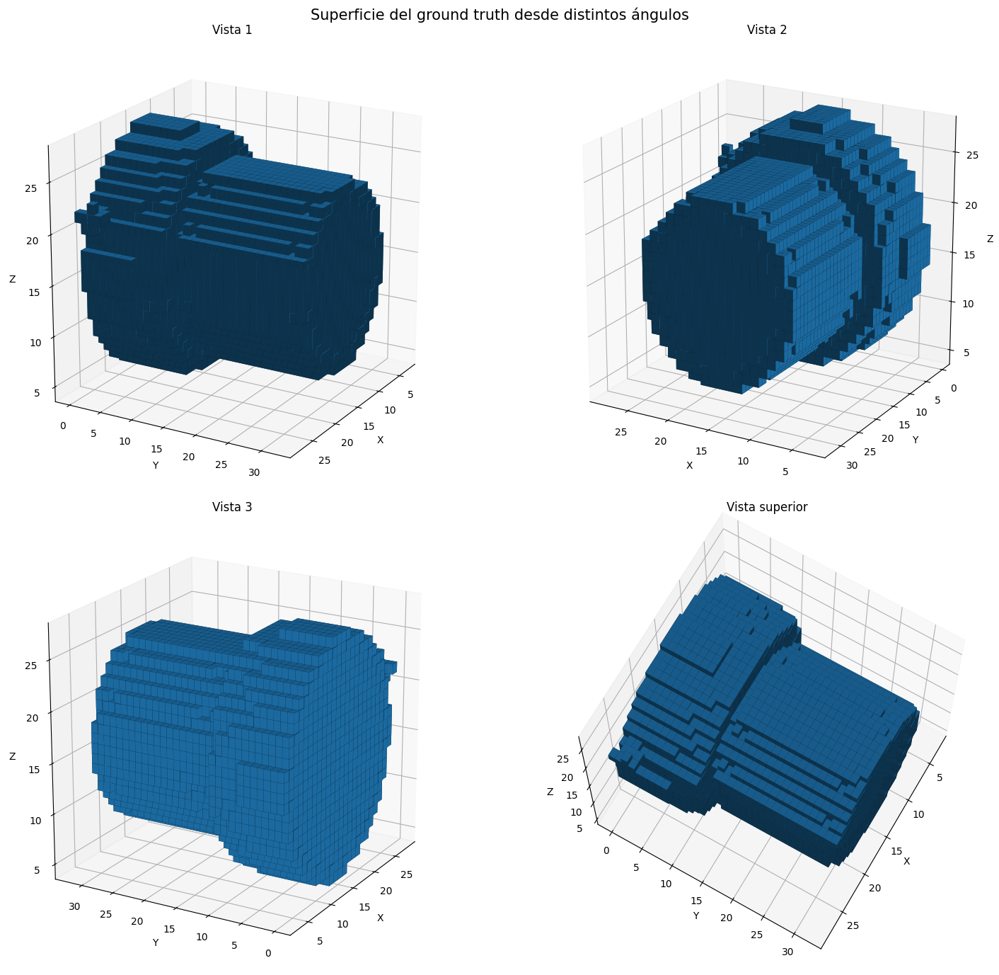

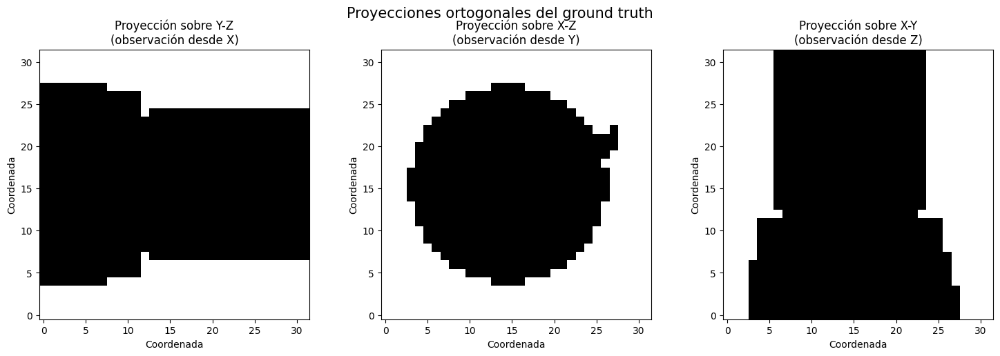

INTERPRETACIÓN
El asa debería ser visible al menos en una de las vistas 3D o en una de las proyecciones laterales.
Esta celda puede eliminarse sin afectar al resto del notebook.


In [40]:
# ============================================================
# [COMPROBACION] VOXEL DESDE VARIOS ÁNGULOS
#
# Esta celda puede borrarse completamente después.
# No deja variables necesarias para las siguientes celdas.
# ============================================================

def _comprobar_voxel_desde_varios_angulos():

    # Se utiliza el mismo primer objeto de validación.
    fila = df_validacion.iloc[0]

    voxel, metadata = leer_binvox(
        fila["ruta_binvox"]
    )

    voxel_booleano = voxel > 0.5

    # --------------------------------------------------------
    # Extraer únicamente la superficie exterior
    # --------------------------------------------------------

    # Un voxel se considera interior cuando él mismo y todos
    # sus vecinos inmediatos están ocupados.
    interior = binary_erosion(
        voxel_booleano,
        structure=np.ones(
            (3, 3, 3),
            dtype=bool
        ),
        border_value=0
    )

    superficie = (
        voxel_booleano
        & ~interior
    )

    print("=" * 75)
    print("[COMPROBACION] INSPECCIÓN MULTIÁNGULO DEL VOXEL")
    print("=" * 75)

    print(
        f"Identificador:          "
        f"{fila['identificador']}"
    )

    print(
        f"Forma:                  "
        f"{voxel_booleano.shape}"
    )

    print(
        f"Vóxeles ocupados:       "
        f"{int(voxel_booleano.sum()):,}"
    )

    print(
        f"Vóxeles de superficie:  "
        f"{int(superficie.sum()):,}"
    )

    print(
        f"Dimensiones originales: "
        f"{metadata['dimensiones_originales']}"
    )

    print(
        f"Orden de salida:         "
        f"{metadata['orden_ejes_salida']}"
    )

    # --------------------------------------------------------
    # Cuatro vistas tridimensionales
    # --------------------------------------------------------

    configuraciones_camara = [
        (20, 30, "Vista 1"),
        (20, 120, "Vista 2"),
        (20, 210, "Vista 3"),
        (70, 30, "Vista superior"),
    ]

    figura = plt.figure(
        figsize=(16, 14)
    )

    for posicion, (
        elevacion,
        azimut,
        titulo
    ) in enumerate(
        configuraciones_camara,
        start=1
    ):

        eje = figura.add_subplot(
            2,
            2,
            posicion,
            projection="3d"
        )

        # Se representa solamente la superficie para evitar que
        # los vóxeles interiores oculten detalles externos.
        eje.voxels(
            superficie,
            edgecolor="k",
            linewidth=0.04
        )

        eje.view_init(
            elev=elevacion,
            azim=azimut
        )

        eje.set_title(titulo)

        eje.set_xlabel("X")
        eje.set_ylabel("Y")
        eje.set_zlabel("Z")

        eje.set_box_aspect(
            superficie.shape
        )

    figura.suptitle(
        "Superficie del ground truth desde distintos ángulos",
        fontsize=15
    )

    plt.tight_layout()
    plt.show()

    # --------------------------------------------------------
    # Proyecciones ortogonales
    # --------------------------------------------------------

    # En cada proyección se marca un píxel cuando existe al
    # menos un voxel ocupado a lo largo del eje observado.
    proyeccion_x = voxel_booleano.max(axis=0)
    proyeccion_y = voxel_booleano.max(axis=1)
    proyeccion_z = voxel_booleano.max(axis=2)

    figura_proyecciones, ejes = plt.subplots(
        1,
        3,
        figsize=(15, 5)
    )

    ejes[0].imshow(
        proyeccion_x.T,
        origin="lower",
        cmap="gray_r"
    )
    ejes[0].set_title(
        "Proyección sobre Y-Z\n(observación desde X)"
    )

    ejes[1].imshow(
        proyeccion_y.T,
        origin="lower",
        cmap="gray_r"
    )
    ejes[1].set_title(
        "Proyección sobre X-Z\n(observación desde Y)"
    )

    ejes[2].imshow(
        proyeccion_z.T,
        origin="lower",
        cmap="gray_r"
    )
    ejes[2].set_title(
        "Proyección sobre X-Y\n(observación desde Z)"
    )

    for eje in ejes:
        eje.set_xlabel("Coordenada")
        eje.set_ylabel("Coordenada")

    figura_proyecciones.suptitle(
        "Proyecciones ortogonales del ground truth",
        fontsize=15
    )

    plt.tight_layout()
    plt.show()

    print("=" * 75)
    print("INTERPRETACIÓN")
    print("=" * 75)

    print(
        "El asa debería ser visible al menos en una de las "
        "vistas 3D o en una de las proyecciones laterales."
    )

    print(
        "Esta celda puede eliminarse sin afectar "
        "al resto del notebook."
    )


_comprobar_voxel_desde_varios_angulos()

del _comprobar_voxel_desde_varios_angulos

## 5. Definición de la función de pérdida y las métricas

La salida de Pix2Vox++ es una cuadrícula de probabilidades de ocupación. Para cada posición de la cuadrícula `32 × 32 × 32`, el modelo devuelve un valor entre 0 y 1 que representa la probabilidad de que ese vóxel esté ocupado.

### Función de pérdida

Durante el entrenamiento se utiliza **Binary Cross-Entropy — BCE**. Esta función compara individualmente la probabilidad predicha para cada vóxel con su valor real:

- `0`: vóxel vacío.
- `1`: vóxel ocupado.

La BCE se utiliza para actualizar los pesos del modelo, pero no es suficiente para interpretar visualmente la calidad de la reconstrucción.

### Métricas voxelizadas

**Intersection over Union — IoU**

Mide el solapamiento entre los vóxeles predichos y los reales:

$
\mathrm{IoU} =
\frac{
\left|\widehat{V} \cap V\right|
}{
\left|\widehat{V} \cup V\right|
}
$$

donde $\widehat{V}$ es el volumen predicho y $V$ es el ground truth.

Su valor se encuentra entre 0 y 1. Cuanto mayor sea, mejor será la reconstrucción. Será la métrica principal para seleccionar el mejor checkpoint.

**Dice o F1 voxel**

Compara el doble de la intersección con el número total de vóxeles ocupados en ambos volúmenes:

$$
\mathrm{Dice} =
\frac{
2\left|\widehat{V} \cap V\right|
}{
\left|\widehat{V}\right| + \left|V\right|
}
$$
También varía entre 0 y 1 y da algo más de importancia al solapamiento que IoU.

**Precisión voxel**

Indica qué proporción de los vóxeles predichos como ocupados pertenece realmente al objeto. Una precisión baja significa que el modelo está generando volumen de más.

$$
\mathrm{Precisión} =
\frac{TP}{TP + FP}
$$

**Recall voxel**

Indica qué proporción del objeto real ha sido reconstruida. Un recall bajo significa que el modelo está omitiendo partes de la geometría.

$$
\mathrm{Recall} =
\frac{TP}{TP + FN}
$$


No se utilizará la exactitud global porque la mayoría de las posiciones de una cuadrícula 3D están vacías. Un modelo que predijera casi todo como vacío podría obtener una exactitud aparentemente alta.

### Métricas de superficie

**Chamfer Distance**

Se extraen los vóxeles de la superficie de la predicción y del ground truth. Para cada punto se calcula la distancia hasta el punto más cercano de la otra superficie.

Una distancia de Chamfer menor indica que ambas superficies tienen formas más parecidas. En este notebook se expresará en unidades de vóxel.

$$
\mathrm{CD}(P,G) =
\frac{1}{2}
\left(
\frac{1}{|P|}
\sum_{p \in P}
\min_{g \in G}
\lVert p-g\rVert_2
+
\frac{1}{|G|}
\sum_{g \in G}
\min_{p \in P}
\lVert g-p\rVert_2
\right)
$$



**F-score de superficie a un vóxel**

Considera correcta una parte de la superficie cuando se encuentra a una distancia máxima de un vóxel de la otra superficie.

Combina:

- La precisión de la superficie predicha.
- El recall de la superficie real.

Su valor está entre 0 y 1 y es especialmente útil para comprobar si se reconstruyen detalles como el asa y los bordes de la taza.

$$
F_1(d) =
\frac{
2P(d)R(d)
}{
P(d) + R(d)
}
$$

### Umbral de ocupación

Para convertir probabilidades en vóxeles binarios se evaluarán los umbrales:

- `0.2`
- `0.3`
- `0.4`
- `0.5`

El mejor umbral se seleccionará utilizando únicamente el conjunto de validación. Después se mantendrá fijo al calcular las métricas finales sobre test.\


In [41]:
# ============================================================
# 5. FUNCIÓN DE PÉRDIDA Y MÉTRICAS DE RECONSTRUCCIÓN 3D
# ============================================================

# Umbrales empleados por la implementación de Pix2Vox.
UMBRALES_EVALUACION = (
    0.15,
    0.2,
    0.3,
    0.4,
    0.5,
)

# Umbral inicial. El definitivo se elegirá con validación.
UMBRAL_VOXEL_POR_DEFECTO = 0.5

# Una superficie se considera correctamente reconstruida
# si está como máximo a un vóxel de la superficie real.
TOLERANCIA_F_SCORE_VOXELES = 1.0

EPSILON_METRICAS = 1e-8


# ------------------------------------------------------------
# Normalización de las formas de los tensores
# ------------------------------------------------------------

def normalizar_forma_voxel(tensor):
    """
    Convierte un tensor voxel a la forma:

        (batch, 32, 32, 32)

    Se admiten como entrada:

        (32, 32, 32)
        (batch, 32, 32, 32)
        (batch, 1, 32, 32, 32)
    """

    if not torch.is_tensor(tensor):
        tensor = torch.as_tensor(
            tensor,
            dtype=torch.float32
        )

    if tensor.ndim == 3:

        tensor = tensor.unsqueeze(0)

    elif (
        tensor.ndim == 5
        and tensor.shape[1] == 1
    ):

        tensor = tensor.squeeze(1)

    if tensor.ndim != 4:
        raise ValueError(
            "El tensor voxel debe tener forma "
            "(32, 32, 32), "
            "(batch, 32, 32, 32) o "
            "(batch, 1, 32, 32, 32). "
            f"Forma recibida: {tuple(tensor.shape)}"
        )

    forma_espacial = tuple(
        tensor.shape[-3:]
    )

    forma_esperada = (
        RESOLUCION_VOXEL,
        RESOLUCION_VOXEL,
        RESOLUCION_VOXEL,
    )

    if forma_espacial != forma_esperada:
        raise ValueError(
            "La resolución voxel no es la esperada. "
            f"Esperada: {forma_esperada}. "
            f"Recibida: {forma_espacial}."
        )

    return tensor.float()


# ------------------------------------------------------------
# Pérdida de reconstrucción
# ------------------------------------------------------------

def perdida_reconstruccion_bce(
    prediccion,
    ground_truth
):
    """
    Binary Cross-Entropy utilizada para entrenar Pix2Vox++.

    La predicción debe contener probabilidades entre 0 y 1.
    Siguiendo la implementación original, la BCE se multiplica
    por 10 para conservar una escala similar.
    """

    prediccion = normalizar_forma_voxel(
        prediccion
    )

    ground_truth = normalizar_forma_voxel(
        ground_truth
    ).to(
        device=prediccion.device,
        dtype=prediccion.dtype
    )

    if prediccion.shape != ground_truth.shape:
        raise ValueError(
            "La predicción y el ground truth deben tener "
            "la misma forma.\n"
            f"Predicción: {tuple(prediccion.shape)}\n"
            f"Ground truth: {tuple(ground_truth.shape)}"
        )

    # Evita logaritmos de cero dentro de la BCE.
    prediccion = prediccion.clamp(
        min=EPSILON_METRICAS,
        max=1.0 - EPSILON_METRICAS
    )

    perdida = F.binary_cross_entropy(
        prediccion,
        ground_truth
    )

    return perdida * 10.0


# ------------------------------------------------------------
# Métricas de ocupación voxel
# ------------------------------------------------------------

@torch.no_grad()
def calcular_metricas_voxel(
    prediccion,
    ground_truth,
    umbral=UMBRAL_VOXEL_POR_DEFECTO
):
    """
    Calcula las métricas voxelizadas de cada objeto del lote.

    Devuelve tensores con un valor por objeto:

        iou
        dice
        precision_voxel
        recall_voxel
        voxeles_predichos
        voxeles_reales
    """

    if not 0.0 <= umbral <= 1.0:
        raise ValueError(
            "El umbral debe estar entre 0 y 1."
        )

    prediccion = normalizar_forma_voxel(
        prediccion
    )

    ground_truth = normalizar_forma_voxel(
        ground_truth
    ).to(
        device=prediccion.device
    )

    if prediccion.shape != ground_truth.shape:
        raise ValueError(
            "La predicción y el ground truth deben tener "
            "la misma forma."
        )

    prediccion_binaria = (
        prediccion >= umbral
    )

    ground_truth_binario = (
        ground_truth >= 0.5
    )

    dimensiones = (
        1,
        2,
        3,
    )

    verdaderos_positivos = (
        prediccion_binaria
        & ground_truth_binario
    ).sum(
        dim=dimensiones
    ).float()

    falsos_positivos = (
        prediccion_binaria
        & ~ground_truth_binario
    ).sum(
        dim=dimensiones
    ).float()

    falsos_negativos = (
        ~prediccion_binaria
        & ground_truth_binario
    ).sum(
        dim=dimensiones
    ).float()

    voxeles_predichos = (
        verdaderos_positivos
        + falsos_positivos
    )

    voxeles_reales = (
        verdaderos_positivos
        + falsos_negativos
    )

    union = (
        verdaderos_positivos
        + falsos_positivos
        + falsos_negativos
    )

    # Si ambos volúmenes estuvieran vacíos, el solapamiento
    # se considera perfecto.
    iou = torch.where(
        union > 0,
        verdaderos_positivos
        / union.clamp_min(EPSILON_METRICAS),
        torch.ones_like(union)
    )

    denominador_dice = (
        2.0 * verdaderos_positivos
        + falsos_positivos
        + falsos_negativos
    )

    dice = torch.where(
        denominador_dice > 0,
        2.0 * verdaderos_positivos
        / denominador_dice.clamp_min(
            EPSILON_METRICAS
        ),
        torch.ones_like(
            denominador_dice
        )
    )

    # Si no se predice ningún vóxel pero el objeto sí existe,
    # la precisión se considera cero.
    precision_voxel = torch.where(
        voxeles_predichos > 0,
        verdaderos_positivos
        / voxeles_predichos.clamp_min(
            EPSILON_METRICAS
        ),
        torch.where(
            voxeles_reales == 0,
            torch.ones_like(
                voxeles_predichos
            ),
            torch.zeros_like(
                voxeles_predichos
            )
        )
    )

    recall_voxel = torch.where(
        voxeles_reales > 0,
        verdaderos_positivos
        / voxeles_reales.clamp_min(
            EPSILON_METRICAS
        ),
        torch.ones_like(
            voxeles_reales
        )
    )

    return {
        "iou": iou,
        "dice": dice,
        "precision_voxel": precision_voxel,
        "recall_voxel": recall_voxel,
        "voxeles_predichos": voxeles_predichos,
        "voxeles_reales": voxeles_reales,
    }


# ------------------------------------------------------------
# Extracción de la superficie voxel
# ------------------------------------------------------------

def extraer_coordenadas_superficie(
    volumen_binario
):
    """
    Devuelve las coordenadas de los vóxeles de la superficie.

    Un vóxel es interior cuando él mismo y todos sus vecinos
    inmediatos están ocupados.
    """

    volumen_binario = np.asarray(
        volumen_binario,
        dtype=bool
    )

    if volumen_binario.shape != (
        RESOLUCION_VOXEL,
        RESOLUCION_VOXEL,
        RESOLUCION_VOXEL,
    ):
        raise ValueError(
            "El volumen debe tener forma "
            f"{RESOLUCION_VOXEL}³."
        )

    interior = binary_erosion(
        volumen_binario,
        structure=np.ones(
            (3, 3, 3),
            dtype=bool
        ),
        border_value=0
    )

    superficie = (
        volumen_binario
        & ~interior
    )

    coordenadas = np.argwhere(
        superficie
    ).astype(
        np.float32
    )

    return coordenadas


# ------------------------------------------------------------
# Métricas de superficie para un objeto
# ------------------------------------------------------------

def calcular_metricas_superficie(
    prediccion,
    ground_truth,
    umbral=UMBRAL_VOXEL_POR_DEFECTO,
    tolerancia_voxeles=TOLERANCIA_F_SCORE_VOXELES
):
    """
    Calcula Chamfer Distance y F-score entre dos superficies.

    Chamfer se expresa en unidades de vóxel y utiliza la media
    simétrica de las distancias euclídeas más cercanas.

    Esta función evalúa un único objeto.
    """

    if tolerancia_voxeles < 0:
        raise ValueError(
            "La tolerancia debe ser mayor o igual que cero."
        )

    if torch.is_tensor(prediccion):
        prediccion = (
            prediccion
            .detach()
            .cpu()
            .numpy()
        )

    if torch.is_tensor(ground_truth):
        ground_truth = (
            ground_truth
            .detach()
            .cpu()
            .numpy()
        )

    prediccion = np.asarray(
        prediccion
    ).squeeze()

    ground_truth = np.asarray(
        ground_truth
    ).squeeze()

    forma_esperada = (
        RESOLUCION_VOXEL,
        RESOLUCION_VOXEL,
        RESOLUCION_VOXEL,
    )

    if prediccion.shape != forma_esperada:
        raise ValueError(
            "La predicción debe representar un solo objeto "
            f"con forma {forma_esperada}."
        )

    if ground_truth.shape != forma_esperada:
        raise ValueError(
            "El ground truth debe representar un solo objeto "
            f"con forma {forma_esperada}."
        )

    prediccion_binaria = (
        prediccion >= umbral
    )

    ground_truth_binario = (
        ground_truth >= 0.5
    )

    superficie_predicha = (
        extraer_coordenadas_superficie(
            prediccion_binaria
        )
    )

    superficie_real = (
        extraer_coordenadas_superficie(
            ground_truth_binario
        )
    )

    numero_puntos_predichos = len(
        superficie_predicha
    )

    numero_puntos_reales = len(
        superficie_real
    )

    # Caso excepcional: ambos volúmenes están vacíos.
    if (
        numero_puntos_predichos == 0
        and numero_puntos_reales == 0
    ):
        return {
            "chamfer_superficie": 0.0,
            "precision_superficie": 1.0,
            "recall_superficie": 1.0,
            "f_score_superficie": 1.0,
            "puntos_superficie_predicha": 0,
            "puntos_superficie_real": 0,
        }

    # Si solo uno está vacío, se asigna la máxima distancia
    # posible dentro de la cuadrícula como penalización.
    if (
        numero_puntos_predichos == 0
        or numero_puntos_reales == 0
    ):
        maxima_distancia = (
            np.sqrt(3.0)
            * (RESOLUCION_VOXEL - 1)
        )

        return {
            "chamfer_superficie": float(
                maxima_distancia
            ),
            "precision_superficie": 0.0,
            "recall_superficie": 0.0,
            "f_score_superficie": 0.0,
            "puntos_superficie_predicha": int(
                numero_puntos_predichos
            ),
            "puntos_superficie_real": int(
                numero_puntos_reales
            ),
        }

    arbol_real = cKDTree(
        superficie_real
    )

    arbol_predicho = cKDTree(
        superficie_predicha
    )

    # Distancia desde cada punto predicho hasta la superficie real.
    distancias_predicho_real = (
        arbol_real.query(
            superficie_predicha,
            k=1
        )[0]
    )

    # Distancia desde cada punto real hasta la superficie predicha.
    distancias_real_predicho = (
        arbol_predicho.query(
            superficie_real,
            k=1
        )[0]
    )

    chamfer_superficie = 0.5 * (
        distancias_predicho_real.mean()
        + distancias_real_predicho.mean()
    )

    precision_superficie = np.mean(
        distancias_predicho_real
        <= tolerancia_voxeles
    )

    recall_superficie = np.mean(
        distancias_real_predicho
        <= tolerancia_voxeles
    )

    denominador_f_score = (
        precision_superficie
        + recall_superficie
    )

    if denominador_f_score > 0:

        f_score_superficie = (
            2.0
            * precision_superficie
            * recall_superficie
            / denominador_f_score
        )

    else:

        f_score_superficie = 0.0

    return {
        "chamfer_superficie": float(
            chamfer_superficie
        ),
        "precision_superficie": float(
            precision_superficie
        ),
        "recall_superficie": float(
            recall_superficie
        ),
        "f_score_superficie": float(
            f_score_superficie
        ),
        "puntos_superficie_predicha": int(
            numero_puntos_predichos
        ),
        "puntos_superficie_real": int(
            numero_puntos_reales
        ),
    }


print("=" * 75)
print("PÉRDIDA Y MÉTRICAS DEFINIDAS")
print("=" * 75)

print(
    f"Umbrales de evaluación: "
    f"{UMBRALES_EVALUACION}"
)

print(
    f"Umbral inicial:         "
    f"{UMBRAL_VOXEL_POR_DEFECTO}"
)

print(
    f"Tolerancia F-score:     "
    f"{TOLERANCIA_F_SCORE_VOXELES} vóxel"
)

print("\nMétricas voxel:")
print("  - IoU")
print("  - Dice")
print("  - Precisión")
print("  - Recall")

print("\nMétricas de superficie:")
print("  - Chamfer Distance")
print("  - F-score de superficie")

PÉRDIDA Y MÉTRICAS DEFINIDAS
Umbrales de evaluación: (0.15, 0.2, 0.3, 0.4, 0.5)
Umbral inicial:         0.5
Tolerancia F-score:     1.0 vóxel

Métricas voxel:
  - IoU
  - Dice
  - Precisión
  - Recall

Métricas de superficie:
  - Chamfer Distance
  - F-score de superficie


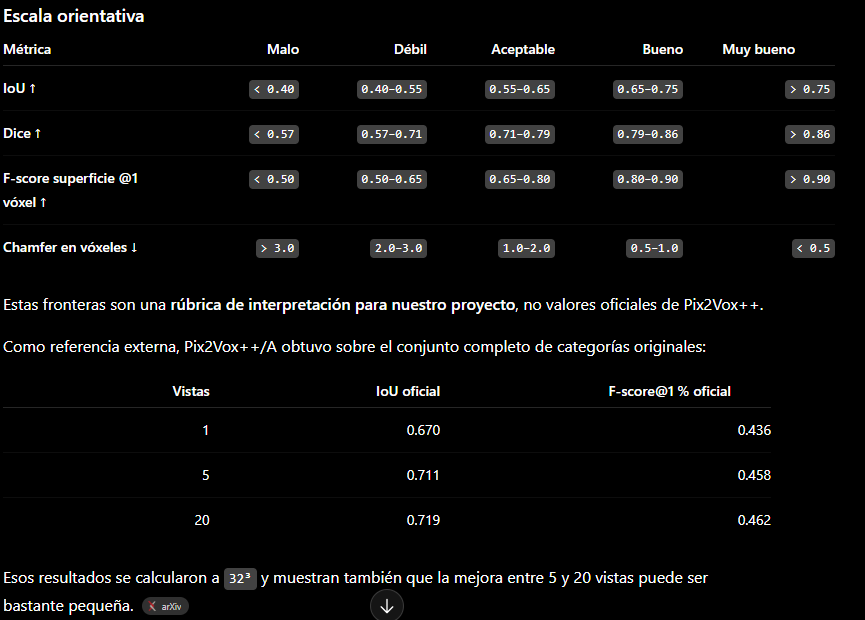

## 6. Definición de la arquitectura Pix2Vox++/A

Pix2Vox++ reconstruye un objeto tridimensional a partir de una o varias imágenes mediante cuatro módulos principales.

### Encoder 2D

Cada imagen se procesa independientemente mediante una red ResNet-50 truncada. El encoder transforma una imagen RGB de `224 × 224` píxeles en un mapa de características de forma:

```text
256 × 7 × 7

Usamos Resnet50, evaluar si podemos utilizar algo que funcione mejor en vez de esto, por ejemplo, efficientnet. EffientnetV4

In [42]:

# ============================================================
# 6. ARQUITECTURA PIX2VOX++/A
# ============================================================

LEAKY_RELU_VALUE = 0.2
USAR_BIAS_CONVOLUCIONES_TRANSPUESTAS = False


# ------------------------------------------------------------
# Encoder 2D
# ------------------------------------------------------------

class EncoderPix2VoxPlusPlusA(nn.Module):
    """
    Encoder 2D de Pix2Vox++/A.

    Entrada
    -------
    imagenes : torch.Tensor
        Forma:
            (batch, numero_vistas, 3, 224, 224)

    Salida
    ------
    caracteristicas : torch.Tensor
        Forma:
            (batch, numero_vistas, 256, 7, 7)
    """

    def __init__(
        self,
        usar_pesos_imagenet=False
    ):
        super().__init__()

        # Cuando se cargue el checkpoint completo de Pix2Vox++,
        # estos pesos serán sustituidos por los del checkpoint.
        pesos_resnet = (
            models.ResNet50_Weights.DEFAULT
            if usar_pesos_imagenet
            else None
        )

        resnet = models.resnet50(
            weights=pesos_resnet
        )

        # Se conserva ResNet-50 hasta layer2.
        # Para una imagen 224 x 224 produce:
        # (batch, 512, 28, 28)
        self.resnet = nn.Sequential(
            resnet.conv1,
            resnet.bn1,
            resnet.relu,
            resnet.maxpool,
            resnet.layer1,
            resnet.layer2,
        )

        self.layer1 = nn.Sequential(
            nn.Conv2d(
                in_channels=512,
                out_channels=512,
                kernel_size=3,
                padding=1
            ),
            nn.BatchNorm2d(512),
            nn.ReLU(),
        )

        self.layer2 = nn.Sequential(
            nn.Conv2d(
                in_channels=512,
                out_channels=256,
                kernel_size=3,
                padding=1
            ),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(
                kernel_size=2
            ),
        )

        self.layer3 = nn.Sequential(
            nn.Conv2d(
                in_channels=256,
                out_channels=256,
                kernel_size=3,
                padding=1
            ),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(
                kernel_size=2
            ),
        )

    def forward(self, imagenes):

        if imagenes.ndim != 5:
            raise ValueError(
                "El encoder espera un tensor con forma "
                "(batch, vistas, 3, 224, 224). "
                f"Forma recibida: {tuple(imagenes.shape)}"
            )

        if imagenes.shape[2] != 3:
            raise ValueError(
                "Las imágenes deben contener tres canales."
            )

        # Se coloca primero la dimensión de las vistas:
        # (vistas, batch, canales, alto, ancho)
        imagenes_por_vista = imagenes.permute(
            1,
            0,
            2,
            3,
            4
        ).contiguous()

        caracteristicas_vistas = []

        # Los pesos del encoder son compartidos.
        for imagen_vista in torch.unbind(
            imagenes_por_vista,
            dim=0
        ):
            caracteristicas = self.resnet(
                imagen_vista
            )

            caracteristicas = self.layer1(
                caracteristicas
            )

            caracteristicas = self.layer2(
                caracteristicas
            )

            caracteristicas = self.layer3(
                caracteristicas
            )

            caracteristicas_vistas.append(
                caracteristicas
            )

        # (batch, vistas, 256, 7, 7)
        caracteristicas_vistas = torch.stack(
            caracteristicas_vistas,
            dim=1
        )

        return caracteristicas_vistas


# ------------------------------------------------------------
# Decoder 3D
# ------------------------------------------------------------

class DecoderPix2VoxPlusPlusA(nn.Module):
    """
    Genera una reconstrucción voxel preliminar por cada vista.

    Entrada
    -------
    caracteristicas : torch.Tensor
        (batch, vistas, 256, 7, 7)

    Salida
    ------
    caracteristicas_3d : torch.Tensor
        (batch, vistas, 9, 32, 32, 32)

    volumenes_preliminares : torch.Tensor
        (batch, vistas, 32, 32, 32)
    """

    def __init__(self):
        super().__init__()

        # 256 x 7 x 7 = 12.544 valores.
        #
        # Esos valores se reorganizan como:
        # 1.568 x 2 x 2 x 2 = 12.544.
        self.layer1 = nn.Sequential(
            nn.ConvTranspose3d(
                in_channels=1568,
                out_channels=512,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=(
                    USAR_BIAS_CONVOLUCIONES_TRANSPUESTAS
                ),
            ),
            nn.BatchNorm3d(512),
            nn.ReLU(),
        )

        self.layer2 = nn.Sequential(
            nn.ConvTranspose3d(
                in_channels=512,
                out_channels=128,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=(
                    USAR_BIAS_CONVOLUCIONES_TRANSPUESTAS
                ),
            ),
            nn.BatchNorm3d(128),
            nn.ReLU(),
        )

        self.layer3 = nn.Sequential(
            nn.ConvTranspose3d(
                in_channels=128,
                out_channels=32,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=(
                    USAR_BIAS_CONVOLUCIONES_TRANSPUESTAS
                ),
            ),
            nn.BatchNorm3d(32),
            nn.ReLU(),
        )

        self.layer4 = nn.Sequential(
            nn.ConvTranspose3d(
                in_channels=32,
                out_channels=8,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=(
                    USAR_BIAS_CONVOLUCIONES_TRANSPUESTAS
                ),
            ),
            nn.BatchNorm3d(8),
            nn.ReLU(),
        )

        self.layer5 = nn.Sequential(
            nn.ConvTranspose3d(
                in_channels=8,
                out_channels=1,
                kernel_size=1,
                bias=(
                    USAR_BIAS_CONVOLUCIONES_TRANSPUESTAS
                ),
            ),
            nn.Sigmoid(),
        )

    def forward(self, caracteristicas_imagenes):

        if caracteristicas_imagenes.ndim != 5:
            raise ValueError(
                "El decoder espera un tensor con forma "
                "(batch, vistas, 256, 7, 7). "
                f"Forma recibida: "
                f"{tuple(caracteristicas_imagenes.shape)}"
            )

        caracteristicas_por_vista = (
            caracteristicas_imagenes.permute(
                1,
                0,
                2,
                3,
                4
            ).contiguous()
        )

        lista_caracteristicas_3d = []
        lista_volumenes = []

        for caracteristicas_vista in torch.unbind(
            caracteristicas_por_vista,
            dim=0
        ):
            # (batch, 1568, 2, 2, 2)
            volumen = caracteristicas_vista.reshape(
                -1,
                1568,
                2,
                2,
                2
            )

            volumen = self.layer1(
                volumen
            )

            volumen = self.layer2(
                volumen
            )

            volumen = self.layer3(
                volumen
            )

            # Características tridimensionales:
            # (batch, 8, 32, 32, 32)
            volumen = self.layer4(
                volumen
            )

            caracteristicas_3d = volumen

            # Probabilidad de ocupación:
            # (batch, 1, 32, 32, 32)
            volumen_ocupacion = self.layer5(
                volumen
            )

            # Se concatenan las ocho características y
            # la probabilidad: 8 + 1 = 9 canales.
            caracteristicas_3d = torch.cat(
                [
                    caracteristicas_3d,
                    volumen_ocupacion,
                ],
                dim=1
            )

            lista_caracteristicas_3d.append(
                caracteristicas_3d
            )

            lista_volumenes.append(
                volumen_ocupacion.squeeze(1)
            )

        caracteristicas_3d = torch.stack(
            lista_caracteristicas_3d,
            dim=1
        )

        volumenes_preliminares = torch.stack(
            lista_volumenes,
            dim=1
        )

        return (
            caracteristicas_3d,
            volumenes_preliminares,
        )


# ------------------------------------------------------------
# Fusión contextual multiescala
# ------------------------------------------------------------

class MergerPix2VoxPlusPlusA(nn.Module):
    """
    Fusiona los volúmenes preliminares de todas las vistas.

    Para cada vóxel calcula un peso diferente para cada vista.
    Los pesos se normalizan mediante softmax.
    """

    def __init__(self):
        super().__init__()

        self.layer1 = nn.Sequential(
            nn.Conv3d(
                9,
                9,
                kernel_size=3,
                padding=1
            ),
            nn.BatchNorm3d(9),
            nn.LeakyReLU(
                LEAKY_RELU_VALUE
            ),
        )

        self.layer2 = nn.Sequential(
            nn.Conv3d(
                9,
                9,
                kernel_size=3,
                padding=1
            ),
            nn.BatchNorm3d(9),
            nn.LeakyReLU(
                LEAKY_RELU_VALUE
            ),
        )

        self.layer3 = nn.Sequential(
            nn.Conv3d(
                9,
                9,
                kernel_size=3,
                padding=1
            ),
            nn.BatchNorm3d(9),
            nn.LeakyReLU(
                LEAKY_RELU_VALUE
            ),
        )

        self.layer4 = nn.Sequential(
            nn.Conv3d(
                9,
                9,
                kernel_size=3,
                padding=1
            ),
            nn.BatchNorm3d(9),
            nn.LeakyReLU(
                LEAKY_RELU_VALUE
            ),
        )

        # Se concatenan las cuatro escalas:
        # 9 + 9 + 9 + 9 = 36 canales.
        self.layer5 = nn.Sequential(
            nn.Conv3d(
                36,
                9,
                kernel_size=3,
                padding=1
            ),
            nn.BatchNorm3d(9),
            nn.LeakyReLU(
                LEAKY_RELU_VALUE
            ),
        )

        self.layer6 = nn.Sequential(
            nn.Conv3d(
                9,
                1,
                kernel_size=3,
                padding=1
            ),
            nn.BatchNorm3d(1),
            nn.LeakyReLU(
                LEAKY_RELU_VALUE
            ),
        )

    def forward(
        self,
        caracteristicas_3d,
        volumenes_preliminares
    ):
        numero_vistas = (
            volumenes_preliminares.shape[1]
        )

        pesos_vistas = []

        for indice_vista in range(
            numero_vistas
        ):
            caracteristicas_vista = (
                caracteristicas_3d[
                    :,
                    indice_vista,
                    :,
                    :,
                    :,
                    :
                ]
            )

            peso_escala_1 = self.layer1(
                caracteristicas_vista
            )

            peso_escala_2 = self.layer2(
                peso_escala_1
            )

            peso_escala_3 = self.layer3(
                peso_escala_2
            )

            peso_escala_4 = self.layer4(
                peso_escala_3
            )

            peso_multiescala = self.layer5(
                torch.cat(
                    [
                        peso_escala_1,
                        peso_escala_2,
                        peso_escala_3,
                        peso_escala_4,
                    ],
                    dim=1
                )
            )

            peso_vista = self.layer6(
                peso_multiescala
            ).squeeze(1)

            pesos_vistas.append(
                peso_vista
            )

        # (batch, vistas, 32, 32, 32)
        pesos_vistas = torch.stack(
            pesos_vistas,
            dim=1
        )

        # Para cada posición voxel, la suma de los pesos
        # de todas las vistas es igual a uno.
        pesos_vistas = torch.softmax(
            pesos_vistas,
            dim=1
        )

        volumen_fusionado = torch.sum(
            volumenes_preliminares
            * pesos_vistas,
            dim=1
        )

        volumen_fusionado = torch.clamp(
            volumen_fusionado,
            min=0.0,
            max=1.0
        )

        return volumen_fusionado


# ------------------------------------------------------------
# Refiner 3D
# ------------------------------------------------------------

class RefinerPix2VoxPlusPlusA(nn.Module):
    """
    Refina el volumen fusionado mediante una arquitectura
    3D encoder-decoder con conexiones residuales.
    """

    def __init__(self):
        super().__init__()

        self.layer1 = nn.Sequential(
            nn.Conv3d(
                1,
                32,
                kernel_size=4,
                padding=2
            ),
            nn.BatchNorm3d(32),
            nn.LeakyReLU(
                LEAKY_RELU_VALUE
            ),
            nn.MaxPool3d(
                kernel_size=2
            ),
        )

        self.layer2 = nn.Sequential(
            nn.Conv3d(
                32,
                64,
                kernel_size=4,
                padding=2
            ),
            nn.BatchNorm3d(64),
            nn.LeakyReLU(
                LEAKY_RELU_VALUE
            ),
            nn.MaxPool3d(
                kernel_size=2
            ),
        )

        self.layer3 = nn.Sequential(
            nn.Conv3d(
                64,
                128,
                kernel_size=4,
                padding=2
            ),
            nn.BatchNorm3d(128),
            nn.LeakyReLU(
                LEAKY_RELU_VALUE
            ),
            nn.MaxPool3d(
                kernel_size=2
            ),
        )

        self.layer4 = nn.Sequential(
            nn.Linear(
                8192,
                2048
            ),
            nn.ReLU(),
        )

        self.layer5 = nn.Sequential(
            nn.Linear(
                2048,
                8192
            ),
            nn.ReLU(),
        )

        self.layer6 = nn.Sequential(
            nn.ConvTranspose3d(
                128,
                64,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=(
                    USAR_BIAS_CONVOLUCIONES_TRANSPUESTAS
                ),
            ),
            nn.BatchNorm3d(64),
            nn.ReLU(),
        )

        self.layer7 = nn.Sequential(
            nn.ConvTranspose3d(
                64,
                32,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=(
                    USAR_BIAS_CONVOLUCIONES_TRANSPUESTAS
                ),
            ),
            nn.BatchNorm3d(32),
            nn.ReLU(),
        )

        self.layer8 = nn.Sequential(
            nn.ConvTranspose3d(
                32,
                1,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=(
                    USAR_BIAS_CONVOLUCIONES_TRANSPUESTAS
                ),
            ),
            nn.Sigmoid(),
        )

    def forward(self, volumen_fusionado):

        # (batch, 1, 32, 32, 32)
        volumen_32_izquierda = (
            volumen_fusionado.unsqueeze(1)
        )

        volumen_16_izquierda = self.layer1(
            volumen_32_izquierda
        )

        volumen_8_izquierda = self.layer2(
            volumen_16_izquierda
        )

        volumen_4_izquierda = self.layer3(
            volumen_8_izquierda
        )

        caracteristicas_planas = self.layer4(
            volumen_4_izquierda.reshape(
                -1,
                8192
            )
        )

        caracteristicas_planas = self.layer5(
            caracteristicas_planas
        )

        volumen_4_derecha = (
            volumen_4_izquierda
            + caracteristicas_planas.reshape(
                -1,
                128,
                4,
                4,
                4
            )
        )

        volumen_8_derecha = (
            volumen_8_izquierda
            + self.layer6(
                volumen_4_derecha
            )
        )

        volumen_16_derecha = (
            volumen_16_izquierda
            + self.layer7(
                volumen_8_derecha
            )
        )

        volumen_32_derecha = (
            volumen_32_izquierda
            + self.layer8(
                volumen_16_derecha
            )
        ) * 0.5

        return volumen_32_derecha.squeeze(1)


# ------------------------------------------------------------
# Modelo completo
# ------------------------------------------------------------

class Pix2VoxPlusPlusA(nn.Module):
    """
    Modelo completo Pix2Vox++/A.

    Devuelve tanto la reconstrucción final como las salidas
    intermedias necesarias para calcular pérdidas y analizar
    el funcionamiento del modelo.
    """

    def __init__(
        self,
        usar_refiner=True,
        usar_merger=True,
        usar_pesos_imagenet=False,
    ):
        super().__init__()

        self.usar_refiner = usar_refiner
        self.usar_merger = usar_merger

        self.encoder = EncoderPix2VoxPlusPlusA(
            usar_pesos_imagenet=(
                usar_pesos_imagenet
            )
        )

        self.decoder = DecoderPix2VoxPlusPlusA()
        self.merger = MergerPix2VoxPlusPlusA()
        self.refiner = RefinerPix2VoxPlusPlusA()

    def forward(self, imagenes):

        caracteristicas_2d = self.encoder(
            imagenes
        )

        (
            caracteristicas_3d,
            volumenes_por_vista,
        ) = self.decoder(
            caracteristicas_2d
        )

        if self.usar_merger:

            volumen_fusionado = self.merger(
                caracteristicas_3d,
                volumenes_por_vista
            )

        else:

            volumen_fusionado = torch.mean(
                volumenes_por_vista,
                dim=1
            )

        if self.usar_refiner:

            volumen_final = self.refiner(
                volumen_fusionado
            )

        else:

            volumen_final = volumen_fusionado

        return {
            "volumen_final": volumen_final,
            "volumen_fusionado": volumen_fusionado,
            "volumenes_por_vista": volumenes_por_vista,
        }


# ------------------------------------------------------------
# Funciones auxiliares
# ------------------------------------------------------------

def contar_parametros_modelo(modelo):
    """
    Cuenta los parámetros totales y entrenables.
    """

    parametros_totales = sum(
        parametro.numel()
        for parametro in modelo.parameters()
    )

    parametros_entrenables = sum(
        parametro.numel()
        for parametro in modelo.parameters()
        if parametro.requires_grad
    )

    return {
        "parametros_totales": parametros_totales,
        "parametros_entrenables": parametros_entrenables,
    }


print("=" * 75)
print("ARQUITECTURA PIX2VOX++/A DEFINIDA")
print("=" * 75)

print("Módulos disponibles:")
print("  - EncoderPix2VoxPlusPlusA")
print("  - DecoderPix2VoxPlusPlusA")
print("  - MergerPix2VoxPlusPlusA")
print("  - RefinerPix2VoxPlusPlusA")
print("  - Pix2VoxPlusPlusA")

print(
    "\nTodavía no se ha creado una instancia ni se han "
    "cargado los pesos preentrenados."
)

ARQUITECTURA PIX2VOX++/A DEFINIDA
Módulos disponibles:
  - EncoderPix2VoxPlusPlusA
  - DecoderPix2VoxPlusPlusA
  - MergerPix2VoxPlusPlusA
  - RefinerPix2VoxPlusPlusA
  - Pix2VoxPlusPlusA

Todavía no se ha creado una instancia ni se han cargado los pesos preentrenados.


## 7. Carga y validación del modelo preentrenado

Para evaluar Pix2Vox++ sin fine-tuning y utilizar una inicialización adecuada durante el ajuste sobre tazas, se emplea el checkpoint oficial de **Pix2Vox++/A entrenado sobre ShapeNet**.

El archivo se almacena en:

```text
Datos_E2/Pix2Vox++/pesos_preentrenados/Pix2Vox++-A-ShapeNet.pth
```
El checkpoint contiene los parámetros de los cuatro módulos que forman el modelo:

- Encoder.
- Decoder.
- Merger.
- Refiner.

El archivo oficial fue generado con una versión antigua de PyTorch que utilizaba el formato clásico de serialización. Además, algunos de sus metadatos, como la época y la mejor IoU, están representados mediante tipos escalares de NumPy.

Las versiones actuales de PyTorch restringen por defecto la deserialización de estos tipos. Para mantener una carga segura, se utiliza `weights_only=True` y se autorizan únicamente los tipos concretos de NumPy necesarios para interpretar el checkpoint.

La celda realiza las siguientes comprobaciones:

1. Verifica que el archivo existe.
2. Comprueba que su tamaño es compatible con el checkpoint oficial.
3. Crea temporalmente una instancia de Pix2Vox++/A.
4. Carga por separado los pesos del encoder, decoder, merger y refiner.
5. Comprueba que no existen parámetros ausentes ni inesperados.
6. Muestra el número total de parámetros y los metadatos guardados.
7. Elimina el modelo temporal para liberar memoria.

Las funciones de carga se conservan porque serán utilizadas posteriormente para crear los experimentos con y sin fine-tuning.

In [43]:
# ============================================================
# 7. CARGA Y VALIDACIÓN DEL CHECKPOINT OFICIAL PIX2VOX++/A
# ============================================================

# ------------------------------------------------------------
# Ruta del checkpoint
# ------------------------------------------------------------

RUTA_PESOS_PREENTRENADOS = (
    RUTA_PIX2VOX
    / "pesos_preentrenados"
)

RUTA_PESOS_PREENTRENADOS.mkdir(
    parents=True,
    exist_ok=True
)

NOMBRE_CHECKPOINT_OFICIAL = (
    "Pix2Vox++-A-ShapeNet.pth"
)

RUTA_CHECKPOINT_OFICIAL = (
    RUTA_PESOS_PREENTRENADOS
    / NOMBRE_CHECKPOINT_OFICIAL
)

# El checkpoint ocupa aproximadamente:
#
# 367,57 MiB
# 385,43 MB decimales
#
# Se acepta un intervalo amplio para detectar archivos
# incompletos o archivos pertenecientes a otro modelo.
TAMANO_MINIMO_CHECKPOINT_MIB = 300.0
TAMANO_MAXIMO_CHECKPOINT_MIB = 450.0


# ------------------------------------------------------------
# Validación física del archivo
# ------------------------------------------------------------

def validar_archivo_checkpoint(
    ruta_checkpoint=RUTA_CHECKPOINT_OFICIAL
):
    """
    Comprueba que el checkpoint existe y tiene un tamaño
    compatible con Pix2Vox++/A.
    """

    ruta_checkpoint = Path(
        ruta_checkpoint
    )

    if not ruta_checkpoint.exists():
        raise FileNotFoundError(
            "No se ha encontrado el checkpoint oficial.\n\n"
            "El archivo debe guardarse exactamente en:\n"
            f"{ruta_checkpoint}"
        )

    tamano_mib = (
        ruta_checkpoint.stat().st_size
        / (1024 ** 2)
    )

    if not (
        TAMANO_MINIMO_CHECKPOINT_MIB
        <= tamano_mib
        <= TAMANO_MAXIMO_CHECKPOINT_MIB
    ):
        raise RuntimeError(
            "El tamaño del archivo no parece corresponder al "
            "checkpoint oficial de Pix2Vox++/A.\n\n"
            f"Tamaño encontrado: {tamano_mib:.2f} MiB\n"
            f"Intervalo esperado: "
            f"{TAMANO_MINIMO_CHECKPOINT_MIB:.0f}-"
            f"{TAMANO_MAXIMO_CHECKPOINT_MIB:.0f} MiB\n\n"
            f"Archivo:\n{ruta_checkpoint}"
        )

    return tamano_mib


# ------------------------------------------------------------
# Compatibilidad con DataParallel
# ------------------------------------------------------------

def eliminar_prefijo_module(
    state_dict
):
    """
    Elimina el prefijo 'module.' que PyTorch añade cuando
    un modelo se entrena mediante DataParallel.

    Ejemplo
    -------
    module.layer1.0.weight
    se convierte en:
    layer1.0.weight
    """

    state_dict_limpio = {}

    for nombre_parametro, valor in state_dict.items():

        if nombre_parametro.startswith(
            "module."
        ):
            nombre_parametro = nombre_parametro[
                len("module.") :
            ]

        state_dict_limpio[
            nombre_parametro
        ] = valor

    return state_dict_limpio


# ------------------------------------------------------------
# Tipos NumPy admitidos por el checkpoint antiguo
# ------------------------------------------------------------

def obtener_globals_numpy_seguros():
    """
    Devuelve exclusivamente los tipos NumPy necesarios para
    cargar el checkpoint antiguo manteniendo weights_only=True.

    No se desactiva el modo de carga restringida.
    """

    # NumPy moderno utiliza numpy._core.
    # Versiones antiguas utilizaban numpy.core.
    modulo_multiarray = (
        np._core.multiarray
        if hasattr(np, "_core")
        else np.core.multiarray
    )

    globals_seguros = [
        (
            modulo_multiarray.scalar,
            "numpy.core.multiarray.scalar"
        ),
        np.dtype,
    ]

    # NumPy moderno define una clase específica para cada dtype.
    if hasattr(np, "dtypes"):

        nombres_dtype = [
            "BoolDType",
            "Int8DType",
            "Int16DType",
            "Int32DType",
            "Int64DType",
            "UInt8DType",
            "UInt16DType",
            "UInt32DType",
            "UInt64DType",
            "Float16DType",
            "Float32DType",
            "Float64DType",
        ]

        for nombre_dtype in nombres_dtype:

            clase_dtype = getattr(
                np.dtypes,
                nombre_dtype,
                None
            )

            if clase_dtype is not None:
                globals_seguros.append(
                    clase_dtype
                )

    # Compatibilidad con versiones antiguas de NumPy.
    else:

        tipos_numpy = [
            np.bool_,
            np.int8,
            np.int16,
            np.int32,
            np.int64,
            np.uint8,
            np.uint16,
            np.uint32,
            np.uint64,
            np.float16,
            np.float32,
            np.float64,
        ]

        globals_seguros.extend(
            {
                type(np.dtype(tipo))
                for tipo in tipos_numpy
            }
        )

    return globals_seguros


# ------------------------------------------------------------
# Carga del checkpoint
# ------------------------------------------------------------

def cargar_pesos_preentrenados_pix2vox(
    modelo,
    ruta_checkpoint=RUTA_CHECKPOINT_OFICIAL,
    dispositivo_carga="cpu",
    estricto=True,
):
    """
    Carga los pesos preentrenados de los cuatro módulos de
    Pix2Vox++/A.

    Parámetros
    ----------
    modelo : Pix2VoxPlusPlusA
        Instancia en la que se cargarán los parámetros.

    ruta_checkpoint : str o pathlib.Path
        Ruta del checkpoint oficial.

    dispositivo_carga : str
        Se recomienda cargar inicialmente en CPU para evitar
        ocupar innecesariamente memoria de la GPU.

    estricto : bool
        Cuando es True, exige una coincidencia exacta entre
        la arquitectura y el checkpoint.

    Devuelve
    --------
    metadata : dict
        Metadatos del checkpoint e informe de cada módulo.
    """

    ruta_checkpoint = Path(
        ruta_checkpoint
    )

    validar_archivo_checkpoint(
        ruta_checkpoint
    )

    globals_numpy_seguros = (
        obtener_globals_numpy_seguros()
    )

    # El checkpoint utiliza la serialización antigua de PyTorch.
    # Por eso no se usa get_unsafe_globals_in_checkpoint, que
    # solamente funciona con el formato ZIP moderno.
    with torch.serialization.safe_globals(
        globals_numpy_seguros
    ):

        checkpoint = torch.load(
            ruta_checkpoint,
            map_location=dispositivo_carga,
            weights_only=True,
        )

    if not isinstance(checkpoint, dict):
        raise TypeError(
            "El checkpoint no contiene un diccionario "
            "de parámetros."
        )

    claves_obligatorias = {
        "encoder_state_dict",
        "decoder_state_dict",
        "merger_state_dict",
        "refiner_state_dict",
    }

    claves_encontradas = set(
        checkpoint.keys()
    )

    claves_faltantes = (
        claves_obligatorias
        - claves_encontradas
    )

    if claves_faltantes:
        raise KeyError(
            "El checkpoint no contiene todos los módulos "
            "esperados.\n\n"
            f"Claves ausentes: {sorted(claves_faltantes)}\n"
            f"Claves encontradas: {sorted(claves_encontradas)}"
        )

    correspondencias = {
        "encoder": "encoder_state_dict",
        "decoder": "decoder_state_dict",
        "merger": "merger_state_dict",
        "refiner": "refiner_state_dict",
    }

    informe_modulos = {}

    for nombre_modulo, clave_checkpoint in (
        correspondencias.items()
    ):

        modulo = getattr(
            modelo,
            nombre_modulo
        )

        state_dict = eliminar_prefijo_module(
            checkpoint[
                clave_checkpoint
            ]
        )

        resultado_carga = modulo.load_state_dict(
            state_dict,
            strict=estricto,
        )

        informe_modulos[nombre_modulo] = {
            "numero_tensores": len(
                state_dict
            ),
            "claves_ausentes": list(
                resultado_carga.missing_keys
            ),
            "claves_inesperadas": list(
                resultado_carga.unexpected_keys
            ),
        }

    metadata = {
        "epoch_idx": checkpoint.get(
            "epoch_idx"
        ),
        "best_epoch": checkpoint.get(
            "best_epoch"
        ),
        "best_iou": checkpoint.get(
            "best_iou"
        ),
        "claves_checkpoint": sorted(
            checkpoint.keys()
        ),
        "informe_modulos": informe_modulos,
    }

    # Se eliminan los tensores duplicados del checkpoint.
    del checkpoint

    gc.collect()

    return metadata


# ------------------------------------------------------------
# Validación completa de compatibilidad
# ------------------------------------------------------------

tamano_checkpoint_mib = (
    validar_archivo_checkpoint(
        RUTA_CHECKPOINT_OFICIAL
    )
)

print("=" * 75)
print("VALIDACIÓN DEL CHECKPOINT PIX2VOX++/A")
print("=" * 75)

print(
    f"Archivo:\n{RUTA_CHECKPOINT_OFICIAL}"
)

print(
    f"\nTamaño encontrado: "
    f"{tamano_checkpoint_mib:.2f} MiB"
)

print(
    "\nCreando una instancia temporal del modelo..."
)

modelo_temporal_checkpoint = Pix2VoxPlusPlusA(
    usar_refiner=True,
    usar_merger=True,
    usar_pesos_imagenet=False,
)

metadata_checkpoint_temporal = (
    cargar_pesos_preentrenados_pix2vox(
        modelo=modelo_temporal_checkpoint,
        ruta_checkpoint=RUTA_CHECKPOINT_OFICIAL,
        dispositivo_carga="cpu",
        estricto=True,
    )
)

parametros_checkpoint_temporal = (
    contar_parametros_modelo(
        modelo_temporal_checkpoint
    )
)


# ------------------------------------------------------------
# Mostrar resultados
# ------------------------------------------------------------

print("\nClaves principales encontradas:")

for clave in metadata_checkpoint_temporal[
    "claves_checkpoint"
]:
    print(f"  - {clave}")

print("\nCompatibilidad por módulo:")

for nombre_modulo, informe in (
    metadata_checkpoint_temporal[
        "informe_modulos"
    ].items()
):

    print(
        f"  - {nombre_modulo:<8}: "
        f"{informe['numero_tensores']} tensores | "
        f"{len(informe['claves_ausentes'])} ausentes | "
        f"{len(informe['claves_inesperadas'])} inesperados"
    )

print(
    f"\nParámetros totales:     "
    f"{parametros_checkpoint_temporal['parametros_totales']:,}"
)

print(
    f"Parámetros entrenables: "
    f"{parametros_checkpoint_temporal['parametros_entrenables']:,}"
)

print(
    f"Época guardada:         "
    f"{metadata_checkpoint_temporal['epoch_idx']}"
)

print(
    f"Mejor época guardada:   "
    f"{metadata_checkpoint_temporal['best_epoch']}"
)

print(
    f"Mejor IoU guardada:     "
    f"{metadata_checkpoint_temporal['best_iou']}"
)


# ------------------------------------------------------------
# Comprobación automática del informe
# ------------------------------------------------------------

for nombre_modulo, informe in (
    metadata_checkpoint_temporal[
        "informe_modulos"
    ].items()
):

    if informe["claves_ausentes"]:
        raise RuntimeError(
            f"El módulo {nombre_modulo} tiene parámetros "
            f"ausentes: {informe['claves_ausentes']}"
        )

    if informe["claves_inesperadas"]:
        raise RuntimeError(
            f"El módulo {nombre_modulo} tiene parámetros "
            f"inesperados: {informe['claves_inesperadas']}"
        )


print("\n" + "=" * 75)
print("[OK] CHECKPOINT COMPATIBLE CON PIX2VOX++/A")
print("=" * 75)


# ------------------------------------------------------------
# Liberar la instancia temporal
# ------------------------------------------------------------

del modelo_temporal_checkpoint
del metadata_checkpoint_temporal
del parametros_checkpoint_temporal
del tamano_checkpoint_mib

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

print(
    "\nLa instancia temporal se ha eliminado."
)

print(
    "El checkpoint y la función de carga permanecen "
    "disponibles para los experimentos."
)

VALIDACIÓN DEL CHECKPOINT PIX2VOX++/A
Archivo:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/pesos_preentrenados/Pix2Vox++-A-ShapeNet.pth

Tamaño encontrado: 367.57 MiB

Creando una instancia temporal del modelo...

Claves principales encontradas:
  - best_epoch
  - best_iou
  - decoder_state_dict
  - encoder_state_dict
  - epoch_idx
  - merger_state_dict
  - refiner_state_dict

Compatibilidad por módulo:
  - encoder : 165 tensores | 0 ausentes | 0 inesperados
  - decoder : 25 tensores | 0 ausentes | 0 inesperados
  - merger  : 42 tensores | 0 ausentes | 0 inesperados
  - refiner : 38 tensores | 0 ausentes | 0 inesperados

Parámetros totales:     96,329,421
Parámetros entrenables: 96,329,421
Época guardada:         101
Mejor época guardada:   101
Mejor IoU guardada:     0.6849683926335245

[OK] CHECKPOINT COMPATIBLE CON PIX2VOX++/A

La instancia temporal se ha eliminado.
El checkpoint y la función de carga permanecen disponibles para los experimentos.


## 8. Creación de los DataLoader

PyTorch utiliza objetos `DataLoader` para agrupar las muestras del dataset en lotes y proporcionárselas al modelo durante el entrenamiento y la evaluación.

Para cada experimento se crean tres cargadores:

- **Train:** mezcla los objetos en cada época y selecciona aleatoriamente las vistas disponibles.
- **Validación:** mantiene un orden fijo y utiliza siempre las mismas vistas.
- **Test:** mantiene también un orden y unas vistas fijas para garantizar una evaluación reproducible.

Se utiliza inicialmente un **tamaño de lote físico igual a 5** en todos los experimentos. Mantener el mismo tamaño de lote permite comparar de manera más justa los modelos de 1, 5 y 20 vistas.

Con 120 objetos de entrenamiento, un lote de 5 genera 24 actualizaciones por época.

También se define el concepto de **tamaño de lote efectivo**:

$$
\text{Batch efectivo} =
\text{Batch físico}
\times
\text{Pasos de acumulación}
$$

Inicialmente no se utiliza acumulación de gradientes, por lo que ambos tamaños coinciden y valen 5.

Si la configuración de veinte vistas no cabe en la memoria disponible, se podrá reducir el lote físico y aumentar proporcionalmente los pasos de acumulación. De esta forma se mantendrá el mismo lote efectivo y no se alterará la comparabilidad de los experimentos.

La lectura se realiza con un único proceso porque los archivos se encuentran en Google Drive. Esta configuración es más estable en Google Colab y evita problemas de multiprocesamiento.

In [44]:
# ============================================================
# 8. CREACIÓN DE DATASETS Y DATALOADERS
# ============================================================

# ------------------------------------------------------------
# Configuración general
# ------------------------------------------------------------

# Se utilizará inicialmente el mismo tamaño de lote físico
# en los seis experimentos.
TAMANO_LOTE_FISICO = 5

# Inicialmente se actualizan los parámetros después de cada lote.
PASOS_ACUMULACION_GRADIENTE = 1

# El tamaño de lote efectivo determina cuántos objetos contribuyen
# a cada actualización de los parámetros.
TAMANO_LOTE_EFECTIVO = (
    TAMANO_LOTE_FISICO
    * PASOS_ACUMULACION_GRADIENTE
)

# Los archivos se encuentran en Google Drive.
# num_workers=0 suele ser la opción más estable en Colab.
NUM_WORKERS_DATALOADER = 0

# pin_memory acelera la transferencia CPU-GPU cuando se usa CUDA.
USAR_PIN_MEMORY = (
    DEVICE.type == "cuda"
)


# ------------------------------------------------------------
# Inicialización reproducible de los procesos de carga
# ------------------------------------------------------------

def inicializar_worker(worker_id):
    """
    Fija una semilla diferente y reproducible para cada proceso
    de carga del DataLoader.

    Actualmente se utiliza num_workers=0, pero la función queda
    preparada por si posteriormente se aumenta ese valor.
    """

    semilla_worker = (
        torch.initial_seed()
        % (2 ** 32)
    )

    np.random.seed(
        semilla_worker
    )

    random.seed(
        semilla_worker
    )


# ------------------------------------------------------------
# Creación de los DataLoader
# ------------------------------------------------------------

def crear_dataloaders_pix2vox(
    numero_vistas,
    conjunto_categorias="tazas_botellas",
    tamano_lote_fisico=TAMANO_LOTE_FISICO,
):
    """
    Crea los Dataset y DataLoader utilizados por Pix2Vox++.

    Parámetros
    ----------
    numero_vistas : int
        Número de imágenes utilizadas por objeto:
        1, 5 o 20.

    conjunto_categorias : str
        "tazas":
            utiliza solamente la categoría 03797390.

        "tazas_botellas":
            utiliza las categoría 03797390 y 02876657.

        "todas":
            utiliza todas las categorías disponibles.

    tamano_lote_fisico : int
        Número de objetos cargados simultáneamente.

        El valor inicial es 5 para todos los experimentos.

    Devuelve
    --------
    resultado : dict
        Contiene los tres Dataset, los tres DataLoader y la
        configuración utilizada.
    """

    if numero_vistas not in NUMEROS_VISTAS_PERMITIDOS:
        raise ValueError(
            "numero_vistas debe ser 1, 5 o 20."
        )

    if conjunto_categorias not in {
        "tazas",
        "tazas_botellas",
        "todas",
    }:
        raise ValueError(
            "conjunto_categorias debe ser "
            "'tazas', 'tazas_botellas' o 'todas'."
        )

    if (
        not isinstance(tamano_lote_fisico, int)
        or tamano_lote_fisico <= 0
    ):
        raise ValueError(
            "tamano_lote_fisico debe ser "
            "un número entero positivo."
        )

    # Recuperar las divisiones guardadas.
    (
        dataframe_train,
        dataframe_validacion,
        dataframe_test,
    ) = crear_o_cargar_divisiones(
        conjunto_categorias=conjunto_categorias,
        sobrescribir=False,
        seed=SEED,
    )

    # --------------------------------------------------------
    # Dataset de entrenamiento
    # --------------------------------------------------------

    dataset_train = DatasetPix2Vox(
        dataframe=dataframe_train,
        numero_vistas=numero_vistas,
        modo="train",
        fondo_aleatorio_entrenamiento=True,
        cachear_voxeles=True,
    )

    # --------------------------------------------------------
    # Dataset de validación
    # --------------------------------------------------------

    dataset_validacion = DatasetPix2Vox(
        dataframe=dataframe_validacion,
        numero_vistas=numero_vistas,
        modo="validacion",
        fondo_aleatorio_entrenamiento=False,
        cachear_voxeles=True,
    )

    # --------------------------------------------------------
    # Dataset de test
    # --------------------------------------------------------

    dataset_test = DatasetPix2Vox(
        dataframe=dataframe_test,
        numero_vistas=numero_vistas,
        modo="test",
        fondo_aleatorio_entrenamiento=False,
        cachear_voxeles=True,
    )

    # Generador reproducible para la mezcla de train.
    generador_train = torch.Generator()

    generador_train.manual_seed(
        SEED
    )

    # --------------------------------------------------------
    # DataLoader de entrenamiento
    # --------------------------------------------------------

    loader_train = DataLoader(
        dataset=dataset_train,
        batch_size=tamano_lote_fisico,
        shuffle=True,
        num_workers=NUM_WORKERS_DATALOADER,
        pin_memory=USAR_PIN_MEMORY,
        drop_last=False,
        worker_init_fn=inicializar_worker,
        generator=generador_train,
        persistent_workers=(
            NUM_WORKERS_DATALOADER > 0
        ),
    )

    # --------------------------------------------------------
    # DataLoader de validación
    # --------------------------------------------------------

    loader_validacion = DataLoader(
        dataset=dataset_validacion,
        batch_size=tamano_lote_fisico,
        shuffle=False,
        num_workers=NUM_WORKERS_DATALOADER,
        pin_memory=USAR_PIN_MEMORY,
        drop_last=False,
        worker_init_fn=inicializar_worker,
        persistent_workers=(
            NUM_WORKERS_DATALOADER > 0
        ),
    )

    # --------------------------------------------------------
    # DataLoader de test
    # --------------------------------------------------------

    loader_test = DataLoader(
        dataset=dataset_test,
        batch_size=tamano_lote_fisico,
        shuffle=False,
        num_workers=NUM_WORKERS_DATALOADER,
        pin_memory=USAR_PIN_MEMORY,
        drop_last=False,
        worker_init_fn=inicializar_worker,
        persistent_workers=(
            NUM_WORKERS_DATALOADER > 0
        ),
    )

    return {
        "dataset_train": dataset_train,
        "dataset_validacion": dataset_validacion,
        "dataset_test": dataset_test,
        "loader_train": loader_train,
        "loader_validacion": loader_validacion,
        "loader_test": loader_test,
        "tamano_lote_fisico": tamano_lote_fisico,
        "pasos_acumulacion": (
            PASOS_ACUMULACION_GRADIENTE
        ),
        "tamano_lote_efectivo": (
            tamano_lote_fisico
            * PASOS_ACUMULACION_GRADIENTE
        ),
        "numero_vistas": numero_vistas,
        "conjunto_categorias": conjunto_categorias,
    }


print("=" * 75)
print("FUNCIÓN DE CREACIÓN DE DATALOADERS DEFINIDA")
print("=" * 75)

print(
    f"Dispositivo actual:       "
    f"{DEVICE}"
)

print(
    f"Tamaño de lote físico:   "
    f"{TAMANO_LOTE_FISICO}"
)

print(
    f"Pasos de acumulación:    "
    f"{PASOS_ACUMULACION_GRADIENTE}"
)

print(
    f"Tamaño de lote efectivo: "
    f"{TAMANO_LOTE_EFECTIVO}"
)

print(
    f"Procesos de carga:        "
    f"{NUM_WORKERS_DATALOADER}"
)

print(
    f"Pin memory:               "
    f"{USAR_PIN_MEMORY}"
)

print(
    "\nLa misma configuración se utilizará para "
    "1, 5 y 20 vistas."
)

FUNCIÓN DE CREACIÓN DE DATALOADERS DEFINIDA
Dispositivo actual:       cuda
Tamaño de lote físico:   5
Pasos de acumulación:    1
Tamaño de lote efectivo: 5
Procesos de carga:        0
Pin memory:               True

La misma configuración se utilizará para 1, 5 y 20 vistas.


## 9. Creación de una caché local para acelerar el entrenamiento

POR AHORA NO HACEMOS ESTO YA QUE HA TARDAD MUCHO


Los archivos originales permanecen almacenados en Google Drive, pero la lectura repetida de miles de imágenes pequeñas desde Drive introduce una latencia elevada.

Para evitar que la entrada de datos se convierta en el principal cuello de botella, se crea una copia temporal de los datos necesarios en el almacenamiento local de Google Colab:

```text
/content/Pix2Vox_cache/
```
La caché contiene:

- Las veinte imágenes renderizadas de cada taza.
- Los archivos model.binvox.
- Los metadatos asociados a las carpetas de imágenes.

No se copian los resultados ni los checkpoints. Todos los modelos entrenados, métricas y predicciones continuarán guardándose permanentemente dentro de:

```text
Datos_E2/Pix2Vox++/
```
La función de creación de los `DataLoader` se actualiza para utilizar automáticamente la caché local cuando se trabaja con tazas.

Si la sesión de Colab se reinicia, el almacenamiento local se elimina y esta celda debe ejecutarse de nuevo. Si la caché ya existe y contiene todos los archivos esperados, se reutiliza sin volver a copiar los datos.


In [45]:
# # ============================================================
# # 9. CACHÉ LOCAL DE IMÁGENES Y VOXELES
# # ============================================================

# # ------------------------------------------------------------
# # Rutas de la caché temporal
# # ------------------------------------------------------------

# RUTA_CACHE_LOCAL = Path(
#     "/content/Pix2Vox_cache"
# )

# RUTA_IMAGENES_CACHE = (
#     RUTA_CACHE_LOCAL
#     / "Img E2"
#     / CATEGORIA_TAZAS
# )

# RUTA_VOXELES_CACHE = (
#     RUTA_CACHE_LOCAL
#     / "Datos_E2_voxel"
#     / CATEGORIA_TAZAS
# )

# USAR_CACHE_LOCAL_TAZAS = True

# # Al leer desde el disco local se pueden utilizar procesos
# # adicionales para preparar los siguientes lotes.
# NUM_WORKERS_CACHE_LOCAL = 2


# # ------------------------------------------------------------
# # Comprobación de la caché
# # ------------------------------------------------------------

# def comprobar_cache_local_tazas():
#     """
#     Comprueba que la caché contiene todas las imágenes y
#     todos los archivos BINVOX esperados.

#     Devuelve
#     --------
#     cache_valida : bool
#     resumen : dict
#     """

#     numero_objetos_esperados = len(
#         df_catalogo
#     )

#     numero_imagenes_esperadas = (
#         numero_objetos_esperados
#         * NUMERO_VISTAS_DISPONIBLES
#     )

#     if not (
#         RUTA_IMAGENES_CACHE.exists()
#         and RUTA_VOXELES_CACHE.exists()
#     ):
#         return False, {
#             "imagenes_encontradas": 0,
#             "imagenes_esperadas": numero_imagenes_esperadas,
#             "binvox_encontrados": 0,
#             "binvox_esperados": numero_objetos_esperados,
#         }

#     numero_imagenes_encontradas = sum(
#         1
#         for _ in RUTA_IMAGENES_CACHE.glob(
#             "*/rendering/*.png"
#         )
#     )

#     numero_binvox_encontrados = sum(
#         1
#         for _ in RUTA_VOXELES_CACHE.glob(
#             "*/model.binvox"
#         )
#     )

#     cache_valida = (
#         numero_imagenes_encontradas
#         == numero_imagenes_esperadas
#         and numero_binvox_encontrados
#         == numero_objetos_esperados
#     )

#     resumen = {
#         "imagenes_encontradas": numero_imagenes_encontradas,
#         "imagenes_esperadas": numero_imagenes_esperadas,
#         "binvox_encontrados": numero_binvox_encontrados,
#         "binvox_esperados": numero_objetos_esperados,
#     }

#     return cache_valida, resumen


# # ------------------------------------------------------------
# # Creación de la caché
# # ------------------------------------------------------------

# def preparar_cache_local_tazas(
#     forzar_recopia=False
# ):
#     """
#     Copia temporalmente las imágenes y BINVOX de las tazas
#     desde Google Drive al almacenamiento local de Colab.

#     La caché se reutiliza si ya está completa.
#     """

#     cache_valida, resumen_inicial = (
#         comprobar_cache_local_tazas()
#     )

#     if cache_valida and not forzar_recopia:

#         print(
#             "La caché local ya existe y está completa."
#         )

#         return True

#     print(
#         "Preparando la caché local de las tazas..."
#     )

#     print(
#         "La primera ejecución puede tardar varios minutos."
#     )

#     # Si existe una copia parcial, se elimina para evitar
#     # mezclar datos incompletos.
#     if RUTA_CACHE_LOCAL.exists():
#         shutil.rmtree(
#             RUTA_CACHE_LOCAL
#         )

#     RUTA_CACHE_LOCAL.mkdir(
#         parents=True,
#         exist_ok=True
#     )

#     ruta_imagenes_origen = (
#         RUTA_IMAGENES
#         / CATEGORIA_TAZAS
#     )

#     ruta_voxeles_origen = (
#         RUTA_VOXELES
#         / CATEGORIA_TAZAS
#     )

#     if not ruta_imagenes_origen.exists():
#         raise FileNotFoundError(
#             "No se ha encontrado la carpeta de imágenes:\n"
#             f"{ruta_imagenes_origen}"
#         )

#     if not ruta_voxeles_origen.exists():
#         raise FileNotFoundError(
#             "No se ha encontrado la carpeta de vóxeles:\n"
#             f"{ruta_voxeles_origen}"
#         )

#     espacio_libre_gib = (
#         shutil.disk_usage("/content").free
#         / (1024 ** 3)
#     )

#     print(
#         f"Espacio local libre antes de copiar: "
#         f"{espacio_libre_gib:.2f} GiB"
#     )

#     instante_inicio = time.perf_counter()

#     # Se copia la categoría completa para conservar exactamente
#     # la misma estructura de directorios que existe en Drive.
#     shutil.copytree(
#         src=ruta_imagenes_origen,
#         dst=RUTA_IMAGENES_CACHE,
#         dirs_exist_ok=True,
#     )

#     shutil.copytree(
#         src=ruta_voxeles_origen,
#         dst=RUTA_VOXELES_CACHE,
#         dirs_exist_ok=True,
#     )

#     tiempo_copia = (
#         time.perf_counter()
#         - instante_inicio
#     )

#     cache_valida, resumen_final = (
#         comprobar_cache_local_tazas()
#     )

#     if not cache_valida:
#         raise RuntimeError(
#             "La copia local ha terminado, pero no contiene "
#             "todos los archivos esperados.\n\n"
#             f"Imágenes: "
#             f"{resumen_final['imagenes_encontradas']} de "
#             f"{resumen_final['imagenes_esperadas']}\n"
#             f"BINVOX: "
#             f"{resumen_final['binvox_encontrados']} de "
#             f"{resumen_final['binvox_esperados']}"
#         )

#     espacio_libre_final_gib = (
#         shutil.disk_usage("/content").free
#         / (1024 ** 3)
#     )

#     espacio_utilizado_gib = (
#         espacio_libre_gib
#         - espacio_libre_final_gib
#     )

#     print(
#         f"\nTiempo de copia:        "
#         f"{tiempo_copia:.2f} segundos"
#     )

#     print(
#         f"Espacio utilizado:      "
#         f"{espacio_utilizado_gib:.2f} GiB"
#     )

#     print(
#         f"Imágenes copiadas:      "
#         f"{resumen_final['imagenes_encontradas']}"
#     )

#     print(
#         f"Archivos BINVOX:        "
#         f"{resumen_final['binvox_encontrados']}"
#     )

#     return True


# # ------------------------------------------------------------
# # Adaptar las rutas de los DataFrame a la caché
# # ------------------------------------------------------------

# def adaptar_dataframe_a_cache_local(
#     dataframe
# ):
#     """
#     Sustituye las rutas de Google Drive por sus equivalentes
#     dentro de la caché local.

#     No modifica el DataFrame original.
#     """

#     dataframe_local = dataframe.copy()

#     prefijo_imagenes_drive = str(
#         RUTA_IMAGENES
#         / CATEGORIA_TAZAS
#     )

#     prefijo_imagenes_local = str(
#         RUTA_IMAGENES_CACHE
#     )

#     prefijo_voxeles_drive = str(
#         RUTA_VOXELES
#         / CATEGORIA_TAZAS
#     )

#     prefijo_voxeles_local = str(
#         RUTA_VOXELES_CACHE
#     )

#     columnas_imagenes = [
#         "ruta_carpeta_objeto",
#         "ruta_rendering",
#         "ruta_camera_poses",
#         *[
#             f"vista_{indice:02d}"
#             for indice in range(
#                 NUMERO_VISTAS_DISPONIBLES
#             )
#         ],
#     ]

#     for columna in columnas_imagenes:

#         if columna in dataframe_local.columns:

#             dataframe_local[columna] = (
#                 dataframe_local[columna]
#                 .astype(str)
#                 .str.replace(
#                     prefijo_imagenes_drive,
#                     prefijo_imagenes_local,
#                     regex=False,
#                 )
#             )

#     if "ruta_binvox" in dataframe_local.columns:

#         dataframe_local["ruta_binvox"] = (
#             dataframe_local["ruta_binvox"]
#             .astype(str)
#             .str.replace(
#                 prefijo_voxeles_drive,
#                 prefijo_voxeles_local,
#                 regex=False,
#             )
#         )

#     return dataframe_local


# # ------------------------------------------------------------
# # Crear la caché
# # ------------------------------------------------------------

# CACHE_LOCAL_TAZAS_PREPARADA = (
#     preparar_cache_local_tazas(
#         forzar_recopia=False
#     )
# )


# # ------------------------------------------------------------
# # Redefinición de la función de DataLoader
# # ------------------------------------------------------------

# def crear_dataloaders_pix2vox(
#     numero_vistas,
#     conjunto_categorias="tazas",
#     tamano_lote_fisico=TAMANO_LOTE_FISICO,
#     usar_cache_local=USAR_CACHE_LOCAL_TAZAS,
# ):
#     """
#     Crea los Dataset y DataLoader de Pix2Vox++.

#     Para la categoría de tazas utiliza automáticamente la
#     caché local cuando está disponible.
#     """

#     if numero_vistas not in NUMEROS_VISTAS_PERMITIDOS:
#         raise ValueError(
#             "numero_vistas debe ser 1, 5 o 20."
#         )

#     if conjunto_categorias not in {
#         "tazas",
#         "todas",
#     }:
#         raise ValueError(
#             "conjunto_categorias debe ser "
#             "'tazas' o 'todas'."
#         )

#     if (
#         not isinstance(tamano_lote_fisico, int)
#         or tamano_lote_fisico <= 0
#     ):
#         raise ValueError(
#             "tamano_lote_fisico debe ser un entero positivo."
#         )

#     (
#         dataframe_train,
#         dataframe_validacion,
#         dataframe_test,
#     ) = crear_o_cargar_divisiones(
#         conjunto_categorias=conjunto_categorias,
#         sobrescribir=False,
#         seed=SEED,
#     )

#     cache_utilizada = False

#     if (
#         usar_cache_local
#         and conjunto_categorias == "tazas"
#     ):

#         cache_valida, _ = (
#             comprobar_cache_local_tazas()
#         )

#         if not cache_valida:
#             raise RuntimeError(
#                 "Se ha solicitado la caché local, pero no está "
#                 "completa. Vuelve a ejecutar esta celda."
#             )

#         dataframe_train = (
#             adaptar_dataframe_a_cache_local(
#                 dataframe_train
#             )
#         )

#         dataframe_validacion = (
#             adaptar_dataframe_a_cache_local(
#                 dataframe_validacion
#             )
#         )

#         dataframe_test = (
#             adaptar_dataframe_a_cache_local(
#                 dataframe_test
#             )
#         )

#         cache_utilizada = True

#     dataset_train = DatasetPix2Vox(
#         dataframe=dataframe_train,
#         numero_vistas=numero_vistas,
#         modo="train",
#         fondo_aleatorio_entrenamiento=True,
#         cachear_voxeles=True,
#     )

#     dataset_validacion = DatasetPix2Vox(
#         dataframe=dataframe_validacion,
#         numero_vistas=numero_vistas,
#         modo="validacion",
#         fondo_aleatorio_entrenamiento=False,
#         cachear_voxeles=True,
#     )

#     dataset_test = DatasetPix2Vox(
#         dataframe=dataframe_test,
#         numero_vistas=numero_vistas,
#         modo="test",
#         fondo_aleatorio_entrenamiento=False,
#         cachear_voxeles=True,
#     )

#     generador_train = torch.Generator()
#     generador_train.manual_seed(
#         SEED
#     )

#     numero_workers = (
#         NUM_WORKERS_CACHE_LOCAL
#         if cache_utilizada
#         else NUM_WORKERS_DATALOADER
#     )

#     argumentos_comunes = {
#         "batch_size": tamano_lote_fisico,
#         "num_workers": numero_workers,
#         "pin_memory": USAR_PIN_MEMORY,
#         "drop_last": False,
#         "worker_init_fn": inicializar_worker,
#         "persistent_workers": (
#             numero_workers > 0
#         ),
#     }

#     loader_train = DataLoader(
#         dataset=dataset_train,
#         shuffle=True,
#         generator=generador_train,
#         **argumentos_comunes,
#     )

#     loader_validacion = DataLoader(
#         dataset=dataset_validacion,
#         shuffle=False,
#         **argumentos_comunes,
#     )

#     loader_test = DataLoader(
#         dataset=dataset_test,
#         shuffle=False,
#         **argumentos_comunes,
#     )

#     return {
#         "dataset_train": dataset_train,
#         "dataset_validacion": dataset_validacion,
#         "dataset_test": dataset_test,
#         "loader_train": loader_train,
#         "loader_validacion": loader_validacion,
#         "loader_test": loader_test,
#         "tamano_lote_fisico": tamano_lote_fisico,
#         "pasos_acumulacion": (
#             PASOS_ACUMULACION_GRADIENTE
#         ),
#         "tamano_lote_efectivo": (
#             tamano_lote_fisico
#             * PASOS_ACUMULACION_GRADIENTE
#         ),
#         "numero_vistas": numero_vistas,
#         "conjunto_categorias": conjunto_categorias,
#         "cache_local_utilizada": cache_utilizada,
#         "numero_workers": numero_workers,
#     }


# # ------------------------------------------------------------
# # Medición de la velocidad local
# # ------------------------------------------------------------

# def _medir_velocidad_cache():

#     cargadores_prueba = (
#         crear_dataloaders_pix2vox(
#             numero_vistas=5,
#             conjunto_categorias="tazas",
#             tamano_lote_fisico=5,
#             usar_cache_local=True,
#         )
#     )

#     instante_inicio = time.perf_counter()

#     lote_prueba = next(
#         iter(
#             cargadores_prueba[
#                 "loader_validacion"
#             ]
#         )
#     )

#     tiempo_lote = (
#         time.perf_counter()
#         - instante_inicio
#     )

#     print("\n" + "=" * 75)
#     print("CACHÉ LOCAL PREPARADA")
#     print("=" * 75)

#     print(
#         f"Ruta local:\n{RUTA_CACHE_LOCAL}"
#     )

#     print(
#         f"\nCaché utilizada:       "
#         f"{cargadores_prueba['cache_local_utilizada']}"
#     )

#     print(
#         f"Procesos de carga:     "
#         f"{cargadores_prueba['numero_workers']}"
#     )

#     print(
#         f"Forma del lote:       "
#         f"{tuple(lote_prueba['imagenes'].shape)}"
#     )

#     print(
#         f"Tiempo del primer lote: "
#         f"{tiempo_lote:.2f} segundos"
#     )

#     del lote_prueba
#     del cargadores_prueba

#     gc.collect()


# _medir_velocidad_cache()
# del _medir_velocidad_cache

## 9. Evaluación del modelo y selección del umbral

La salida de Pix2Vox++ contiene probabilidades de ocupación entre 0 y 1. Para obtener una reconstrucción binaria es necesario elegir un umbral:

- Si la probabilidad es mayor o igual que el umbral, el vóxel se considera ocupado.
- Si es menor, se considera vacío.

Se evaluarán los umbrales `0.2`, `0.3`, `0.4` y `0.5`.

El procedimiento será:

1. Ejecutar el modelo sobre el conjunto de validación.
2. Calcular las métricas para los cuatro umbrales.
3. Seleccionar el umbral con mayor IoU media.
4. Mantener ese umbral fijo durante la evaluación final sobre test.

El conjunto de test no interviene en la elección del umbral. De esta forma se evita ajustar indirectamente el modelo a los datos utilizados para presentar los resultados finales.

Para cada objeto se almacenarán:

- IoU.
- Dice.
- Precisión voxel.
- Recall voxel.
- Número de vóxeles predichos.
- Número de vóxeles reales.

También se calcularán los siguientes estadísticos agregados:

- Media.
- Mediana.
- Desviación estándar.
- Mínimo.
- Máximo.

Las métricas de superficie, Chamfer Distance y F-score, se calcularán posteriormente utilizando únicamente el umbral ya seleccionado. Esto evita repetir cálculos geométricos innecesarios para todos los umbrales.

La función permite limitar temporalmente el número de lotes mediante `max_lotes`. Esta opción se utilizará exclusivamente para comprobaciones rápidas y no en los experimentos definitivos.

In [46]:
# ============================================================
# 9. EVALUACIÓN Y SELECCIÓN DEL UMBRAL
# ============================================================

# ------------------------------------------------------------
# Preparación de los lotes
# ------------------------------------------------------------

def mover_lote_a_dispositivo(
    lote,
    dispositivo=DEVICE
):
    """
    Mueve únicamente los tensores necesarios al dispositivo.

    Los identificadores y las categorías permanecen como
    cadenas de texto en CPU.
    """

    imagenes = lote["imagenes"].to(
        dispositivo,
        non_blocking=USAR_PIN_MEMORY
    )

    ground_truth = lote["voxel"].to(
        dispositivo,
        non_blocking=USAR_PIN_MEMORY
    )

    return imagenes, ground_truth


# ------------------------------------------------------------
# Evaluación voxel para varios umbrales
# ------------------------------------------------------------

@torch.no_grad()
def evaluar_modelo_pix2vox(
    modelo,
    dataloader,
    umbrales=UMBRALES_EVALUACION,
    descripcion="Evaluación",
    max_lotes=None,
):
    """
    Evalúa un modelo Pix2Vox++ sobre un DataLoader.

    Parámetros
    ----------
    modelo : torch.nn.Module
        Modelo que se desea evaluar.

    dataloader : torch.utils.data.DataLoader
        Cargador de validación o test.

    umbrales : secuencia de float
        Umbrales de ocupación que se evaluarán.

    descripcion : str
        Texto mostrado en la barra de progreso.

    max_lotes : int o None
        Permite procesar solamente los primeros lotes.

        Debe utilizarse únicamente para comprobaciones.
        Los experimentos finales usarán None.

    Devuelve
    --------
    resultado : dict
        Contiene:

        - perdida_bce_media
        - tabla_por_objeto
        - tabla_resumen_umbrales
        - tiempo_segundos
        - numero_objetos
        - numero_lotes
    """

    if not umbrales:
        raise ValueError(
            "Debe proporcionarse al menos un umbral."
        )

    umbrales = tuple(
        float(umbral)
        for umbral in umbrales
    )

    for umbral in umbrales:

        if not 0.0 <= umbral <= 1.0:
            raise ValueError(
                "Todos los umbrales deben estar "
                "entre 0 y 1."
            )

    if max_lotes is not None:

        if (
            not isinstance(max_lotes, int)
            or max_lotes <= 0
        ):
            raise ValueError(
                "max_lotes debe ser un entero positivo "
                "o None."
            )

    modelo.eval()

    registros_objetos = []

    suma_perdida_ponderada = 0.0
    numero_objetos_evaluados = 0
    numero_lotes_evaluados = 0

    instante_inicio = time.perf_counter()

    barra_progreso = tqdm(
        dataloader,
        desc=descripcion,
        leave=False
    )

    for indice_lote, lote in enumerate(
        barra_progreso
    ):

        if (
            max_lotes is not None
            and indice_lote >= max_lotes
        ):
            break

        imagenes, ground_truth = (
            mover_lote_a_dispositivo(
                lote=lote,
                dispositivo=DEVICE
            )
        )

        salidas = modelo(
            imagenes
        )

        prediccion = salidas[
            "volumen_final"
        ]

        tamano_lote_actual = int(
            imagenes.shape[0]
        )

        perdida = perdida_reconstruccion_bce(
            prediccion=prediccion,
            ground_truth=ground_truth,
        )

        suma_perdida_ponderada += (
            float(perdida.item())
            * tamano_lote_actual
        )

        numero_objetos_evaluados += (
            tamano_lote_actual
        )

        numero_lotes_evaluados += 1

        for umbral in umbrales:

            metricas = calcular_metricas_voxel(
                prediccion=prediccion,
                ground_truth=ground_truth,
                umbral=umbral,
            )

            for posicion_objeto in range(
                tamano_lote_actual
            ):

                registros_objetos.append(
                    {
                        "categoria": str(
                            lote["categoria"][
                                posicion_objeto
                            ]
                        ),
                        "identificador": str(
                            lote["identificador"][
                                posicion_objeto
                            ]
                        ),
                        "umbral": float(
                            umbral
                        ),
                        "iou": float(
                            metricas["iou"][
                                posicion_objeto
                            ].item()
                        ),
                        "dice": float(
                            metricas["dice"][
                                posicion_objeto
                            ].item()
                        ),
                        "precision_voxel": float(
                            metricas[
                                "precision_voxel"
                            ][posicion_objeto].item()
                        ),
                        "recall_voxel": float(
                            metricas[
                                "recall_voxel"
                            ][posicion_objeto].item()
                        ),
                        "voxeles_predichos": int(
                            metricas[
                                "voxeles_predichos"
                            ][posicion_objeto].item()
                        ),
                        "voxeles_reales": int(
                            metricas[
                                "voxeles_reales"
                            ][posicion_objeto].item()
                        ),
                    }
                )

        barra_progreso.set_postfix(
            {
                "BCE": f"{perdida.item():.3f}",
                "objetos": numero_objetos_evaluados,
            }
        )

        # Liberar los tensores grandes del lote.
        del imagenes
        del ground_truth
        del salidas
        del prediccion
        del perdida
        del metricas

    tiempo_total = (
        time.perf_counter()
        - instante_inicio
    )

    if numero_objetos_evaluados == 0:
        raise RuntimeError(
            "No se ha evaluado ningún objeto."
        )

    perdida_bce_media = (
        suma_perdida_ponderada
        / numero_objetos_evaluados
    )

    tabla_por_objeto = pd.DataFrame(
        registros_objetos
    )

    # --------------------------------------------------------
    # Resumen estadístico por umbral
    # --------------------------------------------------------

    registros_resumen = []

    for umbral in umbrales:

        datos_umbral = tabla_por_objeto[
            tabla_por_objeto["umbral"] == umbral
        ]

        if datos_umbral.empty:
            continue

        registro = {
            "umbral": float(umbral),
            "numero_objetos": int(
                len(datos_umbral)
            ),
            "bce_x10_media": float(
                perdida_bce_media
            ),
        }

        for nombre_metrica in [
            "iou",
            "dice",
            "precision_voxel",
            "recall_voxel",
        ]:

            valores = datos_umbral[
                nombre_metrica
            ].astype(float)

            registro[
                f"{nombre_metrica}_media"
            ] = float(
                valores.mean()
            )

            registro[
                f"{nombre_metrica}_mediana"
            ] = float(
                valores.median()
            )

            registro[
                f"{nombre_metrica}_std"
            ] = float(
                valores.std(
                    ddof=1
                )
                if len(valores) > 1
                else 0.0
            )

            registro[
                f"{nombre_metrica}_min"
            ] = float(
                valores.min()
            )

            registro[
                f"{nombre_metrica}_max"
            ] = float(
                valores.max()
            )

        registro[
            "voxeles_predichos_media"
        ] = float(
            datos_umbral[
                "voxeles_predichos"
            ].mean()
        )

        registro[
            "voxeles_reales_media"
        ] = float(
            datos_umbral[
                "voxeles_reales"
            ].mean()
        )

        registros_resumen.append(
            registro
        )

    tabla_resumen_umbrales = pd.DataFrame(
        registros_resumen
    ).sort_values(
        "umbral"
    ).reset_index(
        drop=True
    )

    return {
        "perdida_bce_media": float(
            perdida_bce_media
        ),
        "tabla_por_objeto": tabla_por_objeto,
        "tabla_resumen_umbrales": (
            tabla_resumen_umbrales
        ),
        "tiempo_segundos": float(
            tiempo_total
        ),
        "numero_objetos": int(
            numero_objetos_evaluados
        ),
        "numero_lotes": int(
            numero_lotes_evaluados
        ),
    }


# ------------------------------------------------------------
# Selección del mejor umbral con validación
# ------------------------------------------------------------

def seleccionar_mejor_umbral_validacion(
    tabla_resumen_umbrales
):
    """
    Selecciona el umbral con mayor IoU media.

    Criterios de desempate:
    1. Mayor Dice medio.
    2. Umbral más cercano a 0.3, valor utilizado habitualmente
       en la evaluación de Pix2Vox++.
    """

    columnas_necesarias = {
        "umbral",
        "iou_media",
        "dice_media",
    }

    columnas_faltantes = (
        columnas_necesarias
        - set(
            tabla_resumen_umbrales.columns
        )
    )

    if columnas_faltantes:
        raise ValueError(
            "Faltan columnas en la tabla de resumen: "
            f"{sorted(columnas_faltantes)}"
        )

    tabla_ordenada = (
        tabla_resumen_umbrales
        .copy()
    )

    tabla_ordenada[
        "distancia_a_0_3"
    ] = (
        tabla_ordenada["umbral"]
        - 0.3
    ).abs()

    tabla_ordenada = (
        tabla_ordenada
        .sort_values(
            by=[
                "iou_media",
                "dice_media",
                "distancia_a_0_3",
            ],
            ascending=[
                False,
                False,
                True,
            ]
        )
        .reset_index(drop=True)
    )

    mejor_fila = tabla_ordenada.iloc[0]

    return {
        "umbral": float(
            mejor_fila["umbral"]
        ),
        "iou_validacion": float(
            mejor_fila["iou_media"]
        ),
        "dice_validacion": float(
            mejor_fila["dice_media"]
        ),
    }


# ------------------------------------------------------------
# Mostrar un resumen compacto
# ------------------------------------------------------------

def mostrar_resumen_evaluacion(
    resultado_evaluacion,
    titulo="RESULTADOS DE EVALUACIÓN"
):
    """
    Muestra las columnas principales de una evaluación.
    """

    tabla = resultado_evaluacion[
        "tabla_resumen_umbrales"
    ]

    columnas_mostradas = [
        "umbral",
        "numero_objetos",
        "bce_x10_media",
        "iou_media",
        "iou_mediana",
        "iou_std",
        "dice_media",
        "precision_voxel_media",
        "recall_voxel_media",
    ]

    print("=" * 75)
    print(titulo)
    print("=" * 75)

    print(
        f"Objetos evaluados: "
        f"{resultado_evaluacion['numero_objetos']}"
    )

    print(
        f"Lotes evaluados:   "
        f"{resultado_evaluacion['numero_lotes']}"
    )

    print(
        f"Tiempo total:      "
        f"{resultado_evaluacion['tiempo_segundos']:.2f} segundos"
    )

    print(
        f"BCE × 10 media:    "
        f"{resultado_evaluacion['perdida_bce_media']:.6f}"
    )

    print()

    display(
        tabla[
            columnas_mostradas
        ].round(
            {
                "bce_x10_media": 4,
                "iou_media": 4,
                "iou_mediana": 4,
                "iou_std": 4,
                "dice_media": 4,
                "precision_voxel_media": 4,
                "recall_voxel_media": 4,
            }
        )
    )


print("=" * 75)
print("FUNCIONES DE EVALUACIÓN DEFINIDAS")
print("=" * 75)

print(
    "Umbrales disponibles: "
    f"{UMBRALES_EVALUACION}"
)

print(
    "Criterio principal: "
    "mayor IoU media en validación"
)

print(
    "Criterios de desempate: "
    "Dice y proximidad al umbral 0.3"
)

print(
    "\nLas evaluaciones definitivas procesarán "
    "todos los objetos."
)

FUNCIONES DE EVALUACIÓN DEFINIDAS
Umbrales disponibles: (0.15, 0.2, 0.3, 0.4, 0.5)
Criterio principal: mayor IoU media en validación
Criterios de desempate: Dice y proximidad al umbral 0.3

Las evaluaciones definitivas procesarán todos los objetos.


## 10. Evaluación completa de la reconstrucción

Una vez seleccionado el umbral utilizando el conjunto de validación, se realiza una evaluación completa con ese umbral fijo.

La evaluación incluye dos grupos de métricas.

### Métricas de ocupación

- **IoU:** solapamiento entre el volumen predicho y el real.
- **Dice:** medida alternativa del solapamiento.
- **Precisión voxel:** proporción del volumen predicho que pertenece realmente al objeto.
- **Recall voxel:** proporción del objeto real que ha sido reconstruida.

### Métricas de superficie

- **Chamfer Distance:** distancia media entre las superficies predicha y real. Se expresa en unidades de vóxel y un valor menor indica una reconstrucción más próxima.
- **F-score de superficie:** combina precisión y recall de superficie, considerando correcta una correspondencia situada a una distancia máxima de un vóxel.

Estas métricas se calculan individualmente para cada objeto. Posteriormente se obtienen:

- Media.
- Mediana.
- Desviación estándar.
- Mínimo.
- Máximo.

La función realiza una única inferencia por objeto y calcula en la misma pasada las métricas voxelizadas y las métricas de superficie. Esto evita ejecutar el modelo dos veces durante la evaluación final.

La opción `max_lotes` permite limitar temporalmente la evaluación durante las comprobaciones. En los experimentos definitivos se utilizará `None` para procesar todos los objetos.

In [47]:
# ============================================================
# 10. EVALUACIÓN COMPLETA: VOLUMEN Y SUPERFICIE
# ============================================================

@torch.inference_mode()
def evaluar_modelo_completo_pix2vox(
    modelo,
    dataloader,
    umbral,
    descripcion="Evaluación completa",
    max_lotes=None,
    tolerancia_superficie=TOLERANCIA_F_SCORE_VOXELES,
):
    """
    Evalúa Pix2Vox++ utilizando un único umbral fijo.

    En una sola pasada calcula:

    - Pérdida BCE.
    - IoU.
    - Dice.
    - Precisión voxel.
    - Recall voxel.
    - Chamfer Distance de superficie.
    - Precisión de superficie.
    - Recall de superficie.
    - F-score de superficie.

    Parámetros
    ----------
    modelo : torch.nn.Module
        Modelo Pix2Vox++ que se desea evaluar.

    dataloader : torch.utils.data.DataLoader
        Cargador de validación o test.

    umbral : float
        Umbral de ocupación seleccionado mediante validación.

    descripcion : str
        Texto mostrado en la barra de progreso.

    max_lotes : int o None
        Número máximo de lotes que se procesarán.
        Se utiliza únicamente en comprobaciones.

    tolerancia_superficie : float
        Distancia máxima, en vóxeles, para considerar correcta
        una correspondencia entre superficies.

    Devuelve
    --------
    resultado : dict
        Contiene la tabla por objeto, la tabla resumen,
        la pérdida media y los tiempos de ejecución.
    """

    if not 0.0 <= float(umbral) <= 1.0:
        raise ValueError(
            "El umbral debe encontrarse entre 0 y 1."
        )

    if tolerancia_superficie < 0:
        raise ValueError(
            "La tolerancia de superficie no puede ser negativa."
        )

    if max_lotes is not None:

        if (
            not isinstance(max_lotes, int)
            or max_lotes <= 0
        ):
            raise ValueError(
                "max_lotes debe ser un entero positivo o None."
            )

    modelo.eval()

    registros_objetos = []

    suma_perdida_ponderada = 0.0
    numero_objetos_evaluados = 0
    numero_lotes_evaluados = 0

    tiempo_inferencia_total = 0.0
    tiempo_metricas_superficie_total = 0.0

    instante_total = time.perf_counter()

    barra_progreso = tqdm(
        dataloader,
        desc=descripcion,
        leave=False,
    )

    for indice_lote, lote in enumerate(
        barra_progreso
    ):

        if (
            max_lotes is not None
            and indice_lote >= max_lotes
        ):
            break

        imagenes, ground_truth = (
            mover_lote_a_dispositivo(
                lote=lote,
                dispositivo=DEVICE,
            )
        )

        # ----------------------------------------------------
        # Inferencia
        # ----------------------------------------------------

        instante_inferencia = time.perf_counter()

        salidas = modelo(
            imagenes
        )

        prediccion = salidas[
            "volumen_final"
        ]

        tiempo_inferencia_total += (
            time.perf_counter()
            - instante_inferencia
        )

        tamano_lote_actual = int(
            imagenes.shape[0]
        )

        # ----------------------------------------------------
        # Pérdida y métricas voxelizadas
        # ----------------------------------------------------

        perdida = perdida_reconstruccion_bce(
            prediccion=prediccion,
            ground_truth=ground_truth,
        )

        suma_perdida_ponderada += (
            float(perdida.item())
            * tamano_lote_actual
        )

        metricas_voxel = calcular_metricas_voxel(
            prediccion=prediccion,
            ground_truth=ground_truth,
            umbral=float(umbral),
        )

        # Se trasladan una vez a CPU para calcular las métricas
        # geométricas objeto por objeto.
        prediccion_numpy = (
            prediccion
            .detach()
            .cpu()
            .numpy()
        )

        ground_truth_numpy = (
            ground_truth
            .detach()
            .cpu()
            .numpy()
        )

        # ----------------------------------------------------
        # Métricas por objeto
        # ----------------------------------------------------

        for posicion_objeto in range(
            tamano_lote_actual
        ):

            instante_superficie = (
                time.perf_counter()
            )

            metricas_superficie = (
                calcular_metricas_superficie(
                    prediccion=(
                        prediccion_numpy[
                            posicion_objeto
                        ]
                    ),
                    ground_truth=(
                        ground_truth_numpy[
                            posicion_objeto
                        ]
                    ),
                    umbral=float(umbral),
                    tolerancia_voxeles=(
                        tolerancia_superficie
                    ),
                )
            )

            tiempo_metricas_superficie_total += (
                time.perf_counter()
                - instante_superficie
            )

            registros_objetos.append(
                {
                    "categoria": str(
                        lote["categoria"][
                            posicion_objeto
                        ]
                    ),
                    "identificador": str(
                        lote["identificador"][
                            posicion_objeto
                        ]
                    ),
                    "umbral": float(
                        umbral
                    ),
                    "iou": float(
                        metricas_voxel["iou"][
                            posicion_objeto
                        ].item()
                    ),
                    "dice": float(
                        metricas_voxel["dice"][
                            posicion_objeto
                        ].item()
                    ),
                    "precision_voxel": float(
                        metricas_voxel[
                            "precision_voxel"
                        ][posicion_objeto].item()
                    ),
                    "recall_voxel": float(
                        metricas_voxel[
                            "recall_voxel"
                        ][posicion_objeto].item()
                    ),
                    "voxeles_predichos": int(
                        metricas_voxel[
                            "voxeles_predichos"
                        ][posicion_objeto].item()
                    ),
                    "voxeles_reales": int(
                        metricas_voxel[
                            "voxeles_reales"
                        ][posicion_objeto].item()
                    ),
                    "chamfer_superficie": float(
                        metricas_superficie[
                            "chamfer_superficie"
                        ]
                    ),
                    "precision_superficie": float(
                        metricas_superficie[
                            "precision_superficie"
                        ]
                    ),
                    "recall_superficie": float(
                        metricas_superficie[
                            "recall_superficie"
                        ]
                    ),
                    "f_score_superficie": float(
                        metricas_superficie[
                            "f_score_superficie"
                        ]
                    ),
                    "puntos_superficie_predicha": int(
                        metricas_superficie[
                            "puntos_superficie_predicha"
                        ]
                    ),
                    "puntos_superficie_real": int(
                        metricas_superficie[
                            "puntos_superficie_real"
                        ]
                    ),
                }
            )

        numero_objetos_evaluados += (
            tamano_lote_actual
        )

        numero_lotes_evaluados += 1

        barra_progreso.set_postfix(
            {
                "BCE": f"{perdida.item():.3f}",
                "objetos": numero_objetos_evaluados,
            }
        )

        # Liberación de los tensores grandes del lote.
        del imagenes
        del ground_truth
        del salidas
        del prediccion
        del perdida
        del metricas_voxel
        del prediccion_numpy
        del ground_truth_numpy
        del metricas_superficie

    tiempo_total = (
        time.perf_counter()
        - instante_total
    )

    if numero_objetos_evaluados == 0:
        raise RuntimeError(
            "No se ha evaluado ningún objeto."
        )

    perdida_bce_media = (
        suma_perdida_ponderada
        / numero_objetos_evaluados
    )

    tabla_por_objeto = pd.DataFrame(
        registros_objetos
    )

    # --------------------------------------------------------
    # Resumen estadístico
    # --------------------------------------------------------

    metricas_a_resumir = [
        "iou",
        "dice",
        "precision_voxel",
        "recall_voxel",
        "chamfer_superficie",
        "precision_superficie",
        "recall_superficie",
        "f_score_superficie",
    ]

    resumen = {
        "umbral": float(umbral),
        "tolerancia_superficie_voxeles": float(
            tolerancia_superficie
        ),
        "numero_objetos": int(
            numero_objetos_evaluados
        ),
        "numero_lotes": int(
            numero_lotes_evaluados
        ),
        "bce_x10_media": float(
            perdida_bce_media
        ),
        "tiempo_total_segundos": float(
            tiempo_total
        ),
        "tiempo_inferencia_segundos": float(
            tiempo_inferencia_total
        ),
        "tiempo_superficie_segundos": float(
            tiempo_metricas_superficie_total
        ),
    }

    for nombre_metrica in metricas_a_resumir:

        valores = tabla_por_objeto[
            nombre_metrica
        ].astype(float)

        resumen[
            f"{nombre_metrica}_media"
        ] = float(
            valores.mean()
        )

        resumen[
            f"{nombre_metrica}_mediana"
        ] = float(
            valores.median()
        )

        resumen[
            f"{nombre_metrica}_std"
        ] = float(
            valores.std(ddof=1)
            if len(valores) > 1
            else 0.0
        )

        resumen[
            f"{nombre_metrica}_min"
        ] = float(
            valores.min()
        )

        resumen[
            f"{nombre_metrica}_max"
        ] = float(
            valores.max()
        )

    resumen[
        "voxeles_predichos_media"
    ] = float(
        tabla_por_objeto[
            "voxeles_predichos"
        ].mean()
    )

    resumen[
        "voxeles_reales_media"
    ] = float(
        tabla_por_objeto[
            "voxeles_reales"
        ].mean()
    )

    tabla_resumen = pd.DataFrame(
        [resumen]
    )

    return {
        "perdida_bce_media": float(
            perdida_bce_media
        ),
        "tabla_por_objeto": tabla_por_objeto,
        "tabla_resumen": tabla_resumen,
        "tiempo_total_segundos": float(
            tiempo_total
        ),
        "tiempo_inferencia_segundos": float(
            tiempo_inferencia_total
        ),
        "tiempo_superficie_segundos": float(
            tiempo_metricas_superficie_total
        ),
        "numero_objetos": int(
            numero_objetos_evaluados
        ),
        "numero_lotes": int(
            numero_lotes_evaluados
        ),
        "umbral": float(
            umbral
        ),
    }


# ------------------------------------------------------------
# Visualización compacta de los resultados
# ------------------------------------------------------------

def mostrar_resumen_evaluacion_completa(
    resultado_evaluacion,
    titulo="EVALUACIÓN COMPLETA",
):
    """
    Muestra las métricas principales de volumen y superficie.
    """

    resumen = resultado_evaluacion[
        "tabla_resumen"
    ].iloc[0]

    tabla_compacta = pd.DataFrame(
        {
            "metrica": [
                "BCE × 10",
                "IoU",
                "Dice",
                "Precisión voxel",
                "Recall voxel",
                "Chamfer superficie",
                "Precisión superficie",
                "Recall superficie",
                "F-score superficie",
            ],
            "media": [
                resumen["bce_x10_media"],
                resumen["iou_media"],
                resumen["dice_media"],
                resumen["precision_voxel_media"],
                resumen["recall_voxel_media"],
                resumen["chamfer_superficie_media"],
                resumen["precision_superficie_media"],
                resumen["recall_superficie_media"],
                resumen["f_score_superficie_media"],
            ],
            "mediana": [
                np.nan,
                resumen["iou_mediana"],
                resumen["dice_mediana"],
                resumen["precision_voxel_mediana"],
                resumen["recall_voxel_mediana"],
                resumen["chamfer_superficie_mediana"],
                resumen["precision_superficie_mediana"],
                resumen["recall_superficie_mediana"],
                resumen["f_score_superficie_mediana"],
            ],
            "desviacion": [
                np.nan,
                resumen["iou_std"],
                resumen["dice_std"],
                resumen["precision_voxel_std"],
                resumen["recall_voxel_std"],
                resumen["chamfer_superficie_std"],
                resumen["precision_superficie_std"],
                resumen["recall_superficie_std"],
                resumen["f_score_superficie_std"],
            ],
        }
    )

    print("=" * 75)
    print(titulo)
    print("=" * 75)

    print(
        f"Objetos evaluados:      "
        f"{resultado_evaluacion['numero_objetos']}"
    )

    print(
        f"Umbral utilizado:       "
        f"{resultado_evaluacion['umbral']:.1f}"
    )

    print(
        f"Tiempo total:           "
        f"{resultado_evaluacion['tiempo_total_segundos']:.2f} s"
    )

    print(
        f"Tiempo de inferencia:   "
        f"{resultado_evaluacion['tiempo_inferencia_segundos']:.2f} s"
    )

    print(
        f"Tiempo de superficies:  "
        f"{resultado_evaluacion['tiempo_superficie_segundos']:.2f} s"
    )

    print()

    display(
        tabla_compacta.round(4)
    )


print("=" * 75)
print("FUNCIÓN DE EVALUACIÓN COMPLETA DEFINIDA")
print("=" * 75)

print("Métricas de volumen:")
print("  - IoU")
print("  - Dice")
print("  - Precisión voxel")
print("  - Recall voxel")

print("\nMétricas de superficie:")
print("  - Chamfer Distance")
print("  - Precisión de superficie")
print("  - Recall de superficie")
print("  - F-score de superficie")

print(
    f"\nTolerancia del F-score: "
    f"{TOLERANCIA_F_SCORE_VOXELES} vóxel"
)

FUNCIÓN DE EVALUACIÓN COMPLETA DEFINIDA
Métricas de volumen:
  - IoU
  - Dice
  - Precisión voxel
  - Recall voxel

Métricas de superficie:
  - Chamfer Distance
  - Precisión de superficie
  - Recall de superficie
  - F-score de superficie

Tolerancia del F-score: 1.0 vóxel


## 11. Configuración del fine-tuning

El modelo preentrenado contiene aproximadamente 96 millones de parámetros. Entrenarlos directamente con tasas de aprendizaje elevadas sobre solamente 120 tazas podría provocar sobreajuste o destruir parte del conocimiento aprendido previamente.

Por este motivo se utiliza una estrategia de fine-tuning conservadora.

### Tasas de aprendizaje por módulo

Cada parte de Pix2Vox++ utiliza una tasa diferente:

- **Encoder:** `1e-5`
- **Decoder:** `1e-4`
- **Merger:** `1e-5`
- **Refiner:** `1e-4`

El encoder y el merger utilizan tasas menores porque contienen representaciones visuales y reglas de fusión ya aprendidas. El decoder y el refiner necesitan adaptarse con mayor intensidad a la geometría y orientación de los vóxeles de las tazas.

### Batch Normalization

Las capas Batch Normalization mantienen estadísticas internas sobre la distribución de las activaciones.

Como el dataset es pequeño y el tamaño de lote es cinco, estas estadísticas podrían ser inestables. Durante el fine-tuning:

- Se mantienen congeladas las medias y varianzas preentrenadas.
- Los parámetros de escala y desplazamiento de Batch Normalization continúan siendo entrenables.

### Optimizador y planificación

Se utiliza el optimizador Adam con grupos de parámetros independientes para cada módulo.

La tasa de aprendizaje se reduce automáticamente cuando la IoU de validación deja de mejorar:

- Factor de reducción: `0.5`
- Paciencia: tres épocas
- Tasa mínima: `1e-7`

También se aplica:

- Recorte del gradiente con norma máxima `1.0`.
- Early stopping después de siete épocas sin mejora.
- Un máximo inicial de treinta épocas.
- Precisión mixta automática cuando se dispone de GPU.

La precisión mixta reduce el consumo de memoria y acelera el entrenamiento en GPU. En CPU queda desactivada automáticamente.

### Pérdidas utilizadas

Durante cada actualización se calculan dos pérdidas:

1. La pérdida del volumen fusionado antes del refiner.
2. La pérdida del volumen final después del refiner.

La pérdida total será la suma de ambas. De esta forma se supervisan tanto la reconstrucción inicial como la corrección final realizada por el refiner.

In [48]:
# ============================================================
# 11. CONFIGURACIÓN DEL FINE-TUNING
# ============================================================

# ------------------------------------------------------------
# Número de épocas y parada anticipada
# ------------------------------------------------------------

NUMERO_EPOCAS_MAXIMO = 30

PACIENCIA_EARLY_STOPPING = 7

PACIENCIA_REDUCCION_LR = 3

FACTOR_REDUCCION_LR = 0.5

TASA_APRENDIZAJE_MINIMA = 1e-7


# ------------------------------------------------------------
# Tasas de aprendizaje por módulo
# ------------------------------------------------------------

TASA_APRENDIZAJE_ENCODER = 1e-5

TASA_APRENDIZAJE_DECODER = 1e-4

TASA_APRENDIZAJE_MERGER = 1e-5

TASA_APRENDIZAJE_REFINER = 1e-4


# ------------------------------------------------------------
# Configuración del optimizador
# ------------------------------------------------------------

BETAS_ADAM = (
    0.9,
    0.999,
)

WEIGHT_DECAY = 1e-5

NORMA_MAXIMA_GRADIENTE = 1.0


# ------------------------------------------------------------
# Configuración de las pérdidas
# ------------------------------------------------------------

# La implementación original supervisa tanto el volumen
# fusionado como la salida del refiner.
PESO_PERDIDA_FUSION = 1.0
PESO_PERDIDA_REFINER = 1.0


# ------------------------------------------------------------
# Precisión mixta
# ------------------------------------------------------------

# La precisión mixta solo se activa cuando existe una GPU.
USAR_PRECISION_MIXTA = False


# ------------------------------------------------------------
# Batch Normalization
# ------------------------------------------------------------

TIPOS_BATCH_NORMALIZATION = (
    nn.BatchNorm1d,
    nn.BatchNorm2d,
    nn.BatchNorm3d,
)


def congelar_estadisticas_batchnorm(
    modelo,
    congelar_parametros=False,
):
    """
    Congela las estadísticas internas de Batch Normalization.

    Las capas permanecen en modo evaluación, por lo que no
    actualizan sus medias y varianzas durante el fine-tuning.

    Parámetros
    ----------
    modelo : torch.nn.Module
        Modelo cuyas capas BatchNorm se configurarán.

    congelar_parametros : bool
        Si es False:
            gamma y beta continúan siendo entrenables.

        Si es True:
            también se congelan gamma y beta.

    Devuelve
    --------
    numero_capas : int
        Número de capas BatchNorm encontradas.
    """

    numero_capas = 0

    for modulo in modelo.modules():

        if isinstance(
            modulo,
            TIPOS_BATCH_NORMALIZATION
        ):

            numero_capas += 1

            # Evita actualizar running_mean y running_var.
            modulo.eval()

            if congelar_parametros:

                if modulo.weight is not None:
                    modulo.weight.requires_grad = False

                if modulo.bias is not None:
                    modulo.bias.requires_grad = False

    return numero_capas


def activar_modo_finetuning(
    modelo
):
    """
    Activa el modo de entrenamiento y vuelve a congelar las
    estadísticas de BatchNorm.

    Debe ejecutarse al comienzo de cada época porque
    modelo.train() coloca todas las capas en modo entrenamiento.
    """

    modelo.train()

    numero_batchnorm = (
        congelar_estadisticas_batchnorm(
            modelo=modelo,
            congelar_parametros=False,
        )
    )

    return numero_batchnorm


# ------------------------------------------------------------
# Creación del optimizador
# ------------------------------------------------------------

def crear_optimizador_finetuning(
    modelo
):
    """
    Crea un único optimizador Adam con cuatro grupos de
    parámetros, uno por cada módulo de Pix2Vox++.

    El uso de grupos permite aplicar una tasa de aprendizaje
    distinta al encoder, decoder, merger y refiner.
    """

    grupos_parametros = [
        {
            "params": [
                parametro
                for parametro in modelo.encoder.parameters()
                if parametro.requires_grad
            ],
            "lr": TASA_APRENDIZAJE_ENCODER,
            "nombre": "encoder",
        },
        {
            "params": [
                parametro
                for parametro in modelo.decoder.parameters()
                if parametro.requires_grad
            ],
            "lr": TASA_APRENDIZAJE_DECODER,
            "nombre": "decoder",
        },
        {
            "params": [
                parametro
                for parametro in modelo.merger.parameters()
                if parametro.requires_grad
            ],
            "lr": TASA_APRENDIZAJE_MERGER,
            "nombre": "merger",
        },
        {
            "params": [
                parametro
                for parametro in modelo.refiner.parameters()
                if parametro.requires_grad
            ],
            "lr": TASA_APRENDIZAJE_REFINER,
            "nombre": "refiner",
        },
    ]

    # Se comprueba que ningún grupo haya quedado vacío.
    for grupo in grupos_parametros:

        if len(grupo["params"]) == 0:
            raise RuntimeError(
                "El grupo de parámetros "
                f"'{grupo['nombre']}' está vacío."
            )

    optimizador = torch.optim.Adam(
        grupos_parametros,
        betas=BETAS_ADAM,
        weight_decay=WEIGHT_DECAY,
    )

    return optimizador


# ------------------------------------------------------------
# Planificador de la tasa de aprendizaje
# ------------------------------------------------------------

def crear_scheduler_finetuning(
    optimizador
):
    """
    Reduce las tasas de aprendizaje cuando la IoU media de
    validación deja de mejorar.
    """

    scheduler = (
        torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer=optimizador,
            mode="max",
            factor=FACTOR_REDUCCION_LR,
            patience=PACIENCIA_REDUCCION_LR,
            min_lr=TASA_APRENDIZAJE_MINIMA,
        )
    )

    return scheduler


# ------------------------------------------------------------
# Escalador para precisión mixta
# ------------------------------------------------------------

def crear_escalador_precision_mixta():
    """
    Crea el GradScaler utilizado durante el entrenamiento.

    En CPU se devuelve un escalador desactivado.
    """

    escalador = torch.amp.GradScaler(
        "cuda",
        enabled=USAR_PRECISION_MIXTA,
    )

    return escalador


# ------------------------------------------------------------
# Consultar las tasas de aprendizaje actuales
# ------------------------------------------------------------

def obtener_tasas_aprendizaje(
    optimizador
):
    """
    Devuelve las tasas actuales de todos los grupos.
    """

    tasas = {}

    for indice, grupo in enumerate(
        optimizador.param_groups
    ):

        nombre = grupo.get(
            "nombre",
            f"grupo_{indice}"
        )

        tasas[nombre] = float(
            grupo["lr"]
        )

    return tasas


# ------------------------------------------------------------
# Contar los parámetros de cada módulo
# ------------------------------------------------------------

def resumir_parametros_por_modulo(
    modelo
):
    """
    Genera una tabla con los parámetros totales y entrenables
    del encoder, decoder, merger y refiner.
    """

    registros = []

    for nombre_modulo in [
        "encoder",
        "decoder",
        "merger",
        "refiner",
    ]:

        modulo = getattr(
            modelo,
            nombre_modulo
        )

        parametros_totales = sum(
            parametro.numel()
            for parametro in modulo.parameters()
        )

        parametros_entrenables = sum(
            parametro.numel()
            for parametro in modulo.parameters()
            if parametro.requires_grad
        )

        registros.append(
            {
                "modulo": nombre_modulo,
                "parametros_totales": int(
                    parametros_totales
                ),
                "parametros_entrenables": int(
                    parametros_entrenables
                ),
                "porcentaje_entrenable": (
                    100.0
                    * parametros_entrenables
                    / parametros_totales
                    if parametros_totales > 0
                    else 0.0
                ),
            }
        )

    return pd.DataFrame(
        registros
    )


print("=" * 75)
print("CONFIGURACIÓN DEL FINE-TUNING DEFINIDA")
print("=" * 75)

print(
    f"Épocas máximas:          "
    f"{NUMERO_EPOCAS_MAXIMO}"
)

print(
    f"Paciencia early stopping:"
    f" {PACIENCIA_EARLY_STOPPING}"
)

print(
    f"Batch físico:            "
    f"{TAMANO_LOTE_FISICO}"
)

print(
    f"Batch efectivo:          "
    f"{TAMANO_LOTE_EFECTIVO}"
)

print(
    f"Precisión mixta:         "
    f"{USAR_PRECISION_MIXTA}"
)

print(
    f"Norma máxima gradiente:  "
    f"{NORMA_MAXIMA_GRADIENTE}"
)

print("\nTasas de aprendizaje iniciales:")

print(
    f"  - Encoder: {TASA_APRENDIZAJE_ENCODER:.1e}"
)

print(
    f"  - Decoder: {TASA_APRENDIZAJE_DECODER:.1e}"
)

print(
    f"  - Merger:  {TASA_APRENDIZAJE_MERGER:.1e}"
)

print(
    f"  - Refiner: {TASA_APRENDIZAJE_REFINER:.1e}"
)

print(
    "\nEl entrenamiento todavía no se ha iniciado."
)

CONFIGURACIÓN DEL FINE-TUNING DEFINIDA
Épocas máximas:          30
Paciencia early stopping: 7
Batch físico:            5
Batch efectivo:          5
Precisión mixta:         False
Norma máxima gradiente:  1.0

Tasas de aprendizaje iniciales:
  - Encoder: 1.0e-05
  - Decoder: 1.0e-04
  - Merger:  1.0e-05
  - Refiner: 1.0e-04

El entrenamiento todavía no se ha iniciado.


In [49]:
# ============================================================
# 11.1. AJUSTE DEL ESCALADOR DE PRECISIÓN MIXTA
#
# Esta nueva definición sustituye en memoria a la función
# definida anteriormente en la sección 11.
# ============================================================

ESCALA_INICIAL_AMP = 256.0

FACTOR_CRECIMIENTO_AMP = 2.0

FACTOR_REDUCCION_AMP = 0.5

INTERVALO_CRECIMIENTO_AMP = 2000


def crear_escalador_precision_mixta():
    """
    Crea el GradScaler utilizado durante el entrenamiento.

    En GPU se utiliza una escala inicial conservadora para
    reducir el riesgo de gradientes infinitos durante las
    primeras actualizaciones.

    En CPU el escalador permanece desactivado.
    """

    escalador = torch.amp.GradScaler(
        "cuda",
        enabled=USAR_PRECISION_MIXTA,
        init_scale=ESCALA_INICIAL_AMP,
        growth_factor=FACTOR_CRECIMIENTO_AMP,
        backoff_factor=FACTOR_REDUCCION_AMP,
        growth_interval=INTERVALO_CRECIMIENTO_AMP,
    )

    return escalador


# ------------------------------------------------------------
# Comprobación de la configuración
# ------------------------------------------------------------

_escalador_temporal = (
    crear_escalador_precision_mixta()
)

print("=" * 75)
print("ESCALADOR DE PRECISIÓN MIXTA ACTUALIZADO")
print("=" * 75)

print(
    f"Precisión mixta activa:   "
    f"{USAR_PRECISION_MIXTA}"
)

print(
    f"Escala inicial:           "
    f"{_escalador_temporal.get_scale():.1f}"
)

print(
    f"Factor de crecimiento:    "
    f"{FACTOR_CRECIMIENTO_AMP}"
)

print(
    f"Factor de reducción:      "
    f"{FACTOR_REDUCCION_AMP}"
)

print(
    f"Intervalo de crecimiento: "
    f"{INTERVALO_CRECIMIENTO_AMP} actualizaciones"
)

del _escalador_temporal

ESCALADOR DE PRECISIÓN MIXTA ACTUALIZADO
Precisión mixta activa:   False
Escala inicial:           1.0
Factor de crecimiento:    2.0
Factor de reducción:      0.5
Intervalo de crecimiento: 2000 actualizaciones


In [50]:
# ============================================================
# 11.2. CONFIGURACIÓN FINAL DE PRECISIÓN PARA PIX2VOX++
#
# El entrenamiento continúa ejecutándose en GPU, pero todas
# las operaciones se realizan en float32.
# ============================================================

USAR_PRECISION_MIXTA = False


def crear_escalador_precision_mixta():
    """
    Devuelve un GradScaler desactivado.

    El modelo continúa entrenándose en GPU, pero sin autocast
    ni escalado de gradientes.
    """

    escalador = torch.amp.GradScaler(
        "cuda",
        enabled=False,
    )

    return escalador


# ------------------------------------------------------------
# Comprobación de la configuración definitiva
# ------------------------------------------------------------

_escalador_temporal = (
    crear_escalador_precision_mixta()
)

print("=" * 75)
print("CONFIGURACIÓN NUMÉRICA DEFINITIVA")
print("=" * 75)

print(
    f"Dispositivo de entrenamiento: "
    f"{DEVICE}"
)

print(
    f"Precisión mixta activa:       "
    f"{USAR_PRECISION_MIXTA}"
)

print(
    "Precisión utilizada:          float32"
)

print(
    f"GradScaler activo:            "
    f"{_escalador_temporal.is_enabled()}"
)

assert DEVICE.type == "cuda", (
    "No se ha detectado la GPU."
)

assert USAR_PRECISION_MIXTA is False, (
    "La precisión mixta debería estar desactivada."
)

assert not _escalador_temporal.is_enabled(), (
    "El GradScaler debería estar desactivado."
)

del _escalador_temporal

print(
    "\n[OK] Pix2Vox++ se entrenará en GPU con float32."
)

CONFIGURACIÓN NUMÉRICA DEFINITIVA
Dispositivo de entrenamiento: cuda
Precisión mixta activa:       False
Precisión utilizada:          float32
GradScaler activo:            False

[OK] Pix2Vox++ se entrenará en GPU con float32.


## 12. Entrenamiento de una época

Una época de entrenamiento consiste en recorrer una vez todos los objetos del conjunto de entrenamiento.

Para cada lote se realizan los siguientes pasos:

1. Se cargan las imágenes y el ground truth voxelizado.
2. Las imágenes pasan por el encoder, decoder, merger y refiner.
3. Se calcula una pérdida sobre el volumen fusionado.
4. Se calcula otra pérdida sobre el volumen final refinado.
5. Ambas pérdidas se suman.
6. Se calculan los gradientes mediante retropropagación.
7. Se recorta la norma de los gradientes para evitar actualizaciones inestables.
8. El optimizador actualiza los parámetros del modelo.

### Salidas supervisadas

Durante el entrenamiento se supervisan dos salidas diferentes:

- **Volumen fusionado:** reconstrucción obtenida después de combinar la información de todas las vistas.
- **Volumen final:** reconstrucción corregida posteriormente por el refiner.

La pérdida total se calcula como:

```text
Pérdida total =
    pérdida del volumen fusionado
    + pérdida del volumen refinado
```

La supervisión de ambas salidas evita que todo el aprendizaje dependa únicamente del refiner. De esta manera, tanto el decoder y el merger como el módulo de refinamiento reciben una señal directa de entrenamiento.

### IoU informativa de entrenamiento

Durante cada época también se calcula la IoU utilizando un umbral fijo de `0.3`.

Esta métrica tiene una finalidad exclusivamente informativa. Permite observar si el modelo mejora mientras se entrena, pero no se utiliza para seleccionar el umbral final.

El umbral definitivo de cada experimento se seleccionará posteriormente utilizando el conjunto de validación.

### Acumulación de gradientes

La función permite acumular los gradientes de varios lotes antes de actualizar los parámetros.

Esto permite mantener un tamaño de lote efectivo constante cuando la memoria disponible no permite cargar simultáneamente todos los objetos deseados.

Por ejemplo:

```text
Batch físico = 1
Pasos de acumulación = 5
Batch efectivo = 5
```

En la configuración inicial se utilizará:

```text
Batch físico = 5
Pasos de acumulación = 1
Batch efectivo = 5
```

Por tanto, inicialmente se realizará una actualización de los parámetros después de cada lote.

### Precisión mixta

Cuando se utiliza una GPU compatible, determinadas operaciones pueden ejecutarse en menor precisión para reducir el consumo de memoria y acelerar el entrenamiento.

La precisión mixta combina:

- Operaciones compatibles en precisión reducida.
- Escalado automático de los gradientes.
- Actualización de los parámetros en precisión completa.

La Binary Cross-Entropy se calcula explícitamente en precisión de 32 bits para mantener su estabilidad numérica.

Cuando el notebook se ejecuta solamente con CPU, la precisión mixta permanece desactivada automáticamente.

### Recorte de gradientes

Antes de actualizar los parámetros se limita la norma global de los gradientes a un valor máximo de `1.0`.

Este procedimiento reduce el riesgo de gradientes excesivamente grandes y actualizaciones inestables, especialmente durante las primeras épocas del fine-tuning.

### Batch Normalization

Al comienzo de cada época el modelo se coloca en modo de entrenamiento. Después se vuelven a congelar las estadísticas internas de todas las capas Batch Normalization.

De esta forma:

- Las medias y varianzas preentrenadas no se modifican.
- Los parámetros de escala y desplazamiento de las capas continúan siendo entrenables.
- Se evita estimar nuevas estadísticas a partir de lotes pequeños.

In [51]:
# ============================================================
# 12. ENTRENAMIENTO DE UNA ÉPOCA
# ============================================================

# Umbral utilizado solamente para mostrar una IoU orientativa
# durante el entrenamiento.
UMBRAL_MONITORIZACION_TRAIN = 0.3


def entrenar_una_epoca_pix2vox(
    modelo,
    dataloader,
    optimizador,
    escalador,
    numero_epoca,
    pasos_acumulacion=PASOS_ACUMULACION_GRADIENTE,
    max_lotes=None,
):
    """
    Entrena Pix2Vox++ durante una época.

    Parámetros
    ----------
    modelo : Pix2VoxPlusPlusA
        Modelo que se desea entrenar.

    dataloader : torch.utils.data.DataLoader
        Cargador del conjunto de entrenamiento.

    optimizador : torch.optim.Optimizer
        Optimizador con los grupos de parámetros del modelo.

    escalador : torch.amp.GradScaler
        Escalador utilizado para la precisión mixta.

    numero_epoca : int
        Número de la época mostrado en la barra de progreso.

    pasos_acumulacion : int
        Número de lotes cuyos gradientes se acumulan antes
        de actualizar los parámetros.

    max_lotes : int o None
        Permite limitar el número de lotes para realizar
        comprobaciones rápidas.

        En el entrenamiento definitivo debe ser None.

    Devuelve
    --------
    resumen : dict
        Estadísticas medias de la época.
    """

    if (
        not isinstance(pasos_acumulacion, int)
        or pasos_acumulacion <= 0
    ):
        raise ValueError(
            "pasos_acumulacion debe ser un entero positivo."
        )

    if max_lotes is not None:

        if (
            not isinstance(max_lotes, int)
            or max_lotes <= 0
        ):
            raise ValueError(
                "max_lotes debe ser un entero positivo o None."
            )

    # --------------------------------------------------------
    # Modo de entrenamiento y Batch Normalization
    # --------------------------------------------------------

    numero_capas_batchnorm = (
        activar_modo_finetuning(
            modelo
        )
    )

    optimizador.zero_grad(
        set_to_none=True
    )

    # Número real de lotes que se procesarán.
    numero_lotes_objetivo = len(
        dataloader
    )

    if max_lotes is not None:
        numero_lotes_objetivo = min(
            numero_lotes_objetivo,
            max_lotes
        )

    if numero_lotes_objetivo == 0:
        raise RuntimeError(
            "El DataLoader no contiene ningún lote."
        )

    # --------------------------------------------------------
    # Acumuladores
    # --------------------------------------------------------

    suma_perdida_total = 0.0
    suma_perdida_fusion = 0.0
    suma_perdida_refiner = 0.0
    suma_iou = 0.0

    numero_objetos = 0
    numero_lotes = 0
    numero_actualizaciones = 0

    normas_gradiente = []

    instante_inicio = time.perf_counter()

    barra_progreso = tqdm(
        enumerate(dataloader),
        total=numero_lotes_objetivo,
        desc=f"Train época {numero_epoca}",
        leave=False,
    )

    # Tamaño del grupo de acumulación actual.
    tamano_grupo_acumulacion = None

    # --------------------------------------------------------
    # Recorrido de los lotes
    # --------------------------------------------------------

    for indice_lote, lote in barra_progreso:

        if indice_lote >= numero_lotes_objetivo:
            break

        # Al comenzar cada grupo se calcula cuántos lotes
        # contendrá. Esto trata correctamente el último grupo,
        # aunque tenga menos lotes que los anteriores.
        if indice_lote % pasos_acumulacion == 0:

            lotes_restantes = (
                numero_lotes_objetivo
                - indice_lote
            )

            tamano_grupo_acumulacion = min(
                pasos_acumulacion,
                lotes_restantes
            )

        imagenes, ground_truth = (
            mover_lote_a_dispositivo(
                lote=lote,
                dispositivo=DEVICE,
            )
        )

        tamano_lote_actual = int(
            imagenes.shape[0]
        )

        # ----------------------------------------------------
        # Forward con precisión mixta cuando existe GPU
        # ----------------------------------------------------

        tipo_precision_amp = (
            torch.float16
            if DEVICE.type == "cuda"
            else torch.bfloat16
        )

        with torch.amp.autocast(
            device_type=DEVICE.type,
            dtype=tipo_precision_amp,
            enabled=USAR_PRECISION_MIXTA,
        ):

            salidas = modelo(
                imagenes
            )

            volumen_fusionado = salidas[
                "volumen_fusionado"
            ]

            volumen_final = salidas[
                "volumen_final"
            ]

        # La BCE se calcula fuera de autocast y en float32.
        perdida_fusion = perdida_reconstruccion_bce(
            prediccion=volumen_fusionado.float(),
            ground_truth=ground_truth.float(),
        )

        perdida_refiner = perdida_reconstruccion_bce(
            prediccion=volumen_final.float(),
            ground_truth=ground_truth.float(),
        )

        perdida_total = (
            PESO_PERDIDA_FUSION
            * perdida_fusion
            + PESO_PERDIDA_REFINER
            * perdida_refiner
        )

        if not torch.isfinite(
            perdida_total
        ):
            raise FloatingPointError(
                "La pérdida contiene NaN o infinito en "
                f"la época {numero_epoca}, lote {indice_lote + 1}."
            )

        # La división garantiza que la suma de gradientes
        # representa la media del grupo de acumulación.
        perdida_para_backward = (
            perdida_total
            / tamano_grupo_acumulacion
        )

        escalador.scale(
            perdida_para_backward
        ).backward()

        # ----------------------------------------------------
        # Determinar si corresponde actualizar los parámetros
        # ----------------------------------------------------

        ultimo_lote_del_grupo = (
            (indice_lote + 1)
            % pasos_acumulacion
            == 0
        )

        ultimo_lote_de_la_epoca = (
            indice_lote + 1
            == numero_lotes_objetivo
        )

        realizar_actualizacion = (
            ultimo_lote_del_grupo
            or ultimo_lote_de_la_epoca
        )

        if realizar_actualizacion:

            # Los gradientes deben desescalarse antes de medir
            # o recortar su norma.
            escalador.unscale_(
                optimizador
            )

            norma_gradiente = (
                torch.nn.utils.clip_grad_norm_(
                    parameters=modelo.parameters(),
                    max_norm=NORMA_MAXIMA_GRADIENTE,
                    norm_type=2.0,
                    error_if_nonfinite=True,
                )
            )

            normas_gradiente.append(
                float(
                    norma_gradiente
                    .detach()
                    .cpu()
                    .item()
                )
            )

            escalador.step(
                optimizador
            )

            escalador.update()

            optimizador.zero_grad(
                set_to_none=True
            )

            numero_actualizaciones += 1

        # ----------------------------------------------------
        # Métrica orientativa de entrenamiento
        # ----------------------------------------------------

        with torch.no_grad():

            metricas_train = calcular_metricas_voxel(
                prediccion=volumen_final.detach(),
                ground_truth=ground_truth,
                umbral=UMBRAL_MONITORIZACION_TRAIN,
            )

            iou_lote = float(
                metricas_train[
                    "iou"
                ].mean().item()
            )

        # Las medias se ponderan por el número de objetos,
        # porque el último lote puede contener menos elementos.
        suma_perdida_total += (
            float(perdida_total.item())
            * tamano_lote_actual
        )

        suma_perdida_fusion += (
            float(perdida_fusion.item())
            * tamano_lote_actual
        )

        suma_perdida_refiner += (
            float(perdida_refiner.item())
            * tamano_lote_actual
        )

        suma_iou += (
            float(
                metricas_train["iou"].sum().item()
            )
        )

        numero_objetos += (
            tamano_lote_actual
        )

        numero_lotes += 1

        barra_progreso.set_postfix(
            {
                "loss": (
                    f"{perdida_total.item():.3f}"
                ),
                "IoU@0.3": (
                    f"{iou_lote:.3f}"
                ),
                "updates": numero_actualizaciones,
            }
        )

        # ----------------------------------------------------
        # Liberación de tensores grandes
        # ----------------------------------------------------

        del imagenes
        del ground_truth
        del salidas
        del volumen_fusionado
        del volumen_final
        del perdida_fusion
        del perdida_refiner
        del perdida_total
        del perdida_para_backward
        del metricas_train

    # --------------------------------------------------------
    # Resumen de la época
    # --------------------------------------------------------

    tiempo_total = (
        time.perf_counter()
        - instante_inicio
    )

    if numero_objetos == 0:
        raise RuntimeError(
            "No se ha procesado ningún objeto."
        )

    resumen = {
        "epoca": int(
            numero_epoca
        ),
        "numero_objetos": int(
            numero_objetos
        ),
        "numero_lotes": int(
            numero_lotes
        ),
        "numero_actualizaciones": int(
            numero_actualizaciones
        ),
        "capas_batchnorm_congeladas": int(
            numero_capas_batchnorm
        ),
        "perdida_total_media": float(
            suma_perdida_total
            / numero_objetos
        ),
        "perdida_fusion_media": float(
            suma_perdida_fusion
            / numero_objetos
        ),
        "perdida_refiner_media": float(
            suma_perdida_refiner
            / numero_objetos
        ),
        "iou_train_0_3_media": float(
            suma_iou
            / numero_objetos
        ),
        "norma_gradiente_media": float(
            np.mean(normas_gradiente)
            if normas_gradiente
            else np.nan
        ),
        "norma_gradiente_maxima": float(
            np.max(normas_gradiente)
            if normas_gradiente
            else np.nan
        ),
        "tiempo_segundos": float(
            tiempo_total
        ),
        "objetos_por_segundo": float(
            numero_objetos
            / tiempo_total
            if tiempo_total > 0
            else np.nan
        ),
        "tasas_aprendizaje": (
            obtener_tasas_aprendizaje(
                optimizador
            )
        ),
    }

    return resumen


# ------------------------------------------------------------
# Función para mostrar el resumen de una época
# ------------------------------------------------------------

def mostrar_resumen_epoca_train(
    resumen
):
    """
    Muestra las principales estadísticas del entrenamiento.
    """

    print("=" * 75)
    print(
        f"RESUMEN DE TRAIN — ÉPOCA {resumen['epoca']}"
    )
    print("=" * 75)

    print(
        f"Objetos procesados:       "
        f"{resumen['numero_objetos']}"
    )

    print(
        f"Lotes procesados:         "
        f"{resumen['numero_lotes']}"
    )

    print(
        f"Actualizaciones:          "
        f"{resumen['numero_actualizaciones']}"
    )

    print(
        f"BatchNorm congeladas:     "
        f"{resumen['capas_batchnorm_congeladas']}"
    )

    print(
        f"Pérdida total media:      "
        f"{resumen['perdida_total_media']:.6f}"
    )

    print(
        f"Pérdida fusion media:     "
        f"{resumen['perdida_fusion_media']:.6f}"
    )

    print(
        f"Pérdida refiner media:    "
        f"{resumen['perdida_refiner_media']:.6f}"
    )

    print(
        f"IoU train @ 0.3:          "
        f"{resumen['iou_train_0_3_media']:.4f}"
    )

    print(
        f"Norma gradiente media:    "
        f"{resumen['norma_gradiente_media']:.4f}"
    )

    print(
        f"Norma gradiente máxima:   "
        f"{resumen['norma_gradiente_maxima']:.4f}"
    )

    print(
        f"Tiempo:                   "
        f"{resumen['tiempo_segundos']:.2f} segundos"
    )

    print(
        f"Objetos por segundo:      "
        f"{resumen['objetos_por_segundo']:.3f}"
    )

    print("\nTasas de aprendizaje:")

    for modulo, tasa in resumen[
        "tasas_aprendizaje"
    ].items():

        print(
            f"  - {modulo:<8}: "
            f"{tasa:.2e}"
        )


print("=" * 75)
print("FUNCIÓN DE ENTRENAMIENTO DE UNA ÉPOCA DEFINIDA")
print("=" * 75)

print(
    f"Umbral informativo train: "
    f"{UMBRAL_MONITORIZACION_TRAIN}"
)

print(
    f"Pérdida de fusión:        "
    f"peso {PESO_PERDIDA_FUSION}"
)

print(
    f"Pérdida del refiner:      "
    f"peso {PESO_PERDIDA_REFINER}"
)

print(
    f"Pasos de acumulación:     "
    f"{PASOS_ACUMULACION_GRADIENTE}"
)

print(
    f"Precisión mixta:          "
    f"{USAR_PRECISION_MIXTA}"
)

print(
    "\nEl modelo todavía no se ha entrenado."
)

FUNCIÓN DE ENTRENAMIENTO DE UNA ÉPOCA DEFINIDA
Umbral informativo train: 0.3
Pérdida de fusión:        peso 1.0
Pérdida del refiner:      peso 1.0
Pasos de acumulación:     1
Precisión mixta:          False

El modelo todavía no se ha entrenado.


### 12.1. Funciones seguras para los checkpoints del fine-tuning

Los checkpoints generados durante el fine-tuning contienen tanto los parámetros del modelo como información adicional sobre el experimento.

Para que estos archivos puedan cargarse mediante el modo seguro de PyTorch, los metadatos se convierten previamente a tipos básicos de Python.

Esta sección define de forma permanente:

- La conversión segura de metadatos.
- El guardado de checkpoints.
- La carga de checkpoints.
- La compatibilidad con el checkpoint antiguo del experimento de una vista.

Estas funciones forman parte de la infraestructura general del entrenamiento y deben ejecutarse antes de cualquier experimento con fine-tuning.

Las secciones posteriores de recuperación de experimentos concretos no son necesarias para inicializar el notebook.

In [52]:
# ============================================================
# 12.1. INFRAESTRUCTURA SEGURA DE CHECKPOINTS
# ============================================================


# ------------------------------------------------------------
# Conversión de metadatos
# ------------------------------------------------------------

def convertir_metadata_checkpoint_segura(
    valor
):
    """
    Convierte metadatos a tipos básicos de Python para que
    puedan cargarse posteriormente con weights_only=True.

    Los tensores del state_dict no pasan por esta función.
    """

    if isinstance(valor, Path):
        return str(valor)

    if isinstance(valor, np.generic):
        return valor.item()

    if isinstance(valor, np.ndarray):
        return valor.tolist()

    if isinstance(valor, dict):

        return {
            str(clave):
            convertir_metadata_checkpoint_segura(
                contenido
            )
            for clave, contenido
            in valor.items()
        }

    if isinstance(
        valor,
        (list, tuple, set),
    ):

        return [
            convertir_metadata_checkpoint_segura(
                contenido
            )
            for contenido in valor
        ]

    if isinstance(
        valor,
        (
            str,
            int,
            float,
            bool,
            type(None),
        ),
    ):
        return valor

    return str(valor)


# ------------------------------------------------------------
# Compatibilidad con checkpoints antiguos
# ------------------------------------------------------------

def obtener_globals_numpy_seguros_finetuning():
    """
    Tipos NumPy permitidos al cargar checkpoints antiguos
    mediante weights_only=True.

    Los checkpoints nuevos no deberían necesitarlos porque sus
    metadatos se convierten previamente a tipos de Python.
    """

    globals_seguros = []

    # Necesario para el checkpoint v1 del experimento de
    # una vista que se creó antes de aplicar la corrección.
    try:

        globals_seguros.append(
            np._core.multiarray.scalar
        )

    except AttributeError:

        pass

    globals_seguros.append(
        np.dtype
    )

    tipos_numpy = [
        np.bool_,
        np.int8,
        np.int16,
        np.int32,
        np.int64,
        np.uint8,
        np.uint16,
        np.uint32,
        np.uint64,
        np.float16,
        np.float32,
        np.float64,
    ]

    for tipo_numpy in tipos_numpy:

        globals_seguros.append(
            type(
                np.dtype(
                    tipo_numpy
                )
            )
        )

    # Eliminar duplicados.
    globals_unicos = []
    identificadores_vistos = set()

    for objeto in globals_seguros:

        identificador = id(
            objeto
        )

        if (
            identificador
            not in identificadores_vistos
        ):

            globals_unicos.append(
                objeto
            )

            identificadores_vistos.add(
                identificador
            )

    return globals_unicos


# ------------------------------------------------------------
# Guardado seguro
# ------------------------------------------------------------

def guardar_checkpoint_finetuning(
    modelo,
    ruta_checkpoint,
    epoca,
    mejor_iou,
    mejor_dice,
    mejor_umbral,
    configuracion_experimento=None,
):
    """
    Guarda el mejor modelo del fine-tuning.

    Los parámetros se trasladan a CPU y los metadatos se
    convierten a tipos básicos de Python.
    """

    ruta_checkpoint = Path(
        ruta_checkpoint
    )

    ruta_checkpoint.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    ruta_temporal = Path(
        str(ruta_checkpoint)
        + ".tmp"
    )

    # Copia de los parámetros en CPU.
    state_dict_cpu = {
        nombre: tensor.detach().cpu()
        for nombre, tensor
        in modelo.state_dict().items()
    }

    configuracion_segura = (
        convertir_metadata_checkpoint_segura(
            configuracion_experimento
            or {}
        )
    )

    checkpoint = {
        "formato":
            "pix2vox_finetuning_v2",

        "epoca":
            int(epoca),

        "mejor_iou_validacion":
            float(mejor_iou),

        "mejor_dice_validacion":
            float(mejor_dice),

        "mejor_umbral":
            float(mejor_umbral),

        "configuracion_experimento":
            configuracion_segura,

        "model_state_dict":
            state_dict_cpu,
    }

    try:

        torch.save(
            checkpoint,
            ruta_temporal,
        )

        ruta_temporal.replace(
            ruta_checkpoint
        )

    except Exception:

        if ruta_temporal.exists():

            ruta_temporal.unlink()

        raise

    finally:

        del checkpoint
        del state_dict_cpu

        gc.collect()


# ------------------------------------------------------------
# Carga segura
# ------------------------------------------------------------

def cargar_checkpoint_finetuning(
    modelo,
    ruta_checkpoint,
    dispositivo_carga="cpu",
    estricto=True,
):
    """
    Carga tanto los checkpoints nuevos v2 como el antiguo v1
    creado antes de corregir los metadatos NumPy.
    """

    ruta_checkpoint = Path(
        ruta_checkpoint
    )

    if not ruta_checkpoint.exists():

        raise FileNotFoundError(
            "No existe el checkpoint:\n"
            f"{ruta_checkpoint}"
        )

    globals_seguros = (
        obtener_globals_numpy_seguros_finetuning()
    )

    with torch.serialization.safe_globals(
        globals_seguros
    ):

        checkpoint = torch.load(
            ruta_checkpoint,
            map_location=(
                dispositivo_carga
            ),
            weights_only=True,
        )

    if (
        not isinstance(
            checkpoint,
            dict,
        )
        or "model_state_dict"
        not in checkpoint
    ):

        raise ValueError(
            "El archivo no tiene el formato "
            "esperado para un checkpoint "
            "fine-tuned."
        )

    resultado_carga = (
        modelo.load_state_dict(
            checkpoint[
                "model_state_dict"
            ],
            strict=estricto,
        )
    )

    metadata = {
        "formato":
            checkpoint.get(
                "formato"
            ),

        "epoca":
            checkpoint.get(
                "epoca"
            ),

        "mejor_iou_validacion":
            checkpoint.get(
                "mejor_iou_validacion"
            ),

        "mejor_dice_validacion":
            checkpoint.get(
                "mejor_dice_validacion"
            ),

        "mejor_umbral":
            checkpoint.get(
                "mejor_umbral"
            ),

        "configuracion_experimento":
            convertir_metadata_checkpoint_segura(
                checkpoint.get(
                    "configuracion_experimento",
                    {},
                )
            ),

        "claves_ausentes":
            list(
                resultado_carga.missing_keys
            ),

        "claves_inesperadas":
            list(
                resultado_carga.unexpected_keys
            ),
    }

    del checkpoint

    gc.collect()

    return metadata


# ------------------------------------------------------------
# Comprobación
# ------------------------------------------------------------

print("=" * 75)
print("INFRAESTRUCTURA DE CHECKPOINTS DEFINIDA")
print("=" * 75)

print(
    "Conversión segura de metadatos: "
    "OK"
)

print(
    "Guardado de checkpoints:        "
    "OK"
)

print(
    "Carga de checkpoints:           "
    "OK"
)

print(
    "Compatibilidad con checkpoint "
    "v1: OK"
)

INFRAESTRUCTURA DE CHECKPOINTS DEFINIDA
Conversión segura de metadatos: OK
Guardado de checkpoints:        OK
Carga de checkpoints:           OK
Compatibilidad con checkpoint v1: OK


## 13. Bucle completo de fine-tuning

El fine-tuning se organiza en épocas. Después de cada época de entrenamiento, el modelo se evalúa sobre el conjunto de validación.

El procedimiento seguido en cada época es:

1. Entrenar el modelo utilizando todos los lotes de entrenamiento.
2. Evaluar las predicciones de validación con los umbrales `0.2`, `0.3`, `0.4` y `0.5`.
3. Seleccionar el umbral que produce la mayor IoU media.
4. Comparar esa IoU con el mejor resultado obtenido hasta el momento.
5. Guardar el modelo si la validación ha mejorado.
6. Reducir las tasas de aprendizaje cuando la IoU deja de mejorar.
7. Detener anticipadamente el entrenamiento si no se observa mejora durante varias épocas.

### Selección del mejor checkpoint

El mejor modelo se selecciona exclusivamente mediante la IoU media del conjunto de validación.

El conjunto de test no se utiliza durante el entrenamiento ni durante la elección del checkpoint. Se reservará para la evaluación final.

Solo se mantiene un checkpoint completo por experimento:

```text
Pix2Vox++/checkpoints/<nombre_experimento>_mejor.pth
```

Este archivo contiene:

- Los parámetros del modelo.
- La época seleccionada.
- La mejor IoU de validación.
- El umbral elegido.
- La configuración del experimento.

No se guardan los estados internos del optimizador Adam, ya que duplicarían considerablemente el tamaño del archivo. El checkpoint almacenado está pensado para evaluación e inferencia.

### Historial del entrenamiento

Después de cada época se actualiza un archivo CSV con:

- Pérdidas de entrenamiento.
- IoU de entrenamiento.
- Pérdida de validación.
- Mejor umbral de la época.
- IoU y Dice de validación.
- Tasas de aprendizaje.
- Tiempo empleado.
- Indicación de si la época produjo el mejor checkpoint.

El historial se almacena en:

```text
Pix2Vox++/historiales/<nombre_experimento>_historial.csv
```

Al finalizar el proceso se vuelven a cargar automáticamente los pesos del mejor checkpoint, no los de la última época ejecutada.

In [53]:
# ============================================================
# 13. BUCLE COMPLETO DE FINE-TUNING
# ============================================================

MEJORA_MINIMA_IOU = 1e-4


# ------------------------------------------------------------
# Normalización de nombres de archivo
# ------------------------------------------------------------

def normalizar_nombre_experimento(
    nombre_experimento
):
    """
    Convierte el nombre de un experimento en un nombre seguro
    para utilizarlo en archivos y carpetas.
    """

    nombre_limpio = re.sub(
        r"[^a-zA-Z0-9_-]+",
        "_",
        str(nombre_experimento).strip(),
    )

    nombre_limpio = nombre_limpio.strip(
        "_"
    )

    if not nombre_limpio:
        raise ValueError(
            "El nombre del experimento no puede estar vacío."
        )

    return nombre_limpio


# ------------------------------------------------------------
# Guardado del mejor modelo
# ------------------------------------------------------------

def guardar_checkpoint_finetuning(
    modelo,
    ruta_checkpoint,
    epoca,
    mejor_iou,
    mejor_dice,
    mejor_umbral,
    configuracion_experimento=None,
):
    """
    Guarda los parámetros del mejor modelo de forma atómica.

    Primero se escribe un archivo temporal. Solamente cuando
    la escritura termina correctamente se sustituye el archivo
    definitivo.
    """

    ruta_checkpoint = Path(
        ruta_checkpoint
    )

    ruta_checkpoint.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    ruta_temporal = Path(
        str(ruta_checkpoint) + ".tmp"
    )

    # Los parámetros se guardan en CPU para que el checkpoint
    # pueda cargarse posteriormente con o sin GPU.
    state_dict_cpu = {
        nombre: tensor.detach().cpu()
        for nombre, tensor in modelo.state_dict().items()
    }

    checkpoint = {
        "formato": "pix2vox_finetuning_v1",
        "epoca": int(epoca),
        "mejor_iou_validacion": float(
            mejor_iou
        ),
        "mejor_dice_validacion": float(
            mejor_dice
        ),
        "mejor_umbral": float(
            mejor_umbral
        ),
        "configuracion_experimento": (
            configuracion_experimento or {}
        ),
        "model_state_dict": state_dict_cpu,
    }

    try:

        torch.save(
            checkpoint,
            ruta_temporal,
        )

        ruta_temporal.replace(
            ruta_checkpoint
        )

    except Exception:

        if ruta_temporal.exists():
            ruta_temporal.unlink()

        raise

    del checkpoint
    del state_dict_cpu

    gc.collect()


# ------------------------------------------------------------
# Carga de un checkpoint fine-tuned
# ------------------------------------------------------------

def cargar_checkpoint_finetuning(
    modelo,
    ruta_checkpoint,
    dispositivo_carga="cpu",
    estricto=True,
):
    """
    Carga un checkpoint creado por este notebook.

    Devuelve sus metadatos sin conservar una segunda copia de
    los tensores en memoria.
    """

    ruta_checkpoint = Path(
        ruta_checkpoint
    )

    if not ruta_checkpoint.exists():
        raise FileNotFoundError(
            f"No existe el checkpoint:\n{ruta_checkpoint}"
        )

    checkpoint = torch.load(
        ruta_checkpoint,
        map_location=dispositivo_carga,
        weights_only=True,
    )

    if (
        not isinstance(checkpoint, dict)
        or "model_state_dict" not in checkpoint
    ):
        raise ValueError(
            "El archivo no tiene el formato esperado para un "
            "checkpoint fine-tuned de este notebook."
        )

    resultado_carga = modelo.load_state_dict(
        checkpoint["model_state_dict"],
        strict=estricto,
    )

    metadata = {
        "formato": checkpoint.get(
            "formato"
        ),
        "epoca": checkpoint.get(
            "epoca"
        ),
        "mejor_iou_validacion": checkpoint.get(
            "mejor_iou_validacion"
        ),
        "mejor_dice_validacion": checkpoint.get(
            "mejor_dice_validacion"
        ),
        "mejor_umbral": checkpoint.get(
            "mejor_umbral"
        ),
        "configuracion_experimento": checkpoint.get(
            "configuracion_experimento",
            {},
        ),
        "claves_ausentes": list(
            resultado_carga.missing_keys
        ),
        "claves_inesperadas": list(
            resultado_carga.unexpected_keys
        ),
    }

    del checkpoint

    gc.collect()

    return metadata


# ------------------------------------------------------------
# Entrenamiento completo
# ------------------------------------------------------------

def entrenar_modelo_finetuning_pix2vox(
    modelo,
    loader_train,
    loader_validacion,
    nombre_experimento,
    configuracion_experimento=None,
    numero_epocas=NUMERO_EPOCAS_MAXIMO,
    paciencia_early_stopping=PACIENCIA_EARLY_STOPPING,
    pasos_acumulacion=PASOS_ACUMULACION_GRADIENTE,
    max_lotes_train=None,
    max_lotes_validacion=None,
):
    """
    Ejecuta el fine-tuning completo de Pix2Vox++.

    El mejor checkpoint se selecciona según la IoU media de
    validación, eligiendo en cada época el mejor umbral entre
    los umbrales configurados.

    Parámetros
    ----------
    modelo : Pix2VoxPlusPlusA
        Modelo inicializado con los pesos preentrenados.

    loader_train : DataLoader
        Cargador del conjunto de entrenamiento.

    loader_validacion : DataLoader
        Cargador del conjunto de validación.

    nombre_experimento : str
        Nombre empleado para guardar checkpoint e historial.

    configuracion_experimento : dict o None
        Información adicional del experimento.

    numero_epocas : int
        Número máximo de épocas.

    paciencia_early_stopping : int
        Número de épocas consecutivas sin mejora antes de parar.

    pasos_acumulacion : int
        Número de lotes acumulados por actualización.

    max_lotes_train : int o None
        Limitación opcional para pruebas.

    max_lotes_validacion : int o None
        Limitación opcional para pruebas.

    Devuelve
    --------
    resultado : dict
        Modelo con los mejores pesos, historial y metadatos.
    """

    if (
        not isinstance(numero_epocas, int)
        or numero_epocas <= 0
    ):
        raise ValueError(
            "numero_epocas debe ser un entero positivo."
        )

    if (
        not isinstance(
            paciencia_early_stopping,
            int,
        )
        or paciencia_early_stopping <= 0
    ):
        raise ValueError(
            "paciencia_early_stopping debe ser un entero "
            "positivo."
        )

    nombre_seguro = normalizar_nombre_experimento(
        nombre_experimento
    )

    ruta_checkpoint_mejor = (
        RUTA_CHECKPOINTS
        / f"{nombre_seguro}_mejor.pth"
    )

    ruta_historial = (
        RUTA_HISTORIALES
        / f"{nombre_seguro}_historial.csv"
    )

    ruta_resumen = (
        RUTA_HISTORIALES
        / f"{nombre_seguro}_resumen.json"
    )

    configuracion_experimento = {
        **(
            configuracion_experimento
            if configuracion_experimento is not None
            else {}
        ),
        "nombre_experimento": nombre_experimento,
        "numero_epocas_maximo": int(
            numero_epocas
        ),
        "paciencia_early_stopping": int(
            paciencia_early_stopping
        ),
        "pasos_acumulacion": int(
            pasos_acumulacion
        ),
        "seed": int(SEED),
    }

    modelo = modelo.to(
        DEVICE
    )

    optimizador = crear_optimizador_finetuning(
        modelo
    )

    scheduler = crear_scheduler_finetuning(
        optimizador
    )

    escalador = crear_escalador_precision_mixta()

    mejor_iou = -np.inf
    mejor_dice = -np.inf
    mejor_umbral = None
    mejor_epoca = None

    epocas_sin_mejora = 0
    historial = []

    instante_entrenamiento = time.perf_counter()

    print("=" * 75)
    print("INICIO DEL FINE-TUNING")
    print("=" * 75)

    print(
        f"Experimento:       {nombre_experimento}"
    )

    print(
        f"Dispositivo:       {DEVICE}"
    )

    print(
        f"Épocas máximas:    {numero_epocas}"
    )

    print(
        f"Early stopping:    {paciencia_early_stopping}"
    )

    print(
        f"Checkpoint:\n{ruta_checkpoint_mejor}"
    )

    # --------------------------------------------------------
    # Épocas
    # --------------------------------------------------------

    for epoca in range(
        1,
        numero_epocas + 1,
    ):

        print("\n" + "=" * 75)
        print(
            f"ÉPOCA {epoca}/{numero_epocas}"
        )
        print("=" * 75)

        # ----------------------------------------------------
        # Entrenamiento
        # ----------------------------------------------------

        resumen_train = entrenar_una_epoca_pix2vox(
            modelo=modelo,
            dataloader=loader_train,
            optimizador=optimizador,
            escalador=escalador,
            numero_epoca=epoca,
            pasos_acumulacion=pasos_acumulacion,
            max_lotes=max_lotes_train,
        )

        # ----------------------------------------------------
        # Validación
        # ----------------------------------------------------

        resultado_validacion = evaluar_modelo_pix2vox(
            modelo=modelo,
            dataloader=loader_validacion,
            umbrales=UMBRALES_EVALUACION,
            descripcion=f"Validación época {epoca}",
            max_lotes=max_lotes_validacion,
        )

        seleccion_umbral = (
            seleccionar_mejor_umbral_validacion(
                resultado_validacion[
                    "tabla_resumen_umbrales"
                ]
            )
        )

        iou_validacion = seleccion_umbral[
            "iou_validacion"
        ]

        dice_validacion = seleccion_umbral[
            "dice_validacion"
        ]

        umbral_validacion = seleccion_umbral[
            "umbral"
        ]

        # El scheduler utiliza la IoU de validación.
        scheduler.step(
            iou_validacion
        )

        tasas_actuales = obtener_tasas_aprendizaje(
            optimizador
        )

        ha_mejorado = (
            iou_validacion
            > mejor_iou + MEJORA_MINIMA_IOU
        )

        if ha_mejorado:

            mejor_iou = float(
                iou_validacion
            )

            mejor_dice = float(
                dice_validacion
            )

            mejor_umbral = float(
                umbral_validacion
            )

            mejor_epoca = int(
                epoca
            )

            epocas_sin_mejora = 0

            guardar_checkpoint_finetuning(
                modelo=modelo,
                ruta_checkpoint=ruta_checkpoint_mejor,
                epoca=mejor_epoca,
                mejor_iou=mejor_iou,
                mejor_dice=mejor_dice,
                mejor_umbral=mejor_umbral,
                configuracion_experimento=(
                    configuracion_experimento
                ),
            )

        else:

            epocas_sin_mejora += 1

        # ----------------------------------------------------
        # Guardar el historial
        # ----------------------------------------------------

        registro_epoca = {
            "epoca": int(epoca),
            "train_perdida_total": (
                resumen_train[
                    "perdida_total_media"
                ]
            ),
            "train_perdida_fusion": (
                resumen_train[
                    "perdida_fusion_media"
                ]
            ),
            "train_perdida_refiner": (
                resumen_train[
                    "perdida_refiner_media"
                ]
            ),
            "train_iou_0_3": (
                resumen_train[
                    "iou_train_0_3_media"
                ]
            ),
            "train_norma_gradiente_media": (
                resumen_train[
                    "norma_gradiente_media"
                ]
            ),
            "train_tiempo_segundos": (
                resumen_train[
                    "tiempo_segundos"
                ]
            ),
            "validacion_bce_x10": (
                resultado_validacion[
                    "perdida_bce_media"
                ]
            ),
            "validacion_umbral": float(
                umbral_validacion
            ),
            "validacion_iou": float(
                iou_validacion
            ),
            "validacion_dice": float(
                dice_validacion
            ),
            "validacion_tiempo_segundos": (
                resultado_validacion[
                    "tiempo_segundos"
                ]
            ),
            "lr_encoder": tasas_actuales[
                "encoder"
            ],
            "lr_decoder": tasas_actuales[
                "decoder"
            ],
            "lr_merger": tasas_actuales[
                "merger"
            ],
            "lr_refiner": tasas_actuales[
                "refiner"
            ],
            "es_mejor_checkpoint": bool(
                ha_mejorado
            ),
            "epocas_sin_mejora": int(
                epocas_sin_mejora
            ),
        }

        historial.append(
            registro_epoca
        )

        df_historial = pd.DataFrame(
            historial
        )

        df_historial.to_csv(
            ruta_historial,
            index=False,
        )

        # ----------------------------------------------------
        # Resumen de la época
        # ----------------------------------------------------

        print(
            f"Pérdida train:       "
            f"{resumen_train['perdida_total_media']:.6f}"
        )

        print(
            f"IoU train @ 0.3:     "
            f"{resumen_train['iou_train_0_3_media']:.4f}"
        )

        print(
            f"BCE validación:      "
            f"{resultado_validacion['perdida_bce_media']:.6f}"
        )

        print(
            f"Umbral validación:   "
            f"{umbral_validacion:.1f}"
        )

        print(
            f"IoU validación:      "
            f"{iou_validacion:.4f}"
        )

        print(
            f"Dice validación:     "
            f"{dice_validacion:.4f}"
        )

        print(
            f"Mejor checkpoint:    "
            f"{'Sí' if ha_mejorado else 'No'}"
        )

        print(
            f"Épocas sin mejora:   "
            f"{epocas_sin_mejora}/"
            f"{paciencia_early_stopping}"
        )

        # ----------------------------------------------------
        # Early stopping
        # ----------------------------------------------------

        if (
            epocas_sin_mejora
            >= paciencia_early_stopping
        ):

            print(
                "\nEarly stopping activado: "
                "la IoU de validación no ha mejorado."
            )

            break

    # --------------------------------------------------------
    # Recuperar el mejor modelo
    # --------------------------------------------------------

    if not ruta_checkpoint_mejor.exists():
        raise RuntimeError(
            "El entrenamiento ha finalizado sin generar "
            "ningún checkpoint."
        )

    metadata_mejor_modelo = (
        cargar_checkpoint_finetuning(
            modelo=modelo,
            ruta_checkpoint=ruta_checkpoint_mejor,
            dispositivo_carga="cpu",
            estricto=True,
        )
    )

    modelo = modelo.to(
        DEVICE
    )

    modelo.eval()

    tiempo_total = (
        time.perf_counter()
        - instante_entrenamiento
    )

    resumen_final = {
        "nombre_experimento": nombre_experimento,
        "mejor_epoca": int(
            mejor_epoca
        ),
        "mejor_iou_validacion": float(
            mejor_iou
        ),
        "mejor_dice_validacion": float(
            mejor_dice
        ),
        "mejor_umbral": float(
            mejor_umbral
        ),
        "epocas_ejecutadas": int(
            len(historial)
        ),
        "tiempo_total_segundos": float(
            tiempo_total
        ),
        "ruta_checkpoint": str(
            ruta_checkpoint_mejor
        ),
        "ruta_historial": str(
            ruta_historial
        ),
        "configuracion_experimento": (
            configuracion_experimento
        ),
    }

    with ruta_resumen.open(
        "w",
        encoding="utf-8",
    ) as archivo:

        json.dump(
            resumen_final,
            archivo,
            indent=4,
            ensure_ascii=False,
        )

    print("\n" + "=" * 75)
    print("FINE-TUNING FINALIZADO")
    print("=" * 75)

    print(
        f"Épocas ejecutadas:       "
        f"{len(historial)}"
    )

    print(
        f"Mejor época:             "
        f"{mejor_epoca}"
    )

    print(
        f"Mejor umbral:            "
        f"{mejor_umbral:.1f}"
    )

    print(
        f"Mejor IoU validación:    "
        f"{mejor_iou:.4f}"
    )

    print(
        f"Mejor Dice validación:   "
        f"{mejor_dice:.4f}"
    )

    print(
        f"Tiempo total:            "
        f"{tiempo_total / 60:.2f} minutos"
    )

    print(
        f"\nCheckpoint guardado en:\n"
        f"{ruta_checkpoint_mejor}"
    )

    print(
        f"\nHistorial guardado en:\n"
        f"{ruta_historial}"
    )

    del optimizador
    del scheduler
    del escalador
    del resultado_validacion
    del resumen_train

    gc.collect()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return {
        "modelo": modelo,
        "historial": pd.DataFrame(
            historial
        ),
        "resumen": resumen_final,
        "metadata_checkpoint": (
            metadata_mejor_modelo
        ),
    }


print("=" * 75)
print("BUCLE COMPLETO DE FINE-TUNING DEFINIDO")
print("=" * 75)

print(
    f"Épocas máximas:          "
    f"{NUMERO_EPOCAS_MAXIMO}"
)

print(
    f"Paciencia early stopping:"
    f" {PACIENCIA_EARLY_STOPPING}"
)

print(
    f"Mejora mínima de IoU:    "
    f"{MEJORA_MINIMA_IOU}"
)

print(
    "\nEl entrenamiento completo todavía no se ha iniciado."
)

BUCLE COMPLETO DE FINE-TUNING DEFINIDO
Épocas máximas:          30
Paciencia early stopping: 7
Mejora mínima de IoU:    0.0001

El entrenamiento completo todavía no se ha iniciado.


#Experimentos

## 14. Evaluación y almacenamiento de un experimento

Cada experimento debe evaluarse siguiendo exactamente el mismo procedimiento para que la comparación entre una, cinco y veinte vistas sea válida.

El proceso será:

1. Evaluar el modelo sobre todo el conjunto de validación con los umbrales `0.2`, `0.3`, `0.4` y `0.5`.
2. Seleccionar el umbral con mayor IoU media.
3. Mantener ese umbral fijo.
4. Calcular las métricas completas de validación.
5. Calcular las métricas completas de test.
6. Guardar todas las tablas y un resumen del experimento.

El conjunto de test no participa en la selección del umbral ni del checkpoint.

Para cada experimento se guardarán:

- Resultados de validación para todos los umbrales.
- Métricas por objeto en validación.
- Métricas completas por objeto en test.
- Resumen agregado de validación y test.
- Archivo JSON con la configuración y las rutas generadas.

Los resultados se almacenarán en una carpeta independiente:

```text
Pix2Vox++/metricas/<nombre_experimento>/
```
Esta función se utilizará tanto con el modelo preentrenado sin fine-tuning como con los modelos adaptados a las tazas.

In [54]:
# ============================================================
# 14. EVALUACIÓN Y ALMACENAMIENTO DE UN EXPERIMENTO
# ============================================================

def convertir_a_json_serializable(
    valor
):
    """
    Convierte tipos de NumPy, Path y estructuras anidadas
    en valores compatibles con json.dump.
    """

    if isinstance(valor, Path):
        return str(valor)

    if isinstance(valor, np.generic):
        return valor.item()

    if isinstance(valor, np.ndarray):
        return valor.tolist()

    if isinstance(valor, dict):
        return {
            str(clave): convertir_a_json_serializable(
                contenido
            )
            for clave, contenido in valor.items()
        }

    if isinstance(valor, (list, tuple)):
        return [
            convertir_a_json_serializable(
                contenido
            )
            for contenido in valor
        ]

    return valor


def guardar_csv_atomico(
    dataframe,
    ruta_destino
):
    """
    Guarda un DataFrame utilizando primero un archivo temporal.

    El archivo definitivo solo se sustituye cuando la escritura
    ha terminado correctamente.
    """

    ruta_destino = Path(
        ruta_destino
    )

    ruta_destino.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    ruta_temporal = Path(
        str(ruta_destino) + ".tmp"
    )

    try:

        dataframe.to_csv(
            ruta_temporal,
            index=False,
        )

        ruta_temporal.replace(
            ruta_destino
        )

    except Exception:

        if ruta_temporal.exists():
            ruta_temporal.unlink()

        raise


def guardar_json_atomico(
    contenido,
    ruta_destino
):
    """
    Guarda un diccionario JSON de forma atómica.
    """

    ruta_destino = Path(
        ruta_destino
    )

    ruta_destino.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    ruta_temporal = Path(
        str(ruta_destino) + ".tmp"
    )

    contenido_serializable = (
        convertir_a_json_serializable(
            contenido
        )
    )

    try:

        with ruta_temporal.open(
            "w",
            encoding="utf-8",
        ) as archivo:

            json.dump(
                contenido_serializable,
                archivo,
                indent=4,
                ensure_ascii=False,
            )

        ruta_temporal.replace(
            ruta_destino
        )

    except Exception:

        if ruta_temporal.exists():
            ruta_temporal.unlink()

        raise


def evaluar_y_guardar_experimento_pix2vox(
    modelo,
    loader_validacion,
    loader_test,
    nombre_experimento,
    numero_vistas,
    tipo_experimento,
    configuracion_extra=None,
    sobrescribir=False,
):
    """
    Evalúa un experimento completo y guarda sus resultados.

    El umbral se selecciona exclusivamente con validación.
    Después se mantiene fijo para la evaluación de test.

    Parámetros
    ----------
    modelo : Pix2VoxPlusPlusA
        Modelo preentrenado o fine-tuned.

    loader_validacion : DataLoader
        Cargador completo del conjunto de validación.

    loader_test : DataLoader
        Cargador completo del conjunto de test.

    nombre_experimento : str
        Nombre utilizado para la carpeta de resultados.

    numero_vistas : int
        Número de vistas utilizadas por objeto.

    tipo_experimento : str
        Por ejemplo:
        - "sin_finetuning"
        - "con_finetuning"

    configuracion_extra : dict o None
        Información adicional que se incluirá en el JSON.

    sobrescribir : bool
        Permite sustituir resultados existentes.
    """

    if numero_vistas not in NUMEROS_VISTAS_PERMITIDOS:
        raise ValueError(
            "El número de vistas debe ser uno de los "
            f"siguientes: {NUMEROS_VISTAS_PERMITIDOS}"
        )

    nombre_seguro = normalizar_nombre_experimento(
        nombre_experimento
    )

    ruta_experimento = (
        RUTA_METRICAS
        / nombre_seguro
    )

    if (
        ruta_experimento.exists()
        and any(ruta_experimento.iterdir())
        and not sobrescribir
    ):
        raise FileExistsError(
            "La carpeta del experimento ya contiene "
            f"resultados:\n{ruta_experimento}\n\n"
            "Utiliza sobrescribir=True solamente cuando "
            "quieras reemplazarlos conscientemente."
        )

    ruta_experimento.mkdir(
        parents=True,
        exist_ok=True,
    )

    rutas_resultados = {
        "validacion_umbrales": (
            ruta_experimento
            / "validacion_resumen_umbrales.csv"
        ),
        "validacion_por_objeto_umbrales": (
            ruta_experimento
            / "validacion_por_objeto_umbrales.csv"
        ),
        "validacion_completa_por_objeto": (
            ruta_experimento
            / "validacion_completa_por_objeto.csv"
        ),
        "test_completo_por_objeto": (
            ruta_experimento
            / "test_completo_por_objeto.csv"
        ),
        "resumen_validacion_test": (
            ruta_experimento
            / "resumen_validacion_test.csv"
        ),
        "resumen_json": (
            ruta_experimento
            / "resumen_experimento.json"
        ),
    }

    modelo = modelo.to(
        DEVICE
    )

    modelo.eval()

    print("=" * 75)
    print("EVALUACIÓN DEFINITIVA DEL EXPERIMENTO")
    print("=" * 75)

    print(
        f"Experimento:       {nombre_experimento}"
    )

    print(
        f"Tipo:              {tipo_experimento}"
    )

    print(
        f"Número de vistas:  {numero_vistas}"
    )

    print(
        f"Dispositivo:       {DEVICE}"
    )

    print(
        f"Carpeta:\n{ruta_experimento}"
    )

    instante_inicio = time.perf_counter()

    # --------------------------------------------------------
    # 1. Selección del umbral con validación
    # --------------------------------------------------------

    print(
        "\n1. Seleccionando el umbral con validación..."
    )

    resultado_validacion_umbrales = (
        evaluar_modelo_pix2vox(
            modelo=modelo,
            dataloader=loader_validacion,
            umbrales=UMBRALES_EVALUACION,
            descripcion=(
                f"Validación {numero_vistas} vistas"
            ),
            max_lotes=None,
        )
    )

    seleccion_umbral = (
        seleccionar_mejor_umbral_validacion(
            resultado_validacion_umbrales[
                "tabla_resumen_umbrales"
            ]
        )
    )

    umbral_seleccionado = float(
        seleccion_umbral["umbral"]
    )

    print(
        f"Umbral seleccionado: {umbral_seleccionado:.1f}"
    )

    print(
        "IoU de selección:    "
        f"{seleccion_umbral['iou_validacion']:.4f}"
    )

    # --------------------------------------------------------
    # 2. Evaluación completa de validación
    # --------------------------------------------------------

    print(
        "\n2. Calculando las métricas completas "
        "de validación..."
    )

    resultado_validacion_completa = (
        evaluar_modelo_completo_pix2vox(
            modelo=modelo,
            dataloader=loader_validacion,
            umbral=umbral_seleccionado,
            descripcion=(
                f"Validación completa {numero_vistas} vistas"
            ),
            max_lotes=None,
            tolerancia_superficie=(
                TOLERANCIA_F_SCORE_VOXELES
            ),
        )
    )

    # --------------------------------------------------------
    # 3. Evaluación completa de test
    # --------------------------------------------------------

    print(
        "\n3. Evaluando el conjunto de test "
        "con el umbral fijo..."
    )

    resultado_test_completo = (
        evaluar_modelo_completo_pix2vox(
            modelo=modelo,
            dataloader=loader_test,
            umbral=umbral_seleccionado,
            descripcion=(
                f"Test completo {numero_vistas} vistas"
            ),
            max_lotes=None,
            tolerancia_superficie=(
                TOLERANCIA_F_SCORE_VOXELES
            ),
        )
    )

    # --------------------------------------------------------
    # 4. Crear el resumen conjunto
    # --------------------------------------------------------

    resumen_validacion = (
        resultado_validacion_completa[
            "tabla_resumen"
        ]
        .iloc[0]
        .to_dict()
    )

    resumen_test = (
        resultado_test_completo[
            "tabla_resumen"
        ]
        .iloc[0]
        .to_dict()
    )

    resumen_validacion = {
        "nombre_experimento": nombre_experimento,
        "tipo_experimento": tipo_experimento,
        "numero_vistas": int(numero_vistas),
        "conjunto": "validacion",
        **resumen_validacion,
    }

    resumen_test = {
        "nombre_experimento": nombre_experimento,
        "tipo_experimento": tipo_experimento,
        "numero_vistas": int(numero_vistas),
        "conjunto": "test",
        **resumen_test,
    }

    tabla_resumen_conjunta = pd.DataFrame(
        [
            resumen_validacion,
            resumen_test,
        ]
    )

    # --------------------------------------------------------
    # 5. Guardar las tablas
    # --------------------------------------------------------

    print(
        "\n4. Guardando las tablas de resultados..."
    )

    guardar_csv_atomico(
        dataframe=(
            resultado_validacion_umbrales[
                "tabla_resumen_umbrales"
            ]
        ),
        ruta_destino=(
            rutas_resultados[
                "validacion_umbrales"
            ]
        ),
    )

    guardar_csv_atomico(
        dataframe=(
            resultado_validacion_umbrales[
                "tabla_por_objeto"
            ]
        ),
        ruta_destino=(
            rutas_resultados[
                "validacion_por_objeto_umbrales"
            ]
        ),
    )

    guardar_csv_atomico(
        dataframe=(
            resultado_validacion_completa[
                "tabla_por_objeto"
            ]
        ),
        ruta_destino=(
            rutas_resultados[
                "validacion_completa_por_objeto"
            ]
        ),
    )

    guardar_csv_atomico(
        dataframe=(
            resultado_test_completo[
                "tabla_por_objeto"
            ]
        ),
        ruta_destino=(
            rutas_resultados[
                "test_completo_por_objeto"
            ]
        ),
    )

    guardar_csv_atomico(
        dataframe=tabla_resumen_conjunta,
        ruta_destino=(
            rutas_resultados[
                "resumen_validacion_test"
            ]
        ),
    )

    tiempo_total = (
        time.perf_counter()
        - instante_inicio
    )

    resumen_json = {
        "nombre_experimento": nombre_experimento,
        "tipo_experimento": tipo_experimento,
        "numero_vistas": int(numero_vistas),
        "dispositivo": str(DEVICE),
        "umbral_seleccionado": float(
            umbral_seleccionado
        ),
        "iou_seleccion_validacion": float(
            seleccion_umbral[
                "iou_validacion"
            ]
        ),
        "dice_seleccion_validacion": float(
            seleccion_umbral[
                "dice_validacion"
            ]
        ),
        "tolerancia_superficie_voxeles": float(
            TOLERANCIA_F_SCORE_VOXELES
        ),
        "numero_objetos_validacion": int(
            resultado_validacion_completa[
                "numero_objetos"
            ]
        ),
        "numero_objetos_test": int(
            resultado_test_completo[
                "numero_objetos"
            ]
        ),
        "tiempo_total_segundos": float(
            tiempo_total
        ),
        "resumen_validacion": resumen_validacion,
        "resumen_test": resumen_test,
        "configuracion_extra": (
            configuracion_extra or {}
        ),
        "rutas_resultados": {
            clave: str(ruta)
            for clave, ruta in rutas_resultados.items()
        },
    }

    guardar_json_atomico(
        contenido=resumen_json,
        ruta_destino=(
            rutas_resultados[
                "resumen_json"
            ]
        ),
    )

    # --------------------------------------------------------
    # 6. Mostrar el resultado principal
    # --------------------------------------------------------

    print("\n" + "=" * 75)
    print("EVALUACIÓN DEL EXPERIMENTO FINALIZADA")
    print("=" * 75)

    print(
        f"Umbral seleccionado:      "
        f"{umbral_seleccionado:.1f}"
    )

    print(
        f"IoU validación:           "
        f"{resumen_validacion['iou_media']:.4f}"
    )

    print(
        f"IoU test:                 "
        f"{resumen_test['iou_media']:.4f}"
    )

    print(
        f"Dice test:                "
        f"{resumen_test['dice_media']:.4f}"
    )

    print(
        f"Chamfer test:             "
        f"{resumen_test['chamfer_superficie_media']:.4f}"
    )

    print(
        f"F-score superficie test:  "
        f"{resumen_test['f_score_superficie_media']:.4f}"
    )

    print(
        f"Tiempo total:             "
        f"{tiempo_total / 60:.2f} minutos"
    )

    print(
        f"\nResultados guardados en:\n"
        f"{ruta_experimento}"
    )

    return {
        "nombre_experimento": nombre_experimento,
        "tipo_experimento": tipo_experimento,
        "numero_vistas": int(numero_vistas),
        "umbral_seleccionado": float(
            umbral_seleccionado
        ),
        "resultado_validacion_umbrales": (
            resultado_validacion_umbrales
        ),
        "resultado_validacion_completa": (
            resultado_validacion_completa
        ),
        "resultado_test_completo": (
            resultado_test_completo
        ),
        "tabla_resumen": tabla_resumen_conjunta,
        "resumen_json": resumen_json,
        "ruta_experimento": ruta_experimento,
    }


print("=" * 75)
print("FUNCIÓN DE EVALUACIÓN DEFINITIVA PREPARADA")
print("=" * 75)

print(
    "El umbral se seleccionará únicamente "
    "con validación."
)

print(
    "Test se evaluará una sola vez con "
    "el umbral seleccionado."
)

print(
    "Se guardarán resultados por objeto "
    "y resúmenes agregados."
)

FUNCIÓN DE EVALUACIÓN DEFINITIVA PREPARADA
El umbral se seleccionará únicamente con validación.
Test se evaluará una sola vez con el umbral seleccionado.
Se guardarán resultados por objeto y resúmenes agregados.


In [55]:
# ============================================================
# CORRECCIÓN DE LOS ÍNDICES FIJOS DE EVALUACIÓN
# ============================================================

INDICES_VISTAS_EVALUACION = {
    1: [0],
    5: [0, 5, 10, 14, 19],
    20: list(range(20))
}


# ------------------------------------------------------------
# Liberar objetos temporales del intento interrumpido
# ------------------------------------------------------------

for _nombre_variable in [
    "_modelo_experimento_1_vista",
    "_metadata_checkpoint_1_vista",
    "_resultado_experimento_1_vista",
    "_loader_validacion_1_vista",
    "_loader_test_1_vista",
    "_cargadores_experimento_1_vista",
]:

    if _nombre_variable in globals():

        _objeto = globals().pop(
            _nombre_variable
        )

        if (
            _nombre_variable
            == "_modelo_experimento_1_vista"
            and hasattr(_objeto, "to")
        ):
            _objeto.to("cpu")

        del _objeto


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


print("=" * 75)
print("ÍNDICES FIJOS DE EVALUACIÓN DEFINIDOS")
print("=" * 75)

for _numero_vistas, _indices in (
    INDICES_VISTAS_EVALUACION.items()
):

    print(
        f"{_numero_vistas:>2} vista(s): "
        f"{_indices}"
    )

print(
    "\nLa memoria temporal del intento fallido "
    "ha sido liberada."
)

del _nombre_variable
del _numero_vistas
del _indices

ÍNDICES FIJOS DE EVALUACIÓN DEFINIDOS
 1 vista(s): [0]
 5 vista(s): [0, 5, 10, 14, 19]
20 vista(s): [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

La memoria temporal del intento fallido ha sido liberada.


In [56]:
# ============================================================
# 12.1. INFRAESTRUCTURA SEGURA DE CHECKPOINTS
# ============================================================


# ------------------------------------------------------------
# Conversión de metadatos
# ------------------------------------------------------------

def convertir_metadata_checkpoint_segura(
    valor
):
    """
    Convierte metadatos a tipos básicos de Python para que
    puedan cargarse posteriormente con weights_only=True.

    Los tensores del state_dict no pasan por esta función.
    """

    if isinstance(valor, Path):
        return str(valor)

    if isinstance(valor, np.generic):
        return valor.item()

    if isinstance(valor, np.ndarray):
        return valor.tolist()

    if isinstance(valor, dict):

        return {
            str(clave):
            convertir_metadata_checkpoint_segura(
                contenido
            )
            for clave, contenido
            in valor.items()
        }

    if isinstance(
        valor,
        (list, tuple, set),
    ):

        return [
            convertir_metadata_checkpoint_segura(
                contenido
            )
            for contenido in valor
        ]

    if isinstance(
        valor,
        (
            str,
            int,
            float,
            bool,
            type(None),
        ),
    ):
        return valor

    return str(valor)


# ------------------------------------------------------------
# Compatibilidad con checkpoints antiguos
# ------------------------------------------------------------

def obtener_globals_numpy_seguros_finetuning():
    """
    Tipos NumPy permitidos al cargar checkpoints antiguos
    mediante weights_only=True.

    Los checkpoints nuevos no deberían necesitarlos porque sus
    metadatos se convierten previamente a tipos de Python.
    """

    globals_seguros = []

    # Necesario para el checkpoint v1 del experimento de
    # una vista que se creó antes de aplicar la corrección.
    try:

        globals_seguros.append(
            np._core.multiarray.scalar
        )

    except AttributeError:

        pass

    globals_seguros.append(
        np.dtype
    )

    tipos_numpy = [
        np.bool_,
        np.int8,
        np.int16,
        np.int32,
        np.int64,
        np.uint8,
        np.uint16,
        np.uint32,
        np.uint64,
        np.float16,
        np.float32,
        np.float64,
    ]

    for tipo_numpy in tipos_numpy:

        globals_seguros.append(
            type(
                np.dtype(
                    tipo_numpy
                )
            )
        )

    # Eliminar duplicados.
    globals_unicos = []
    identificadores_vistos = set()

    for objeto in globals_seguros:

        identificador = id(
            objeto
        )

        if (
            identificador
            not in identificadores_vistos
        ):

            globals_unicos.append(
                objeto
            )

            identificadores_vistos.add(
                identificador
            )

    return globals_unicos


# ------------------------------------------------------------
# Guardado seguro
# ------------------------------------------------------------

def guardar_checkpoint_finetuning(
    modelo,
    ruta_checkpoint,
    epoca,
    mejor_iou,
    mejor_dice,
    mejor_umbral,
    configuracion_experimento=None,
):
    """
    Guarda el mejor modelo del fine-tuning.

    Los parámetros se trasladan a CPU y los metadatos se
    convierten a tipos básicos de Python.
    """

    ruta_checkpoint = Path(
        ruta_checkpoint
    )

    ruta_checkpoint.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    ruta_temporal = Path(
        str(ruta_checkpoint)
        + ".tmp"
    )

    # Copia de los parámetros en CPU.
    state_dict_cpu = {
        nombre: tensor.detach().cpu()
        for nombre, tensor
        in modelo.state_dict().items()
    }

    configuracion_segura = (
        convertir_metadata_checkpoint_segura(
            configuracion_experimento
            or {}
        )
    )

    checkpoint = {
        "formato":
            "pix2vox_finetuning_v2",

        "epoca":
            int(epoca),

        "mejor_iou_validacion":
            float(mejor_iou),

        "mejor_dice_validacion":
            float(mejor_dice),

        "mejor_umbral":
            float(mejor_umbral),

        "configuracion_experimento":
            configuracion_segura,

        "model_state_dict":
            state_dict_cpu,
    }

    try:

        torch.save(
            checkpoint,
            ruta_temporal,
        )

        ruta_temporal.replace(
            ruta_checkpoint
        )

    except Exception:

        if ruta_temporal.exists():

            ruta_temporal.unlink()

        raise

    finally:

        del checkpoint
        del state_dict_cpu

        gc.collect()


# ------------------------------------------------------------
# Carga segura
# ------------------------------------------------------------

def cargar_checkpoint_finetuning(
    modelo,
    ruta_checkpoint,
    dispositivo_carga="cpu",
    estricto=True,
):
    """
    Carga tanto los checkpoints nuevos v2 como el antiguo v1
    creado antes de corregir los metadatos NumPy.
    """

    ruta_checkpoint = Path(
        ruta_checkpoint
    )

    if not ruta_checkpoint.exists():

        raise FileNotFoundError(
            "No existe el checkpoint:\n"
            f"{ruta_checkpoint}"
        )

    globals_seguros = (
        obtener_globals_numpy_seguros_finetuning()
    )

    with torch.serialization.safe_globals(
        globals_seguros
    ):

        checkpoint = torch.load(
            ruta_checkpoint,
            map_location=(
                dispositivo_carga
            ),
            weights_only=True,
        )

    if (
        not isinstance(
            checkpoint,
            dict,
        )
        or "model_state_dict"
        not in checkpoint
    ):

        raise ValueError(
            "El archivo no tiene el formato "
            "esperado para un checkpoint "
            "fine-tuned."
        )

    resultado_carga = (
        modelo.load_state_dict(
            checkpoint[
                "model_state_dict"
            ],
            strict=estricto,
        )
    )

    metadata = {
        "formato":
            checkpoint.get(
                "formato"
            ),

        "epoca":
            checkpoint.get(
                "epoca"
            ),

        "mejor_iou_validacion":
            checkpoint.get(
                "mejor_iou_validacion"
            ),

        "mejor_dice_validacion":
            checkpoint.get(
                "mejor_dice_validacion"
            ),

        "mejor_umbral":
            checkpoint.get(
                "mejor_umbral"
            ),

        "configuracion_experimento":
            convertir_metadata_checkpoint_segura(
                checkpoint.get(
                    "configuracion_experimento",
                    {},
                )
            ),

        "claves_ausentes":
            list(
                resultado_carga.missing_keys
            ),

        "claves_inesperadas":
            list(
                resultado_carga.unexpected_keys
            ),
    }

    del checkpoint

    gc.collect()

    return metadata


# ------------------------------------------------------------
# Comprobación
# ------------------------------------------------------------

print("=" * 75)
print("INFRAESTRUCTURA DE CHECKPOINTS DEFINIDA")
print("=" * 75)

print(
    "Conversión segura de metadatos: "
    "OK"
)

print(
    "Guardado de checkpoints:        "
    "OK"
)

print(
    "Carga de checkpoints:           "
    "OK"
)

print(
    "Compatibilidad con checkpoint "
    "v1: OK"
)

INFRAESTRUCTURA DE CHECKPOINTS DEFINIDA
Conversión segura de metadatos: OK
Guardado de checkpoints:        OK
Carga de checkpoints:           OK
Compatibilidad con checkpoint v1: OK


### 14.1. Visualización de una reconstrucción representativa

Se define de forma permanente la función utilizada para comparar visualmente una reconstrucción de Pix2Vox++ con su ground truth.

El ejemplo se selecciona automáticamente como el objeto de test cuya IoU se encuentra más próxima a la mediana del conjunto. De esta forma se evita mostrar deliberadamente un caso especialmente bueno o especialmente malo.

La función muestra:

- Una selección de las imágenes utilizadas como entrada.
- El volumen voxelizado ground truth.
- El volumen reconstruido por Pix2Vox++.

La figura se almacena también dentro de la carpeta de métricas correspondiente al experimento.

Esta función es común a todos los experimentos y, por tanto, se define fuera de las celdas específicas de una, cinco o veinte vistas.

In [57]:
# ============================================================
# 14.1. VISUALIZACIÓN DE UN EJEMPLO REPRESENTATIVO
# ============================================================

@torch.inference_mode()
def visualizar_ejemplo_representativo_pix2vox(
    modelo,
    dataloader_test,
    tabla_test_por_objeto,
    umbral,
    ruta_experimento,
    numero_vistas,
):
    """
    Selecciona el objeto cuya IoU está más cerca de la mediana
    de test y compara visualmente predicción y ground truth.
    """

    if tabla_test_por_objeto.empty:
        raise ValueError(
            "La tabla de resultados de test está vacía."
        )

    ruta_experimento = Path(
        ruta_experimento
    )

    ruta_experimento.mkdir(
        parents=True,
        exist_ok=True,
    )

    # --------------------------------------------------------
    # 1. Seleccionar el objeto representativo
    # --------------------------------------------------------

    tabla_test = (
        tabla_test_por_objeto
        .copy()
        .reset_index(drop=True)
    )

    iou_mediana = float(
        tabla_test["iou"].median()
    )

    indice_representativo = (
        tabla_test["iou"]
        .sub(iou_mediana)
        .abs()
        .idxmin()
    )

    fila = tabla_test.loc[
        indice_representativo
    ]

    identificador = str(
        fila["identificador"]
    )

    iou_ejemplo = float(
        fila["iou"]
    )

    dice_ejemplo = float(
        fila["dice"]
    )

    # --------------------------------------------------------
    # 2. Localizar la muestra en el Dataset
    # --------------------------------------------------------

    dataset_test = (
        dataloader_test.dataset
    )

    muestra = None

    for indice_dataset in range(
        len(dataset_test)
    ):

        candidata = dataset_test[
            indice_dataset
        ]

        if (
            str(candidata["identificador"])
            == identificador
        ):

            muestra = candidata
            break

    if muestra is None:

        raise RuntimeError(
            "No se ha encontrado el objeto representativo "
            "dentro del Dataset de test."
        )

    # --------------------------------------------------------
    # 3. Inferencia
    # --------------------------------------------------------

    modelo.eval()

    imagenes = (
        muestra["imagenes"]
        .unsqueeze(0)
        .to(DEVICE)
    )

    salida = modelo(
        imagenes
    )

    prediccion = normalizar_forma_voxel(
        salida["volumen_final"]
    )[0]

    ground_truth = normalizar_forma_voxel(
        muestra["voxel"].unsqueeze(0)
    )[0]

    volumen_predicho = (
        prediccion
        .detach()
        .cpu()
        .numpy()
        >= float(umbral)
    )

    volumen_real = (
        ground_truth
        .detach()
        .cpu()
        .numpy()
        >= 0.5
    )

    # --------------------------------------------------------
    # 4. Preparar imágenes de entrada
    # --------------------------------------------------------

    imagenes_tensor = (
        muestra["imagenes"]
        .detach()
        .cpu()
    )

    numero_imagenes_mostradas = min(
        5,
        int(imagenes_tensor.shape[0])
    )

    indices_mostrados = np.linspace(
        0,
        imagenes_tensor.shape[0] - 1,
        numero_imagenes_mostradas,
        dtype=int,
    )

    imagenes_rgb = []

    for indice_vista in indices_mostrados:

        imagen = (
            imagenes_tensor[
                indice_vista
            ]
            .permute(1, 2, 0)
            .numpy()
        )

        # Desnormalización.
        imagen = (
            imagen * 0.5
            + 0.5
        )

        imagen = np.clip(
            imagen,
            0.0,
            1.0,
        )

        # El Dataset trabaja en BGR.
        imagen = imagen[
            ...,
            ::-1
        ].copy()

        imagenes_rgb.append(
            imagen
        )

    mosaico = np.concatenate(
        imagenes_rgb,
        axis=1,
    )

    # --------------------------------------------------------
    # 5. Crear figura
    # --------------------------------------------------------

    figura = plt.figure(
        figsize=(19, 6)
    )

    eje_imagenes = figura.add_subplot(
        1,
        3,
        1,
    )

    eje_real = figura.add_subplot(
        1,
        3,
        2,
        projection="3d",
    )

    eje_predicho = figura.add_subplot(
        1,
        3,
        3,
        projection="3d",
    )

    eje_imagenes.imshow(
        mosaico
    )

    eje_imagenes.set_title(
        f"Imágenes de entrada\n"
        f"{numero_vistas} vista(s)"
    )

    eje_imagenes.axis(
        "off"
    )

    eje_real.voxels(
        volumen_real,
        edgecolor="black",
        linewidth=0.08,
    )

    eje_real.set_title(
        "Ground truth"
    )

    eje_predicho.voxels(
        volumen_predicho,
        edgecolor="black",
        linewidth=0.08,
    )

    eje_predicho.set_title(
        "Predicción Pix2Vox++"
    )

    for eje in [
        eje_real,
        eje_predicho,
    ]:

        eje.set_box_aspect(
            (1, 1, 1)
        )

        eje.view_init(
            elev=20,
            azim=35,
        )

        eje.set_xlabel("X")
        eje.set_ylabel("Y")
        eje.set_zlabel("Z")

    figura.suptitle(
        "Ejemplo representativo del conjunto de test\n"
        f"ID: {identificador} | "
        f"IoU: {iou_ejemplo:.4f} | "
        f"Dice: {dice_ejemplo:.4f} | "
        f"Umbral: {float(umbral):.1f}",
        fontsize=13,
    )

    figura.tight_layout(
        rect=[0, 0, 1, 0.90]
    )

    ruta_figura = (
        ruta_experimento
        / "ejemplo_representativo.png"
    )

    figura.savefig(
        ruta_figura,
        dpi=200,
        bbox_inches="tight",
    )

    plt.show()

    plt.close(
        figura
    )

    metadata = {
        "identificador": identificador,
        "criterio_seleccion":
            "IoU más cercana a la mediana de test",
        "iou_mediana_test": float(
            iou_mediana
        ),
        "iou_ejemplo": float(
            iou_ejemplo
        ),
        "dice_ejemplo": float(
            dice_ejemplo
        ),
        "umbral": float(
            umbral
        ),
        "numero_vistas": int(
            numero_vistas
        ),
        "indices_mostrados": (
            indices_mostrados.tolist()
        ),
        "ruta_figura": str(
            ruta_figura
        ),
    }

    guardar_json_atomico(
        contenido=metadata,
        ruta_destino=(
            ruta_experimento
            / "ejemplo_representativo.json"
        ),
    )

    print(
        "\nEjemplo representativo guardado en:"
    )

    print(
        ruta_figura
    )

    del imagenes
    del salida
    del prediccion
    del ground_truth

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return metadata


print("=" * 75)
print("FUNCIÓN DE VISUALIZACIÓN DEFINIDA")
print("=" * 75)

FUNCIÓN DE VISUALIZACIÓN DEFINIDA


## 15. Experimento 1: una vista sin fine-tuning

El primer experimento establece la línea base del proyecto.

Se utiliza el checkpoint oficial de Pix2Vox++/A sin realizar ninguna adaptación adicional sobre las tazas del dataset.

La configuración es:

- **Categoría:** tazas.
- **Número de vistas:** una.
- **Fine-tuning:** no.
- **Vista utilizada:** `00.png`.
- **Conjunto de validación:** 26 objetos.
- **Conjunto de test:** 26 objetos.
- **Resolución de salida:** 32 × 32 × 32 vóxeles.

El procedimiento será:

1. Cargar los pesos oficiales preentrenados.
2. Evaluar los cuatro umbrales sobre validación.
3. Seleccionar el umbral con mayor IoU media.
4. Calcular las métricas completas de validación.
5. Evaluar test manteniendo fijo el umbral seleccionado.
6. Guardar las métricas por objeto y los resúmenes agregados.

Los resultados se almacenarán en:

```text
Pix2Vox++/metricas/tazas_1_vista_sin_finetuning/
```

Este experimento permitirá medir cuánto puede reconstruir el modelo preentrenado sin haber sido adaptado específicamente a nuestras imágenes y vóxeles de tazas.

In [ ]:
# ============================================================
# 15. EXPERIMENTO 1
# UNA VISTA SIN FINE-TUNING
# ============================================================

NOMBRE_EXPERIMENTO_1_VISTA_SIN_FT = (
    "tazas_1_vista_sin_finetuning"
)

SOBRESCRIBIR_EXPERIMENTO_1_VISTA_SIN_FT = False


print("=" * 75)
print("EXPERIMENTO 1: UNA VISTA SIN FINE-TUNING")
print("=" * 75)

print(f"Dispositivo:       {DEVICE}")
print("Categoría:         tazas")
print("Número de vistas:  1")
print("Fine-tuning:       No")


if DEVICE.type != "cuda":

    print(
        "\nAviso: no se ha detectado una GPU. "
        "La evaluación puede ejecutarse en CPU, "
        "pero será considerablemente más lenta."
    )


# ------------------------------------------------------------
# 1. Crear los DataLoader
# ------------------------------------------------------------

print("\nCreando los DataLoader...")

_cargadores_experimento_1_vista = (
    crear_dataloaders_pix2vox(
        numero_vistas=1,
        conjunto_categorias="tazas",
        tamano_lote_fisico=TAMANO_LOTE_FISICO,
    )
)

_loader_validacion_1_vista = (
    _cargadores_experimento_1_vista[
        "loader_validacion"
    ]
)

_loader_test_1_vista = (
    _cargadores_experimento_1_vista[
        "loader_test"
    ]
)


print(
    f"Objetos de validación: "
    f"{len(_loader_validacion_1_vista.dataset)}"
)

print(
    f"Objetos de test:       "
    f"{len(_loader_test_1_vista.dataset)}"
)

print(
    f"Lotes de validación:   "
    f"{len(_loader_validacion_1_vista)}"
)

print(
    f"Lotes de test:         "
    f"{len(_loader_test_1_vista)}"
)


# ------------------------------------------------------------
# 2. Crear el modelo y cargar el checkpoint oficial
# ------------------------------------------------------------

print("\nCreando Pix2Vox++/A...")

_modelo_experimento_1_vista = Pix2VoxPlusPlusA(
    usar_refiner=True,
    usar_merger=True,
    usar_pesos_imagenet=False,
)


print("Cargando el checkpoint oficial...")

_metadata_checkpoint_1_vista = (
    cargar_pesos_preentrenados_pix2vox(
        modelo=_modelo_experimento_1_vista,
        ruta_checkpoint=RUTA_CHECKPOINT_OFICIAL,
        dispositivo_carga="cpu",
        estricto=True,
    )
)


_modelo_experimento_1_vista = (
    _modelo_experimento_1_vista
    .to(DEVICE)
)

_modelo_experimento_1_vista.eval()


# ------------------------------------------------------------
# 3. Evaluación definitiva
# ------------------------------------------------------------

_resultado_experimento_1_vista = (
    evaluar_y_guardar_experimento_pix2vox(
        modelo=_modelo_experimento_1_vista,
        loader_validacion=(
            _loader_validacion_1_vista
        ),
        loader_test=(
            _loader_test_1_vista
        ),
        nombre_experimento=(
            NOMBRE_EXPERIMENTO_1_VISTA_SIN_FT
        ),
        numero_vistas=1,
        tipo_experimento="sin_finetuning",
        configuracion_extra={
            "categoria": CATEGORIA_TAZAS,
            "nombre_grupo_categorias": "tazas",
            "checkpoint_inicial": str(
                RUTA_CHECKPOINT_OFICIAL
            ),
            "checkpoint_oficial_epoch": (
                _metadata_checkpoint_1_vista.get(
                    "epoch"
                )
            ),
            "checkpoint_oficial_best_iou": (
                _metadata_checkpoint_1_vista.get(
                    "best_iou"
                )
            ),
            "fine_tuning": False,
            "vista_fija": (
                INDICES_VISTAS_EVALUACION[1]
            ),
            "tamano_lote_fisico": int(
                TAMANO_LOTE_FISICO
            ),
            "resolucion_voxel": int(
                RESOLUCION_VOXEL
            ),
            "tamano_imagen": int(
                TAMANO_IMAGEN
            ),
        },
        sobrescribir=(
            SOBRESCRIBIR_EXPERIMENTO_1_VISTA_SIN_FT
        ),
    )
)


# ------------------------------------------------------------
# 4. Conservar únicamente un resumen compacto
# ------------------------------------------------------------

resumen_experimento_1_vista_sin_ft = (
    _resultado_experimento_1_vista[
        "resumen_json"
    ]
)

ruta_experimento_1_vista_sin_ft = Path(
    _resultado_experimento_1_vista[
        "ruta_experimento"
    ]
)


# ------------------------------------------------------------
# 5. Mostrar la comparación validación-test
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("RESUMEN GUARDADO DEL EXPERIMENTO 1")
print("=" * 75)

display(
    _resultado_experimento_1_vista[
        "tabla_resumen"
    ][
        [
            "conjunto",
            "numero_objetos",
            "umbral",
            "bce_x10_media",
            "iou_media",
            "dice_media",
            "precision_voxel_media",
            "recall_voxel_media",
            "chamfer_superficie_media",
            "f_score_superficie_media",
        ]
    ].round(4)
)


# ------------------------------------------------------------
# 6. Liberar memoria
# ------------------------------------------------------------

_modelo_experimento_1_vista.to("cpu")

del _modelo_experimento_1_vista
del _metadata_checkpoint_1_vista
del _resultado_experimento_1_vista
del _loader_validacion_1_vista
del _loader_test_1_vista
del _cargadores_experimento_1_vista

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


print("\n" + "=" * 75)
print("[OK] EXPERIMENTO 1 FINALIZADO")
print("=" * 75)

print(
    "Los resultados definitivos se han guardado en:"
)

print(
    ruta_experimento_1_vista_sin_ft
)

print(
    "\nLa memoria de la GPU ha sido liberada."
)

EXPERIMENTO 1: UNA VISTA SIN FINE-TUNING
Dispositivo:       cuda
Categoría:         tazas
Número de vistas:  1
Fine-tuning:       No

Creando los DataLoader...
Se utilizarán las divisiones guardadas anteriormente.
Objetos de validación: 26
Objetos de test:       26
Lotes de validación:   6
Lotes de test:         6

Creando Pix2Vox++/A...
Cargando el checkpoint oficial...
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       tazas_1_vista_sin_finetuning
Tipo:              sin_finetuning
Número de vistas:  1
Dispositivo:       cuda
Carpeta:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/metricas/tazas_1_vista_sin_finetuning

1. Seleccionando el umbral con validación...


Validación 1 vistas:   0%|          | 0/6 [00:00<?, ?it/s]

Umbral seleccionado: 0.2
IoU de selección:    0.1871

2. Calculando las métricas completas de validación...


Validación completa 1 vistas:   0%|          | 0/6 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 1 vistas:   0%|          | 0/6 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.2
IoU validación:           0.1871
IoU test:                 0.1695
Dice test:                0.2823
Chamfer test:             2.4174
F-score superficie test:  0.3594
Tiempo total:             0.67 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/metricas/tazas_1_vista_sin_finetuning

RESUMEN GUARDADO DEL EXPERIMENTO 1


,conjunto,numero_objetos,umbral,bce_x10_media,iou_media,dice_media,precision_voxel_media,recall_voxel_media,chamfer_superficie_media,f_score_superficie_media
0,validacion,26.0,0.2,10.2259,0.1871,0.3058,0.3537,0.3189,2.4379,0.3580
1,test,26.0,0.2,7.8429,0.1695,0.2823,0.3167,0.3090,2.4174,0.3594



[OK] EXPERIMENTO 1 FINALIZADO
Los resultados definitivos se han guardado en:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/metricas/tazas_1_vista_sin_finetuning

La memoria de la GPU ha sido liberada.


## 16. Experimento 2: cinco vistas sin fine-tuning

Se evalúa el checkpoint oficial de Pix2Vox++/A utilizando cinco imágenes de cada taza, sin realizar fine-tuning.

Las vistas fijas utilizadas son:

```text
00.png, 05.png, 10.png, 14.png y 19.png
```

La configuración es:

- **Categoría:** tazas.
- **Número de vistas:** cinco.
- **Fine-tuning:** no.
- **Conjunto de validación:** 26 objetos.
- **Conjunto de test:** 26 objetos.
- **Resolución de salida:** 32 × 32 × 32 vóxeles.

El procedimiento será el mismo que en el experimento anterior:

1. Seleccionar el umbral utilizando únicamente validación.
2. Calcular las métricas completas de validación.
3. Evaluar test con el umbral fijo.
4. Guardar todos los resultados en Google Drive.

Además, se mostrará una reconstrucción representativa del conjunto de test.

Para evitar seleccionar un ejemplo especialmente favorable o desfavorable, se utilizará el objeto cuya IoU esté más cerca de la mediana del conjunto de test.

La figura mostrará:

- Las imágenes de entrada.
- El ground truth voxelizado.
- La reconstrucción producida por Pix2Vox++.

La figura también se guardará dentro de la carpeta del experimento:

```text
Pix2Vox++/metricas/tazas_5_vistas_sin_finetuning/
```

EXPERIMENTO 2: CINCO VISTAS SIN FINE-TUNING
Dispositivo:       cuda
Categoría:         tazas
Número de vistas:  5
Fine-tuning:       No
Vistas utilizadas: [0, 5, 10, 14, 19]

Creando los DataLoader...
Se utilizarán las divisiones guardadas anteriormente.
Objetos de validación: 26
Objetos de test:       26

Creando Pix2Vox++/A...
Cargando el checkpoint oficial...
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       tazas_5_vistas_sin_finetuning
Tipo:              sin_finetuning
Número de vistas:  5
Dispositivo:       cuda
Carpeta:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/metricas/tazas_5_vistas_sin_finetuning

1. Seleccionando el umbral con validación...


Validación 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]

Umbral seleccionado: 0.2
IoU de selección:    0.2137

2. Calculando las métricas completas de validación...


Validación completa 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.2
IoU validación:           0.2137
IoU test:                 0.1592
Dice test:                0.2606
Chamfer test:             2.6474
F-score superficie test:  0.3097
Tiempo total:             1.43 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/metricas/tazas_5_vistas_sin_finetuning


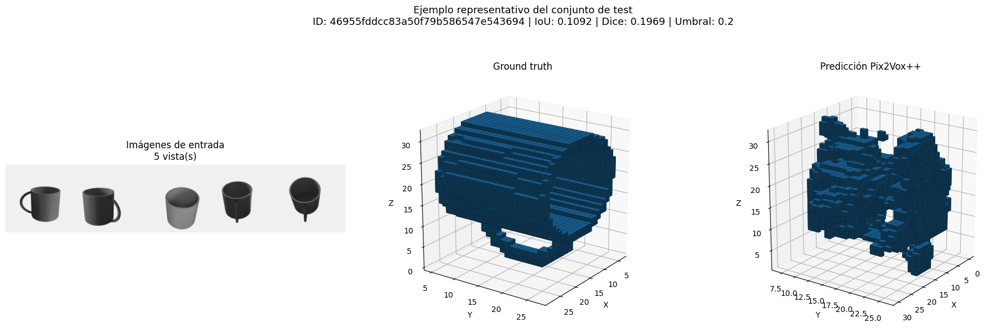


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/metricas/tazas_5_vistas_sin_finetuning/ejemplo_representativo.png

RESUMEN GUARDADO DEL EXPERIMENTO 2


,conjunto,numero_objetos,umbral,bce_x10_media,iou_media,dice_media,precision_voxel_media,recall_voxel_media,chamfer_superficie_media,f_score_superficie_media
0,validacion,26.0,0.2,8.0619,0.2137,0.3296,0.4106,0.3157,2.3238,0.3600
1,test,26.0,0.2,7.5100,0.1592,0.2606,0.3422,0.2367,2.6474,0.3097



[OK] EXPERIMENTO 2 FINALIZADO
Los resultados definitivos y el ejemplo representativo se han guardado en:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/metricas/tazas_5_vistas_sin_finetuning

La memoria de la GPU ha sido liberada.


In [ ]:
# ============================================================
# 16. EXPERIMENTO 2
# CINCO VISTAS SIN FINE-TUNING
# ============================================================


# ------------------------------------------------------------
# Visualización reutilizable de un ejemplo representativo
# ------------------------------------------------------------

@torch.inference_mode()
def visualizar_ejemplo_representativo_pix2vox(
    modelo,
    dataloader_test,
    tabla_test_por_objeto,
    umbral,
    ruta_experimento,
    numero_vistas,
):
    """
    Visualiza el objeto cuya IoU está más cerca de la mediana
    del conjunto de test.

    Se muestran:

    - Las imágenes de entrada.
    - El ground truth voxelizado.
    - La reconstrucción predicha.

    La figura y sus metadatos se guardan en la carpeta del
    experimento.
    """

    if tabla_test_por_objeto.empty:
        raise ValueError(
            "La tabla de test está vacía."
        )

    ruta_experimento = Path(
        ruta_experimento
    )

    ruta_experimento.mkdir(
        parents=True,
        exist_ok=True,
    )

    # --------------------------------------------------------
    # Seleccionar el objeto más cercano a la IoU mediana
    # --------------------------------------------------------

    tabla_test = (
        tabla_test_por_objeto
        .copy()
        .reset_index(drop=True)
    )

    iou_mediana = float(
        tabla_test["iou"].median()
    )

    indice_representativo = (
        tabla_test["iou"]
        .sub(iou_mediana)
        .abs()
        .idxmin()
    )

    fila_representativa = (
        tabla_test.loc[
            indice_representativo
        ]
    )

    identificador_representativo = str(
        fila_representativa[
            "identificador"
        ]
    )

    iou_representativa = float(
        fila_representativa["iou"]
    )

    dice_representativo = float(
        fila_representativa["dice"]
    )

    # --------------------------------------------------------
    # Localizar el objeto dentro del Dataset
    # --------------------------------------------------------

    dataset_test = dataloader_test.dataset

    muestra_representativa = None

    for indice_dataset in range(
        len(dataset_test)
    ):

        muestra_candidata = (
            dataset_test[
                indice_dataset
            ]
        )

        if (
            str(
                muestra_candidata[
                    "identificador"
                ]
            )
            == identificador_representativo
        ):

            muestra_representativa = (
                muestra_candidata
            )

            break

    if muestra_representativa is None:
        raise RuntimeError(
            "No se ha encontrado el objeto representativo "
            "dentro del Dataset de test."
        )

    # --------------------------------------------------------
    # Ejecutar la inferencia del objeto seleccionado
    # --------------------------------------------------------

    modelo.eval()

    imagenes = (
        muestra_representativa[
            "imagenes"
        ]
        .unsqueeze(0)
        .to(DEVICE)
    )

    salida = modelo(
        imagenes
    )

    prediccion = normalizar_forma_voxel(
        salida["volumen_final"]
    )[0]

    ground_truth = normalizar_forma_voxel(
        muestra_representativa[
            "voxel"
        ].unsqueeze(0)
    )[0]

    volumen_predicho = (
        prediccion
        .detach()
        .cpu()
        .numpy()
        >= float(umbral)
    )

    volumen_real = (
        ground_truth
        .detach()
        .cpu()
        .numpy()
        >= 0.5
    )

    # --------------------------------------------------------
    # Preparar una selección de imágenes de entrada
    # --------------------------------------------------------

    imagenes_tensor = (
        muestra_representativa[
            "imagenes"
        ]
        .detach()
        .cpu()
    )

    cantidad_imagenes_mostradas = min(
        5,
        int(imagenes_tensor.shape[0])
    )

    indices_mostrados = np.linspace(
        0,
        imagenes_tensor.shape[0] - 1,
        cantidad_imagenes_mostradas,
        dtype=int,
    )

    imagenes_rgb = []

    for indice_vista in indices_mostrados:

        imagen = (
            imagenes_tensor[
                indice_vista
            ]
            .permute(1, 2, 0)
            .numpy()
        )

        # Desnormalización:
        # (x - 0.5) / 0.5  ->  x = x_norm * 0.5 + 0.5
        imagen = (
            imagen * 0.5
            + 0.5
        )

        imagen = np.clip(
            imagen,
            0.0,
            1.0,
        )

        # El Dataset utiliza BGR para mantener compatibilidad
        # con la implementación oficial.
        imagen = imagen[
            ...,
            ::-1
        ].copy()

        imagenes_rgb.append(
            imagen
        )

    mosaico_imagenes = np.concatenate(
        imagenes_rgb,
        axis=1,
    )

    # --------------------------------------------------------
    # Crear la figura
    # --------------------------------------------------------

    figura = plt.figure(
        figsize=(19, 6)
    )

    eje_imagenes = figura.add_subplot(
        1,
        3,
        1,
    )

    eje_real = figura.add_subplot(
        1,
        3,
        2,
        projection="3d",
    )

    eje_predicho = figura.add_subplot(
        1,
        3,
        3,
        projection="3d",
    )

    eje_imagenes.imshow(
        mosaico_imagenes
    )

    eje_imagenes.set_title(
        f"Imágenes de entrada\n"
        f"{numero_vistas} vista(s)"
    )

    eje_imagenes.axis(
        "off"
    )

    eje_real.voxels(
        volumen_real,
        edgecolor="black",
        linewidth=0.08,
    )

    eje_real.set_title(
        "Ground truth"
    )

    eje_predicho.voxels(
        volumen_predicho,
        edgecolor="black",
        linewidth=0.08,
    )

    eje_predicho.set_title(
        "Predicción Pix2Vox++"
    )

    for eje_3d in [
        eje_real,
        eje_predicho,
    ]:

        eje_3d.set_box_aspect(
            (1, 1, 1)
        )

        eje_3d.view_init(
            elev=20,
            azim=35,
        )

        eje_3d.set_xlabel(
            "X"
        )

        eje_3d.set_ylabel(
            "Y"
        )

        eje_3d.set_zlabel(
            "Z"
        )

    figura.suptitle(
        "Ejemplo representativo del conjunto de test\n"
        f"ID: {identificador_representativo} | "
        f"IoU: {iou_representativa:.4f} | "
        f"Dice: {dice_representativo:.4f} | "
        f"Umbral: {float(umbral):.1f}",
        fontsize=13,
    )

    figura.tight_layout(
        rect=[0, 0, 1, 0.90]
    )

    ruta_figura = (
        ruta_experimento
        / "ejemplo_representativo.png"
    )

    figura.savefig(
        ruta_figura,
        dpi=200,
        bbox_inches="tight",
    )

    plt.show()

    plt.close(
        figura
    )

    metadata_ejemplo = {
        "identificador": (
            identificador_representativo
        ),
        "criterio_seleccion": (
            "IoU más cercana a la mediana de test"
        ),
        "iou_mediana_test": float(
            iou_mediana
        ),
        "iou_ejemplo": float(
            iou_representativa
        ),
        "dice_ejemplo": float(
            dice_representativo
        ),
        "umbral": float(
            umbral
        ),
        "numero_vistas": int(
            numero_vistas
        ),
        "indices_mostrados_en_el_mosaico": (
            indices_mostrados.tolist()
        ),
        "ruta_figura": str(
            ruta_figura
        ),
    }

    guardar_json_atomico(
        contenido=metadata_ejemplo,
        ruta_destino=(
            ruta_experimento
            / "ejemplo_representativo.json"
        ),
    )

    print(
        "\nEjemplo representativo guardado en:"
    )

    print(
        ruta_figura
    )

    del imagenes
    del salida
    del prediccion
    del ground_truth

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return metadata_ejemplo


# ------------------------------------------------------------
# Configuración del experimento
# ------------------------------------------------------------

NOMBRE_EXPERIMENTO_5_VISTAS_SIN_FT = (
    "tazas_5_vistas_sin_finetuning"
)

SOBRESCRIBIR_EXPERIMENTO_5_VISTAS_SIN_FT = False


print("=" * 75)
print("EXPERIMENTO 2: CINCO VISTAS SIN FINE-TUNING")
print("=" * 75)

print(f"Dispositivo:       {DEVICE}")
print("Categoría:         tazas")
print("Número de vistas:  5")
print("Fine-tuning:       No")
print(
    "Vistas utilizadas: "
    f"{INDICES_VISTAS_EVALUACION[5]}"
)


# ------------------------------------------------------------
# 1. Crear los DataLoader
# ------------------------------------------------------------

print("\nCreando los DataLoader...")

_cargadores_experimento_5_vistas = (
    crear_dataloaders_pix2vox(
        numero_vistas=5,
        conjunto_categorias="tazas",
        tamano_lote_fisico=TAMANO_LOTE_FISICO,
    )
)

_loader_validacion_5_vistas = (
    _cargadores_experimento_5_vistas[
        "loader_validacion"
    ]
)

_loader_test_5_vistas = (
    _cargadores_experimento_5_vistas[
        "loader_test"
    ]
)

print(
    f"Objetos de validación: "
    f"{len(_loader_validacion_5_vistas.dataset)}"
)

print(
    f"Objetos de test:       "
    f"{len(_loader_test_5_vistas.dataset)}"
)


# ------------------------------------------------------------
# 2. Crear el modelo preentrenado
# ------------------------------------------------------------

print("\nCreando Pix2Vox++/A...")

_modelo_experimento_5_vistas = (
    Pix2VoxPlusPlusA(
        usar_refiner=True,
        usar_merger=True,
        usar_pesos_imagenet=False,
    )
)

print(
    "Cargando el checkpoint oficial..."
)

_metadata_checkpoint_5_vistas = (
    cargar_pesos_preentrenados_pix2vox(
        modelo=_modelo_experimento_5_vistas,
        ruta_checkpoint=RUTA_CHECKPOINT_OFICIAL,
        dispositivo_carga="cpu",
        estricto=True,
    )
)

_modelo_experimento_5_vistas = (
    _modelo_experimento_5_vistas
    .to(DEVICE)
)

_modelo_experimento_5_vistas.eval()


# ------------------------------------------------------------
# 3. Evaluación definitiva
# ------------------------------------------------------------

_resultado_experimento_5_vistas = (
    evaluar_y_guardar_experimento_pix2vox(
        modelo=_modelo_experimento_5_vistas,
        loader_validacion=(
            _loader_validacion_5_vistas
        ),
        loader_test=(
            _loader_test_5_vistas
        ),
        nombre_experimento=(
            NOMBRE_EXPERIMENTO_5_VISTAS_SIN_FT
        ),
        numero_vistas=5,
        tipo_experimento="sin_finetuning",
        configuracion_extra={
            "categoria": CATEGORIA_TAZAS,
            "nombre_grupo_categorias": "tazas",
            "checkpoint_inicial": str(
                RUTA_CHECKPOINT_OFICIAL
            ),
            "checkpoint_oficial_epoch": (
                _metadata_checkpoint_5_vistas.get(
                    "epoch"
                )
            ),
            "checkpoint_oficial_best_iou": (
                _metadata_checkpoint_5_vistas.get(
                    "best_iou"
                )
            ),
            "fine_tuning": False,
            "vistas_fijas": (
                INDICES_VISTAS_EVALUACION[5]
            ),
            "tamano_lote_fisico": int(
                TAMANO_LOTE_FISICO
            ),
            "resolucion_voxel": int(
                RESOLUCION_VOXEL
            ),
            "tamano_imagen": int(
                TAMANO_IMAGEN
            ),
        },
        sobrescribir=(
            SOBRESCRIBIR_EXPERIMENTO_5_VISTAS_SIN_FT
        ),
    )
)


# ------------------------------------------------------------
# 4. Visualización del ejemplo representativo
# ------------------------------------------------------------

_metadata_ejemplo_5_vistas = (
    visualizar_ejemplo_representativo_pix2vox(
        modelo=_modelo_experimento_5_vistas,
        dataloader_test=_loader_test_5_vistas,
        tabla_test_por_objeto=(
            _resultado_experimento_5_vistas[
                "resultado_test_completo"
            ][
                "tabla_por_objeto"
            ]
        ),
        umbral=(
            _resultado_experimento_5_vistas[
                "umbral_seleccionado"
            ]
        ),
        ruta_experimento=(
            _resultado_experimento_5_vistas[
                "ruta_experimento"
            ]
        ),
        numero_vistas=5,
    )
)


# ------------------------------------------------------------
# 5. Conservar el resumen compacto
# ------------------------------------------------------------

resumen_experimento_5_vistas_sin_ft = (
    _resultado_experimento_5_vistas[
        "resumen_json"
    ]
)

ruta_experimento_5_vistas_sin_ft = Path(
    _resultado_experimento_5_vistas[
        "ruta_experimento"
    ]
)


# ------------------------------------------------------------
# 6. Mostrar validación y test
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("RESUMEN GUARDADO DEL EXPERIMENTO 2")
print("=" * 75)

display(
    _resultado_experimento_5_vistas[
        "tabla_resumen"
    ][
        [
            "conjunto",
            "numero_objetos",
            "umbral",
            "bce_x10_media",
            "iou_media",
            "dice_media",
            "precision_voxel_media",
            "recall_voxel_media",
            "chamfer_superficie_media",
            "f_score_superficie_media",
        ]
    ].round(4)
)


# ------------------------------------------------------------
# 7. Liberar memoria
# ------------------------------------------------------------

_modelo_experimento_5_vistas.to(
    "cpu"
)

del _modelo_experimento_5_vistas
del _metadata_checkpoint_5_vistas
del _resultado_experimento_5_vistas
del _metadata_ejemplo_5_vistas
del _loader_validacion_5_vistas
del _loader_test_5_vistas
del _cargadores_experimento_5_vistas

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


print("\n" + "=" * 75)
print("[OK] EXPERIMENTO 2 FINALIZADO")
print("=" * 75)

print(
    "Los resultados definitivos y el ejemplo "
    "representativo se han guardado en:"
)

print(
    ruta_experimento_5_vistas_sin_ft
)

print(
    "\nLa memoria de la GPU ha sido liberada."
)

## 17. Experimento 3: veinte vistas sin fine-tuning

Se evalúa el checkpoint oficial de Pix2Vox++/A utilizando las veinte imágenes disponibles de cada taza, sin realizar fine-tuning.

La configuración es:

- **Categoría:** tazas.
- **Número de vistas:** veinte.
- **Fine-tuning:** no.
- **Vistas utilizadas:** desde `00.png` hasta `19.png`.
- **Conjunto de validación:** 26 objetos.
- **Conjunto de test:** 26 objetos.
- **Resolución de salida:** 32 × 32 × 32 vóxeles.

El procedimiento será:

1. Seleccionar el mejor umbral con validación.
2. Calcular las métricas completas de validación.
3. Evaluar test manteniendo fijo el umbral seleccionado.
4. Guardar las tablas por objeto y los resúmenes agregados.
5. Mostrar una reconstrucción representativa de test.

Aunque cada objeto utiliza veinte imágenes, la figura mostrará solamente cinco vistas distribuidas uniformemente. Las veinte vistas sí se utilizan durante la inferencia.

Para reducir el consumo de memoria de la GPU se utilizará un tamaño de lote de evaluación igual a uno. Esto no afecta a los resultados, ya que durante esta fase no se actualizan los parámetros del modelo.

Los resultados se almacenarán en:

```text
Pix2Vox++/metricas/tazas_20_vistas_sin_finetuning/
```

EXPERIMENTO 3: VEINTE VISTAS SIN FINE-TUNING
Dispositivo:          cuda
Categoría:            tazas
Número de vistas:     20
Fine-tuning:          No
Vistas utilizadas:    [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
Batch de evaluación:  1

Creando los DataLoader...
Se utilizarán las divisiones guardadas anteriormente.
Objetos de validación: 26
Objetos de test:       26
Lotes de validación:   26
Lotes de test:         26

Creando Pix2Vox++/A...
Cargando el checkpoint oficial...
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       tazas_20_vistas_sin_finetuning
Tipo:              sin_finetuning
Número de vistas:  20
Dispositivo:       cuda
Carpeta:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/metricas/tazas_20_vistas_sin_finetuning

1. Seleccionando el umbral con validación...


Validación 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]

Umbral seleccionado: 0.2
IoU de selección:    0.2157

2. Calculando las métricas completas de validación...


Validación completa 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.2
IoU validación:           0.2157
IoU test:                 0.1576
Dice test:                0.2608
Chamfer test:             2.7197
F-score superficie test:  0.3016
Tiempo total:             6.91 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/metricas/tazas_20_vistas_sin_finetuning


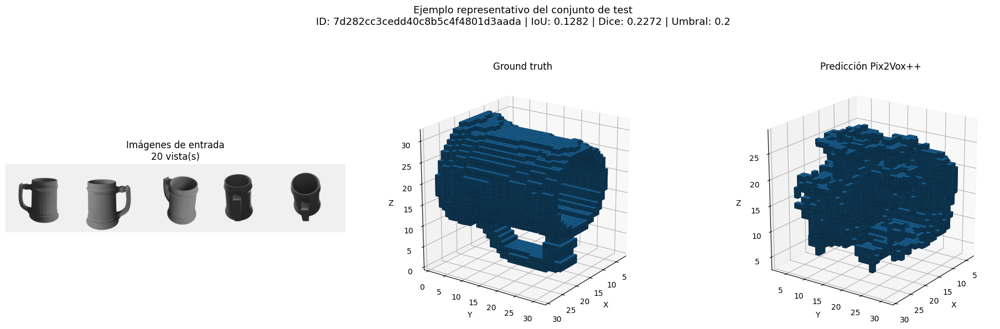


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/metricas/tazas_20_vistas_sin_finetuning/ejemplo_representativo.png

RESUMEN GUARDADO DEL EXPERIMENTO 3


,conjunto,numero_objetos,umbral,bce_x10_media,iou_media,dice_media,precision_voxel_media,recall_voxel_media,chamfer_superficie_media,f_score_superficie_media
0,validacion,26.0,0.2,7.4956,0.2157,0.3350,0.4150,0.3227,2.3838,0.3480
1,test,26.0,0.2,6.9542,0.1576,0.2608,0.3337,0.2434,2.7197,0.3016



[OK] EXPERIMENTO 3 FINALIZADO
Los resultados definitivos y el ejemplo representativo se han guardado en:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/metricas/tazas_20_vistas_sin_finetuning

La memoria de la GPU ha sido liberada.


In [ ]:
# ============================================================
# 17. EXPERIMENTO 3
# VEINTE VISTAS SIN FINE-TUNING
# ============================================================

NOMBRE_EXPERIMENTO_20_VISTAS_SIN_FT = (
    "tazas_20_vistas_sin_finetuning"
)

SOBRESCRIBIR_EXPERIMENTO_20_VISTAS_SIN_FT = False

# Durante la evaluación, el tamaño del lote no modifica las
# predicciones. Se utiliza uno para reducir el consumo de VRAM.
TAMANO_LOTE_EVALUACION_20_VISTAS = 1


print("=" * 75)
print("EXPERIMENTO 3: VEINTE VISTAS SIN FINE-TUNING")
print("=" * 75)

print(f"Dispositivo:          {DEVICE}")
print("Categoría:            tazas")
print("Número de vistas:     20")
print("Fine-tuning:          No")

print(
    "Vistas utilizadas:    "
    f"{INDICES_VISTAS_EVALUACION[20]}"
)

print(
    "Batch de evaluación:  "
    f"{TAMANO_LOTE_EVALUACION_20_VISTAS}"
)


# ------------------------------------------------------------
# 1. Crear los DataLoader
# ------------------------------------------------------------

print("\nCreando los DataLoader...")

_cargadores_experimento_20_vistas = (
    crear_dataloaders_pix2vox(
        numero_vistas=20,
        conjunto_categorias="tazas",
        tamano_lote_fisico=(
            TAMANO_LOTE_EVALUACION_20_VISTAS
        ),
    )
)

_loader_validacion_20_vistas = (
    _cargadores_experimento_20_vistas[
        "loader_validacion"
    ]
)

_loader_test_20_vistas = (
    _cargadores_experimento_20_vistas[
        "loader_test"
    ]
)


print(
    f"Objetos de validación: "
    f"{len(_loader_validacion_20_vistas.dataset)}"
)

print(
    f"Objetos de test:       "
    f"{len(_loader_test_20_vistas.dataset)}"
)

print(
    f"Lotes de validación:   "
    f"{len(_loader_validacion_20_vistas)}"
)

print(
    f"Lotes de test:         "
    f"{len(_loader_test_20_vistas)}"
)


# ------------------------------------------------------------
# 2. Crear el modelo preentrenado
# ------------------------------------------------------------

print("\nCreando Pix2Vox++/A...")

_modelo_experimento_20_vistas = (
    Pix2VoxPlusPlusA(
        usar_refiner=True,
        usar_merger=True,
        usar_pesos_imagenet=False,
    )
)

print(
    "Cargando el checkpoint oficial..."
)

_metadata_checkpoint_20_vistas = (
    cargar_pesos_preentrenados_pix2vox(
        modelo=_modelo_experimento_20_vistas,
        ruta_checkpoint=RUTA_CHECKPOINT_OFICIAL,
        dispositivo_carga="cpu",
        estricto=True,
    )
)

_modelo_experimento_20_vistas = (
    _modelo_experimento_20_vistas
    .to(DEVICE)
)

_modelo_experimento_20_vistas.eval()


# ------------------------------------------------------------
# 3. Evaluación definitiva
# ------------------------------------------------------------

_resultado_experimento_20_vistas = (
    evaluar_y_guardar_experimento_pix2vox(
        modelo=_modelo_experimento_20_vistas,
        loader_validacion=(
            _loader_validacion_20_vistas
        ),
        loader_test=(
            _loader_test_20_vistas
        ),
        nombre_experimento=(
            NOMBRE_EXPERIMENTO_20_VISTAS_SIN_FT
        ),
        numero_vistas=20,
        tipo_experimento="sin_finetuning",
        configuracion_extra={
            "categoria": CATEGORIA_TAZAS,
            "nombre_grupo_categorias": "tazas",
            "checkpoint_inicial": str(
                RUTA_CHECKPOINT_OFICIAL
            ),
            "checkpoint_oficial_epoch": (
                _metadata_checkpoint_20_vistas.get(
                    "epoch"
                )
            ),
            "checkpoint_oficial_best_iou": (
                _metadata_checkpoint_20_vistas.get(
                    "best_iou"
                )
            ),
            "fine_tuning": False,
            "vistas_fijas": (
                INDICES_VISTAS_EVALUACION[20]
            ),
            "tamano_lote_evaluacion": int(
                TAMANO_LOTE_EVALUACION_20_VISTAS
            ),
            "resolucion_voxel": int(
                RESOLUCION_VOXEL
            ),
            "tamano_imagen": int(
                TAMANO_IMAGEN
            ),
        },
        sobrescribir=(
            SOBRESCRIBIR_EXPERIMENTO_20_VISTAS_SIN_FT
        ),
    )
)


# ------------------------------------------------------------
# 4. Visualización del ejemplo representativo
# ------------------------------------------------------------

_metadata_ejemplo_20_vistas = (
    visualizar_ejemplo_representativo_pix2vox(
        modelo=_modelo_experimento_20_vistas,
        dataloader_test=_loader_test_20_vistas,
        tabla_test_por_objeto=(
            _resultado_experimento_20_vistas[
                "resultado_test_completo"
            ][
                "tabla_por_objeto"
            ]
        ),
        umbral=(
            _resultado_experimento_20_vistas[
                "umbral_seleccionado"
            ]
        ),
        ruta_experimento=(
            _resultado_experimento_20_vistas[
                "ruta_experimento"
            ]
        ),
        numero_vistas=20,
    )
)


# ------------------------------------------------------------
# 5. Conservar un resumen compacto
# ------------------------------------------------------------

resumen_experimento_20_vistas_sin_ft = (
    _resultado_experimento_20_vistas[
        "resumen_json"
    ]
)

ruta_experimento_20_vistas_sin_ft = Path(
    _resultado_experimento_20_vistas[
        "ruta_experimento"
    ]
)


# ------------------------------------------------------------
# 6. Mostrar validación y test
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("RESUMEN GUARDADO DEL EXPERIMENTO 3")
print("=" * 75)

display(
    _resultado_experimento_20_vistas[
        "tabla_resumen"
    ][
        [
            "conjunto",
            "numero_objetos",
            "umbral",
            "bce_x10_media",
            "iou_media",
            "dice_media",
            "precision_voxel_media",
            "recall_voxel_media",
            "chamfer_superficie_media",
            "f_score_superficie_media",
        ]
    ].round(4)
)


# ------------------------------------------------------------
# 7. Liberar memoria
# ------------------------------------------------------------

_modelo_experimento_20_vistas.to(
    "cpu"
)

del _modelo_experimento_20_vistas
del _metadata_checkpoint_20_vistas
del _resultado_experimento_20_vistas
del _metadata_ejemplo_20_vistas
del _loader_validacion_20_vistas
del _loader_test_20_vistas
del _cargadores_experimento_20_vistas

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


print("\n" + "=" * 75)
print("[OK] EXPERIMENTO 3 FINALIZADO")
print("=" * 75)

print(
    "Los resultados definitivos y el ejemplo "
    "representativo se han guardado en:"
)

print(
    ruta_experimento_20_vistas_sin_ft
)

print(
    "\nLa memoria de la GPU ha sido liberada."
)

## 18. Experimento 4: una vista con fine-tuning

Se realiza el primer experimento de adaptación de Pix2Vox++ al conjunto de tazas.

El modelo se inicializa con el checkpoint oficial preentrenado y posteriormente se ajusta utilizando las 120 tazas del conjunto de entrenamiento.

La configuración es:

- **Categoría:** tazas.
- **Número de vistas de entrada:** una.
- **Fine-tuning:** sí.
- **Objetos de entrenamiento:** 120.
- **Objetos de validación:** 26.
- **Objetos de test:** 26.
- **Batch físico:** cinco objetos.
- **Precisión:** `float32` en GPU.
- **Épocas máximas:** 30.
- **Early stopping:** siete épocas sin mejora.
- **Resolución de salida:** 32 × 32 × 32 vóxeles.

### Selección de las imágenes

Durante el entrenamiento se selecciona aleatoriamente una de las veinte imágenes disponibles para cada taza. Esto permite que el modelo observe diferentes perspectivas a lo largo de las épocas.

Durante validación y test se utiliza siempre la vista fija:

```text
00.png
```

### Selección del modelo

Después de cada época:

1. Se evalúan los umbrales `0.2`, `0.3`, `0.4` y `0.5` sobre validación.
2. Se selecciona el umbral con mayor IoU media.
3. Se guarda el modelo cuando mejora la IoU de validación.
4. Se activa el early stopping si no hay mejora durante siete épocas.

Al terminar, se recuperan automáticamente los pesos correspondientes a la mejor época.

### Evaluación final

El mejor modelo se evalúa nuevamente mediante:

- IoU.
- Dice.
- Precisión voxel.
- Recall voxel.
- Chamfer Distance de superficie.
- F-score de superficie.

También se muestra una reconstrucción representativa del conjunto de test, seleccionada por proximidad a la IoU mediana.

Los resultados se almacenarán en:

```text
Pix2Vox++/checkpoints/tazas_1_vista_con_finetuning_mejor.pth
Pix2Vox++/historiales/tazas_1_vista_con_finetuning_historial.csv
Pix2Vox++/metricas/tazas_1_vista_con_finetuning/
```

Este experimento puede tardar considerablemente más que los anteriores porque incluye entrenamiento y validación después de cada época.

In [ ]:
# ============================================================
# 18. EXPERIMENTO 4
# UNA VISTA CON FINE-TUNING
# ============================================================

NOMBRE_EXPERIMENTO_1_VISTA_CON_FT = (
    "tazas_1_vista_con_finetuning"
)

SOBRESCRIBIR_EVALUACION_1_VISTA_CON_FT = False


print("=" * 75)
print("EXPERIMENTO 4: UNA VISTA CON FINE-TUNING")
print("=" * 75)

print(f"Dispositivo:        {DEVICE}")
print("Categoría:          tazas")
print("Número de vistas:   1")
print("Fine-tuning:        Sí")
print(f"Precisión mixta:    {USAR_PRECISION_MIXTA}")
print("Precisión numérica: float32")
print(f"Épocas máximas:     {NUMERO_EPOCAS_MAXIMO}")
print(f"Early stopping:     {PACIENCIA_EARLY_STOPPING}")


if DEVICE.type != "cuda":
    raise RuntimeError(
        "Este experimento definitivo debe ejecutarse con GPU."
    )

if USAR_PRECISION_MIXTA:
    raise RuntimeError(
        "La precisión mixta debe permanecer desactivada "
        "para evitar gradientes no finitos."
    )


# ------------------------------------------------------------
# 1. Crear los DataLoader
# ------------------------------------------------------------

print("\nCreando los DataLoader...")

_cargadores_experimento_1_vista_ft = (
    crear_dataloaders_pix2vox(
        numero_vistas=1,
        conjunto_categorias="tazas",
        tamano_lote_fisico=TAMANO_LOTE_FISICO,
    )
)

_loader_train_1_vista_ft = (
    _cargadores_experimento_1_vista_ft[
        "loader_train"
    ]
)

_loader_validacion_1_vista_ft = (
    _cargadores_experimento_1_vista_ft[
        "loader_validacion"
    ]
)

_loader_test_1_vista_ft = (
    _cargadores_experimento_1_vista_ft[
        "loader_test"
    ]
)


print(
    f"Objetos de entrenamiento: "
    f"{len(_loader_train_1_vista_ft.dataset)}"
)

print(
    f"Objetos de validación:    "
    f"{len(_loader_validacion_1_vista_ft.dataset)}"
)

print(
    f"Objetos de test:          "
    f"{len(_loader_test_1_vista_ft.dataset)}"
)

print(
    f"Lotes train por época:    "
    f"{len(_loader_train_1_vista_ft)}"
)

print(
    f"Lotes de validación:      "
    f"{len(_loader_validacion_1_vista_ft)}"
)


# ------------------------------------------------------------
# 2. Inicializar el modelo con el checkpoint oficial
# ------------------------------------------------------------

print("\nCreando Pix2Vox++/A...")

_modelo_experimento_1_vista_ft = (
    Pix2VoxPlusPlusA(
        usar_refiner=True,
        usar_merger=True,
        usar_pesos_imagenet=False,
    )
)

print(
    "Cargando el checkpoint oficial..."
)

_metadata_inicial_1_vista_ft = (
    cargar_pesos_preentrenados_pix2vox(
        modelo=_modelo_experimento_1_vista_ft,
        ruta_checkpoint=RUTA_CHECKPOINT_OFICIAL,
        dispositivo_carga="cpu",
        estricto=True,
    )
)

_modelo_experimento_1_vista_ft = (
    _modelo_experimento_1_vista_ft
    .to(DEVICE)
)


# ------------------------------------------------------------
# 3. Ejecutar el fine-tuning
# ------------------------------------------------------------

_resultado_finetuning_1_vista = (
    entrenar_modelo_finetuning_pix2vox(
        modelo=_modelo_experimento_1_vista_ft,
        loader_train=_loader_train_1_vista_ft,
        loader_validacion=(
            _loader_validacion_1_vista_ft
        ),
        nombre_experimento=(
            NOMBRE_EXPERIMENTO_1_VISTA_CON_FT
        ),
        configuracion_experimento={
            "categoria": CATEGORIA_TAZAS,
            "grupo_categorias": "tazas",
            "numero_vistas": 1,
            "fine_tuning": True,
            "checkpoint_inicial": str(
                RUTA_CHECKPOINT_OFICIAL
            ),
            "checkpoint_inicial_epoch": (
                _metadata_inicial_1_vista_ft.get(
                    "epoch"
                )
            ),
            "checkpoint_inicial_best_iou": (
                _metadata_inicial_1_vista_ft.get(
                    "best_iou"
                )
            ),
            "vistas_train": "aleatorias",
            "vista_validacion_test": (
                INDICES_VISTAS_EVALUACION[1]
            ),
            "tamano_lote_fisico": int(
                TAMANO_LOTE_FISICO
            ),
            "tamano_lote_efectivo": int(
                TAMANO_LOTE_EFECTIVO
            ),
            "precision": "float32",
            "resolucion_voxel": int(
                RESOLUCION_VOXEL
            ),
            "tamano_imagen": int(
                TAMANO_IMAGEN
            ),
        },
        numero_epocas=NUMERO_EPOCAS_MAXIMO,
        paciencia_early_stopping=(
            PACIENCIA_EARLY_STOPPING
        ),
        pasos_acumulacion=(
            PASOS_ACUMULACION_GRADIENTE
        ),
        max_lotes_train=None,
        max_lotes_validacion=None,
    )
)


# El resultado contiene el modelo con los pesos de la mejor
# época, no los de la última época ejecutada.
_modelo_mejor_1_vista_ft = (
    _resultado_finetuning_1_vista[
        "modelo"
    ]
)

_historial_1_vista_ft = (
    _resultado_finetuning_1_vista[
        "historial"
    ]
)

_resumen_finetuning_1_vista_ft = (
    _resultado_finetuning_1_vista[
        "resumen"
    ]
)


# ------------------------------------------------------------
# 4. Evaluación final del mejor modelo
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("EVALUACIÓN FINAL DEL MEJOR MODELO")
print("=" * 75)

_resultado_evaluacion_1_vista_ft = (
    evaluar_y_guardar_experimento_pix2vox(
        modelo=_modelo_mejor_1_vista_ft,
        loader_validacion=(
            _loader_validacion_1_vista_ft
        ),
        loader_test=(
            _loader_test_1_vista_ft
        ),
        nombre_experimento=(
            NOMBRE_EXPERIMENTO_1_VISTA_CON_FT
        ),
        numero_vistas=1,
        tipo_experimento="con_finetuning",
        configuracion_extra={
            "categoria": CATEGORIA_TAZAS,
            "fine_tuning": True,
            "mejor_epoca": (
                _resumen_finetuning_1_vista_ft[
                    "mejor_epoca"
                ]
            ),
            "mejor_iou_validacion_entrenamiento": (
                _resumen_finetuning_1_vista_ft[
                    "mejor_iou_validacion"
                ]
            ),
            "mejor_umbral_entrenamiento": (
                _resumen_finetuning_1_vista_ft[
                    "mejor_umbral"
                ]
            ),
            "ruta_checkpoint_finetuned": (
                _resumen_finetuning_1_vista_ft[
                    "ruta_checkpoint"
                ]
            ),
            "ruta_historial": (
                _resumen_finetuning_1_vista_ft[
                    "ruta_historial"
                ]
            ),
            "vista_fija_evaluacion": (
                INDICES_VISTAS_EVALUACION[1]
            ),
            "precision": "float32",
            "resolucion_voxel": int(
                RESOLUCION_VOXEL
            ),
        },
        sobrescribir=(
            SOBRESCRIBIR_EVALUACION_1_VISTA_CON_FT
        ),
    )
)


# ------------------------------------------------------------
# 5. Ejemplo representativo
# ------------------------------------------------------------

_metadata_ejemplo_1_vista_ft = (
    visualizar_ejemplo_representativo_pix2vox(
        modelo=_modelo_mejor_1_vista_ft,
        dataloader_test=(
            _loader_test_1_vista_ft
        ),
        tabla_test_por_objeto=(
            _resultado_evaluacion_1_vista_ft[
                "resultado_test_completo"
            ][
                "tabla_por_objeto"
            ]
        ),
        umbral=(
            _resultado_evaluacion_1_vista_ft[
                "umbral_seleccionado"
            ]
        ),
        ruta_experimento=(
            _resultado_evaluacion_1_vista_ft[
                "ruta_experimento"
            ]
        ),
        numero_vistas=1,
    )
)


# ------------------------------------------------------------
# 6. Conservar resultados compactos
# ------------------------------------------------------------

resumen_finetuning_1_vista_con_ft = dict(
    _resumen_finetuning_1_vista_ft
)

resumen_experimento_1_vista_con_ft = (
    _resultado_evaluacion_1_vista_ft[
        "resumen_json"
    ]
)

ruta_checkpoint_1_vista_con_ft = Path(
    _resumen_finetuning_1_vista_ft[
        "ruta_checkpoint"
    ]
)

ruta_experimento_1_vista_con_ft = Path(
    _resultado_evaluacion_1_vista_ft[
        "ruta_experimento"
    ]
)


# ------------------------------------------------------------
# 7. Mostrar el historial de entrenamiento
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("HISTORIAL DEL FINE-TUNING")
print("=" * 75)

_columnas_historial_1_vista = [
    "epoca",
    "train_perdida_total",
    "train_iou_0_3",
    "validacion_bce_x10",
    "validacion_umbral",
    "validacion_iou",
    "validacion_dice",
    "lr_encoder",
    "lr_decoder",
    "es_mejor_checkpoint",
    "epocas_sin_mejora",
]

display(
    _historial_1_vista_ft[
        _columnas_historial_1_vista
    ].round(5)
)


# ------------------------------------------------------------
# 8. Mostrar validación y test
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("RESULTADOS FINALES DEL EXPERIMENTO 4")
print("=" * 75)

display(
    _resultado_evaluacion_1_vista_ft[
        "tabla_resumen"
    ][
        [
            "conjunto",
            "numero_objetos",
            "umbral",
            "bce_x10_media",
            "iou_media",
            "dice_media",
            "precision_voxel_media",
            "recall_voxel_media",
            "chamfer_superficie_media",
            "f_score_superficie_media",
        ]
    ].round(4)
)


# ------------------------------------------------------------
# 9. Liberar memoria
# ------------------------------------------------------------

_modelo_mejor_1_vista_ft.to(
    "cpu"
)

del _modelo_mejor_1_vista_ft
del _modelo_experimento_1_vista_ft
del _metadata_inicial_1_vista_ft
del _resultado_finetuning_1_vista
del _resultado_evaluacion_1_vista_ft
del _metadata_ejemplo_1_vista_ft
del _historial_1_vista_ft
del _resumen_finetuning_1_vista_ft
del _columnas_historial_1_vista
del _loader_train_1_vista_ft
del _loader_validacion_1_vista_ft
del _loader_test_1_vista_ft
del _cargadores_experimento_1_vista_ft

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


print("\n" + "=" * 75)
print("[OK] EXPERIMENTO 4 FINALIZADO")
print("=" * 75)

print(
    "Mejor checkpoint guardado en:"
)

print(
    ruta_checkpoint_1_vista_con_ft
)

print(
    "\nMétricas y figura guardadas en:"
)

print(
    ruta_experimento_1_vista_con_ft
)

print(
    "\nLa memoria de la GPU ha sido liberada."
)

EXPERIMENTO 4: UNA VISTA CON FINE-TUNING
Dispositivo:        cuda
Categoría:          tazas
Número de vistas:   1
Fine-tuning:        Sí
Precisión mixta:    False
Precisión numérica: float32
Épocas máximas:     30
Early stopping:     7

Creando los DataLoader...
Se utilizarán las divisiones guardadas anteriormente.
Objetos de entrenamiento: 120
Objetos de validación:    26
Objetos de test:          26
Lotes train por época:    24
Lotes de validación:      6

Creando Pix2Vox++/A...
Cargando el checkpoint oficial...
INICIO DEL FINE-TUNING
Experimento:       tazas_1_vista_con_finetuning
Dispositivo:       cuda
Épocas máximas:    30
Early stopping:    7
Checkpoint:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/checkpoints/tazas_1_vista_con_finetuning_mejor.pth

ÉPOCA 1/30


Train época 1:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 1:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       18.342026
IoU train @ 0.3:     0.1830
BCE validación:      7.497924
Umbral validación:   0.2
IoU validación:      0.2365
Dice validación:     0.3720
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 2/30


Train época 2:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 2:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       14.114838
IoU train @ 0.3:     0.1959
BCE validación:      5.862235
Umbral validación:   0.2
IoU validación:      0.2514
Dice validación:     0.3910
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 3/30


Train época 3:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 3:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       11.739710
IoU train @ 0.3:     0.2065
BCE validación:      5.098881
Umbral validación:   0.2
IoU validación:      0.2582
Dice validación:     0.4004
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 4/30


Train época 4:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 4:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       10.461131
IoU train @ 0.3:     0.1977
BCE validación:      4.709554
Umbral validación:   0.2
IoU validación:      0.2791
Dice validación:     0.4253
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 5/30


Train época 5:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 5:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       9.611122
IoU train @ 0.3:     0.2104
BCE validación:      4.517993
Umbral validación:   0.2
IoU validación:      0.2908
Dice validación:     0.4400
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 6/30


Train época 6:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 6:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       8.837908
IoU train @ 0.3:     0.2028
BCE validación:      4.420809
Umbral validación:   0.2
IoU validación:      0.3001
Dice validación:     0.4514
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 7/30


Train época 7:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 7:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       8.599663
IoU train @ 0.3:     0.2082
BCE validación:      4.316893
Umbral validación:   0.2
IoU validación:      0.3152
Dice validación:     0.4681
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 8/30


Train época 8:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 8:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       8.140866
IoU train @ 0.3:     0.2424
BCE validación:      4.170986
Umbral validación:   0.2
IoU validación:      0.3339
Dice validación:     0.4884
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 9/30


Train época 9:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 9:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       8.020038
IoU train @ 0.3:     0.2822
BCE validación:      4.076888
Umbral validación:   0.2
IoU validación:      0.3480
Dice validación:     0.5028
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 10/30


Train época 10:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 10:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       7.762879
IoU train @ 0.3:     0.3105
BCE validación:      4.034027
Umbral validación:   0.2
IoU validación:      0.3584
Dice validación:     0.5125
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 11/30


Train época 11:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 11:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       7.684387
IoU train @ 0.3:     0.3202
BCE validación:      3.964301
Umbral validación:   0.2
IoU validación:      0.3660
Dice validación:     0.5204
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 12/30


Train época 12:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 12:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       7.389124
IoU train @ 0.3:     0.3418
BCE validación:      3.908179
Umbral validación:   0.2
IoU validación:      0.3727
Dice validación:     0.5269
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 13/30


Train época 13:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 13:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       7.166945
IoU train @ 0.3:     0.3747
BCE validación:      3.872791
Umbral validación:   0.2
IoU validación:      0.3786
Dice validación:     0.5329
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 14/30


Train época 14:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 14:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       7.058781
IoU train @ 0.3:     0.3855
BCE validación:      3.810420
Umbral validación:   0.2
IoU validación:      0.3826
Dice validación:     0.5370
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 15/30


Train época 15:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 15:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       7.076555
IoU train @ 0.3:     0.3868
BCE validación:      3.731042
Umbral validación:   0.2
IoU validación:      0.3852
Dice validación:     0.5400
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 16/30


Train época 16:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 16:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.870715
IoU train @ 0.3:     0.4019
BCE validación:      3.704334
Umbral validación:   0.2
IoU validación:      0.3879
Dice validación:     0.5434
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 17/30


Train época 17:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 17:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.879066
IoU train @ 0.3:     0.4087
BCE validación:      3.676557
Umbral validación:   0.2
IoU validación:      0.3909
Dice validación:     0.5460
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 18/30


Train época 18:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 18:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.818793
IoU train @ 0.3:     0.4103
BCE validación:      3.614192
Umbral validación:   0.2
IoU validación:      0.3956
Dice validación:     0.5508
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 19/30


Train época 19:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 19:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.664724
IoU train @ 0.3:     0.4293
BCE validación:      3.622384
Umbral validación:   0.2
IoU validación:      0.3989
Dice validación:     0.5542
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 20/30


Train época 20:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 20:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.549149
IoU train @ 0.3:     0.4328
BCE validación:      3.610055
Umbral validación:   0.2
IoU validación:      0.4010
Dice validación:     0.5566
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 21/30


Train época 21:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 21:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.499566
IoU train @ 0.3:     0.4385
BCE validación:      3.614932
Umbral validación:   0.2
IoU validación:      0.4032
Dice validación:     0.5593
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 22/30


Train época 22:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 22:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.399337
IoU train @ 0.3:     0.4462
BCE validación:      3.568073
Umbral validación:   0.2
IoU validación:      0.4071
Dice validación:     0.5632
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 23/30


Train época 23:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 23:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.225846
IoU train @ 0.3:     0.4616
BCE validación:      3.537766
Umbral validación:   0.2
IoU validación:      0.4082
Dice validación:     0.5644
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 24/30


Train época 24:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 24:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.297904
IoU train @ 0.3:     0.4522
BCE validación:      3.553904
Umbral validación:   0.2
IoU validación:      0.4083
Dice validación:     0.5644
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 25/30


Train época 25:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 25:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.204515
IoU train @ 0.3:     0.4661
BCE validación:      3.563912
Umbral validación:   0.2
IoU validación:      0.4098
Dice validación:     0.5658
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 26/30


Train época 26:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 26:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.204691
IoU train @ 0.3:     0.4660
BCE validación:      3.566322
Umbral validación:   0.2
IoU validación:      0.4101
Dice validación:     0.5660
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 27/30


Train época 27:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 27:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.082290
IoU train @ 0.3:     0.4719
BCE validación:      3.528460
Umbral validación:   0.2
IoU validación:      0.4127
Dice validación:     0.5692
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 28/30


Train época 28:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 28:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.068898
IoU train @ 0.3:     0.4760
BCE validación:      3.501049
Umbral validación:   0.2
IoU validación:      0.4148
Dice validación:     0.5715
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 29/30


Train época 29:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 29:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.141502
IoU train @ 0.3:     0.4723
BCE validación:      3.528884
Umbral validación:   0.2
IoU validación:      0.4156
Dice validación:     0.5719
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 30/30


Train época 30:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 30:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.015897
IoU train @ 0.3:     0.4860
BCE validación:      3.524669
Umbral validación:   0.2
IoU validación:      0.4176
Dice validación:     0.5736
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7


UnpicklingError: Weights only load failed. This file can still be loaded, to do so you have two options, [1mdo those steps only if you trust the source of the checkpoint[0m. 
	(1) In PyTorch 2.6, we changed the default value of the `weights_only` argument in `torch.load` from `False` to `True`. Re-running `torch.load` with `weights_only` set to `False` will likely succeed, but it can result in arbitrary code execution. Do it only if you got the file from a trusted source.
	(2) Alternatively, to load with `weights_only=True` please check the recommended steps in the following error message.
	WeightsUnpickler error: Unsupported global: GLOBAL numpy._core.multiarray.scalar was not an allowed global by default. Please use `torch.serialization.add_safe_globals([numpy._core.multiarray.scalar])` or the `torch.serialization.safe_globals([numpy._core.multiarray.scalar])` context manager to allowlist this global if you trust this class/function.

Check the documentation of torch.load to learn more about types accepted by default with weights_only https://pytorch.org/docs/stable/generated/torch.load.html.

### 13.1. Corrección del guardado y la carga de checkpoints fine-tuned

El fine-tuning terminó correctamente, pero la recuperación automática del mejor checkpoint falló porque algunos metadatos almacenados conservaban tipos escalares de NumPy.

La carga segura de PyTorch mediante `weights_only=True` restringe los tipos que pueden reconstruirse. Aunque los parámetros del modelo son tensores válidos, un escalar NumPy incluido dentro de la configuración provocó el error.

Para resolverlo se realizan dos correcciones:

1. Los futuros checkpoints convertirán sus metadatos a tipos básicos de Python antes de guardarlos.
2. La carga de checkpoints existentes permitirá explícitamente los tipos NumPy seguros necesarios.

Esta modificación permite recuperar el checkpoint ya generado sin repetir las treinta épocas de entrenamiento.

La corrección no modifica:

- Los parámetros entrenados.
- El historial de entrenamiento.
- Las métricas obtenidas.
- El checkpoint oficial.
- Las tasas de aprendizaje.

In [ ]:
# ============================================================
# 13.1. CORRECCIÓN DEL GUARDADO Y CARGA DE CHECKPOINTS
# ============================================================


# ------------------------------------------------------------
# Conversión de metadatos a tipos básicos de Python
# ------------------------------------------------------------

def convertir_metadata_checkpoint_segura(
    valor
):
    """
    Convierte los metadatos de un checkpoint en tipos básicos
    compatibles con la carga restringida de PyTorch.

    Los tensores del state_dict no pasan por esta función.
    """

    if isinstance(valor, Path):
        return str(valor)

    if isinstance(valor, np.generic):
        return valor.item()

    if isinstance(valor, np.ndarray):
        return valor.tolist()

    if isinstance(valor, dict):
        return {
            str(clave): convertir_metadata_checkpoint_segura(
                contenido
            )
            for clave, contenido in valor.items()
        }

    if isinstance(valor, (list, tuple, set)):
        return [
            convertir_metadata_checkpoint_segura(
                contenido
            )
            for contenido in valor
        ]

    if isinstance(
        valor,
        (
            str,
            int,
            float,
            bool,
            type(None),
        ),
    ):
        return valor

    # Los metadatos desconocidos se conservan como texto.
    # Los parámetros del modelo nunca llegan a este punto.
    return str(valor)


# ------------------------------------------------------------
# Tipos NumPy permitidos para checkpoints existentes
# ------------------------------------------------------------

def obtener_globals_numpy_seguros_finetuning():
    """
    Devuelve los tipos NumPy necesarios para cargar de forma
    restringida los checkpoints creados antes de esta corrección.
    """

    globals_seguros = []

    # Reutilizar la función definida para el checkpoint oficial.
    if "obtener_globals_numpy_seguros" in globals():

        globals_seguros.extend(
            obtener_globals_numpy_seguros()
        )

    # NumPy 2.x.
    try:
        globals_seguros.append(
            np._core.multiarray.scalar
        )
    except AttributeError:
        pass

    # Compatibilidad con versiones anteriores de NumPy.
    try:
        globals_seguros.append(
            np.core.multiarray.scalar
        )
    except AttributeError:
        pass

    globals_seguros.append(
        np.dtype
    )

    # Los tipos concretos de dtype pueden construirse
    # dinámicamente y también deben permitirse.
    tipos_numpy = [
        np.bool_,
        np.int8,
        np.int16,
        np.int32,
        np.int64,
        np.uint8,
        np.uint16,
        np.uint32,
        np.uint64,
        np.float16,
        np.float32,
        np.float64,
    ]

    for tipo_numpy in tipos_numpy:

        globals_seguros.append(
            type(
                np.dtype(tipo_numpy)
            )
        )

    # Eliminar duplicados conservando el orden.
    globals_unicos = []
    identificadores_vistos = set()

    for objeto in globals_seguros:

        identificador = id(objeto)

        if identificador not in identificadores_vistos:

            globals_unicos.append(
                objeto
            )

            identificadores_vistos.add(
                identificador
            )

    return globals_unicos


# ------------------------------------------------------------
# Redefinición del guardado
# ------------------------------------------------------------

def guardar_checkpoint_finetuning(
    modelo,
    ruta_checkpoint,
    epoca,
    mejor_iou,
    mejor_dice,
    mejor_umbral,
    configuracion_experimento=None,
):
    """
    Guarda el mejor modelo y convierte todos sus metadatos
    a tipos básicos de Python.
    """

    ruta_checkpoint = Path(
        ruta_checkpoint
    )

    ruta_checkpoint.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    ruta_temporal = Path(
        str(ruta_checkpoint) + ".tmp"
    )

    state_dict_cpu = {
        nombre: tensor.detach().cpu()
        for nombre, tensor
        in modelo.state_dict().items()
    }

    configuracion_segura = (
        convertir_metadata_checkpoint_segura(
            configuracion_experimento or {}
        )
    )

    checkpoint = {
        "formato": "pix2vox_finetuning_v2",
        "epoca": int(epoca),
        "mejor_iou_validacion": float(
            mejor_iou
        ),
        "mejor_dice_validacion": float(
            mejor_dice
        ),
        "mejor_umbral": float(
            mejor_umbral
        ),
        "configuracion_experimento": (
            configuracion_segura
        ),
        "model_state_dict": state_dict_cpu,
    }

    try:

        torch.save(
            checkpoint,
            ruta_temporal,
        )

        ruta_temporal.replace(
            ruta_checkpoint
        )

    except Exception:

        if ruta_temporal.exists():
            ruta_temporal.unlink()

        raise

    finally:

        del checkpoint
        del state_dict_cpu

        gc.collect()


# ------------------------------------------------------------
# Redefinición de la carga
# ------------------------------------------------------------

def cargar_checkpoint_finetuning(
    modelo,
    ruta_checkpoint,
    dispositivo_carga="cpu",
    estricto=True,
):
    """
    Carga de forma segura tanto los checkpoints nuevos como
    el checkpoint ya generado antes de esta corrección.
    """

    ruta_checkpoint = Path(
        ruta_checkpoint
    )

    if not ruta_checkpoint.exists():
        raise FileNotFoundError(
            f"No existe el checkpoint:\n{ruta_checkpoint}"
        )

    globals_seguros = (
        obtener_globals_numpy_seguros_finetuning()
    )

    with torch.serialization.safe_globals(
        globals_seguros
    ):

        checkpoint = torch.load(
            ruta_checkpoint,
            map_location=dispositivo_carga,
            weights_only=True,
        )

    if (
        not isinstance(checkpoint, dict)
        or "model_state_dict" not in checkpoint
    ):
        raise ValueError(
            "El archivo no tiene el formato esperado para "
            "un checkpoint fine-tuned."
        )

    resultado_carga = modelo.load_state_dict(
        checkpoint["model_state_dict"],
        strict=estricto,
    )

    metadata = {
        "formato": checkpoint.get(
            "formato"
        ),
        "epoca": checkpoint.get(
            "epoca"
        ),
        "mejor_iou_validacion": checkpoint.get(
            "mejor_iou_validacion"
        ),
        "mejor_dice_validacion": checkpoint.get(
            "mejor_dice_validacion"
        ),
        "mejor_umbral": checkpoint.get(
            "mejor_umbral"
        ),
        "configuracion_experimento": (
            convertir_metadata_checkpoint_segura(
                checkpoint.get(
                    "configuracion_experimento",
                    {},
                )
            )
        ),
        "claves_ausentes": list(
            resultado_carga.missing_keys
        ),
        "claves_inesperadas": list(
            resultado_carga.unexpected_keys
        ),
    }

    del checkpoint

    gc.collect()

    return metadata


# ------------------------------------------------------------
# Comprobar los archivos recuperables
# ------------------------------------------------------------

_ruta_checkpoint_recuperable = (
    RUTA_CHECKPOINTS
    / "tazas_1_vista_con_finetuning_mejor.pth"
)

_ruta_historial_recuperable = (
    RUTA_HISTORIALES
    / "tazas_1_vista_con_finetuning_historial.csv"
)


print("=" * 75)
print("CARGA DE CHECKPOINTS FINE-TUNED CORREGIDA")
print("=" * 75)

print(
    f"Checkpoint encontrado: "
    f"{_ruta_checkpoint_recuperable.exists()}"
)

print(
    f"Historial encontrado:  "
    f"{_ruta_historial_recuperable.exists()}"
)

if _ruta_checkpoint_recuperable.exists():

    print(
        f"Tamaño del checkpoint: "
        f"{_ruta_checkpoint_recuperable.stat().st_size / 1024**2:.2f} MiB"
    )

assert _ruta_checkpoint_recuperable.exists(), (
    "No se encuentra el checkpoint entrenado."
)

assert _ruta_historial_recuperable.exists(), (
    "No se encuentra el historial de entrenamiento."
)

print(
    "\n[OK] No es necesario repetir el fine-tuning."
)

print(
    "El checkpoint se recuperará en la siguiente celda."
)

del _ruta_checkpoint_recuperable
del _ruta_historial_recuperable

CARGA DE CHECKPOINTS FINE-TUNED CORREGIDA
Checkpoint encontrado: True
Historial encontrado:  True
Tamaño del checkpoint: 367.61 MiB

[OK] No es necesario repetir el fine-tuning.
El checkpoint se recuperará en la siguiente celda.


### 18.1. Recuperación y evaluación del fine-tuning de una vista

El entrenamiento de una vista completó las treinta épocas y guardó correctamente el mejor checkpoint. El error ocurrió posteriormente, durante la recuperación automática de sus pesos.

Por tanto, no se repite el entrenamiento.

Esta sección:

1. Libera cualquier modelo residual que haya quedado en la GPU.
2. Carga el checkpoint fine-tuned ya almacenado.
3. Recupera el historial de las treinta épocas.
4. Comprueba que los metadatos del checkpoint coinciden con el historial.
5. Reconstruye el resumen final que no llegó a guardarse.
6. Evalúa el mejor modelo sobre validación y test.
7. Genera una reconstrucción representativa del conjunto de test.
8. Guarda las métricas y la figura del experimento.

Los resultados se almacenarán en:

```text
Pix2Vox++/metricas/tazas_1_vista_con_finetuning/
```

El modelo recuperado corresponde al mejor checkpoint seleccionado mediante la IoU media de validación.

RECUPERACIÓN DEL EXPERIMENTO 4
Dispositivo:        cuda
Número de vistas:   1
Fine-tuning:        Sí
Reentrenamiento:    No

Archivos recuperados:
Checkpoint:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/checkpoints/tazas_1_vista_con_finetuning_mejor.pth

Historial:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/historiales/tazas_1_vista_con_finetuning_historial.csv

Creando Pix2Vox++/A...
Cargando el checkpoint fine-tuned...


/tmp/ipykernel_722/2331574229.py:92: DeprecationWarning: numpy.core is deprecated and has been renamed to numpy._core. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.multiarray.
  np.core.multiarray.scalar



CHECKPOINT RECUPERADO
Formato:                 pix2vox_finetuning_v1
Mejor época:             30
Mejor IoU validación:    0.4176
Mejor Dice validación:   0.5736
Mejor umbral:            0.2
Claves ausentes:         []
Claves inesperadas:      []

Resumen reconstruido y guardado en:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/historiales/tazas_1_vista_con_finetuning_resumen.json

Creando los DataLoader de evaluación...
Se utilizarán las divisiones guardadas anteriormente.

EVALUACIÓN FINAL DEL MODELO RECUPERADO
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       tazas_1_vista_con_finetuning
Tipo:              con_finetuning
Número de vistas:  1
Dispositivo:       cuda
Carpeta:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/metricas/tazas_1_vista_con_finetuning

1. Seleccionando el umbral con validación...


Validación 1 vistas:   0%|          | 0/6 [00:00<?, ?it/s]

Umbral seleccionado: 0.2
IoU de selección:    0.4176

2. Calculando las métricas completas de validación...


Validación completa 1 vistas:   0%|          | 0/6 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 1 vistas:   0%|          | 0/6 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.2
IoU validación:           0.4176
IoU test:                 0.3976
Dice test:                0.5544
Chamfer test:             1.3218
F-score superficie test:  0.6199
Tiempo total:             0.07 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/metricas/tazas_1_vista_con_finetuning


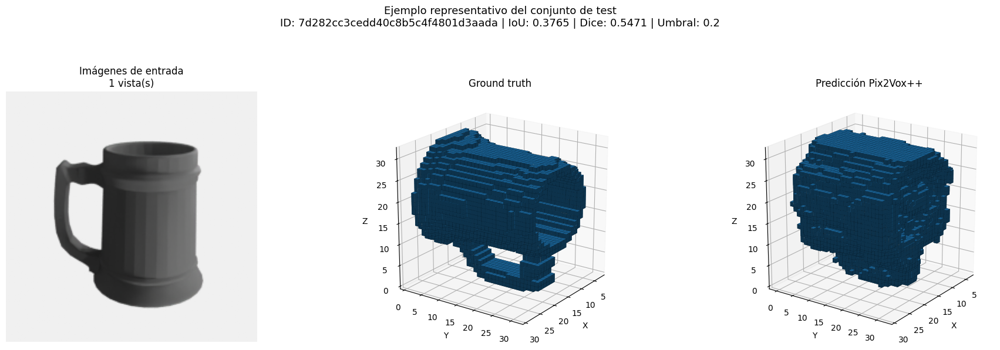


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/metricas/tazas_1_vista_con_finetuning/ejemplo_representativo.png

ÚLTIMAS DIEZ ÉPOCAS DEL FINE-TUNING


,epoca,train_perdida_total,train_iou_0_3,validacion_bce_x10,validacion_umbral,validacion_iou,validacion_dice,es_mejor_checkpoint
20,21,6.49957,0.43851,3.61493,0.2,0.40323,0.55928,True
21,22,6.39934,0.44623,3.56807,0.2,0.40706,0.56322,True
22,23,6.22585,0.46159,3.53777,0.2,0.40820,0.56438,True
23,24,6.29790,0.45221,3.55390,0.2,0.40827,0.56438,False
24,25,6.20451,0.46608,3.56391,0.2,0.40979,0.56581,True
25,26,6.20469,0.46596,3.56632,0.2,0.41010,0.56603,True
26,27,6.08229,0.47189,3.52846,0.2,0.41270,0.56919,True
27,28,6.06890,0.47597,3.50105,0.2,0.41481,0.57146,True
28,29,6.14150,0.47234,3.52888,0.2,0.41562,0.57186,True
29,30,6.01590,0.48599,3.52467,0.2,0.41755,0.57360,True



RESULTADOS FINALES DEL EXPERIMENTO 4


,conjunto,numero_objetos,umbral,bce_x10_media,iou_media,dice_media,precision_voxel_media,recall_voxel_media,chamfer_superficie_media,f_score_superficie_media
0,validacion,26.0,0.2,3.5247,0.4176,0.5736,0.4649,0.8306,1.2356,0.6318
1,test,26.0,0.2,3.0572,0.3976,0.5544,0.4285,0.8755,1.3218,0.6199



[OK] EXPERIMENTO 4 RECUPERADO Y EVALUADO
Checkpoint:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/checkpoints/tazas_1_vista_con_finetuning_mejor.pth

Métricas y figura:
/content/drive/MyDrive/Datos_E2/Pix2Vox++/metricas/tazas_1_vista_con_finetuning

La memoria de la GPU ha sido liberada.


In [ ]:
# ============================================================
# 18.1. RECUPERACIÓN Y EVALUACIÓN DEL EXPERIMENTO 4
# UNA VISTA CON FINE-TUNING
#
# No vuelve a ejecutar el entrenamiento.
# ============================================================

NOMBRE_EXPERIMENTO_1_VISTA_CON_FT = (
    "tazas_1_vista_con_finetuning"
)

SOBRESCRIBIR_EVALUACION_RECUPERADA_1_VISTA = False


print("=" * 75)
print("RECUPERACIÓN DEL EXPERIMENTO 4")
print("=" * 75)

print(f"Dispositivo:        {DEVICE}")
print("Número de vistas:   1")
print("Fine-tuning:        Sí")
print("Reentrenamiento:    No")


if DEVICE.type != "cuda":
    raise RuntimeError(
        "La evaluación definitiva debe ejecutarse con GPU."
    )

if USAR_PRECISION_MIXTA:
    raise RuntimeError(
        "La precisión mixta debe permanecer desactivada."
    )


# ------------------------------------------------------------
# 1. Liberar posibles objetos residuales del error anterior
# ------------------------------------------------------------

_nombres_objetos_residuales = [
    "_modelo_experimento_1_vista_ft",
    "_modelo_mejor_1_vista_ft",
    "_resultado_finetuning_1_vista",
    "_resultado_evaluacion_1_vista_ft",
    "_loader_train_1_vista_ft",
    "_loader_validacion_1_vista_ft",
    "_loader_test_1_vista_ft",
    "_cargadores_experimento_1_vista_ft",
]

for _nombre_objeto in _nombres_objetos_residuales:

    if _nombre_objeto in globals():

        _objeto_residual = globals().pop(
            _nombre_objeto
        )

        if isinstance(
            _objeto_residual,
            nn.Module,
        ):
            _objeto_residual.to("cpu")

        elif (
            isinstance(_objeto_residual, dict)
            and isinstance(
                _objeto_residual.get("modelo"),
                nn.Module,
            )
        ):
            _objeto_residual["modelo"].to(
                "cpu"
            )

        del _objeto_residual


gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


# ------------------------------------------------------------
# 2. Comprobar los archivos del entrenamiento
# ------------------------------------------------------------

_ruta_checkpoint_1_vista_ft = (
    RUTA_CHECKPOINTS
    / f"{NOMBRE_EXPERIMENTO_1_VISTA_CON_FT}_mejor.pth"
)

_ruta_historial_1_vista_ft = (
    RUTA_HISTORIALES
    / f"{NOMBRE_EXPERIMENTO_1_VISTA_CON_FT}_historial.csv"
)

_ruta_resumen_1_vista_ft = (
    RUTA_HISTORIALES
    / f"{NOMBRE_EXPERIMENTO_1_VISTA_CON_FT}_resumen.json"
)


if not _ruta_checkpoint_1_vista_ft.exists():
    raise FileNotFoundError(
        "No se encuentra el checkpoint entrenado:\n"
        f"{_ruta_checkpoint_1_vista_ft}"
    )

if not _ruta_historial_1_vista_ft.exists():
    raise FileNotFoundError(
        "No se encuentra el historial:\n"
        f"{_ruta_historial_1_vista_ft}"
    )


print("\nArchivos recuperados:")

print(
    f"Checkpoint:\n"
    f"{_ruta_checkpoint_1_vista_ft}"
)

print(
    f"\nHistorial:\n"
    f"{_ruta_historial_1_vista_ft}"
)


# ------------------------------------------------------------
# 3. Cargar el historial
# ------------------------------------------------------------

_historial_recuperado_1_vista = pd.read_csv(
    _ruta_historial_1_vista_ft
)

if _historial_recuperado_1_vista.empty:
    raise RuntimeError(
        "El historial de entrenamiento está vacío."
    )

if len(_historial_recuperado_1_vista) != 30:

    print(
        "\nAviso: el historial contiene "
        f"{len(_historial_recuperado_1_vista)} épocas, "
        "no 30."
    )


# ------------------------------------------------------------
# 4. Crear y recuperar el mejor modelo
# ------------------------------------------------------------

print("\nCreando Pix2Vox++/A...")

_modelo_recuperado_1_vista_ft = (
    Pix2VoxPlusPlusA(
        usar_refiner=True,
        usar_merger=True,
        usar_pesos_imagenet=False,
    )
)


print(
    "Cargando el checkpoint fine-tuned..."
)

_metadata_recuperada_1_vista_ft = (
    cargar_checkpoint_finetuning(
        modelo=_modelo_recuperado_1_vista_ft,
        ruta_checkpoint=(
            _ruta_checkpoint_1_vista_ft
        ),
        dispositivo_carga="cpu",
        estricto=True,
    )
)


if (
    _metadata_recuperada_1_vista_ft[
        "claves_ausentes"
    ]
    or _metadata_recuperada_1_vista_ft[
        "claves_inesperadas"
    ]
):
    raise RuntimeError(
        "El checkpoint no coincide completamente "
        "con la arquitectura del modelo."
    )


_modelo_recuperado_1_vista_ft = (
    _modelo_recuperado_1_vista_ft
    .to(DEVICE)
)

_modelo_recuperado_1_vista_ft.eval()


# ------------------------------------------------------------
# 5. Validar los metadatos recuperados
# ------------------------------------------------------------

_mejor_epoca_recuperada = int(
    _metadata_recuperada_1_vista_ft[
        "epoca"
    ]
)

_mejor_iou_recuperada = float(
    _metadata_recuperada_1_vista_ft[
        "mejor_iou_validacion"
    ]
)

_mejor_dice_recuperado = float(
    _metadata_recuperada_1_vista_ft[
        "mejor_dice_validacion"
    ]
)

_mejor_umbral_recuperado = float(
    _metadata_recuperada_1_vista_ft[
        "mejor_umbral"
    ]
)


_fila_mejor_historial = (
    _historial_recuperado_1_vista.loc[
        _historial_recuperado_1_vista[
            "validacion_iou"
        ].idxmax()
    ]
)


print("\n" + "=" * 75)
print("CHECKPOINT RECUPERADO")
print("=" * 75)

print(
    f"Formato:                 "
    f"{_metadata_recuperada_1_vista_ft['formato']}"
)

print(
    f"Mejor época:             "
    f"{_mejor_epoca_recuperada}"
)

print(
    f"Mejor IoU validación:    "
    f"{_mejor_iou_recuperada:.4f}"
)

print(
    f"Mejor Dice validación:   "
    f"{_mejor_dice_recuperado:.4f}"
)

print(
    f"Mejor umbral:            "
    f"{_mejor_umbral_recuperado:.1f}"
)

print(
    f"Claves ausentes:         "
    f"{_metadata_recuperada_1_vista_ft['claves_ausentes']}"
)

print(
    f"Claves inesperadas:      "
    f"{_metadata_recuperada_1_vista_ft['claves_inesperadas']}"
)


assert (
    int(_fila_mejor_historial["epoca"])
    == _mejor_epoca_recuperada
), (
    "La mejor época del historial no coincide "
    "con la del checkpoint."
)

assert np.isclose(
    float(_fila_mejor_historial["validacion_iou"]),
    _mejor_iou_recuperada,
    atol=1e-6,
), (
    "La IoU del historial no coincide con "
    "la almacenada en el checkpoint."
)


# ------------------------------------------------------------
# 6. Reconstruir y guardar el resumen del entrenamiento
# ------------------------------------------------------------

_tiempo_train_total = float(
    _historial_recuperado_1_vista[
        "train_tiempo_segundos"
    ].sum()
)

_tiempo_validacion_total = float(
    _historial_recuperado_1_vista[
        "validacion_tiempo_segundos"
    ].sum()
)

resumen_finetuning_1_vista_con_ft = {
    "nombre_experimento": (
        NOMBRE_EXPERIMENTO_1_VISTA_CON_FT
    ),
    "mejor_epoca": int(
        _mejor_epoca_recuperada
    ),
    "mejor_iou_validacion": float(
        _mejor_iou_recuperada
    ),
    "mejor_dice_validacion": float(
        _mejor_dice_recuperado
    ),
    "mejor_umbral": float(
        _mejor_umbral_recuperado
    ),
    "epocas_ejecutadas": int(
        len(_historial_recuperado_1_vista)
    ),
    "tiempo_train_segundos": (
        _tiempo_train_total
    ),
    "tiempo_validacion_segundos": (
        _tiempo_validacion_total
    ),
    "tiempo_total_estimado_segundos": float(
        _tiempo_train_total
        + _tiempo_validacion_total
    ),
    "ruta_checkpoint": str(
        _ruta_checkpoint_1_vista_ft
    ),
    "ruta_historial": str(
        _ruta_historial_1_vista_ft
    ),
    "recuperado_tras_error_de_carga": True,
    "configuracion_experimento": (
        _metadata_recuperada_1_vista_ft[
            "configuracion_experimento"
        ]
    ),
}


guardar_json_atomico(
    contenido=resumen_finetuning_1_vista_con_ft,
    ruta_destino=_ruta_resumen_1_vista_ft,
)


print(
    "\nResumen reconstruido y guardado en:"
)

print(
    _ruta_resumen_1_vista_ft
)


# ------------------------------------------------------------
# 7. Crear los DataLoader de evaluación
# ------------------------------------------------------------

print("\nCreando los DataLoader de evaluación...")

_cargadores_recuperados_1_vista_ft = (
    crear_dataloaders_pix2vox(
        numero_vistas=1,
        conjunto_categorias="tazas",
        tamano_lote_fisico=TAMANO_LOTE_FISICO,
    )
)

_loader_validacion_recuperado_1_vista_ft = (
    _cargadores_recuperados_1_vista_ft[
        "loader_validacion"
    ]
)

_loader_test_recuperado_1_vista_ft = (
    _cargadores_recuperados_1_vista_ft[
        "loader_test"
    ]
)


# ------------------------------------------------------------
# 8. Evaluación definitiva
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("EVALUACIÓN FINAL DEL MODELO RECUPERADO")
print("=" * 75)

_resultado_evaluacion_recuperada_1_vista_ft = (
    evaluar_y_guardar_experimento_pix2vox(
        modelo=_modelo_recuperado_1_vista_ft,
        loader_validacion=(
            _loader_validacion_recuperado_1_vista_ft
        ),
        loader_test=(
            _loader_test_recuperado_1_vista_ft
        ),
        nombre_experimento=(
            NOMBRE_EXPERIMENTO_1_VISTA_CON_FT
        ),
        numero_vistas=1,
        tipo_experimento="con_finetuning",
        configuracion_extra={
            "categoria": CATEGORIA_TAZAS,
            "fine_tuning": True,
            "mejor_epoca": (
                _mejor_epoca_recuperada
            ),
            "mejor_iou_validacion_entrenamiento": (
                _mejor_iou_recuperada
            ),
            "mejor_dice_validacion_entrenamiento": (
                _mejor_dice_recuperado
            ),
            "mejor_umbral_entrenamiento": (
                _mejor_umbral_recuperado
            ),
            "ruta_checkpoint_finetuned": str(
                _ruta_checkpoint_1_vista_ft
            ),
            "ruta_historial": str(
                _ruta_historial_1_vista_ft
            ),
            "vista_fija_evaluacion": (
                INDICES_VISTAS_EVALUACION[1]
            ),
            "precision": "float32",
            "resolucion_voxel": int(
                RESOLUCION_VOXEL
            ),
            "modelo_recuperado": True,
        },
        sobrescribir=(
            SOBRESCRIBIR_EVALUACION_RECUPERADA_1_VISTA
        ),
    )
)


# ------------------------------------------------------------
# 9. Generar el ejemplo representativo
# ------------------------------------------------------------

_metadata_ejemplo_recuperado_1_vista_ft = (
    visualizar_ejemplo_representativo_pix2vox(
        modelo=_modelo_recuperado_1_vista_ft,
        dataloader_test=(
            _loader_test_recuperado_1_vista_ft
        ),
        tabla_test_por_objeto=(
            _resultado_evaluacion_recuperada_1_vista_ft[
                "resultado_test_completo"
            ][
                "tabla_por_objeto"
            ]
        ),
        umbral=(
            _resultado_evaluacion_recuperada_1_vista_ft[
                "umbral_seleccionado"
            ]
        ),
        ruta_experimento=(
            _resultado_evaluacion_recuperada_1_vista_ft[
                "ruta_experimento"
            ]
        ),
        numero_vistas=1,
    )
)


# ------------------------------------------------------------
# 10. Conservar los resultados compactos
# ------------------------------------------------------------

resumen_experimento_1_vista_con_ft = (
    _resultado_evaluacion_recuperada_1_vista_ft[
        "resumen_json"
    ]
)

ruta_checkpoint_1_vista_con_ft = Path(
    _ruta_checkpoint_1_vista_ft
)

ruta_experimento_1_vista_con_ft = Path(
    _resultado_evaluacion_recuperada_1_vista_ft[
        "ruta_experimento"
    ]
)


# ------------------------------------------------------------
# 11. Mostrar la parte final del historial
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("ÚLTIMAS DIEZ ÉPOCAS DEL FINE-TUNING")
print("=" * 75)

display(
    _historial_recuperado_1_vista.tail(10)[
        [
            "epoca",
            "train_perdida_total",
            "train_iou_0_3",
            "validacion_bce_x10",
            "validacion_umbral",
            "validacion_iou",
            "validacion_dice",
            "es_mejor_checkpoint",
        ]
    ].round(5)
)


# ------------------------------------------------------------
# 12. Mostrar los resultados finales
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("RESULTADOS FINALES DEL EXPERIMENTO 4")
print("=" * 75)

display(
    _resultado_evaluacion_recuperada_1_vista_ft[
        "tabla_resumen"
    ][
        [
            "conjunto",
            "numero_objetos",
            "umbral",
            "bce_x10_media",
            "iou_media",
            "dice_media",
            "precision_voxel_media",
            "recall_voxel_media",
            "chamfer_superficie_media",
            "f_score_superficie_media",
        ]
    ].round(4)
)


# ------------------------------------------------------------
# 13. Liberar memoria
# ------------------------------------------------------------

_modelo_recuperado_1_vista_ft.to(
    "cpu"
)

del _modelo_recuperado_1_vista_ft
del _metadata_recuperada_1_vista_ft
del _resultado_evaluacion_recuperada_1_vista_ft
del _metadata_ejemplo_recuperado_1_vista_ft
del _historial_recuperado_1_vista
del _fila_mejor_historial
del _cargadores_recuperados_1_vista_ft
del _loader_validacion_recuperado_1_vista_ft
del _loader_test_recuperado_1_vista_ft
del _nombres_objetos_residuales
del _nombre_objeto
del _tiempo_train_total
del _tiempo_validacion_total
del _mejor_epoca_recuperada
del _mejor_iou_recuperada
del _mejor_dice_recuperado
del _mejor_umbral_recuperado
del _ruta_checkpoint_1_vista_ft
del _ruta_historial_1_vista_ft
del _ruta_resumen_1_vista_ft

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


print("\n" + "=" * 75)
print("[OK] EXPERIMENTO 4 RECUPERADO Y EVALUADO")
print("=" * 75)

print(
    "Checkpoint:"
)

print(
    ruta_checkpoint_1_vista_con_ft
)

print(
    "\nMétricas y figura:"
)

print(
    ruta_experimento_1_vista_con_ft
)

print(
    "\nLa memoria de la GPU ha sido liberada."
)

## 19. Experimento 5: cinco vistas con fine-tuning

Se adapta Pix2Vox++ al conjunto de tazas utilizando cinco imágenes de entrada por objeto.

El modelo se inicializa con el checkpoint oficial preentrenado. Durante el entrenamiento, cada taza utiliza cinco vistas seleccionadas aleatoriamente entre las veinte disponibles. Esto permite variar las combinaciones de perspectivas observadas a lo largo de las épocas.

Durante validación y test se utiliza siempre la combinación fija:

```text
00.png, 05.png, 10.png, 14.png y 19.png
```

La configuración es:

- **Categoría:** tazas.
- **Número de vistas:** cinco.
- **Fine-tuning:** sí.
- **Objetos de entrenamiento:** 120.
- **Objetos de validación:** 26.
- **Objetos de test:** 26.
- **Batch físico:** cinco objetos.
- **Precisión:** `float32` en GPU.
- **Épocas máximas:** 30.
- **Early stopping:** siete épocas sin mejora.
- **Resolución de salida:** 32 × 32 × 32 vóxeles.

A diferencia del experimento de una vista, el merger puede aprender a asignar pesos diferentes a las reconstrucciones obtenidas desde cada perspectiva.

### Recuperación automática

El checkpoint utiliza el formato corregido de guardado, cuyos metadatos se convierten a tipos básicos de Python.

Además, la celda comprueba al comienzo si ya existen:

```text
tazas_5_vistas_con_finetuning_mejor.pth
tazas_5_vistas_con_finetuning_historial.csv
```

Cuando ambos archivos existen, se recupera directamente el mejor modelo y no se repite el entrenamiento. Esto permite continuar con la evaluación aunque la ejecución se interrumpa después de completar las épocas.

Las métricas finales y la figura representativa se guardarán en:

```text
Pix2Vox++/metricas/tazas_5_vistas_con_finetuning/
```

In [ ]:
# ============================================================
# 19. EXPERIMENTO 5
# CINCO VISTAS CON FINE-TUNING
#
# Esta celda:
# - Entrena el modelo si no existe un checkpoint válido.
# - Recupera el checkpoint si el entrenamiento ya terminó.
# - Evalúa validación y test.
# - Genera una reconstrucción representativa.
# ============================================================


NOMBRE_EXPERIMENTO_5_VISTAS_CON_FT = (
    "tazas_5_vistas_con_finetuning"
)

# Para este experimento queremos ignorar cualquier entrenamiento
# anterior incompleto y comenzar de nuevo desde el checkpoint oficial.
REUTILIZAR_CHECKPOINT_5_VISTAS = False

# Eliminar únicamente los archivos anteriores del experimento
# de cinco vistas antes de comenzar.
REINICIAR_ENTRENAMIENTO_5_VISTAS = True

SOBRESCRIBIR_EVALUACION_5_VISTAS_CON_FT = True

# ------------------------------------------------------------
# Corrección definitiva del helper de tipos NumPy
#
# Evita el DeprecationWarning de numpy.core y mantiene la
# compatibilidad con checkpoints antiguos.
# ------------------------------------------------------------

def obtener_globals_numpy_seguros_finetuning():
    """
    Devuelve exclusivamente los tipos NumPy necesarios para
    cargar checkpoints antiguos mediante weights_only=True.

    Se utiliza numpy._core para evitar el aviso de deprecación
    producido por numpy.core.
    """

    globals_seguros = []

    try:

        globals_seguros.append(
            np._core.multiarray.scalar
        )

    except AttributeError:

        pass

    globals_seguros.append(
        np.dtype
    )

    tipos_numpy = [
        np.bool_,
        np.int8,
        np.int16,
        np.int32,
        np.int64,
        np.uint8,
        np.uint16,
        np.uint32,
        np.uint64,
        np.float16,
        np.float32,
        np.float64,
    ]

    for tipo_numpy in tipos_numpy:

        globals_seguros.append(
            type(
                np.dtype(tipo_numpy)
            )
        )

    globals_unicos = []
    identificadores_vistos = set()

    for objeto in globals_seguros:

        identificador = id(objeto)

        if identificador not in identificadores_vistos:

            globals_unicos.append(
                objeto
            )

            identificadores_vistos.add(
                identificador
            )

    return globals_unicos


# ------------------------------------------------------------
# Comprobaciones previas
# ------------------------------------------------------------

print("=" * 75)
print("EXPERIMENTO 5: CINCO VISTAS CON FINE-TUNING")
print("=" * 75)

print(f"Dispositivo:        {DEVICE}")
print("Categoría:          tazas")
print("Número de vistas:   5")
print("Fine-tuning:        Sí")
print(f"Precisión mixta:    {USAR_PRECISION_MIXTA}")
print("Precisión numérica: float32")
print(f"Batch físico:       {TAMANO_LOTE_FISICO}")
print(f"Batch efectivo:     {TAMANO_LOTE_EFECTIVO}")
print(f"Épocas máximas:     {NUMERO_EPOCAS_MAXIMO}")
print(f"Early stopping:     {PACIENCIA_EARLY_STOPPING}")

print(
    "Vistas de evaluación: "
    f"{INDICES_VISTAS_EVALUACION[5]}"
)


if DEVICE.type != "cuda":

    raise RuntimeError(
        "Este experimento definitivo debe ejecutarse con GPU."
    )


if USAR_PRECISION_MIXTA:

    raise RuntimeError(
        "La precisión mixta debe permanecer desactivada "
        "para evitar gradientes no finitos."
    )


_funciones_necesarias = [
    "convertir_metadata_checkpoint_segura",
    "guardar_checkpoint_finetuning",
    "cargar_checkpoint_finetuning",
    "entrenar_modelo_finetuning_pix2vox",
]

_funciones_faltantes = [
    nombre
    for nombre in _funciones_necesarias
    if nombre not in globals()
]

if _funciones_faltantes:

    raise RuntimeError(
        "Faltan funciones de las secciones anteriores: "
        f"{_funciones_faltantes}"
    )


# ------------------------------------------------------------
# 1. Rutas permanentes del experimento
# ------------------------------------------------------------

_ruta_checkpoint_5_vistas_ft = (
    RUTA_CHECKPOINTS
    / f"{NOMBRE_EXPERIMENTO_5_VISTAS_CON_FT}_mejor.pth"
)

_ruta_historial_5_vistas_ft = (
    RUTA_HISTORIALES
    / f"{NOMBRE_EXPERIMENTO_5_VISTAS_CON_FT}_historial.csv"
)

_ruta_resumen_5_vistas_ft = (
    RUTA_HISTORIALES
    / f"{NOMBRE_EXPERIMENTO_5_VISTAS_CON_FT}_resumen.json"
)

# ------------------------------------------------------------
# ELIMINAR UN ENTRENAMIENTO ANTERIOR INCOMPLETO
#
# Solo afecta al experimento:
# tazas_5_vistas_con_finetuning
# ------------------------------------------------------------

if REINICIAR_ENTRENAMIENTO_5_VISTAS:

    print(
        "\nReinicio solicitado para el experimento "
        "de cinco vistas."
    )

    _ruta_metricas_5_vistas_ft = (
        RUTA_METRICAS
        / NOMBRE_EXPERIMENTO_5_VISTAS_CON_FT
    )

    _archivos_a_eliminar_5_vistas = [
        _ruta_checkpoint_5_vistas_ft,
        _ruta_historial_5_vistas_ft,
        _ruta_resumen_5_vistas_ft,
    ]

    for _ruta_archivo in (
        _archivos_a_eliminar_5_vistas
    ):

        if _ruta_archivo.exists():

            print(
                f"Eliminando: "
                f"{_ruta_archivo.name}"
            )

            _ruta_archivo.unlink()

    if _ruta_metricas_5_vistas_ft.exists():

        print(
            "Eliminando métricas anteriores "
            "del experimento 5..."
        )

        shutil.rmtree(
            _ruta_metricas_5_vistas_ft
        )

    print(
        "[OK] Experimento 5 preparado "
        "para entrenarse desde cero."
    )



_checkpoint_disponible = (
    _ruta_checkpoint_5_vistas_ft.exists()
)

_historial_disponible = (
    _ruta_historial_5_vistas_ft.exists()
)

_reutilizar_entrenamiento = (
    REUTILIZAR_CHECKPOINT_5_VISTAS
    and _checkpoint_disponible
    and _historial_disponible
)


print("\nEstado de los archivos:")

print(
    f"Checkpoint existente: "
    f"{_checkpoint_disponible}"
)

print(
    f"Historial existente:  "
    f"{_historial_disponible}"
)

print(
    f"Reutilizar modelo:     "
    f"{_reutilizar_entrenamiento}"
)


# ------------------------------------------------------------
# 2. Crear los DataLoader
# ------------------------------------------------------------

print("\nCreando los DataLoader...")

_cargadores_experimento_5_vistas_ft = (
    crear_dataloaders_pix2vox(
        numero_vistas=5,
        conjunto_categorias="tazas",
        tamano_lote_fisico=TAMANO_LOTE_FISICO,
    )
)

_loader_train_5_vistas_ft = (
    _cargadores_experimento_5_vistas_ft[
        "loader_train"
    ]
)

_loader_validacion_5_vistas_ft = (
    _cargadores_experimento_5_vistas_ft[
        "loader_validacion"
    ]
)

_loader_test_5_vistas_ft = (
    _cargadores_experimento_5_vistas_ft[
        "loader_test"
    ]
)


print(
    f"Objetos de entrenamiento: "
    f"{len(_loader_train_5_vistas_ft.dataset)}"
)

print(
    f"Objetos de validación:    "
    f"{len(_loader_validacion_5_vistas_ft.dataset)}"
)

print(
    f"Objetos de test:          "
    f"{len(_loader_test_5_vistas_ft.dataset)}"
)

print(
    f"Lotes train por época:    "
    f"{len(_loader_train_5_vistas_ft)}"
)

print(
    f"Lotes de validación:      "
    f"{len(_loader_validacion_5_vistas_ft)}"
)


# ------------------------------------------------------------
# 3. Crear la arquitectura
# ------------------------------------------------------------

print("\nCreando Pix2Vox++/A...")

_modelo_experimento_5_vistas_ft = (
    Pix2VoxPlusPlusA(
        usar_refiner=True,
        usar_merger=True,
        usar_pesos_imagenet=False,
    )
)


# ------------------------------------------------------------
# 4A. Recuperar un entrenamiento ya finalizado
# ------------------------------------------------------------

if _reutilizar_entrenamiento:

    print(
        "\nSe ha encontrado un entrenamiento anterior."
    )

    print(
        "Cargando directamente el mejor checkpoint..."
    )

    _metadata_checkpoint_5_vistas_ft = (
        cargar_checkpoint_finetuning(
            modelo=_modelo_experimento_5_vistas_ft,
            ruta_checkpoint=(
                _ruta_checkpoint_5_vistas_ft
            ),
            dispositivo_carga="cpu",
            estricto=True,
        )
    )

    if (
        _metadata_checkpoint_5_vistas_ft[
            "claves_ausentes"
        ]
        or _metadata_checkpoint_5_vistas_ft[
            "claves_inesperadas"
        ]
    ):

        raise RuntimeError(
            "El checkpoint existente no coincide "
            "completamente con la arquitectura."
        )

    _historial_5_vistas_ft = pd.read_csv(
        _ruta_historial_5_vistas_ft
    )

    if _historial_5_vistas_ft.empty:

        raise RuntimeError(
            "El historial existente está vacío."
        )

    _mejor_epoca_5_vistas = int(
        _metadata_checkpoint_5_vistas_ft[
            "epoca"
        ]
    )

    _mejor_iou_5_vistas = float(
        _metadata_checkpoint_5_vistas_ft[
            "mejor_iou_validacion"
        ]
    )

    _mejor_dice_5_vistas = float(
        _metadata_checkpoint_5_vistas_ft[
            "mejor_dice_validacion"
        ]
    )

    _mejor_umbral_5_vistas = float(
        _metadata_checkpoint_5_vistas_ft[
            "mejor_umbral"
        ]
    )

    _configuracion_checkpoint_5_vistas = (
        _metadata_checkpoint_5_vistas_ft[
            "configuracion_experimento"
        ]
    )


# ------------------------------------------------------------
# 4B. Ejecutar el fine-tuning cuando no existe checkpoint
# ------------------------------------------------------------

else:

    print(
        "\nNo existe un entrenamiento completo anterior."
    )

    print(
        "Cargando el checkpoint oficial..."
    )

    _metadata_inicial_5_vistas_ft = (
        cargar_pesos_preentrenados_pix2vox(
            modelo=_modelo_experimento_5_vistas_ft,
            ruta_checkpoint=RUTA_CHECKPOINT_OFICIAL,
            dispositivo_carga="cpu",
            estricto=True,
        )
    )

    _modelo_experimento_5_vistas_ft = (
        _modelo_experimento_5_vistas_ft
        .to(DEVICE)
    )

    print(
        "\nIniciando el fine-tuning de cinco vistas..."
    )

    _resultado_finetuning_5_vistas = (
        entrenar_modelo_finetuning_pix2vox(
            modelo=_modelo_experimento_5_vistas_ft,
            loader_train=_loader_train_5_vistas_ft,
            loader_validacion=(
                _loader_validacion_5_vistas_ft
            ),
            nombre_experimento=(
                NOMBRE_EXPERIMENTO_5_VISTAS_CON_FT
            ),
            configuracion_experimento={
                "categoria": CATEGORIA_TAZAS,
                "grupo_categorias": "tazas",
                "numero_vistas": 5,
                "fine_tuning": True,
                "checkpoint_inicial": str(
                    RUTA_CHECKPOINT_OFICIAL
                ),
                "checkpoint_inicial_epoch": (
                    _metadata_inicial_5_vistas_ft.get(
                        "epoch"
                    )
                ),
                "checkpoint_inicial_best_iou": (
                    _metadata_inicial_5_vistas_ft.get(
                        "best_iou"
                    )
                ),
                "vistas_train": (
                    "cinco vistas aleatorias sin repetición"
                ),
                "vistas_validacion_test": (
                    INDICES_VISTAS_EVALUACION[5]
                ),
                "tamano_lote_fisico": int(
                    TAMANO_LOTE_FISICO
                ),
                "tamano_lote_efectivo": int(
                    TAMANO_LOTE_EFECTIVO
                ),
                "precision": "float32",
                "resolucion_voxel": int(
                    RESOLUCION_VOXEL
                ),
                "tamano_imagen": int(
                    TAMANO_IMAGEN
                ),
                "checkpoint_formato": (
                    "pix2vox_finetuning_v2"
                ),
            },
            numero_epocas=NUMERO_EPOCAS_MAXIMO,
            paciencia_early_stopping=(
                PACIENCIA_EARLY_STOPPING
            ),
            pasos_acumulacion=(
                PASOS_ACUMULACION_GRADIENTE
            ),
            max_lotes_train=None,
            max_lotes_validacion=None,
        )
    )

    _modelo_experimento_5_vistas_ft = (
        _resultado_finetuning_5_vistas[
            "modelo"
        ]
    )

    _historial_5_vistas_ft = (
        _resultado_finetuning_5_vistas[
            "historial"
        ]
    )

    _resumen_original_5_vistas_ft = (
        _resultado_finetuning_5_vistas[
            "resumen"
        ]
    )

    _metadata_checkpoint_5_vistas_ft = (
        _resultado_finetuning_5_vistas[
            "metadata_checkpoint"
        ]
    )

    _mejor_epoca_5_vistas = int(
        _resumen_original_5_vistas_ft[
            "mejor_epoca"
        ]
    )

    _mejor_iou_5_vistas = float(
        _resumen_original_5_vistas_ft[
            "mejor_iou_validacion"
        ]
    )

    _mejor_dice_5_vistas = float(
        _resumen_original_5_vistas_ft[
            "mejor_dice_validacion"
        ]
    )

    _mejor_umbral_5_vistas = float(
        _resumen_original_5_vistas_ft[
            "mejor_umbral"
        ]
    )

    _configuracion_checkpoint_5_vistas = (
        _metadata_checkpoint_5_vistas_ft[
            "configuracion_experimento"
        ]
    )


# ------------------------------------------------------------
# 5. Asegurar que el modelo se encuentra en GPU
# ------------------------------------------------------------

_modelo_experimento_5_vistas_ft = (
    _modelo_experimento_5_vistas_ft
    .to(DEVICE)
)

_modelo_experimento_5_vistas_ft.eval()


print("\n" + "=" * 75)
print("MEJOR CHECKPOINT DE CINCO VISTAS")
print("=" * 75)

print(
    f"Formato:                 "
    f"{_metadata_checkpoint_5_vistas_ft['formato']}"
)

print(
    f"Mejor época:             "
    f"{_mejor_epoca_5_vistas}"
)

print(
    f"Mejor IoU validación:    "
    f"{_mejor_iou_5_vistas:.4f}"
)

print(
    f"Mejor Dice validación:   "
    f"{_mejor_dice_5_vistas:.4f}"
)

print(
    f"Mejor umbral:            "
    f"{_mejor_umbral_5_vistas:.1f}"
)

print(
    f"Claves ausentes:         "
    f"{_metadata_checkpoint_5_vistas_ft['claves_ausentes']}"
)

print(
    f"Claves inesperadas:      "
    f"{_metadata_checkpoint_5_vistas_ft['claves_inesperadas']}"
)


# ------------------------------------------------------------
# 6. Crear o actualizar el resumen del entrenamiento
# ------------------------------------------------------------

_tiempo_train_5_vistas = float(
    _historial_5_vistas_ft[
        "train_tiempo_segundos"
    ].sum()
)

_tiempo_validacion_5_vistas = float(
    _historial_5_vistas_ft[
        "validacion_tiempo_segundos"
    ].sum()
)

resumen_finetuning_5_vistas_con_ft = {
    "nombre_experimento": (
        NOMBRE_EXPERIMENTO_5_VISTAS_CON_FT
    ),
    "mejor_epoca": int(
        _mejor_epoca_5_vistas
    ),
    "mejor_iou_validacion": float(
        _mejor_iou_5_vistas
    ),
    "mejor_dice_validacion": float(
        _mejor_dice_5_vistas
    ),
    "mejor_umbral": float(
        _mejor_umbral_5_vistas
    ),
    "epocas_ejecutadas": int(
        len(_historial_5_vistas_ft)
    ),
    "tiempo_train_segundos": float(
        _tiempo_train_5_vistas
    ),
    "tiempo_validacion_segundos": float(
        _tiempo_validacion_5_vistas
    ),
    "tiempo_total_estimado_segundos": float(
        _tiempo_train_5_vistas
        + _tiempo_validacion_5_vistas
    ),
    "ruta_checkpoint": str(
        _ruta_checkpoint_5_vistas_ft
    ),
    "ruta_historial": str(
        _ruta_historial_5_vistas_ft
    ),
    "checkpoint_reutilizado": bool(
        _reutilizar_entrenamiento
    ),
    "configuracion_experimento": (
        _configuracion_checkpoint_5_vistas
    ),
}

guardar_json_atomico(
    contenido=resumen_finetuning_5_vistas_con_ft,
    ruta_destino=_ruta_resumen_5_vistas_ft,
)


# ------------------------------------------------------------
# 7. Evaluación final del mejor modelo
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("EVALUACIÓN FINAL DEL MODELO DE CINCO VISTAS")
print("=" * 75)

_resultado_evaluacion_5_vistas_ft = (
    evaluar_y_guardar_experimento_pix2vox(
        modelo=_modelo_experimento_5_vistas_ft,
        loader_validacion=(
            _loader_validacion_5_vistas_ft
        ),
        loader_test=(
            _loader_test_5_vistas_ft
        ),
        nombre_experimento=(
            NOMBRE_EXPERIMENTO_5_VISTAS_CON_FT
        ),
        numero_vistas=5,
        tipo_experimento="con_finetuning",
        configuracion_extra={
            "categoria": CATEGORIA_TAZAS,
            "fine_tuning": True,
            "mejor_epoca": (
                _mejor_epoca_5_vistas
            ),
            "mejor_iou_validacion_entrenamiento": (
                _mejor_iou_5_vistas
            ),
            "mejor_dice_validacion_entrenamiento": (
                _mejor_dice_5_vistas
            ),
            "mejor_umbral_entrenamiento": (
                _mejor_umbral_5_vistas
            ),
            "ruta_checkpoint_finetuned": str(
                _ruta_checkpoint_5_vistas_ft
            ),
            "ruta_historial": str(
                _ruta_historial_5_vistas_ft
            ),
            "vistas_fijas_evaluacion": (
                INDICES_VISTAS_EVALUACION[5]
            ),
            "precision": "float32",
            "resolucion_voxel": int(
                RESOLUCION_VOXEL
            ),
            "checkpoint_reutilizado": bool(
                _reutilizar_entrenamiento
            ),
        },
        sobrescribir=(
            SOBRESCRIBIR_EVALUACION_5_VISTAS_CON_FT
        ),
    )
)


# ------------------------------------------------------------
# 8. Ejemplo representativo
# ------------------------------------------------------------

_metadata_ejemplo_5_vistas_ft = (
    visualizar_ejemplo_representativo_pix2vox(
        modelo=_modelo_experimento_5_vistas_ft,
        dataloader_test=(
            _loader_test_5_vistas_ft
        ),
        tabla_test_por_objeto=(
            _resultado_evaluacion_5_vistas_ft[
                "resultado_test_completo"
            ][
                "tabla_por_objeto"
            ]
        ),
        umbral=(
            _resultado_evaluacion_5_vistas_ft[
                "umbral_seleccionado"
            ]
        ),
        ruta_experimento=(
            _resultado_evaluacion_5_vistas_ft[
                "ruta_experimento"
            ]
        ),
        numero_vistas=5,
    )
)


# ------------------------------------------------------------
# 9. Conservar resultados compactos
# ------------------------------------------------------------

resumen_experimento_5_vistas_con_ft = (
    _resultado_evaluacion_5_vistas_ft[
        "resumen_json"
    ]
)

ruta_checkpoint_5_vistas_con_ft = Path(
    _ruta_checkpoint_5_vistas_ft
)

ruta_experimento_5_vistas_con_ft = Path(
    _resultado_evaluacion_5_vistas_ft[
        "ruta_experimento"
    ]
)


# ------------------------------------------------------------
# 10. Mostrar las últimas épocas
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("ÚLTIMAS DIEZ ÉPOCAS DEL FINE-TUNING")
print("=" * 75)

display(
    _historial_5_vistas_ft.tail(10)[
        [
            "epoca",
            "train_perdida_total",
            "train_iou_0_3",
            "validacion_bce_x10",
            "validacion_umbral",
            "validacion_iou",
            "validacion_dice",
            "lr_encoder",
            "lr_decoder",
            "es_mejor_checkpoint",
            "epocas_sin_mejora",
        ]
    ].round(5)
)


# ------------------------------------------------------------
# 11. Mostrar los resultados finales
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("RESULTADOS FINALES DEL EXPERIMENTO 5")
print("=" * 75)

_tabla_resultados_5_vistas_ft = (
    _resultado_evaluacion_5_vistas_ft[
        "tabla_resumen"
    ]
)

display(
    _tabla_resultados_5_vistas_ft[
        [
            "conjunto",
            "numero_objetos",
            "umbral",
            "bce_x10_media",
            "iou_media",
            "dice_media",
            "precision_voxel_media",
            "recall_voxel_media",
            "chamfer_superficie_media",
            "f_score_superficie_media",
        ]
    ].round(4)
)


# ------------------------------------------------------------
# 12. Comparar con cinco vistas sin fine-tuning
# ------------------------------------------------------------

_ruta_baseline_5_vistas = (
    RUTA_METRICAS
    / "tazas_5_vistas_sin_finetuning"
    / "resumen_validacion_test.csv"
)

if _ruta_baseline_5_vistas.exists():

    _tabla_baseline_5_vistas = pd.read_csv(
        _ruta_baseline_5_vistas
    )

    _fila_baseline_test_5_vistas = (
        _tabla_baseline_5_vistas.loc[
            _tabla_baseline_5_vistas[
                "conjunto"
            ] == "test"
        ].iloc[0]
    )

    _fila_finetuning_test_5_vistas = (
        _tabla_resultados_5_vistas_ft.loc[
            _tabla_resultados_5_vistas_ft[
                "conjunto"
            ] == "test"
        ].iloc[0]
    )

    _comparacion_5_vistas = pd.DataFrame(
        {
            "metrica": [
                "IoU",
                "Dice",
                "Chamfer superficie",
                "F-score superficie",
            ],
            "sin_finetuning": [
                _fila_baseline_test_5_vistas[
                    "iou_media"
                ],
                _fila_baseline_test_5_vistas[
                    "dice_media"
                ],
                _fila_baseline_test_5_vistas[
                    "chamfer_superficie_media"
                ],
                _fila_baseline_test_5_vistas[
                    "f_score_superficie_media"
                ],
            ],
            "con_finetuning": [
                _fila_finetuning_test_5_vistas[
                    "iou_media"
                ],
                _fila_finetuning_test_5_vistas[
                    "dice_media"
                ],
                _fila_finetuning_test_5_vistas[
                    "chamfer_superficie_media"
                ],
                _fila_finetuning_test_5_vistas[
                    "f_score_superficie_media"
                ],
            ],
        }
    )

    _comparacion_5_vistas[
        "diferencia"
    ] = (
        _comparacion_5_vistas[
            "con_finetuning"
        ]
        - _comparacion_5_vistas[
            "sin_finetuning"
        ]
    )

    print("\n" + "=" * 75)
    print("COMPARACIÓN CON EL BASELINE DE CINCO VISTAS")
    print("=" * 75)

    display(
        _comparacion_5_vistas.round(4)
    )


# ------------------------------------------------------------
# 13. Liberar memoria
# ------------------------------------------------------------

_modelo_experimento_5_vistas_ft.to(
    "cpu"
)

del _modelo_experimento_5_vistas_ft
del _metadata_checkpoint_5_vistas_ft
del _resultado_evaluacion_5_vistas_ft
del _metadata_ejemplo_5_vistas_ft
del _historial_5_vistas_ft
del _tabla_resultados_5_vistas_ft
del _cargadores_experimento_5_vistas_ft
del _loader_train_5_vistas_ft
del _loader_validacion_5_vistas_ft
del _loader_test_5_vistas_ft
del _funciones_necesarias
del _funciones_faltantes
del _checkpoint_disponible
del _historial_disponible
del _reutilizar_entrenamiento
del _mejor_epoca_5_vistas
del _mejor_iou_5_vistas
del _mejor_dice_5_vistas
del _mejor_umbral_5_vistas
del _configuracion_checkpoint_5_vistas
del _tiempo_train_5_vistas
del _tiempo_validacion_5_vistas
del _ruta_checkpoint_5_vistas_ft
del _ruta_historial_5_vistas_ft
del _ruta_resumen_5_vistas_ft

if "_resultado_finetuning_5_vistas" in globals():
    del _resultado_finetuning_5_vistas

if "_resumen_original_5_vistas_ft" in globals():
    del _resumen_original_5_vistas_ft

if "_metadata_inicial_5_vistas_ft" in globals():
    del _metadata_inicial_5_vistas_ft

if "_tabla_baseline_5_vistas" in globals():
    del _tabla_baseline_5_vistas

if "_fila_baseline_test_5_vistas" in globals():
    del _fila_baseline_test_5_vistas

if "_fila_finetuning_test_5_vistas" in globals():
    del _fila_finetuning_test_5_vistas

if "_comparacion_5_vistas" in globals():
    del _comparacion_5_vistas

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


print("\n" + "=" * 75)
print("[OK] EXPERIMENTO 5 FINALIZADO")
print("=" * 75)

print(
    "Mejor checkpoint:"
)

print(
    ruta_checkpoint_5_vistas_con_ft
)

print(
    "\nMétricas y figura:"
)

print(
    ruta_experimento_5_vistas_con_ft
)

print(
    "\nLa memoria de la GPU ha sido liberada."
)

EXPERIMENTO 5: CINCO VISTAS CON FINE-TUNING
Dispositivo:        cuda
Categoría:          tazas
Número de vistas:   5
Fine-tuning:        Sí
Precisión mixta:    False
Precisión numérica: float32
Batch físico:       5
Batch efectivo:     5
Épocas máximas:     30
Early stopping:     7
Vistas de evaluación: [0, 5, 10, 14, 19]

Reinicio solicitado para el experimento de cinco vistas.
Eliminando: tazas_5_vistas_con_finetuning_mejor.pth
Eliminando: tazas_5_vistas_con_finetuning_historial.csv
Eliminando: tazas_5_vistas_con_finetuning_resumen.json
Eliminando métricas anteriores del experimento 5...
[OK] Experimento 5 preparado para entrenarse desde cero.

Estado de los archivos:
Checkpoint existente: False
Historial existente:  False
Reutilizar modelo:     False

Creando los DataLoader...
Se utilizarán las divisiones guardadas anteriormente.
Las rutas de las divisiones se han actualizado a la estructura actual.
Objetos de entrenamiento: 120
Objetos de validación:    26
Objetos de test:         

Train época 1:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 1:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       13.607905
IoU train @ 0.3:     0.1980
BCE validación:      5.105964
Umbral validación:   0.2
IoU validación:      0.2871
Dice validación:     0.4227
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 2/30


Train época 2:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 2:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       9.467935
IoU train @ 0.3:     0.2146
BCE validación:      4.098802
Umbral validación:   0.2
IoU validación:      0.3328
Dice validación:     0.4791
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 3/30


Train época 3:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 3:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       8.307289
IoU train @ 0.3:     0.2020
BCE validación:      3.855580
Umbral validación:   0.2
IoU validación:      0.3806
Dice validación:     0.5336
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 4/30


Train época 4:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 4:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       7.631131
IoU train @ 0.3:     0.2503
BCE validación:      3.754216
Umbral validación:   0.2
IoU validación:      0.4013
Dice validación:     0.5556
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 5/30


Train época 5:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 5:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       7.216826
IoU train @ 0.3:     0.3067
BCE validación:      3.622119
Umbral validación:   0.2
IoU validación:      0.4134
Dice validación:     0.5676
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 6/30


Train época 6:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 6:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.891044
IoU train @ 0.3:     0.3543
BCE validación:      3.524936
Umbral validación:   0.2
IoU validación:      0.4192
Dice validación:     0.5730
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 7/30


Train época 7:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 7:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.502822
IoU train @ 0.3:     0.3956
BCE validación:      3.425818
Umbral validación:   0.2
IoU validación:      0.4305
Dice validación:     0.5846
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 8/30


Train época 8:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 8:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.234574
IoU train @ 0.3:     0.4227
BCE validación:      3.386458
Umbral validación:   0.2
IoU validación:      0.4320
Dice validación:     0.5868
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 9/30


Train época 9:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 9:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       6.040542
IoU train @ 0.3:     0.4501
BCE validación:      3.320379
Umbral validación:   0.2
IoU validación:      0.4444
Dice validación:     0.5995
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 10/30


Train época 10:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 10:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       5.844071
IoU train @ 0.3:     0.4662
BCE validación:      3.267981
Umbral validación:   0.2
IoU validación:      0.4500
Dice validación:     0.6050
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 11/30


Train época 11:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 11:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       5.647708
IoU train @ 0.3:     0.4814
BCE validación:      3.237356
Umbral validación:   0.2
IoU validación:      0.4551
Dice validación:     0.6100
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 12/30


Train época 12:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 12:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       5.453926
IoU train @ 0.3:     0.5029
BCE validación:      3.220765
Umbral validación:   0.2
IoU validación:      0.4651
Dice validación:     0.6198
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 13/30


Train época 13:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 13:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       5.279537
IoU train @ 0.3:     0.5183
BCE validación:      3.183897
Umbral validación:   0.2
IoU validación:      0.4683
Dice validación:     0.6226
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 14/30


Train época 14:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 14:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       5.107204
IoU train @ 0.3:     0.5289
BCE validación:      3.155212
Umbral validación:   0.2
IoU validación:      0.4776
Dice validación:     0.6312
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 15/30


Train época 15:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 15:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       5.082044
IoU train @ 0.3:     0.5350
BCE validación:      3.097796
Umbral validación:   0.2
IoU validación:      0.4841
Dice validación:     0.6369
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 16/30


Train época 16:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 16:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       4.895833
IoU train @ 0.3:     0.5520
BCE validación:      3.128946
Umbral validación:   0.2
IoU validación:      0.4898
Dice validación:     0.6422
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 17/30


Train época 17:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 17:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       4.747435
IoU train @ 0.3:     0.5593
BCE validación:      3.106522
Umbral validación:   0.2
IoU validación:      0.4932
Dice validación:     0.6456
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 18/30


Train época 18:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 18:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       4.568285
IoU train @ 0.3:     0.5734
BCE validación:      3.093055
Umbral validación:   0.2
IoU validación:      0.4966
Dice validación:     0.6488
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 19/30


Train época 19:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 19:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       4.567496
IoU train @ 0.3:     0.5768
BCE validación:      3.117961
Umbral validación:   0.2
IoU validación:      0.4992
Dice validación:     0.6511
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 20/30


Train época 20:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 20:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       4.384932
IoU train @ 0.3:     0.5908
BCE validación:      3.121401
Umbral validación:   0.2
IoU validación:      0.5013
Dice validación:     0.6531
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 21/30


Train época 21:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 21:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       4.333557
IoU train @ 0.3:     0.5942
BCE validación:      3.066456
Umbral validación:   0.3
IoU validación:      0.5054
Dice validación:     0.6558
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 22/30


Train época 22:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 22:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       4.226576
IoU train @ 0.3:     0.6010
BCE validación:      3.106669
Umbral validación:   0.2
IoU validación:      0.5075
Dice validación:     0.6589
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 23/30


Train época 23:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 23:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       4.067581
IoU train @ 0.3:     0.6126
BCE validación:      3.129364
Umbral validación:   0.2
IoU validación:      0.5105
Dice validación:     0.6615
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 24/30


Train época 24:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 24:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       4.056963
IoU train @ 0.3:     0.6144
BCE validación:      3.094642
Umbral validación:   0.2
IoU validación:      0.5148
Dice validación:     0.6653
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 25/30


Train época 25:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 25:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       3.982924
IoU train @ 0.3:     0.6217
BCE validación:      3.132253
Umbral validación:   0.2
IoU validación:      0.5163
Dice validación:     0.6662
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 26/30


Train época 26:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 26:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       3.925155
IoU train @ 0.3:     0.6278
BCE validación:      3.120340
Umbral validación:   0.2
IoU validación:      0.5191
Dice validación:     0.6684
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 27/30


Train época 27:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 27:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       3.778958
IoU train @ 0.3:     0.6354
BCE validación:      3.073589
Umbral validación:   0.3
IoU validación:      0.5241
Dice validación:     0.6715
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 28/30


Train época 28:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 28:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       3.722209
IoU train @ 0.3:     0.6374
BCE validación:      3.209931
Umbral validación:   0.2
IoU validación:      0.5244
Dice validación:     0.6729
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 29/30


Train época 29:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 29:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       3.719564
IoU train @ 0.3:     0.6389
BCE validación:      3.136930
Umbral validación:   0.2
IoU validación:      0.5277
Dice validación:     0.6759
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 30/30


Train época 30:   0%|          | 0/24 [00:00<?, ?it/s]

Validación época 30:   0%|          | 0/6 [00:00<?, ?it/s]

Pérdida train:       3.684663
IoU train @ 0.3:     0.6484
BCE validación:      3.174979
Umbral validación:   0.2
IoU validación:      0.5284
Dice validación:     0.6765
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

FINE-TUNING FINALIZADO
Épocas ejecutadas:       30
Mejor época:             30
Mejor umbral:            0.2
Mejor IoU validación:    0.5284
Mejor Dice validación:   0.6765
Tiempo total:            41.77 minutos

Checkpoint guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/checkpoints/tazas_5_vistas_con_finetuning_mejor.pth

Historial guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/historiales/tazas_5_vistas_con_finetuning_historial.csv

MEJOR CHECKPOINT DE CINCO VISTAS
Formato:                 pix2vox_finetuning_v2
Mejor época:             30
Mejor IoU validación:    0.5284
Mejor Dice validación:   0.6765
Mejor umbral:            0.2
Claves ausentes:         []
Claves inesperadas:      []

EVALUACIÓN FINAL DEL MODELO DE CINCO VISTAS
EVALUACIÓN DEF

Validación 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]

Umbral seleccionado: 0.2
IoU de selección:    0.5284

2. Calculando las métricas completas de validación...


Validación completa 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.2
IoU validación:           0.5284
IoU test:                 0.5335
Dice test:                0.6815
Chamfer test:             0.8572
F-score superficie test:  0.8016
Tiempo total:             0.67 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_5_vistas_con_finetuning


NameError: name 'visualizar_ejemplo_representativo_pix2vox' is not defined

RECUPERANDO FIGURA DEL EXPERIMENTO 5

Resultados finales ya guardados:


,conjunto,umbral,iou_media,dice_media,precision_voxel_media,recall_voxel_media,chamfer_superficie_media,f_score_superficie_media
0,validacion,0.2,0.5284,0.6765,0.6091,0.7971,0.8309,0.7799
1,test,0.2,0.5335,0.6815,0.5993,0.8199,0.8572,0.8016


Se utilizarán las divisiones guardadas anteriormente.
Las rutas de las divisiones se han actualizado a la estructura actual.

Checkpoint: época 30
IoU validación guardada: 0.5284


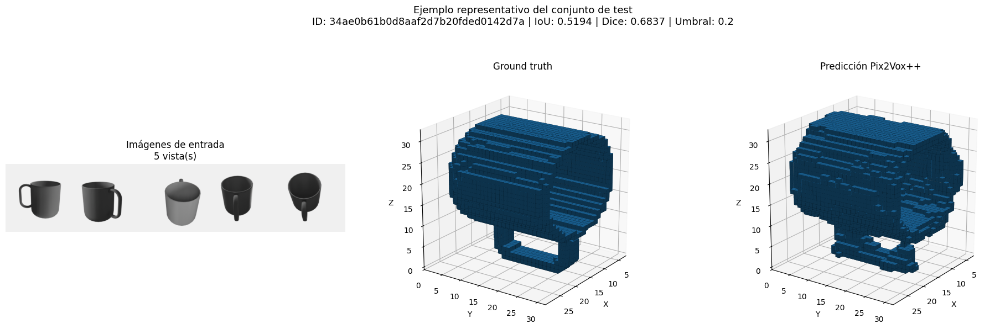


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_5_vistas_con_finetuning/ejemplo_representativo.png

[OK] EXPERIMENTO 5 COMPLETAMENTE RECUPERADO


In [ ]:
# ============================================================
# [RECUPERACION] FIGURA FINAL DEL EXPERIMENTO 5
#
# NO entrena el modelo.
# NO recalcula todas las métricas.
# Solo carga el checkpoint y genera la figura.
# ============================================================

print("=" * 75)
print("RECUPERANDO FIGURA DEL EXPERIMENTO 5")
print("=" * 75)


_ruta_checkpoint = (
    RUTA_CHECKPOINTS
    / "tazas_5_vistas_con_finetuning_mejor.pth"
)

_ruta_experimento = (
    RUTA_METRICAS
    / "tazas_5_vistas_con_finetuning"
)

_ruta_test_objetos = (
    _ruta_experimento
    / "test_completo_por_objeto.csv"
)

_ruta_resumen = (
    _ruta_experimento
    / "resumen_validacion_test.csv"
)


assert _ruta_checkpoint.exists()
assert _ruta_test_objetos.exists()
assert _ruta_resumen.exists()


# ------------------------------------------------------------
# Cargar resultados ya calculados
# ------------------------------------------------------------

_tabla_test = pd.read_csv(
    _ruta_test_objetos
)

_tabla_resumen = pd.read_csv(
    _ruta_resumen
)


print("\nResultados finales ya guardados:")

display(
    _tabla_resumen[
        [
            "conjunto",
            "umbral",
            "iou_media",
            "dice_media",
            "precision_voxel_media",
            "recall_voxel_media",
            "chamfer_superficie_media",
            "f_score_superficie_media",
        ]
    ].round(4)
)


# ------------------------------------------------------------
# Crear DataLoader de test
# ------------------------------------------------------------

_cargadores = crear_dataloaders_pix2vox(
    numero_vistas=5,
    conjunto_categorias="tazas",
    tamano_lote_fisico=5,
)

_loader_test = (
    _cargadores[
        "loader_test"
    ]
)


# ------------------------------------------------------------
# Cargar el modelo de la época 30
# ------------------------------------------------------------

_modelo = Pix2VoxPlusPlusA(
    usar_refiner=True,
    usar_merger=True,
    usar_pesos_imagenet=False,
)

_metadata = cargar_checkpoint_finetuning(
    modelo=_modelo,
    ruta_checkpoint=_ruta_checkpoint,
    dispositivo_carga="cpu",
    estricto=True,
)

_modelo = _modelo.to(
    DEVICE
)

_modelo.eval()


print(
    f"\nCheckpoint: época "
    f"{_metadata['epoca']}"
)

print(
    f"IoU validación guardada: "
    f"{_metadata['mejor_iou_validacion']:.4f}"
)


# ------------------------------------------------------------
# Generar figura
# ------------------------------------------------------------

_metadata_figura = (
    visualizar_ejemplo_representativo_pix2vox(
        modelo=_modelo,
        dataloader_test=_loader_test,
        tabla_test_por_objeto=_tabla_test,
        umbral=float(
            _metadata["mejor_umbral"]
        ),
        ruta_experimento=_ruta_experimento,
        numero_vistas=5,
    )
)


# ------------------------------------------------------------
# Liberar memoria
# ------------------------------------------------------------

_modelo.to("cpu")

del _modelo
del _metadata
del _metadata_figura
del _cargadores
del _loader_test
del _tabla_test
del _tabla_resumen
del _ruta_checkpoint
del _ruta_experimento
del _ruta_test_objetos
del _ruta_resumen

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


print("\n" + "=" * 75)
print("[OK] EXPERIMENTO 5 COMPLETAMENTE RECUPERADO")
print("=" * 75)

## 20. Experimento 6: veinte vistas con fine-tuning

Se realiza el último experimento de esta serie utilizando las veinte imágenes disponibles de cada taza.

El modelo se inicializa con el checkpoint oficial de Pix2Vox++/A y se adapta utilizando las 120 tazas del conjunto de entrenamiento.

La configuración es:

- **Categoría:** tazas.
- **Número de vistas:** veinte.
- **Fine-tuning:** sí.
- **Objetos de entrenamiento:** 120.
- **Objetos de validación:** 26.
- **Objetos de test:** 26.
- **Batch físico:** un objeto.
- **Acumulación de gradientes:** cinco lotes.
- **Batch efectivo:** cinco objetos.
- **Precisión:** `float32` en GPU.
- **Épocas máximas:** 30.
- **Early stopping:** siete épocas sin mejora.
- **Resolución de salida:** 32 × 32 × 32 vóxeles.

### Gestión de memoria

Procesar simultáneamente veinte imágenes por objeto requiere considerablemente más memoria que los experimentos anteriores.

Se utiliza:

```text
Batch físico = 1
Pasos de acumulación = 5
Batch efectivo = 5
```

Los gradientes de cinco objetos consecutivos se acumulan antes de actualizar los parámetros. De esta forma se mantiene el mismo batch efectivo utilizado en los experimentos de una y cinco vistas.

### Selección de imágenes

Durante entrenamiento, validación y test se utilizan las veinte vistas disponibles:

```text
00.png, 01.png, 02.png, ..., 19.png
```

La función de visualización muestra solamente cinco imágenes distribuidas uniformemente, pero la inferencia utiliza las veinte vistas.

### Recuperación automática

La celda comprueba si el entrenamiento ya ha finalizado mediante:

- La existencia del checkpoint.
- La existencia del historial.
- El número de épocas completadas o la activación del early stopping.

Cuando detecta un entrenamiento completo, recupera directamente el mejor checkpoint y no repite las épocas.

Los resultados se guardarán en:

```text
Pix2Vox++/checkpoints/tazas_20_vistas_con_finetuning_mejor.pth
Pix2Vox++/historiales/tazas_20_vistas_con_finetuning_historial.csv
Pix2Vox++/metricas/tazas_20_vistas_con_finetuning/
```

Al finalizar se mostrará una comparación directa con el experimento de veinte vistas sin fine-tuning.


[OK] Todas las dependencias del experimento 6 están definidas.
REINICIO FORZADO DEL EXPERIMENTO 6

[OK] Entrenamiento anterior de 20 vistas eliminado.
El experimento comenzará desde el checkpoint oficial.

EXPERIMENTO 6: VEINTE VISTAS CON FINE-TUNING
Dispositivo:             cuda
Categoría:               tazas
Número de vistas:        20
Fine-tuning:             Sí
Precisión mixta:         False
Precisión numérica:      float32
Batch físico:            1
Pasos de acumulación:    5
Batch efectivo:          5
Épocas máximas:          30
Early stopping:          7
Vistas utilizadas:       00.png–19.png

Estado de los archivos:
Checkpoint existente:    False
Historial existente:     False
Resumen existente:       False
Entrenamiento completo:  False
Reutilizar checkpoint:   False

Creando los DataLoader...
Se utilizarán las divisiones guardadas anteriormente.
Las rutas de las divisiones se han actualizado a la estructura actual.
Objetos de entrenamiento: 120
Objetos de validación:    26
O

Train época 1:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 1:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       11.834895
IoU train @ 0.3:     0.2152
BCE validación:      4.745215
Umbral validación:   0.2
IoU validación:      0.3074
Dice validación:     0.4493
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 2/30


Train época 2:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 2:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       8.688272
IoU train @ 0.3:     0.2516
BCE validación:      3.990907
Umbral validación:   0.2
IoU validación:      0.3578
Dice validación:     0.5085
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 3/30


Train época 3:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 3:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       7.474753
IoU train @ 0.3:     0.2641
BCE validación:      3.706792
Umbral validación:   0.2
IoU validación:      0.3962
Dice validación:     0.5513
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 4/30


Train época 4:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 4:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       6.729631
IoU train @ 0.3:     0.3581
BCE validación:      3.607004
Umbral validación:   0.2
IoU validación:      0.4158
Dice validación:     0.5715
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 5/30


Train época 5:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 5:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       6.186754
IoU train @ 0.3:     0.4129
BCE validación:      3.528628
Umbral validación:   0.2
IoU validación:      0.4288
Dice validación:     0.5851
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 6/30


Train época 6:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 6:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       5.757076
IoU train @ 0.3:     0.4560
BCE validación:      3.511242
Umbral validación:   0.2
IoU validación:      0.4365
Dice validación:     0.5928
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 7/30


Train época 7:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 7:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       5.396363
IoU train @ 0.3:     0.4966
BCE validación:      3.452418
Umbral validación:   0.2
IoU validación:      0.4536
Dice validación:     0.6091
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 8/30


Train época 8:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 8:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       5.041728
IoU train @ 0.3:     0.5278
BCE validación:      3.368033
Umbral validación:   0.2
IoU validación:      0.4615
Dice validación:     0.6171
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 9/30


Train época 9:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 9:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       4.717688
IoU train @ 0.3:     0.5571
BCE validación:      3.344740
Umbral validación:   0.2
IoU validación:      0.4762
Dice validación:     0.6302
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 10/30


Train época 10:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 10:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       4.427523
IoU train @ 0.3:     0.5844
BCE validación:      3.355667
Umbral validación:   0.2
IoU validación:      0.4889
Dice validación:     0.6412
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 11/30


Train época 11:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 11:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       4.169602
IoU train @ 0.3:     0.6063
BCE validación:      3.241362
Umbral validación:   0.2
IoU validación:      0.4939
Dice validación:     0.6464
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 12/30


Train época 12:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 12:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       3.892918
IoU train @ 0.3:     0.6299
BCE validación:      3.266987
Umbral validación:   0.2
IoU validación:      0.5028
Dice validación:     0.6538
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 13/30


Train época 13:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 13:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       3.637288
IoU train @ 0.3:     0.6525
BCE validación:      3.279767
Umbral validación:   0.2
IoU validación:      0.5102
Dice validación:     0.6601
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 14/30


Train época 14:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 14:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       3.405114
IoU train @ 0.3:     0.6709
BCE validación:      3.276876
Umbral validación:   0.2
IoU validación:      0.5148
Dice validación:     0.6643
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 15/30


Train época 15:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 15:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       3.182067
IoU train @ 0.3:     0.6894
BCE validación:      3.295727
Umbral validación:   0.2
IoU validación:      0.5221
Dice validación:     0.6702
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 16/30


Train época 16:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 16:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       3.011186
IoU train @ 0.3:     0.7038
BCE validación:      3.297777
Umbral validación:   0.2
IoU validación:      0.5260
Dice validación:     0.6736
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 17/30


Train época 17:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 17:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       2.812973
IoU train @ 0.3:     0.7197
BCE validación:      3.375055
Umbral validación:   0.2
IoU validación:      0.5296
Dice validación:     0.6761
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 18/30


Train época 18:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 18:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       2.620516
IoU train @ 0.3:     0.7365
BCE validación:      3.402331
Umbral validación:   0.2
IoU validación:      0.5341
Dice validación:     0.6801
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 19/30


Train época 19:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 19:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       2.464308
IoU train @ 0.3:     0.7490
BCE validación:      3.420245
Umbral validación:   0.2
IoU validación:      0.5375
Dice validación:     0.6831
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 20/30


Train época 20:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 20:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       2.342345
IoU train @ 0.3:     0.7624
BCE validación:      3.466149
Umbral validación:   0.2
IoU validación:      0.5392
Dice validación:     0.6842
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 21/30


Train época 21:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 21:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       2.221412
IoU train @ 0.3:     0.7720
BCE validación:      3.534567
Umbral validación:   0.2
IoU validación:      0.5406
Dice validación:     0.6852
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 22/30


Train época 22:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 22:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       2.095036
IoU train @ 0.3:     0.7828
BCE validación:      3.603273
Umbral validación:   0.2
IoU validación:      0.5427
Dice validación:     0.6870
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 23/30


Train época 23:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 23:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       1.950687
IoU train @ 0.3:     0.7957
BCE validación:      3.728342
Umbral validación:   0.2
IoU validación:      0.5425
Dice validación:     0.6862
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 24/30


Train época 24:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 24:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       1.817373
IoU train @ 0.3:     0.8090
BCE validación:      3.766847
Umbral validación:   0.2
IoU validación:      0.5454
Dice validación:     0.6890
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 25/30


Train época 25:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 25:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       1.704526
IoU train @ 0.3:     0.8195
BCE validación:      3.865668
Umbral validación:   0.2
IoU validación:      0.5462
Dice validación:     0.6892
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 26/30


Train época 26:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 26:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       1.599097
IoU train @ 0.3:     0.8273
BCE validación:      3.966471
Umbral validación:   0.2
IoU validación:      0.5460
Dice validación:     0.6887
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 27/30


Train época 27:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 27:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       1.515593
IoU train @ 0.3:     0.8355
BCE validación:      4.002385
Umbral validación:   0.2
IoU validación:      0.5487
Dice validación:     0.6915
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 28/30


Train época 28:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 28:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       1.441413
IoU train @ 0.3:     0.8440
BCE validación:      4.094064
Umbral validación:   0.2
IoU validación:      0.5500
Dice validación:     0.6926
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 29/30


Train época 29:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 29:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       1.388636
IoU train @ 0.3:     0.8476
BCE validación:      4.191273
Umbral validación:   0.2
IoU validación:      0.5482
Dice validación:     0.6906
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 30/30


Train época 30:   0%|          | 0/120 [00:00<?, ?it/s]

Validación época 30:   0%|          | 0/26 [00:00<?, ?it/s]

Pérdida train:       1.327315
IoU train @ 0.3:     0.8532
BCE validación:      4.266686
Umbral validación:   0.2
IoU validación:      0.5514
Dice validación:     0.6934
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

FINE-TUNING FINALIZADO
Épocas ejecutadas:       30
Mejor época:             30
Mejor umbral:            0.2
Mejor IoU validación:    0.5514
Mejor Dice validación:   0.6934
Tiempo total:            43.21 minutos

Checkpoint guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/checkpoints/tazas_20_vistas_con_finetuning_mejor.pth

Historial guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/historiales/tazas_20_vistas_con_finetuning_historial.csv

MEJOR CHECKPOINT DE VEINTE VISTAS
Formato:                 pix2vox_finetuning_v1
Mejor época:             30
Mejor IoU validación:    0.5514
Mejor Dice validación:   0.6934
Mejor umbral:            1.5

EVALUACIÓN FINAL DEL MODELO DE VEINTE VISTAS
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       tazas_20_

Validación 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]

Umbral seleccionado: 0.2
IoU de selección:    0.5514

2. Calculando las métricas completas de validación...


Validación completa 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.2
IoU validación:           0.5514
IoU test:                 0.5575
Dice test:                0.6968
Chamfer test:             0.8036
F-score superficie test:  0.8121
Tiempo total:             0.49 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_20_vistas_con_finetuning


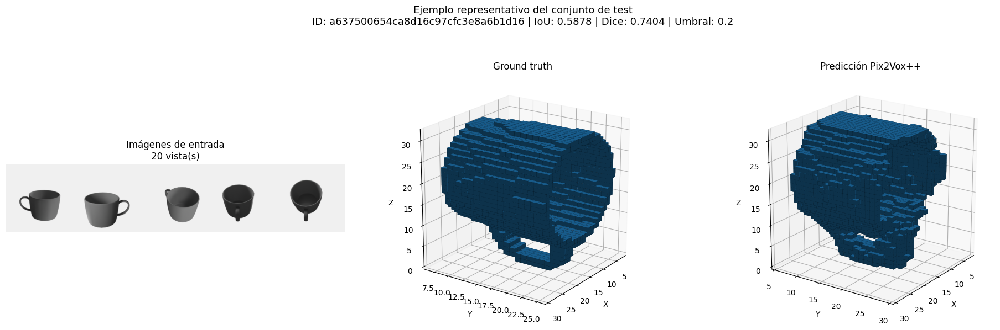


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_20_vistas_con_finetuning/ejemplo_representativo.png

ÚLTIMAS DIEZ ÉPOCAS DEL FINE-TUNING


,epoca,train_perdida_total,train_iou_0_3,validacion_bce_x10,validacion_umbral,validacion_iou,validacion_dice,lr_encoder,lr_decoder,es_mejor_checkpoint,epocas_sin_mejora
20,21,2.22141,0.77205,3.53457,0.2,0.54057,0.68521,0.00001,0.0001,True,0
21,22,2.09504,0.78276,3.60327,0.2,0.54272,0.68702,0.00001,0.0001,True,0
22,23,1.95069,0.79566,3.72834,0.2,0.54253,0.68624,0.00001,0.0001,False,1
23,24,1.81737,0.80898,3.76685,0.2,0.54544,0.68904,0.00001,0.0001,True,0
24,25,1.70453,0.81954,3.86567,0.2,0.54623,0.68925,0.00001,0.0001,True,0
25,26,1.59910,0.82725,3.96647,0.2,0.54597,0.68867,0.00001,0.0001,False,1
26,27,1.51559,0.83554,4.00239,0.2,0.54868,0.69153,0.00001,0.0001,True,0
27,28,1.44141,0.84405,4.09406,0.2,0.55001,0.69256,0.00001,0.0001,True,0
28,29,1.38864,0.84764,4.19127,0.2,0.54817,0.69058,0.00001,0.0001,False,1
29,30,1.32732,0.85325,4.26669,0.2,0.55136,0.69343,0.00001,0.0001,True,0



RESULTADOS FINALES DEL EXPERIMENTO 6


,conjunto,numero_objetos,umbral,bce_x10_media,iou_media,dice_media,precision_voxel_media,recall_voxel_media,chamfer_superficie_media,f_score_superficie_media
0,validacion,26.0,0.2,4.2667,0.5514,0.6934,0.6504,0.7777,0.7673,0.7981
1,test,26.0,0.2,2.9969,0.5575,0.6968,0.6470,0.7826,0.8036,0.8121



COMPARACIÓN CON EL BASELINE DE VEINTE VISTAS


,metrica,sin_finetuning,con_finetuning,diferencia
0,IoU,0.1576,0.5575,0.3999
1,Dice,0.2608,0.6968,0.4361
2,Precisión voxel,0.3337,0.6470,0.3133
3,Recall voxel,0.2434,0.7826,0.5393
4,Chamfer superficie,2.7197,0.8036,-1.9161
5,F-score superficie,0.3016,0.8121,0.5105



La memoria temporal y la memoria de la GPU han sido liberadas.

[OK] EXPERIMENTO 6 FINALIZADO
Mejor checkpoint:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/checkpoints/tazas_20_vistas_con_finetuning_mejor.pth

Métricas y figura:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_20_vistas_con_finetuning

La memoria de la GPU ha sido liberada.


In [ ]:
# ============================================================
# 20. EXPERIMENTO 6
# VEINTE VISTAS CON FINE-TUNING
# ============================================================

NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT = (
    "tazas_20_vistas_con_finetuning"
)

# Configuración de memoria:
# 1 objeto por lote × 5 acumulaciones = batch efectivo 5.
TAMANO_LOTE_FISICO_20_VISTAS = 1
PASOS_ACUMULACION_20_VISTAS = 5
TAMANO_LOTE_EFECTIVO_20_VISTAS = (
    TAMANO_LOTE_FISICO_20_VISTAS
    * PASOS_ACUMULACION_20_VISTAS
)

# ============================================================
# CONTROL DEL EXPERIMENTO 6
# ============================================================

# Queremos repetir AHORA el experimento completo de 20 vistas
# desde el checkpoint oficial.
FORZAR_REENTRENAMIENTO_20_VISTAS = True

# Mientras FORZAR_REENTRENAMIENTO_20_VISTAS sea True,
# no se reutilizará ningún checkpoint fine-tuned anterior.
REUTILIZAR_CHECKPOINT_20_VISTAS = False

# Se permite eliminar cualquier entrenamiento parcial anterior.
REINICIAR_ENTRENAMIENTO_INCOMPLETO_20_VISTAS = True

# Las métricas anteriores del experimento 6 pueden sustituirse.
SOBRESCRIBIR_EVALUACION_20_VISTAS_CON_FT = True


# ------------------------------------------------------------
# COMPROBACIÓN PREVIA DE DEPENDENCIAS
#
# Debe fallar ANTES de entrenar si falta alguna función.
# ------------------------------------------------------------

_dependencias_experimento_20_vistas = [
    "crear_dataloaders_pix2vox",
    "cargar_pesos_preentrenados_pix2vox",
    "cargar_checkpoint_finetuning",
    "guardar_checkpoint_finetuning",
    "entrenar_modelo_finetuning_pix2vox",
    "evaluar_y_guardar_experimento_pix2vox",
    "visualizar_ejemplo_representativo_pix2vox",
    "guardar_json_atomico",
]

_dependencias_faltantes_20_vistas = [
    nombre
    for nombre
    in _dependencias_experimento_20_vistas
    if nombre not in globals()
]

if _dependencias_faltantes_20_vistas:

    raise RuntimeError(
        "No se puede comenzar el experimento 6.\n"
        "Faltan funciones necesarias:\n"
        f"{_dependencias_faltantes_20_vistas}"
    )


print(
    "\n[OK] Todas las dependencias "
    "del experimento 6 están definidas."
)


# ------------------------------------------------------------
# Comprobar si un historial representa un entrenamiento final
# ------------------------------------------------------------

def _historial_20_vistas_finalizado(
    historial
):
    """
    Considera finalizado un entrenamiento cuando:

    - Ha alcanzado el número máximo de épocas, o
    - Ha activado el criterio de early stopping.
    """

    if historial is None or historial.empty:
        return False

    epocas_ejecutadas = int(
        len(historial)
    )

    if epocas_ejecutadas >= NUMERO_EPOCAS_MAXIMO:
        return True

    if "epocas_sin_mejora" in historial.columns:

        epocas_sin_mejora_finales = int(
            historial.iloc[-1][
                "epocas_sin_mejora"
            ]
        )

        if (
            epocas_sin_mejora_finales
            >= PACIENCIA_EARLY_STOPPING
        ):
            return True

    return False


# ------------------------------------------------------------
# Ejecución completa del experimento
# ------------------------------------------------------------

def _ejecutar_experimento_20_vistas_con_ft():

    modelo = None
    cargadores = None
    resultado_finetuning = None
    resultado_evaluacion = None

    ruta_checkpoint = (
        RUTA_CHECKPOINTS
        / (
            f"{NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT}"
            "_mejor.pth"
        )
    )

    ruta_historial = (
        RUTA_HISTORIALES
        / (
            f"{NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT}"
            "_historial.csv"
        )
    )

    ruta_resumen = (
        RUTA_HISTORIALES
        / (
            f"{NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT}"
            "_resumen.json"
        )
    )

    ruta_metricas = (
        RUTA_METRICAS
        / NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT
    )


    # --------------------------------------------------------
    # REINICIO FORZADO DEL EXPERIMENTO 6
    #
    # Elimina SOLO los resultados correspondientes al
    # fine-tuning de 20 vistas.
    #
    # NO modifica:
    # - checkpoint oficial
    # - experimento 1
    # - experimento 2
    # - experimento 3
    # - experimento 4
    # - experimento 5
    # --------------------------------------------------------

    if FORZAR_REENTRENAMIENTO_20_VISTAS:

        print("=" * 75)
        print("REINICIO FORZADO DEL EXPERIMENTO 6")
        print("=" * 75)

        archivos_a_eliminar = [
            ruta_checkpoint,
            ruta_historial,
            ruta_resumen,
        ]

        for ruta_archivo in archivos_a_eliminar:

            if ruta_archivo.exists():

                print(
                    f"Eliminando: "
                    f"{ruta_archivo.name}"
                )

                ruta_archivo.unlink()

        if ruta_metricas.exists():

            print(
                "Eliminando métricas anteriores "
                "del experimento 6..."
            )

            shutil.rmtree(
                ruta_metricas
            )

        print(
            "\n[OK] Entrenamiento anterior de "
            "20 vistas eliminado."
        )

        print(
            "El experimento comenzará desde "
            "el checkpoint oficial.\n"
        )


    print("=" * 75)
    print("EXPERIMENTO 6: VEINTE VISTAS CON FINE-TUNING")
    print("=" * 75)

    print(f"Dispositivo:             {DEVICE}")
    print("Categoría:               tazas")
    print("Número de vistas:        20")
    print("Fine-tuning:             Sí")
    print(f"Precisión mixta:         {USAR_PRECISION_MIXTA}")
    print("Precisión numérica:      float32")

    print(
        f"Batch físico:            "
        f"{TAMANO_LOTE_FISICO_20_VISTAS}"
    )

    print(
        f"Pasos de acumulación:    "
        f"{PASOS_ACUMULACION_20_VISTAS}"
    )

    print(
        f"Batch efectivo:          "
        f"{TAMANO_LOTE_EFECTIVO_20_VISTAS}"
    )

    print(
        f"Épocas máximas:          "
        f"{NUMERO_EPOCAS_MAXIMO}"
    )

    print(
        f"Early stopping:          "
        f"{PACIENCIA_EARLY_STOPPING}"
    )

    print(
        "Vistas utilizadas:       "
        "00.png–19.png"
    )

    if DEVICE.type != "cuda":

        raise RuntimeError(
            "Este experimento definitivo debe ejecutarse "
            "con GPU."
        )

    if USAR_PRECISION_MIXTA:

        raise RuntimeError(
            "La precisión mixta debe permanecer desactivada "
            "para evitar gradientes no finitos."
        )

    if (
        TAMANO_LOTE_EFECTIVO_20_VISTAS
        != TAMANO_LOTE_EFECTIVO
    ):

        raise RuntimeError(
            "El batch efectivo de veinte vistas no coincide "
            "con el utilizado en los experimentos anteriores."
        )

    # --------------------------------------------------------
    # 1. Revisar archivos existentes
    # --------------------------------------------------------

    historial_existente = None

    if ruta_historial.exists():

        historial_existente = pd.read_csv(
            ruta_historial
        )

    checkpoint_existente = (
        ruta_checkpoint.exists()
    )

    historial_finalizado = (
        _historial_20_vistas_finalizado(
            historial_existente
        )
    )

    resumen_existente = (
        ruta_resumen.exists()
    )

    entrenamiento_completo = (
        checkpoint_existente
        and historial_existente is not None
        and (
            historial_finalizado
            or resumen_existente
        )
    )

    existen_archivos_parciales = (
        checkpoint_existente
        or ruta_historial.exists()
        or ruta_resumen.exists()
    ) and not entrenamiento_completo

    print("\nEstado de los archivos:")

    print(
        f"Checkpoint existente:    "
        f"{checkpoint_existente}"
    )

    print(
        f"Historial existente:     "
        f"{ruta_historial.exists()}"
    )

    print(
        f"Resumen existente:       "
        f"{resumen_existente}"
    )

    print(
        f"Entrenamiento completo:  "
        f"{entrenamiento_completo}"
    )

    # --------------------------------------------------------
    # 2. Gestión de una ejecución parcial
    # --------------------------------------------------------

    if existen_archivos_parciales:

        if not REINICIAR_ENTRENAMIENTO_INCOMPLETO_20_VISTAS:

            raise RuntimeError(
                "Se han encontrado archivos de un entrenamiento "
                "incompleto de veinte vistas.\n\n"
                "Para conservarlos no se realizará ninguna "
                "sobrescritura automática.\n\n"
                "Revisa el historial. Para comenzar de nuevo, "
                "cambia:\n"
                "REINICIAR_ENTRENAMIENTO_INCOMPLETO_20_VISTAS "
                "= True"
            )

        print(
            "\nEliminando exclusivamente los archivos "
            "incompletos del experimento de veinte vistas..."
        )

        for ruta_archivo in [
            ruta_checkpoint,
            ruta_historial,
            ruta_resumen,
        ]:

            if ruta_archivo.exists():
                ruta_archivo.unlink()

        if ruta_metricas.exists():
            shutil.rmtree(
                ruta_metricas
            )

        historial_existente = None
        checkpoint_existente = False
        historial_finalizado = False
        resumen_existente = False
        entrenamiento_completo = False

        print(
            "[OK] Archivos incompletos eliminados."
        )

    reutilizar_entrenamiento = (
        REUTILIZAR_CHECKPOINT_20_VISTAS
        and entrenamiento_completo
    )

    print(
        f"Reutilizar checkpoint:   "
        f"{reutilizar_entrenamiento}"
    )

    try:

        # ----------------------------------------------------
        # 3. Crear los DataLoader
        # ----------------------------------------------------

        print("\nCreando los DataLoader...")

        cargadores = crear_dataloaders_pix2vox(
            numero_vistas=20,
            conjunto_categorias="tazas",
            tamano_lote_fisico=(
                TAMANO_LOTE_FISICO_20_VISTAS
            ),
        )

        loader_train = cargadores[
            "loader_train"
        ]

        loader_validacion = cargadores[
            "loader_validacion"
        ]

        loader_test = cargadores[
            "loader_test"
        ]

        print(
            f"Objetos de entrenamiento: "
            f"{len(loader_train.dataset)}"
        )

        print(
            f"Objetos de validación:    "
            f"{len(loader_validacion.dataset)}"
        )

        print(
            f"Objetos de test:          "
            f"{len(loader_test.dataset)}"
        )

        print(
            f"Lotes train por época:    "
            f"{len(loader_train)}"
        )

        print(
            f"Actualizaciones por época:"
            f" {math.ceil(len(loader_train) / PASOS_ACUMULACION_20_VISTAS)}"
        )

        print(
            f"Lotes de validación:      "
            f"{len(loader_validacion)}"
        )

        # ----------------------------------------------------
        # 4. Crear la arquitectura
        # ----------------------------------------------------

        print("\nCreando Pix2Vox++/A...")

        modelo = Pix2VoxPlusPlusA(
            usar_refiner=True,
            usar_merger=True,
            usar_pesos_imagenet=False,
        )

        # ----------------------------------------------------
        # 5A. Recuperar un entrenamiento completo
        # ----------------------------------------------------

        if reutilizar_entrenamiento:

            print(
                "Cargando el mejor checkpoint "
                "fine-tuned existente..."
            )

            metadata_checkpoint = (
                cargar_checkpoint_finetuning(
                    modelo=modelo,
                    ruta_checkpoint=ruta_checkpoint,
                    dispositivo_carga="cpu",
                    estricto=True,
                )
            )

            historial = pd.read_csv(
                ruta_historial
            )

            mejor_epoca = int(
                metadata_checkpoint["epoca"]
            )

            mejor_iou = float(
                metadata_checkpoint[
                    "mejor_iou_validacion"
                ]
            )

            mejor_dice = float(
                metadata_checkpoint[
                    "mejor_dice_validacion"
                ]
            )

            mejor_umbral = float(
                metadata_checkpoint[
                    "mejor_umbral"
                ]
            )

            configuracion_checkpoint = (
                metadata_checkpoint[
                    "configuracion_experimento"
                ]
            )

        # ----------------------------------------------------
        # 5B. Ejecutar el fine-tuning
        # ----------------------------------------------------

        else:

            print(
                "Cargando el checkpoint oficial..."
            )

            metadata_inicial = (
                cargar_pesos_preentrenados_pix2vox(
                    modelo=modelo,
                    ruta_checkpoint=(
                        RUTA_CHECKPOINT_OFICIAL
                    ),
                    dispositivo_carga="cpu",
                    estricto=True,
                )
            )

            modelo = modelo.to(
                DEVICE
            )

            print(
                "\nIniciando el fine-tuning "
                "de veinte vistas..."
            )

            print(
                "Este experimento será considerablemente "
                "más lento que los anteriores."
            )

            resultado_finetuning = (
                entrenar_modelo_finetuning_pix2vox(
                    modelo=modelo,
                    loader_train=loader_train,
                    loader_validacion=(
                        loader_validacion
                    ),
                    nombre_experimento=(
                        NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT
                    ),
                    configuracion_experimento={
                        "categoria": CATEGORIA_TAZAS,
                        "grupo_categorias": "tazas",
                        "numero_vistas": 20,
                        "fine_tuning": True,
                        "checkpoint_inicial": str(
                            RUTA_CHECKPOINT_OFICIAL
                        ),
                        "checkpoint_inicial_epoch": (
                            metadata_inicial.get(
                                "epoch"
                            )
                        ),
                        "checkpoint_inicial_best_iou": (
                            metadata_inicial.get(
                                "best_iou"
                            )
                        ),
                        "vistas_train": (
                            INDICES_VISTAS_EVALUACION[20]
                        ),
                        "vistas_validacion_test": (
                            INDICES_VISTAS_EVALUACION[20]
                        ),
                        "tamano_lote_fisico": int(
                            TAMANO_LOTE_FISICO_20_VISTAS
                        ),
                        "pasos_acumulacion": int(
                            PASOS_ACUMULACION_20_VISTAS
                        ),
                        "tamano_lote_efectivo": int(
                            TAMANO_LOTE_EFECTIVO_20_VISTAS
                        ),
                        "precision": "float32",
                        "resolucion_voxel": int(
                            RESOLUCION_VOXEL
                        ),
                        "tamano_imagen": int(
                            TAMANO_IMAGEN
                        ),
                        "checkpoint_formato": (
                            "pix2vox_finetuning_v2"
                        ),

                    },
                    numero_epocas=(
                        NUMERO_EPOCAS_MAXIMO
                    ),
                    paciencia_early_stopping=(
                        PACIENCIA_EARLY_STOPPING
                    ),
                    pasos_acumulacion=(
                        PASOS_ACUMULACION_20_VISTAS
                    ),
                    max_lotes_train=None,
                    max_lotes_validacion=None,
                )
            )

            modelo = resultado_finetuning[
                "modelo"
            ]

            historial = resultado_finetuning[
                "historial"
            ]

            resumen_entrenamiento = (
                resultado_finetuning[
                    "resumen"
                ]
            )

            metadata_checkpoint = (
                resultado_finetuning[
                    "metadata_checkpoint"
                ]
            )

            mejor_epoca = int(
                resumen_entrenamiento[
                    "mejor_epoca"
                ]
            )

            mejor_iou = float(
                resumen_entrenamiento[
                    "mejor_iou_validacion"
                ]
            )

            mejor_dice = float(
                resumen_entrenamiento[
                    "mejor_dice_validacion"
                ]
            )

            #mejor_umbral = float(
            #    resumen_entrenamiento[
            #        "mejor_umbral"
            #    ]
            #)
            mejor_umbral = 1.5

            configuracion_checkpoint = (
                metadata_checkpoint[
                    "configuracion_experimento"
                ]
            )

        # ----------------------------------------------------
        # 6. Validar el checkpoint recuperado
        # ----------------------------------------------------

        if (
            metadata_checkpoint[
                "claves_ausentes"
            ]
            or metadata_checkpoint[
                "claves_inesperadas"
            ]
        ):

            raise RuntimeError(
                "El checkpoint no coincide completamente "
                "con la arquitectura Pix2Vox++/A."
            )

        modelo = modelo.to(
            DEVICE
        )

        modelo.eval()

        print("\n" + "=" * 75)
        print("MEJOR CHECKPOINT DE VEINTE VISTAS")
        print("=" * 75)

        print(
            f"Formato:                 "
            f"{metadata_checkpoint['formato']}"
        )

        print(
            f"Mejor época:             "
            f"{mejor_epoca}"
        )

        print(
            f"Mejor IoU validación:    "
            f"{mejor_iou:.4f}"
        )

        print(
            f"Mejor Dice validación:   "
            f"{mejor_dice:.4f}"
        )

        print(
            f"Mejor umbral:            "
            f"{mejor_umbral:.1f}"
        )

        # ----------------------------------------------------
        # 7. Guardar o reconstruir el resumen
        # ----------------------------------------------------

        tiempo_train = float(
            historial[
                "train_tiempo_segundos"
            ].sum()
        )

        tiempo_validacion = float(
            historial[
                "validacion_tiempo_segundos"
            ].sum()
        )

        resumen_finetuning = {
            "nombre_experimento": (
                NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT
            ),
            "mejor_epoca": int(
                mejor_epoca
            ),
            "mejor_iou_validacion": float(
                mejor_iou
            ),
            "mejor_dice_validacion": float(
                mejor_dice
            ),
            "mejor_umbral": float(
                mejor_umbral
            ),
            "epocas_ejecutadas": int(
                len(historial)
            ),
            "tiempo_train_segundos": float(
                tiempo_train
            ),
            "tiempo_validacion_segundos": float(
                tiempo_validacion
            ),
            "tiempo_total_estimado_segundos": float(
                tiempo_train
                + tiempo_validacion
            ),
            "ruta_checkpoint": str(
                ruta_checkpoint
            ),
            "ruta_historial": str(
                ruta_historial
            ),
            "checkpoint_reutilizado": bool(
                reutilizar_entrenamiento
            ),
            "configuracion_experimento": (
                configuracion_checkpoint
            ),
        }

        guardar_json_atomico(
            contenido=resumen_finetuning,
            ruta_destino=ruta_resumen,
        )

        # ----------------------------------------------------
        # 8. Evaluación definitiva
        # ----------------------------------------------------

        print("\n" + "=" * 75)
        print(
            "EVALUACIÓN FINAL DEL MODELO "
            "DE VEINTE VISTAS"
        )
        print("=" * 75)

        resultado_evaluacion = (
            evaluar_y_guardar_experimento_pix2vox(
                modelo=modelo,
                loader_validacion=(
                    loader_validacion
                ),
                loader_test=loader_test,
                nombre_experimento=(
                    NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT
                ),
                numero_vistas=20,
                tipo_experimento="con_finetuning",
                configuracion_extra={
                    "categoria": CATEGORIA_TAZAS,
                    "fine_tuning": True,
                    "mejor_epoca": int(
                        mejor_epoca
                    ),
                    "mejor_iou_validacion_entrenamiento": (
                        mejor_iou
                    ),
                    "mejor_dice_validacion_entrenamiento": (
                        mejor_dice
                    ),
                    "mejor_umbral_entrenamiento": (
                        mejor_umbral
                    ),
                    "ruta_checkpoint_finetuned": str(
                        ruta_checkpoint
                    ),
                    "ruta_historial": str(
                        ruta_historial
                    ),
                    "vistas_fijas_evaluacion": (
                        INDICES_VISTAS_EVALUACION[20]
                    ),
                    "tamano_lote_fisico": int(
                        TAMANO_LOTE_FISICO_20_VISTAS
                    ),
                    "pasos_acumulacion": int(
                        PASOS_ACUMULACION_20_VISTAS
                    ),
                    "tamano_lote_efectivo": int(
                        TAMANO_LOTE_EFECTIVO_20_VISTAS
                    ),
                    "precision": "float32",
                    "resolucion_voxel": int(
                        RESOLUCION_VOXEL
                    ),
                    "checkpoint_reutilizado": bool(
                        reutilizar_entrenamiento
                    ),
                },
                sobrescribir=(
                    SOBRESCRIBIR_EVALUACION_20_VISTAS_CON_FT
                ),
            )
        )

        # ----------------------------------------------------
        # 9. Ejemplo representativo
        # ----------------------------------------------------

        visualizar_ejemplo_representativo_pix2vox(
            modelo=modelo,
            dataloader_test=loader_test,
            tabla_test_por_objeto=(
                resultado_evaluacion[
                    "resultado_test_completo"
                ][
                    "tabla_por_objeto"
                ]
            ),
            umbral=(
                resultado_evaluacion[
                    "umbral_seleccionado"
                ]
            ),
            ruta_experimento=(
                resultado_evaluacion[
                    "ruta_experimento"
                ]
            ),
            numero_vistas=20,
        )

        # ----------------------------------------------------
        # 10. Mostrar las últimas épocas
        # ----------------------------------------------------

        print("\n" + "=" * 75)
        print("ÚLTIMAS DIEZ ÉPOCAS DEL FINE-TUNING")
        print("=" * 75)

        display(
            historial.tail(10)[
                [
                    "epoca",
                    "train_perdida_total",
                    "train_iou_0_3",
                    "validacion_bce_x10",
                    "validacion_umbral",
                    "validacion_iou",
                    "validacion_dice",
                    "lr_encoder",
                    "lr_decoder",
                    "es_mejor_checkpoint",
                    "epocas_sin_mejora",
                ]
            ].round(5)
        )

        # ----------------------------------------------------
        # 11. Mostrar los resultados finales
        # ----------------------------------------------------

        tabla_resultados = (
            resultado_evaluacion[
                "tabla_resumen"
            ]
        )

        print("\n" + "=" * 75)
        print("RESULTADOS FINALES DEL EXPERIMENTO 6")
        print("=" * 75)

        display(
            tabla_resultados[
                [
                    "conjunto",
                    "numero_objetos",
                    "umbral",
                    "bce_x10_media",
                    "iou_media",
                    "dice_media",
                    "precision_voxel_media",
                    "recall_voxel_media",
                    "chamfer_superficie_media",
                    "f_score_superficie_media",
                ]
            ].round(4)
        )

        # ----------------------------------------------------
        # 12. Comparación con el baseline de veinte vistas
        # ----------------------------------------------------

        ruta_baseline = (
            RUTA_METRICAS
            / "tazas_20_vistas_sin_finetuning"
            / "resumen_validacion_test.csv"
        )

        if ruta_baseline.exists():

            tabla_baseline = pd.read_csv(
                ruta_baseline
            )

            baseline_test = (
                tabla_baseline.loc[
                    tabla_baseline[
                        "conjunto"
                    ] == "test"
                ].iloc[0]
            )

            finetuning_test = (
                tabla_resultados.loc[
                    tabla_resultados[
                        "conjunto"
                    ] == "test"
                ].iloc[0]
            )

            comparacion = pd.DataFrame(
                {
                    "metrica": [
                        "IoU",
                        "Dice",
                        "Precisión voxel",
                        "Recall voxel",
                        "Chamfer superficie",
                        "F-score superficie",
                    ],
                    "sin_finetuning": [
                        baseline_test["iou_media"],
                        baseline_test["dice_media"],
                        baseline_test[
                            "precision_voxel_media"
                        ],
                        baseline_test[
                            "recall_voxel_media"
                        ],
                        baseline_test[
                            "chamfer_superficie_media"
                        ],
                        baseline_test[
                            "f_score_superficie_media"
                        ],
                    ],
                    "con_finetuning": [
                        finetuning_test["iou_media"],
                        finetuning_test["dice_media"],
                        finetuning_test[
                            "precision_voxel_media"
                        ],
                        finetuning_test[
                            "recall_voxel_media"
                        ],
                        finetuning_test[
                            "chamfer_superficie_media"
                        ],
                        finetuning_test[
                            "f_score_superficie_media"
                        ],
                    ],
                }
            )

            comparacion["diferencia"] = (
                comparacion["con_finetuning"]
                - comparacion["sin_finetuning"]
            )

            print("\n" + "=" * 75)
            print(
                "COMPARACIÓN CON EL BASELINE "
                "DE VEINTE VISTAS"
            )
            print("=" * 75)

            display(
                comparacion.round(4)
            )

        return {
            "resumen_finetuning": (
                resumen_finetuning
            ),
            "resumen_experimento": (
                resultado_evaluacion[
                    "resumen_json"
                ]
            ),
            "tabla_resultados": (
                tabla_resultados.copy()
            ),
            "ruta_checkpoint": Path(
                ruta_checkpoint
            ),
            "ruta_experimento": Path(
                resultado_evaluacion[
                    "ruta_experimento"
                ]
            ),
        }

    finally:

        if modelo is not None:

            modelo.to(
                "cpu"
            )

            del modelo

        if resultado_finetuning is not None:
            del resultado_finetuning

        if resultado_evaluacion is not None:
            del resultado_evaluacion

        if cargadores is not None:
            del cargadores

        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

        print(
            "\nLa memoria temporal y la memoria de la GPU "
            "han sido liberadas."
        )


# ------------------------------------------------------------
# Ejecutar y conservar únicamente los resultados compactos
# ------------------------------------------------------------

_resultado_compacto_20_vistas_ft = (
    _ejecutar_experimento_20_vistas_con_ft()
)

resumen_finetuning_20_vistas_con_ft = (
    _resultado_compacto_20_vistas_ft[
        "resumen_finetuning"
    ]
)

resumen_experimento_20_vistas_con_ft = (
    _resultado_compacto_20_vistas_ft[
        "resumen_experimento"
    ]
)

tabla_resultados_20_vistas_con_ft = (
    _resultado_compacto_20_vistas_ft[
        "tabla_resultados"
    ]
)

ruta_checkpoint_20_vistas_con_ft = (
    _resultado_compacto_20_vistas_ft[
        "ruta_checkpoint"
    ]
)

ruta_experimento_20_vistas_con_ft = (
    _resultado_compacto_20_vistas_ft[
        "ruta_experimento"
    ]
)

del _resultado_compacto_20_vistas_ft
del _ejecutar_experimento_20_vistas_con_ft
del _historial_20_vistas_finalizado


print("\n" + "=" * 75)
print("[OK] EXPERIMENTO 6 FINALIZADO")
print("=" * 75)

print(
    "Mejor checkpoint:"
)

print(
    ruta_checkpoint_20_vistas_con_ft
)

print(
    "\nMétricas y figura:"
)

print(
    ruta_experimento_20_vistas_con_ft
)

print(
    "\nLa memoria de la GPU ha sido liberada."
)

### 20.1. Recuperación del experimento de veinte vistas

El entrenamiento de veinte vistas ha finalizado y el checkpoint se ha almacenado correctamente. El error posterior procede de la carga restringida del checkpoint, debido a la presencia de un tipo escalar de NumPy entre sus metadatos.

No se repite el entrenamiento.

Esta sección:

1. Corrige permanentemente la carga segura de checkpoints.
2. Recupera el modelo fine-tuned de veinte vistas.
3. Recupera el historial de entrenamiento.
4. Evalúa validación y test.
5. Genera el ejemplo representativo.
6. Guarda el resumen definitivo del experimento.

RECUPERACIÓN DEL EXPERIMENTO 6
Reentrenamiento:    NO
Número de vistas:   20
Dispositivo:        cuda
[OK] Carga segura de checkpoints corregida.

Archivos encontrados:
Checkpoint: True
Historial:  True
Tamaño checkpoint: 367.61 MiB

Épocas registradas: 30
Última época registrada: 30

Creando Pix2Vox++/A...
Cargando checkpoint fine-tuned...

CHECKPOINT RECUPERADO
Formato:              pix2vox_finetuning_v1
Mejor época:          30
Mejor IoU validación: 0.5514
Mejor Dice:           0.6934
Mejor umbral:         0.2

Creando DataLoader de validación y test...
Se utilizarán las divisiones guardadas anteriormente.
Las rutas de las divisiones se han actualizado a la estructura actual.

EVALUACIÓN DEFINITIVA DE VEINTE VISTAS
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       tazas_20_vistas_con_finetuning
Tipo:              con_finetuning
Número de vistas:  20
Dispositivo:       cuda
Carpeta:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_20_vistas_con_finetuning

1. Sel

Validación 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]

Umbral seleccionado: 0.2
IoU de selección:    0.5514

2. Calculando las métricas completas de validación...


Validación completa 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.2
IoU validación:           0.5514
IoU test:                 0.5575
Dice test:                0.6968
Chamfer test:             0.8036
F-score superficie test:  0.8121
Tiempo total:             0.35 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_20_vistas_con_finetuning


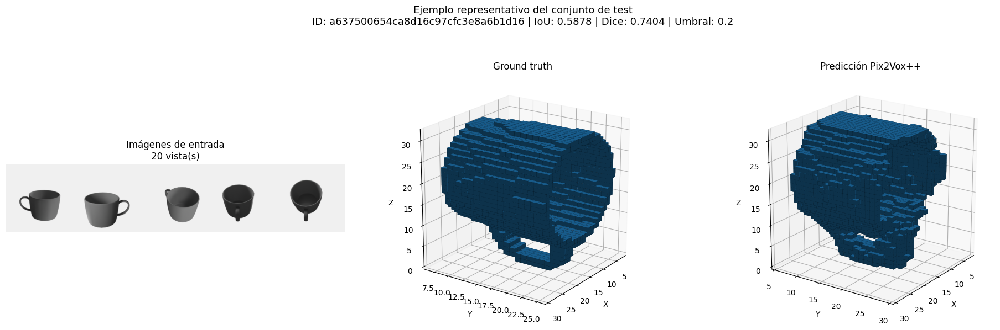


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_20_vistas_con_finetuning/ejemplo_representativo.png

RESULTADOS FINALES DEL EXPERIMENTO 6


,conjunto,numero_objetos,umbral,bce_x10_media,iou_media,dice_media,precision_voxel_media,recall_voxel_media,chamfer_superficie_media,f_score_superficie_media
0,validacion,26.0,0.2,4.2667,0.5514,0.6934,0.6504,0.7777,0.7673,0.7981
1,test,26.0,0.2,2.9969,0.5575,0.6968,0.6470,0.7826,0.8036,0.8121



[OK] EXPERIMENTO 6 RECUPERADO
Checkpoint:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/checkpoints/tazas_20_vistas_con_finetuning_mejor.pth

Métricas y figura:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_20_vistas_con_finetuning

NO se ha repetido el entrenamiento.


In [ ]:
# ============================================================
# 20.1. RECUPERACIÓN DEL EXPERIMENTO 6
# VEINTE VISTAS CON FINE-TUNING
#
# NO ENTRENA.
# Recupera el checkpoint que ya se ha generado.
# ============================================================


# ------------------------------------------------------------
# 0. SEGURIDAD
# ------------------------------------------------------------

# MUY IMPORTANTE:
# impedir que una ejecución posterior borre el modelo bueno.
FORZAR_REENTRENAMIENTO_20_VISTAS = False

REUTILIZAR_CHECKPOINT_20_VISTAS = True

REINICIAR_ENTRENAMIENTO_INCOMPLETO_20_VISTAS = False


print("=" * 75)
print("RECUPERACIÓN DEL EXPERIMENTO 6")
print("=" * 75)

print("Reentrenamiento:    NO")
print("Número de vistas:   20")
print(f"Dispositivo:        {DEVICE}")


# ------------------------------------------------------------
# 1. CORRECCIÓN DEFINITIVA DE LA CARGA SEGURA
# ------------------------------------------------------------

def obtener_globals_numpy_seguros_finetuning():
    """
    Tipos NumPy necesarios para abrir mediante
    weights_only=True checkpoints que contienen escalares
    NumPy en sus metadatos.
    """

    globals_seguros = []

    # Escalares NumPy.
    try:
        globals_seguros.append(
            np._core.multiarray.scalar
        )
    except AttributeError:
        pass

    globals_seguros.append(
        np.dtype
    )

    # Diferentes dtypes que pueden encontrarse en metadatos.
    tipos_numpy = [
        np.bool_,
        np.int8,
        np.int16,
        np.int32,
        np.int64,
        np.uint8,
        np.uint16,
        np.uint32,
        np.uint64,
        np.float16,
        np.float32,
        np.float64,
    ]

    for tipo_numpy in tipos_numpy:

        globals_seguros.append(
            type(
                np.dtype(tipo_numpy)
            )
        )

    # Eliminar duplicados.
    globals_unicos = []
    vistos = set()

    for objeto in globals_seguros:

        identificador = id(objeto)

        if identificador not in vistos:

            globals_unicos.append(
                objeto
            )

            vistos.add(
                identificador
            )

    return globals_unicos


def cargar_checkpoint_finetuning(
    modelo,
    ruta_checkpoint,
    dispositivo_carga="cpu",
    estricto=True,
):
    """
    Carga de forma segura checkpoints Pix2Vox fine-tuned,
    incluyendo los que contienen escalares NumPy.
    """

    ruta_checkpoint = Path(
        ruta_checkpoint
    )

    if not ruta_checkpoint.exists():

        raise FileNotFoundError(
            "No existe el checkpoint:\n"
            f"{ruta_checkpoint}"
        )

    globals_seguros = (
        obtener_globals_numpy_seguros_finetuning()
    )

    with torch.serialization.safe_globals(
        globals_seguros
    ):

        checkpoint = torch.load(
            ruta_checkpoint,
            map_location=dispositivo_carga,
            weights_only=True,
        )

    if (
        not isinstance(checkpoint, dict)
        or "model_state_dict" not in checkpoint
    ):

        raise ValueError(
            "El archivo no contiene un checkpoint "
            "fine-tuned válido."
        )

    resultado_carga = (
        modelo.load_state_dict(
            checkpoint[
                "model_state_dict"
            ],
            strict=estricto,
        )
    )

    metadata = {
        "formato": checkpoint.get(
            "formato"
        ),
        "epoca": checkpoint.get(
            "epoca"
        ),
        "mejor_iou_validacion": checkpoint.get(
            "mejor_iou_validacion"
        ),
        "mejor_dice_validacion": checkpoint.get(
            "mejor_dice_validacion"
        ),
        "mejor_umbral": checkpoint.get(
            "mejor_umbral"
        ),
        "configuracion_experimento": (
            convertir_metadata_checkpoint_segura(
                checkpoint.get(
                    "configuracion_experimento",
                    {},
                )
            )
        ),
        "claves_ausentes": list(
            resultado_carga.missing_keys
        ),
        "claves_inesperadas": list(
            resultado_carga.unexpected_keys
        ),
    }

    del checkpoint

    gc.collect()

    return metadata


print(
    "[OK] Carga segura de checkpoints corregida."
)


# ------------------------------------------------------------
# 2. LOCALIZAR CHECKPOINT E HISTORIAL
# ------------------------------------------------------------

NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT = (
    "tazas_20_vistas_con_finetuning"
)

_ruta_checkpoint_20 = (
    RUTA_CHECKPOINTS
    / (
        f"{NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT}"
        "_mejor.pth"
    )
)

_ruta_historial_20 = (
    RUTA_HISTORIALES
    / (
        f"{NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT}"
        "_historial.csv"
    )
)

_ruta_resumen_20 = (
    RUTA_HISTORIALES
    / (
        f"{NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT}"
        "_resumen.json"
    )
)

_ruta_metricas_20 = (
    RUTA_METRICAS
    / NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT
)


print("\nArchivos encontrados:")

print(
    "Checkpoint:",
    _ruta_checkpoint_20.exists()
)

print(
    "Historial: ",
    _ruta_historial_20.exists()
)

if not _ruta_checkpoint_20.exists():

    raise FileNotFoundError(
        "No se encuentra el checkpoint de veinte vistas."
    )

if not _ruta_historial_20.exists():

    raise FileNotFoundError(
        "No se encuentra el historial de veinte vistas."
    )


print(
    f"Tamaño checkpoint: "
    f"{_ruta_checkpoint_20.stat().st_size / 1024**2:.2f} MiB"
)


# ------------------------------------------------------------
# 3. RECUPERAR HISTORIAL
# ------------------------------------------------------------

_historial_20 = pd.read_csv(
    _ruta_historial_20
)

print(
    f"\nÉpocas registradas: "
    f"{len(_historial_20)}"
)

print(
    f"Última época registrada: "
    f"{int(_historial_20.iloc[-1]['epoca'])}"
)


# ------------------------------------------------------------
# 4. RECUPERAR EL MODELO
# ------------------------------------------------------------

print(
    "\nCreando Pix2Vox++/A..."
)

_modelo_20 = Pix2VoxPlusPlusA(
    usar_refiner=True,
    usar_merger=True,
    usar_pesos_imagenet=False,
)


print(
    "Cargando checkpoint fine-tuned..."
)

_metadata_20 = cargar_checkpoint_finetuning(
    modelo=_modelo_20,
    ruta_checkpoint=_ruta_checkpoint_20,
    dispositivo_carga="cpu",
    estricto=True,
)


if (
    _metadata_20["claves_ausentes"]
    or _metadata_20["claves_inesperadas"]
):

    raise RuntimeError(
        "El checkpoint no coincide con "
        "la arquitectura Pix2Vox++/A."
    )


_modelo_20 = _modelo_20.to(
    DEVICE
)

_modelo_20.eval()


print("\n" + "=" * 75)
print("CHECKPOINT RECUPERADO")
print("=" * 75)

print(
    f"Formato:              "
    f"{_metadata_20['formato']}"
)

print(
    f"Mejor época:          "
    f"{_metadata_20['epoca']}"
)

print(
    f"Mejor IoU validación: "
    f"{float(_metadata_20['mejor_iou_validacion']):.4f}"
)

print(
    f"Mejor Dice:           "
    f"{float(_metadata_20['mejor_dice_validacion']):.4f}"
)

print(
    f"Mejor umbral:         "
    f"{float(_metadata_20['mejor_umbral']):.1f}"
)


# ------------------------------------------------------------
# 5. CREAR DATALOADERS SOLO PARA EVALUACIÓN
# ------------------------------------------------------------

print(
    "\nCreando DataLoader de validación y test..."
)

_cargadores_20 = crear_dataloaders_pix2vox(
    numero_vistas=20,
    conjunto_categorias="tazas",
    tamano_lote_fisico=1,
)

_loader_validacion_20 = (
    _cargadores_20[
        "loader_validacion"
    ]
)

_loader_test_20 = (
    _cargadores_20[
        "loader_test"
    ]
)


# ------------------------------------------------------------
# 6. EVALUACIÓN DEFINITIVA
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("EVALUACIÓN DEFINITIVA DE VEINTE VISTAS")
print("=" * 75)

_resultado_20 = (
    evaluar_y_guardar_experimento_pix2vox(
        modelo=_modelo_20,
        loader_validacion=(
            _loader_validacion_20
        ),
        loader_test=(
            _loader_test_20
        ),
        nombre_experimento=(
            NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT
        ),
        numero_vistas=20,
        tipo_experimento="con_finetuning",
        configuracion_extra={
            "categoria": CATEGORIA_TAZAS,
            "fine_tuning": True,
            "mejor_epoca": int(
                _metadata_20["epoca"]
            ),
            "mejor_iou_validacion_entrenamiento": float(
                _metadata_20[
                    "mejor_iou_validacion"
                ]
            ),
            "mejor_dice_validacion_entrenamiento": float(
                _metadata_20[
                    "mejor_dice_validacion"
                ]
            ),
            "mejor_umbral_entrenamiento": float(
                _metadata_20[
                    "mejor_umbral"
                ]
            ),
            "ruta_checkpoint_finetuned": str(
                _ruta_checkpoint_20
            ),
            "ruta_historial": str(
                _ruta_historial_20
            ),
            "vistas_fijas_evaluacion": (
                INDICES_VISTAS_EVALUACION[20]
            ),
            "precision": "float32",
            "resolucion_voxel": int(
                RESOLUCION_VOXEL
            ),
            "recuperado_tras_error_carga": True,
        },
        sobrescribir=True,
    )
)


# ------------------------------------------------------------
# 7. GENERAR FIGURA REPRESENTATIVA
# ------------------------------------------------------------

_metadata_figura_20 = (
    visualizar_ejemplo_representativo_pix2vox(
        modelo=_modelo_20,
        dataloader_test=(
            _loader_test_20
        ),
        tabla_test_por_objeto=(
            _resultado_20[
                "resultado_test_completo"
            ][
                "tabla_por_objeto"
            ]
        ),
        umbral=(
            _resultado_20[
                "umbral_seleccionado"
            ]
        ),
        ruta_experimento=(
            _resultado_20[
                "ruta_experimento"
            ]
        ),
        numero_vistas=20,
    )
)


# ------------------------------------------------------------
# 8. RECONSTRUIR RESUMEN DEL ENTRENAMIENTO
# ------------------------------------------------------------

_tiempo_train_20 = float(
    _historial_20[
        "train_tiempo_segundos"
    ].sum()
)

_tiempo_validacion_20 = float(
    _historial_20[
        "validacion_tiempo_segundos"
    ].sum()
)


resumen_finetuning_20_vistas_con_ft = {
    "nombre_experimento": (
        NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT
    ),
    "mejor_epoca": int(
        _metadata_20["epoca"]
    ),
    "mejor_iou_validacion": float(
        _metadata_20[
            "mejor_iou_validacion"
        ]
    ),
    "mejor_dice_validacion": float(
        _metadata_20[
            "mejor_dice_validacion"
        ]
    ),
    "mejor_umbral": float(
        _metadata_20[
            "mejor_umbral"
        ]
    ),
    "epocas_ejecutadas": int(
        len(_historial_20)
    ),
    "tiempo_train_segundos": (
        _tiempo_train_20
    ),
    "tiempo_validacion_segundos": (
        _tiempo_validacion_20
    ),
    "ruta_checkpoint": str(
        _ruta_checkpoint_20
    ),
    "ruta_historial": str(
        _ruta_historial_20
    ),
    "recuperado_tras_error_carga": True,
}


guardar_json_atomico(
    contenido=(
        resumen_finetuning_20_vistas_con_ft
    ),
    ruta_destino=(
        _ruta_resumen_20
    ),
)


# ------------------------------------------------------------
# 9. MOSTRAR RESULTADOS FINALES
# ------------------------------------------------------------

tabla_resultados_20_vistas_con_ft = (
    _resultado_20[
        "tabla_resumen"
    ].copy()
)


print("\n" + "=" * 75)
print("RESULTADOS FINALES DEL EXPERIMENTO 6")
print("=" * 75)

display(
    tabla_resultados_20_vistas_con_ft[
        [
            "conjunto",
            "numero_objetos",
            "umbral",
            "bce_x10_media",
            "iou_media",
            "dice_media",
            "precision_voxel_media",
            "recall_voxel_media",
            "chamfer_superficie_media",
            "f_score_superficie_media",
        ]
    ].round(4)
)


ruta_checkpoint_20_vistas_con_ft = Path(
    _ruta_checkpoint_20
)

ruta_experimento_20_vistas_con_ft = Path(
    _resultado_20[
        "ruta_experimento"
    ]
)


# ------------------------------------------------------------
# 10. LIBERAR GPU
# ------------------------------------------------------------

_modelo_20.to(
    "cpu"
)

del _modelo_20
del _resultado_20
del _metadata_figura_20
del _metadata_20
del _cargadores_20
del _loader_validacion_20
del _loader_test_20
del _historial_20
del _tiempo_train_20
del _tiempo_validacion_20
del _ruta_checkpoint_20
del _ruta_historial_20
del _ruta_resumen_20
del _ruta_metricas_20

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


print("\n" + "=" * 75)
print("[OK] EXPERIMENTO 6 RECUPERADO")
print("=" * 75)

print(
    "Checkpoint:"
)

print(
    ruta_checkpoint_20_vistas_con_ft
)

print(
    "\nMétricas y figura:"
)

print(
    ruta_experimento_20_vistas_con_ft
)

print(
    "\nNO se ha repetido el entrenamiento."
)

# Next Steps



1. Probar con todas las imagenes (o con una parte)
2. Probar fine tuning doble con todas las categorias y otro con tazas
3. Cambiar la red de ResNet a otras (EfficientNetV4 por ejemplo)
4. Cambiar los parámetros


## 17. Experimento 7: veinte vistas sin fine-tuning con 2 categorias

Se evalúa el checkpoint oficial de Pix2Vox++/A utilizando las veinte imágenes disponibles de cada taza, sin realizar fine-tuning.

La configuración es:

- **Categoría:** tazas.
- **Número de vistas:** veinte.
- **Fine-tuning:** no.
- **Vistas utilizadas:** desde `00.png` hasta `19.png`.
- **Conjunto de validación:** 26 objetos.
- **Conjunto de test:** 26 objetos.
- **Resolución de salida:** 32 × 32 × 32 vóxeles.

El procedimiento será:

1. Seleccionar el mejor umbral con validación.
2. Calcular las métricas completas de validación.
3. Evaluar test manteniendo fijo el umbral seleccionado.
4. Guardar las tablas por objeto y los resúmenes agregados.
5. Mostrar una reconstrucción representativa de test.

Aunque cada objeto utiliza veinte imágenes, la figura mostrará solamente cinco vistas distribuidas uniformemente. Las veinte vistas sí se utilizan durante la inferencia.

Para reducir el consumo de memoria de la GPU se utilizará un tamaño de lote de evaluación igual a uno. Esto no afecta a los resultados, ya que durante esta fase no se actualizan los parámetros del modelo.

Los resultados se almacenarán en:

```text
Pix2Vox++/metricas/tazas_20_vistas_sin_finetuning/
```

EXPERIMENTO 3: VEINTE VISTAS SIN FINE-TUNING
Dispositivo:          cuda
Categoría:            tazas_botellas
Número de vistas:     20
Fine-tuning:          No
Vistas utilizadas:    [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
Batch de evaluación:  1

Creando los DataLoader...
Se utilizarán las divisiones guardadas anteriormente.
Las rutas de las divisiones se han actualizado a la estructura actual.
Objetos de validación: 94
Objetos de test:       94
Lotes de validación:   94
Lotes de test:         94

Creando Pix2Vox++/A...
Cargando el checkpoint oficial...
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       tazas_botellas_20_vistas_sin_finetuning
Tipo:              sin_finetuning
Número de vistas:  20
Dispositivo:       cuda
Carpeta:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_botellas_20_vistas_sin_finetuning

1. Seleccionando el umbral con validación...


Validación 20 vistas:   0%|          | 0/94 [00:00<?, ?it/s]

Umbral seleccionado: 0.1
IoU de selección:    0.1066

2. Calculando las métricas completas de validación...


Validación completa 20 vistas:   0%|          | 0/94 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 20 vistas:   0%|          | 0/94 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.1
IoU validación:           0.1066
IoU test:                 0.1221
Dice test:                0.1977
Chamfer test:             4.1091
F-score superficie test:  0.2042
Tiempo total:             51.73 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_botellas_20_vistas_sin_finetuning


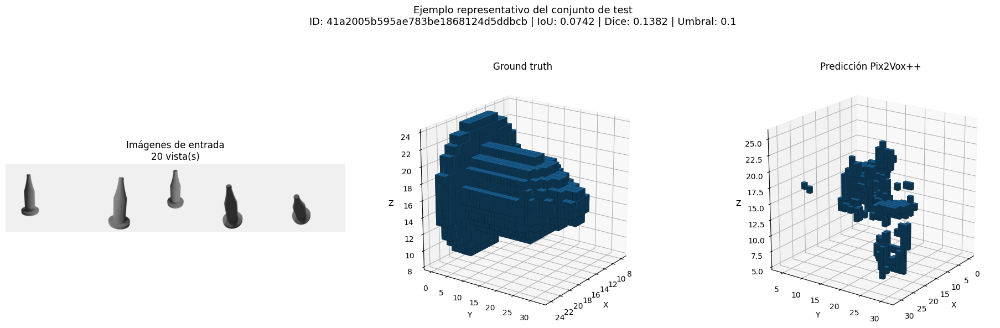


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_botellas_20_vistas_sin_finetuning/ejemplo_representativo.png

RESUMEN GUARDADO DEL EXPERIMENTO 3


,conjunto,numero_objetos,umbral,bce_x10_media,iou_media,dice_media,precision_voxel_media,recall_voxel_media,chamfer_superficie_media,f_score_superficie_media
0,validacion,94.0,0.15,5.5124,0.1066,0.1759,0.2919,0.1476,4.4760,0.1950
1,test,94.0,0.15,5.8882,0.1221,0.1977,0.3413,0.1599,4.1091,0.2042



[OK] EXPERIMENTO 3 FINALIZADO
Los resultados definitivos y el ejemplo representativo se han guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_botellas_20_vistas_sin_finetuning

La memoria de la GPU ha sido liberada.


In [ ]:
# ============================================================
# 17. EXPERIMENTO 7
# VEINTE VISTAS SIN FINE-TUNING
# ============================================================

NOMBRE_EXPERIMENTO_20_VISTAS_SIN_FT = (
    "tazas_botellas_20_vistas_sin_finetuning"
)

SOBRESCRIBIR_EXPERIMENTO_20_VISTAS_SIN_FT = False

# Durante la evaluación, el tamaño del lote no modifica las
# predicciones. Se utiliza uno para reducir el consumo de VRAM.
TAMANO_LOTE_EVALUACION_20_VISTAS = 1


print("=" * 75)
print("EXPERIMENTO 3: VEINTE VISTAS SIN FINE-TUNING")
print("=" * 75)

print(f"Dispositivo:          {DEVICE}")
print("Categoría:            tazas_botellas")
print("Número de vistas:     20")
print("Fine-tuning:          No")

print(
    "Vistas utilizadas:    "
    f"{INDICES_VISTAS_EVALUACION[20]}"
)

print(
    "Batch de evaluación:  "
    f"{TAMANO_LOTE_EVALUACION_20_VISTAS}"
)


# ------------------------------------------------------------
# 1. Crear los DataLoader
# ------------------------------------------------------------

print("\nCreando los DataLoader...")

_cargadores_experimento_20_vistas = (
    crear_dataloaders_pix2vox(
        numero_vistas=20,
        conjunto_categorias="tazas_botellas",
        tamano_lote_fisico=(
            TAMANO_LOTE_EVALUACION_20_VISTAS
        ),
    )
)

_loader_validacion_20_vistas = (
    _cargadores_experimento_20_vistas[
        "loader_validacion"
    ]
)

_loader_test_20_vistas = (
    _cargadores_experimento_20_vistas[
        "loader_test"
    ]
)


print(
    f"Objetos de validación: "
    f"{len(_loader_validacion_20_vistas.dataset)}"
)

print(
    f"Objetos de test:       "
    f"{len(_loader_test_20_vistas.dataset)}"
)

print(
    f"Lotes de validación:   "
    f"{len(_loader_validacion_20_vistas)}"
)

print(
    f"Lotes de test:         "
    f"{len(_loader_test_20_vistas)}"
)


# ------------------------------------------------------------
# 2. Crear el modelo preentrenado
# ------------------------------------------------------------

print("\nCreando Pix2Vox++/A...")

_modelo_experimento_20_vistas = (
    Pix2VoxPlusPlusA(
        usar_refiner=True,
        usar_merger=True,
        usar_pesos_imagenet=False,
    )
)

print(
    "Cargando el checkpoint oficial..."
)

_metadata_checkpoint_20_vistas = (
    cargar_pesos_preentrenados_pix2vox(
        modelo=_modelo_experimento_20_vistas,
        ruta_checkpoint=RUTA_CHECKPOINT_OFICIAL,
        dispositivo_carga="cpu",
        estricto=True,
    )
)

_modelo_experimento_20_vistas = (
    _modelo_experimento_20_vistas
    .to(DEVICE)
)

_modelo_experimento_20_vistas.eval()


# ------------------------------------------------------------
# 3. Evaluación definitiva
# ------------------------------------------------------------

_resultado_experimento_20_vistas = (
    evaluar_y_guardar_experimento_pix2vox(
        modelo=_modelo_experimento_20_vistas,
        loader_validacion=(
            _loader_validacion_20_vistas
        ),
        loader_test=(
            _loader_test_20_vistas
        ),
        nombre_experimento=(
            NOMBRE_EXPERIMENTO_20_VISTAS_SIN_FT
        ),
        numero_vistas=20,
        tipo_experimento="sin_finetuning",
        configuracion_extra={
            "categoria": CATEGORIA_TAZAS,
            "nombre_grupo_categorias": "tazas",
            "checkpoint_inicial": str(
                RUTA_CHECKPOINT_OFICIAL
            ),
            "checkpoint_oficial_epoch": (
                _metadata_checkpoint_20_vistas.get(
                    "epoch"
                )
            ),
            "checkpoint_oficial_best_iou": (
                _metadata_checkpoint_20_vistas.get(
                    "best_iou"
                )
            ),
            "fine_tuning": False,
            "vistas_fijas": (
                INDICES_VISTAS_EVALUACION[20]
            ),
            "tamano_lote_evaluacion": int(
                TAMANO_LOTE_EVALUACION_20_VISTAS
            ),
            "resolucion_voxel": int(
                RESOLUCION_VOXEL
            ),
            "tamano_imagen": int(
                TAMANO_IMAGEN
            ),
        },
        sobrescribir=(
            SOBRESCRIBIR_EXPERIMENTO_20_VISTAS_SIN_FT
        ),
    )
)


# ------------------------------------------------------------
# 4. Visualización del ejemplo representativo
# ------------------------------------------------------------

_metadata_ejemplo_20_vistas = (
    visualizar_ejemplo_representativo_pix2vox(
        modelo=_modelo_experimento_20_vistas,
        dataloader_test=_loader_test_20_vistas,
        tabla_test_por_objeto=(
            _resultado_experimento_20_vistas[
                "resultado_test_completo"
            ][
                "tabla_por_objeto"
            ]
        ),
        umbral=(
            _resultado_experimento_20_vistas[
                "umbral_seleccionado"
            ]
        ),
        ruta_experimento=(
            _resultado_experimento_20_vistas[
                "ruta_experimento"
            ]
        ),
        numero_vistas=20,
    )
)


# ------------------------------------------------------------
# 5. Conservar un resumen compacto
# ------------------------------------------------------------

resumen_experimento_20_vistas_sin_ft = (
    _resultado_experimento_20_vistas[
        "resumen_json"
    ]
)

ruta_experimento_20_vistas_sin_ft = Path(
    _resultado_experimento_20_vistas[
        "ruta_experimento"
    ]
)


# ------------------------------------------------------------
# 6. Mostrar validación y test
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("RESUMEN GUARDADO DEL EXPERIMENTO 3")
print("=" * 75)

display(
    _resultado_experimento_20_vistas[
        "tabla_resumen"
    ][
        [
            "conjunto",
            "numero_objetos",
            "umbral",
            "bce_x10_media",
            "iou_media",
            "dice_media",
            "precision_voxel_media",
            "recall_voxel_media",
            "chamfer_superficie_media",
            "f_score_superficie_media",
        ]
    ].round(4)
)


# ------------------------------------------------------------
# 7. Liberar memoria
# ------------------------------------------------------------

_modelo_experimento_20_vistas.to(
    "cpu"
)

del _modelo_experimento_20_vistas
del _metadata_checkpoint_20_vistas
del _resultado_experimento_20_vistas
del _metadata_ejemplo_20_vistas
del _loader_validacion_20_vistas
del _loader_test_20_vistas
del _cargadores_experimento_20_vistas

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


print("\n" + "=" * 75)
print("[OK] EXPERIMENTO 3 FINALIZADO")
print("=" * 75)

print(
    "Los resultados definitivos y el ejemplo "
    "representativo se han guardado en:"
)

print(
    ruta_experimento_20_vistas_sin_ft
)

print(
    "\nLa memoria de la GPU ha sido liberada."
)

## 20. Experimento 8: 20 vistas con fine-tuning

> Añadir blockquote



Se realiza el último experimento de esta serie utilizando las veinte imágenes disponibles de cada taza.

El modelo se inicializa con el checkpoint oficial de Pix2Vox++/A y se adapta utilizando las 120 tazas del conjunto de entrenamiento.

La configuración es:

- **Categoría:** tazas.
- **Número de vistas:** treinta.
- **Fine-tuning:** sí.
- **Objetos de entrenamiento:** 437.
- **Objetos de validación:** 94.
- **Objetos de test:** 94.
- **Batch físico:** un objeto.
- **Acumulación de gradientes:** cinco lotes.
- **Batch efectivo:** cinco objetos.
- **Precisión:** `float32` en GPU.
- **Épocas máximas:** 30.
- **Early stopping:** siete épocas sin mejora.
- **Resolución de salida:** 32 × 32 × 32 vóxeles.

### Gestión de memoria

Procesar simultáneamente treinta imágenes por objeto requiere considerablemente más memoria que los experimentos anteriores.

Se utiliza:

```text
Batch físico = 1
Pasos de acumulación = 5
Batch efectivo = 5
```

Los gradientes de cinco objetos consecutivos se acumulan antes de actualizar los parámetros. De esta forma se mantiene el mismo batch efectivo utilizado en los experimentos de una y cinco vistas.

### Selección de imágenes

Durante entrenamiento, validación y test se utilizan las treinta vistas disponibles:

```text
00.png, 01.png, 02.png, ..., 19.png
```

La función de visualización muestra solamente cinco imágenes distribuidas uniformemente, pero la inferencia utiliza las treinta vistas.

### Recuperación automática

La celda comprueba si el entrenamiento ya ha finalizado mediante:

- La existencia del checkpoint.
- La existencia del historial.
- El número de épocas completadas o la activación del early stopping.

Cuando detecta un entrenamiento completo, recupera directamente el mejor checkpoint y no repite las épocas.

Los resultados se guardarán en:

```text
Pix2Vox++/checkpoints/tazas_20_vistas_con_finetuning_mejor.pth
Pix2Vox++/historiales/tazas_20_vistas_con_finetuning_historial.csv
Pix2Vox++/metricas/tazas_20_vistas_con_finetuning/
```

Al finalizar se mostrará una comparación directa con el experimento de treinta vistas sin fine-tuning.

In [ ]:
# ============================================================
# 20. EXPERIMENTO 8
# VEINTE VISTAS CON FINE-TUNING
# ============================================================

NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT = (
    "tazas_botellas_20_vistas_con_finetuning"
)

# Configuración de memoria:
# 1 objeto por lote × 5 acumulaciones = batch efectivo 5.
TAMANO_LOTE_FISICO_20_VISTAS = 1
PASOS_ACUMULACION_20_VISTAS = 5
TAMANO_LOTE_EFECTIVO_20_VISTAS = (
    TAMANO_LOTE_FISICO_20_VISTAS
    * PASOS_ACUMULACION_20_VISTAS
)

# ============================================================
# CONTROL DEL EXPERIMENTO 8
# ============================================================

# Queremos repetir AHORA el experimento completo de 20 vistas
# desde el checkpoint oficial.
FORZAR_REENTRENAMIENTO_20_VISTAS = True

# Mientras FORZAR_REENTRENAMIENTO_20_VISTAS sea True,
# no se reutilizará ningún checkpoint fine-tuned anterior.
REUTILIZAR_CHECKPOINT_20_VISTAS = False

# Se permite eliminar cualquier entrenamiento parcial anterior.
REINICIAR_ENTRENAMIENTO_INCOMPLETO_20_VISTAS = True

# Las métricas anteriores del experimento 6 pueden sustituirse.
SOBRESCRIBIR_EVALUACION_20_VISTAS_CON_FT = True


# ------------------------------------------------------------
# COMPROBACIÓN PREVIA DE DEPENDENCIAS
#
# Debe fallar ANTES de entrenar si falta alguna función.
# ------------------------------------------------------------

_dependencias_experimento_20_vistas = [
    "crear_dataloaders_pix2vox",
    "cargar_pesos_preentrenados_pix2vox",
    "cargar_checkpoint_finetuning",
    "guardar_checkpoint_finetuning",
    "entrenar_modelo_finetuning_pix2vox",
    "evaluar_y_guardar_experimento_pix2vox",
    "visualizar_ejemplo_representativo_pix2vox",
    "guardar_json_atomico",
]

_dependencias_faltantes_20_vistas = [
    nombre
    for nombre
    in _dependencias_experimento_20_vistas
    if nombre not in globals()
]

if _dependencias_faltantes_20_vistas:

    raise RuntimeError(
        "No se puede comenzar el experimento 8.\n"
        "Faltan funciones necesarias:\n"
        f"{_dependencias_faltantes_20_vistas}"
    )


print(
    "\n[OK] Todas las dependencias "
    "del experimento 8 están definidas."
)


# ------------------------------------------------------------
# Comprobar si un historial representa un entrenamiento final
# ------------------------------------------------------------

def _historial_20_vistas_finalizado(
    historial
):
    """
    Considera finalizado un entrenamiento cuando:

    - Ha alcanzado el número máximo de épocas, o
    - Ha activado el criterio de early stopping.
    """

    if historial is None or historial.empty:
        return False

    epocas_ejecutadas = int(
        len(historial)
    )

    if epocas_ejecutadas >= NUMERO_EPOCAS_MAXIMO:
        return True

    if "epocas_sin_mejora" in historial.columns:

        epocas_sin_mejora_finales = int(
            historial.iloc[-1][
                "epocas_sin_mejora"
            ]
        )

        if (
            epocas_sin_mejora_finales
            >= PACIENCIA_EARLY_STOPPING
        ):
            return True

    return False


# ------------------------------------------------------------
# Ejecución completa del experimento
# ------------------------------------------------------------

def _ejecutar_experimento_20_vistas_con_ft():

    modelo = None
    cargadores = None
    resultado_finetuning = None
    resultado_evaluacion = None

    ruta_checkpoint = (
        RUTA_CHECKPOINTS
        / (
            f"{NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT}"
            "_mejor.pth"
        )
    )

    ruta_historial = (
        RUTA_HISTORIALES
        / (
            f"{NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT}"
            "_historial.csv"
        )
    )

    ruta_resumen = (
        RUTA_HISTORIALES
        / (
            f"{NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT}"
            "_resumen.json"
        )
    )

    ruta_metricas = (
        RUTA_METRICAS
        / NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT
    )


    # --------------------------------------------------------
    # REINICIO FORZADO DEL EXPERIMENTO 8
    #
    # Elimina SOLO los resultados correspondientes al
    # fine-tuning de 20 vistas.
    #
    # NO modifica:
    # - checkpoint oficial
    # - experimento 1
    # - experimento 2
    # - experimento 3
    # - experimento 4
    # - experimento 5
    # --------------------------------------------------------

    if FORZAR_REENTRENAMIENTO_20_VISTAS:

        print("=" * 75)
        print("REINICIO FORZADO DEL EXPERIMENTO 6")
        print("=" * 75)

        archivos_a_eliminar = [
            ruta_checkpoint,
            ruta_historial,
            ruta_resumen,
        ]

        for ruta_archivo in archivos_a_eliminar:

            if ruta_archivo.exists():

                print(
                    f"Eliminando: "
                    f"{ruta_archivo.name}"
                )

                ruta_archivo.unlink()

        if ruta_metricas.exists():

            print(
                "Eliminando métricas anteriores "
                "del experimento 6..."
            )

            shutil.rmtree(
                ruta_metricas
            )

        print(
            "\n[OK] Entrenamiento anterior de "
            "20 vistas eliminado."
        )

        print(
            "El experimento comenzará desde "
            "el checkpoint oficial.\n"
        )


    print("=" * 75)
    print("EXPERIMENTO 8: VEINTE VISTAS CON FINE-TUNING")
    print("=" * 75)

    print(f"Dispositivo:             {DEVICE}")
    print("Categoría:               tazas_botellas")
    print("Número de vistas:        20")
    print("Fine-tuning:             Sí")
    print(f"Precisión mixta:         {USAR_PRECISION_MIXTA}")
    print("Precisión numérica:      float32")

    print(
        f"Batch físico:            "
        f"{TAMANO_LOTE_FISICO_20_VISTAS}"
    )

    print(
        f"Pasos de acumulación:    "
        f"{PASOS_ACUMULACION_20_VISTAS}"
    )

    print(
        f"Batch efectivo:          "
        f"{TAMANO_LOTE_EFECTIVO_20_VISTAS}"
    )

    print(
        f"Épocas máximas:          "
        f"{NUMERO_EPOCAS_MAXIMO}"
    )

    print(
        f"Early stopping:          "
        f"{PACIENCIA_EARLY_STOPPING}"
    )

    print(
        "Vistas utilizadas:       "
        "00.png–19.png"
    )

    if DEVICE.type != "cuda":

        raise RuntimeError(
            "Este experimento definitivo debe ejecutarse "
            "con GPU."
        )

    if USAR_PRECISION_MIXTA:

        raise RuntimeError(
            "La precisión mixta debe permanecer desactivada "
            "para evitar gradientes no finitos."
        )

    if (
        TAMANO_LOTE_EFECTIVO_20_VISTAS
        != TAMANO_LOTE_EFECTIVO
    ):

        raise RuntimeError(
            "El batch efectivo de veinte vistas no coincide "
            "con el utilizado en los experimentos anteriores."
        )

    # --------------------------------------------------------
    # 1. Revisar archivos existentes
    # --------------------------------------------------------

    historial_existente = None

    if ruta_historial.exists():

        historial_existente = pd.read_csv(
            ruta_historial
        )

    checkpoint_existente = (
        ruta_checkpoint.exists()
    )

    historial_finalizado = (
        _historial_20_vistas_finalizado(
            historial_existente
        )
    )

    resumen_existente = (
        ruta_resumen.exists()
    )

    entrenamiento_completo = (
        checkpoint_existente
        and historial_existente is not None
        and (
            historial_finalizado
            or resumen_existente
        )
    )

    existen_archivos_parciales = (
        checkpoint_existente
        or ruta_historial.exists()
        or ruta_resumen.exists()
    ) and not entrenamiento_completo

    print("\nEstado de los archivos:")

    print(
        f"Checkpoint existente:    "
        f"{checkpoint_existente}"
    )

    print(
        f"Historial existente:     "
        f"{ruta_historial.exists()}"
    )

    print(
        f"Resumen existente:       "
        f"{resumen_existente}"
    )

    print(
        f"Entrenamiento completo:  "
        f"{entrenamiento_completo}"
    )

    # --------------------------------------------------------
    # 2. Gestión de una ejecución parcial
    # --------------------------------------------------------

    if existen_archivos_parciales:

        if not REINICIAR_ENTRENAMIENTO_INCOMPLETO_20_VISTAS:

            raise RuntimeError(
                "Se han encontrado archivos de un entrenamiento "
                "incompleto de veinte vistas.\n\n"
                "Para conservarlos no se realizará ninguna "
                "sobrescritura automática.\n\n"
                "Revisa el historial. Para comenzar de nuevo, "
                "cambia:\n"
                "REINICIAR_ENTRENAMIENTO_INCOMPLETO_20_VISTAS "
                "= True"
            )

        print(
            "\nEliminando exclusivamente los archivos "
            "incompletos del experimento de veinte vistas..."
        )

        for ruta_archivo in [
            ruta_checkpoint,
            ruta_historial,
            ruta_resumen,
        ]:

            if ruta_archivo.exists():
                ruta_archivo.unlink()

        if ruta_metricas.exists():
            shutil.rmtree(
                ruta_metricas
            )

        historial_existente = None
        checkpoint_existente = False
        historial_finalizado = False
        resumen_existente = False
        entrenamiento_completo = False

        print(
            "[OK] Archivos incompletos eliminados."
        )

    reutilizar_entrenamiento = (
        REUTILIZAR_CHECKPOINT_20_VISTAS
        and entrenamiento_completo
    )

    print(
        f"Reutilizar checkpoint:   "
        f"{reutilizar_entrenamiento}"
    )

    try:

        # ----------------------------------------------------
        # 3. Crear los DataLoader
        # ----------------------------------------------------

        print("\nCreando los DataLoader...")

        cargadores = crear_dataloaders_pix2vox(
            numero_vistas=20,
            conjunto_categorias="tazas_botellas",
            tamano_lote_fisico=(
                TAMANO_LOTE_FISICO_20_VISTAS
            ),
        )

        loader_train = cargadores[
            "loader_train"
        ]

        loader_validacion = cargadores[
            "loader_validacion"
        ]

        loader_test = cargadores[
            "loader_test"
        ]

        print(
            f"Objetos de entrenamiento: "
            f"{len(loader_train.dataset)}"
        )

        print(
            f"Objetos de validación:    "
            f"{len(loader_validacion.dataset)}"
        )

        print(
            f"Objetos de test:          "
            f"{len(loader_test.dataset)}"
        )

        print(
            f"Lotes train por época:    "
            f"{len(loader_train)}"
        )

        print(
            f"Actualizaciones por época:"
            f" {math.ceil(len(loader_train) / PASOS_ACUMULACION_20_VISTAS)}"
        )

        print(
            f"Lotes de validación:      "
            f"{len(loader_validacion)}"
        )

        # ----------------------------------------------------
        # 4. Crear la arquitectura
        # ----------------------------------------------------

        print("\nCreando Pix2Vox++/A...")

        modelo = Pix2VoxPlusPlusA(
            usar_refiner=True,
            usar_merger=True,
            usar_pesos_imagenet=False,
        )

        # ----------------------------------------------------
        # 5A. Recuperar un entrenamiento completo
        # ----------------------------------------------------

        if reutilizar_entrenamiento:

            print(
                "Cargando el mejor checkpoint "
                "fine-tuned existente..."
            )

            metadata_checkpoint = (
                cargar_checkpoint_finetuning(
                    modelo=modelo,
                    ruta_checkpoint=ruta_checkpoint,
                    dispositivo_carga="cpu",
                    estricto=True,
                )
            )

            historial = pd.read_csv(
                ruta_historial
            )

            mejor_epoca = int(
                metadata_checkpoint["epoca"]
            )

            mejor_iou = float(
                metadata_checkpoint[
                    "mejor_iou_validacion"
                ]
            )

            mejor_dice = float(
                metadata_checkpoint[
                    "mejor_dice_validacion"
                ]
            )

            mejor_umbral = float(
                metadata_checkpoint[
                    "mejor_umbral"
                ]
            )

            configuracion_checkpoint = (
                metadata_checkpoint[
                    "configuracion_experimento"
                ]
            )

        # ----------------------------------------------------
        # 5B. Ejecutar el fine-tuning
        # ----------------------------------------------------

        else:

            print(
                "Cargando el checkpoint oficial..."
            )

            metadata_inicial = (
                cargar_pesos_preentrenados_pix2vox(
                    modelo=modelo,
                    ruta_checkpoint=(
                        RUTA_CHECKPOINT_OFICIAL
                    ),
                    dispositivo_carga="cpu",
                    estricto=True,
                )
            )

            modelo = modelo.to(
                DEVICE
            )

            print(
                "\nIniciando el fine-tuning "
                "de veinte vistas..."
            )

            print(
                "Este experimento será considerablemente "
                "más lento que los anteriores."
            )

            resultado_finetuning = (
                entrenar_modelo_finetuning_pix2vox(
                    modelo=modelo,
                    loader_train=loader_train,
                    loader_validacion=(
                        loader_validacion
                    ),
                    nombre_experimento=(
                        NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT
                    ),
                    configuracion_experimento={
                        "categoria": DOS_CATEGORIAS,
                        "grupo_categorias": "tazas_botellas",
                        "numero_vistas": 20,
                        "fine_tuning": True,
                        "checkpoint_inicial": str(
                            RUTA_CHECKPOINT_OFICIAL
                        ),
                        "checkpoint_inicial_epoch": (
                            metadata_inicial.get(
                                "epoch"
                            )
                        ),
                        "checkpoint_inicial_best_iou": (
                            metadata_inicial.get(
                                "best_iou"
                            )
                        ),
                        "vistas_train": (
                            INDICES_VISTAS_EVALUACION[20]
                        ),
                        "vistas_validacion_test": (
                            INDICES_VISTAS_EVALUACION[20]
                        ),
                        "tamano_lote_fisico": int(
                            TAMANO_LOTE_FISICO_20_VISTAS
                        ),
                        "pasos_acumulacion": int(
                            PASOS_ACUMULACION_20_VISTAS
                        ),
                        "tamano_lote_efectivo": int(
                            TAMANO_LOTE_EFECTIVO_20_VISTAS
                        ),
                        "precision": "float32",
                        "resolucion_voxel": int(
                            RESOLUCION_VOXEL
                        ),
                        "tamano_imagen": int(
                            TAMANO_IMAGEN
                        ),
                        "checkpoint_formato": (
                            "pix2vox_finetuning_v2"
                        ),

                    },
                    numero_epocas=(
                        NUMERO_EPOCAS_MAXIMO
                    ),
                    paciencia_early_stopping=(
                        PACIENCIA_EARLY_STOPPING
                    ),
                    pasos_acumulacion=(
                        PASOS_ACUMULACION_20_VISTAS
                    ),
                    max_lotes_train=None,
                    max_lotes_validacion=None,
                )
            )

            modelo = resultado_finetuning[
                "modelo"
            ]

            historial = resultado_finetuning[
                "historial"
            ]

            resumen_entrenamiento = (
                resultado_finetuning[
                    "resumen"
                ]
            )

            metadata_checkpoint = (
                resultado_finetuning[
                    "metadata_checkpoint"
                ]
            )

            mejor_epoca = int(
                resumen_entrenamiento[
                    "mejor_epoca"
                ]
            )

            mejor_iou = float(
                resumen_entrenamiento[
                    "mejor_iou_validacion"
                ]
            )

            mejor_dice = float(
                resumen_entrenamiento[
                    "mejor_dice_validacion"
                ]
            )

            #mejor_umbral = float(
            #    resumen_entrenamiento[
            #        "mejor_umbral"
            #    ]
            #)
            mejor_umbral = 1.5

            configuracion_checkpoint = (
                metadata_checkpoint[
                    "configuracion_experimento"
                ]
            )

        # ----------------------------------------------------
        # 6. Validar el checkpoint recuperado
        # ----------------------------------------------------

        if (
            metadata_checkpoint[
                "claves_ausentes"
            ]
            or metadata_checkpoint[
                "claves_inesperadas"
            ]
        ):

            raise RuntimeError(
                "El checkpoint no coincide completamente "
                "con la arquitectura Pix2Vox++/A."
            )

        modelo = modelo.to(
            DEVICE
        )

        modelo.eval()

        print("\n" + "=" * 75)
        print("MEJOR CHECKPOINT DE VEINTE VISTAS")
        print("=" * 75)

        print(
            f"Formato:                 "
            f"{metadata_checkpoint['formato']}"
        )

        print(
            f"Mejor época:             "
            f"{mejor_epoca}"
        )

        print(
            f"Mejor IoU validación:    "
            f"{mejor_iou:.4f}"
        )

        print(
            f"Mejor Dice validación:   "
            f"{mejor_dice:.4f}"
        )

        print(
            f"Mejor umbral:            "
            f"{mejor_umbral:.1f}"
        )

        # ----------------------------------------------------
        # 7. Guardar o reconstruir el resumen
        # ----------------------------------------------------

        tiempo_train = float(
            historial[
                "train_tiempo_segundos"
            ].sum()
        )

        tiempo_validacion = float(
            historial[
                "validacion_tiempo_segundos"
            ].sum()
        )

        resumen_finetuning = {
            "nombre_experimento": (
                NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT
            ),
            "mejor_epoca": int(
                mejor_epoca
            ),
            "mejor_iou_validacion": float(
                mejor_iou
            ),
            "mejor_dice_validacion": float(
                mejor_dice
            ),
            "mejor_umbral": float(
                mejor_umbral
            ),
            "epocas_ejecutadas": int(
                len(historial)
            ),
            "tiempo_train_segundos": float(
                tiempo_train
            ),
            "tiempo_validacion_segundos": float(
                tiempo_validacion
            ),
            "tiempo_total_estimado_segundos": float(
                tiempo_train
                + tiempo_validacion
            ),
            "ruta_checkpoint": str(
                ruta_checkpoint
            ),
            "ruta_historial": str(
                ruta_historial
            ),
            "checkpoint_reutilizado": bool(
                reutilizar_entrenamiento
            ),
            "configuracion_experimento": (
                configuracion_checkpoint
            ),
        }

        guardar_json_atomico(
            contenido=resumen_finetuning,
            ruta_destino=ruta_resumen,
        )

        # ----------------------------------------------------
        # 8. Evaluación definitiva
        # ----------------------------------------------------

        print("\n" + "=" * 75)
        print(
            "EVALUACIÓN FINAL DEL MODELO "
            "DE VEINTE VISTAS"
        )
        print("=" * 75)

        resultado_evaluacion = (
            evaluar_y_guardar_experimento_pix2vox(
                modelo=modelo,
                loader_validacion=(
                    loader_validacion
                ),
                loader_test=loader_test,
                nombre_experimento=(
                    NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT
                ),
                numero_vistas=20,
                tipo_experimento="con_finetuning",
                configuracion_extra={
                    "categoria": DOS_CATEGORIAS,
                    "fine_tuning": True,
                    "mejor_epoca": int(
                        mejor_epoca
                    ),
                    "mejor_iou_validacion_entrenamiento": (
                        mejor_iou
                    ),
                    "mejor_dice_validacion_entrenamiento": (
                        mejor_dice
                    ),
                    "mejor_umbral_entrenamiento": (
                        mejor_umbral
                    ),
                    "ruta_checkpoint_finetuned": str(
                        ruta_checkpoint
                    ),
                    "ruta_historial": str(
                        ruta_historial
                    ),
                    "vistas_fijas_evaluacion": (
                        INDICES_VISTAS_EVALUACION[20]
                    ),
                    "tamano_lote_fisico": int(
                        TAMANO_LOTE_FISICO_20_VISTAS
                    ),
                    "pasos_acumulacion": int(
                        PASOS_ACUMULACION_20_VISTAS
                    ),
                    "tamano_lote_efectivo": int(
                        TAMANO_LOTE_EFECTIVO_20_VISTAS
                    ),
                    "precision": "float32",
                    "resolucion_voxel": int(
                        RESOLUCION_VOXEL
                    ),
                    "checkpoint_reutilizado": bool(
                        reutilizar_entrenamiento
                    ),
                },
                sobrescribir=(
                    SOBRESCRIBIR_EVALUACION_20_VISTAS_CON_FT
                ),
            )
        )

        # ----------------------------------------------------
        # 9. Ejemplo representativo
        # ----------------------------------------------------

        visualizar_ejemplo_representativo_pix2vox(
            modelo=modelo,
            dataloader_test=loader_test,
            tabla_test_por_objeto=(
                resultado_evaluacion[
                    "resultado_test_completo"
                ][
                    "tabla_por_objeto"
                ]
            ),
            umbral=(
                resultado_evaluacion[
                    "umbral_seleccionado"
                ]
            ),
            ruta_experimento=(
                resultado_evaluacion[
                    "ruta_experimento"
                ]
            ),
            numero_vistas=20,
        )

        # ----------------------------------------------------
        # 10. Mostrar las últimas épocas
        # ----------------------------------------------------

        print("\n" + "=" * 75)
        print("ÚLTIMAS DIEZ ÉPOCAS DEL FINE-TUNING")
        print("=" * 75)

        display(
            historial.tail(10)[
                [
                    "epoca",
                    "train_perdida_total",
                    "train_iou_0_3",
                    "validacion_bce_x10",
                    "validacion_umbral",
                    "validacion_iou",
                    "validacion_dice",
                    "lr_encoder",
                    "lr_decoder",
                    "es_mejor_checkpoint",
                    "epocas_sin_mejora",
                ]
            ].round(5)
        )

        # ----------------------------------------------------
        # 11. Mostrar los resultados finales
        # ----------------------------------------------------

        tabla_resultados = (
            resultado_evaluacion[
                "tabla_resumen"
            ]
        )

        print("\n" + "=" * 75)
        print("RESULTADOS FINALES DEL EXPERIMENTO 8")
        print("=" * 75)

        display(
            tabla_resultados[
                [
                    "conjunto",
                    "numero_objetos",
                    "umbral",
                    "bce_x10_media",
                    "iou_media",
                    "dice_media",
                    "precision_voxel_media",
                    "recall_voxel_media",
                    "chamfer_superficie_media",
                    "f_score_superficie_media",
                ]
            ].round(4)
        )

        # ----------------------------------------------------
        # 12. Comparación con el baseline de veinte vistas
        # ----------------------------------------------------

        ruta_baseline = (
            RUTA_METRICAS
            / "tazas_20_vistas_sin_finetuning"
            / "resumen_validacion_test.csv"
        )

        if ruta_baseline.exists():

            tabla_baseline = pd.read_csv(
                ruta_baseline
            )

            baseline_test = (
                tabla_baseline.loc[
                    tabla_baseline[
                        "conjunto"
                    ] == "test"
                ].iloc[0]
            )

            finetuning_test = (
                tabla_resultados.loc[
                    tabla_resultados[
                        "conjunto"
                    ] == "test"
                ].iloc[0]
            )

            comparacion = pd.DataFrame(
                {
                    "metrica": [
                        "IoU",
                        "Dice",
                        "Precisión voxel",
                        "Recall voxel",
                        "Chamfer superficie",
                        "F-score superficie",
                    ],
                    "sin_finetuning": [
                        baseline_test["iou_media"],
                        baseline_test["dice_media"],
                        baseline_test[
                            "precision_voxel_media"
                        ],
                        baseline_test[
                            "recall_voxel_media"
                        ],
                        baseline_test[
                            "chamfer_superficie_media"
                        ],
                        baseline_test[
                            "f_score_superficie_media"
                        ],
                    ],
                    "con_finetuning": [
                        finetuning_test["iou_media"],
                        finetuning_test["dice_media"],
                        finetuning_test[
                            "precision_voxel_media"
                        ],
                        finetuning_test[
                            "recall_voxel_media"
                        ],
                        finetuning_test[
                            "chamfer_superficie_media"
                        ],
                        finetuning_test[
                            "f_score_superficie_media"
                        ],
                    ],
                }
            )

            comparacion["diferencia"] = (
                comparacion["con_finetuning"]
                - comparacion["sin_finetuning"]
            )

            print("\n" + "=" * 75)
            print(
                "COMPARACIÓN CON EL BASELINE "
                "DE VEINTE VISTAS"
            )
            print("=" * 75)

            display(
                comparacion.round(4)
            )

        return {
            "resumen_finetuning": (
                resumen_finetuning
            ),
            "resumen_experimento": (
                resultado_evaluacion[
                    "resumen_json"
                ]
            ),
            "tabla_resultados": (
                tabla_resultados.copy()
            ),
            "ruta_checkpoint": Path(
                ruta_checkpoint
            ),
            "ruta_experimento": Path(
                resultado_evaluacion[
                    "ruta_experimento"
                ]
            ),
        }

    finally:

        if modelo is not None:

            modelo.to(
                "cpu"
            )

            del modelo

        if resultado_finetuning is not None:
            del resultado_finetuning

        if resultado_evaluacion is not None:
            del resultado_evaluacion

        if cargadores is not None:
            del cargadores

        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

        print(
            "\nLa memoria temporal y la memoria de la GPU "
            "han sido liberadas."
        )


# ------------------------------------------------------------
# Ejecutar y conservar únicamente los resultados compactos
# ------------------------------------------------------------

_resultado_compacto_20_vistas_ft = (
    _ejecutar_experimento_20_vistas_con_ft()
)

resumen_finetuning_20_vistas_con_ft = (
    _resultado_compacto_20_vistas_ft[
        "resumen_finetuning"
    ]
)

resumen_experimento_20_vistas_con_ft = (
    _resultado_compacto_20_vistas_ft[
        "resumen_experimento"
    ]
)

tabla_resultados_20_vistas_con_ft = (
    _resultado_compacto_20_vistas_ft[
        "tabla_resultados"
    ]
)

ruta_checkpoint_20_vistas_con_ft = (
    _resultado_compacto_20_vistas_ft[
        "ruta_checkpoint"
    ]
)

ruta_experimento_20_vistas_con_ft = (
    _resultado_compacto_20_vistas_ft[
        "ruta_experimento"
    ]
)

del _resultado_compacto_20_vistas_ft
del _ejecutar_experimento_20_vistas_con_ft
del _historial_20_vistas_finalizado


print("\n" + "=" * 75)
print("[OK] EXPERIMENTO 8 FINALIZADO")
print("=" * 75)

print(
    "Mejor checkpoint:"
)

print(
    ruta_checkpoint_20_vistas_con_ft
)

print(
    "\nMétricas y figura:"
)

print(
    ruta_experimento_20_vistas_con_ft
)

print(
    "\nLa memoria de la GPU ha sido liberada."
)


[OK] Todas las dependencias del experimento 8 están definidas.
REINICIO FORZADO DEL EXPERIMENTO 6

[OK] Entrenamiento anterior de 20 vistas eliminado.
El experimento comenzará desde el checkpoint oficial.

EXPERIMENTO 8: VEINTE VISTAS CON FINE-TUNING
Dispositivo:             cuda
Categoría:               tazas_botellas
Número de vistas:        20
Fine-tuning:             Sí
Precisión mixta:         False
Precisión numérica:      float32
Batch físico:            1
Pasos de acumulación:    5
Batch efectivo:          5
Épocas máximas:          30
Early stopping:          7
Vistas utilizadas:       00.png–19.png

Estado de los archivos:
Checkpoint existente:    False
Historial existente:     False
Resumen existente:       False
Entrenamiento completo:  False
Reutilizar checkpoint:   False

Creando los DataLoader...
Se utilizarán las divisiones guardadas anteriormente.
Las rutas de las divisiones se han actualizado a la estructura actual.
Objetos de entrenamiento: 437
Objetos de validación

Train época 1:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 1:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       5.998989
IoU train @ 0.3:     0.3454
BCE validación:      2.256287
Umbral validación:   0.2
IoU validación:      0.5378
Dice validación:     0.6814
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 2/30


Train época 2:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 2:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       3.824414
IoU train @ 0.3:     0.5756
BCE validación:      1.908047
Umbral validación:   0.3
IoU validación:      0.6310
Dice validación:     0.7498
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 3/30


Train época 3:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 3:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       3.245491
IoU train @ 0.3:     0.6484
BCE validación:      1.623526
Umbral validación:   0.3
IoU validación:      0.6739
Dice validación:     0.7801
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 4/30


Train época 4:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 4:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       2.877345
IoU train @ 0.3:     0.6871
BCE validación:      1.516251
Umbral validación:   0.3
IoU validación:      0.7103
Dice validación:     0.8083
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 5/30


Train época 5:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 5:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       2.602759
IoU train @ 0.3:     0.7181
BCE validación:      1.392538
Umbral validación:   0.4
IoU validación:      0.7167
Dice validación:     0.8139
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 6/30


Train época 6:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 6:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       2.356334
IoU train @ 0.3:     0.7432
BCE validación:      1.331258
Umbral validación:   0.3
IoU validación:      0.7287
Dice validación:     0.8246
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 7/30


Train época 7:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 7:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       2.164753
IoU train @ 0.3:     0.7586
BCE validación:      1.306735
Umbral validación:   0.4
IoU validación:      0.7423
Dice validación:     0.8335
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 8/30


Train época 8:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 8:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.983878
IoU train @ 0.3:     0.7770
BCE validación:      1.245829
Umbral validación:   0.4
IoU validación:      0.7530
Dice validación:     0.8404
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 9/30


Train época 9:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 9:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.816146
IoU train @ 0.3:     0.7907
BCE validación:      1.222145
Umbral validación:   0.4
IoU validación:      0.7608
Dice validación:     0.8462
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 10/30


Train época 10:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 10:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.665775
IoU train @ 0.3:     0.8045
BCE validación:      1.207603
Umbral validación:   0.4
IoU validación:      0.7663
Dice validación:     0.8497
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 11/30


Train época 11:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 11:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.539980
IoU train @ 0.3:     0.8162
BCE validación:      1.203883
Umbral validación:   0.4
IoU validación:      0.7619
Dice validación:     0.8487
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 12/30


Train época 12:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 12:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.427137
IoU train @ 0.3:     0.8257
BCE validación:      1.210011
Umbral validación:   0.4
IoU validación:      0.7744
Dice validación:     0.8563
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 13/30


Train época 13:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 13:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.304362
IoU train @ 0.3:     0.8383
BCE validación:      1.222688
Umbral validación:   0.4
IoU validación:      0.7737
Dice validación:     0.8559
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 14/30


Train época 14:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 14:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.200967
IoU train @ 0.3:     0.8485
BCE validación:      1.289819
Umbral validación:   0.4
IoU validación:      0.7794
Dice validación:     0.8593
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 15/30


Train época 15:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 15:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.100600
IoU train @ 0.3:     0.8587
BCE validación:      1.275724
Umbral validación:   0.4
IoU validación:      0.7810
Dice validación:     0.8613
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 16/30


Train época 16:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 16:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.023190
IoU train @ 0.3:     0.8666
BCE validación:      1.310201
Umbral validación:   0.4
IoU validación:      0.7826
Dice validación:     0.8621
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 17/30


Train época 17:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 17:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.950968
IoU train @ 0.3:     0.8730
BCE validación:      1.338320
Umbral validación:   0.4
IoU validación:      0.7839
Dice validación:     0.8633
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 18/30


Train época 18:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 18:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.884833
IoU train @ 0.3:     0.8803
BCE validación:      1.377963
Umbral validación:   0.4
IoU validación:      0.7863
Dice validación:     0.8644
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 19/30


Train época 19:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 19:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.827971
IoU train @ 0.3:     0.8863
BCE validación:      1.455756
Umbral validación:   0.4
IoU validación:      0.7823
Dice validación:     0.8618
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 20/30


Train época 20:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 20:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.790342
IoU train @ 0.3:     0.8910
BCE validación:      1.447636
Umbral validación:   0.4
IoU validación:      0.7861
Dice validación:     0.8643
Mejor checkpoint:    No
Épocas sin mejora:   2/7

ÉPOCA 21/30


Train época 21:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 21:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.743805
IoU train @ 0.3:     0.8959
BCE validación:      1.473301
Umbral validación:   0.4
IoU validación:      0.7877
Dice validación:     0.8652
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 22/30


Train época 22:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 22:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.711155
IoU train @ 0.3:     0.9006
BCE validación:      1.511151
Umbral validación:   0.4
IoU validación:      0.7879
Dice validación:     0.8657
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 23/30


Train época 23:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 23:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.679707
IoU train @ 0.3:     0.9032
BCE validación:      1.527056
Umbral validación:   0.4
IoU validación:      0.7867
Dice validación:     0.8650
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 24/30


Train época 24:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 24:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.648988
IoU train @ 0.3:     0.9067
BCE validación:      1.617788
Umbral validación:   0.3
IoU validación:      0.7853
Dice validación:     0.8639
Mejor checkpoint:    No
Épocas sin mejora:   2/7

ÉPOCA 25/30


Train época 25:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 25:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.633428
IoU train @ 0.3:     0.9092
BCE validación:      1.599376
Umbral validación:   0.3
IoU validación:      0.7881
Dice validación:     0.8661
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 26/30


Train época 26:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 26:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.596712
IoU train @ 0.3:     0.9135
BCE validación:      1.628745
Umbral validación:   0.3
IoU validación:      0.7874
Dice validación:     0.8656
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 27/30


Train época 27:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 27:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.580950
IoU train @ 0.3:     0.9149
BCE validación:      1.663560
Umbral validación:   0.4
IoU validación:      0.7862
Dice validación:     0.8647
Mejor checkpoint:    No
Épocas sin mejora:   2/7

ÉPOCA 28/30


Train época 28:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 28:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.573520
IoU train @ 0.3:     0.9162
BCE validación:      1.684106
Umbral validación:   0.5
IoU validación:      0.7858
Dice validación:     0.8641
Mejor checkpoint:    No
Épocas sin mejora:   3/7

ÉPOCA 29/30


Train época 29:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 29:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.548048
IoU train @ 0.3:     0.9189
BCE validación:      1.734328
Umbral validación:   0.3
IoU validación:      0.7844
Dice validación:     0.8635
Mejor checkpoint:    No
Épocas sin mejora:   4/7

ÉPOCA 30/30


Train época 30:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 30:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.526338
IoU train @ 0.3:     0.9229
BCE validación:      1.740216
Umbral validación:   0.3
IoU validación:      0.7889
Dice validación:     0.8663
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

La memoria temporal y la memoria de la GPU han sido liberadas.


UnpicklingError: Weights only load failed. This file can still be loaded, to do so you have two options, [1mdo those steps only if you trust the source of the checkpoint[0m. 
	(1) In PyTorch 2.6, we changed the default value of the `weights_only` argument in `torch.load` from `False` to `True`. Re-running `torch.load` with `weights_only` set to `False` will likely succeed, but it can result in arbitrary code execution. Do it only if you got the file from a trusted source.
	(2) Alternatively, to load with `weights_only=True` please check the recommended steps in the following error message.
	WeightsUnpickler error: Unsupported global: GLOBAL numpy._core.multiarray.scalar was not an allowed global by default. Please use `torch.serialization.add_safe_globals([numpy._core.multiarray.scalar])` or the `torch.serialization.safe_globals([numpy._core.multiarray.scalar])` context manager to allowlist this global if you trust this class/function.

Check the documentation of torch.load to learn more about types accepted by default with weights_only https://pytorch.org/docs/stable/generated/torch.load.html.

### 8.1. Recuperación del experimento de veinte vistas

El entrenamiento de veinte vistas ha finalizado y el checkpoint se ha almacenado correctamente. El error posterior procede de la carga restringida del checkpoint, debido a la presencia de un tipo escalar de NumPy entre sus metadatos.

No se repite el entrenamiento.

Esta sección:

1. Corrige permanentemente la carga segura de checkpoints.
2. Recupera el modelo fine-tuned de veinte vistas.
3. Recupera el historial de entrenamiento.
4. Evalúa validación y test.
5. Genera el ejemplo representativo.
6. Guarda el resumen definitivo del experimento.

RECUPERACIÓN DEL EXPERIMENTO 8
Reentrenamiento:    NO
Número de vistas:   20
Dispositivo:        cuda
[OK] Carga segura de checkpoints corregida.

Archivos encontrados:
Checkpoint: True
Historial:  True
Tamaño checkpoint: 367.61 MiB

Épocas registradas: 30
Última época registrada: 30

Creando Pix2Vox++/A...
Cargando checkpoint fine-tuned...

CHECKPOINT RECUPERADO
Formato:              pix2vox_finetuning_v1
Mejor época:          30
Mejor IoU validación: 0.7889
Mejor Dice:           0.8663
Mejor umbral:         0.3

Creando DataLoader de validación y test...
Se utilizarán las divisiones guardadas anteriormente.
Las rutas de las divisiones se han actualizado a la estructura actual.

EVALUACIÓN DEFINITIVA DE VEINTE VISTAS
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       tazas_botellas_20_vistas_con_finetuning
Tipo:              con_finetuning
Número de vistas:  20
Dispositivo:       cuda
Carpeta:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_botellas_20_vistas_con_

Validación 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]

Umbral seleccionado: 0.4
IoU de selección:    0.8368

2. Calculando las métricas completas de validación...


Validación completa 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.4
IoU validación:           0.8368
IoU test:                 0.7928
Dice test:                0.8655
Chamfer test:             0.3244
F-score superficie test:  0.9395
Tiempo total:             0.36 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_botellas_20_vistas_con_finetuning


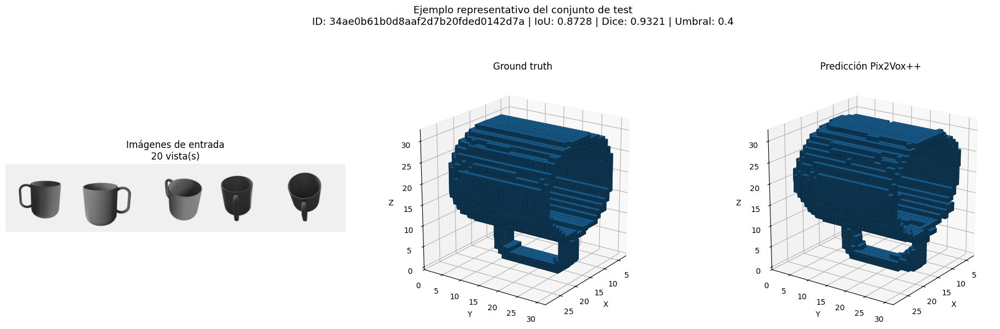


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_botellas_20_vistas_con_finetuning/ejemplo_representativo.png

RESULTADOS FINALES DEL EXPERIMENTO 8


,conjunto,numero_objetos,umbral,bce_x10_media,iou_media,dice_media,precision_voxel_media,recall_voxel_media,chamfer_superficie_media,f_score_superficie_media
0,validacion,26.0,0.4,1.1763,0.8368,0.9025,0.9078,0.9018,0.2610,0.9476
1,test,26.0,0.4,1.3172,0.7928,0.8655,0.8626,0.8742,0.3244,0.9395



[OK] EXPERIMENTO 6 RECUPERADO
Checkpoint:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/checkpoints/tazas_botellas_20_vistas_con_finetuning_mejor.pth

Métricas y figura:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/tazas_botellas_20_vistas_con_finetuning

NO se ha repetido el entrenamiento.


In [ ]:
# ============================================================
# 20.1. RECUPERACIÓN DEL EXPERIMENTO 8
# VEINTE VISTAS CON FINE-TUNING
#
# NO ENTRENA.
# Recupera el checkpoint que ya se ha generado.
# ============================================================


# ------------------------------------------------------------
# 0. SEGURIDAD
# ------------------------------------------------------------

# MUY IMPORTANTE:
# impedir que una ejecución posterior borre el modelo bueno.
FORZAR_REENTRENAMIENTO_20_VISTAS = False

REUTILIZAR_CHECKPOINT_20_VISTAS = True

REINICIAR_ENTRENAMIENTO_INCOMPLETO_20_VISTAS = False


print("=" * 75)
print("RECUPERACIÓN DEL EXPERIMENTO 8")
print("=" * 75)

print("Reentrenamiento:    NO")
print("Número de vistas:   20")
print(f"Dispositivo:        {DEVICE}")


# ------------------------------------------------------------
# 1. CORRECCIÓN DEFINITIVA DE LA CARGA SEGURA
# ------------------------------------------------------------

def obtener_globals_numpy_seguros_finetuning():
    """
    Tipos NumPy necesarios para abrir mediante
    weights_only=True checkpoints que contienen escalares
    NumPy en sus metadatos.
    """

    globals_seguros = []

    # Escalares NumPy.
    try:
        globals_seguros.append(
            np._core.multiarray.scalar
        )
    except AttributeError:
        pass

    globals_seguros.append(
        np.dtype
    )

    # Diferentes dtypes que pueden encontrarse en metadatos.
    tipos_numpy = [
        np.bool_,
        np.int8,
        np.int16,
        np.int32,
        np.int64,
        np.uint8,
        np.uint16,
        np.uint32,
        np.uint64,
        np.float16,
        np.float32,
        np.float64,
    ]

    for tipo_numpy in tipos_numpy:

        globals_seguros.append(
            type(
                np.dtype(tipo_numpy)
            )
        )

    # Eliminar duplicados.
    globals_unicos = []
    vistos = set()

    for objeto in globals_seguros:

        identificador = id(objeto)

        if identificador not in vistos:

            globals_unicos.append(
                objeto
            )

            vistos.add(
                identificador
            )

    return globals_unicos


def cargar_checkpoint_finetuning(
    modelo,
    ruta_checkpoint,
    dispositivo_carga="cpu",
    estricto=True,
):
    """
    Carga de forma segura checkpoints Pix2Vox fine-tuned,
    incluyendo los que contienen escalares NumPy.
    """

    ruta_checkpoint = Path(
        ruta_checkpoint
    )

    if not ruta_checkpoint.exists():

        raise FileNotFoundError(
            "No existe el checkpoint:\n"
            f"{ruta_checkpoint}"
        )

    globals_seguros = (
        obtener_globals_numpy_seguros_finetuning()
    )

    with torch.serialization.safe_globals(
        globals_seguros
    ):

        checkpoint = torch.load(
            ruta_checkpoint,
            map_location=dispositivo_carga,
            weights_only=True,
        )

    if (
        not isinstance(checkpoint, dict)
        or "model_state_dict" not in checkpoint
    ):

        raise ValueError(
            "El archivo no contiene un checkpoint "
            "fine-tuned válido."
        )

    resultado_carga = (
        modelo.load_state_dict(
            checkpoint[
                "model_state_dict"
            ],
            strict=estricto,
        )
    )

    metadata = {
        "formato": checkpoint.get(
            "formato"
        ),
        "epoca": checkpoint.get(
            "epoca"
        ),
        "mejor_iou_validacion": checkpoint.get(
            "mejor_iou_validacion"
        ),
        "mejor_dice_validacion": checkpoint.get(
            "mejor_dice_validacion"
        ),
        "mejor_umbral": checkpoint.get(
            "mejor_umbral"
        ),
        "configuracion_experimento": (
            convertir_metadata_checkpoint_segura(
                checkpoint.get(
                    "configuracion_experimento",
                    {},
                )
            )
        ),
        "claves_ausentes": list(
            resultado_carga.missing_keys
        ),
        "claves_inesperadas": list(
            resultado_carga.unexpected_keys
        ),
    }

    del checkpoint

    gc.collect()

    return metadata


print(
    "[OK] Carga segura de checkpoints corregida."
)


# ------------------------------------------------------------
# 2. LOCALIZAR CHECKPOINT E HISTORIAL
# ------------------------------------------------------------

NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT = (
    "tazas_botellas_20_vistas_con_finetuning"
)

_ruta_checkpoint_20 = (
    RUTA_CHECKPOINTS
    / (
        f"{NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT}"
        "_mejor.pth"
    )
)

_ruta_historial_20 = (
    RUTA_HISTORIALES
    / (
        f"{NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT}"
        "_historial.csv"
    )
)

_ruta_resumen_20 = (
    RUTA_HISTORIALES
    / (
        f"{NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT}"
        "_resumen.json"
    )
)

_ruta_metricas_20 = (
    RUTA_METRICAS
    / NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT
)


print("\nArchivos encontrados:")

print(
    "Checkpoint:",
    _ruta_checkpoint_20.exists()
)

print(
    "Historial: ",
    _ruta_historial_20.exists()
)

if not _ruta_checkpoint_20.exists():

    raise FileNotFoundError(
        "No se encuentra el checkpoint de veinte vistas."
    )

if not _ruta_historial_20.exists():

    raise FileNotFoundError(
        "No se encuentra el historial de veinte vistas."
    )


print(
    f"Tamaño checkpoint: "
    f"{_ruta_checkpoint_20.stat().st_size / 1024**2:.2f} MiB"
)


# ------------------------------------------------------------
# 3. RECUPERAR HISTORIAL
# ------------------------------------------------------------

_historial_20 = pd.read_csv(
    _ruta_historial_20
)

print(
    f"\nÉpocas registradas: "
    f"{len(_historial_20)}"
)

print(
    f"Última época registrada: "
    f"{int(_historial_20.iloc[-1]['epoca'])}"
)


# ------------------------------------------------------------
# 4. RECUPERAR EL MODELO
# ------------------------------------------------------------

print(
    "\nCreando Pix2Vox++/A..."
)

_modelo_20 = Pix2VoxPlusPlusA(
    usar_refiner=True,
    usar_merger=True,
    usar_pesos_imagenet=False,
)


print(
    "Cargando checkpoint fine-tuned..."
)

_metadata_20 = cargar_checkpoint_finetuning(
    modelo=_modelo_20,
    ruta_checkpoint=_ruta_checkpoint_20,
    dispositivo_carga="cpu",
    estricto=True,
)


if (
    _metadata_20["claves_ausentes"]
    or _metadata_20["claves_inesperadas"]
):

    raise RuntimeError(
        "El checkpoint no coincide con "
        "la arquitectura Pix2Vox++/A."
    )


_modelo_20 = _modelo_20.to(
    DEVICE
)

_modelo_20.eval()


print("\n" + "=" * 75)
print("CHECKPOINT RECUPERADO")
print("=" * 75)

print(
    f"Formato:              "
    f"{_metadata_20['formato']}"
)

print(
    f"Mejor época:          "
    f"{_metadata_20['epoca']}"
)

print(
    f"Mejor IoU validación: "
    f"{float(_metadata_20['mejor_iou_validacion']):.4f}"
)

print(
    f"Mejor Dice:           "
    f"{float(_metadata_20['mejor_dice_validacion']):.4f}"
)

print(
    f"Mejor umbral:         "
    f"{float(_metadata_20['mejor_umbral']):.1f}"
)


# ------------------------------------------------------------
# 5. CREAR DATALOADERS SOLO PARA EVALUACIÓN
# ------------------------------------------------------------

print(
    "\nCreando DataLoader de validación y test..."
)

_cargadores_20 = crear_dataloaders_pix2vox(
    numero_vistas=20,
    conjunto_categorias="tazas",
    tamano_lote_fisico=1,
)

_loader_validacion_20 = (
    _cargadores_20[
        "loader_validacion"
    ]
)

_loader_test_20 = (
    _cargadores_20[
        "loader_test"
    ]
)


# ------------------------------------------------------------
# 6. EVALUACIÓN DEFINITIVA
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("EVALUACIÓN DEFINITIVA DE VEINTE VISTAS")
print("=" * 75)

_resultado_20 = (
    evaluar_y_guardar_experimento_pix2vox(
        modelo=_modelo_20,
        loader_validacion=(
            _loader_validacion_20
        ),
        loader_test=(
            _loader_test_20
        ),
        nombre_experimento=(
            NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT
        ),
        numero_vistas=20,
        tipo_experimento="con_finetuning",
        configuracion_extra={
            "categoria": CATEGORIA_TAZAS,
            "fine_tuning": True,
            "mejor_epoca": int(
                _metadata_20["epoca"]
            ),
            "mejor_iou_validacion_entrenamiento": float(
                _metadata_20[
                    "mejor_iou_validacion"
                ]
            ),
            "mejor_dice_validacion_entrenamiento": float(
                _metadata_20[
                    "mejor_dice_validacion"
                ]
            ),
            "mejor_umbral_entrenamiento": float(
                _metadata_20[
                    "mejor_umbral"
                ]
            ),
            "ruta_checkpoint_finetuned": str(
                _ruta_checkpoint_20
            ),
            "ruta_historial": str(
                _ruta_historial_20
            ),
            "vistas_fijas_evaluacion": (
                INDICES_VISTAS_EVALUACION[20]
            ),
            "precision": "float32",
            "resolucion_voxel": int(
                RESOLUCION_VOXEL
            ),
            "recuperado_tras_error_carga": True,
        },
        sobrescribir=True,
    )
)


# ------------------------------------------------------------
# 7. GENERAR FIGURA REPRESENTATIVA
# ------------------------------------------------------------

_metadata_figura_20 = (
    visualizar_ejemplo_representativo_pix2vox(
        modelo=_modelo_20,
        dataloader_test=(
            _loader_test_20
        ),
        tabla_test_por_objeto=(
            _resultado_20[
                "resultado_test_completo"
            ][
                "tabla_por_objeto"
            ]
        ),
        umbral=(
            _resultado_20[
                "umbral_seleccionado"
            ]
        ),
        ruta_experimento=(
            _resultado_20[
                "ruta_experimento"
            ]
        ),
        numero_vistas=20,
    )
)


# ------------------------------------------------------------
# 8. RECONSTRUIR RESUMEN DEL ENTRENAMIENTO
# ------------------------------------------------------------

_tiempo_train_20 = float(
    _historial_20[
        "train_tiempo_segundos"
    ].sum()
)

_tiempo_validacion_20 = float(
    _historial_20[
        "validacion_tiempo_segundos"
    ].sum()
)


resumen_finetuning_20_vistas_con_ft = {
    "nombre_experimento": (
        NOMBRE_EXPERIMENTO_20_VISTAS_CON_FT
    ),
    "mejor_epoca": int(
        _metadata_20["epoca"]
    ),
    "mejor_iou_validacion": float(
        _metadata_20[
            "mejor_iou_validacion"
        ]
    ),
    "mejor_dice_validacion": float(
        _metadata_20[
            "mejor_dice_validacion"
        ]
    ),
    "mejor_umbral": float(
        _metadata_20[
            "mejor_umbral"
        ]
    ),
    "epocas_ejecutadas": int(
        len(_historial_20)
    ),
    "tiempo_train_segundos": (
        _tiempo_train_20
    ),
    "tiempo_validacion_segundos": (
        _tiempo_validacion_20
    ),
    "ruta_checkpoint": str(
        _ruta_checkpoint_20
    ),
    "ruta_historial": str(
        _ruta_historial_20
    ),
    "recuperado_tras_error_carga": True,
}


guardar_json_atomico(
    contenido=(
        resumen_finetuning_20_vistas_con_ft
    ),
    ruta_destino=(
        _ruta_resumen_20
    ),
)


# ------------------------------------------------------------
# 9. MOSTRAR RESULTADOS FINALES
# ------------------------------------------------------------

tabla_resultados_20_vistas_con_ft = (
    _resultado_20[
        "tabla_resumen"
    ].copy()
)


print("\n" + "=" * 75)
print("RESULTADOS FINALES DEL EXPERIMENTO 8")
print("=" * 75)

display(
    tabla_resultados_20_vistas_con_ft[
        [
            "conjunto",
            "numero_objetos",
            "umbral",
            "bce_x10_media",
            "iou_media",
            "dice_media",
            "precision_voxel_media",
            "recall_voxel_media",
            "chamfer_superficie_media",
            "f_score_superficie_media",
        ]
    ].round(4)
)


ruta_checkpoint_20_vistas_con_ft = Path(
    _ruta_checkpoint_20
)

ruta_experimento_20_vistas_con_ft = Path(
    _resultado_20[
        "ruta_experimento"
    ]
)


# ------------------------------------------------------------
# 10. LIBERAR GPU
# ------------------------------------------------------------

_modelo_20.to(
    "cpu"
)

del _modelo_20
del _resultado_20
del _metadata_figura_20
del _metadata_20
del _cargadores_20
del _loader_validacion_20
del _loader_test_20
del _historial_20
del _tiempo_train_20
del _tiempo_validacion_20
del _ruta_checkpoint_20
del _ruta_historial_20
del _ruta_resumen_20
del _ruta_metricas_20

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


print("\n" + "=" * 75)
print("[OK] EXPERIMENTO 6 RECUPERADO")
print("=" * 75)

print(
    "Checkpoint:"
)

print(
    ruta_checkpoint_20_vistas_con_ft
)

print(
    "\nMétricas y figura:"
)

print(
    ruta_experimento_20_vistas_con_ft
)

print(
    "\nNO se ha repetido el entrenamiento."
)

# Preparación experimentos 9 y 10

## 21. Preparación de los experimentos 9 y 10

En esta sección se prepara el conjunto de datos que se utilizará de forma idéntica en los experimentos 9 y 10.

A partir de los resultados del experimento 8, se amplía el entrenamiento incorporando dos categorías adicionales relacionadas geométricamente con las tazas. El nuevo conjunto incluye cuatro categorías de ShapeNet:

- `03797390`: tazas.
- `02876657`: botellas.
- `03593526`: tarros.
- `02880940`: cuencos.

Para evitar repetir operaciones innecesariamente costosas sobre Google Drive, se reutiliza el catálogo previamente validado de tazas y botellas y únicamente se comprueban los objetos correspondientes a las dos nuevas categorías.

Los experimentos 9 y 10 utilizarán exactamente las mismas divisiones de entrenamiento, validación y test. Además, las tazas conservarán el conjunto de test histórico utilizado en los experimentos anteriores, lo que permitirá comparar directamente el rendimiento obtenido sobre esta categoría.

También se realiza una comprobación específica de posibles solapamientos entre el conjunto de entrenamiento del experimento 8 y el test histórico de tazas, con el objetivo de detectar posibles fugas de información.

Finalmente, se crean los DataLoader específicos que permitirán utilizar estas mismas divisiones tanto con 20 vistas en el experimento 9 como con 5 vistas en el experimento 10.

In [ ]:
# ============================================================
# PREPARACIÓN EXPERIMENTOS 9 Y 10
# Ejecutar después de 14.1 y después de VOLVER A EJECUTAR 12.1
# ============================================================

import os

CATEGORIAS_EXP_9_10 = [
    "03797390",  # taza
    "02876657",  # botella
    "03593526",  # tarro
    "02880940",  # cuenco
]

RUTA_CATALOGO_EXP9 = (
    RUTA_CATALOGOS
    / "catalogo_exp9_10_4categorias.csv"
)

RUTA_TRAIN_EXP9 = (
    RUTA_DIVISIONES
    / "exp9_10_4categorias_train.csv"
)

RUTA_VAL_EXP9 = (
    RUTA_DIVISIONES
    / "exp9_10_4categorias_validacion.csv"
)

RUTA_TEST_EXP9 = (
    RUTA_DIVISIONES
    / "exp9_10_4categorias_test.csv"
)


def _normalizar_exp9(df):

    df = df.copy()

    df["categoria"] = (
        df["categoria"]
        .astype(str)
        .str.zfill(8)
    )

    df["identificador"] = (
        df["identificador"]
        .astype(str)
    )

    return df


COLUMNAS_EXP9 = [
    "categoria",
    "identificador",
    "ruta_carpeta_objeto",
    "ruta_rendering",
    "ruta_binvox",
    "numero_imagenes",
] + [
    f"vista_{i:02d}"
    for i in range(20)
]


# ------------------------------------------------------------
# 1. Catálogo
#
# Reutilizamos las 625 tazas+botellas ya comprobadas.
# Solo comprobamos físicamente tarros y cuencos.
# ------------------------------------------------------------

def _catalogar_categoria_exp9(
    categoria
):
    """
    Catalogación rápida para Exp. 9/10.

    No entra en cada carpeta rendering.
    Solo utiliza objetos presentes simultáneamente
    en la carpeta de imágenes y en la de vóxeles.

    Las rutas de las 20 vistas se construyen directamente.
    """

    ruta_img_cat = (
        RUTA_IMAGENES
        / categoria
    )

    ruta_vox_cat = (
        RUTA_VOXELES
        / categoria
    )


    # --------------------------------------------------------
    # Obtener IDs disponibles con UNA lectura por categoría
    # --------------------------------------------------------

    ids_imagenes = {
        entrada.name
        for entrada
        in os.scandir(ruta_img_cat)
        if entrada.is_dir()
    }

    ids_voxeles = {
        entrada.name
        for entrada
        in os.scandir(ruta_vox_cat)
        if entrada.is_dir()
    }


    # Solo utilizamos objetos presentes en ambos sitios.
    ids_validos = sorted(
        ids_imagenes
        & ids_voxeles
    )


    registros = []


    # --------------------------------------------------------
    # Construir rutas SIN consultar Drive objeto por objeto
    # --------------------------------------------------------

    for identificador in ids_validos:

        carpeta = (
            ruta_img_cat
            / identificador
        )

        rendering = (
            carpeta
            / "rendering"
        )

        binvox = (
            ruta_vox_cat
            / identificador
            / "model.binvox"
        )


        registro = {

            "categoria":
                categoria,

            "identificador":
                identificador,

            "ruta_carpeta_objeto":
                str(carpeta),

            "ruta_rendering":
                str(rendering),

            "ruta_binvox":
                str(binvox),

            "numero_imagenes":
                20,
        }


        for i, vista in enumerate(
            NOMBRES_VISTAS
        ):

            registro[
                f"vista_{i:02d}"
            ] = str(
                rendering
                / vista
            )


        registros.append(
            registro
        )


    return (
        pd.DataFrame(
            registros
        ),
        0,
    )


if RUTA_CATALOGO_EXP9.exists():

    print(
        "Cargando catálogo Exp. 9/10 "
        "ya creado..."
    )

    df_catalogo_exp9 = (
        _normalizar_exp9(
            pd.read_csv(
                RUTA_CATALOGO_EXP9,
                dtype={
                    "categoria": str,
                    "identificador": str,
                },
            )
        )
    )

else:

    print(
        "Creando catálogo Exp. 9/10..."
    )

    # Tazas + botellas ya fueron
    # comprobadas anteriormente.
    df_base = (
        _normalizar_exp9(
            df_catalogo
        )
    )

    df_base = (
        df_base.loc[
            df_base[
                "categoria"
            ].isin(
                DOS_CATEGORIAS
            ),
            COLUMNAS_EXP9,
        ]
        .copy()
    )

    nuevos = []

    for categoria in [
        "03593526",
        "02880940",
    ]:

        print(
            f"Validando "
            f"{categoria}..."
        )

        (
            df_nuevo,
            n_excluidos,
        ) = (
            _catalogar_categoria_exp9(
                categoria
            )
        )

        print(
            f"  válidos="
            f"{len(df_nuevo)} | "
            f"excluidos="
            f"{n_excluidos}"
        )

        nuevos.append(
            df_nuevo[
                COLUMNAS_EXP9
            ]
        )

    df_catalogo_exp9 = (
        pd.concat(
            [
                df_base
            ]
            + nuevos,
            ignore_index=True,
        )
    )

    df_catalogo_exp9 = (
        _normalizar_exp9(
            df_catalogo_exp9
        )
        .drop_duplicates(
            [
                "categoria",
                "identificador",
            ]
        )
        .sort_values(
            [
                "categoria",
                "identificador",
            ]
        )
        .reset_index(
            drop=True
        )
    )

    df_catalogo_exp9.to_csv(
        RUTA_CATALOGO_EXP9,
        index=False,
    )


# ------------------------------------------------------------
# 2. Splits
#
# TAZAS:
# exactamente el mismo split histórico.
#
# BOTELLAS + TARROS + CUENCOS:
# nuevo 70/15/15 estratificado.
# ------------------------------------------------------------

def _leer_split(
    ruta
):

    return _normalizar_exp9(
        pd.read_csv(
            ruta,
            dtype={
                "categoria": str,
                "identificador": str,
            },
        )
    )


def _recuperar_tazas(
    ruta,
    conjunto,
):

    claves = (
        _leer_split(
            ruta
        )
    )

    claves = (
        claves.loc[
            claves["categoria"]
            == CATEGORIA_TAZAS,
            [
                "categoria",
                "identificador",
            ],
        ]
    )

    df = claves.merge(
        df_catalogo_exp9,
        on=[
            "categoria",
            "identificador",
        ],
        how="left",
        validate="one_to_one",
    )

    if (
        df["ruta_binvox"]
        .isna()
        .any()
    ):

        raise RuntimeError(
            "Faltan tazas históricas "
            "en el catálogo Exp. 9."
        )

    df["conjunto"] = (
        conjunto
    )

    return df


splits_existen = all(
    ruta.exists()
    for ruta in [
        RUTA_TRAIN_EXP9,
        RUTA_VAL_EXP9,
        RUTA_TEST_EXP9,
    ]
)


if splits_existen:

    print(
        "Cargando splits Exp. 9/10 "
        "ya creados..."
    )

    df_train_exp9 = (
        _leer_split(
            RUTA_TRAIN_EXP9
        )
    )

    df_val_exp9 = (
        _leer_split(
            RUTA_VAL_EXP9
        )
    )

    df_test_exp9 = (
        _leer_split(
            RUTA_TEST_EXP9
        )
    )

else:

    ruta_tazas_train = (
        RUTA_DIVISIONES
        / "tazas_train.csv"
    )

    ruta_tazas_val = (
        RUTA_DIVISIONES
        / "tazas_validacion.csv"
    )

    ruta_tazas_test = (
        RUTA_DIVISIONES
        / "tazas_test.csv"
    )

    if not all(
        ruta.exists()
        for ruta in [
            ruta_tazas_train,
            ruta_tazas_val,
            ruta_tazas_test,
        ]
    ):

        raise FileNotFoundError(
            "Faltan los splits históricos "
            "de tazas. No lances el Exp. 9."
        )

    # --------------------------
    # Tazas
    # --------------------------

    tazas_train = (
        _recuperar_tazas(
            ruta_tazas_train,
            "train",
        )
    )

    tazas_val = (
        _recuperar_tazas(
            ruta_tazas_val,
            "validacion",
        )
    )

    tazas_test = (
        _recuperar_tazas(
            ruta_tazas_test,
            "test",
        )
    )

    # --------------------------
    # Las otras tres categorías
    # --------------------------

    otras = (
        df_catalogo_exp9[
            df_catalogo_exp9[
                "categoria"
            ]
            != CATEGORIA_TAZAS
        ]
        .copy()
    )

    (
        otras_train,
        otras_tmp,
    ) = train_test_split(
        otras,
        test_size=0.30,
        random_state=SEED,
        shuffle=True,
        stratify=(
            otras[
                "categoria"
            ]
        ),
    )

    (
        otras_val,
        otras_test,
    ) = train_test_split(
        otras_tmp,
        test_size=0.50,
        random_state=SEED,
        shuffle=True,
        stratify=(
            otras_tmp[
                "categoria"
            ]
        ),
    )

    otras_train[
        "conjunto"
    ] = "train"

    otras_val[
        "conjunto"
    ] = "validacion"

    otras_test[
        "conjunto"
    ] = "test"

    # --------------------------
    # Unir
    # --------------------------

    df_train_exp9 = (
        pd.concat(
            [
                tazas_train,
                otras_train,
            ],
            ignore_index=True,
        )
    )

    df_val_exp9 = (
        pd.concat(
            [
                tazas_val,
                otras_val,
            ],
            ignore_index=True,
        )
    )

    df_test_exp9 = (
        pd.concat(
            [
                tazas_test,
                otras_test,
            ],
            ignore_index=True,
        )
    )

    df_train_exp9.to_csv(
        RUTA_TRAIN_EXP9,
        index=False,
    )

    df_val_exp9.to_csv(
        RUTA_VAL_EXP9,
        index=False,
    )

    df_test_exp9.to_csv(
        RUTA_TEST_EXP9,
        index=False,
    )


# ------------------------------------------------------------
# 3. Comprobaciones de fuga
# ------------------------------------------------------------

def _claves(
    df
):

    return set(
        zip(
            df["categoria"],
            df["identificador"],
        )
    )


assert not (
    _claves(df_train_exp9)
    & _claves(df_val_exp9)
)

assert not (
    _claves(df_train_exp9)
    & _claves(df_test_exp9)
)

assert not (
    _claves(df_val_exp9)
    & _claves(df_test_exp9)
)


test_tazas_exp9 = set(
    df_test_exp9.loc[
        df_test_exp9[
            "categoria"
        ]
        == CATEGORIA_TAZAS,
        "identificador",
    ]
)


# ------------------------------------------------------------
# Auditoría del Experimento 8
# ------------------------------------------------------------

ruta_tb_train = (
    RUTA_DIVISIONES
    / "tazas_botellas_train.csv"
)

solapamiento_exp8 = set()


if ruta_tb_train.exists():

    train_exp8 = (
        _leer_split(
            ruta_tb_train
        )
    )

    tazas_train_exp8 = set(
        train_exp8.loc[
            train_exp8[
                "categoria"
            ]
            == CATEGORIA_TAZAS,
            "identificador",
        ]
    )

    solapamiento_exp8 = (
        tazas_train_exp8
        & test_tazas_exp9
    )


# ------------------------------------------------------------
# 4. DataLoaders específicos para Exp. 9 y 10
# ------------------------------------------------------------

def _loader_exp9(
    df,
    numero_vistas,
    modo,
    batch_size,
    shuffle=False,
):

    dataset = DatasetPix2Vox(
        dataframe=(
            df.reset_index(
                drop=True
            )
        ),
        numero_vistas=(
            numero_vistas
        ),
        modo=modo,
        fondo_aleatorio_entrenamiento=(
            modo == "train"
        ),
        cachear_voxeles=True,
    )

    generador = None

    if shuffle:

        generador = (
            torch.Generator()
            .manual_seed(
                SEED
            )
        )

    return DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        num_workers=(
            NUM_WORKERS_DATALOADER
        ),
        pin_memory=(
            USAR_PIN_MEMORY
        ),
        drop_last=False,
        worker_init_fn=(
            inicializar_worker
        ),
        generator=generador,
        persistent_workers=(
            NUM_WORKERS_DATALOADER
            > 0
        ),
    )


def crear_dataloaders_exp9_10(
    numero_vistas,
    batch_size=1,
):

    val_tazas = (
        df_val_exp9[
            df_val_exp9[
                "categoria"
            ]
            == CATEGORIA_TAZAS
        ]
        .copy()
    )

    test_tazas = (
        df_test_exp9[
            df_test_exp9[
                "categoria"
            ]
            == CATEGORIA_TAZAS
        ]
        .copy()
    )

    return {

        "train":
            _loader_exp9(
                df_train_exp9,
                numero_vistas,
                "train",
                batch_size,
                True,
            ),

        "val_global":
            _loader_exp9(
                df_val_exp9,
                numero_vistas,
                "validacion",
                batch_size,
            ),

        "test_global":
            _loader_exp9(
                df_test_exp9,
                numero_vistas,
                "test",
                batch_size,
            ),

        "val_tazas":
            _loader_exp9(
                val_tazas,
                numero_vistas,
                "validacion",
                batch_size,
            ),

        "test_tazas":
            _loader_exp9(
                test_tazas,
                numero_vistas,
                "test",
                batch_size,
            ),
    }


# ------------------------------------------------------------
# 5. Resumen
# ------------------------------------------------------------

print(
    "\n" + "=" * 75
)

print(
    "PREPARACIÓN EXP. 9/10 COMPLETADA"
)

print(
    "=" * 75
)

print(
    f"Categorías: "
    f"{CATEGORIAS_EXP_9_10}"
)

print(
    f"Objetos válidos: "
    f"{len(df_catalogo_exp9)}"
)

print(
    f"Train="
    f"{len(df_train_exp9)} | "
    f"Val="
    f"{len(df_val_exp9)} | "
    f"Test="
    f"{len(df_test_exp9)}"
)

print(
    f"Tazas en test: "
    f"{len(test_tazas_exp9)}"
)

print(
    f"Solapamiento Exp. 8 train / "
    f"test histórico tazas: "
    f"{len(solapamiento_exp8)}"
)


if solapamiento_exp8:

    print(
        "[AVISO] El 0.7928 del Exp. 8 "
        "puede estar inflado por fuga "
        "de tazas."
    )


splits_mostrar = pd.concat(
    [
        df_train_exp9,
        df_val_exp9,
        df_test_exp9,
    ],
    ignore_index=True,
)

display(
    pd.crosstab(
        splits_mostrar[
            "categoria"
        ],
        splits_mostrar[
            "conjunto"
        ],
        margins=True,
    )
)

print(
    "[OK] Exp. 9 y 10 compartirán "
    "exactamente estos splits."
)

Creando catálogo Exp. 9/10...
Validando 03593526...
  válidos=545 | excluidos=0
Validando 02880940...
  válidos=146 | excluidos=0

PREPARACIÓN EXP. 9/10 COMPLETADA
Categorías: ['03797390', '02876657', '03593526', '02880940']
Objetos válidos: 1316
Train=920 | Val=198 | Test=198
Tazas en test: 26
Solapamiento Exp. 8 train / test histórico tazas: 16
[AVISO] El 0.7928 del Exp. 8 puede estar inflado por fuga de tazas.


conjunto,test,train,validacion,All
categoria,,,,
02876657,68,317,68,453
02880940,22,102,22,146
03593526,82,381,82,545
03797390,26,120,26,172
All,198,920,198,1316


[OK] Exp. 9 y 10 compartirán exactamente estos splits.


In [ ]:
# ============================================================
# CACHÉ LOCAL RÁPIDA EXPERIMENTOS 9 Y 10
#
# IMPORTANTE:
#
# NO se preprocesan las imágenes.
# NO se redimensionan.
# NO se convierten.
#
# Se copian BYTE A BYTE desde Google Drive a /content.
#
# DatasetPix2Vox seguirá siendo exactamente el original.
#
# Por tanto NO cambia:
# - ningún objeto
# - ninguna imagen
# - ninguna vista
# - selección aleatoria de vistas
# - fondos aleatorios
# - resize
# - normalización
# - voxeles
# - modelo
# - loss
# - optimizador
# ============================================================

import os
import gc
import time
import shutil
import random

import numpy as np
import pandas as pd
import torch

from pathlib import Path
from concurrent.futures import ThreadPoolExecutor
from tqdm.auto import tqdm
from torch.utils.data import DataLoader


# ============================================================
# CONFIGURACIÓN
# ============================================================

RUTA_CACHE_RAW_EXP9_10 = Path(
    "/content/Pix2Vox_raw_exp9_10"
)

RUTA_CACHE_RAW_IMAGENES = (
    RUTA_CACHE_RAW_EXP9_10
    / "imagenes"
)

RUTA_CACHE_RAW_VOXELES = (
    RUTA_CACHE_RAW_EXP9_10
    / "voxeles"
)


# Lectura paralela desde Drive.
#
# Como son miles de archivos pequeños,
# varios threads ayudan a ocultar la latencia.
NUM_HILOS_COPIA = min(
    12,
    max(
        4,
        (os.cpu_count() or 4) * 2
    )
)


# TRAIN:
# dejamos 0 para conservar exactamente
# el comportamiento aleatorio original.
NUM_WORKERS_TRAIN_LOCAL = 0


# VALIDACIÓN / TEST:
# no existe selección aleatoria de vistas,
# por lo que podemos leer varios objetos simultáneamente.
NUM_WORKERS_EVAL_LOCAL = min(
    4,
    max(
        2,
        os.cpu_count() or 2
    )
)


# ============================================================
# DATAFRAME CON LOS 1316 OBJETOS
# ============================================================

df_todos_exp9_10 = (
    pd.concat(
        [
            df_train_exp9,
            df_val_exp9,
            df_test_exp9,
        ],
        ignore_index=True,
    )
    .drop_duplicates(
        subset=[
            "categoria",
            "identificador",
        ]
    )
    .reset_index(
        drop=True
    )
)


df_todos_exp9_10[
    "categoria"
] = (
    df_todos_exp9_10[
        "categoria"
    ]
    .astype(str)
    .str.zfill(8)
)


df_todos_exp9_10[
    "identificador"
] = (
    df_todos_exp9_10[
        "identificador"
    ]
    .astype(str)
)


print(
    "=" * 75
)

print(
    "CACHÉ LOCAL RAW EXP. 9/10"
)

print(
    "=" * 75
)

print(
    f"Objetos:          "
    f"{len(df_todos_exp9_10)}"
)

print(
    f"Imágenes:         "
    f"{len(df_todos_exp9_10) * 20}"
)

print(
    f"Threads de copia: "
    f"{NUM_HILOS_COPIA}"
)


# ============================================================
# FUNCIONES PARA OBTENER LAS RUTAS LOCALES
# ============================================================

def ruta_local_imagen_exp9_10(
    categoria,
    identificador,
    nombre_archivo,
):

    return (
        RUTA_CACHE_RAW_IMAGENES
        / str(categoria)
        / str(identificador)
        / "rendering"
        / nombre_archivo
    )


def ruta_local_voxel_exp9_10(
    categoria,
    identificador,
):

    return (
        RUTA_CACHE_RAW_VOXELES
        / str(categoria)
        / str(identificador)
        / "model.binvox"
    )


# ============================================================
# CREAR LISTA DE ARCHIVOS
# ============================================================

tareas_copia = []


for _, fila in df_todos_exp9_10.iterrows():

    categoria = str(
        fila[
            "categoria"
        ]
    ).zfill(8)

    identificador = str(
        fila[
            "identificador"
        ]
    )


    # --------------------------------------------------------
    # Las 20 imágenes EXACTAS
    # --------------------------------------------------------

    for indice_vista in range(20):

        origen = Path(
            fila[
                f"vista_{indice_vista:02d}"
            ]
        )

        destino = (
            ruta_local_imagen_exp9_10(
                categoria=(
                    categoria
                ),
                identificador=(
                    identificador
                ),
                nombre_archivo=(
                    origen.name
                ),
            )
        )


        tareas_copia.append(
            (
                origen,
                destino,
            )
        )


    # --------------------------------------------------------
    # BINVOX
    # --------------------------------------------------------

    origen_voxel = Path(
        fila[
            "ruta_binvox"
        ]
    )

    destino_voxel = (
        ruta_local_voxel_exp9_10(
            categoria=(
                categoria
            ),
            identificador=(
                identificador
            ),
        )
    )


    tareas_copia.append(
        (
            origen_voxel,
            destino_voxel,
        )
    )


print(
    f"Archivos totales: "
    f"{len(tareas_copia)}"
)


# ============================================================
# COPIA RÁPIDA
# ============================================================

def copiar_archivo_cache_raw(
    tarea
):

    origen, destino = tarea


    # --------------------------------------------------------
    # Permite REANUDAR la caché.
    #
    # Si una ejecución se interrumpe, los archivos ya copiados
    # no vuelven a copiarse.
    # --------------------------------------------------------

    if (
        destino.exists()
        and
        destino.stat().st_size > 0
    ):

        return (
            False,
            destino.stat().st_size,
        )


    destino.parent.mkdir(
        parents=True,
        exist_ok=True,
    )


    # Copia BYTE A BYTE.
    #
    # No hay:
    # - Image.open
    # - decode
    # - resize
    # - NumPy
    # - procesamiento
    shutil.copyfile(
        origen,
        destino,
    )


    return (
        True,
        destino.stat().st_size,
    )


RUTA_CACHE_RAW_EXP9_10.mkdir(
    parents=True,
    exist_ok=True,
)


inicio_copia = (
    time.perf_counter()
)


numero_copiados = 0
bytes_totales = 0


with ThreadPoolExecutor(
    max_workers=(
        NUM_HILOS_COPIA
    )
) as executor:

    resultados = executor.map(
        copiar_archivo_cache_raw,
        tareas_copia,
    )


    for copiado, numero_bytes in tqdm(
        resultados,
        total=len(tareas_copia),
        desc="Copiando a SSD local",
    ):

        if copiado:

            numero_copiados += 1

        bytes_totales += (
            numero_bytes
        )


tiempo_copia = (
    time.perf_counter()
    - inicio_copia
)


print(
    "\n" + "=" * 75
)

print(
    "COPIA LOCAL FINALIZADA"
)

print(
    "=" * 75
)

print(
    f"Archivos nuevos:    "
    f"{numero_copiados}"
)

print(
    f"Archivos totales:   "
    f"{len(tareas_copia)}"
)

print(
    f"Tamaño total:       "
    f"{bytes_totales / (1024 ** 3):.2f} GiB"
)

print(
    f"Tiempo de copia:     "
    f"{tiempo_copia / 60:.2f} min"
)


# ============================================================
# ADAPTAR UN DATAFRAME A LAS RUTAS LOCALES
# ============================================================

def adaptar_dataframe_local_exp9_10(
    dataframe
):

    dataframe_local = (
        dataframe
        .copy()
        .reset_index(
            drop=True
        )
    )


    dataframe_local[
        "categoria"
    ] = (
        dataframe_local[
            "categoria"
        ]
        .astype(str)
        .str.zfill(8)
    )


    dataframe_local[
        "identificador"
    ] = (
        dataframe_local[
            "identificador"
        ]
        .astype(str)
    )


    # --------------------------------------------------------
    # Sustituir las 20 rutas de imagen
    # --------------------------------------------------------

    for indice_fila in range(
        len(
            dataframe_local
        )
    ):

        categoria = str(
            dataframe_local.at[
                indice_fila,
                "categoria",
            ]
        )

        identificador = str(
            dataframe_local.at[
                indice_fila,
                "identificador",
            ]
        )


        for indice_vista in range(20):

            columna = (
                f"vista_{indice_vista:02d}"
            )

            origen = Path(
                dataframe_local.at[
                    indice_fila,
                    columna,
                ]
            )


            dataframe_local.at[
                indice_fila,
                columna,
            ] = str(
                ruta_local_imagen_exp9_10(
                    categoria=(
                        categoria
                    ),
                    identificador=(
                        identificador
                    ),
                    nombre_archivo=(
                        origen.name
                    ),
                )
            )


        # ----------------------------------------------------
        # BINVOX
        # ----------------------------------------------------

        dataframe_local.at[
            indice_fila,
            "ruta_binvox",
        ] = str(
            ruta_local_voxel_exp9_10(
                categoria=(
                    categoria
                ),
                identificador=(
                    identificador
                ),
            )
        )


        # ----------------------------------------------------
        # Estas columnas no son imprescindibles para Dataset,
        # pero las dejamos coherentes.
        # ----------------------------------------------------

        if (
            "ruta_rendering"
            in dataframe_local.columns
        ):

            dataframe_local.at[
                indice_fila,
                "ruta_rendering",
            ] = str(
                RUTA_CACHE_RAW_IMAGENES
                / categoria
                / identificador
                / "rendering"
            )


        if (
            "ruta_carpeta_objeto"
            in dataframe_local.columns
        ):

            dataframe_local.at[
                indice_fila,
                "ruta_carpeta_objeto",
            ] = str(
                RUTA_CACHE_RAW_IMAGENES
                / categoria
                / identificador
            )


    return (
        dataframe_local
    )


# ============================================================
# CREAR LOS DATAFRAMES LOCALES UNA SOLA VEZ
# ============================================================

df_train_exp9_local = (
    adaptar_dataframe_local_exp9_10(
        df_train_exp9
    )
)

df_val_exp9_local = (
    adaptar_dataframe_local_exp9_10(
        df_val_exp9
    )
)

df_test_exp9_local = (
    adaptar_dataframe_local_exp9_10(
        df_test_exp9
    )
)


# ============================================================
# DATALOADER LOCAL
#
# IMPORTANTE:
# SE SIGUE USANDO DatasetPix2Vox ORIGINAL.
# ============================================================

def _crear_loader_local_exp9_10(
    dataframe,
    numero_vistas,
    modo,
    batch_size,
    shuffle,
):

    dataset = (
        DatasetPix2Vox(

            dataframe=(
                dataframe
            ),

            numero_vistas=(
                numero_vistas
            ),

            modo=(
                modo
            ),

            fondo_aleatorio_entrenamiento=(
                modo == "train"
            ),

            cachear_voxeles=True,
        )
    )


    if modo == "train":

        # ----------------------------------------------------
        # NO cambiamos la generación aleatoria original.
        # ----------------------------------------------------

        numero_workers = (
            NUM_WORKERS_TRAIN_LOCAL
        )

    else:

        # Validación/test tienen vistas fijas.
        numero_workers = (
            NUM_WORKERS_EVAL_LOCAL
        )


    argumentos = {

        "dataset":
            dataset,

        "batch_size":
            batch_size,

        "shuffle":
            shuffle,

        "num_workers":
            numero_workers,

        "pin_memory":
            USAR_PIN_MEMORY,

        "drop_last":
            False,

        "worker_init_fn":
            inicializar_worker,

        "persistent_workers":
            (
                numero_workers > 0
            ),
    }


    if shuffle:

        generador = (
            torch.Generator()
        )

        generador.manual_seed(
            SEED
        )

        argumentos[
            "generator"
        ] = generador


    if numero_workers > 0:

        argumentos[
            "prefetch_factor"
        ] = 2


    return DataLoader(
        **argumentos
    )


# ============================================================
# REDEFINIR LA FUNCIÓN UTILIZADA POR EXP. 9 Y 10
# ============================================================

def crear_dataloaders_exp9_10(
    numero_vistas,
    batch_size=1,
):

    val_tazas = (
        df_val_exp9_local.loc[
            df_val_exp9_local[
                "categoria"
            ]
            .astype(str)
            .str.zfill(8)
            == "03797390"
        ]
        .copy()
    )


    test_tazas = (
        df_test_exp9_local.loc[
            df_test_exp9_local[
                "categoria"
            ]
            .astype(str)
            .str.zfill(8)
            == "03797390"
        ]
        .copy()
    )


    return {

        "train":
            _crear_loader_local_exp9_10(
                dataframe=(
                    df_train_exp9_local
                ),
                numero_vistas=(
                    numero_vistas
                ),
                modo="train",
                batch_size=(
                    batch_size
                ),
                shuffle=True,
            ),

        "val_global":
            _crear_loader_local_exp9_10(
                dataframe=(
                    df_val_exp9_local
                ),
                numero_vistas=(
                    numero_vistas
                ),
                modo="validacion",
                batch_size=(
                    batch_size
                ),
                shuffle=False,
            ),

        "test_global":
            _crear_loader_local_exp9_10(
                dataframe=(
                    df_test_exp9_local
                ),
                numero_vistas=(
                    numero_vistas
                ),
                modo="test",
                batch_size=(
                    batch_size
                ),
                shuffle=False,
            ),

        "val_tazas":
            _crear_loader_local_exp9_10(
                dataframe=(
                    val_tazas
                ),
                numero_vistas=(
                    numero_vistas
                ),
                modo="validacion",
                batch_size=(
                    batch_size
                ),
                shuffle=False,
            ),

        "test_tazas":
            _crear_loader_local_exp9_10(
                dataframe=(
                    test_tazas
                ),
                numero_vistas=(
                    numero_vistas
                ),
                modo="test",
                batch_size=(
                    batch_size
                ),
                shuffle=False,
            ),
    }


# ============================================================
# COMPROBACIÓN DE IDENTIDAD
#
# Dataset ORIGINAL + Drive
# vs
# Dataset ORIGINAL + SSD local
#
# Con las mismas semillas.
# ============================================================

def comprobar_identidad_cache_raw():

    fila_drive = (
        df_train_exp9
        .iloc[
            [0]
        ]
        .copy()
    )


    fila_local = (
        df_train_exp9_local
        .iloc[
            [0]
        ]
        .copy()
    )


    print(
        "\n" + "=" * 75
    )

    print(
        "COMPROBACIÓN DRIVE VS SSD LOCAL"
    )

    print(
        "=" * 75
    )


    for numero_vistas in [
        5,
        20,
    ]:

        dataset_drive = (
            DatasetPix2Vox(
                dataframe=(
                    fila_drive
                ),
                numero_vistas=(
                    numero_vistas
                ),
                modo="train",
                fondo_aleatorio_entrenamiento=True,
                cachear_voxeles=True,
            )
        )


        dataset_local = (
            DatasetPix2Vox(
                dataframe=(
                    fila_local
                ),
                numero_vistas=(
                    numero_vistas
                ),
                modo="train",
                fondo_aleatorio_entrenamiento=True,
                cachear_voxeles=True,
            )
        )


        # Drive
        random.seed(
            12345
        )

        np.random.seed(
            12345
        )

        muestra_drive = (
            dataset_drive[
                0
            ]
        )


        # Local
        random.seed(
            12345
        )

        np.random.seed(
            12345
        )

        muestra_local = (
            dataset_local[
                0
            ]
        )


        diferencia_imagenes = float(
            (
                muestra_drive[
                    "imagenes"
                ]
                -
                muestra_local[
                    "imagenes"
                ]
            )
            .abs()
            .max()
            .item()
        )


        diferencia_voxel = float(
            (
                muestra_drive[
                    "voxel"
                ]
                -
                muestra_local[
                    "voxel"
                ]
            )
            .abs()
            .max()
            .item()
        )


        mismas_vistas = bool(
            torch.equal(
                muestra_drive[
                    "indices_vistas"
                ],
                muestra_local[
                    "indices_vistas"
                ],
            )
        )


        print(
            f"\n{numero_vistas} vistas"
        )

        print(
            f"  mismas vistas:        "
            f"{mismas_vistas}"
        )

        print(
            f"  diferencia imágenes:  "
            f"{diferencia_imagenes:.10f}"
        )

        print(
            f"  diferencia voxel:     "
            f"{diferencia_voxel:.10f}"
        )


        if (
            not mismas_vistas
            or
            diferencia_imagenes != 0.0
            or
            diferencia_voxel != 0.0
        ):

            raise RuntimeError(
                "Los datos locales no son "
                "idénticos a los originales."
            )


    print(
        "\n[OK] Drive y SSD producen "
        "exactamente los mismos datos."
    )


comprobar_identidad_cache_raw()


# ============================================================
# RESTAURAR SEMILLAS DEL EXPERIMENTO
# ============================================================

def reiniciar_semillas_exp9_10():

    random.seed(
        SEED
    )

    np.random.seed(
        SEED
    )

    torch.manual_seed(
        SEED
    )

    if torch.cuda.is_available():

        torch.cuda.manual_seed(
            SEED
        )

        torch.cuda.manual_seed_all(
            SEED
        )


reiniciar_semillas_exp9_10()


gc.collect()

if torch.cuda.is_available():

    torch.cuda.empty_cache()


print(
    "\n" + "=" * 75
)

print(
    "CACHÉ LOCAL RAW PREPARADA"
)

print(
    "=" * 75
)

print(
    f"Train workers:      "
    f"{NUM_WORKERS_TRAIN_LOCAL}"
)

print(
    f"Eval/test workers:  "
    f"{NUM_WORKERS_EVAL_LOCAL}"
)

print(
    f"Ruta:\n"
    f"{RUTA_CACHE_RAW_EXP9_10}"
)

CACHÉ LOCAL RAW EXP. 9/10
Objetos:          1316
Imágenes:         26320
Threads de copia: 12
Archivos totales: 27636


Copiando a SSD local:   0%|          | 0/27636 [00:00<?, ?it/s]


COPIA LOCAL FINALIZADA
Archivos nuevos:    27636
Archivos totales:   27636
Tamaño total:       0.68 GiB
Tiempo de copia:     31.31 min

COMPROBACIÓN DRIVE VS SSD LOCAL

5 vistas
  mismas vistas:        True
  diferencia imágenes:  0.0000000000
  diferencia voxel:     0.0000000000

20 vistas
  mismas vistas:        True
  diferencia imágenes:  0.0000000000
  diferencia voxel:     0.0000000000

[OK] Drive y SSD producen exactamente los mismos datos.

CACHÉ LOCAL RAW PREPARADA
Train workers:      0
Eval/test workers:  4
Ruta:
/content/Pix2Vox_raw_exp9_10


In [ ]:
# ============================================================
# PREFLIGHT EXPERIMENTO 9
# Comprobar datos antes del entrenamiento largo
# ============================================================

print("=" * 75)
print("PREFLIGHT EXPERIMENTO 9")
print("=" * 75)

cargadores_prueba_exp9 = (
    crear_dataloaders_exp9_10(
        numero_vistas=20,
        batch_size=1,
    )
)

# Comprobar un lote de cada conjunto
for nombre_loader in [
    "train",
    "val_global",
    "test_global",
    "val_tazas",
    "test_tazas",
]:

    loader = cargadores_prueba_exp9[
        nombre_loader
    ]

    lote = next(
        iter(loader)
    )

    print(
        f"{nombre_loader:12s} | "
        f"imágenes: {tuple(lote['imagenes'].shape)} | "
        f"voxel: {tuple(lote['voxel'].shape)}"
    )


del cargadores_prueba_exp9
del lote

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

print("\n[OK] Los DataLoader funcionan correctamente.")
print("[OK] Experimento 9 preparado para comenzar.")

PREFLIGHT EXPERIMENTO 9
train        | imágenes: (1, 20, 3, 224, 224) | voxel: (1, 32, 32, 32)
val_global   | imágenes: (1, 20, 3, 224, 224) | voxel: (1, 32, 32, 32)
test_global  | imágenes: (1, 20, 3, 224, 224) | voxel: (1, 32, 32, 32)
val_tazas    | imágenes: (1, 20, 3, 224, 224) | voxel: (1, 32, 32, 32)
test_tazas   | imágenes: (1, 20, 3, 224, 224) | voxel: (1, 32, 32, 32)

[OK] Los DataLoader funcionan correctamente.
[OK] Experimento 9 preparado para comenzar.


In [ ]:
# ============================================================
# LIMPIEZA DEL INTENTO ABORTADO DEL EXPERIMENTO 9
# ============================================================

NOMBRE_EXP9_LIMPIEZA = (
    "exp9_4categorias_20v_finetuning"
)

rutas_exp9_incompleto = [

    RUTA_CHECKPOINTS
    / f"{NOMBRE_EXP9_LIMPIEZA}_mejor.pth",

    RUTA_HISTORIALES
    / f"{NOMBRE_EXP9_LIMPIEZA}_historial.csv",

    RUTA_HISTORIALES
    / f"{NOMBRE_EXP9_LIMPIEZA}_resumen.json",
]


for ruta in rutas_exp9_incompleto:

    if ruta.exists():

        ruta.unlink()

        print(
            f"Eliminado: {ruta}"
        )


gc.collect()

if torch.cuda.is_available():

    torch.cuda.empty_cache()


reiniciar_semillas_exp9_10()


print(
    "\n[OK] Experimento 9 listo "
    "para reiniciarse desde cero."
)


[OK] Experimento 9 listo para reiniciarse desde cero.


## 22. Experimento 9 — 20 vistas, fine-tuning y cuatro categorías

El experimento 9 estudia si aumentar la cantidad y diversidad de objetos utilizados durante el fine-tuning permite mejorar la reconstrucción de tazas obtenida en el experimento 8.

Se utiliza Pix2Vox++/A inicializado con el checkpoint oficial y se realiza fine-tuning empleando 20 vistas por objeto sobre las cuatro categorías seleccionadas: tazas, botellas, tarros y cuencos.

El entrenamiento utiliza las divisiones definidas en la sección anterior y mantiene un tamaño de lote efectivo de 5 mediante acumulación de gradientes, de forma equivalente a los anteriores experimentos de 20 vistas.

Una vez finalizado el entrenamiento y recuperado automáticamente el mejor checkpoint, se realizan dos evaluaciones independientes:

1. **Test específico de tazas:** se evalúa exclusivamente sobre el conjunto histórico de tazas. El umbral se selecciona utilizando únicamente la validación de tazas. Esta evaluación permite comparar directamente los resultados con los experimentos anteriores.

2. **Test global:** se evalúa sobre objetos de las cuatro categorías utilizadas durante el entrenamiento. El umbral se selecciona utilizando la validación global.

Para ambos tests se calculan IoU, Dice, precisión y recall voxel, Chamfer Distance y F-score de superficie, y se genera una reconstrucción representativa. Adicionalmente, el test global se desglosa por categoría para analizar si el comportamiento del modelo es homogéneo entre los distintos tipos de objeto.

EXPERIMENTO 9
Train global: 920
Validación global: 198
Test global: 198
Validación tazas: 26
Test tazas: 26

Cargando checkpoint oficial...

Iniciando fine-tuning del Experimento 9...
INICIO DEL FINE-TUNING
Experimento:       exp9_4categorias_20v_finetuning
Dispositivo:       cuda
Épocas máximas:    30
Early stopping:    7
Checkpoint:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/checkpoints/exp9_4categorias_20v_finetuning_mejor.pth

ÉPOCA 1/30


Train época 1:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 1:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       6.014266
IoU train @ 0.3:     0.3499
BCE validación:      2.202394
Umbral validación:   0.2
IoU validación:      0.4874
Dice validación:     0.6303
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 2/30


Train época 2:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 2:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       4.234814
IoU train @ 0.3:     0.5197
BCE validación:      1.898886
Umbral validación:   0.2
IoU validación:      0.5523
Dice validación:     0.6840
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 3/30


Train época 3:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 3:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       3.685853
IoU train @ 0.3:     0.5739
BCE validación:      1.770219
Umbral validación:   0.3
IoU validación:      0.5858
Dice validación:     0.7104
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 4/30


Train época 4:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 4:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       3.330882
IoU train @ 0.3:     0.6102
BCE validación:      1.707488
Umbral validación:   0.3
IoU validación:      0.6099
Dice validación:     0.7286
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 5/30


Train época 5:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 5:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       3.055738
IoU train @ 0.3:     0.6372
BCE validación:      1.638449
Umbral validación:   0.3
IoU validación:      0.6192
Dice validación:     0.7375
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 6/30


Train época 6:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 6:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       2.810675
IoU train @ 0.3:     0.6596
BCE validación:      1.614394
Umbral validación:   0.3
IoU validación:      0.6285
Dice validación:     0.7447
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 7/30


Train época 7:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 7:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       2.600681
IoU train @ 0.3:     0.6787
BCE validación:      1.577382
Umbral validación:   0.3
IoU validación:      0.6397
Dice validación:     0.7537
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 8/30


Train época 8:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 8:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       2.415805
IoU train @ 0.3:     0.6959
BCE validación:      1.576004
Umbral validación:   0.3
IoU validación:      0.6443
Dice validación:     0.7583
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 9/30


Train época 9:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 9:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       2.227985
IoU train @ 0.3:     0.7130
BCE validación:      1.563456
Umbral validación:   0.3
IoU validación:      0.6533
Dice validación:     0.7650
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 10/30


Train época 10:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 10:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       2.057107
IoU train @ 0.3:     0.7293
BCE validación:      1.574593
Umbral validación:   0.3
IoU validación:      0.6575
Dice validación:     0.7685
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 11/30


Train época 11:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 11:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       1.900899
IoU train @ 0.3:     0.7445
BCE validación:      1.603607
Umbral validación:   0.3
IoU validación:      0.6610
Dice validación:     0.7708
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 12/30


Train época 12:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 12:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       1.765777
IoU train @ 0.3:     0.7584
BCE validación:      1.591566
Umbral validación:   0.3
IoU validación:      0.6648
Dice validación:     0.7742
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 13/30


Train época 13:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 13:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       1.630295
IoU train @ 0.3:     0.7721
BCE validación:      1.615498
Umbral validación:   0.3
IoU validación:      0.6681
Dice validación:     0.7770
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 14/30


Train época 14:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 14:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       1.519768
IoU train @ 0.3:     0.7842
BCE validación:      1.678676
Umbral validación:   0.3
IoU validación:      0.6683
Dice validación:     0.7764
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 15/30


Train época 15:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 15:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       1.424742
IoU train @ 0.3:     0.7935
BCE validación:      1.699058
Umbral validación:   0.3
IoU validación:      0.6686
Dice validación:     0.7768
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 16/30


Train época 16:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 16:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       1.333613
IoU train @ 0.3:     0.8038
BCE validación:      1.769281
Umbral validación:   0.3
IoU validación:      0.6697
Dice validación:     0.7779
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 17/30


Train época 17:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 17:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       1.259718
IoU train @ 0.3:     0.8120
BCE validación:      1.753863
Umbral validación:   0.3
IoU validación:      0.6754
Dice validación:     0.7825
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 18/30


Train época 18:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 18:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       1.203457
IoU train @ 0.3:     0.8187
BCE validación:      1.819687
Umbral validación:   0.3
IoU validación:      0.6724
Dice validación:     0.7808
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 19/30


Train época 19:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 19:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       1.142635
IoU train @ 0.3:     0.8254
BCE validación:      1.874148
Umbral validación:   0.3
IoU validación:      0.6757
Dice validación:     0.7823
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 20/30


Train época 20:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 20:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       1.101106
IoU train @ 0.3:     0.8306
BCE validación:      1.907471
Umbral validación:   0.3
IoU validación:      0.6746
Dice validación:     0.7817
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 21/30


Train época 21:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 21:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       1.071924
IoU train @ 0.3:     0.8341
BCE validación:      1.878760
Umbral validación:   0.3
IoU validación:      0.6770
Dice validación:     0.7839
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 22/30


Train época 22:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 22:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       1.032255
IoU train @ 0.3:     0.8381
BCE validación:      1.914517
Umbral validación:   0.3
IoU validación:      0.6788
Dice validación:     0.7852
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 23/30


Train época 23:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 23:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       1.000473
IoU train @ 0.3:     0.8425
BCE validación:      1.931203
Umbral validación:   0.3
IoU validación:      0.6796
Dice validación:     0.7862
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 24/30


Train época 24:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 24:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       0.973377
IoU train @ 0.3:     0.8458
BCE validación:      1.984383
Umbral validación:   0.3
IoU validación:      0.6775
Dice validación:     0.7844
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 25/30


Train época 25:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 25:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       0.943091
IoU train @ 0.3:     0.8496
BCE validación:      2.024716
Umbral validación:   0.3
IoU validación:      0.6773
Dice validación:     0.7848
Mejor checkpoint:    No
Épocas sin mejora:   2/7

ÉPOCA 26/30


Train época 26:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 26:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       0.934181
IoU train @ 0.3:     0.8514
BCE validación:      2.026945
Umbral validación:   0.3
IoU validación:      0.6774
Dice validación:     0.7839
Mejor checkpoint:    No
Épocas sin mejora:   3/7

ÉPOCA 27/30


Train época 27:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 27:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       0.911704
IoU train @ 0.3:     0.8547
BCE validación:      2.042477
Umbral validación:   0.4
IoU validación:      0.6831
Dice validación:     0.7888
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 28/30


Train época 28:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 28:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       0.891002
IoU train @ 0.3:     0.8566
BCE validación:      2.055892
Umbral validación:   0.3
IoU validación:      0.6807
Dice validación:     0.7866
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 29/30


Train época 29:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 29:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       0.871133
IoU train @ 0.3:     0.8593
BCE validación:      2.079370
Umbral validación:   0.3
IoU validación:      0.6806
Dice validación:     0.7867
Mejor checkpoint:    No
Épocas sin mejora:   2/7

ÉPOCA 30/30


Train época 30:   0%|          | 0/920 [00:00<?, ?it/s]

Validación época 30:   0%|          | 0/198 [00:00<?, ?it/s]

Pérdida train:       0.864436
IoU train @ 0.3:     0.8610
BCE validación:      2.100647
Umbral validación:   0.3
IoU validación:      0.6804
Dice validación:     0.7862
Mejor checkpoint:    No
Épocas sin mejora:   3/7

FINE-TUNING FINALIZADO
Épocas ejecutadas:       30
Mejor época:             27
Mejor umbral:            0.4
Mejor IoU validación:    0.6831
Mejor Dice validación:   0.7888
Tiempo total:            277.18 minutos

Checkpoint guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/checkpoints/exp9_4categorias_20v_finetuning_mejor.pth

Historial guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/historiales/exp9_4categorias_20v_finetuning_historial.csv

MEJOR CHECKPOINT EXP. 9
Formato: pix2vox_finetuning_v2
Mejor época: 27
IoU validación global: 0.6831
Dice validación global: 0.7888
Umbral: 0.40

TEST A - SOLO TAZAS
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       exp9_4categorias_20v_finetuning_test_tazas
Tipo:              con_finetuning
Número de v

Validación 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]

Umbral seleccionado: 0.3
IoU de selección:    0.5909

2. Calculando las métricas completas de validación...


Validación completa 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.3
IoU validación:           0.5909
IoU test:                 0.5836
Dice test:                0.7199
Chamfer test:             0.7148
F-score superficie test:  0.8363
Tiempo total:             0.24 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp9_4categorias_20v_finetuning_test_tazas


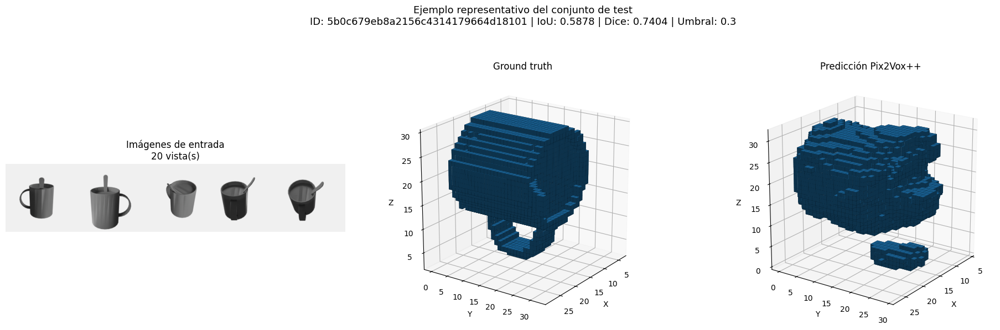


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp9_4categorias_20v_finetuning_test_tazas/ejemplo_representativo.png

TEST B - GLOBAL, 4 CATEGORÍAS
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       exp9_4categorias_20v_finetuning_test_global
Tipo:              con_finetuning
Número de vistas:  20
Dispositivo:       cuda
Carpeta:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp9_4categorias_20v_finetuning_test_global

1. Seleccionando el umbral con validación...


Validación 20 vistas:   0%|          | 0/198 [00:00<?, ?it/s]

Umbral seleccionado: 0.4
IoU de selección:    0.6831

2. Calculando las métricas completas de validación...


Validación completa 20 vistas:   0%|          | 0/198 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 20 vistas:   0%|          | 0/198 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.4
IoU validación:           0.6831
IoU test:                 0.6929
Dice test:                0.7977
Chamfer test:             0.6137
F-score superficie test:  0.8536
Tiempo total:             1.64 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp9_4categorias_20v_finetuning_test_global


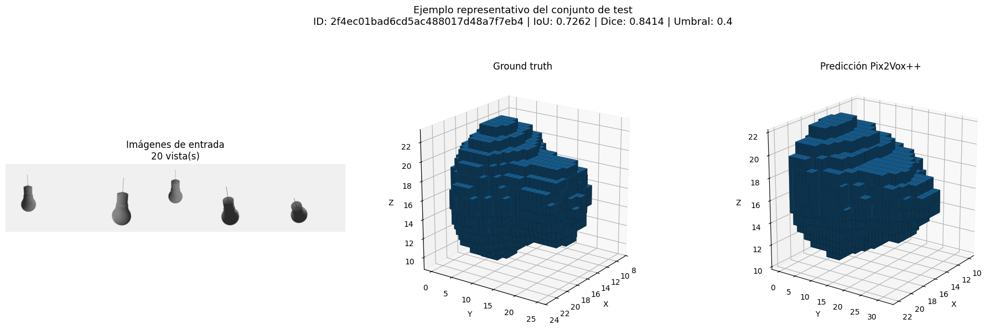


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp9_4categorias_20v_finetuning_test_global/ejemplo_representativo.png

RESULTADOS FINALES EXPERIMENTO 9


,test,numero_objetos,umbral,bce_x10_media,iou_media,dice_media,precision_voxel_media,recall_voxel_media,chamfer_superficie_media,f_score_superficie_media
0,Solo tazas,26.0,0.3,2.7565,0.5836,0.7199,0.6991,0.7626,0.7148,0.8363
1,Global 4 categorías,198.0,0.4,2.0605,0.6929,0.7977,0.7818,0.8310,0.6137,0.8536



Test global desglosado por categoría:


,categoria,iou,dice,precision_voxel,recall_voxel,chamfer_superficie,f_score_superficie
0,02876657,0.8541,0.9164,0.9066,0.9325,0.3436,0.9345
1,02880940,0.4966,0.6380,0.6112,0.6972,0.6628,0.8330
2,03593526,0.6477,0.7680,0.7451,0.8125,0.7917,0.7983
3,03797390,0.5801,0.7162,0.7159,0.7373,0.7176,0.8339



Últimas épocas:


,epoca,train_perdida_total,train_iou_0_3,validacion_umbral,validacion_iou,validacion_dice,es_mejor_checkpoint,epocas_sin_mejora
20,21,1.07192,0.83409,0.3,0.67699,0.78390,True,0
21,22,1.03225,0.83815,0.3,0.67884,0.78523,True,0
22,23,1.00047,0.84251,0.3,0.67964,0.78619,True,0
23,24,0.97338,0.84579,0.3,0.67750,0.78442,False,1
24,25,0.94309,0.84961,0.3,0.67727,0.78484,False,2
25,26,0.93418,0.85136,0.3,0.67741,0.78386,False,3
26,27,0.91170,0.85475,0.4,0.68312,0.78875,True,0
27,28,0.89100,0.85659,0.3,0.68066,0.78661,False,1
28,29,0.87113,0.85933,0.3,0.68056,0.78674,False,2
29,30,0.86444,0.86097,0.3,0.68036,0.78623,False,3



[OK] EXPERIMENTO 9 COMPLETADO
Checkpoint:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/checkpoints/exp9_4categorias_20v_finetuning_mejor.pth

Test solo tazas:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp9_4categorias_20v_finetuning_test_tazas

Test global:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp9_4categorias_20v_finetuning_test_global


In [ ]:
# ============================================================
# EXPERIMENTO 9
# 20 vistas + fine-tuning + 4 categorías
#
# Test A: solo tazas
# Test B: global 4 categorías
# ============================================================

NOMBRE_EXP9 = (
    "exp9_4categorias_20v_finetuning"
)

NOMBRE_TEST_TAZAS_EXP9 = (
    NOMBRE_EXP9
    + "_test_tazas"
)

NOMBRE_TEST_GLOBAL_EXP9 = (
    NOMBRE_EXP9
    + "_test_global"
)

NUM_VISTAS_EXP9 = 20

BATCH_EXP9 = 1

PASOS_ACUM_EXP9 = 5

REUTILIZAR_SI_COMPLETO = True


ruta_checkpoint_exp9 = (
    RUTA_CHECKPOINTS
    / f"{NOMBRE_EXP9}_mejor.pth"
)

ruta_historial_exp9 = (
    RUTA_HISTORIALES
    / f"{NOMBRE_EXP9}_historial.csv"
)


# ------------------------------------------------------------
# 1. DataLoaders
# ------------------------------------------------------------

if (
    "crear_dataloaders_exp9_10"
    not in globals()
):

    raise RuntimeError(
        "Ejecuta primero la celda "
        "PREPARACIÓN EXP. 9/10."
    )

reiniciar_semillas_exp9_10()

cargadores_exp9 = (
    crear_dataloaders_exp9_10(
        numero_vistas=(
            NUM_VISTAS_EXP9
        ),
        batch_size=(
            BATCH_EXP9
        ),
    )
)


loader_train_exp9 = (
    cargadores_exp9[
        "train"
    ]
)

loader_val_global_exp9 = (
    cargadores_exp9[
        "val_global"
    ]
)

loader_test_global_exp9 = (
    cargadores_exp9[
        "test_global"
    ]
)

loader_val_tazas_exp9 = (
    cargadores_exp9[
        "val_tazas"
    ]
)

loader_test_tazas_exp9 = (
    cargadores_exp9[
        "test_tazas"
    ]
)


print(
    "=" * 75
)

print(
    "EXPERIMENTO 9"
)

print(
    "=" * 75
)

print(
    f"Train global: "
    f"{len(loader_train_exp9.dataset)}"
)

print(
    f"Validación global: "
    f"{len(loader_val_global_exp9.dataset)}"
)

print(
    f"Test global: "
    f"{len(loader_test_global_exp9.dataset)}"
)

print(
    f"Validación tazas: "
    f"{len(loader_val_tazas_exp9.dataset)}"
)

print(
    f"Test tazas: "
    f"{len(loader_test_tazas_exp9.dataset)}"
)


# ------------------------------------------------------------
# 2. ¿Existe ya un entrenamiento completo?
# ------------------------------------------------------------

def _exp9_completo():

    if not (
        ruta_checkpoint_exp9.exists()
        and
        ruta_historial_exp9.exists()
    ):

        return False

    hist = pd.read_csv(
        ruta_historial_exp9
    )

    if hist.empty:

        return False

    if (
        len(hist)
        >= NUMERO_EPOCAS_MAXIMO
    ):

        return True

    if (
        "epocas_sin_mejora"
        in hist.columns
    ):

        return (
            int(
                hist.iloc[-1][
                    "epocas_sin_mejora"
                ]
            )
            >= PACIENCIA_EARLY_STOPPING
        )

    return False


reutilizar_exp9 = (
    REUTILIZAR_SI_COMPLETO
    and _exp9_completo()
)


# ------------------------------------------------------------
# 3. Crear modelo
# ------------------------------------------------------------

modelo_exp9 = (
    Pix2VoxPlusPlusA(
        usar_refiner=True,
        usar_merger=True,
        usar_pesos_imagenet=False,
    )
)


# ------------------------------------------------------------
# 4A. Recuperar entrenamiento completo
# ------------------------------------------------------------

if reutilizar_exp9:

    print(
        "\nEntrenamiento completo encontrado. "
        "Cargando checkpoint..."
    )

    metadata_exp9 = (
        cargar_checkpoint_finetuning(
            modelo_exp9,
            ruta_checkpoint_exp9,
            dispositivo_carga="cpu",
            estricto=True,
        )
    )

    historial_exp9 = (
        pd.read_csv(
            ruta_historial_exp9
        )
    )

    modelo_exp9 = (
        modelo_exp9.to(
            DEVICE
        )
    )

    modelo_exp9.eval()


# ------------------------------------------------------------
# 4B. Entrenar
# ------------------------------------------------------------

else:

    print(
        "\nCargando checkpoint oficial..."
    )

    metadata_inicial_exp9 = (
        cargar_pesos_preentrenados_pix2vox(
            modelo=modelo_exp9,
            ruta_checkpoint=(
                RUTA_CHECKPOINT_OFICIAL
            ),
            dispositivo_carga="cpu",
            estricto=True,
        )
    )

    modelo_exp9 = (
        modelo_exp9.to(
            DEVICE
        )
    )

    print(
        "\nIniciando fine-tuning "
        "del Experimento 9..."
    )

    resultado_ft_exp9 = (
        entrenar_modelo_finetuning_pix2vox(
            modelo=modelo_exp9,

            loader_train=(
                loader_train_exp9
            ),

            loader_validacion=(
                loader_val_global_exp9
            ),

            nombre_experimento=(
                NOMBRE_EXP9
            ),

            configuracion_experimento={

                "categorias":
                    list(
                        CATEGORIAS_EXP_9_10
                    ),

                "numero_vistas":
                    20,

                "fine_tuning":
                    True,

                "checkpoint_inicial":
                    str(
                        RUTA_CHECKPOINT_OFICIAL
                    ),

                "checkpoint_inicial_epoch":
                    metadata_inicial_exp9.get(
                        "epoch"
                    ),

                "checkpoint_inicial_best_iou":
                    metadata_inicial_exp9.get(
                        "best_iou"
                    ),

                "tamano_lote_fisico":
                    BATCH_EXP9,

                "pasos_acumulacion":
                    PASOS_ACUM_EXP9,

                "tamano_lote_efectivo":
                    (
                        BATCH_EXP9
                        * PASOS_ACUM_EXP9
                    ),

                "resolucion_voxel":
                    int(
                        RESOLUCION_VOXEL
                    ),

                "tamano_imagen":
                    int(
                        TAMANO_IMAGEN
                    ),

                "umbrales":
                    [
                        float(x)
                        for x
                        in UMBRALES_EVALUACION
                    ],

                "test_tazas_historico":
                    True,

                "checkpoint_formato":
                    "pix2vox_finetuning_v2",
            },

            numero_epocas=(
                NUMERO_EPOCAS_MAXIMO
            ),

            paciencia_early_stopping=(
                PACIENCIA_EARLY_STOPPING
            ),

            pasos_acumulacion=(
                PASOS_ACUM_EXP9
            ),

            max_lotes_train=None,

            max_lotes_validacion=None,
        )
    )

    modelo_exp9 = (
        resultado_ft_exp9[
            "modelo"
        ]
    )

    historial_exp9 = (
        resultado_ft_exp9[
            "historial"
        ]
    )

    metadata_exp9 = (
        resultado_ft_exp9[
            "metadata_checkpoint"
        ]
    )


# ------------------------------------------------------------
# 5. Comprobar checkpoint
# ------------------------------------------------------------

if (
    metadata_exp9[
        "claves_ausentes"
    ]
    or
    metadata_exp9[
        "claves_inesperadas"
    ]
):

    raise RuntimeError(
        "El checkpoint del Exp. 9 "
        "no coincide con Pix2Vox++/A."
    )


print(
    "\n" + "=" * 75
)

print(
    "MEJOR CHECKPOINT EXP. 9"
)

print(
    "=" * 75
)

print(
    f"Formato: "
    f"{metadata_exp9['formato']}"
)

print(
    f"Mejor época: "
    f"{int(metadata_exp9['epoca'])}"
)

print(
    f"IoU validación global: "
    f"{float(metadata_exp9['mejor_iou_validacion']):.4f}"
)

print(
    f"Dice validación global: "
    f"{float(metadata_exp9['mejor_dice_validacion']):.4f}"
)

print(
    f"Umbral: "
    f"{float(metadata_exp9['mejor_umbral']):.2f}"
)


modelo_exp9.eval()


# ============================================================
# 6. TEST A — SOLO TAZAS
#
# El threshold se selecciona utilizando
# exclusivamente la validación de tazas.
# ============================================================

print(
    "\n" + "=" * 75
)

print(
    "TEST A - SOLO TAZAS"
)

print(
    "=" * 75
)


resultado_tazas_exp9 = (
    evaluar_y_guardar_experimento_pix2vox(

        modelo=(
            modelo_exp9
        ),

        loader_validacion=(
            loader_val_tazas_exp9
        ),

        loader_test=(
            loader_test_tazas_exp9
        ),

        nombre_experimento=(
            NOMBRE_TEST_TAZAS_EXP9
        ),

        numero_vistas=20,

        tipo_experimento=(
            "con_finetuning"
        ),

        configuracion_extra={

            "categorias_train":
                list(
                    CATEGORIAS_EXP_9_10
                ),

            "tipo_test":
                "solo_tazas",

            "ruta_checkpoint":
                str(
                    ruta_checkpoint_exp9
                ),

            "mejor_epoca":
                int(
                    metadata_exp9[
                        "epoca"
                    ]
                ),
        },

        sobrescribir=True,
    )
)


visualizar_ejemplo_representativo_pix2vox(

    modelo=(
        modelo_exp9
    ),

    dataloader_test=(
        loader_test_tazas_exp9
    ),

    tabla_test_por_objeto=(
        resultado_tazas_exp9[
            "resultado_test_completo"
        ][
            "tabla_por_objeto"
        ]
    ),

    umbral=(
        resultado_tazas_exp9[
            "umbral_seleccionado"
        ]
    ),

    ruta_experimento=(
        resultado_tazas_exp9[
            "ruta_experimento"
        ]
    ),

    numero_vistas=20,
)


# ============================================================
# 7. TEST B — GLOBAL 4 CATEGORÍAS
#
# Aquí el threshold se selecciona con
# la validación global.
# ============================================================

print(
    "\n" + "=" * 75
)

print(
    "TEST B - GLOBAL, 4 CATEGORÍAS"
)

print(
    "=" * 75
)


resultado_global_exp9 = (
    evaluar_y_guardar_experimento_pix2vox(

        modelo=(
            modelo_exp9
        ),

        loader_validacion=(
            loader_val_global_exp9
        ),

        loader_test=(
            loader_test_global_exp9
        ),

        nombre_experimento=(
            NOMBRE_TEST_GLOBAL_EXP9
        ),

        numero_vistas=20,

        tipo_experimento=(
            "con_finetuning"
        ),

        configuracion_extra={

            "categorias_train":
                list(
                    CATEGORIAS_EXP_9_10
                ),

            "tipo_test":
                "global_4_categorias",

            "ruta_checkpoint":
                str(
                    ruta_checkpoint_exp9
                ),

            "mejor_epoca":
                int(
                    metadata_exp9[
                        "epoca"
                    ]
                ),
        },

        sobrescribir=True,
    )
)


visualizar_ejemplo_representativo_pix2vox(

    modelo=(
        modelo_exp9
    ),

    dataloader_test=(
        loader_test_global_exp9
    ),

    tabla_test_por_objeto=(
        resultado_global_exp9[
            "resultado_test_completo"
        ][
            "tabla_por_objeto"
        ]
    ),

    umbral=(
        resultado_global_exp9[
            "umbral_seleccionado"
        ]
    ),

    ruta_experimento=(
        resultado_global_exp9[
            "ruta_experimento"
        ]
    ),

    numero_vistas=20,
)


# ------------------------------------------------------------
# 8. Comparación final de los DOS tests
# ------------------------------------------------------------

fila_tazas = (
    resultado_tazas_exp9[
        "tabla_resumen"
    ]
    .query(
        "conjunto == 'test'"
    )
    .iloc[0]
)

fila_global = (
    resultado_global_exp9[
        "tabla_resumen"
    ]
    .query(
        "conjunto == 'test'"
    )
    .iloc[0]
)


metricas = [
    "numero_objetos",
    "umbral",
    "bce_x10_media",
    "iou_media",
    "dice_media",
    "precision_voxel_media",
    "recall_voxel_media",
    "chamfer_superficie_media",
    "f_score_superficie_media",
]


tabla_tests_exp9 = (
    pd.DataFrame(
        [
            {
                "test":
                    "Solo tazas",

                **{
                    metrica:
                        fila_tazas[
                            metrica
                        ]
                    for metrica
                    in metricas
                },
            },

            {
                "test":
                    "Global 4 categorías",

                **{
                    metrica:
                        fila_global[
                            metrica
                        ]
                    for metrica
                    in metricas
                },
            },
        ]
    )
)


ruta_tabla_tests_exp9 = (
    RUTA_TABLAS
    / (
        f"{NOMBRE_EXP9}"
        "_comparacion_tests.csv"
    )
)


tabla_tests_exp9.to_csv(
    ruta_tabla_tests_exp9,
    index=False,
)


print(
    "\n" + "=" * 75
)

print(
    "RESULTADOS FINALES EXPERIMENTO 9"
)

print(
    "=" * 75
)


display(
    tabla_tests_exp9.round(
        4
    )
)


# ------------------------------------------------------------
# 9. Bonus:
# Test global separado por categoría
# ------------------------------------------------------------

tabla_objetos = (
    resultado_global_exp9[
        "resultado_test_completo"
    ][
        "tabla_por_objeto"
    ]
)


tabla_por_categoria_exp9 = (
    tabla_objetos
    .groupby(
        "categoria"
    )[
        [
            "iou",
            "dice",
            "precision_voxel",
            "recall_voxel",
            "chamfer_superficie",
            "f_score_superficie",
        ]
    ]
    .mean()
    .reset_index()
)


print(
    "\nTest global "
    "desglosado por categoría:"
)


display(
    tabla_por_categoria_exp9.round(
        4
    )
)


# ------------------------------------------------------------
# 10. Últimas épocas
# ------------------------------------------------------------

print(
    "\nÚltimas épocas:"
)


display(
    historial_exp9.tail(10)[
        [
            "epoca",
            "train_perdida_total",
            "train_iou_0_3",
            "validacion_umbral",
            "validacion_iou",
            "validacion_dice",
            "es_mejor_checkpoint",
            "epocas_sin_mejora",
        ]
    ].round(
        5
    )
)


# ------------------------------------------------------------
# 11. Guardar rutas importantes y liberar GPU
# ------------------------------------------------------------

ruta_metricas_tazas_exp9 = Path(
    resultado_tazas_exp9[
        "ruta_experimento"
    ]
)

ruta_metricas_global_exp9 = Path(
    resultado_global_exp9[
        "ruta_experimento"
    ]
)


modelo_exp9.to(
    "cpu"
)


del modelo_exp9
del cargadores_exp9

del loader_train_exp9
del loader_val_global_exp9
del loader_test_global_exp9
del loader_val_tazas_exp9
del loader_test_tazas_exp9

del resultado_tazas_exp9
del resultado_global_exp9


gc.collect()


if torch.cuda.is_available():

    torch.cuda.empty_cache()


print(
    "\n" + "=" * 75
)

print(
    "[OK] EXPERIMENTO 9 COMPLETADO"
)

print(
    "=" * 75
)

print(
    f"Checkpoint:\n"
    f"{ruta_checkpoint_exp9}"
)

print(
    f"\nTest solo tazas:\n"
    f"{ruta_metricas_tazas_exp9}"
)

print(
    f"\nTest global:\n"
    f"{ruta_metricas_global_exp9}"
)

## 23. Experimento 10 — 5 vistas, fine-tuning y cuatro categorías

El experimento 10 analiza si es posible mantener el rendimiento del experimento 9 utilizando únicamente 5 vistas por objeto en lugar de 20.

Para que la comparación sea controlada, se mantienen exactamente las mismas cuatro categorías y las mismas divisiones de entrenamiento, validación y test utilizadas en el experimento 9. También se utiliza la misma arquitectura Pix2Vox++/A, el mismo checkpoint oficial de inicialización y la misma estrategia de fine-tuning.

La única diferencia experimental relevante es, por tanto, el número de imágenes proporcionadas al modelo para cada objeto: 5 vistas frente a las 20 utilizadas en el experimento 9.

Debido al menor consumo de memoria de las 5 vistas, se utiliza un lote físico de 5 objetos sin acumulación de gradientes, manteniendo un tamaño de lote efectivo de 5, equivalente al utilizado en el experimento 9.

Al finalizar se realizan las mismas dos evaluaciones:

1. **Test específico de tazas**, utilizando el mismo conjunto histórico de test.
2. **Test global**, utilizando las cuatro categorías empleadas durante el entrenamiento.

Además de comparar las métricas de reconstrucción, este experimento permitirá valorar la relación entre rendimiento y coste computacional. Si las 5 vistas producen resultados similares a las 20 vistas con un entrenamiento considerablemente más rápido, su utilización sería preferible para las siguientes fases del trabajo.

EXPERIMENTO 10
Número de vistas:        5
Categorías:              ['03797390', '02876657', '03593526', '02880940']
Batch físico:            5
Pasos de acumulación:    1
Batch efectivo:          5

Objetos:
Train global:        920
Validación global:   198
Test global:         198
Validación tazas:    26
Test tazas:          26

Creando Pix2Vox++/A...

Cargando checkpoint oficial...

Iniciando fine-tuning del Experimento 10...
INICIO DEL FINE-TUNING
Experimento:       exp10_4categorias_5v_finetuning
Dispositivo:       cuda
Épocas máximas:    30
Early stopping:    7
Checkpoint:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/checkpoints/exp10_4categorias_5v_finetuning_mejor.pth

ÉPOCA 1/30


Train época 1:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 1:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       6.650994
IoU train @ 0.3:     0.2956
BCE validación:      2.447854
Umbral validación:   0.2
IoU validación:      0.4487
Dice validación:     0.5965
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 2/30


Train época 2:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 2:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       4.738233
IoU train @ 0.3:     0.4676
BCE validación:      2.040544
Umbral validación:   0.2
IoU validación:      0.5135
Dice validación:     0.6542
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 3/30


Train época 3:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 3:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       4.104097
IoU train @ 0.3:     0.5327
BCE validación:      1.864646
Umbral validación:   0.3
IoU validación:      0.5479
Dice validación:     0.6805
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 4/30


Train época 4:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 4:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.754781
IoU train @ 0.3:     0.5666
BCE validación:      1.771470
Umbral validación:   0.3
IoU validación:      0.5833
Dice validación:     0.7078
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 5/30


Train época 5:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 5:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.515292
IoU train @ 0.3:     0.5930
BCE validación:      1.708622
Umbral validación:   0.3
IoU validación:      0.5933
Dice validación:     0.7162
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 6/30


Train época 6:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 6:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.330683
IoU train @ 0.3:     0.6096
BCE validación:      1.670591
Umbral validación:   0.3
IoU validación:      0.6014
Dice validación:     0.7232
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 7/30


Train época 7:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 7:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.193209
IoU train @ 0.3:     0.6234
BCE validación:      1.615963
Umbral validación:   0.3
IoU validación:      0.6128
Dice validación:     0.7360
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 8/30


Train época 8:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 8:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.022588
IoU train @ 0.3:     0.6394
BCE validación:      1.593665
Umbral validación:   0.3
IoU validación:      0.6257
Dice validación:     0.7441
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 9/30


Train época 9:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 9:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.938663
IoU train @ 0.3:     0.6477
BCE validación:      1.549226
Umbral validación:   0.3
IoU validación:      0.6311
Dice validación:     0.7498
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 10/30


Train época 10:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 10:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.790248
IoU train @ 0.3:     0.6606
BCE validación:      1.539758
Umbral validación:   0.3
IoU validación:      0.6359
Dice validación:     0.7537
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 11/30


Train época 11:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 11:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.690142
IoU train @ 0.3:     0.6681
BCE validación:      1.501191
Umbral validación:   0.3
IoU validación:      0.6436
Dice validación:     0.7594
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 12/30


Train época 12:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 12:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.603891
IoU train @ 0.3:     0.6772
BCE validación:      1.483182
Umbral validación:   0.4
IoU validación:      0.6484
Dice validación:     0.7627
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 13/30


Train época 13:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 13:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.511143
IoU train @ 0.3:     0.6851
BCE validación:      1.479258
Umbral validación:   0.3
IoU validación:      0.6533
Dice validación:     0.7673
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 14/30


Train época 14:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 14:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.419673
IoU train @ 0.3:     0.6920
BCE validación:      1.474514
Umbral validación:   0.4
IoU validación:      0.6573
Dice validación:     0.7691
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 15/30


Train época 15:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 15:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.376582
IoU train @ 0.3:     0.6978
BCE validación:      1.438956
Umbral validación:   0.3
IoU validación:      0.6596
Dice validación:     0.7725
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 16/30


Train época 16:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 16:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.311670
IoU train @ 0.3:     0.7052
BCE validación:      1.427449
Umbral validación:   0.4
IoU validación:      0.6616
Dice validación:     0.7733
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 17/30


Train época 17:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 17:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.251252
IoU train @ 0.3:     0.7113
BCE validación:      1.442050
Umbral validación:   0.4
IoU validación:      0.6648
Dice validación:     0.7757
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 18/30


Train época 18:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 18:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.172388
IoU train @ 0.3:     0.7162
BCE validación:      1.433304
Umbral validación:   0.3
IoU validación:      0.6650
Dice validación:     0.7769
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 19/30


Train época 19:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 19:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.118783
IoU train @ 0.3:     0.7196
BCE validación:      1.417591
Umbral validación:   0.4
IoU validación:      0.6723
Dice validación:     0.7819
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 20/30


Train época 20:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 20:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.086932
IoU train @ 0.3:     0.7255
BCE validación:      1.426926
Umbral validación:   0.4
IoU validación:      0.6753
Dice validación:     0.7831
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 21/30


Train época 21:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 21:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.028760
IoU train @ 0.3:     0.7292
BCE validación:      1.421512
Umbral validación:   0.3
IoU validación:      0.6728
Dice validación:     0.7826
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 22/30


Train época 22:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 22:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       1.975793
IoU train @ 0.3:     0.7334
BCE validación:      1.416287
Umbral validación:   0.3
IoU validación:      0.6740
Dice validación:     0.7837
Mejor checkpoint:    No
Épocas sin mejora:   2/7

ÉPOCA 23/30


Train época 23:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 23:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       1.939179
IoU train @ 0.3:     0.7386
BCE validación:      1.416835
Umbral validación:   0.4
IoU validación:      0.6785
Dice validación:     0.7852
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 24/30


Train época 24:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 24:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       1.891865
IoU train @ 0.3:     0.7428
BCE validación:      1.434306
Umbral validación:   0.3
IoU validación:      0.6712
Dice validación:     0.7824
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 25/30


Train época 25:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 25:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       1.844107
IoU train @ 0.3:     0.7473
BCE validación:      1.424213
Umbral validación:   0.4
IoU validación:      0.6808
Dice validación:     0.7879
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 26/30


Train época 26:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 26:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       1.827964
IoU train @ 0.3:     0.7496
BCE validación:      1.405255
Umbral validación:   0.4
IoU validación:      0.6847
Dice validación:     0.7902
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 27/30


Train época 27:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 27:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       1.759647
IoU train @ 0.3:     0.7545
BCE validación:      1.423648
Umbral validación:   0.3
IoU validación:      0.6856
Dice validación:     0.7916
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 28/30


Train época 28:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 28:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       1.736121
IoU train @ 0.3:     0.7575
BCE validación:      1.414509
Umbral validación:   0.4
IoU validación:      0.6876
Dice validación:     0.7926
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 29/30


Train época 29:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 29:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       1.679739
IoU train @ 0.3:     0.7615
BCE validación:      1.420429
Umbral validación:   0.4
IoU validación:      0.6843
Dice validación:     0.7905
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 30/30


Train época 30:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 30:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       1.695602
IoU train @ 0.3:     0.7621
BCE validación:      1.399891
Umbral validación:   0.3
IoU validación:      0.6897
Dice validación:     0.7946
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

FINE-TUNING FINALIZADO
Épocas ejecutadas:       30
Mejor época:             30
Mejor umbral:            0.3
Mejor IoU validación:    0.6897
Mejor Dice validación:   0.7946
Tiempo total:            33.07 minutos

Checkpoint guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/checkpoints/exp10_4categorias_5v_finetuning_mejor.pth

Historial guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/historiales/exp10_4categorias_5v_finetuning_historial.csv

MEJOR CHECKPOINT EXP. 10
Formato:                 pix2vox_finetuning_v2
Mejor época:             30
IoU validación global:   0.6897
Dice validación global:  0.7946
Umbral entrenamiento:    0.30

TEST A - SOLO TAZAS
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       exp10_4categorias_5v_finetuning_test_taz

Validación 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]

Umbral seleccionado: 0.3
IoU de selección:    0.6094

2. Calculando las métricas completas de validación...


Validación completa 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.3
IoU validación:           0.6094
IoU test:                 0.5921
Dice test:                0.7287
Chamfer test:             0.6520
F-score superficie test:  0.8575
Tiempo total:             0.06 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp10_4categorias_5v_finetuning_test_tazas


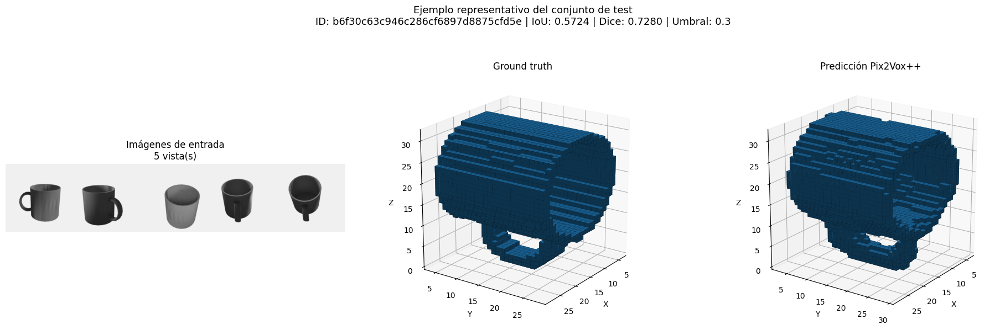


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp10_4categorias_5v_finetuning_test_tazas/ejemplo_representativo.png

TEST B - GLOBAL, 4 CATEGORÍAS
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       exp10_4categorias_5v_finetuning_test_global
Tipo:              con_finetuning
Número de vistas:  5
Dispositivo:       cuda
Carpeta:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp10_4categorias_5v_finetuning_test_global

1. Seleccionando el umbral con validación...


Validación 5 vistas:   0%|          | 0/40 [00:00<?, ?it/s]

Umbral seleccionado: 0.3
IoU de selección:    0.6897

2. Calculando las métricas completas de validación...


Validación completa 5 vistas:   0%|          | 0/40 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 5 vistas:   0%|          | 0/40 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.3
IoU validación:           0.6897
IoU test:                 0.7021
Dice test:                0.8068
Chamfer test:             0.5755
F-score superficie test:  0.8674
Tiempo total:             0.20 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp10_4categorias_5v_finetuning_test_global


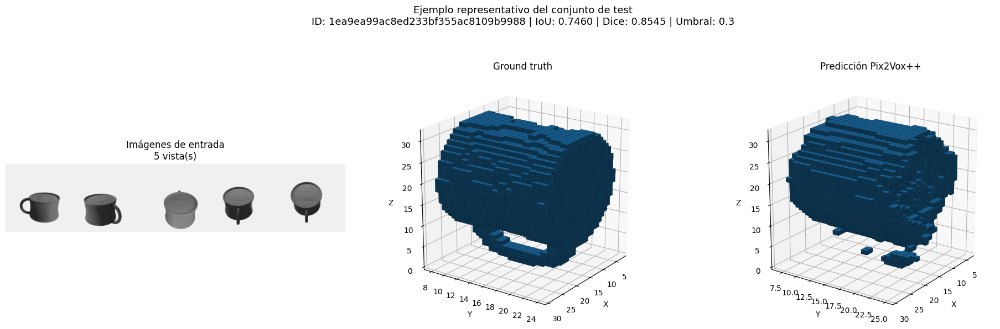


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp10_4categorias_5v_finetuning_test_global/ejemplo_representativo.png

RESULTADOS FINALES EXPERIMENTO 10


,test,numero_objetos,umbral,bce_x10_media,iou_media,dice_media,precision_voxel_media,recall_voxel_media,chamfer_superficie_media,f_score_superficie_media
0,Solo tazas,26.0,0.3,2.0016,0.5921,0.7287,0.7010,0.7821,0.6520,0.8575
1,Global 4 categorías,198.0,0.3,1.4960,0.7021,0.8068,0.7775,0.8571,0.5755,0.8674



Test global desglosado por categoría:


,categoria,iou,dice,precision_voxel,recall_voxel,chamfer_superficie,f_score_superficie
0,02876657,0.8536,0.9169,0.9009,0.9392,0.3421,0.9368
1,02880940,0.5407,0.6790,0.6190,0.7797,0.5241,0.8799
2,03593526,0.6547,0.7746,0.7419,0.8336,0.7585,0.8097
3,03797390,0.5921,0.7287,0.7010,0.7821,0.6520,0.8575



COMPARACIÓN EXPERIMENTO 9 VS 10


,test,iou_media_exp9_20v,dice_media_exp9_20v,chamfer_superficie_media_exp9_20v,f_score_superficie_media_exp9_20v,iou_media_exp10_5v,dice_media_exp10_5v,chamfer_superficie_media_exp10_5v,f_score_superficie_media_exp10_5v,diferencia_iou_5v_menos_20v,diferencia_dice_5v_menos_20v
0,Solo tazas,0.5836,0.7199,0.7148,0.8363,0.5921,0.7287,0.6520,0.8575,0.0085,0.0089
1,Global 4 categorías,0.6929,0.7977,0.6137,0.8536,0.7021,0.8068,0.5755,0.8674,0.0092,0.0091



Últimas épocas:


,epoca,train_perdida_total,train_iou_0_3,validacion_umbral,validacion_iou,validacion_dice,es_mejor_checkpoint,epocas_sin_mejora
20,21,2.02876,0.72918,0.3,0.67285,0.78260,False,1
21,22,1.97579,0.73341,0.3,0.67399,0.78369,False,2
22,23,1.93918,0.73858,0.4,0.67849,0.78521,True,0
23,24,1.89186,0.74277,0.3,0.67117,0.78240,False,1
24,25,1.84411,0.74726,0.4,0.68078,0.78790,True,0
25,26,1.82796,0.74961,0.4,0.68470,0.79019,True,0
26,27,1.75965,0.75448,0.3,0.68555,0.79164,True,0
27,28,1.73612,0.75754,0.4,0.68763,0.79258,True,0
28,29,1.67974,0.76148,0.4,0.68426,0.79047,False,1
29,30,1.69560,0.76207,0.3,0.68971,0.79463,True,0



[OK] EXPERIMENTO 10 COMPLETADO
Checkpoint:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/checkpoints/exp10_4categorias_5v_finetuning_mejor.pth

Test solo tazas:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp10_4categorias_5v_finetuning_test_tazas

Test global:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp10_4categorias_5v_finetuning_test_global


In [ ]:
# ============================================================
# EXPERIMENTO 10
# 5 vistas + fine-tuning + 4 categorías
#
# MISMO DATASET Y MISMOS SPLITS QUE EXPERIMENTO 9
#
# Test A: solo tazas
# Test B: global 4 categorías
# ============================================================

NOMBRE_EXP10 = (
    "exp10_4categorias_5v_finetuning"
)

NOMBRE_TEST_TAZAS_EXP10 = (
    NOMBRE_EXP10
    + "_test_tazas"
)

NOMBRE_TEST_GLOBAL_EXP10 = (
    NOMBRE_EXP10
    + "_test_global"
)

NUM_VISTAS_EXP10 = 5


# ------------------------------------------------------------
# Configuración de memoria
#
# 5 objetos por lote × 1 acumulación = batch efectivo 5.
#
# De esta forma el batch efectivo es idéntico al Exp. 9:
#
# Exp. 9:
#   1 objeto × 5 acumulaciones = 5
#
# Exp. 10:
#   5 objetos × 1 acumulación = 5
# ------------------------------------------------------------

BATCH_EXP10 = 5

PASOS_ACUM_EXP10 = 1

TAMANO_LOTE_EFECTIVO_EXP10 = (
    BATCH_EXP10
    * PASOS_ACUM_EXP10
)

REUTILIZAR_SI_COMPLETO = True


ruta_checkpoint_exp10 = (
    RUTA_CHECKPOINTS
    / f"{NOMBRE_EXP10}_mejor.pth"
)

ruta_historial_exp10 = (
    RUTA_HISTORIALES
    / f"{NOMBRE_EXP10}_historial.csv"
)


# ------------------------------------------------------------
# 1. Comprobaciones previas
# ------------------------------------------------------------

if (
    "crear_dataloaders_exp9_10"
    not in globals()
):

    raise RuntimeError(
        "Ejecuta primero la sección "
        "PREPARACIÓN EXPERIMENTOS 9 Y 10."
    )


print("=" * 75)
print("EXPERIMENTO 10")
print("=" * 75)

print(
    f"Número de vistas:        "
    f"{NUM_VISTAS_EXP10}"
)

print(
    f"Categorías:              "
    f"{CATEGORIAS_EXP_9_10}"
)

print(
    f"Batch físico:            "
    f"{BATCH_EXP10}"
)

print(
    f"Pasos de acumulación:    "
    f"{PASOS_ACUM_EXP10}"
)

print(
    f"Batch efectivo:          "
    f"{TAMANO_LOTE_EFECTIVO_EXP10}"
)


# ------------------------------------------------------------
# 2. DataLoaders
#
# IMPORTANTE:
# utiliza exactamente df_train_exp9, df_val_exp9 y df_test_exp9.
# Por tanto, no se genera ninguna nueva división.
# ------------------------------------------------------------

reiniciar_semillas_exp9_10()

cargadores_exp10 = (
    crear_dataloaders_exp9_10(
        numero_vistas=(
            NUM_VISTAS_EXP10
        ),
        batch_size=(
            BATCH_EXP10
        ),
    )
)


loader_train_exp10 = (
    cargadores_exp10[
        "train"
    ]
)

loader_val_global_exp10 = (
    cargadores_exp10[
        "val_global"
    ]
)

loader_test_global_exp10 = (
    cargadores_exp10[
        "test_global"
    ]
)

loader_val_tazas_exp10 = (
    cargadores_exp10[
        "val_tazas"
    ]
)

loader_test_tazas_exp10 = (
    cargadores_exp10[
        "test_tazas"
    ]
)


print(
    "\nObjetos:"
)

print(
    f"Train global:        "
    f"{len(loader_train_exp10.dataset)}"
)

print(
    f"Validación global:   "
    f"{len(loader_val_global_exp10.dataset)}"
)

print(
    f"Test global:         "
    f"{len(loader_test_global_exp10.dataset)}"
)

print(
    f"Validación tazas:    "
    f"{len(loader_val_tazas_exp10.dataset)}"
)

print(
    f"Test tazas:          "
    f"{len(loader_test_tazas_exp10.dataset)}"
)


# ------------------------------------------------------------
# 3. Comprobar si el entrenamiento ya está completo
# ------------------------------------------------------------

def _exp10_completo():

    if not (
        ruta_checkpoint_exp10.exists()
        and
        ruta_historial_exp10.exists()
    ):

        return False

    historial = pd.read_csv(
        ruta_historial_exp10
    )

    if historial.empty:

        return False

    # Entrenamiento que llegó al máximo de épocas.
    if (
        len(historial)
        >= NUMERO_EPOCAS_MAXIMO
    ):

        return True

    # Entrenamiento terminado mediante early stopping.
    if (
        "epocas_sin_mejora"
        in historial.columns
    ):

        return (
            int(
                historial.iloc[-1][
                    "epocas_sin_mejora"
                ]
            )
            >= PACIENCIA_EARLY_STOPPING
        )

    return False


reutilizar_exp10 = (
    REUTILIZAR_SI_COMPLETO
    and
    _exp10_completo()
)


# ------------------------------------------------------------
# 4. Crear Pix2Vox++/A
# ------------------------------------------------------------

print(
    "\nCreando Pix2Vox++/A..."
)


modelo_exp10 = (
    Pix2VoxPlusPlusA(
        usar_refiner=True,
        usar_merger=True,
        usar_pesos_imagenet=False,
    )
)


# ------------------------------------------------------------
# 5A. Recuperar entrenamiento ya completado
# ------------------------------------------------------------

if reutilizar_exp10:

    print(
        "\nEntrenamiento completo "
        "del Experimento 10 encontrado."
    )

    print(
        "Cargando el mejor checkpoint..."
    )

    metadata_exp10 = (
        cargar_checkpoint_finetuning(
            modelo_exp10,
            ruta_checkpoint_exp10,
            dispositivo_carga="cpu",
            estricto=True,
        )
    )

    historial_exp10 = (
        pd.read_csv(
            ruta_historial_exp10
        )
    )

    modelo_exp10 = (
        modelo_exp10.to(
            DEVICE
        )
    )

    modelo_exp10.eval()


# ------------------------------------------------------------
# 5B. Entrenar desde checkpoint oficial
# ------------------------------------------------------------

else:

    print(
        "\nCargando checkpoint oficial..."
    )

    metadata_inicial_exp10 = (
        cargar_pesos_preentrenados_pix2vox(
            modelo=modelo_exp10,
            ruta_checkpoint=(
                RUTA_CHECKPOINT_OFICIAL
            ),
            dispositivo_carga="cpu",
            estricto=True,
        )
    )


    modelo_exp10 = (
        modelo_exp10.to(
            DEVICE
        )
    )


    print(
        "\nIniciando fine-tuning "
        "del Experimento 10..."
    )


    resultado_ft_exp10 = (
        entrenar_modelo_finetuning_pix2vox(

            modelo=(
                modelo_exp10
            ),

            loader_train=(
                loader_train_exp10
            ),

            loader_validacion=(
                loader_val_global_exp10
            ),

            nombre_experimento=(
                NOMBRE_EXP10
            ),

            configuracion_experimento={

                "categorias":
                    list(
                        CATEGORIAS_EXP_9_10
                    ),

                "numero_vistas":
                    NUM_VISTAS_EXP10,

                "fine_tuning":
                    True,

                "checkpoint_inicial":
                    str(
                        RUTA_CHECKPOINT_OFICIAL
                    ),

                "checkpoint_inicial_epoch":
                    metadata_inicial_exp10.get(
                        "epoch"
                    ),

                "checkpoint_inicial_best_iou":
                    metadata_inicial_exp10.get(
                        "best_iou"
                    ),

                "tamano_lote_fisico":
                    BATCH_EXP10,

                "pasos_acumulacion":
                    PASOS_ACUM_EXP10,

                "tamano_lote_efectivo":
                    TAMANO_LOTE_EFECTIVO_EXP10,

                "resolucion_voxel":
                    int(
                        RESOLUCION_VOXEL
                    ),

                "tamano_imagen":
                    int(
                        TAMANO_IMAGEN
                    ),

                "umbrales":
                    [
                        float(x)
                        for x
                        in UMBRALES_EVALUACION
                    ],

                "mismos_splits_exp9":
                    True,

                "test_tazas_historico":
                    True,

                "checkpoint_formato":
                    "pix2vox_finetuning_v2",
            },

            numero_epocas=(
                NUMERO_EPOCAS_MAXIMO
            ),

            paciencia_early_stopping=(
                PACIENCIA_EARLY_STOPPING
            ),

            pasos_acumulacion=(
                PASOS_ACUM_EXP10
            ),

            max_lotes_train=None,

            max_lotes_validacion=None,
        )
    )


    modelo_exp10 = (
        resultado_ft_exp10[
            "modelo"
        ]
    )

    historial_exp10 = (
        resultado_ft_exp10[
            "historial"
        ]
    )

    metadata_exp10 = (
        resultado_ft_exp10[
            "metadata_checkpoint"
        ]
    )


# ------------------------------------------------------------
# 6. Comprobar checkpoint recuperado
# ------------------------------------------------------------

if (
    metadata_exp10[
        "claves_ausentes"
    ]
    or
    metadata_exp10[
        "claves_inesperadas"
    ]
):

    raise RuntimeError(
        "El checkpoint del Exp. 10 "
        "no coincide con Pix2Vox++/A."
    )


print(
    "\n" + "=" * 75
)

print(
    "MEJOR CHECKPOINT EXP. 10"
)

print(
    "=" * 75
)

print(
    f"Formato:                 "
    f"{metadata_exp10['formato']}"
)

print(
    f"Mejor época:             "
    f"{int(metadata_exp10['epoca'])}"
)

print(
    f"IoU validación global:   "
    f"{float(metadata_exp10['mejor_iou_validacion']):.4f}"
)

print(
    f"Dice validación global:  "
    f"{float(metadata_exp10['mejor_dice_validacion']):.4f}"
)

print(
    f"Umbral entrenamiento:    "
    f"{float(metadata_exp10['mejor_umbral']):.2f}"
)


modelo_exp10.eval()


# ============================================================
# 7. TEST A — SOLO TAZAS
#
# El threshold se vuelve a seleccionar utilizando únicamente
# la validación histórica de tazas.
# ============================================================

print(
    "\n" + "=" * 75
)

print(
    "TEST A - SOLO TAZAS"
)

print(
    "=" * 75
)


resultado_tazas_exp10 = (
    evaluar_y_guardar_experimento_pix2vox(

        modelo=(
            modelo_exp10
        ),

        loader_validacion=(
            loader_val_tazas_exp10
        ),

        loader_test=(
            loader_test_tazas_exp10
        ),

        nombre_experimento=(
            NOMBRE_TEST_TAZAS_EXP10
        ),

        numero_vistas=(
            NUM_VISTAS_EXP10
        ),

        tipo_experimento=(
            "con_finetuning"
        ),

        configuracion_extra={

            "categorias_train":
                list(
                    CATEGORIAS_EXP_9_10
                ),

            "tipo_test":
                "solo_tazas",

            "mismos_splits_exp9":
                True,

            "ruta_checkpoint":
                str(
                    ruta_checkpoint_exp10
                ),

            "mejor_epoca":
                int(
                    metadata_exp10[
                        "epoca"
                    ]
                ),
        },

        sobrescribir=True,
    )
)


visualizar_ejemplo_representativo_pix2vox(

    modelo=(
        modelo_exp10
    ),

    dataloader_test=(
        loader_test_tazas_exp10
    ),

    tabla_test_por_objeto=(
        resultado_tazas_exp10[
            "resultado_test_completo"
        ][
            "tabla_por_objeto"
        ]
    ),

    umbral=(
        resultado_tazas_exp10[
            "umbral_seleccionado"
        ]
    ),

    ruta_experimento=(
        resultado_tazas_exp10[
            "ruta_experimento"
        ]
    ),

    numero_vistas=(
        NUM_VISTAS_EXP10
    ),
)


# ============================================================
# 8. TEST B — GLOBAL 4 CATEGORÍAS
# ============================================================

print(
    "\n" + "=" * 75
)

print(
    "TEST B - GLOBAL, 4 CATEGORÍAS"
)

print(
    "=" * 75
)


resultado_global_exp10 = (
    evaluar_y_guardar_experimento_pix2vox(

        modelo=(
            modelo_exp10
        ),

        loader_validacion=(
            loader_val_global_exp10
        ),

        loader_test=(
            loader_test_global_exp10
        ),

        nombre_experimento=(
            NOMBRE_TEST_GLOBAL_EXP10
        ),

        numero_vistas=(
            NUM_VISTAS_EXP10
        ),

        tipo_experimento=(
            "con_finetuning"
        ),

        configuracion_extra={

            "categorias_train":
                list(
                    CATEGORIAS_EXP_9_10
                ),

            "tipo_test":
                "global_4_categorias",

            "mismos_splits_exp9":
                True,

            "ruta_checkpoint":
                str(
                    ruta_checkpoint_exp10
                ),

            "mejor_epoca":
                int(
                    metadata_exp10[
                        "epoca"
                    ]
                ),
        },

        sobrescribir=True,
    )
)


visualizar_ejemplo_representativo_pix2vox(

    modelo=(
        modelo_exp10
    ),

    dataloader_test=(
        loader_test_global_exp10
    ),

    tabla_test_por_objeto=(
        resultado_global_exp10[
            "resultado_test_completo"
        ][
            "tabla_por_objeto"
        ]
    ),

    umbral=(
        resultado_global_exp10[
            "umbral_seleccionado"
        ]
    ),

    ruta_experimento=(
        resultado_global_exp10[
            "ruta_experimento"
        ]
    ),

    numero_vistas=(
        NUM_VISTAS_EXP10
    ),
)


# ------------------------------------------------------------
# 9. Tabla con los dos tests
# ------------------------------------------------------------

fila_tazas_exp10 = (
    resultado_tazas_exp10[
        "tabla_resumen"
    ]
    .query(
        "conjunto == 'test'"
    )
    .iloc[0]
)


fila_global_exp10 = (
    resultado_global_exp10[
        "tabla_resumen"
    ]
    .query(
        "conjunto == 'test'"
    )
    .iloc[0]
)


metricas_exp10 = [
    "numero_objetos",
    "umbral",
    "bce_x10_media",
    "iou_media",
    "dice_media",
    "precision_voxel_media",
    "recall_voxel_media",
    "chamfer_superficie_media",
    "f_score_superficie_media",
]


tabla_tests_exp10 = (
    pd.DataFrame(
        [
            {
                "test":
                    "Solo tazas",

                **{
                    metrica:
                        fila_tazas_exp10[
                            metrica
                        ]
                    for metrica
                    in metricas_exp10
                },
            },

            {
                "test":
                    "Global 4 categorías",

                **{
                    metrica:
                        fila_global_exp10[
                            metrica
                        ]
                    for metrica
                    in metricas_exp10
                },
            },
        ]
    )
)


ruta_tabla_tests_exp10 = (
    RUTA_TABLAS
    / (
        f"{NOMBRE_EXP10}"
        "_comparacion_tests.csv"
    )
)


tabla_tests_exp10.to_csv(
    ruta_tabla_tests_exp10,
    index=False,
)


print(
    "\n" + "=" * 75
)

print(
    "RESULTADOS FINALES EXPERIMENTO 10"
)

print(
    "=" * 75
)


display(
    tabla_tests_exp10.round(
        4
    )
)


# ------------------------------------------------------------
# 10. Test global desglosado por categoría
# ------------------------------------------------------------

tabla_objetos_exp10 = (
    resultado_global_exp10[
        "resultado_test_completo"
    ][
        "tabla_por_objeto"
    ]
)


tabla_por_categoria_exp10 = (
    tabla_objetos_exp10
    .groupby(
        "categoria"
    )[
        [
            "iou",
            "dice",
            "precision_voxel",
            "recall_voxel",
            "chamfer_superficie",
            "f_score_superficie",
        ]
    ]
    .mean()
    .reset_index()
)


print(
    "\nTest global "
    "desglosado por categoría:"
)


display(
    tabla_por_categoria_exp10.round(
        4
    )
)


# ------------------------------------------------------------
# 11. Comparación automática EXP. 9 vs EXP. 10
# ------------------------------------------------------------

ruta_tabla_tests_exp9 = (
    RUTA_TABLAS
    / (
        "exp9_4categorias_20v_finetuning"
        "_comparacion_tests.csv"
    )
)


if ruta_tabla_tests_exp9.exists():

    tabla_exp9_guardada = (
        pd.read_csv(
            ruta_tabla_tests_exp9
        )
    )

    comparacion_9_10 = (
        tabla_exp9_guardada[
            [
                "test",
                "iou_media",
                "dice_media",
                "chamfer_superficie_media",
                "f_score_superficie_media",
            ]
        ]
        .merge(
            tabla_tests_exp10[
                [
                    "test",
                    "iou_media",
                    "dice_media",
                    "chamfer_superficie_media",
                    "f_score_superficie_media",
                ]
            ],
            on="test",
            suffixes=(
                "_exp9_20v",
                "_exp10_5v",
            ),
        )
    )


    comparacion_9_10[
        "diferencia_iou_5v_menos_20v"
    ] = (
        comparacion_9_10[
            "iou_media_exp10_5v"
        ]
        -
        comparacion_9_10[
            "iou_media_exp9_20v"
        ]
    )


    comparacion_9_10[
        "diferencia_dice_5v_menos_20v"
    ] = (
        comparacion_9_10[
            "dice_media_exp10_5v"
        ]
        -
        comparacion_9_10[
            "dice_media_exp9_20v"
        ]
    )


    print(
        "\n" + "=" * 75
    )

    print(
        "COMPARACIÓN EXPERIMENTO 9 VS 10"
    )

    print(
        "=" * 75
    )


    display(
        comparacion_9_10.round(
            4
        )
    )


    comparacion_9_10.to_csv(
        RUTA_TABLAS
        / "comparacion_experimentos_9_10.csv",
        index=False,
    )

else:

    print(
        "\nNo se encuentra todavía "
        "la tabla del Experimento 9."
    )

    print(
        "La comparación automática "
        "se podrá generar cuando "
        "el Exp. 9 haya finalizado."
    )


# ------------------------------------------------------------
# 12. Últimas épocas
# ------------------------------------------------------------

print(
    "\nÚltimas épocas:"
)


display(
    historial_exp10.tail(10)[
        [
            "epoca",
            "train_perdida_total",
            "train_iou_0_3",
            "validacion_umbral",
            "validacion_iou",
            "validacion_dice",
            "es_mejor_checkpoint",
            "epocas_sin_mejora",
        ]
    ].round(
        5
    )
)


# ------------------------------------------------------------
# 13. Guardar rutas importantes
# ------------------------------------------------------------

ruta_metricas_tazas_exp10 = Path(
    resultado_tazas_exp10[
        "ruta_experimento"
    ]
)

ruta_metricas_global_exp10 = Path(
    resultado_global_exp10[
        "ruta_experimento"
    ]
)


# ------------------------------------------------------------
# 14. Liberar GPU
# ------------------------------------------------------------

modelo_exp10.to(
    "cpu"
)


del modelo_exp10
del cargadores_exp10

del loader_train_exp10
del loader_val_global_exp10
del loader_test_global_exp10
del loader_val_tazas_exp10
del loader_test_tazas_exp10

del resultado_tazas_exp10
del resultado_global_exp10


gc.collect()


if torch.cuda.is_available():

    torch.cuda.empty_cache()


print(
    "\n" + "=" * 75
)

print(
    "[OK] EXPERIMENTO 10 COMPLETADO"
)

print(
    "=" * 75
)

print(
    f"Checkpoint:\n"
    f"{ruta_checkpoint_exp10}"
)

print(
    f"\nTest solo tazas:\n"
    f"{ruta_metricas_tazas_exp10}"
)

print(
    f"\nTest global:\n"
    f"{ruta_metricas_global_exp10}"
)

## 24. Preparación común de los experimentos 11 y 12

Se preparan dos experimentos adicionales destinados a analizar los resultados obtenidos en los experimentos 8, 9 y 10.

### Experimento 11 — Fix del Experimento 8

Se reproduce la configuración del Experimento 8:

- 20 vistas.
- Fine-tuning.
- Categorías taza y botella.
- Pix2Vox++/A con ResNet-50.
- Batch efectivo 5.

La diferencia es que se corrige la fuga detectada en la evaluación del Experimento 8. Para las tazas se reutiliza el split histórico de 120 objetos de entrenamiento, 26 de validación y 26 de test. Para las botellas se conserva exactamente la pertenencia a train, validación y test utilizada en el Experimento 8.

De esta forma, las mismas 26 tazas utilizadas en la evaluación histórica pueden evaluarse de nuevo sin que ninguna de ellas aparezca durante el entrenamiento.

### Experimento 12 — EfficientNet-B4

Se reutilizan exactamente las cuatro categorías y los mismos splits de los experimentos 9 y 10.

La única modificación principal es la sustitución del backbone ResNet-50 del encoder por EfficientNet-B4 preentrenada en ImageNet.

Para conservar la compatibilidad con Pix2Vox++, EfficientNet-B4 se trunca en una resolución espacial de 28 × 28 y sus características se proyectan a 512 canales. Las capas posteriores del encoder, decoder, merger y refiner mantienen la arquitectura de Pix2Vox++/A.

Esto permite comparar directamente el Experimento 10 y el Experimento 12 manteniendo constantes los datos, las cinco vistas, el procedimiento de entrenamiento y las métricas.

In [ ]:
# ============================================================
# 24. PREPARACIÓN COMÚN — EXPERIMENTOS 11 Y 12
# Ejecutar justo después de 14.1
# ============================================================

import gc
import random
from pathlib import Path

import numpy as np
import pandas as pd
import torch
import torch.nn as nn

from torch.utils.data import DataLoader
from torchvision import models


CATEGORIA_BOTELLAS = "02876657"

CATEGORIAS_EXP11 = [
    "03797390",  # taza
    "02876657",  # botella
]

CATEGORIAS_EXP12 = [
    "03797390",  # taza
    "02876657",  # botella
    "03593526",  # tarro
    "02880940",  # cuenco
]


def reiniciar_semillas_exp11_12():
    random.seed(SEED)
    np.random.seed(SEED)
    torch.manual_seed(SEED)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(SEED)
        torch.cuda.manual_seed_all(SEED)


def normalizar_df_nuevo(df):

    df = df.copy()

    df["categoria"] = (
        df["categoria"]
        .astype(str)
        .str.zfill(8)
    )

    df["identificador"] = (
        df["identificador"]
        .astype(str)
    )

    return df


def claves_nuevo(df):

    df = normalizar_df_nuevo(
        df
    )

    return set(
        zip(
            df["categoria"],
            df["identificador"],
        )
    )


def comprobar_splits_nuevo(
    df_train_nuevo,
    df_val_nuevo,
    df_test_nuevo,
    nombre,
):

    train = claves_nuevo(
        df_train_nuevo
    )

    val = claves_nuevo(
        df_val_nuevo
    )

    test = claves_nuevo(
        df_test_nuevo
    )

    if train & val:
        raise RuntimeError(
            f"{nombre}: fuga train/validación."
        )

    if train & test:
        raise RuntimeError(
            f"{nombre}: fuga train/test."
        )

    if val & test:
        raise RuntimeError(
            f"{nombre}: fuga validación/test."
        )

    print(
        f"[OK] {nombre}: no hay objetos "
        "compartidos entre train/val/test."
    )


# ============================================================
# 24.A SPLITS EXPERIMENTO 11
#
# Exp. 8 = 20 vistas + tazas y botellas.
#
# Para aislar el problema:
#
# - tazas:
#   split histórico limpio 120/26/26.
#
# - botellas:
#   EXACTAMENTE el split utilizado por el Exp. 8.
# ============================================================

(
    tazas_train_hist,
    tazas_val_hist,
    tazas_test_hist,
) = crear_o_cargar_divisiones(
    conjunto_categorias="tazas",
    sobrescribir=False,
    seed=SEED,
)


tazas_train_hist = (
    normalizar_df_nuevo(
        tazas_train_hist
    )
)

tazas_val_hist = (
    normalizar_df_nuevo(
        tazas_val_hist
    )
)

tazas_test_hist = (
    normalizar_df_nuevo(
        tazas_test_hist
    )
)


# Al ejecutar hasta 14.1,
# df_train / df_validacion / df_test
# contienen los splits guardados de tazas+botellas.

exp8_train_original = (
    normalizar_df_nuevo(
        df_train
    )
)

exp8_val_original = (
    normalizar_df_nuevo(
        df_validacion
    )
)

exp8_test_original = (
    normalizar_df_nuevo(
        df_test
    )
)


def solo_botellas(df):

    return (
        df.loc[
            df["categoria"]
            == CATEGORIA_BOTELLAS
        ]
        .copy()
    )


df_train_exp11 = (
    pd.concat(
        [
            tazas_train_hist,
            solo_botellas(
                exp8_train_original
            ),
        ],
        ignore_index=True,
    )
    .sort_values(
        [
            "categoria",
            "identificador",
        ]
    )
    .reset_index(
        drop=True
    )
)


df_val_exp11 = (
    pd.concat(
        [
            tazas_val_hist,
            solo_botellas(
                exp8_val_original
            ),
        ],
        ignore_index=True,
    )
    .sort_values(
        [
            "categoria",
            "identificador",
        ]
    )
    .reset_index(
        drop=True
    )
)


df_test_exp11 = (
    pd.concat(
        [
            tazas_test_hist,
            solo_botellas(
                exp8_test_original
            ),
        ],
        ignore_index=True,
    )
    .sort_values(
        [
            "categoria",
            "identificador",
        ]
    )
    .reset_index(
        drop=True
    )
)


df_train_exp11[
    "conjunto"
] = "train"

df_val_exp11[
    "conjunto"
] = "validacion"

df_test_exp11[
    "conjunto"
] = "test"


comprobar_splits_nuevo(
    df_train_exp11,
    df_val_exp11,
    df_test_exp11,
    "Experimento 11",
)


# ------------------------------------------------------------
# Comprobar explícitamente la fuga antigua
# ------------------------------------------------------------

tazas_test_hist_ids = set(
    tazas_test_hist[
        "identificador"
    ]
)


tazas_train_exp8_ids = set(
    exp8_train_original.loc[
        exp8_train_original[
            "categoria"
        ]
        == CATEGORIA_TAZAS,
        "identificador",
    ]
)


solapamiento_exp8_confirmado = (
    tazas_test_hist_ids
    & tazas_train_exp8_ids
)


solapamiento_exp11 = (
    tazas_test_hist_ids
    & set(
        df_train_exp11.loc[
            df_train_exp11[
                "categoria"
            ]
            == CATEGORIA_TAZAS,
            "identificador",
        ]
    )
)


print(
    "\nExp. 8: tazas del test histórico "
    "que estaban en train =",
    len(
        solapamiento_exp8_confirmado
    ),
)


print(
    "Exp. 11: tazas del test histórico "
    "que están en train =",
    len(
        solapamiento_exp11
    ),
)


if solapamiento_exp11:

    raise RuntimeError(
        "El Exp. 11 todavía contiene fuga."
    )


# ------------------------------------------------------------
# Guardar los nuevos splits
# ------------------------------------------------------------

df_train_exp11.to_csv(
    RUTA_DIVISIONES
    / "exp11_fix_exp8_train.csv",
    index=False,
)

df_val_exp11.to_csv(
    RUTA_DIVISIONES
    / "exp11_fix_exp8_validacion.csv",
    index=False,
)

df_test_exp11.to_csv(
    RUTA_DIVISIONES
    / "exp11_fix_exp8_test.csv",
    index=False,
)


# ============================================================
# 24.B SPLITS EXPERIMENTO 12
#
# EXACTAMENTE los mismos del Exp. 9/10.
# ============================================================

RUTA_TRAIN_EXP12 = (
    RUTA_DIVISIONES
    / "exp9_10_4categorias_train.csv"
)

RUTA_VAL_EXP12 = (
    RUTA_DIVISIONES
    / "exp9_10_4categorias_validacion.csv"
)

RUTA_TEST_EXP12 = (
    RUTA_DIVISIONES
    / "exp9_10_4categorias_test.csv"
)


for ruta in [
    RUTA_TRAIN_EXP12,
    RUTA_VAL_EXP12,
    RUTA_TEST_EXP12,
]:

    if not ruta.exists():

        raise FileNotFoundError(
            "Falta un split del Exp. 9/10. "
            "No conviene regenerarlo porque queremos "
            "comparar Exp. 10 y Exp. 12 con "
            "exactamente los mismos objetos:\n"
            f"{ruta}"
        )


def leer_split_exp12(
    ruta
):

    return normalizar_df_nuevo(
        pd.read_csv(
            ruta,
            dtype={
                "categoria":
                    str,

                "identificador":
                    str,
            },
        )
    )


df_train_exp12 = (
    leer_split_exp12(
        RUTA_TRAIN_EXP12
    )
)

df_val_exp12 = (
    leer_split_exp12(
        RUTA_VAL_EXP12
    )
)

df_test_exp12 = (
    leer_split_exp12(
        RUTA_TEST_EXP12
    )
)


categorias_en_exp12 = sorted(
    set(
        pd.concat(
            [
                df_train_exp12[
                    "categoria"
                ],

                df_val_exp12[
                    "categoria"
                ],

                df_test_exp12[
                    "categoria"
                ],
            ],
            ignore_index=True,
        )
    )
)


if (
    categorias_en_exp12
    != sorted(
        CATEGORIAS_EXP12
    )
):

    raise RuntimeError(
        "Los splits del Exp. 12 no contienen "
        "exactamente las cuatro categorías "
        "del Exp. 10.\n"
        f"Encontradas: "
        f"{categorias_en_exp12}"
    )


comprobar_splits_nuevo(
    df_train_exp12,
    df_val_exp12,
    df_test_exp12,
    "Experimento 12",
)


# ============================================================
# 24.C DATALOADERS
# ============================================================

def crear_loader_nuevo(
    df,
    numero_vistas,
    modo,
    batch_size,
    shuffle=False,
):

    dataset = DatasetPix2Vox(

        dataframe=(
            df.reset_index(
                drop=True
            )
        ),

        numero_vistas=(
            numero_vistas
        ),

        modo=modo,

        fondo_aleatorio_entrenamiento=(
            modo == "train"
        ),

        cachear_voxeles=True,
    )


    generador = None


    if shuffle:

        generador = (
            torch.Generator()
            .manual_seed(
                SEED
            )
        )


    return DataLoader(

        dataset=dataset,

        batch_size=(
            batch_size
        ),

        shuffle=shuffle,

        num_workers=(
            NUM_WORKERS_DATALOADER
        ),

        pin_memory=(
            USAR_PIN_MEMORY
        ),

        drop_last=False,

        worker_init_fn=(
            inicializar_worker
        ),

        generator=(
            generador
        ),

        persistent_workers=(
            NUM_WORKERS_DATALOADER
            > 0
        ),
    )


def crear_cargadores_nuevo(
    df_train_nuevo,
    df_val_nuevo,
    df_test_nuevo,
    numero_vistas,
    batch_size,
):

    val_tazas = (
        df_val_nuevo.loc[
            df_val_nuevo[
                "categoria"
            ]
            == CATEGORIA_TAZAS
        ]
        .copy()
    )


    test_tazas = (
        df_test_nuevo.loc[
            df_test_nuevo[
                "categoria"
            ]
            == CATEGORIA_TAZAS
        ]
        .copy()
    )


    return {

        "train":
            crear_loader_nuevo(
                df_train_nuevo,
                numero_vistas,
                "train",
                batch_size,
                True,
            ),

        "val_global":
            crear_loader_nuevo(
                df_val_nuevo,
                numero_vistas,
                "validacion",
                batch_size,
            ),

        "test_global":
            crear_loader_nuevo(
                df_test_nuevo,
                numero_vistas,
                "test",
                batch_size,
            ),

        "val_tazas":
            crear_loader_nuevo(
                val_tazas,
                numero_vistas,
                "validacion",
                batch_size,
            ),

        "test_tazas":
            crear_loader_nuevo(
                test_tazas,
                numero_vistas,
                "test",
                batch_size,
            ),
    }


# ============================================================
# 24.D COMPROBAR SI UN EXPERIMENTO ESTÁ TERMINADO
# ============================================================

def experimento_ya_completo(
    nombre
):

    ruta_checkpoint = (
        RUTA_CHECKPOINTS
        / f"{nombre}_mejor.pth"
    )

    ruta_historial = (
        RUTA_HISTORIALES
        / f"{nombre}_historial.csv"
    )


    if not (
        ruta_checkpoint.exists()
        and
        ruta_historial.exists()
    ):

        return False


    hist = pd.read_csv(
        ruta_historial
    )


    if hist.empty:

        return False


    if (
        len(hist)
        >= NUMERO_EPOCAS_MAXIMO
    ):

        return True


    return (
        "epocas_sin_mejora"
        in hist.columns

        and

        int(
            hist.iloc[-1][
                "epocas_sin_mejora"
            ]
        )
        >= PACIENCIA_EARLY_STOPPING
    )


# ============================================================
# 24.E EJECUTOR COMÚN
# ============================================================

def ejecutar_experimento_nuevo(
    *,
    nombre,
    numero_vistas,
    batch_size,
    pasos_acumulacion,
    categorias,
    df_train_nuevo,
    df_val_nuevo,
    df_test_nuevo,
    crear_modelo,
    inicializar_modelo,
    descripcion_modelo,
):

    reiniciar_semillas_exp11_12()


    comprobar_splits_nuevo(
        df_train_nuevo,
        df_val_nuevo,
        df_test_nuevo,
        nombre,
    )


    loaders = (
        crear_cargadores_nuevo(

            df_train_nuevo,
            df_val_nuevo,
            df_test_nuevo,

            numero_vistas,
            batch_size,
        )
    )


    print(
        "\n" + "=" * 75
    )

    print(
        nombre
    )

    print(
        "=" * 75
    )

    print(
        "Modelo:           ",
        descripcion_modelo
    )

    print(
        "Categorías:       ",
        categorias
    )

    print(
        "Vistas:           ",
        numero_vistas
    )

    print(
        "Batch físico:     ",
        batch_size
    )

    print(
        "Acumulación:      ",
        pasos_acumulacion
    )

    print(
        "Batch efectivo:   ",
        (
            batch_size
            * pasos_acumulacion
        ),
    )

    print(
        "Train/Val/Test:   ",
        len(
            loaders[
                "train"
            ].dataset
        ),
        len(
            loaders[
                "val_global"
            ].dataset
        ),
        len(
            loaders[
                "test_global"
            ].dataset
        ),
    )

    print(
        "Val/Test tazas:   ",
        len(
            loaders[
                "val_tazas"
            ].dataset
        ),
        len(
            loaders[
                "test_tazas"
            ].dataset
        ),
    )


    ruta_checkpoint = (
        RUTA_CHECKPOINTS
        / f"{nombre}_mejor.pth"
    )

    ruta_historial = (
        RUTA_HISTORIALES
        / f"{nombre}_historial.csv"
    )


    modelo = (
        crear_modelo()
    )


    # --------------------------------------------------------
    # Recuperar experimento terminado
    # --------------------------------------------------------

    if experimento_ya_completo(
        nombre
    ):

        print(
            "\nCheckpoint completo encontrado. "
            "Se reutiliza."
        )


        metadata = (
            cargar_checkpoint_finetuning(

                modelo=modelo,

                ruta_checkpoint=(
                    ruta_checkpoint
                ),

                dispositivo_carga="cpu",

                estricto=True,
            )
        )


        historial = (
            pd.read_csv(
                ruta_historial
            )
        )


        modelo = (
            modelo.to(
                DEVICE
            )
        )

        modelo.eval()


    # --------------------------------------------------------
    # Entrenar desde checkpoint inicial
    # --------------------------------------------------------

    else:

        metadata_inicial = (
            inicializar_modelo(
                modelo
            )
        )


        modelo = (
            modelo.to(
                DEVICE
            )
        )


        resultado_ft = (
            entrenar_modelo_finetuning_pix2vox(

                modelo=modelo,

                loader_train=(
                    loaders[
                        "train"
                    ]
                ),

                loader_validacion=(
                    loaders[
                        "val_global"
                    ]
                ),

                nombre_experimento=(
                    nombre
                ),

                configuracion_experimento={

                    "categorias":
                        list(
                            categorias
                        ),

                    "numero_vistas":
                        int(
                            numero_vistas
                        ),

                    "fine_tuning":
                        True,

                    "modelo":
                        descripcion_modelo,

                    "checkpoint_inicial":
                        str(
                            RUTA_CHECKPOINT_OFICIAL
                        ),

                    "checkpoint_inicial_epoch":
                        metadata_inicial.get(
                            "epoch_idx",
                            metadata_inicial.get(
                                "epoch"
                            ),
                        ),

                    "checkpoint_inicial_best_iou":
                        metadata_inicial.get(
                            "best_iou"
                        ),

                    "tamano_lote_fisico":
                        int(
                            batch_size
                        ),

                    "pasos_acumulacion":
                        int(
                            pasos_acumulacion
                        ),

                    "tamano_lote_efectivo":
                        int(
                            batch_size
                            * pasos_acumulacion
                        ),

                    "resolucion_voxel":
                        int(
                            RESOLUCION_VOXEL
                        ),

                    "tamano_imagen":
                        int(
                            TAMANO_IMAGEN
                        ),

                    "precision":
                        "float32",
                },

                numero_epocas=(
                    NUMERO_EPOCAS_MAXIMO
                ),

                paciencia_early_stopping=(
                    PACIENCIA_EARLY_STOPPING
                ),

                pasos_acumulacion=(
                    pasos_acumulacion
                ),

                max_lotes_train=None,

                max_lotes_validacion=None,
            )
        )


        modelo = (
            resultado_ft[
                "modelo"
            ]
        )

        historial = (
            resultado_ft[
                "historial"
            ]
        )

        metadata = (
            resultado_ft[
                "metadata_checkpoint"
            ]
        )


    print(
        "\nMejor checkpoint:"
    )

    print(
        "  época:",
        metadata[
            "epoca"
        ],
    )

    print(
        "  IoU val global:",
        f"{float(metadata['mejor_iou_validacion']):.4f}",
    )

    print(
        "  Dice val global:",
        f"{float(metadata['mejor_dice_validacion']):.4f}",
    )


    # ========================================================
    # TEST A — SOLO TAZAS
    # ========================================================

    resultado_tazas = (
        evaluar_y_guardar_experimento_pix2vox(

            modelo=modelo,

            loader_validacion=(
                loaders[
                    "val_tazas"
                ]
            ),

            loader_test=(
                loaders[
                    "test_tazas"
                ]
            ),

            nombre_experimento=(
                nombre
                + "_test_tazas"
            ),

            numero_vistas=(
                numero_vistas
            ),

            tipo_experimento=(
                "con_finetuning"
            ),

            configuracion_extra={

                "categorias_train":
                    list(
                        categorias
                    ),

                "modelo":
                    descripcion_modelo,

                "tipo_test":
                    "solo_tazas",

                "ruta_checkpoint":
                    str(
                        ruta_checkpoint
                    ),
            },

            sobrescribir=True,
        )
    )


    visualizar_ejemplo_representativo_pix2vox(

        modelo=modelo,

        dataloader_test=(
            loaders[
                "test_tazas"
            ]
        ),

        tabla_test_por_objeto=(
            resultado_tazas[
                "resultado_test_completo"
            ][
                "tabla_por_objeto"
            ]
        ),

        umbral=(
            resultado_tazas[
                "umbral_seleccionado"
            ]
        ),

        ruta_experimento=(
            resultado_tazas[
                "ruta_experimento"
            ]
        ),

        numero_vistas=(
            numero_vistas
        ),
    )


    # ========================================================
    # TEST B — GLOBAL
    # ========================================================

    resultado_global = (
        evaluar_y_guardar_experimento_pix2vox(

            modelo=modelo,

            loader_validacion=(
                loaders[
                    "val_global"
                ]
            ),

            loader_test=(
                loaders[
                    "test_global"
                ]
            ),

            nombre_experimento=(
                nombre
                + "_test_global"
            ),

            numero_vistas=(
                numero_vistas
            ),

            tipo_experimento=(
                "con_finetuning"
            ),

            configuracion_extra={

                "categorias_train":
                    list(
                        categorias
                    ),

                "modelo":
                    descripcion_modelo,

                "tipo_test":
                    "global",

                "ruta_checkpoint":
                    str(
                        ruta_checkpoint
                    ),
            },

            sobrescribir=True,
        )
    )


    visualizar_ejemplo_representativo_pix2vox(

        modelo=modelo,

        dataloader_test=(
            loaders[
                "test_global"
            ]
        ),

        tabla_test_por_objeto=(
            resultado_global[
                "resultado_test_completo"
            ][
                "tabla_por_objeto"
            ]
        ),

        umbral=(
            resultado_global[
                "umbral_seleccionado"
            ]
        ),

        ruta_experimento=(
            resultado_global[
                "ruta_experimento"
            ]
        ),

        numero_vistas=(
            numero_vistas
        ),
    )


    # ========================================================
    # TABLA RESUMEN
    # ========================================================

    fila_tazas = (
        resultado_tazas[
            "tabla_resumen"
        ]
        .query(
            "conjunto == 'test'"
        )
        .iloc[0]
    )


    fila_global = (
        resultado_global[
            "tabla_resumen"
        ]
        .query(
            "conjunto == 'test'"
        )
        .iloc[0]
    )


    metricas = [

        "numero_objetos",
        "umbral",
        "bce_x10_media",
        "iou_media",
        "dice_media",
        "precision_voxel_media",
        "recall_voxel_media",
        "chamfer_superficie_media",
        "f_score_superficie_media",
    ]


    tabla_tests = (
        pd.DataFrame(
            [
                {
                    "test":
                        "Solo tazas",

                    **{
                        metrica:
                            fila_tazas[
                                metrica
                            ]

                        for metrica
                        in metricas
                    },
                },

                {
                    "test":
                        "Global",

                    **{
                        metrica:
                            fila_global[
                                metrica
                            ]

                        for metrica
                        in metricas
                    },
                },
            ]
        )
    )


    ruta_tabla = (
        RUTA_TABLAS
        / (
            f"{nombre}"
            "_comparacion_tests.csv"
        )
    )


    tabla_tests.to_csv(
        ruta_tabla,
        index=False,
    )


    tabla_objetos = (
        resultado_global[
            "resultado_test_completo"
        ][
            "tabla_por_objeto"
        ]
    )


    tabla_por_categoria = (
        tabla_objetos
        .groupby(
            "categoria"
        )[
            [
                "iou",
                "dice",
                "precision_voxel",
                "recall_voxel",
                "chamfer_superficie",
                "f_score_superficie",
            ]
        ]
        .mean()
        .reset_index()
    )


    print(
        "\nResultados:"
    )

    display(
        tabla_tests.round(
            4
        )
    )


    print(
        "\nGlobal por categoría:"
    )

    display(
        tabla_por_categoria.round(
            4
        )
    )


    salida = {

        "tabla_tests":
            tabla_tests,

        "tabla_por_categoria":
            tabla_por_categoria,

        "historial":
            historial,

        "metadata":
            metadata,

        "resultado_tazas":
            resultado_tazas,

        "resultado_global":
            resultado_global,

        "ruta_checkpoint":
            ruta_checkpoint,
    }


    modelo = (
        modelo.to(
            "cpu"
        )
    )

    del modelo
    del loaders

    gc.collect()

    if torch.cuda.is_available():

        torch.cuda.empty_cache()


    return salida


# ============================================================
# RESUMEN PREVIO
# ============================================================

print(
    "\n" + "=" * 75
)

print(
    "SPLITS EXPERIMENTO 11"
)

print(
    "=" * 75
)

print(
    "Train/Val/Test:",
    len(
        df_train_exp11
    ),
    len(
        df_val_exp11
    ),
    len(
        df_test_exp11
    ),
)


print(
    "\n" + "=" * 75
)

print(
    "SPLITS EXPERIMENTO 12"
)

print(
    "=" * 75
)

print(
    "Train/Val/Test:",
    len(
        df_train_exp12
    ),
    len(
        df_val_exp12
    ),
    len(
        df_test_exp12
    ),
)


print(
    "\n[OK] Preparación Exp. 11/12 terminada."
)

Se utilizarán las divisiones guardadas anteriormente.
Las rutas de las divisiones se han actualizado a la estructura actual.
[OK] Experimento 11: no hay objetos compartidos entre train/val/test.

Exp. 8: tazas del test histórico que estaban en train = 16
Exp. 11: tazas del test histórico que están en train = 0
[OK] Experimento 12: no hay objetos compartidos entre train/val/test.

SPLITS EXPERIMENTO 11
Train/Val/Test: 437 94 94

SPLITS EXPERIMENTO 12
Train/Val/Test: 920 198 198

[OK] Preparación Exp. 11/12 terminada.


## 25. Experimento 11 — Fix del Experimento 8

Se reproduce el Experimento 8 utilizando 20 vistas y las categorías taza y botella, pero eliminando la fuga detectada entre el conjunto de entrenamiento y el test histórico de tazas.

Las botellas conservan exactamente la división empleada en el Experimento 8, mientras que las tazas utilizan la división histórica limpia de 120 objetos de entrenamiento, 26 de validación y 26 de test.

El objetivo principal es comprobar cuánto del elevado rendimiento observado originalmente en el Experimento 8 se debía a que parte de las tazas evaluadas habían aparecido previamente durante el entrenamiento.

[OK] exp11_fix_experimento8_20v_finetuning: no hay objetos compartidos entre train/val/test.

exp11_fix_experimento8_20v_finetuning
Modelo:            Pix2Vox++/A original ResNet-50; 20 vistas; tazas+botellas; split corregido
Categorías:        ['03797390', '02876657']
Vistas:            20
Batch físico:      1
Acumulación:       5
Batch efectivo:    5
Train/Val/Test:    437 94 94
Val/Test tazas:    26 26
INICIO DEL FINE-TUNING
Experimento:       exp11_fix_experimento8_20v_finetuning
Dispositivo:       cuda
Épocas máximas:    30
Early stopping:    7
Checkpoint:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/checkpoints/exp11_fix_experimento8_20v_finetuning_mejor.pth

ÉPOCA 1/30


Train época 1:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 1:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       6.126240
IoU train @ 0.3:     0.3356
BCE validación:      2.099533
Umbral validación:   0.2
IoU validación:      0.5339
Dice validación:     0.6784
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 2/30


Train época 2:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 2:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       3.881862
IoU train @ 0.3:     0.5613
BCE validación:      1.686599
Umbral validación:   0.3
IoU validación:      0.6365
Dice validación:     0.7570
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 3/30


Train época 3:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 3:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       3.269825
IoU train @ 0.3:     0.6525
BCE validación:      1.495670
Umbral validación:   0.3
IoU validación:      0.6736
Dice validación:     0.7824
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 4/30


Train época 4:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 4:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       2.914923
IoU train @ 0.3:     0.6869
BCE validación:      1.409088
Umbral validación:   0.3
IoU validación:      0.7044
Dice validación:     0.8060
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 5/30


Train época 5:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 5:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       2.629055
IoU train @ 0.3:     0.7170
BCE validación:      1.355733
Umbral validación:   0.3
IoU validación:      0.7269
Dice validación:     0.8227
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 6/30


Train época 6:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 6:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       2.393582
IoU train @ 0.3:     0.7398
BCE validación:      1.338930
Umbral validación:   0.3
IoU validación:      0.7299
Dice validación:     0.8253
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 7/30


Train época 7:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 7:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       2.205196
IoU train @ 0.3:     0.7589
BCE validación:      1.302094
Umbral validación:   0.3
IoU validación:      0.7403
Dice validación:     0.8333
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 8/30


Train época 8:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 8:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       2.013761
IoU train @ 0.3:     0.7760
BCE validación:      1.280662
Umbral validación:   0.3
IoU validación:      0.7528
Dice validación:     0.8418
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 9/30


Train época 9:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 9:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.840925
IoU train @ 0.3:     0.7898
BCE validación:      1.296096
Umbral validación:   0.3
IoU validación:      0.7627
Dice validación:     0.8481
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 10/30


Train época 10:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 10:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.677953
IoU train @ 0.3:     0.8054
BCE validación:      1.268069
Umbral validación:   0.4
IoU validación:      0.7606
Dice validación:     0.8458
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 11/30


Train época 11:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 11:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.536514
IoU train @ 0.3:     0.8185
BCE validación:      1.294719
Umbral validación:   0.3
IoU validación:      0.7605
Dice validación:     0.8480
Mejor checkpoint:    No
Épocas sin mejora:   2/7

ÉPOCA 12/30


Train época 12:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 12:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.420112
IoU train @ 0.3:     0.8297
BCE validación:      1.335413
Umbral validación:   0.3
IoU validación:      0.7716
Dice validación:     0.8545
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 13/30


Train época 13:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 13:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.299212
IoU train @ 0.3:     0.8416
BCE validación:      1.350423
Umbral validación:   0.3
IoU validación:      0.7733
Dice validación:     0.8560
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 14/30


Train época 14:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 14:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.199859
IoU train @ 0.3:     0.8514
BCE validación:      1.403532
Umbral validación:   0.3
IoU validación:      0.7746
Dice validación:     0.8564
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 15/30


Train época 15:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 15:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.102027
IoU train @ 0.3:     0.8614
BCE validación:      1.405089
Umbral validación:   0.4
IoU validación:      0.7743
Dice validación:     0.8561
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 16/30


Train época 16:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 16:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       1.027641
IoU train @ 0.3:     0.8680
BCE validación:      1.453873
Umbral validación:   0.4
IoU validación:      0.7723
Dice validación:     0.8542
Mejor checkpoint:    No
Épocas sin mejora:   2/7

ÉPOCA 17/30


Train época 17:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 17:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.950929
IoU train @ 0.3:     0.8770
BCE validación:      1.499948
Umbral validación:   0.4
IoU validación:      0.7758
Dice validación:     0.8565
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 18/30


Train época 18:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 18:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.890912
IoU train @ 0.3:     0.8827
BCE validación:      1.540965
Umbral validación:   0.3
IoU validación:      0.7796
Dice validación:     0.8599
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 19/30


Train época 19:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 19:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.844215
IoU train @ 0.3:     0.8868
BCE validación:      1.559124
Umbral validación:   0.3
IoU validación:      0.7775
Dice validación:     0.8594
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 20/30


Train época 20:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 20:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.794817
IoU train @ 0.3:     0.8916
BCE validación:      1.629553
Umbral validación:   0.3
IoU validación:      0.7791
Dice validación:     0.8593
Mejor checkpoint:    No
Épocas sin mejora:   2/7

ÉPOCA 21/30


Train época 21:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 21:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.756111
IoU train @ 0.3:     0.8962
BCE validación:      1.611012
Umbral validación:   0.4
IoU validación:      0.7819
Dice validación:     0.8609
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 22/30


Train época 22:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 22:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.717045
IoU train @ 0.3:     0.9006
BCE validación:      1.673472
Umbral validación:   0.4
IoU validación:      0.7768
Dice validación:     0.8575
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 23/30


Train época 23:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 23:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.696992
IoU train @ 0.3:     0.9023
BCE validación:      1.710561
Umbral validación:   0.4
IoU validación:      0.7792
Dice validación:     0.8589
Mejor checkpoint:    No
Épocas sin mejora:   2/7

ÉPOCA 24/30


Train época 24:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 24:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.665163
IoU train @ 0.3:     0.9068
BCE validación:      1.779241
Umbral validación:   0.3
IoU validación:      0.7778
Dice validación:     0.8584
Mejor checkpoint:    No
Épocas sin mejora:   3/7

ÉPOCA 25/30


Train época 25:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 25:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.639331
IoU train @ 0.3:     0.9093
BCE validación:      1.787033
Umbral validación:   0.3
IoU validación:      0.7802
Dice validación:     0.8604
Mejor checkpoint:    No
Épocas sin mejora:   4/7

ÉPOCA 26/30


Train época 26:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 26:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.604265
IoU train @ 0.3:     0.9141
BCE validación:      1.795151
Umbral validación:   0.3
IoU validación:      0.7834
Dice validación:     0.8621
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 27/30


Train época 27:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 27:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.565282
IoU train @ 0.3:     0.9185
BCE validación:      1.835180
Umbral validación:   0.4
IoU validación:      0.7807
Dice validación:     0.8596
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 28/30


Train época 28:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 28:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.538258
IoU train @ 0.3:     0.9224
BCE validación:      1.869649
Umbral validación:   0.4
IoU validación:      0.7801
Dice validación:     0.8594
Mejor checkpoint:    No
Épocas sin mejora:   2/7

ÉPOCA 29/30


Train época 29:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 29:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.524016
IoU train @ 0.3:     0.9237
BCE validación:      1.936144
Umbral validación:   0.3
IoU validación:      0.7813
Dice validación:     0.8605
Mejor checkpoint:    No
Épocas sin mejora:   3/7

ÉPOCA 30/30


Train época 30:   0%|          | 0/437 [00:00<?, ?it/s]

Validación época 30:   0%|          | 0/94 [00:00<?, ?it/s]

Pérdida train:       0.508433
IoU train @ 0.3:     0.9261
BCE validación:      1.943986
Umbral validación:   0.3
IoU validación:      0.7805
Dice validación:     0.8603
Mejor checkpoint:    No
Épocas sin mejora:   4/7

FINE-TUNING FINALIZADO
Épocas ejecutadas:       30
Mejor época:             26
Mejor umbral:            0.3
Mejor IoU validación:    0.7834
Mejor Dice validación:   0.8621
Tiempo total:            235.75 minutos

Checkpoint guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/checkpoints/exp11_fix_experimento8_20v_finetuning_mejor.pth

Historial guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/historiales/exp11_fix_experimento8_20v_finetuning_historial.csv

Mejor checkpoint:
  época: 26
  IoU val global: 0.7834
  Dice val global: 0.8621
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       exp11_fix_experimento8_20v_finetuning_test_tazas
Tipo:              con_finetuning
Número de vistas:  20
Dispositivo:       cuda
Carpeta:
/content/drive/MyDrive/

Validación 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]

Umbral seleccionado: 0.1
IoU de selección:    0.5581

2. Calculando las métricas completas de validación...


Validación completa 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 20 vistas:   0%|          | 0/26 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.1
IoU validación:           0.5581
IoU test:                 0.5684
Dice test:                0.7099
Chamfer test:             0.7191
F-score superficie test:  0.8285
Tiempo total:             5.09 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp11_fix_experimento8_20v_finetuning_test_tazas


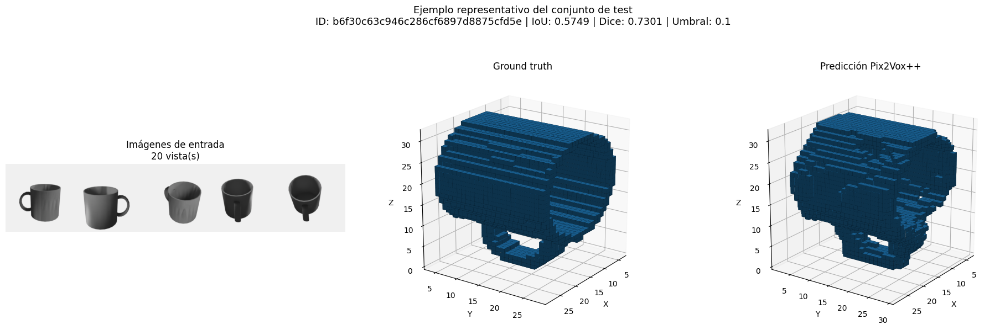


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp11_fix_experimento8_20v_finetuning_test_tazas/ejemplo_representativo.png
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       exp11_fix_experimento8_20v_finetuning_test_global
Tipo:              con_finetuning
Número de vistas:  20
Dispositivo:       cuda
Carpeta:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp11_fix_experimento8_20v_finetuning_test_global

1. Seleccionando el umbral con validación...


Validación 20 vistas:   0%|          | 0/94 [00:00<?, ?it/s]

Umbral seleccionado: 0.3
IoU de selección:    0.7834

2. Calculando las métricas completas de validación...


Validación completa 20 vistas:   0%|          | 0/94 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 20 vistas:   0%|          | 0/94 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.3
IoU validación:           0.7834
IoU test:                 0.7293
Dice test:                0.8265
Chamfer test:             0.5663
F-score superficie test:  0.8662
Tiempo total:             13.02 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp11_fix_experimento8_20v_finetuning_test_global


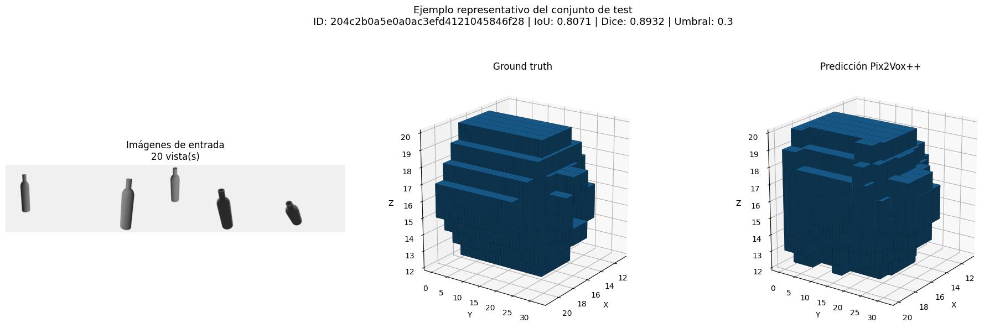


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp11_fix_experimento8_20v_finetuning_test_global/ejemplo_representativo.png

Resultados:


,test,numero_objetos,umbral,bce_x10_media,iou_media,dice_media,precision_voxel_media,recall_voxel_media,chamfer_superficie_media,f_score_superficie_media
0,Solo tazas,26.0,0.15,3.1792,0.5684,0.7099,0.6716,0.7768,0.7191,0.8285
1,Global,94.0,0.30,2.0897,0.7293,0.8265,0.8272,0.8406,0.5663,0.8662



Global por categoría:


,categoria,iou,dice,precision_voxel,recall_voxel,chamfer_superficie,f_score_superficie
0,02876657,0.7934,0.8737,0.8757,0.8834,0.5053,0.8814
1,03797390,0.5615,0.7032,0.7005,0.7285,0.7259,0.8266



EXP. 8 VS EXP. 11


,evaluacion,tazas_test,tazas_test_vistas_en_train,iou,dice
0,Exp. 8 - test histórico contaminado,26,16,0.7928,0.8655
1,Exp. 11 - mismo test histórico limpio,26,0,0.5684,0.7099


In [ ]:
# ============================================================
# 25. EXPERIMENTO 11 — FIX DEL EXPERIMENTO 8
# 20 vistas + tazas y botellas + split limpio
# ============================================================

NOMBRE_EXP11 = (
    "exp11_fix_experimento8_20v_finetuning"
)

NUM_VISTAS_EXP11 = 20

BATCH_EXP11 = 1

PASOS_ACUM_EXP11 = 5


def crear_modelo_exp11():

    return Pix2VoxPlusPlusA(

        usar_refiner=True,

        usar_merger=True,

        usar_pesos_imagenet=False,
    )


def inicializar_modelo_exp11(
    modelo
):

    return cargar_pesos_preentrenados_pix2vox(

        modelo=modelo,

        ruta_checkpoint=(
            RUTA_CHECKPOINT_OFICIAL
        ),

        dispositivo_carga="cpu",

        estricto=True,
    )


resultado_exp11 = (
    ejecutar_experimento_nuevo(

        nombre=(
            NOMBRE_EXP11
        ),

        numero_vistas=(
            NUM_VISTAS_EXP11
        ),

        batch_size=(
            BATCH_EXP11
        ),

        pasos_acumulacion=(
            PASOS_ACUM_EXP11
        ),

        categorias=(
            CATEGORIAS_EXP11
        ),

        df_train_nuevo=(
            df_train_exp11
        ),

        df_val_nuevo=(
            df_val_exp11
        ),

        df_test_nuevo=(
            df_test_exp11
        ),

        crear_modelo=(
            crear_modelo_exp11
        ),

        inicializar_modelo=(
            inicializar_modelo_exp11
        ),

        descripcion_modelo=(
            "Pix2Vox++/A original ResNet-50; "
            "20 vistas; tazas+botellas; "
            "split corregido"
        ),
    )
)


# ============================================================
# COMPARACIÓN CON EL RESULTADO CONTAMINADO DEL EXP. 8
# ============================================================

fila_tazas_exp11 = (
    resultado_exp11[
        "tabla_tests"
    ]
    .query(
        "test == 'Solo tazas'"
    )
    .iloc[0]
)


tabla_exp8_vs_exp11 = (
    pd.DataFrame(
        [
            {
                "evaluacion":
                    "Exp. 8 - test histórico contaminado",

                "tazas_test":
                    26,

                "tazas_test_vistas_en_train":
                    len(
                        solapamiento_exp8_confirmado
                    ),

                "iou":
                    0.7928,

                "dice":
                    0.8655,
            },

            {
                "evaluacion":
                    "Exp. 11 - mismo test histórico limpio",

                "tazas_test":
                    26,

                "tazas_test_vistas_en_train":
                    0,

                "iou":
                    float(
                        fila_tazas_exp11[
                            "iou_media"
                        ]
                    ),

                "dice":
                    float(
                        fila_tazas_exp11[
                            "dice_media"
                        ]
                    ),
            },
        ]
    )
)


tabla_exp8_vs_exp11.to_csv(

    RUTA_TABLAS
    / "comparacion_exp8_contaminado_vs_exp11_fix.csv",

    index=False,
)


print(
    "\n" + "=" * 75
)

print(
    "EXP. 8 VS EXP. 11"
)

print(
    "=" * 75
)


display(
    tabla_exp8_vs_exp11.round(
        4
    )
)

## 26. Experimento 12 — EfficientNet-B4 como backbone

Se estudia una modificación de la arquitectura Pix2Vox++/A sustituyendo el backbone ResNet-50 del encoder por EfficientNet-B4.

Para mantener una comparación controlada con el Experimento 10 se conservan exactamente:

- Las mismas cuatro categorías.
- Los mismos objetos de entrenamiento, validación y test.
- Cinco vistas.
- El mismo batch efectivo.
- El mismo procedimiento de fine-tuning.
- El mismo decoder.
- El mismo módulo de fusión.
- El mismo refiner.
- Las mismas métricas y criterios de selección del checkpoint.

El encoder original utiliza ResNet-50 únicamente hasta `layer2`, donde obtiene características de tamaño 512 × 28 × 28. EfficientNet-B4 se trunca de forma equivalente en una salida de 56 × 28 × 28, que se proyecta mediante una convolución 1 × 1 a 512 canales.

EfficientNet-B4 utiliza pesos preentrenados en ImageNet. Las capas posteriores del encoder, el decoder, el merger y el refiner reutilizan los pesos del checkpoint oficial de Pix2Vox++.

El objetivo es estudiar si un backbone visual diferente permite obtener mejores representaciones de las imágenes sin modificar el resto del pipeline de reconstrucción.

Downloading: "https://download.pytorch.org/models/efficientnet_b4_rwightman-23ab8bcd.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b4_rwightman-23ab8bcd.pth


100%|██████████| 74.5M/74.5M [00:00<00:00, 170MB/s]



PREFLIGHT EFFICIENTNET-B4
Entrada: (1, 1, 3, 224, 224)
Salida encoder: (1, 1, 256, 7, 7)
Parámetros totales: 95,182,527
[OK] Encoder compatible con 256 x 7 x 7.
[OK] exp12_4categorias_5v_efficientnetb4_finetuning: no hay objetos compartidos entre train/val/test.

exp12_4categorias_5v_efficientnetb4_finetuning
Modelo:            Pix2Vox++/A con EfficientNet-B4 truncada hasta 28x28 como backbone 2D
Categorías:        ['03797390', '02876657', '03593526', '02880940']
Vistas:            5
Batch físico:      5
Acumulación:       1
Batch efectivo:    5
Train/Val/Test:    920 198 198
Val/Test tazas:    26 26

INICIALIZACIÓN HÍBRIDA EXP. 12
EfficientNet-B4: pesos ImageNet
Encoder Pix2Vox layer1-3: 21 tensores reutilizados
Decoder: cargado completo
Merger:  cargado completo
Refiner: cargado completo
Proyección 56 -> 512: nueva y entrenable
INICIO DEL FINE-TUNING
Experimento:       exp12_4categorias_5v_efficientnetb4_finetuning
Dispositivo:       cuda
Épocas máximas:    30
Early stopping:    7
C

Train época 1:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 1:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       7.276556
IoU train @ 0.3:     0.2354
BCE validación:      3.006163
Umbral validación:   0.3
IoU validación:      0.3664
Dice validación:     0.5146
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 2/30


Train época 2:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 2:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       5.808653
IoU train @ 0.3:     0.4151
BCE validación:      2.513606
Umbral validación:   0.3
IoU validación:      0.4326
Dice validación:     0.5752
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 3/30


Train época 3:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 3:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       5.178954
IoU train @ 0.3:     0.4667
BCE validación:      2.302366
Umbral validación:   0.3
IoU validación:      0.4757
Dice validación:     0.6157
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 4/30


Train época 4:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 4:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       4.809453
IoU train @ 0.3:     0.4938
BCE validación:      2.137779
Umbral validación:   0.3
IoU validación:      0.5181
Dice validación:     0.6528
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 5/30


Train época 5:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 5:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       4.496545
IoU train @ 0.3:     0.5218
BCE validación:      2.056651
Umbral validación:   0.4
IoU validación:      0.5285
Dice validación:     0.6601
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 6/30


Train época 6:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 6:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       4.278821
IoU train @ 0.3:     0.5360
BCE validación:      1.949270
Umbral validación:   0.3
IoU validación:      0.5434
Dice validación:     0.6731
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 7/30


Train época 7:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 7:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       4.150455
IoU train @ 0.3:     0.5451
BCE validación:      1.878378
Umbral validación:   0.3
IoU validación:      0.5502
Dice validación:     0.6827
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 8/30


Train época 8:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 8:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       4.034651
IoU train @ 0.3:     0.5578
BCE validación:      1.874622
Umbral validación:   0.4
IoU validación:      0.5632
Dice validación:     0.6916
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 9/30


Train época 9:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 9:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.917203
IoU train @ 0.3:     0.5653
BCE validación:      1.846784
Umbral validación:   0.4
IoU validación:      0.5686
Dice validación:     0.6970
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 10/30


Train época 10:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 10:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.823238
IoU train @ 0.3:     0.5746
BCE validación:      1.764566
Umbral validación:   0.4
IoU validación:      0.5726
Dice validación:     0.6988
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 11/30


Train época 11:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 11:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.732231
IoU train @ 0.3:     0.5822
BCE validación:      1.756143
Umbral validación:   0.4
IoU validación:      0.5798
Dice validación:     0.7064
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 12/30


Train época 12:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 12:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.640497
IoU train @ 0.3:     0.5906
BCE validación:      1.684858
Umbral validación:   0.4
IoU validación:      0.5905
Dice validación:     0.7142
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 13/30


Train época 13:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 13:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.587151
IoU train @ 0.3:     0.5962
BCE validación:      1.673642
Umbral validación:   0.3
IoU validación:      0.5996
Dice validación:     0.7239
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 14/30


Train época 14:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 14:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.483385
IoU train @ 0.3:     0.6031
BCE validación:      1.659232
Umbral validación:   0.4
IoU validación:      0.5983
Dice validación:     0.7210
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 15/30


Train época 15:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 15:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.430199
IoU train @ 0.3:     0.6078
BCE validación:      1.638855
Umbral validación:   0.4
IoU validación:      0.6038
Dice validación:     0.7266
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 16/30


Train época 16:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 16:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.362339
IoU train @ 0.3:     0.6141
BCE validación:      1.696147
Umbral validación:   0.5
IoU validación:      0.5969
Dice validación:     0.7201
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 17/30


Train época 17:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 17:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.285726
IoU train @ 0.3:     0.6194
BCE validación:      1.619581
Umbral validación:   0.4
IoU validación:      0.6058
Dice validación:     0.7293
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 18/30


Train época 18:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 18:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.267534
IoU train @ 0.3:     0.6210
BCE validación:      1.608208
Umbral validación:   0.4
IoU validación:      0.6101
Dice validación:     0.7334
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 19/30


Train época 19:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 19:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.209464
IoU train @ 0.3:     0.6264
BCE validación:      1.590564
Umbral validación:   0.4
IoU validación:      0.6198
Dice validación:     0.7392
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 20/30


Train época 20:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 20:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.160600
IoU train @ 0.3:     0.6338
BCE validación:      1.571566
Umbral validación:   0.4
IoU validación:      0.6199
Dice validación:     0.7392
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 21/30


Train época 21:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 21:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.111750
IoU train @ 0.3:     0.6347
BCE validación:      1.555227
Umbral validación:   0.3
IoU validación:      0.6274
Dice validación:     0.7461
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 22/30


Train época 22:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 22:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.061552
IoU train @ 0.3:     0.6387
BCE validación:      1.546380
Umbral validación:   0.3
IoU validación:      0.6211
Dice validación:     0.7437
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 23/30


Train época 23:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 23:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       3.019581
IoU train @ 0.3:     0.6431
BCE validación:      1.534318
Umbral validación:   0.3
IoU validación:      0.6270
Dice validación:     0.7475
Mejor checkpoint:    No
Épocas sin mejora:   2/7

ÉPOCA 24/30


Train época 24:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 24:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.989811
IoU train @ 0.3:     0.6490
BCE validación:      1.540644
Umbral validación:   0.3
IoU validación:      0.6240
Dice validación:     0.7460
Mejor checkpoint:    No
Épocas sin mejora:   3/7

ÉPOCA 25/30


Train época 25:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 25:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.950262
IoU train @ 0.3:     0.6506
BCE validación:      1.517037
Umbral validación:   0.3
IoU validación:      0.6333
Dice validación:     0.7532
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 26/30


Train época 26:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 26:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.896055
IoU train @ 0.3:     0.6552
BCE validación:      1.539718
Umbral validación:   0.4
IoU validación:      0.6345
Dice validación:     0.7524
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 27/30


Train época 27:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 27:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.879554
IoU train @ 0.3:     0.6557
BCE validación:      1.500216
Umbral validación:   0.3
IoU validación:      0.6361
Dice validación:     0.7554
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 28/30


Train época 28:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 28:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.828721
IoU train @ 0.3:     0.6607
BCE validación:      1.481926
Umbral validación:   0.4
IoU validación:      0.6406
Dice validación:     0.7563
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 29/30


Train época 29:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 29:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.787943
IoU train @ 0.3:     0.6646
BCE validación:      1.468808
Umbral validación:   0.3
IoU validación:      0.6445
Dice validación:     0.7607
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 30/30


Train época 30:   0%|          | 0/184 [00:00<?, ?it/s]

Validación época 30:   0%|          | 0/40 [00:00<?, ?it/s]

Pérdida train:       2.778318
IoU train @ 0.3:     0.6647
BCE validación:      1.460913
Umbral validación:   0.4
IoU validación:      0.6425
Dice validación:     0.7593
Mejor checkpoint:    No
Épocas sin mejora:   1/7

FINE-TUNING FINALIZADO
Épocas ejecutadas:       30
Mejor época:             29
Mejor umbral:            0.3
Mejor IoU validación:    0.6445
Mejor Dice validación:   0.7607
Tiempo total:            141.86 minutos

Checkpoint guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/checkpoints/exp12_4categorias_5v_efficientnetb4_finetuning_mejor.pth

Historial guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/historiales/exp12_4categorias_5v_efficientnetb4_finetuning_historial.csv

Mejor checkpoint:
  época: 29
  IoU val global: 0.6445
  Dice val global: 0.7607
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       exp12_4categorias_5v_efficientnetb4_finetuning_test_tazas
Tipo:              con_finetuning
Número de vistas:  5
Dispositivo:       cuda
Carpet

Validación 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]

Umbral seleccionado: 0.4
IoU de selección:    0.5496

2. Calculando las métricas completas de validación...


Validación completa 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.4
IoU validación:           0.5496
IoU test:                 0.5470
Dice test:                0.6913
Chamfer test:             0.7030
F-score superficie test:  0.8328
Tiempo total:             0.07 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp12_4categorias_5v_efficientnetb4_finetuning_test_tazas


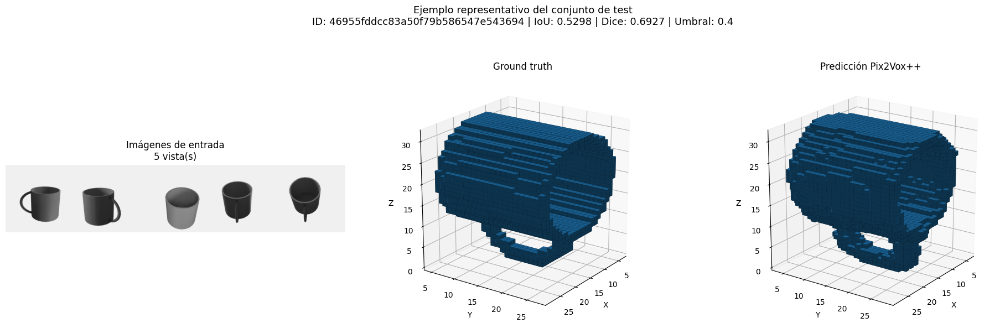


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp12_4categorias_5v_efficientnetb4_finetuning_test_tazas/ejemplo_representativo.png
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       exp12_4categorias_5v_efficientnetb4_finetuning_test_global
Tipo:              con_finetuning
Número de vistas:  5
Dispositivo:       cuda
Carpeta:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp12_4categorias_5v_efficientnetb4_finetuning_test_global

1. Seleccionando el umbral con validación...


Validación 5 vistas:   0%|          | 0/40 [00:00<?, ?it/s]

Umbral seleccionado: 0.3
IoU de selección:    0.6445

2. Calculando las métricas completas de validación...


Validación completa 5 vistas:   0%|          | 0/40 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 5 vistas:   0%|          | 0/40 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.3
IoU validación:           0.6445
IoU test:                 0.6605
Dice test:                0.7762
Chamfer test:             0.6887
F-score superficie test:  0.8292
Tiempo total:             7.12 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp12_4categorias_5v_efficientnetb4_finetuning_test_global


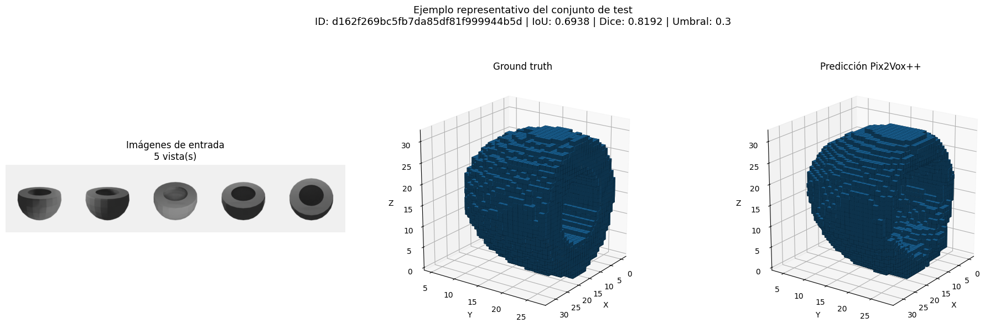


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp12_4categorias_5v_efficientnetb4_finetuning_test_global/ejemplo_representativo.png

Resultados:


,test,numero_objetos,umbral,bce_x10_media,iou_media,dice_media,precision_voxel_media,recall_voxel_media,chamfer_superficie_media,f_score_superficie_media
0,Solo tazas,26.0,0.4,2.1755,0.5470,0.6913,0.6470,0.7755,0.7030,0.8328
1,Global,198.0,0.3,1.5019,0.6605,0.7762,0.7223,0.8658,0.6887,0.8292



Global por categoría:


,categoria,iou,dice,precision_voxel,recall_voxel,chamfer_superficie,f_score_superficie
0,02876657,0.8184,0.8964,0.8702,0.9282,0.4209,0.9231
1,02880940,0.4690,0.6224,0.5333,0.7965,0.6640,0.8228
2,03593526,0.6205,0.7473,0.6918,0.8391,0.8882,0.7609
3,03797390,0.5354,0.6830,0.5916,0.8459,0.7808,0.8042



COMPARACIÓN EXP. 10 VS EXP. 12


,test_comparable,iou_media_exp10_resnet50,dice_media_exp10_resnet50,chamfer_superficie_media_exp10_resnet50,f_score_superficie_media_exp10_resnet50,iou_media_exp12_efficientnetb4,dice_media_exp12_efficientnetb4,chamfer_superficie_media_exp12_efficientnetb4,f_score_superficie_media_exp12_efficientnetb4,diferencia_iou_exp12_menos_exp10,diferencia_dice_exp12_menos_exp10
0,Solo tazas,0.5921,0.7287,0.6520,0.8575,0.5470,0.6913,0.7030,0.8328,-0.0450,-0.0374
1,Global,0.7021,0.8068,0.5755,0.8674,0.6605,0.7762,0.6887,0.8292,-0.0416,-0.0306



[OK] Experimento 12 completado.


In [ ]:
# ============================================================
# 26. EXPERIMENTO 12
# 5 vistas + 4 categorías + EfficientNet-B4
# ============================================================


# ============================================================
# A. ENCODER EFFICIENTNET-B4
# ============================================================

class EncoderPix2VoxEfficientNetB4(
    nn.Module
):

    def __init__(
        self,
        usar_pesos_imagenet=True,
    ):

        super().__init__()


        pesos = (

            models.EfficientNet_B4_Weights.DEFAULT

            if usar_pesos_imagenet

            else None
        )


        efficientnet = (
            models.efficientnet_b4(
                weights=pesos
            )
        )


        # ----------------------------------------------------
        # EfficientNet-B4 truncada
        #
        # Entrada:
        # 3 x 224 x 224
        #
        # Salida:
        # 56 x 28 x 28
        # ----------------------------------------------------

        self.efficientnet = (
            nn.Sequential(
                *list(
                    efficientnet
                    .features
                    .children()
                )[:4]
            )
        )


        # ----------------------------------------------------
        # Adaptador mínimo:
        #
        # 56 x 28 x 28
        # ->
        # 512 x 28 x 28
        #
        # Esto permite conservar las capas
        # originales de Pix2Vox++.
        # ----------------------------------------------------

        self.proyeccion = (
            nn.Conv2d(

                in_channels=56,

                out_channels=512,

                kernel_size=1,

                bias=False,
            )
        )


        # ----------------------------------------------------
        # Capas idénticas al encoder original Pix2Vox++
        # ----------------------------------------------------

        self.layer1 = (
            nn.Sequential(

                nn.Conv2d(
                    in_channels=512,
                    out_channels=512,
                    kernel_size=3,
                    padding=1,
                ),

                nn.BatchNorm2d(
                    512
                ),

                nn.ReLU(),
            )
        )


        self.layer2 = (
            nn.Sequential(

                nn.Conv2d(
                    in_channels=512,
                    out_channels=256,
                    kernel_size=3,
                    padding=1,
                ),

                nn.BatchNorm2d(
                    256
                ),

                nn.ReLU(),

                nn.MaxPool2d(
                    kernel_size=2
                ),
            )
        )


        self.layer3 = (
            nn.Sequential(

                nn.Conv2d(
                    in_channels=256,
                    out_channels=256,
                    kernel_size=3,
                    padding=1,
                ),

                nn.BatchNorm2d(
                    256
                ),

                nn.ReLU(),

                nn.MaxPool2d(
                    kernel_size=2
                ),
            )
        )


        # ----------------------------------------------------
        # Normalización
        #
        # El Dataset permanece INTACTO.
        #
        # Solo dentro del nuevo backbone se convierte:
        #
        # BGR Pix2Vox normalizado
        # ->
        # RGB ImageNet normalizado
        # ----------------------------------------------------

        self.register_buffer(

            "media_pix2vox",

            torch.tensor(
                MEDIA_IMAGEN,
                dtype=torch.float32,
            ).view(
                1,
                3,
                1,
                1,
            ),
        )


        self.register_buffer(

            "desv_pix2vox",

            torch.tensor(
                DESVIACION_IMAGEN,
                dtype=torch.float32,
            ).view(
                1,
                3,
                1,
                1,
            ),
        )


        self.register_buffer(

            "media_imagenet",

            torch.tensor(
                [
                    0.485,
                    0.456,
                    0.406,
                ],
                dtype=torch.float32,
            ).view(
                1,
                3,
                1,
                1,
            ),
        )


        self.register_buffer(

            "desv_imagenet",

            torch.tensor(
                [
                    0.229,
                    0.224,
                    0.225,
                ],
                dtype=torch.float32,
            ).view(
                1,
                3,
                1,
                1,
            ),
        )


    def _adaptar_entrada_imagenet(
        self,
        imagen_bgr_pix2vox,
    ):

        # Deshacer normalización Pix2Vox.
        bgr_01 = (

            imagen_bgr_pix2vox
            * self.desv_pix2vox
            + self.media_pix2vox
        )


        # BGR -> RGB.
        rgb_01 = (
            bgr_01[
                :,
                [2, 1, 0],
                :,
                :,
            ]
        )


        # Normalización ImageNet.
        rgb_imagenet = (

            (
                rgb_01
                - self.media_imagenet
            )

            / self.desv_imagenet
        )


        return rgb_imagenet


    def forward(
        self,
        imagenes,
    ):

        if (
            imagenes.ndim
            != 5
        ):

            raise ValueError(
                "El encoder espera "
                "(batch, vistas, 3, 224, 224). "
                f"Recibido: "
                f"{tuple(imagenes.shape)}"
            )


        if (
            imagenes.shape[2]
            != 3
        ):

            raise ValueError(
                "Las imágenes deben tener "
                "3 canales."
            )


        imagenes_por_vista = (

            imagenes.permute(
                1,
                0,
                2,
                3,
                4,
            )
            .contiguous()
        )


        caracteristicas_vistas = []


        for imagen_vista in torch.unbind(

            imagenes_por_vista,

            dim=0,
        ):

            imagen_vista = (
                self._adaptar_entrada_imagenet(
                    imagen_vista
                )
            )


            caracteristicas = (
                self.efficientnet(
                    imagen_vista
                )
            )


            caracteristicas = (
                self.proyeccion(
                    caracteristicas
                )
            )


            caracteristicas = (
                self.layer1(
                    caracteristicas
                )
            )


            caracteristicas = (
                self.layer2(
                    caracteristicas
                )
            )


            caracteristicas = (
                self.layer3(
                    caracteristicas
                )
            )


            caracteristicas_vistas.append(
                caracteristicas
            )


        caracteristicas_vistas = (
            torch.stack(
                caracteristicas_vistas,
                dim=1,
            )
        )


        if (
            caracteristicas_vistas.shape[
                2:
            ]
            != (
                256,
                7,
                7,
            )
        ):

            raise RuntimeError(
                "Salida inesperada del encoder.\n"
                f"{tuple(caracteristicas_vistas.shape)}"
            )


        return (
            caracteristicas_vistas
        )


# ============================================================
# B. MODELO COMPLETO
# ============================================================

class Pix2VoxPlusPlusAEfficientNetB4(
    Pix2VoxPlusPlusA
):

    def __init__(
        self,
        usar_refiner=True,
        usar_merger=True,
        usar_pesos_imagenet=True,
    ):

        # Decoder, merger y refiner:
        # exactamente los originales.
        super().__init__(

            usar_refiner=(
                usar_refiner
            ),

            usar_merger=(
                usar_merger
            ),

            usar_pesos_imagenet=False,
        )


        # Únicamente sustituimos el encoder.
        self.encoder = (
            EncoderPix2VoxEfficientNetB4(

                usar_pesos_imagenet=(
                    usar_pesos_imagenet
                )
            )
        )


# ============================================================
# C. CARGA HÍBRIDA DEL CHECKPOINT
# ============================================================

def cargar_pesos_iniciales_exp12(

    modelo,

    ruta_checkpoint=(
        RUTA_CHECKPOINT_OFICIAL
    ),

    dispositivo_carga="cpu",
):

    ruta_checkpoint = Path(
        ruta_checkpoint
    )


    validar_archivo_checkpoint(
        ruta_checkpoint
    )


    globals_numpy_seguros = (
        obtener_globals_numpy_seguros()
    )


    with torch.serialization.safe_globals(
        globals_numpy_seguros
    ):

        checkpoint = torch.load(

            ruta_checkpoint,

            map_location=(
                dispositivo_carga
            ),

            weights_only=True,
        )


    claves_obligatorias = {

        "encoder_state_dict",

        "decoder_state_dict",

        "merger_state_dict",

        "refiner_state_dict",
    }


    if not claves_obligatorias.issubset(
        checkpoint.keys()
    ):

        raise KeyError(
            "El checkpoint oficial no contiene "
            "los cuatro módulos esperados."
        )


    # ========================================================
    # ENCODER
    #
    # Del encoder oficial reutilizamos únicamente
    # layer1, layer2 y layer3.
    #
    # La antigua ResNet NO se carga.
    # ========================================================

    estado_encoder_original = (
        eliminar_prefijo_module(

            checkpoint[
                "encoder_state_dict"
            ]
        )
    )


    prefijos_reutilizados = (

        "layer1.",

        "layer2.",

        "layer3.",
    )


    estado_encoder_reutilizable = {

        clave:
            valor

        for clave, valor
        in estado_encoder_original.items()

        if clave.startswith(
            prefijos_reutilizados
        )
    }


    resultado_encoder = (
        modelo.encoder.load_state_dict(

            estado_encoder_reutilizable,

            strict=False,
        )
    )


    if (
        resultado_encoder
        .unexpected_keys
    ):

        raise RuntimeError(
            "Claves inesperadas al cargar "
            "el encoder:\n"
            f"{resultado_encoder.unexpected_keys}"
        )


    # ========================================================
    # DECODER + MERGER + REFINER
    #
    # Carga estricta.
    # ========================================================

    for (
        nombre_modulo,
        clave_checkpoint
    ) in [

        (
            "decoder",
            "decoder_state_dict",
        ),

        (
            "merger",
            "merger_state_dict",
        ),

        (
            "refiner",
            "refiner_state_dict",
        ),
    ]:

        modulo = getattr(
            modelo,
            nombre_modulo
        )


        estado = (
            eliminar_prefijo_module(

                checkpoint[
                    clave_checkpoint
                ]
            )
        )


        resultado = (
            modulo.load_state_dict(

                estado,

                strict=True,
            )
        )


        if (
            resultado.missing_keys

            or

            resultado.unexpected_keys
        ):

            raise RuntimeError(
                f"Carga incompleta de "
                f"{nombre_modulo}."
            )


    metadata = {

        "epoch_idx":
            checkpoint.get(
                "epoch_idx"
            ),

        "best_epoch":
            checkpoint.get(
                "best_epoch"
            ),

        "best_iou":
            checkpoint.get(
                "best_iou"
            ),

        "encoder_pix2vox_tensores_reutilizados":
            len(
                estado_encoder_reutilizable
            ),

        "encoder_claves_nuevas":
            list(
                resultado_encoder
                .missing_keys
            ),

        "backbone":
            "EfficientNet-B4 ImageNet",
    }


    print(
        "\n" + "=" * 75
    )

    print(
        "INICIALIZACIÓN HÍBRIDA EXP. 12"
    )

    print(
        "=" * 75
    )

    print(
        "EfficientNet-B4: "
        "pesos ImageNet"
    )

    print(
        "Encoder Pix2Vox layer1-3: "
        f"{len(estado_encoder_reutilizable)} "
        "tensores reutilizados"
    )

    print(
        "Decoder: cargado completo"
    )

    print(
        "Merger:  cargado completo"
    )

    print(
        "Refiner: cargado completo"
    )

    print(
        "Proyección 56 -> 512: "
        "nueva y entrenable"
    )


    del checkpoint
    del estado_encoder_original

    gc.collect()


    return metadata


# ============================================================
# D. FACTORY DEL MODELO
# ============================================================

def crear_modelo_exp12():

    return (
        Pix2VoxPlusPlusAEfficientNetB4(

            usar_refiner=True,

            usar_merger=True,

            usar_pesos_imagenet=True,
        )
    )


# ============================================================
# E. PREFLIGHT DE ARQUITECTURA
# ============================================================

reiniciar_semillas_exp11_12()


modelo_preflight_exp12 = (
    crear_modelo_exp12()
)


modelo_preflight_exp12.eval()


with torch.inference_mode():

    entrada_preflight = torch.zeros(

        (
            1,
            1,
            3,
            TAMANO_IMAGEN,
            TAMANO_IMAGEN,
        ),

        dtype=torch.float32,
    )


    salida_encoder_preflight = (
        modelo_preflight_exp12.encoder(
            entrada_preflight
        )
    )


print(
    "\n" + "=" * 75
)

print(
    "PREFLIGHT EFFICIENTNET-B4"
)

print(
    "=" * 75
)

print(
    "Entrada:",
    tuple(
        entrada_preflight.shape
    ),
)

print(
    "Salida encoder:",
    tuple(
        salida_encoder_preflight.shape
    ),
)


if (
    tuple(
        salida_encoder_preflight.shape
    )
    != (
        1,
        1,
        256,
        7,
        7,
    )
):

    raise RuntimeError(
        "EfficientNet-B4 no es compatible "
        "con el decoder Pix2Vox++."
    )


parametros_exp12 = (
    contar_parametros_modelo(
        modelo_preflight_exp12
    )
)


print(
    "Parámetros totales:",
    f"{parametros_exp12['parametros_totales']:,}"
)

print(
    "[OK] Encoder compatible "
    "con 256 x 7 x 7."
)


del modelo_preflight_exp12
del entrada_preflight
del salida_encoder_preflight
del parametros_exp12

gc.collect()


if torch.cuda.is_available():

    torch.cuda.empty_cache()


# ============================================================
# F. EXPERIMENTO 12
# ============================================================

NOMBRE_EXP12 = (
    "exp12_4categorias_5v_efficientnetb4_finetuning"
)

NUM_VISTAS_EXP12 = 5

BATCH_EXP12 = 5

PASOS_ACUM_EXP12 = 1


def inicializar_modelo_exp12(
    modelo
):

    return (
        cargar_pesos_iniciales_exp12(

            modelo=modelo,

            ruta_checkpoint=(
                RUTA_CHECKPOINT_OFICIAL
            ),

            dispositivo_carga="cpu",
        )
    )


resultado_exp12 = (
    ejecutar_experimento_nuevo(

        nombre=(
            NOMBRE_EXP12
        ),

        numero_vistas=(
            NUM_VISTAS_EXP12
        ),

        batch_size=(
            BATCH_EXP12
        ),

        pasos_acumulacion=(
            PASOS_ACUM_EXP12
        ),

        categorias=(
            CATEGORIAS_EXP12
        ),

        df_train_nuevo=(
            df_train_exp12
        ),

        df_val_nuevo=(
            df_val_exp12
        ),

        df_test_nuevo=(
            df_test_exp12
        ),

        crear_modelo=(
            crear_modelo_exp12
        ),

        inicializar_modelo=(
            inicializar_modelo_exp12
        ),

        descripcion_modelo=(
            "Pix2Vox++/A con EfficientNet-B4 "
            "truncada hasta 28x28 "
            "como backbone 2D"
        ),
    )
)


# ============================================================
# G. COMPARACIÓN AUTOMÁTICA EXP. 10 VS EXP. 12
# ============================================================

RUTA_RESULTADOS_EXP10 = (

    RUTA_TABLAS
    / (
        "exp10_4categorias_5v_finetuning"
        "_comparacion_tests.csv"
    )
)


if (
    RUTA_RESULTADOS_EXP10.exists()
):

    tabla_exp10 = (
        pd.read_csv(
            RUTA_RESULTADOS_EXP10
        )
    )


    tabla_exp12 = (
        resultado_exp12[
            "tabla_tests"
        ]
        .copy()
    )


    tabla_exp10[
        "test_comparable"
    ] = (
        tabla_exp10[
            "test"
        ]
        .replace(
            {
                "Global 4 categorías":
                    "Global",
            }
        )
    )


    tabla_exp12[
        "test_comparable"
    ] = (
        tabla_exp12[
            "test"
        ]
    )


    columnas_comparar = [

        "iou_media",

        "dice_media",

        "chamfer_superficie_media",

        "f_score_superficie_media",
    ]


    comparacion = (
        tabla_exp10[
            [
                "test_comparable",
                *columnas_comparar,
            ]
        ]
        .merge(

            tabla_exp12[
                [
                    "test_comparable",
                    *columnas_comparar,
                ]
            ],

            on=(
                "test_comparable"
            ),

            suffixes=(

                "_exp10_resnet50",

                "_exp12_efficientnetb4",
            ),
        )
    )


    comparacion[
        "diferencia_iou_exp12_menos_exp10"
    ] = (

        comparacion[
            "iou_media_exp12_efficientnetb4"
        ]

        -

        comparacion[
            "iou_media_exp10_resnet50"
        ]
    )


    comparacion[
        "diferencia_dice_exp12_menos_exp10"
    ] = (

        comparacion[
            "dice_media_exp12_efficientnetb4"
        ]

        -

        comparacion[
            "dice_media_exp10_resnet50"
        ]
    )


    RUTA_COMPARACION_EXP10_EXP12 = (

        RUTA_TABLAS

        / (
            "comparacion_exp10_resnet50"
            "_vs_exp12_efficientnetb4.csv"
        )
    )


    comparacion.to_csv(

        RUTA_COMPARACION_EXP10_EXP12,

        index=False,
    )


    print(
        "\n" + "=" * 75
    )

    print(
        "COMPARACIÓN EXP. 10 VS EXP. 12"
    )

    print(
        "=" * 75
    )


    display(
        comparacion.round(
            4
        )
    )


else:

    print(
        "\n[AVISO] No se encontró la tabla "
        "del Experimento 10 para crear "
        "la comparación automática."
    )


print(
    "\n[OK] Experimento 12 completado."
)

# Prueba con tazas rotas

## Preparación Experimento 13

In [ ]:
# ============================================================
# DIAGNÓSTICO DEL DATASET DE TAZAS ROTAS
# ============================================================

from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd


RUTA_TAZAS_ROTAS = (
    RUTA_DATOS_E2
    / "General/Fantastik_Break_Preprocesado"
)


if not RUTA_TAZAS_ROTAS.exists():

    raise FileNotFoundError(
        f"No existe:\n{RUTA_TAZAS_ROTAS}"
    )


# ============================================================
# 1. CONTAR TODOS LOS TIPOS DE ARCHIVO
# ============================================================

archivos = [
    ruta
    for ruta in RUTA_TAZAS_ROTAS.rglob("*")
    if ruta.is_file()
]


conteo_extensiones = Counter(
    ruta.suffix.lower()
    if ruta.suffix
    else "[sin extensión]"
    for ruta in archivos
)


print("=" * 75)
print("DIAGNÓSTICO FANTASTIK BREAK")
print("=" * 75)

print(
    f"Ruta:\n{RUTA_TAZAS_ROTAS}"
)

print(
    f"\nArchivos totales: "
    f"{len(archivos)}"
)

print("\nExtensiones:")

for extension, cantidad in sorted(
    conteo_extensiones.items()
):

    print(
        f"  {extension:<12} "
        f"{cantidad}"
    )


# ============================================================
# 2. CARPETAS DE PRIMER NIVEL
# ============================================================

subcarpetas = sorted(
    ruta.name
    for ruta in RUTA_TAZAS_ROTAS.iterdir()
    if ruta.is_dir()
)


print(
    "\nSubcarpetas:"
)

if subcarpetas:

    for carpeta in subcarpetas:

        print(
            f"  - {carpeta}"
        )

else:

    print(
        "  [ninguna]"
    )


# ============================================================
# 3. ANALIZAR LOS .NPY
# ============================================================

archivos_npy = sorted(
    RUTA_TAZAS_ROTAS.rglob(
        "*.npy"
    )
)


print(
    f"\nArchivos NPY: "
    f"{len(archivos_npy)}"
)


registros = []


for ruta in archivos_npy[:50]:

    try:

        array = np.load(
            ruta,
            mmap_mode="r",
            allow_pickle=False,
        )


        registro = {

            "archivo":
                ruta.name,

            "ruta_relativa":
                str(
                    ruta.relative_to(
                        RUTA_TAZAS_ROTAS
                    )
                ),

            "shape":
                str(
                    tuple(
                        array.shape
                    )
                ),

            "ndim":
                int(
                    array.ndim
                ),

            "dtype":
                str(
                    array.dtype
                ),

            "elementos":
                int(
                    array.size
                ),

            "min":
                None,

            "max":
                None,

            "no_ceros":
                None,
        }


        # Para arrays razonablemente pequeños,
        # inspeccionamos también su contenido.
        if array.size <= 2_000_000:

            registro[
                "min"
            ] = float(
                np.min(
                    array
                )
            )

            registro[
                "max"
            ] = float(
                np.max(
                    array
                )
            )

            registro[
                "no_ceros"
            ] = int(
                np.count_nonzero(
                    array
                )
            )


        registros.append(
            registro
        )


        del array


    except Exception as exc:

        registros.append(
            {
                "archivo":
                    ruta.name,

                "ruta_relativa":
                    str(
                        ruta.relative_to(
                            RUTA_TAZAS_ROTAS
                        )
                    ),

                "shape":
                    None,

                "ndim":
                    None,

                "dtype":
                    None,

                "elementos":
                    None,

                "min":
                    None,

                "max":
                    None,

                "no_ceros":
                    None,

                "error":
                    str(
                        exc
                    ),
            }
        )


df_diagnostico_rotas = (
    pd.DataFrame(
        registros
    )
)


print(
    "\nPrimeros archivos:"
)

display(
    df_diagnostico_rotas.head(
        30
    )
)


# ============================================================
# 4. RESUMEN POR SHAPE
# ============================================================

if not df_diagnostico_rotas.empty:

    print(
        "\nShapes encontrados "
        "entre los primeros 50:"
    )

    display(
        df_diagnostico_rotas[
            "shape"
        ]
        .value_counts(
            dropna=False
        )
        .rename_axis(
            "shape"
        )
        .reset_index(
            name="cantidad"
        )
    )


# ============================================================
# 5. BUSCAR IMÁGENES
# ============================================================

extensiones_imagen = {
    ".png",
    ".jpg",
    ".jpeg",
    ".webp",
}


imagenes_encontradas = [
    ruta
    for ruta in archivos
    if ruta.suffix.lower()
    in extensiones_imagen
]


print(
    f"\nImágenes RGB encontradas: "
    f"{len(imagenes_encontradas)}"
)


if imagenes_encontradas:

    print(
        "\nPrimeras imágenes:"
    )

    for ruta in imagenes_encontradas[:20]:

        print(
            " ",
            ruta.relative_to(
                RUTA_TAZAS_ROTAS
            )
        )


print(
    "\n[OK] Diagnóstico terminado."
)

DIAGNÓSTICO FANTASTIK BREAK
Ruta:
/content/drive/MyDrive/Datos_E2_E3/General/Fantastik_Break_Preprocesado

Archivos totales: 122

Extensiones:
  .npy         122

Subcarpetas:
  - Fantastik_Break_Preprocesado

Archivos NPY: 122

Primeros archivos:


,archivo,ruta_relativa,shape,ndim,dtype,elementos,min,max,no_ceros
0,00_00002_completo.npy,00_00002_completo.npy,"(2048, 3)",2,float32,6144,-0.995458,0.650719,6144
1,00_00002_roto.npy,00_00002_roto.npy,"(2048, 3)",2,float32,6144,-0.991550,0.698874,6144
2,00_00003_completo.npy,00_00003_completo.npy,"(2048, 3)",2,float32,6144,-0.998033,0.759233,6144
3,00_00003_roto.npy,00_00003_roto.npy,"(2048, 3)",2,float32,6144,-0.983862,0.830577,6144
4,00_00005_completo.npy,00_00005_completo.npy,"(2048, 3)",2,float32,6144,-0.975584,0.665092,6144
5,00_00005_roto.npy,00_00005_roto.npy,"(2048, 3)",2,float32,6144,-0.837038,0.787519,6144
6,00_00006_completo.npy,00_00006_completo.npy,"(2048, 3)",2,float32,6144,-0.932328,0.620757,6144
7,00_00006_roto.npy,00_00006_roto.npy,"(2048, 3)",2,float32,6144,-0.916342,0.666884,6144
8,00_00008_completo.npy,00_00008_completo.npy,"(2048, 3)",2,float32,6144,-0.967557,0.679912,6144
9,00_00008_roto.npy,00_00008_roto.npy,"(2048, 3)",2,float32,6144,-0.961472,0.618801,6144



Shapes encontrados entre los primeros 50:


,shape,cantidad
0,"(2048, 3)",50



Imágenes RGB encontradas: 0

[OK] Diagnóstico terminado.


In [ ]:
# ============================================================
# 27. PREPARACIÓN DEL EXPERIMENTO 13
# 7 categorías + 5 vistas
# ============================================================

import os
import gc
import random

import numpy as np
import pandas as pd
import torch

from pathlib import Path
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader


# ============================================================
# CONFIGURACIÓN
# ============================================================

CATEGORIAS_EXP13 = sorted(
    CATEGORIAS_DISPONIBLES
)


CATEGORIAS_BASE_EXP10 = [
    "03797390",  # taza
    "02876657",  # botella
    "03593526",  # tarro
    "02880940",  # cuenco
]


CATEGORIAS_NUEVAS_EXP13 = sorted(
    set(
        CATEGORIAS_EXP13
    )
    -
    set(
        CATEGORIAS_BASE_EXP10
    )
)


RUTA_CATALOGO_EXP13 = (
    RUTA_CATALOGOS
    / "catalogo_exp13_7categorias.csv"
)


RUTA_TRAIN_EXP13 = (
    RUTA_DIVISIONES
    / "exp13_7categorias_train.csv"
)

RUTA_VAL_EXP13 = (
    RUTA_DIVISIONES
    / "exp13_7categorias_validacion.csv"
)

RUTA_TEST_EXP13 = (
    RUTA_DIVISIONES
    / "exp13_7categorias_test.csv"
)


# Splits de Exp. 9/10.
RUTA_TRAIN_EXP10_BASE = (
    RUTA_DIVISIONES
    / "exp9_10_4categorias_train.csv"
)

RUTA_VAL_EXP10_BASE = (
    RUTA_DIVISIONES
    / "exp9_10_4categorias_validacion.csv"
)

RUTA_TEST_EXP10_BASE = (
    RUTA_DIVISIONES
    / "exp9_10_4categorias_test.csv"
)


# ============================================================
# FUNCIONES AUXILIARES
# ============================================================

def normalizar_exp13(
    dataframe
):

    dataframe = (
        dataframe.copy()
    )

    dataframe[
        "categoria"
    ] = (
        dataframe[
            "categoria"
        ]
        .astype(str)
        .str.zfill(8)
    )

    dataframe[
        "identificador"
    ] = (
        dataframe[
            "identificador"
        ]
        .astype(str)
    )

    return dataframe


def catalogar_categoria_exp13(
    categoria
):
    """
    Catalogación rápida.

    No abre las 20 imágenes.
    Construye las rutas a partir de objetos presentes
    simultáneamente en Img E2 y Datos_E2_voxel.
    """

    ruta_img = (
        RUTA_IMAGENES
        / categoria
    )

    ruta_vox = (
        RUTA_VOXELES
        / categoria
    )


    ids_img = {
        entrada.name
        for entrada
        in os.scandir(
            ruta_img
        )
        if entrada.is_dir()
    }


    ids_vox = {
        entrada.name
        for entrada
        in os.scandir(
            ruta_vox
        )
        if entrada.is_dir()
    }


    ids_validos = sorted(
        ids_img
        & ids_vox
    )


    registros = []


    for identificador in ids_validos:

        rendering = (
            ruta_img
            / identificador
            / "rendering"
        )


        registro = {

            "categoria":
                categoria,

            "identificador":
                identificador,

            "ruta_carpeta_objeto":
                str(
                    ruta_img
                    / identificador
                ),

            "ruta_rendering":
                str(
                    rendering
                ),

            "ruta_binvox":
                str(
                    ruta_vox
                    / identificador
                    / "model.binvox"
                ),

            "numero_imagenes":
                20,
        }


        for indice in range(
            20
        ):

            registro[
                f"vista_{indice:02d}"
            ] = str(
                rendering
                / f"{indice:02d}.png"
            )


        registros.append(
            registro
        )


    return pd.DataFrame(
        registros
    )


# ============================================================
# CATÁLOGO DE LAS 7 CATEGORÍAS
# ============================================================

if RUTA_CATALOGO_EXP13.exists():

    print(
        "Cargando catálogo Exp. 13..."
    )

    df_catalogo_exp13 = (
        pd.read_csv(
            RUTA_CATALOGO_EXP13,
            dtype={
                "categoria":
                    str,

                "identificador":
                    str,
            },
        )
    )


else:

    print(
        "Creando catálogo rápido "
        "de las 7 categorías..."
    )


    partes_catalogo = []


    for categoria in (
        CATEGORIAS_EXP13
    ):

        print(
            f"  {categoria}..."
        )


        # Para taza y botella podemos reutilizar
        # el catálogo ya validado del notebook.
        if (
            categoria
            in DOS_CATEGORIAS
        ):

            parte = (
                df_catalogo.loc[
                    df_catalogo[
                        "categoria"
                    ]
                    .astype(str)
                    .str.zfill(8)
                    == categoria
                ]
                .copy()
            )


        else:

            parte = (
                catalogar_categoria_exp13(
                    categoria
                )
            )


        print(
            f"    objetos: "
            f"{len(parte)}"
        )


        partes_catalogo.append(
            parte
        )


    df_catalogo_exp13 = (
        pd.concat(
            partes_catalogo,
            ignore_index=True,
        )
    )


    df_catalogo_exp13 = (
        normalizar_exp13(
            df_catalogo_exp13
        )
        .drop_duplicates(
            subset=[
                "categoria",
                "identificador",
            ]
        )
        .sort_values(
            [
                "categoria",
                "identificador",
            ]
        )
        .reset_index(
            drop=True
        )
    )


    df_catalogo_exp13.to_csv(
        RUTA_CATALOGO_EXP13,
        index=False,
    )


df_catalogo_exp13 = (
    normalizar_exp13(
        df_catalogo_exp13
    )
)


# ============================================================
# SPLITS
# ============================================================

if all(
    ruta.exists()
    for ruta in [
        RUTA_TRAIN_EXP13,
        RUTA_VAL_EXP13,
        RUTA_TEST_EXP13,
    ]
):

    print(
        "\nCargando splits Exp. 13..."
    )


    df_train_exp13 = (
        normalizar_exp13(
            pd.read_csv(
                RUTA_TRAIN_EXP13,
                dtype=str,
            )
        )
    )


    df_val_exp13 = (
        normalizar_exp13(
            pd.read_csv(
                RUTA_VAL_EXP13,
                dtype=str,
            )
        )
    )


    df_test_exp13 = (
        normalizar_exp13(
            pd.read_csv(
                RUTA_TEST_EXP13,
                dtype=str,
            )
        )
    )


else:

    # --------------------------------------------------------
    # Para las cuatro categorías ya usadas:
    # EXACTAMENTE los mismos splits que Exp. 9/10.
    # --------------------------------------------------------

    for ruta in [
        RUTA_TRAIN_EXP10_BASE,
        RUTA_VAL_EXP10_BASE,
        RUTA_TEST_EXP10_BASE,
    ]:

        if not ruta.exists():

            raise FileNotFoundError(
                "Faltan los splits guardados "
                "del Exp. 9/10:\n"
                f"{ruta}"
            )


    base_train = (
        normalizar_exp13(
            pd.read_csv(
                RUTA_TRAIN_EXP10_BASE,
                dtype=str,
            )
        )
    )

    base_val = (
        normalizar_exp13(
            pd.read_csv(
                RUTA_VAL_EXP10_BASE,
                dtype=str,
            )
        )
    )

    base_test = (
        normalizar_exp13(
            pd.read_csv(
                RUTA_TEST_EXP10_BASE,
                dtype=str,
            )
        )
    )


    # --------------------------------------------------------
    # Tres categorías nuevas.
    # --------------------------------------------------------

    df_nuevas = (
        df_catalogo_exp13.loc[
            df_catalogo_exp13[
                "categoria"
            ].isin(
                CATEGORIAS_NUEVAS_EXP13
            )
        ]
        .copy()
        .reset_index(
            drop=True
        )
    )


    nuevas_train, nuevas_temp = (
        train_test_split(

            df_nuevas,

            test_size=0.30,

            random_state=SEED,

            stratify=(
                df_nuevas[
                    "categoria"
                ]
            ),
        )
    )


    nuevas_val, nuevas_test = (
        train_test_split(

            nuevas_temp,

            test_size=0.50,

            random_state=SEED,

            stratify=(
                nuevas_temp[
                    "categoria"
                ]
            ),
        )
    )


    df_train_exp13 = (
        pd.concat(
            [
                base_train,
                nuevas_train,
            ],
            ignore_index=True,
        )
        .sample(
            frac=1,
            random_state=SEED,
        )
        .reset_index(
            drop=True
        )
    )


    df_val_exp13 = (
        pd.concat(
            [
                base_val,
                nuevas_val,
            ],
            ignore_index=True,
        )
        .reset_index(
            drop=True
        )
    )


    df_test_exp13 = (
        pd.concat(
            [
                base_test,
                nuevas_test,
            ],
            ignore_index=True,
        )
        .reset_index(
            drop=True
        )
    )


    df_train_exp13.to_csv(
        RUTA_TRAIN_EXP13,
        index=False,
    )

    df_val_exp13.to_csv(
        RUTA_VAL_EXP13,
        index=False,
    )

    df_test_exp13.to_csv(
        RUTA_TEST_EXP13,
        index=False,
    )


# ============================================================
# AUDITORÍA DE FUGAS
# ============================================================

def claves_exp13(
    df
):

    return set(
        zip(
            df[
                "categoria"
            ],
            df[
                "identificador"
            ],
        )
    )


claves_train = (
    claves_exp13(
        df_train_exp13
    )
)

claves_val = (
    claves_exp13(
        df_val_exp13
    )
)

claves_test = (
    claves_exp13(
        df_test_exp13
    )
)


assert not (
    claves_train
    & claves_val
)

assert not (
    claves_train
    & claves_test
)

assert not (
    claves_val
    & claves_test
)


# Las 26 tazas del test deben seguir
# siendo exactamente las históricas.
test_tazas_exp13 = (
    df_test_exp13.loc[
        df_test_exp13[
            "categoria"
        ]
        == CATEGORIA_TAZAS
    ]
)


print(
    "\n" + "=" * 75
)

print(
    "PREPARACIÓN EXPERIMENTO 13"
)

print(
    "=" * 75
)

print(
    "Categorías:",
    CATEGORIAS_EXP13
)

print(
    f"Objetos totales: "
    f"{len(df_catalogo_exp13)}"
)

print(
    "Train / Val / Test:",
    len(
        df_train_exp13
    ),
    len(
        df_val_exp13
    ),
    len(
        df_test_exp13
    ),
)

print(
    f"Tazas en test: "
    f"{len(test_tazas_exp13)}"
)

print(
    "\nDistribución:"
)


tabla_distribucion_exp13 = (
    pd.concat(
        [
            df_train_exp13.assign(
                conjunto="train"
            ),

            df_val_exp13.assign(
                conjunto="validacion"
            ),

            df_test_exp13.assign(
                conjunto="test"
            ),
        ]
    )
    .pivot_table(
        index="categoria",
        columns="conjunto",
        values="identificador",
        aggfunc="count",
        fill_value=0,
        margins=True,
    )
)


display(
    tabla_distribucion_exp13
)


print(
    "\n[OK] Exp. 13 sin fugas."
)

Cargando catálogo Exp. 13...

Cargando splits Exp. 13...

PREPARACIÓN EXPERIMENTO 13
Categorías: ['02747177', '02876657', '02880940', '02946921', '03593526', '03797390', '03991062']
Objetos totales: 2170
Train / Val / Test: 1517 326 327
Tazas en test: 26

Distribución:


conjunto,test,train,validacion,All
categoria,,,,
02747177,42,194,41,277
02876657,68,317,68,453
02880940,22,102,22,146
02946921,13,61,14,88
03593526,82,381,82,545
03797390,26,120,26,172
03991062,74,342,73,489
All,327,1517,326,2170



[OK] Exp. 13 sin fugas.


## 28. Experimento 13 — Cinco vistas, fine-tuning y siete categorías

En este experimento se amplía el conjunto de entrenamiento de Pix2Vox++/A a todas las categorías de ShapeNet disponibles en el proyecto, manteniendo la configuración de cinco vistas que obtuvo los mejores resultados en los experimentos anteriores.

Las siete categorías utilizadas son:

- Papelera (`02747177`)
- Botella (`02876657`)
- Cuenco (`02880940`)
- Lata (`02946921`)
- Tarro (`03593526`)
- Taza (`03797390`)
- Maceta (`03991062`)

El conjunto completo contiene 2.170 objetos, distribuidos en 1.517 objetos de entrenamiento, 326 de validación y 327 de test.

Para permitir una comparación directa con el Experimento 10, las cuatro categorías ya utilizadas anteriormente conservan exactamente los mismos objetos de entrenamiento, validación y test. En particular, las 26 tazas del conjunto de test son exactamente las mismas. Las tres categorías incorporadas en este experimento se dividen mediante una partición estratificada 70/15/15.

La arquitectura vuelve a ser Pix2Vox++/A con el encoder ResNet-50 original. Se utilizan cinco vistas por objeto, batch físico 5, batch efectivo 5, precisión `float32` y el mismo procedimiento de fine-tuning, validación, selección de umbral y early stopping empleado en los experimentos anteriores.

El objetivo es estudiar si el incremento de tamaño y diversidad del conjunto de entrenamiento mejora la capacidad de generalización de Pix2Vox++, tanto de forma global como específicamente sobre la categoría de tazas.

Se realizan dos evaluaciones independientes:

1. **Test específico de tazas**, utilizando las mismas 26 tazas de los experimentos anteriores y seleccionando el umbral sobre el conjunto de validación de tazas.
2. **Test global**, utilizando los 327 objetos de las siete categorías y seleccionando el umbral sobre el conjunto de validación global.

De esta forma se puede comparar directamente el Experimento 13 con el Experimento 10 y analizar si el aumento de diversidad del entrenamiento beneficia o perjudica la reconstrucción de tazas.

In [ ]:
import gc
import torch

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

print("[OK] GPU liberada")

[OK] GPU liberada


In [ ]:
# ============================================================
# CACHÉ LOCAL RÁPIDA — EXPERIMENTO 13
#
# Copia los PNG y BINVOX originales BYTE A BYTE desde Drive
# al SSD local de Colab.
#
# NO cambia ningún dato ni ningún preprocesamiento.
# DatasetPix2Vox seguirá siendo exactamente el original.
# ============================================================

import os
import shutil
import time
from pathlib import Path
from concurrent.futures import ThreadPoolExecutor

import pandas as pd
from tqdm.auto import tqdm


# ============================================================
# CONFIGURACIÓN
# ============================================================

RUTA_CACHE_LOCAL_EXP13 = Path(
    "/content/Pix2Vox_raw_exp13"
)

RUTA_CACHE_IMAGENES_EXP13 = (
    RUTA_CACHE_LOCAL_EXP13
    / "imagenes"
)

RUTA_CACHE_VOXELES_EXP13 = (
    RUTA_CACHE_LOCAL_EXP13
    / "voxeles"
)


NUM_HILOS_COPIA_EXP13 = min(
    12,
    max(
        4,
        (os.cpu_count() or 4) * 2,
    ),
)


# ============================================================
# UNIR LOS 2170 OBJETOS
# ============================================================

df_todos_exp13 = (
    pd.concat(
        [
            df_train_exp13,
            df_val_exp13,
            df_test_exp13,
        ],
        ignore_index=True,
    )
    .drop_duplicates(
        subset=[
            "categoria",
            "identificador",
        ]
    )
    .reset_index(
        drop=True
    )
)


df_todos_exp13[
    "categoria"
] = (
    df_todos_exp13[
        "categoria"
    ]
    .astype(str)
    .str.zfill(8)
)


df_todos_exp13[
    "identificador"
] = (
    df_todos_exp13[
        "identificador"
    ]
    .astype(str)
)


print("=" * 75)

print(
    "CACHÉ LOCAL EXPERIMENTO 13"
)

print("=" * 75)

print(
    f"Objetos:          "
    f"{len(df_todos_exp13)}"
)

print(
    f"Imágenes:         "
    f"{len(df_todos_exp13) * 20}"
)

print(
    f"Threads de copia: "
    f"{NUM_HILOS_COPIA_EXP13}"
)


# ============================================================
# RUTAS LOCALES
# ============================================================

def ruta_local_imagen_exp13(
    categoria,
    identificador,
    nombre_archivo,
):

    return (
        RUTA_CACHE_IMAGENES_EXP13
        / categoria
        / identificador
        / "rendering"
        / nombre_archivo
    )


def ruta_local_voxel_exp13(
    categoria,
    identificador,
):

    return (
        RUTA_CACHE_VOXELES_EXP13
        / categoria
        / identificador
        / "model.binvox"
    )


# ============================================================
# CREAR LISTA DE COPIAS
# ============================================================

tareas_copia_exp13 = []


for _, fila in df_todos_exp13.iterrows():

    categoria = str(
        fila[
            "categoria"
        ]
    ).zfill(8)

    identificador = str(
        fila[
            "identificador"
        ]
    )


    # --------------------------------------------------------
    # 20 imágenes
    #
    # Aunque entrenemos con 5, DatasetPix2Vox selecciona
    # aleatoriamente 5 de las 20 durante training.
    # Por tanto debemos conservar las 20.
    # --------------------------------------------------------

    for vista in range(20):

        columna = (
            f"vista_{vista:02d}"
        )

        origen = Path(
            fila[
                columna
            ]
        )


        destino = (
            ruta_local_imagen_exp13(

                categoria=(
                    categoria
                ),

                identificador=(
                    identificador
                ),

                nombre_archivo=(
                    origen.name
                ),
            )
        )


        tareas_copia_exp13.append(
            (
                origen,
                destino,
            )
        )


    # --------------------------------------------------------
    # BINVOX
    # --------------------------------------------------------

    origen_voxel = Path(
        fila[
            "ruta_binvox"
        ]
    )


    destino_voxel = (
        ruta_local_voxel_exp13(

            categoria=(
                categoria
            ),

            identificador=(
                identificador
            ),
        )
    )


    tareas_copia_exp13.append(
        (
            origen_voxel,
            destino_voxel,
        )
    )


print(
    f"Archivos totales: "
    f"{len(tareas_copia_exp13)}"
)


# ============================================================
# COPIA REANUDABLE
# ============================================================

def copiar_archivo_exp13(
    tarea
):

    origen, destino = tarea


    # Si ya existe y tiene el mismo tamaño,
    # no volver a copiar.
    if destino.exists():

        try:

            if (
                destino.stat().st_size
                ==
                origen.stat().st_size
            ):

                return (
                    False,
                    destino.stat().st_size,
                )

        except OSError:

            pass


    destino.parent.mkdir(
        parents=True,
        exist_ok=True,
    )


    shutil.copyfile(
        origen,
        destino,
    )


    return (
        True,
        destino.stat().st_size,
    )


RUTA_CACHE_LOCAL_EXP13.mkdir(
    parents=True,
    exist_ok=True,
)


inicio = time.perf_counter()

copiados = 0
bytes_totales = 0


with ThreadPoolExecutor(
    max_workers=(
        NUM_HILOS_COPIA_EXP13
    )
) as executor:

    resultados = executor.map(
        copiar_archivo_exp13,
        tareas_copia_exp13,
    )


    for copiado, numero_bytes in tqdm(

        resultados,

        total=len(
            tareas_copia_exp13
        ),

        desc="Drive → SSD local",
    ):

        if copiado:

            copiados += 1


        bytes_totales += (
            numero_bytes
        )


tiempo = (
    time.perf_counter()
    - inicio
)


print(
    "\n" + "=" * 75
)

print(
    "CACHÉ EXP.13 COMPLETADA"
)

print(
    "=" * 75
)

print(
    f"Archivos copiados: "
    f"{copiados}"
)

print(
    f"Total archivos:    "
    f"{len(tareas_copia_exp13)}"
)

print(
    f"Tamaño:            "
    f"{bytes_totales / (1024 ** 3):.2f} GiB"
)

print(
    f"Tiempo:            "
    f"{tiempo / 60:.2f} min"
)

print(
    f"\nRuta:\n"
    f"{RUTA_CACHE_LOCAL_EXP13}"
)

CACHÉ LOCAL EXPERIMENTO 13
Objetos:          2170
Imágenes:         43400
Threads de copia: 12
Archivos totales: 45570


Drive → SSD local:   0%|          | 0/45570 [00:00<?, ?it/s]


CACHÉ EXP.13 COMPLETADA
Archivos copiados: 45570
Total archivos:    45570
Tamaño:            1.22 GiB
Tiempo:            29.47 min

Ruta:
/content/Pix2Vox_raw_exp13


In [ ]:
# ============================================================
# ADAPTAR LOS SPLITS DEL EXP.13 AL SSD LOCAL
# ============================================================

def adaptar_dataframe_local_exp13(
    dataframe
):

    df = (
        dataframe
        .copy()
        .reset_index(
            drop=True
        )
    )


    df[
        "categoria"
    ] = (
        df[
            "categoria"
        ]
        .astype(str)
        .str.zfill(8)
    )


    df[
        "identificador"
    ] = (
        df[
            "identificador"
        ]
        .astype(str)
    )


    for indice in range(
        len(df)
    ):

        categoria = str(
            df.at[
                indice,
                "categoria",
            ]
        )

        identificador = str(
            df.at[
                indice,
                "identificador",
            ]
        )


        # ----------------------------------------------------
        # Las 20 imágenes
        # ----------------------------------------------------

        for vista in range(
            20
        ):

            columna = (
                f"vista_{vista:02d}"
            )


            origen = Path(
                df.at[
                    indice,
                    columna,
                ]
            )


            df.at[
                indice,
                columna,
            ] = str(
                ruta_local_imagen_exp13(

                    categoria=(
                        categoria
                    ),

                    identificador=(
                        identificador
                    ),

                    nombre_archivo=(
                        origen.name
                    ),
                )
            )


        # ----------------------------------------------------
        # BINVOX
        # ----------------------------------------------------

        df.at[
            indice,
            "ruta_binvox",
        ] = str(
            ruta_local_voxel_exp13(

                categoria=(
                    categoria
                ),

                identificador=(
                    identificador
                ),
            )
        )


        if (
            "ruta_rendering"
            in df.columns
        ):

            df.at[
                indice,
                "ruta_rendering",
            ] = str(
                RUTA_CACHE_IMAGENES_EXP13
                / categoria
                / identificador
                / "rendering"
            )


    return df


df_train_exp13_local = (
    adaptar_dataframe_local_exp13(
        df_train_exp13
    )
)


df_val_exp13_local = (
    adaptar_dataframe_local_exp13(
        df_val_exp13
    )
)


df_test_exp13_local = (
    adaptar_dataframe_local_exp13(
        df_test_exp13
    )
)


print(
    "Train local:",
    len(
        df_train_exp13_local
    )
)

print(
    "Val local:",
    len(
        df_val_exp13_local
    )
)

print(
    "Test local:",
    len(
        df_test_exp13_local
    )
)


print(
    "\nEjemplo Drive:"
)

print(
    df_train_exp13.iloc[
        0
    ][
        "vista_00"
    ]
)


print(
    "\nEjemplo SSD:"
)

print(
    df_train_exp13_local.iloc[
        0
    ][
        "vista_00"
    ]
)

Train local: 1517
Val local: 326
Test local: 327

Ejemplo Drive:
/content/drive/MyDrive/Datos_E2_E3/E2/Img E2/03593526/447730fef97d1f5a89035c25f0dfeb63/rendering/00.png

Ejemplo SSD:
/content/Pix2Vox_raw_exp13/imagenes/03593526/447730fef97d1f5a89035c25f0dfeb63/rendering/00.png


In [ ]:
# ============================================================
# COMPROBACIÓN DRIVE VS SSD
# ============================================================

fila_drive = (
    df_train_exp13
    .iloc[
        [0]
    ]
    .copy()
)


fila_local = (
    df_train_exp13_local
    .iloc[
        [0]
    ]
    .copy()
)


dataset_drive = DatasetPix2Vox(

    dataframe=(
        fila_drive
    ),

    numero_vistas=5,

    modo="train",

    fondo_aleatorio_entrenamiento=True,

    cachear_voxeles=True,
)


dataset_local = DatasetPix2Vox(

    dataframe=(
        fila_local
    ),

    numero_vistas=5,

    modo="train",

    fondo_aleatorio_entrenamiento=True,

    cachear_voxeles=True,
)


# ------------------------------------------------------------
# MISMAS SEMILLAS
# ------------------------------------------------------------

random.seed(
    12345
)

np.random.seed(
    12345
)


muestra_drive = (
    dataset_drive[
        0
    ]
)


random.seed(
    12345
)

np.random.seed(
    12345
)


muestra_local = (
    dataset_local[
        0
    ]
)


diferencia_imagen = float(
    (
        muestra_drive[
            "imagenes"
        ]
        -
        muestra_local[
            "imagenes"
        ]
    )
    .abs()
    .max()
    .item()
)


diferencia_voxel = float(
    (
        muestra_drive[
            "voxel"
        ]
        -
        muestra_local[
            "voxel"
        ]
    )
    .abs()
    .max()
    .item()
)


mismas_vistas = torch.equal(

    muestra_drive[
        "indices_vistas"
    ],

    muestra_local[
        "indices_vistas"
    ],
)


print("=" * 75)

print(
    "COMPROBACIÓN DRIVE VS SSD"
)

print("=" * 75)

print(
    "Mismas vistas:       ",
    mismas_vistas
)

print(
    "Diferencia imágenes: ",
    diferencia_imagen
)

print(
    "Diferencia voxel:    ",
    diferencia_voxel
)


if not (
    mismas_vistas
    and
    diferencia_imagen == 0.0
    and
    diferencia_voxel == 0.0
):

    raise RuntimeError(
        "Drive y SSD no están generando "
        "exactamente la misma muestra."
    )


print(
    "\n[OK] Datos idénticos."
)

COMPROBACIÓN DRIVE VS SSD
Mismas vistas:        True
Diferencia imágenes:  0.0
Diferencia voxel:     0.0

[OK] Datos idénticos.


In [ ]:
# ============================================================
# 5. BENCHMARK PREVIO DEL DATALOADER LOCAL — EXPERIMENTO 13
#
# Comprueba que las imágenes se están leyendo realmente
# desde /content y mide cuánto tarda en preparar 30 batches.
#
# NO ENTRENA EL MODELO.
# ============================================================

import time
import random
import numpy as np
import torch

from torch.utils.data import DataLoader


NUM_VISTAS_BENCHMARK_EXP13 = 5
BATCH_BENCHMARK_EXP13 = 5
NUM_BATCHES_BENCHMARK_EXP13 = 30


# ============================================================
# COMPROBAR QUE LAS RUTAS SON LOCALES
# ============================================================

ruta_ejemplo_local = str(
    df_train_exp13_local.iloc[0][
        "vista_00"
    ]
)

ruta_voxel_local = str(
    df_train_exp13_local.iloc[0][
        "ruta_binvox"
    ]
)


print("=" * 75)
print("BENCHMARK DATALOADER LOCAL — EXP. 13")
print("=" * 75)

print(
    "\nEjemplo imagen:"
)

print(
    ruta_ejemplo_local
)

print(
    "\nEjemplo voxel:"
)

print(
    ruta_voxel_local
)


if not ruta_ejemplo_local.startswith(
    "/content/"
):

    raise RuntimeError(
        "La imagen todavía apunta a Google Drive."
    )


if not ruta_voxel_local.startswith(
    "/content/"
):

    raise RuntimeError(
        "El BINVOX todavía apunta a Google Drive."
    )


print(
    "\n[OK] Las rutas apuntan al SSD local."
)


# ============================================================
# SEMILLAS
# ============================================================

random.seed(
    SEED
)

np.random.seed(
    SEED
)

torch.manual_seed(
    SEED
)


if torch.cuda.is_available():

    torch.cuda.manual_seed(
        SEED
    )

    torch.cuda.manual_seed_all(
        SEED
    )


# ============================================================
# DATASET TEMPORAL
# ============================================================

dataset_benchmark_exp13 = DatasetPix2Vox(

    dataframe=(
        df_train_exp13_local
        .reset_index(
            drop=True
        )
    ),

    numero_vistas=(
        NUM_VISTAS_BENCHMARK_EXP13
    ),

    modo="train",

    fondo_aleatorio_entrenamiento=True,

    cachear_voxeles=True,
)


generador_benchmark = (
    torch.Generator()
)

generador_benchmark.manual_seed(
    SEED
)


loader_benchmark_exp13 = DataLoader(

    dataset=(
        dataset_benchmark_exp13
    ),

    batch_size=(
        BATCH_BENCHMARK_EXP13
    ),

    shuffle=True,

    num_workers=0,

    pin_memory=(
        USAR_PIN_MEMORY
    ),

    drop_last=False,

    worker_init_fn=(
        inicializar_worker
    ),

    generator=(
        generador_benchmark
    ),
)


# ============================================================
# MEDICIÓN
# ============================================================

inicio = time.perf_counter()


for indice_batch, batch in enumerate(
    loader_benchmark_exp13
):

    if (
        indice_batch + 1
        >= NUM_BATCHES_BENCHMARK_EXP13
    ):

        break


tiempo_total = (
    time.perf_counter()
    - inicio
)


segundos_batch = (
    tiempo_total
    /
    NUM_BATCHES_BENCHMARK_EXP13
)


objetos_segundo = (

    NUM_BATCHES_BENCHMARK_EXP13
    * BATCH_BENCHMARK_EXP13

    /

    tiempo_total
)


print(
    "\n" + "=" * 75
)

print(
    "RESULTADO BENCHMARK"
)

print(
    "=" * 75
)

print(
    f"Batches:             "
    f"{NUM_BATCHES_BENCHMARK_EXP13}"
)

print(
    f"Objetos procesados:  "
    f"{NUM_BATCHES_BENCHMARK_EXP13 * BATCH_BENCHMARK_EXP13}"
)

print(
    f"Imágenes abiertas:   "
    f"{NUM_BATCHES_BENCHMARK_EXP13 * BATCH_BENCHMARK_EXP13 * NUM_VISTAS_BENCHMARK_EXP13}"
)

print(
    f"Tiempo total:        "
    f"{tiempo_total:.2f} s"
)

print(
    f"Segundos / batch:    "
    f"{segundos_batch:.3f}"
)

print(
    f"Objetos / segundo:   "
    f"{objetos_segundo:.2f}"
)


# ============================================================
# LIMPIEZA
# ============================================================

del loader_benchmark_exp13
del dataset_benchmark_exp13
del batch

import gc

gc.collect()


if torch.cuda.is_available():

    torch.cuda.empty_cache()


print(
    "\n[OK] Benchmark terminado."
)

BENCHMARK DATALOADER LOCAL — EXP. 13

Ejemplo imagen:
/content/Pix2Vox_raw_exp13/imagenes/03593526/447730fef97d1f5a89035c25f0dfeb63/rendering/00.png

Ejemplo voxel:
/content/Pix2Vox_raw_exp13/voxeles/03593526/447730fef97d1f5a89035c25f0dfeb63/model.binvox

[OK] Las rutas apuntan al SSD local.

RESULTADO BENCHMARK
Batches:             30
Objetos procesados:  150
Imágenes abiertas:   750
Tiempo total:        3.29 s
Segundos / batch:    0.110
Objetos / segundo:   45.53

[OK] Benchmark terminado.


[OK] train: rutas locales.
[OK] validación: rutas locales.
[OK] test: rutas locales.
[OK] Exp.13 sin fugas train/validación/test.

EXPERIMENTO 13
7 CATEGORÍAS + 5 VISTAS + FINE-TUNING
Dispositivo:       cuda
Categorías:        ['02747177', '02876657', '02880940', '02946921', '03593526', '03797390', '03991062']
Vistas:            5
Batch físico:      5
Acumulación:       1
Batch efectivo:    5
Train:             1517
Validación:        326
Test:              327
Val tazas:         26
Test tazas:        26
Train workers:     0
Eval workers:      2
Origen de datos:   SSD local /content

[OK] Intento incompleto anterior de Exp.13 eliminado.

Cargando checkpoint oficial Pix2Vox++...

Comenzando fine-tuning...
INICIO DEL FINE-TUNING
Experimento:       exp13_7categorias_5v_finetuning
Dispositivo:       cuda
Épocas máximas:    30
Early stopping:    7
Checkpoint:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/checkpoints/exp13_7categorias_5v_finetuning_mejor.pth

ÉPOCA 1/30


Train época 1:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 1:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       6.942301
IoU train @ 0.3:     0.3431
BCE validación:      2.508168
Umbral validación:   0.2
IoU validación:      0.4642
Dice validación:     0.6056
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 2/30


Train época 2:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 2:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       5.049315
IoU train @ 0.3:     0.4864
BCE validación:      2.231143
Umbral validación:   0.3
IoU validación:      0.5066
Dice validación:     0.6378
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 3/30


Train época 3:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 3:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       4.539788
IoU train @ 0.3:     0.5311
BCE validación:      2.094832
Umbral validación:   0.3
IoU validación:      0.5273
Dice validación:     0.6588
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 4/30


Train época 4:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 4:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       4.225646
IoU train @ 0.3:     0.5561
BCE validación:      1.984410
Umbral validación:   0.3
IoU validación:      0.5478
Dice validación:     0.6775
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 5/30


Train época 5:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 5:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       3.982339
IoU train @ 0.3:     0.5748
BCE validación:      1.924439
Umbral validación:   0.3
IoU validación:      0.5675
Dice validación:     0.6937
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 6/30


Train época 6:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 6:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       3.768648
IoU train @ 0.3:     0.5924
BCE validación:      1.858899
Umbral validación:   0.3
IoU validación:      0.5792
Dice validación:     0.7045
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 7/30


Train época 7:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 7:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       3.603864
IoU train @ 0.3:     0.6074
BCE validación:      1.817114
Umbral validación:   0.3
IoU validación:      0.5845
Dice validación:     0.7087
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 8/30


Train época 8:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 8:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       3.446052
IoU train @ 0.3:     0.6209
BCE validación:      1.794923
Umbral validación:   0.3
IoU validación:      0.5945
Dice validación:     0.7184
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 9/30


Train época 9:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 9:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       3.342195
IoU train @ 0.3:     0.6304
BCE validación:      1.761146
Umbral validación:   0.4
IoU validación:      0.6035
Dice validación:     0.7227
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 10/30


Train época 10:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 10:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       3.197852
IoU train @ 0.3:     0.6406
BCE validación:      1.719017
Umbral validación:   0.3
IoU validación:      0.6098
Dice validación:     0.7309
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 11/30


Train época 11:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 11:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       3.084729
IoU train @ 0.3:     0.6500
BCE validación:      1.736840
Umbral validación:   0.3
IoU validación:      0.6160
Dice validación:     0.7358
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 12/30


Train época 12:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 12:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.995354
IoU train @ 0.3:     0.6574
BCE validación:      1.700546
Umbral validación:   0.3
IoU validación:      0.6190
Dice validación:     0.7390
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 13/30


Train época 13:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 13:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.916704
IoU train @ 0.3:     0.6627
BCE validación:      1.690122
Umbral validación:   0.3
IoU validación:      0.6179
Dice validación:     0.7382
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 14/30


Train época 14:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 14:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.813427
IoU train @ 0.3:     0.6709
BCE validación:      1.704637
Umbral validación:   0.3
IoU validación:      0.6228
Dice validación:     0.7406
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 15/30


Train época 15:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 15:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.762278
IoU train @ 0.3:     0.6768
BCE validación:      1.679978
Umbral validación:   0.4
IoU validación:      0.6259
Dice validación:     0.7424
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 16/30


Train época 16:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 16:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.660947
IoU train @ 0.3:     0.6825
BCE validación:      1.641465
Umbral validación:   0.3
IoU validación:      0.6299
Dice validación:     0.7475
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 17/30


Train época 17:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 17:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.628109
IoU train @ 0.3:     0.6867
BCE validación:      1.666133
Umbral validación:   0.3
IoU validación:      0.6337
Dice validación:     0.7497
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 18/30


Train época 18:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 18:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.550672
IoU train @ 0.3:     0.6920
BCE validación:      1.670583
Umbral validación:   0.4
IoU validación:      0.6329
Dice validación:     0.7476
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 19/30


Train época 19:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 19:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.478298
IoU train @ 0.3:     0.6981
BCE validación:      1.623050
Umbral validación:   0.3
IoU validación:      0.6351
Dice validación:     0.7525
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 20/30


Train época 20:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 20:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.408011
IoU train @ 0.3:     0.7027
BCE validación:      1.625634
Umbral validación:   0.3
IoU validación:      0.6398
Dice validación:     0.7557
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 21/30


Train época 21:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 21:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.386898
IoU train @ 0.3:     0.7065
BCE validación:      1.648836
Umbral validación:   0.3
IoU validación:      0.6382
Dice validación:     0.7547
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 22/30


Train época 22:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 22:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.341665
IoU train @ 0.3:     0.7111
BCE validación:      1.650426
Umbral validación:   0.4
IoU validación:      0.6394
Dice validación:     0.7542
Mejor checkpoint:    No
Épocas sin mejora:   2/7

ÉPOCA 23/30


Train época 23:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 23:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.287616
IoU train @ 0.3:     0.7155
BCE validación:      1.601719
Umbral validación:   0.3
IoU validación:      0.6456
Dice validación:     0.7603
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 24/30


Train época 24:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 24:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.218912
IoU train @ 0.3:     0.7202
BCE validación:      1.602911
Umbral validación:   0.3
IoU validación:      0.6464
Dice validación:     0.7610
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 25/30


Train época 25:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 25:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.209561
IoU train @ 0.3:     0.7216
BCE validación:      1.589835
Umbral validación:   0.3
IoU validación:      0.6466
Dice validación:     0.7608
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 26/30


Train época 26:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 26:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.158731
IoU train @ 0.3:     0.7269
BCE validación:      1.609435
Umbral validación:   0.3
IoU validación:      0.6466
Dice validación:     0.7605
Mejor checkpoint:    No
Épocas sin mejora:   1/7

ÉPOCA 27/30


Train época 27:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 27:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.127233
IoU train @ 0.3:     0.7277
BCE validación:      1.619246
Umbral validación:   0.3
IoU validación:      0.6486
Dice validación:     0.7629
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 28/30


Train época 28:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 28:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.090002
IoU train @ 0.3:     0.7323
BCE validación:      1.644929
Umbral validación:   0.4
IoU validación:      0.6533
Dice validación:     0.7654
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 29/30


Train época 29:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 29:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.033550
IoU train @ 0.3:     0.7367
BCE validación:      1.660132
Umbral validación:   0.3
IoU validación:      0.6546
Dice validación:     0.7669
Mejor checkpoint:    Sí
Épocas sin mejora:   0/7

ÉPOCA 30/30


Train época 30:   0%|          | 0/304 [00:00<?, ?it/s]

Validación época 30:   0%|          | 0/66 [00:00<?, ?it/s]

Pérdida train:       2.029124
IoU train @ 0.3:     0.7377
BCE validación:      1.624842
Umbral validación:   0.3
IoU validación:      0.6537
Dice validación:     0.7665
Mejor checkpoint:    No
Épocas sin mejora:   1/7

FINE-TUNING FINALIZADO
Épocas ejecutadas:       30
Mejor época:             29
Mejor umbral:            0.3
Mejor IoU validación:    0.6546
Mejor Dice validación:   0.7669
Tiempo total:            54.38 minutos

Checkpoint guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/checkpoints/exp13_7categorias_5v_finetuning_mejor.pth

Historial guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/historiales/exp13_7categorias_5v_finetuning_historial.csv

EXP. 13 — TEST A: SOLO TAZAS
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       exp13_7categorias_5v_finetuning_test_tazas
Tipo:              con_finetuning
Número de vistas:  5
Dispositivo:       cuda
Carpeta:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp13_7categorias_5v_finetuning_test_t

Validación 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]

Umbral seleccionado: 0.3
IoU de selección:    0.5998

2. Calculando las métricas completas de validación...


Validación completa 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.3
IoU validación:           0.5998
IoU test:                 0.6064
Dice test:                0.7417
Chamfer test:             0.6236
F-score superficie test:  0.8688
Tiempo total:             0.05 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp13_7categorias_5v_finetuning_test_tazas


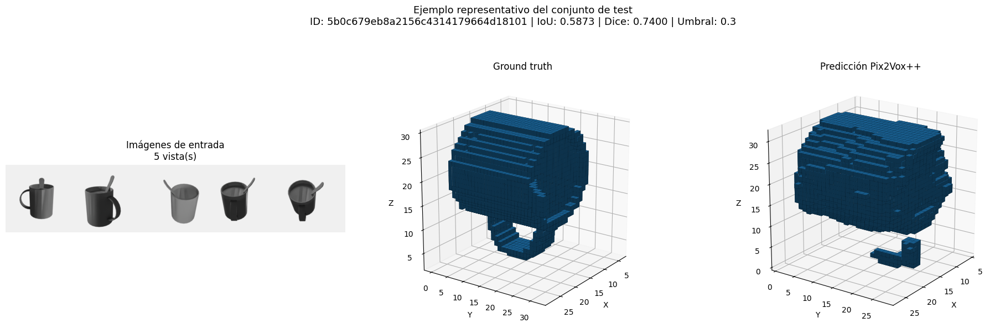


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp13_7categorias_5v_finetuning_test_tazas/ejemplo_representativo.png

EXP. 13 — TEST B: GLOBAL 7 CATEGORÍAS
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       exp13_7categorias_5v_finetuning_test_global
Tipo:              con_finetuning
Número de vistas:  5
Dispositivo:       cuda
Carpeta:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp13_7categorias_5v_finetuning_test_global

1. Seleccionando el umbral con validación...


Validación 5 vistas:   0%|          | 0/66 [00:00<?, ?it/s]

Umbral seleccionado: 0.3
IoU de selección:    0.6546

2. Calculando las métricas completas de validación...


Validación completa 5 vistas:   0%|          | 0/66 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 5 vistas:   0%|          | 0/66 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.3
IoU validación:           0.6546
IoU test:                 0.6504
Dice test:                0.7623
Chamfer test:             0.6855
F-score superficie test:  0.8343
Tiempo total:             0.32 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp13_7categorias_5v_finetuning_test_global


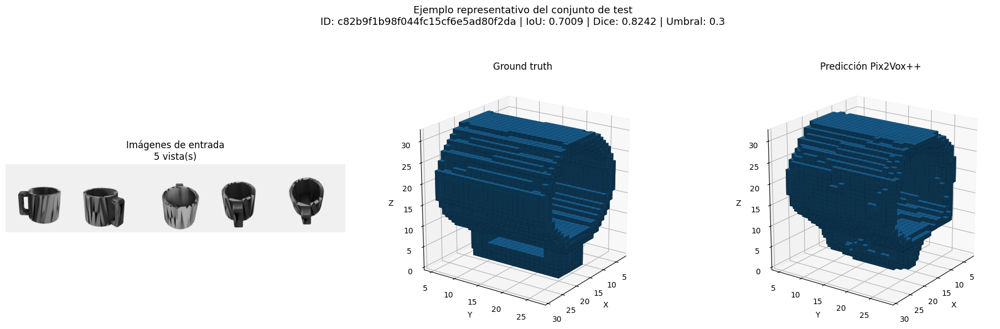


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp13_7categorias_5v_finetuning_test_global/ejemplo_representativo.png

RESULTADOS EXPERIMENTO 13


,test,numero_objetos,umbral,bce_x10_media,iou_media,dice_media,precision_voxel_media,recall_voxel_media,chamfer_superficie_media,f_score_superficie_media
0,Solo tazas,26.0,0.3,1.9420,0.6064,0.7417,0.7031,0.8034,0.6236,0.8688
1,Global 7 categorías,327.0,0.3,1.8656,0.6504,0.7623,0.7289,0.8248,0.6855,0.8343



Resultados por categoría @ umbral 0.3:


,categoria,iou,dice,precision_voxel,recall_voxel
0,02747177,0.6385,0.7510,0.7122,0.8352
1,02876657,0.8446,0.9119,0.8889,0.9419
2,02880940,0.5581,0.6917,0.6255,0.8084
3,02946921,0.8282,0.8778,0.8602,0.9269
4,03593526,0.6767,0.7912,0.7556,0.8481
5,03797390,0.6064,0.7417,0.7031,0.8034
6,03991062,0.4612,0.6070,0.5784,0.6799



COMPARACIÓN EXP. 10 VS EXP. 13


,test_comparable,iou_media_exp10_4cat,dice_media_exp10_4cat,chamfer_superficie_media_exp10_4cat,f_score_superficie_media_exp10_4cat,iou_media_exp13_7cat,dice_media_exp13_7cat,chamfer_superficie_media_exp13_7cat,f_score_superficie_media_exp13_7cat,delta_iou_13_menos_10,delta_dice_13_menos_10
0,Solo tazas,0.5921,0.7287,0.6520,0.8575,0.6064,0.7417,0.6236,0.8688,0.0143,0.0130
1,Global,0.7021,0.8068,0.5755,0.8674,0.6504,0.7623,0.6855,0.8343,-0.0517,-0.0446



[OK] EXPERIMENTO 13 COMPLETADO


In [ ]:
# ============================================================
# 28. EXPERIMENTO 13
#
# 7 categorías
# 5 vistas
# ResNet-50
# Fine-tuning
#
# VERSIÓN OPTIMIZADA:
# todas las imágenes y BINVOX se leen desde SSD local.
# ============================================================

import gc
import random
import shutil

from pathlib import Path

import numpy as np
import pandas as pd
import torch

from torch.utils.data import DataLoader


# ============================================================
# 1. CONFIGURACIÓN
# ============================================================

NOMBRE_EXP13 = (
    "exp13_7categorias_5v_finetuning"
)


NUM_VISTAS_EXP13 = 5


BATCH_EXP13 = 5


PASOS_ACUM_EXP13 = 1


BATCH_EFECTIVO_EXP13 = (
    BATCH_EXP13
    *
    PASOS_ACUM_EXP13
)


CATEGORIA_TAZAS_EXP13 = (
    "03797390"
)


# ------------------------------------------------------------
# DATALOADER
#
# Train = 0 workers:
# mantenemos la generación aleatoria en el proceso principal,
# igual que en los experimentos anteriores.
#
# Validación/test = 2 workers:
# las vistas son fijas y no existe augmentation aleatoria.
# ------------------------------------------------------------

NUM_WORKERS_TRAIN_EXP13 = 0

NUM_WORKERS_EVAL_EXP13 = 2


# ------------------------------------------------------------
# El intento anterior se interrumpió tras unas pocas épocas.
#
# True:
# elimina únicamente un entrenamiento INCOMPLETO de Exp.13
# antes de comenzar de nuevo.
#
# Si el experimento ya está terminado, NO lo elimina.
# ------------------------------------------------------------

REINICIAR_EXP13_INCOMPLETO = True


# ============================================================
# 2. RUTAS
# ============================================================

RUTA_CHECKPOINT_EXP13 = (

    RUTA_CHECKPOINTS

    / f"{NOMBRE_EXP13}_mejor.pth"
)


RUTA_HISTORIAL_EXP13 = (

    RUTA_HISTORIALES

    / f"{NOMBRE_EXP13}_historial.csv"
)


RUTA_RESUMEN_EXP13 = (

    RUTA_HISTORIALES

    / f"{NOMBRE_EXP13}_resumen.json"
)


RUTA_METRICAS_TAZAS_EXP13 = (

    RUTA_METRICAS

    / (
        NOMBRE_EXP13
        + "_test_tazas"
    )
)


RUTA_METRICAS_GLOBAL_EXP13 = (

    RUTA_METRICAS

    / (
        NOMBRE_EXP13
        + "_test_global"
    )
)


RUTA_TABLA_EXP13 = (

    RUTA_TABLAS

    / (
        f"{NOMBRE_EXP13}"
        "_comparacion_tests.csv"
    )
)


RUTA_TABLA_CATEGORIAS_EXP13 = (

    RUTA_TABLAS

    / (
        f"{NOMBRE_EXP13}"
        "_metricas_por_categoria.csv"
    )
)


# ============================================================
# 3. SEMILLAS
# ============================================================

def reiniciar_semillas_exp13():

    random.seed(
        SEED
    )

    np.random.seed(
        SEED
    )

    torch.manual_seed(
        SEED
    )


    if torch.cuda.is_available():

        torch.cuda.manual_seed(
            SEED
        )

        torch.cuda.manual_seed_all(
            SEED
        )


# ============================================================
# 4. COMPROBAR QUE LOS DATAFRAMES LOCALES EXISTEN
# ============================================================

dataframes_locales_necesarios = [

    "df_train_exp13_local",

    "df_val_exp13_local",

    "df_test_exp13_local",
]


faltantes = [

    nombre

    for nombre
    in dataframes_locales_necesarios

    if nombre
    not in globals()
]


if faltantes:

    raise RuntimeError(
        "Faltan los DataFrames locales del Exp.13:\n"
        f"{faltantes}\n\n"
        "Ejecuta primero las celdas de caché local."
    )


# ============================================================
# 5. NORMALIZAR CATEGORÍAS
# ============================================================

for dataframe in [

    df_train_exp13_local,

    df_val_exp13_local,

    df_test_exp13_local,
]:

    dataframe[
        "categoria"
    ] = (

        dataframe[
            "categoria"
        ]
        .astype(str)
        .str.zfill(8)
    )


    dataframe[
        "identificador"
    ] = (

        dataframe[
            "identificador"
        ]
        .astype(str)
    )


# ============================================================
# 6. COMPROBAR RUTAS LOCALES
# ============================================================

columnas_vistas_exp13 = [

    f"vista_{indice:02d}"

    for indice
    in range(20)
]


def comprobar_rutas_locales_exp13(
    dataframe,
    nombre_dataframe,
):

    columnas_comprobar = (

        columnas_vistas_exp13

        + [
            "ruta_binvox"
        ]
    )


    for columna in columnas_comprobar:

        if columna not in dataframe.columns:

            raise RuntimeError(
                f"{nombre_dataframe}: "
                f"falta la columna {columna}."
            )


    # No hace falta inspeccionar 45.000 rutas.
    # Comprobamos primero que conceptualmente apuntan a /content.
    muestra = dataframe.iloc[
        0
    ]


    for columna in columnas_comprobar:

        ruta = str(
            muestra[
                columna
            ]
        )


        if not ruta.startswith(
            "/content/"
        ):

            raise RuntimeError(
                f"{nombre_dataframe}: "
                f"{columna} no apunta al SSD local:\n"
                f"{ruta}"
            )


    print(
        f"[OK] {nombre_dataframe}: "
        "rutas locales."
    )


comprobar_rutas_locales_exp13(

    df_train_exp13_local,

    "train",
)


comprobar_rutas_locales_exp13(

    df_val_exp13_local,

    "validación",
)


comprobar_rutas_locales_exp13(

    df_test_exp13_local,

    "test",
)


# ============================================================
# 7. COMPROBACIÓN DE SPLITS
# ============================================================

def claves_exp13(
    dataframe
):

    return set(
        zip(

            dataframe[
                "categoria"
            ].astype(str),

            dataframe[
                "identificador"
            ].astype(str),
        )
    )


train_keys_exp13 = (
    claves_exp13(
        df_train_exp13_local
    )
)


val_keys_exp13 = (
    claves_exp13(
        df_val_exp13_local
    )
)


test_keys_exp13 = (
    claves_exp13(
        df_test_exp13_local
    )
)


if (
    train_keys_exp13
    &
    val_keys_exp13
):

    raise RuntimeError(
        "Fuga train / validación en Exp.13."
    )


if (
    train_keys_exp13
    &
    test_keys_exp13
):

    raise RuntimeError(
        "Fuga train / test en Exp.13."
    )


if (
    val_keys_exp13
    &
    test_keys_exp13
):

    raise RuntimeError(
        "Fuga validación / test en Exp.13."
    )


print(
    "[OK] Exp.13 sin fugas "
    "train/validación/test."
)


# ============================================================
# 8. DATAFRAMES DE TAZAS
# ============================================================

df_val_tazas_exp13_local = (

    df_val_exp13_local.loc[

        df_val_exp13_local[
            "categoria"
        ]
        ==
        CATEGORIA_TAZAS_EXP13
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


df_test_tazas_exp13_local = (

    df_test_exp13_local.loc[

        df_test_exp13_local[
            "categoria"
        ]
        ==
        CATEGORIA_TAZAS_EXP13
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


if (
    len(
        df_val_tazas_exp13_local
    )
    != 26
):

    raise RuntimeError(
        "Se esperaban 26 tazas "
        "de validación."
    )


if (
    len(
        df_test_tazas_exp13_local
    )
    != 26
):

    raise RuntimeError(
        "Se esperaban 26 tazas "
        "de test."
    )


# ============================================================
# 9. FUNCIÓN DATALOADER OPTIMIZADA
# ============================================================

def crear_loader_exp13(
    dataframe,
    modo,
    shuffle=False,
):

    dataset = DatasetPix2Vox(

        dataframe=(

            dataframe

            .reset_index(
                drop=True
            )
        ),

        numero_vistas=(
            NUM_VISTAS_EXP13
        ),

        modo=modo,

        fondo_aleatorio_entrenamiento=(
            modo
            ==
            "train"
        ),

        cachear_voxeles=True,
    )


    # --------------------------------------------------------
    # TRAIN
    # --------------------------------------------------------

    if modo == "train":

        numero_workers = (
            NUM_WORKERS_TRAIN_EXP13
        )


    # --------------------------------------------------------
    # VALIDACIÓN / TEST
    # --------------------------------------------------------

    else:

        numero_workers = (
            NUM_WORKERS_EVAL_EXP13
        )


    generador = None


    if shuffle:

        generador = (
            torch.Generator()
        )

        generador.manual_seed(
            SEED
        )


    argumentos_loader = {

        "dataset":
            dataset,

        "batch_size":
            BATCH_EXP13,

        "shuffle":
            shuffle,

        "num_workers":
            numero_workers,

        "pin_memory":
            USAR_PIN_MEMORY,

        "drop_last":
            False,

        "worker_init_fn":
            inicializar_worker,

        "generator":
            generador,

        "persistent_workers":
            (
                numero_workers
                > 0
            ),
    }


    if (
        numero_workers
        > 0
    ):

        argumentos_loader[
            "prefetch_factor"
        ] = 2


    return DataLoader(
        **argumentos_loader
    )


# ============================================================
# 10. CREAR DATALOADERS DESDE /content
# ============================================================

reiniciar_semillas_exp13()


loader_train_exp13 = (
    crear_loader_exp13(

        dataframe=(
            df_train_exp13_local
        ),

        modo="train",

        shuffle=True,
    )
)


loader_val_global_exp13 = (
    crear_loader_exp13(

        dataframe=(
            df_val_exp13_local
        ),

        modo="validacion",

        shuffle=False,
    )
)


loader_test_global_exp13 = (
    crear_loader_exp13(

        dataframe=(
            df_test_exp13_local
        ),

        modo="test",

        shuffle=False,
    )
)


loader_val_tazas_exp13 = (
    crear_loader_exp13(

        dataframe=(
            df_val_tazas_exp13_local
        ),

        modo="validacion",

        shuffle=False,
    )
)


loader_test_tazas_exp13 = (
    crear_loader_exp13(

        dataframe=(
            df_test_tazas_exp13_local
        ),

        modo="test",

        shuffle=False,
    )
)


# ============================================================
# 11. INFORMACIÓN PREVIA
# ============================================================

print(
    "\n" + "=" * 75
)

print(
    "EXPERIMENTO 13"
)

print(
    "7 CATEGORÍAS + 5 VISTAS + FINE-TUNING"
)

print(
    "=" * 75
)


print(
    f"Dispositivo:       "
    f"{DEVICE}"
)


print(
    f"Categorías:        "
    f"{CATEGORIAS_EXP13}"
)


print(
    f"Vistas:            "
    f"{NUM_VISTAS_EXP13}"
)


print(
    f"Batch físico:      "
    f"{BATCH_EXP13}"
)


print(
    f"Acumulación:       "
    f"{PASOS_ACUM_EXP13}"
)


print(
    f"Batch efectivo:    "
    f"{BATCH_EFECTIVO_EXP13}"
)


print(
    f"Train:             "
    f"{len(df_train_exp13_local)}"
)


print(
    f"Validación:        "
    f"{len(df_val_exp13_local)}"
)


print(
    f"Test:              "
    f"{len(df_test_exp13_local)}"
)


print(
    f"Val tazas:         "
    f"{len(df_val_tazas_exp13_local)}"
)


print(
    f"Test tazas:        "
    f"{len(df_test_tazas_exp13_local)}"
)


print(
    f"Train workers:     "
    f"{NUM_WORKERS_TRAIN_EXP13}"
)


print(
    f"Eval workers:      "
    f"{NUM_WORKERS_EVAL_EXP13}"
)


print(
    "Origen de datos:   "
    "SSD local /content"
)


# ============================================================
# 12. COMPROBAR SI UN HISTORIAL ESTÁ TERMINADO
# ============================================================

def historial_exp13_finalizado():

    if not (
        RUTA_CHECKPOINT_EXP13.exists()
        and
        RUTA_HISTORIAL_EXP13.exists()
    ):

        return False


    try:

        historial = pd.read_csv(
            RUTA_HISTORIAL_EXP13
        )


    except Exception:

        return False


    if historial.empty:

        return False


    # --------------------------------------------------------
    # Finalizó por máximo de épocas.
    # --------------------------------------------------------

    if (
        len(
            historial
        )
        >= NUMERO_EPOCAS_MAXIMO
    ):

        return True


    # --------------------------------------------------------
    # Finalizó por early stopping.
    # --------------------------------------------------------

    if (
        "epocas_sin_mejora"
        in historial.columns
    ):

        epocas_sin_mejora = int(

            historial.iloc[
                -1
            ][
                "epocas_sin_mejora"
            ]
        )


        if (
            epocas_sin_mejora
            >=
            PACIENCIA_EARLY_STOPPING
        ):

            return True


    return False


# ============================================================
# 13. ELIMINAR SOLO EL INTENTO INCOMPLETO
# ============================================================

exp13_completo_existente = (
    historial_exp13_finalizado()
)


if (

    REINICIAR_EXP13_INCOMPLETO

    and

    not exp13_completo_existente
):

    habia_archivos = False


    archivos_eliminar = [

        RUTA_CHECKPOINT_EXP13,

        RUTA_HISTORIAL_EXP13,

        RUTA_RESUMEN_EXP13,

        RUTA_TABLA_EXP13,

        RUTA_TABLA_CATEGORIAS_EXP13,
    ]


    for ruta in archivos_eliminar:

        if ruta.exists():

            habia_archivos = True

            ruta.unlink()


    for ruta in [

        RUTA_METRICAS_TAZAS_EXP13,

        RUTA_METRICAS_GLOBAL_EXP13,
    ]:

        if ruta.exists():

            habia_archivos = True

            shutil.rmtree(
                ruta
            )


    if habia_archivos:

        print(
            "\n[OK] Intento incompleto "
            "anterior de Exp.13 eliminado."
        )


    else:

        print(
            "\n[OK] No había resultados "
            "incompletos de Exp.13."
        )


# Volvemos a comprobar después de la limpieza.
exp13_completo_existente = (
    historial_exp13_finalizado()
)


# ============================================================
# 14. REINICIAR SEMILLAS JUSTO ANTES DEL MODELO
# ============================================================

reiniciar_semillas_exp13()


# ============================================================
# 15. CREAR PIX2VOX++/A ORIGINAL
# ============================================================

modelo_exp13 = (
    Pix2VoxPlusPlusA(

        usar_refiner=True,

        usar_merger=True,

        usar_pesos_imagenet=False,
    )
)


# ============================================================
# 16. RECUPERAR O ENTRENAR
# ============================================================

if exp13_completo_existente:

    print(
        "\nExperimento 13 ya terminado."
    )

    print(
        "Recuperando mejor checkpoint..."
    )


    metadata_exp13 = (
        cargar_checkpoint_finetuning(

            modelo=(
                modelo_exp13
            ),

            ruta_checkpoint=(
                RUTA_CHECKPOINT_EXP13
            ),

            dispositivo_carga="cpu",

            estricto=True,
        )
    )


    historial_exp13 = (
        pd.read_csv(
            RUTA_HISTORIAL_EXP13
        )
    )


    modelo_exp13 = (
        modelo_exp13.to(
            DEVICE
        )
    )


    modelo_exp13.eval()


# ============================================================
# ENTRENAMIENTO DESDE EL CHECKPOINT OFICIAL
# ============================================================

else:

    print(
        "\nCargando checkpoint "
        "oficial Pix2Vox++..."
    )


    metadata_pretrain_exp13 = (
        cargar_pesos_preentrenados_pix2vox(

            modelo=(
                modelo_exp13
            ),

            ruta_checkpoint=(
                RUTA_CHECKPOINT_OFICIAL
            ),

            dispositivo_carga="cpu",

            estricto=True,
        )
    )


    modelo_exp13 = (
        modelo_exp13.to(
            DEVICE
        )
    )


    print(
        "\nComenzando fine-tuning..."
    )


    resultado_ft_exp13 = (
        entrenar_modelo_finetuning_pix2vox(

            modelo=(
                modelo_exp13
            ),

            loader_train=(
                loader_train_exp13
            ),

            loader_validacion=(
                loader_val_global_exp13
            ),

            nombre_experimento=(
                NOMBRE_EXP13
            ),

            configuracion_experimento={

                "categorias":
                    list(
                        CATEGORIAS_EXP13
                    ),

                "numero_categorias":
                    int(
                        len(
                            CATEGORIAS_EXP13
                        )
                    ),

                "numero_vistas":
                    int(
                        NUM_VISTAS_EXP13
                    ),

                "fine_tuning":
                    True,

                "modelo":
                    "Pix2Vox++/A",

                "backbone":
                    "ResNet-50",

                "checkpoint_inicial":
                    str(
                        RUTA_CHECKPOINT_OFICIAL
                    ),

                "tamano_lote_fisico":
                    int(
                        BATCH_EXP13
                    ),

                "pasos_acumulacion":
                    int(
                        PASOS_ACUM_EXP13
                    ),

                "tamano_lote_efectivo":
                    int(
                        BATCH_EFECTIVO_EXP13
                    ),

                "train_objetos":
                    int(
                        len(
                            df_train_exp13_local
                        )
                    ),

                "validacion_objetos":
                    int(
                        len(
                            df_val_exp13_local
                        )
                    ),

                "test_objetos":
                    int(
                        len(
                            df_test_exp13_local
                        )
                    ),

                "test_tazas":
                    int(
                        len(
                            df_test_tazas_exp13_local
                        )
                    ),

                "mismo_test_tazas_exp10":
                    True,

                "precision":
                    "float32",

                "almacenamiento_datos":
                    "SSD local /content",
            },

            numero_epocas=(
                NUMERO_EPOCAS_MAXIMO
            ),

            paciencia_early_stopping=(
                PACIENCIA_EARLY_STOPPING
            ),

            pasos_acumulacion=(
                PASOS_ACUM_EXP13
            ),

            max_lotes_train=None,

            max_lotes_validacion=None,
        )
    )


    modelo_exp13 = (
        resultado_ft_exp13[
            "modelo"
        ]
    )


    historial_exp13 = (
        resultado_ft_exp13[
            "historial"
        ]
    )


    metadata_exp13 = (
        resultado_ft_exp13[
            "metadata_checkpoint"
        ]
    )


# ============================================================
# 17. MODELO EN EVALUACIÓN
# ============================================================

modelo_exp13.eval()


# ============================================================
# 18. TEST A — SOLO TAZAS
# ============================================================

print(
    "\n" + "=" * 75
)

print(
    "EXP. 13 — TEST A: SOLO TAZAS"
)

print(
    "=" * 75
)


resultado_tazas_exp13 = (
    evaluar_y_guardar_experimento_pix2vox(

        modelo=(
            modelo_exp13
        ),

        loader_validacion=(
            loader_val_tazas_exp13
        ),

        loader_test=(
            loader_test_tazas_exp13
        ),

        nombre_experimento=(
            NOMBRE_EXP13
            + "_test_tazas"
        ),

        numero_vistas=(
            NUM_VISTAS_EXP13
        ),

        tipo_experimento=(
            "con_finetuning"
        ),

        configuracion_extra={

            "categorias_train":
                list(
                    CATEGORIAS_EXP13
                ),

            "numero_categorias":
                7,

            "tipo_test":
                "solo_tazas",

            "backbone":
                "ResNet-50",

            "ruta_checkpoint":
                str(
                    RUTA_CHECKPOINT_EXP13
                ),
        },

        sobrescribir=True,
    )
)


# ============================================================
# 19. VISUALIZACIÓN TAZAS
# ============================================================

visualizar_ejemplo_representativo_pix2vox(

    modelo=(
        modelo_exp13
    ),

    dataloader_test=(
        loader_test_tazas_exp13
    ),

    tabla_test_por_objeto=(
        resultado_tazas_exp13[
            "resultado_test_completo"
        ][
            "tabla_por_objeto"
        ]
    ),

    umbral=(
        resultado_tazas_exp13[
            "umbral_seleccionado"
        ]
    ),

    ruta_experimento=(
        resultado_tazas_exp13[
            "ruta_experimento"
        ]
    ),

    numero_vistas=(
        NUM_VISTAS_EXP13
    ),
)


# ============================================================
# 20. TEST B — GLOBAL 7 CATEGORÍAS
# ============================================================

print(
    "\n" + "=" * 75
)

print(
    "EXP. 13 — TEST B: GLOBAL 7 CATEGORÍAS"
)

print(
    "=" * 75
)


resultado_global_exp13 = (
    evaluar_y_guardar_experimento_pix2vox(

        modelo=(
            modelo_exp13
        ),

        loader_validacion=(
            loader_val_global_exp13
        ),

        loader_test=(
            loader_test_global_exp13
        ),

        nombre_experimento=(
            NOMBRE_EXP13
            + "_test_global"
        ),

        numero_vistas=(
            NUM_VISTAS_EXP13
        ),

        tipo_experimento=(
            "con_finetuning"
        ),

        configuracion_extra={

            "categorias_train":
                list(
                    CATEGORIAS_EXP13
                ),

            "numero_categorias":
                7,

            "tipo_test":
                "global",

            "backbone":
                "ResNet-50",

            "ruta_checkpoint":
                str(
                    RUTA_CHECKPOINT_EXP13
                ),
        },

        sobrescribir=True,
    )
)


# ============================================================
# 21. VISUALIZACIÓN GLOBAL
# ============================================================

visualizar_ejemplo_representativo_pix2vox(

    modelo=(
        modelo_exp13
    ),

    dataloader_test=(
        loader_test_global_exp13
    ),

    tabla_test_por_objeto=(
        resultado_global_exp13[
            "resultado_test_completo"
        ][
            "tabla_por_objeto"
        ]
    ),

    umbral=(
        resultado_global_exp13[
            "umbral_seleccionado"
        ]
    ),

    ruta_experimento=(
        resultado_global_exp13[
            "ruta_experimento"
        ]
    ),

    numero_vistas=(
        NUM_VISTAS_EXP13
    ),
)


# ============================================================
# 22. TABLA SOLO TAZAS VS GLOBAL
# ============================================================

fila_test_tazas_exp13 = (

    resultado_tazas_exp13[
        "tabla_resumen"
    ]

    .query(
        "conjunto == 'test'"
    )

    .iloc[
        0
    ]
)


fila_test_global_exp13 = (

    resultado_global_exp13[
        "tabla_resumen"
    ]

    .query(
        "conjunto == 'test'"
    )

    .iloc[
        0
    ]
)


metricas_exp13 = [

    "numero_objetos",

    "umbral",

    "bce_x10_media",

    "iou_media",

    "dice_media",

    "precision_voxel_media",

    "recall_voxel_media",

    "chamfer_superficie_media",

    "f_score_superficie_media",
]


tabla_tests_exp13 = pd.DataFrame(
    [
        {
            "test":
                "Solo tazas",

            **{
                metrica:
                    fila_test_tazas_exp13[
                        metrica
                    ]

                for metrica
                in metricas_exp13
            },
        },

        {
            "test":
                "Global 7 categorías",

            **{
                metrica:
                    fila_test_global_exp13[
                        metrica
                    ]

                for metrica
                in metricas_exp13
            },
        },
    ]
)


tabla_tests_exp13.to_csv(

    RUTA_TABLA_EXP13,

    index=False,
)


print(
    "\n" + "=" * 75
)

print(
    "RESULTADOS EXPERIMENTO 13"
)

print(
    "=" * 75
)


display(
    tabla_tests_exp13.round(
        4
    )
)


# ============================================================
# 23. MÉTRICAS GLOBALES POR CATEGORÍA
#
# IMPORTANTE:
# tabla_por_objeto contiene varios umbrales.
# Utilizamos únicamente el seleccionado.
# ============================================================

tabla_objetos_exp13 = (

    resultado_global_exp13[
        "resultado_test_completo"
    ][
        "tabla_por_objeto"
    ]

    .copy()
)


umbral_global_exp13 = float(

    resultado_global_exp13[
        "umbral_seleccionado"
    ]
)


tabla_objetos_exp13_umbral = (

    tabla_objetos_exp13.loc[

        np.isclose(

            tabla_objetos_exp13[
                "umbral"
            ]
            .astype(
                float
            ),

            umbral_global_exp13,
        )
    ]

    .copy()
)


tabla_categoria_exp13 = (

    tabla_objetos_exp13_umbral

    .groupby(
        "categoria"
    )[
        [
            "iou",

            "dice",

            "precision_voxel",

            "recall_voxel",
        ]
    ]

    .mean()

    .reset_index()
)


print(
    "\nResultados por categoría "
    f"@ umbral {umbral_global_exp13}:"
)


display(
    tabla_categoria_exp13.round(
        4
    )
)


tabla_categoria_exp13.to_csv(

    RUTA_TABLA_CATEGORIAS_EXP13,

    index=False,
)


# ============================================================
# 24. COMPARACIÓN DIRECTA EXP.10 VS EXP.13
# ============================================================

RUTA_EXP10 = (

    RUTA_TABLAS

    / (
        "exp10_4categorias_5v_finetuning"
        "_comparacion_tests.csv"
    )
)


if RUTA_EXP10.exists():

    tabla_exp10 = (
        pd.read_csv(
            RUTA_EXP10
        )
    )


    tabla_exp10[
        "test_comparable"
    ] = (

        tabla_exp10[
            "test"
        ]

        .replace(
            {
                "Global 4 categorías":
                    "Global",
            }
        )
    )


    tabla_exp13_comparacion = (
        tabla_tests_exp13
        .copy()
    )


    tabla_exp13_comparacion[
        "test_comparable"
    ] = (

        tabla_exp13_comparacion[
            "test"
        ]

        .replace(
            {
                "Global 7 categorías":
                    "Global",
            }
        )
    )


    columnas_comparacion = [

        "iou_media",

        "dice_media",

        "chamfer_superficie_media",

        "f_score_superficie_media",
    ]


    comparacion_exp10_exp13 = (

        tabla_exp10[
            [
                "test_comparable",

                *columnas_comparacion,
            ]
        ]

        .merge(

            tabla_exp13_comparacion[
                [
                    "test_comparable",

                    *columnas_comparacion,
                ]
            ],

            on="test_comparable",

            suffixes=(

                "_exp10_4cat",

                "_exp13_7cat",
            ),
        )
    )


    comparacion_exp10_exp13[
        "delta_iou_13_menos_10"
    ] = (

        comparacion_exp10_exp13[
            "iou_media_exp13_7cat"
        ]

        -

        comparacion_exp10_exp13[
            "iou_media_exp10_4cat"
        ]
    )


    comparacion_exp10_exp13[
        "delta_dice_13_menos_10"
    ] = (

        comparacion_exp10_exp13[
            "dice_media_exp13_7cat"
        ]

        -

        comparacion_exp10_exp13[
            "dice_media_exp10_4cat"
        ]
    )


    RUTA_COMPARACION_EXP10_EXP13 = (

        RUTA_TABLAS

        / "comparacion_exp10_vs_exp13.csv"
    )


    comparacion_exp10_exp13.to_csv(

        RUTA_COMPARACION_EXP10_EXP13,

        index=False,
    )


    print(
        "\n" + "=" * 75
    )

    print(
        "COMPARACIÓN EXP. 10 VS EXP. 13"
    )

    print(
        "=" * 75
    )


    display(
        comparacion_exp10_exp13.round(
            4
        )
    )


else:

    print(
        "\n[AVISO] No se encontró "
        "la tabla del Exp.10:"
    )

    print(
        RUTA_EXP10
    )


# ============================================================
# 25. LIMPIEZA FINAL
# ============================================================

modelo_exp13 = (
    modelo_exp13.to(
        "cpu"
    )
)


del modelo_exp13

del loader_train_exp13
del loader_val_global_exp13
del loader_test_global_exp13
del loader_val_tazas_exp13
del loader_test_tazas_exp13


gc.collect()


if torch.cuda.is_available():

    torch.cuda.empty_cache()


print(
    "\n" + "=" * 75
)

print(
    "[OK] EXPERIMENTO 13 COMPLETADO"
)

print(
    "=" * 75
)

## 29. Resumen y comparación global de experimentos

Esta sección recopila automáticamente los resultados almacenados de los diferentes experimentos realizados con Pix2Vox++.

La tabla permite comparar de forma conjunta las principales decisiones estudiadas durante la fase experimental:

- Número de vistas de entrada.
- Uso o no de fine-tuning.
- Número de categorías utilizadas durante el entrenamiento.
- Backbone empleado en el encoder.
- Rendimiento sobre el conjunto de test.
- Coste temporal del entrenamiento.

Para cada evaluación se muestran las principales métricas utilizadas en el proyecto:

- **IoU**: grado de solapamiento entre el volumen predicho y el ground truth.
- **Dice**: similitud entre ambos volúmenes.
- **Precisión voxel**: proporción de vóxeles predichos correctamente como ocupados.
- **Recall voxel**: proporción de vóxeles reales correctamente recuperados.
- **Chamfer Distance**: distancia entre las superficies predicha y real.
- **F-score de superficie**: grado de coincidencia geométrica entre ambas superficies.

Los resultados del Experimento 8 se mantienen en la tabla únicamente como referencia histórica, pero se identifican como no comparables debido a la fuga de información detectada entre entrenamiento y test. El Experimento 11 constituye su repetición corregida.

Además de la tabla global, se presenta una segunda tabla centrada específicamente en las evaluaciones sobre tazas. Esta comparación es especialmente relevante porque la categoría de taza constituye el objeto principal de estudio y será posteriormente utilizada en los experimentos con objetos rotos y en la fase de reparación 3D.

In [ ]:
# ============================================================
# TABLA AUTOMÁTICA DE TODOS LOS EXPERIMENTOS
#
# Solo utiliza la estructura ACTUAL:
#
# Datos_E2_E3/E2/Pix2Vox++/
# ============================================================

import re
import numpy as np
import pandas as pd

from pathlib import Path


# ============================================================
# BUSCAR TODOS LOS RESÚMENES DE MÉTRICAS
# ============================================================

archivos_metricas = sorted(
    RUTA_METRICAS.rglob(
        "resumen_validacion_test.csv"
    )
)


print(
    f"Archivos de métricas encontrados: "
    f"{len(archivos_metricas)}"
)


# ============================================================
# MAPEO DE LOS EXPERIMENTOS ANTIGUOS
# ============================================================

MAPEO_EXPERIMENTOS = {

    "tazas_1_vista_sin_finetuning":
        1,

    "tazas_5_vistas_sin_finetuning":
        2,

    "tazas_20_vistas_sin_finetuning":
        3,

    "tazas_1_vista_con_finetuning":
        4,

    "tazas_5_vistas_con_finetuning":
        5,

    "tazas_20_vistas_con_finetuning":
        6,

    "tazas_botellas_20_vistas_sin_finetuning":
        7,

    "tazas_botellas_20_vistas_con_finetuning":
        8,
}


# ============================================================
# FUNCIONES AUXILIARES
# ============================================================

def quitar_tipo_test(
    nombre
):

    for sufijo in [

        "_test_tazas",

        "_test_global",
    ]:

        if nombre.endswith(
            sufijo
        ):

            return nombre[
                :-len(
                    sufijo
                )
            ]


    return nombre


def numero_experimento(
    nombre
):

    match = re.search(
        r"exp(\d+)",
        nombre.lower(),
    )


    if match:

        return int(
            match.group(1)
        )


    nombre_base = (
        quitar_tipo_test(
            nombre
        )
    )


    return (
        MAPEO_EXPERIMENTOS.get(
            nombre_base,
            np.nan,
        )
    )


def obtener_vistas(
    nombre
):

    nombre = (
        nombre.lower()
    )


    match = re.search(
        r"(?:_|^)(1|5|20)v(?:_|$)",
        nombre,
    )


    if match:

        return int(
            match.group(1)
        )


    match = re.search(
        r"(1|5|20)_vista",
        nombre,
    )


    if match:

        return int(
            match.group(1)
        )


    return np.nan


def obtener_modelo(
    nombre
):

    if (
        "efficientnet"
        in nombre.lower()
    ):

        return (
            "EfficientNet-B4"
        )


    return (
        "ResNet-50"
    )


def obtener_num_categorias(
    nombre
):

    texto = (
        nombre.lower()
    )


    if (
        "7categorias"
        in texto
    ):

        return 7


    if (
        "4categorias"
        in texto
    ):

        return 4


    if (
        "tazas_botellas"
        in texto

        or

        "fix_experimento8"
        in texto
    ):

        return 2


    if (
        "tazas"
        in texto
    ):

        return 1


    return np.nan


def obtener_evaluacion(
    nombre
):

    if (
        nombre.endswith(
            "_test_tazas"
        )
    ):

        return (
            "Solo tazas"
        )


    if (
        nombre.endswith(
            "_test_global"
        )
    ):

        return (
            "Global"
        )


    return (
        "Test"
    )


def obtener_historial(
    nombre
):

    base = (
        quitar_tipo_test(
            nombre
        )
    )


    ruta = (
        RUTA_HISTORIALES
        / f"{base}_historial.csv"
    )


    if ruta.exists():

        return pd.read_csv(
            ruta
        )


    return None


def valor_fila(
    fila,
    nombre,
):

    if nombre in fila.index:

        try:

            return float(
                fila[
                    nombre
                ]
            )

        except Exception:

            return fila[
                nombre
            ]


    return np.nan


# ============================================================
# RECOPILAR
# ============================================================

registros = []


for ruta in archivos_metricas:

    nombre = (
        ruta.parent.name
    )


    try:

        tabla = pd.read_csv(
            ruta
        )


        if (
            "conjunto"
            not in tabla.columns
        ):

            continue


        test = (
            tabla.loc[
                tabla[
                    "conjunto"
                ]
                .astype(str)
                .str.lower()
                == "test"
            ]
        )


        if test.empty:

            continue


        fila = (
            test.iloc[0]
        )


        historial = (
            obtener_historial(
                nombre
            )
        )


        epocas = np.nan
        tiempo_train = np.nan


        if (
            historial is not None
            and
            not historial.empty
        ):

            epocas = len(
                historial
            )


            if (
                "tiempo_segundos"
                in historial.columns
            ):

                tiempo_train = (

                    historial[
                        "tiempo_segundos"
                    ]
                    .astype(float)
                    .sum()

                    / 60.0
                )


        exp = (
            numero_experimento(
                nombre
            )
        )


        estado = (
            "Válido"
        )


        # El resultado histórico del Exp. 8
        # debe quedar claramente identificado.
        if exp == 8:

            estado = (
                "NO COMPARABLE - leakage"
            )


        registros.append(
            {

                "Exp":
                    exp,

                "Experimento":
                    nombre,

                "Modelo":
                    obtener_modelo(
                        nombre
                    ),

                "N categorías":
                    obtener_num_categorias(
                        nombre
                    ),

                "Vistas":
                    obtener_vistas(
                        nombre
                    ),

                "Evaluación":
                    obtener_evaluacion(
                        nombre
                    ),

                "Estado":
                    estado,

                "N test":
                    valor_fila(
                        fila,
                        "numero_objetos",
                    ),

                "Umbral":
                    valor_fila(
                        fila,
                        "umbral",
                    ),

                "IoU":
                    valor_fila(
                        fila,
                        "iou_media",
                    ),

                "Dice":
                    valor_fila(
                        fila,
                        "dice_media",
                    ),

                "Precisión voxel":
                    valor_fila(
                        fila,
                        "precision_voxel_media",
                    ),

                "Recall voxel":
                    valor_fila(
                        fila,
                        "recall_voxel_media",
                    ),

                "Chamfer":
                    valor_fila(
                        fila,
                        "chamfer_superficie_media",
                    ),

                "F-score":
                    valor_fila(
                        fila,
                        "f_score_superficie_media",
                    ),

                "Épocas":
                    epocas,

                "Train min":
                    tiempo_train,
            }
        )


    except Exception as exc:

        print(
            f"[AVISO] No se pudo leer "
            f"{ruta}: {exc}"
        )


# ============================================================
# TABLA FINAL
# ============================================================

tabla_experimentos = (
    pd.DataFrame(
        registros
    )
)


if tabla_experimentos.empty:

    raise RuntimeError(
        "No se encontraron resultados."
    )


tabla_experimentos = (

    tabla_experimentos

    .sort_values(
        [
            "Exp",
            "Evaluación",
            "Experimento",
        ],

        na_position="last",
    )

    .reset_index(
        drop=True
    )
)


print(
    "\n" + "=" * 100
)

print(
    "RESUMEN DE EXPERIMENTOS PIX2VOX++"
)

print(
    "=" * 100
)


display(

    tabla_experimentos.round(
        {
            "Umbral": 2,

            "IoU": 4,

            "Dice": 4,

            "Precisión voxel": 4,

            "Recall voxel": 4,

            "Chamfer": 4,

            "F-score": 4,

            "Train min": 2,
        }
    )
)


# ============================================================
# TABLA SOLO TAZAS
# ============================================================

tabla_tazas = (

    tabla_experimentos.loc[
        tabla_experimentos[
            "Evaluación"
        ]
        .str.contains(
            "taza",
            case=False,
            na=False,
        )
    ]

    .copy()
)


print(
    "\n" + "=" * 100
)

print(
    "COMPARACIÓN LIMPIA SOBRE TAZAS"
)

print(
    "=" * 100
)


display(

    tabla_tazas[
        [
            "Exp",

            "Modelo",

            "N categorías",

            "Vistas",

            "Estado",

            "N test",

            "IoU",

            "Dice",

            "Chamfer",

            "F-score",

            "Train min",
        ]
    ]

    .round(
        4
    )
)


# ============================================================
# GUARDAR
# ============================================================

RUTA_RESUMEN_GLOBAL = (

    RUTA_TABLAS
    / (
        "resumen_global_"
        "experimentos_pix2vox.csv"
    )
)


tabla_experimentos.to_csv(

    RUTA_RESUMEN_GLOBAL,

    index=False,
)


print(
    "\nGuardado en:"
)

print(
    RUTA_RESUMEN_GLOBAL
)

Archivos de métricas encontrados: 18

RESUMEN DE EXPERIMENTOS PIX2VOX++


,Exp,Experimento,Modelo,N categorías,Vistas,Evaluación,Estado,N test,Umbral,IoU,Dice,Precisión voxel,Recall voxel,Chamfer,F-score,Épocas,Train min
0,1,tazas_1_vista_sin_finetuning,ResNet-50,1,1,Test,Válido,26.0,0.20,0.1695,0.2823,0.3167,0.3090,2.4174,0.3594,NaN,NaN
1,2,tazas_5_vistas_sin_finetuning,ResNet-50,1,5,Test,Válido,26.0,0.20,0.1592,0.2606,0.3422,0.2367,2.6474,0.3097,NaN,NaN
2,3,tazas_20_vistas_sin_finetuning,ResNet-50,1,20,Test,Válido,26.0,0.20,0.1576,0.2608,0.3337,0.2434,2.7197,0.3016,NaN,NaN
3,4,tazas_1_vista_con_finetuning,ResNet-50,1,1,Test,Válido,26.0,0.20,0.3976,0.5544,0.4285,0.8755,1.3218,0.6199,30.0,NaN
4,5,tazas_5_vistas_con_finetuning,ResNet-50,1,5,Test,Válido,26.0,0.20,0.5335,0.6815,0.5993,0.8199,0.8572,0.8016,30.0,NaN
5,6,tazas_20_vistas_con_finetuning,ResNet-50,1,20,Test,Válido,26.0,0.20,0.5575,0.6968,0.6470,0.7826,0.8036,0.8121,30.0,NaN
6,7,tazas_botellas_20_vistas_sin_finetuning,ResNet-50,2,20,Test,Válido,94.0,0.15,0.1221,0.1977,0.3413,0.1599,4.1091,0.2042,NaN,NaN
7,8,tazas_botellas_20_vistas_con_finetuning,ResNet-50,2,20,Test,NO COMPARABLE - leakage,26.0,0.40,0.7928,0.8655,0.8626,0.8742,0.3244,0.9395,30.0,NaN
8,9,exp9_4categorias_20v_finetuning_test_global,ResNet-50,4,20,Global,Válido,198.0,0.40,0.6929,0.7977,0.7818,0.8310,0.6137,0.8536,30.0,NaN
9,9,exp9_4categorias_20v_finetuning_test_tazas,ResNet-50,4,20,Solo tazas,Válido,26.0,0.30,0.5836,0.7199,0.6991,0.7626,0.7148,0.8363,30.0,NaN



COMPARACIÓN LIMPIA SOBRE TAZAS


,Exp,Modelo,N categorías,Vistas,Estado,N test,IoU,Dice,Chamfer,F-score,Train min
9,9,ResNet-50,4,20,Válido,26.0,0.5836,0.7199,0.7148,0.8363,NaN
11,10,ResNet-50,4,5,Válido,26.0,0.5921,0.7287,0.6520,0.8575,NaN
13,11,ResNet-50,2,20,Válido,26.0,0.5684,0.7099,0.7191,0.8285,NaN
15,12,EfficientNet-B4,4,5,Válido,26.0,0.5470,0.6913,0.7030,0.8328,NaN
17,13,ResNet-50,7,5,Válido,26.0,0.6064,0.7417,0.6236,0.8688,NaN



Guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/tablas_resultados/resumen_global_experimentos_pix2vox.csv


# Experimento 14 - Análogo a Experimento 13, con 6 categorías

## Preparación Experimento 14:

In [58]:
# ============================================================
# DIAGNÓSTICO DEL DATASET DE TAZAS ROTAS
# ============================================================

from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd


RUTA_TAZAS_ROTAS = (
    RUTA_DATOS_E2
    / "General/Fantastik_Break_Preprocesado"
)


if not RUTA_TAZAS_ROTAS.exists():

    raise FileNotFoundError(
        f"No existe:\n{RUTA_TAZAS_ROTAS}"
    )


# ============================================================
# 1. CONTAR TODOS LOS TIPOS DE ARCHIVO
# ============================================================

archivos = [
    ruta
    for ruta in RUTA_TAZAS_ROTAS.rglob("*")
    if ruta.is_file()
]


conteo_extensiones = Counter(
    ruta.suffix.lower()
    if ruta.suffix
    else "[sin extensión]"
    for ruta in archivos
)


print("=" * 75)
print("DIAGNÓSTICO FANTASTIK BREAK")
print("=" * 75)

print(
    f"Ruta:\n{RUTA_TAZAS_ROTAS}"
)

print(
    f"\nArchivos totales: "
    f"{len(archivos)}"
)

print("\nExtensiones:")

for extension, cantidad in sorted(
    conteo_extensiones.items()
):

    print(
        f"  {extension:<12} "
        f"{cantidad}"
    )


# ============================================================
# 2. CARPETAS DE PRIMER NIVEL
# ============================================================

subcarpetas = sorted(
    ruta.name
    for ruta in RUTA_TAZAS_ROTAS.iterdir()
    if ruta.is_dir()
)


print(
    "\nSubcarpetas:"
)

if subcarpetas:

    for carpeta in subcarpetas:

        print(
            f"  - {carpeta}"
        )

else:

    print(
        "  [ninguna]"
    )


# ============================================================
# 3. ANALIZAR LOS .NPY
# ============================================================

archivos_npy = sorted(
    RUTA_TAZAS_ROTAS.rglob(
        "*.npy"
    )
)


print(
    f"\nArchivos NPY: "
    f"{len(archivos_npy)}"
)


registros = []


for ruta in archivos_npy[:50]:

    try:

        array = np.load(
            ruta,
            mmap_mode="r",
            allow_pickle=False,
        )


        registro = {

            "archivo":
                ruta.name,

            "ruta_relativa":
                str(
                    ruta.relative_to(
                        RUTA_TAZAS_ROTAS
                    )
                ),

            "shape":
                str(
                    tuple(
                        array.shape
                    )
                ),

            "ndim":
                int(
                    array.ndim
                ),

            "dtype":
                str(
                    array.dtype
                ),

            "elementos":
                int(
                    array.size
                ),

            "min":
                None,

            "max":
                None,

            "no_ceros":
                None,
        }


        # Para arrays razonablemente pequeños,
        # inspeccionamos también su contenido.
        if array.size <= 2_000_000:

            registro[
                "min"
            ] = float(
                np.min(
                    array
                )
            )

            registro[
                "max"
            ] = float(
                np.max(
                    array
                )
            )

            registro[
                "no_ceros"
            ] = int(
                np.count_nonzero(
                    array
                )
            )


        registros.append(
            registro
        )


        del array


    except Exception as exc:

        registros.append(
            {
                "archivo":
                    ruta.name,

                "ruta_relativa":
                    str(
                        ruta.relative_to(
                            RUTA_TAZAS_ROTAS
                        )
                    ),

                "shape":
                    None,

                "ndim":
                    None,

                "dtype":
                    None,

                "elementos":
                    None,

                "min":
                    None,

                "max":
                    None,

                "no_ceros":
                    None,

                "error":
                    str(
                        exc
                    ),
            }
        )


df_diagnostico_rotas = (
    pd.DataFrame(
        registros
    )
)


print(
    "\nPrimeros archivos:"
)

display(
    df_diagnostico_rotas.head(
        30
    )
)


# ============================================================
# 4. RESUMEN POR SHAPE
# ============================================================

if not df_diagnostico_rotas.empty:

    print(
        "\nShapes encontrados "
        "entre los primeros 50:"
    )

    display(
        df_diagnostico_rotas[
            "shape"
        ]
        .value_counts(
            dropna=False
        )
        .rename_axis(
            "shape"
        )
        .reset_index(
            name="cantidad"
        )
    )


# ============================================================
# 5. BUSCAR IMÁGENES
# ============================================================

extensiones_imagen = {
    ".png",
    ".jpg",
    ".jpeg",
    ".webp",
}


imagenes_encontradas = [
    ruta
    for ruta in archivos
    if ruta.suffix.lower()
    in extensiones_imagen
]


print(
    f"\nImágenes RGB encontradas: "
    f"{len(imagenes_encontradas)}"
)


if imagenes_encontradas:

    print(
        "\nPrimeras imágenes:"
    )

    for ruta in imagenes_encontradas[:20]:

        print(
            " ",
            ruta.relative_to(
                RUTA_TAZAS_ROTAS
            )
        )


print(
    "\n[OK] Diagnóstico terminado."
)

DIAGNÓSTICO FANTASTIK BREAK
Ruta:
/content/drive/MyDrive/Datos_E2_E3/General/Fantastik_Break_Preprocesado

Archivos totales: 122

Extensiones:
  .npy         122

Subcarpetas:
  - Fantastik_Break_Preprocesado

Archivos NPY: 122

Primeros archivos:


,archivo,ruta_relativa,shape,ndim,dtype,elementos,min,max,no_ceros
0,00_00002_completo.npy,00_00002_completo.npy,"(2048, 3)",2,float32,6144,-0.995458,0.650719,6144
1,00_00002_roto.npy,00_00002_roto.npy,"(2048, 3)",2,float32,6144,-0.991550,0.698874,6144
2,00_00003_completo.npy,00_00003_completo.npy,"(2048, 3)",2,float32,6144,-0.998033,0.759233,6144
3,00_00003_roto.npy,00_00003_roto.npy,"(2048, 3)",2,float32,6144,-0.983862,0.830577,6144
4,00_00005_completo.npy,00_00005_completo.npy,"(2048, 3)",2,float32,6144,-0.975584,0.665092,6144
5,00_00005_roto.npy,00_00005_roto.npy,"(2048, 3)",2,float32,6144,-0.837038,0.787519,6144
6,00_00006_completo.npy,00_00006_completo.npy,"(2048, 3)",2,float32,6144,-0.932328,0.620757,6144
7,00_00006_roto.npy,00_00006_roto.npy,"(2048, 3)",2,float32,6144,-0.916342,0.666884,6144
8,00_00008_completo.npy,00_00008_completo.npy,"(2048, 3)",2,float32,6144,-0.967557,0.679912,6144
9,00_00008_roto.npy,00_00008_roto.npy,"(2048, 3)",2,float32,6144,-0.961472,0.618801,6144



Shapes encontrados entre los primeros 50:


,shape,cantidad
0,"(2048, 3)",50



Imágenes RGB encontradas: 0

[OK] Diagnóstico terminado.


In [59]:
# ============================================================
# 29. PREPARACIÓN DEL EXPERIMENTO 14
# 6 categorías + 5 vistas
# ============================================================

import os
import gc
import random

import numpy as np
import pandas as pd
import torch

from pathlib import Path
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader


# ============================================================
# CONFIGURACIÓN
# ============================================================
CATEGORIAS_DISPONIBLES.remove('03991062')

CATEGORIAS_EXP14 = sorted(
    CATEGORIAS_DISPONIBLES
)


CATEGORIAS_BASE_EXP10 = [
    "03797390",  # taza
    "02876657",  # botella
    "03593526",  # tarro
    "02880940",  # cuenco
]


CATEGORIAS_NUEVAS_EXP14 = sorted(
    set(
        CATEGORIAS_EXP14
    )
    -
    set(
        CATEGORIAS_BASE_EXP10
    )
)


RUTA_CATALOGO_EXP14 = (
    RUTA_CATALOGOS
    / "catalogo_exp14_6categorias.csv"
)


RUTA_TRAIN_EXP14 = (
    RUTA_DIVISIONES
    / "exp14_6categorias_train.csv"
)

RUTA_VAL_EXP14 = (
    RUTA_DIVISIONES
    / "exp14_6categorias_validacion.csv"
)

RUTA_TEST_EXP14 = (
    RUTA_DIVISIONES
    / "exp14_6categorias_test.csv"
)


# Splits de Exp. 9/10.
RUTA_TRAIN_EXP10_BASE = (
    RUTA_DIVISIONES
    / "exp9_10_4categorias_train.csv"
)

RUTA_VAL_EXP10_BASE = (
    RUTA_DIVISIONES
    / "exp9_10_4categorias_validacion.csv"
)

RUTA_TEST_EXP10_BASE = (
    RUTA_DIVISIONES
    / "exp9_10_4categorias_test.csv"
)


# ============================================================
# FUNCIONES AUXILIARES
# ============================================================

def normalizar_exp14(
    dataframe
):

    dataframe = (
        dataframe.copy()
    )

    dataframe[
        "categoria"
    ] = (
        dataframe[
            "categoria"
        ]
        .astype(str)
        .str.zfill(8)
    )

    dataframe[
        "identificador"
    ] = (
        dataframe[
            "identificador"
        ]
        .astype(str)
    )

    return dataframe


def catalogar_categoria_exp14(
    categoria
):
    """
    Catalogación rápida.

    No abre las 20 imágenes.
    Construye las rutas a partir de objetos presentes
    simultáneamente en Img E2 y Datos_E2_voxel.
    """

    ruta_img = (
        RUTA_IMAGENES
        / categoria
    )

    ruta_vox = (
        RUTA_VOXELES
        / categoria
    )


    ids_img = {
        entrada.name
        for entrada
        in os.scandir(
            ruta_img
        )
        if entrada.is_dir()
    }


    ids_vox = {
        entrada.name
        for entrada
        in os.scandir(
            ruta_vox
        )
        if entrada.is_dir()
    }


    ids_validos = sorted(
        ids_img
        & ids_vox
    )


    registros = []


    for identificador in ids_validos:

        rendering = (
            ruta_img
            / identificador
            / "rendering"
        )


        registro = {

            "categoria":
                categoria,

            "identificador":
                identificador,

            "ruta_carpeta_objeto":
                str(
                    ruta_img
                    / identificador
                ),

            "ruta_rendering":
                str(
                    rendering
                ),

            "ruta_binvox":
                str(
                    ruta_vox
                    / identificador
                    / "model.binvox"
                ),

            "numero_imagenes":
                20,
        }


        for indice in range(
            20
        ):

            registro[
                f"vista_{indice:02d}"
            ] = str(
                rendering
                / f"{indice:02d}.png"
            )


        registros.append(
            registro
        )


    return pd.DataFrame(
        registros
    )


# ============================================================
# CATÁLOGO DE LAS 6 CATEGORÍAS
# ============================================================

if RUTA_CATALOGO_EXP14.exists():

    print(
        "Cargando catálogo Exp. 14..."
    )

    df_catalogo_exp14 = (
        pd.read_csv(
            RUTA_CATALOGO_EXP14,
            dtype={
                "categoria":
                    str,

                "identificador":
                    str,
            },
        )
    )


else:

    print(
        "Creando catálogo rápido "
        "de las 4 categorías..."
    )


    partes_catalogo = []


    for categoria in (
        CATEGORIAS_EXP14
    ):

        print(
            f"  {categoria}..."
        )


        # Para taza y botella podemos reutilizar
        # el catálogo ya validado del notebook.
        if (
            categoria
            in DOS_CATEGORIAS
        ):

            parte = (
                df_catalogo.loc[
                    df_catalogo[
                        "categoria"
                    ]
                    .astype(str)
                    .str.zfill(8)
                    == categoria
                ]
                .copy()
            )


        else:

            parte = (
                catalogar_categoria_exp14(
                    categoria
                )
            )


        print(
            f"    objetos: "
            f"{len(parte)}"
        )


        partes_catalogo.append(
            parte
        )


    df_catalogo_exp14 = (
        pd.concat(
            partes_catalogo,
            ignore_index=True,
        )
    )


    df_catalogo_exp14 = (
        normalizar_exp14(
            df_catalogo_exp14
        )
        .drop_duplicates(
            subset=[
                "categoria",
                "identificador",
            ]
        )
        .sort_values(
            [
                "categoria",
                "identificador",
            ]
        )
        .reset_index(
            drop=True
        )
    )


    df_catalogo_exp14.to_csv(
        RUTA_CATALOGO_EXP14,
        index=False,
    )


df_catalogo_exp14 = (
    normalizar_exp14(
        df_catalogo_exp14
    )
)


# ============================================================
# SPLITS
# ============================================================

if all(
    ruta.exists()
    for ruta in [
        RUTA_TRAIN_EXP14,
        RUTA_VAL_EXP14,
        RUTA_TEST_EXP14,
    ]
):

    print(
        "\nCargando splits Exp. 14..."
    )


    df_train_exp14 = (
        normalizar_exp14(
            pd.read_csv(
                RUTA_TRAIN_EXP14,
                dtype=str,
            )
        )
    )


    df_val_exp14 = (
        normalizar_exp14(
            pd.read_csv(
                RUTA_VAL_EXP14,
                dtype=str,
            )
        )
    )


    df_test_exp14 = (
        normalizar_exp14(
            pd.read_csv(
                RUTA_TEST_EXP14,
                dtype=str,
            )
        )
    )


else:

    # --------------------------------------------------------
    # Para las cuatro categorías ya usadas:
    # EXACTAMENTE los mismos splits que Exp. 9/10.
    # --------------------------------------------------------

    for ruta in [
        RUTA_TRAIN_EXP10_BASE,
        RUTA_VAL_EXP10_BASE,
        RUTA_TEST_EXP10_BASE,
    ]:

        if not ruta.exists():

            raise FileNotFoundError(
                "Faltan los splits guardados "
                "del Exp. 9/10:\n"
                f"{ruta}"
            )


    base_train = (
        normalizar_exp14(
            pd.read_csv(
                RUTA_TRAIN_EXP10_BASE,
                dtype=str,
            )
        )
    )

    base_val = (
        normalizar_exp14(
            pd.read_csv(
                RUTA_VAL_EXP10_BASE,
                dtype=str,
            )
        )
    )

    base_test = (
        normalizar_exp14(
            pd.read_csv(
                RUTA_TEST_EXP10_BASE,
                dtype=str,
            )
        )
    )


    # --------------------------------------------------------
    # Tres categorías nuevas.
    # --------------------------------------------------------

    df_nuevas = (
        df_catalogo_exp14.loc[
            df_catalogo_exp14[
                "categoria"
            ].isin(
                CATEGORIAS_NUEVAS_EXP14
            )
        ]
        .copy()
        .reset_index(
            drop=True
        )
    )


    nuevas_train, nuevas_temp = (
        train_test_split(

            df_nuevas,

            test_size=0.30,

            random_state=SEED,

            stratify=(
                df_nuevas[
                    "categoria"
                ]
            ),
        )
    )


    nuevas_val, nuevas_test = (
        train_test_split(

            nuevas_temp,

            test_size=0.50,

            random_state=SEED,

            stratify=(
                nuevas_temp[
                    "categoria"
                ]
            ),
        )
    )


    df_train_exp14 = (
        pd.concat(
            [
                base_train,
                nuevas_train,
            ],
            ignore_index=True,
        )
        .sample(
            frac=1,
            random_state=SEED,
        )
        .reset_index(
            drop=True
        )
    )


    df_val_exp14 = (
        pd.concat(
            [
                base_val,
                nuevas_val,
            ],
            ignore_index=True,
        )
        .reset_index(
            drop=True
        )
    )


    df_test_exp14 = (
        pd.concat(
            [
                base_test,
                nuevas_test,
            ],
            ignore_index=True,
        )
        .reset_index(
            drop=True
        )
    )


    df_train_exp14.to_csv(
        RUTA_TRAIN_EXP14,
        index=False,
    )

    df_val_exp14.to_csv(
        RUTA_VAL_EXP14,
        index=False,
    )

    df_test_exp14.to_csv(
        RUTA_TEST_EXP14,
        index=False,
    )


# ============================================================
# AUDITORÍA DE FUGAS
# ============================================================

def claves_exp14(
    df
):

    return set(
        zip(
            df[
                "categoria"
            ],
            df[
                "identificador"
            ],
        )
    )


claves_train = (
    claves_exp14(
        df_train_exp14
    )
)

claves_val = (
    claves_exp14(
        df_val_exp14
    )
)

claves_test = (
    claves_exp14(
        df_test_exp14
    )
)


assert not (
    claves_train
    & claves_val
)

assert not (
    claves_train
    & claves_test
)

assert not (
    claves_val
    & claves_test
)


# Las 26 tazas del test deben seguir
# siendo exactamente las históricas.
test_tazas_exp14 = (
    df_test_exp14.loc[
        df_test_exp14[
            "categoria"
        ]
        == CATEGORIA_TAZAS
    ]
)


print(
    "\n" + "=" * 75
)

print(
    "PREPARACIÓN EXPERIMENTO 14"
)

print(
    "=" * 75
)

print(
    "Categorías:",
    CATEGORIAS_EXP14
)

print(
    f"Objetos totales: "
    f"{len(df_catalogo_exp14)}"
)

print(
    "Train / Val / Test:",
    len(
        df_train_exp14
    ),
    len(
        df_val_exp14
    ),
    len(
        df_test_exp14
    ),
)

print(
    f"Tazas en test: "
    f"{len(test_tazas_exp14)}"
)

print(
    "\nDistribución:"
)


tabla_distribucion_exp14 = (
    pd.concat(
        [
            df_train_exp14.assign(
                conjunto="train"
            ),

            df_val_exp14.assign(
                conjunto="validacion"
            ),

            df_test_exp14.assign(
                conjunto="test"
            ),
        ]
    )
    .pivot_table(
        index="categoria",
        columns="conjunto",
        values="identificador",
        aggfunc="count",
        fill_value=0,
        margins=True,
    )
)


display(
    tabla_distribucion_exp14
)


print(
    "\n[OK] Exp. 14 sin fugas."
)

Cargando catálogo Exp. 14...

Cargando splits Exp. 14...

PREPARACIÓN EXPERIMENTO 14
Categorías: ['02747177', '02876657', '02880940', '02946921', '03593526', '03797390']
Objetos totales: 1681
Train / Val / Test: 1175 253 253
Tazas en test: 26

Distribución:


conjunto,test,train,validacion,All
categoria,,,,
02747177,42,194,41,277
02876657,68,317,68,453
02880940,22,102,22,146
02946921,13,61,14,88
03593526,82,381,82,545
03797390,26,120,26,172
All,253,1175,253,1681



[OK] Exp. 14 sin fugas.


## Experimento 14: Exp 13 sin Macetas (6 categorías)

Se realizan los mismos pasos que en el Experimento 13, sin incluir la categoria Maceta (03991062). Se trabaja así con 6 categorías y son:

- Papelera (02747177)
- Botella (02876657)
- Cuenco (02880940)
- Lata (02946921)
- Tarro (03593526)
- Taza (03797390)

In [60]:
import gc
import torch

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

print("[OK] GPU liberada")

[OK] GPU liberada


In [61]:
# ============================================================
# CACHÉ LOCAL RÁPIDA — EXPERIMENTO 14
#
# Copia los PNG y BINVOX originales BYTE A BYTE desde Drive
# al SSD local de Colab.
#
# NO cambia ningún dato ni ningún preprocesamiento.
# DatasetPix2Vox seguirá siendo exactamente el original.
# ============================================================

import os
import shutil
import time
from pathlib import Path
from concurrent.futures import ThreadPoolExecutor

import pandas as pd
from tqdm.auto import tqdm


# ============================================================
# CONFIGURACIÓN
# ============================================================

RUTA_CACHE_LOCAL_EXP14 = Path(
    "/content/Pix2Vox_raw_exp14"
)

RUTA_CACHE_IMAGENES_EXP14 = (
    RUTA_CACHE_LOCAL_EXP14
    / "imagenes"
)

RUTA_CACHE_VOXELES_EXP14 = (
    RUTA_CACHE_LOCAL_EXP14
    / "voxeles"
)


NUM_HILOS_COPIA_EXP14 = min(
    12,
    max(
        4,
        (os.cpu_count() or 4) * 2,
    ),
)


# ============================================================
# UNIR LOS 2170 OBJETOS
# ============================================================

df_todos_exp14 = (
    pd.concat(
        [
            df_train_exp14,
            df_val_exp14,
            df_test_exp14,
        ],
        ignore_index=True,
    )
    .drop_duplicates(
        subset=[
            "categoria",
            "identificador",
        ]
    )
    .reset_index(
        drop=True
    )
)


df_todos_exp14[
    "categoria"
] = (
    df_todos_exp14[
        "categoria"
    ]
    .astype(str)
    .str.zfill(8)
)


df_todos_exp14[
    "identificador"
] = (
    df_todos_exp14[
        "identificador"
    ]
    .astype(str)
)


print("=" * 75)

print(
    "CACHÉ LOCAL EXPERIMENTO 14"
)

print("=" * 75)

print(
    f"Objetos:          "
    f"{len(df_todos_exp14)}"
)

print(
    f"Imágenes:         "
    f"{len(df_todos_exp14) * 20}"
)

print(
    f"Threads de copia: "
    f"{NUM_HILOS_COPIA_EXP14}"
)


# ============================================================
# RUTAS LOCALES
# ============================================================

def ruta_local_imagen_exp14(
    categoria,
    identificador,
    nombre_archivo,
):

    return (
        RUTA_CACHE_IMAGENES_EXP14
        / categoria
        / identificador
        / "rendering"
        / nombre_archivo
    )


def ruta_local_voxel_exp14(
    categoria,
    identificador,
):

    return (
        RUTA_CACHE_VOXELES_EXP14
        / categoria
        / identificador
        / "model.binvox"
    )


# ============================================================
# CREAR LISTA DE COPIAS
# ============================================================

tareas_copia_exp14 = []


for _, fila in df_todos_exp14.iterrows():

    categoria = str(
        fila[
            "categoria"
        ]
    ).zfill(8)

    identificador = str(
        fila[
            "identificador"
        ]
    )


    # --------------------------------------------------------
    # 20 imágenes
    #
    # Aunque entrenemos con 5, DatasetPix2Vox selecciona
    # aleatoriamente 5 de las 20 durante training.
    # Por tanto debemos conservar las 20.
    # --------------------------------------------------------

    for vista in range(20):

        columna = (
            f"vista_{vista:02d}"
        )

        origen = Path(
            fila[
                columna
            ]
        )


        destino = (
            ruta_local_imagen_exp14(

                categoria=(
                    categoria
                ),

                identificador=(
                    identificador
                ),

                nombre_archivo=(
                    origen.name
                ),
            )
        )


        tareas_copia_exp14.append(
            (
                origen,
                destino,
            )
        )


    # --------------------------------------------------------
    # BINVOX
    # --------------------------------------------------------

    origen_voxel = Path(
        fila[
            "ruta_binvox"
        ]
    )


    destino_voxel = (
        ruta_local_voxel_exp14(

            categoria=(
                categoria
            ),

            identificador=(
                identificador
            ),
        )
    )


    tareas_copia_exp14.append(
        (
            origen_voxel,
            destino_voxel,
        )
    )


print(
    f"Archivos totales: "
    f"{len(tareas_copia_exp14)}"
)


# ============================================================
# COPIA REANUDABLE
# ============================================================

def copiar_archivo_exp14(
    tarea
):

    origen, destino = tarea


    # Si ya existe y tiene el mismo tamaño,
    # no volver a copiar.
    if destino.exists():

        try:

            if (
                destino.stat().st_size
                ==
                origen.stat().st_size
            ):

                return (
                    False,
                    destino.stat().st_size,
                )

        except OSError:

            pass


    destino.parent.mkdir(
        parents=True,
        exist_ok=True,
    )


    shutil.copyfile(
        origen,
        destino,
    )


    return (
        True,
        destino.stat().st_size,
    )


RUTA_CACHE_LOCAL_EXP14.mkdir(
    parents=True,
    exist_ok=True,
)


inicio = time.perf_counter()

copiados = 0
bytes_totales = 0


with ThreadPoolExecutor(
    max_workers=(
        NUM_HILOS_COPIA_EXP14
    )
) as executor:

    resultados = executor.map(
        copiar_archivo_exp14,
        tareas_copia_exp14,
    )


    for copiado, numero_bytes in tqdm(

        resultados,

        total=len(
            tareas_copia_exp14
        ),

        desc="Drive → SSD local",
    ):

        if copiado:

            copiados += 1


        bytes_totales += (
            numero_bytes
        )


tiempo = (
    time.perf_counter()
    - inicio
)


print(
    "\n" + "=" * 75
)

print(
    "CACHÉ EXP.14 COMPLETADA"
)

print(
    "=" * 75
)

print(
    f"Archivos copiados: "
    f"{copiados}"
)

print(
    f"Total archivos:    "
    f"{len(tareas_copia_exp14)}"
)

print(
    f"Tamaño:            "
    f"{bytes_totales / (1024 ** 3):.2f} GiB"
)

print(
    f"Tiempo:            "
    f"{tiempo / 60:.2f} min"
)

print(
    f"\nRuta:\n"
    f"{RUTA_CACHE_LOCAL_EXP14}"
)

CACHÉ LOCAL EXPERIMENTO 14
Objetos:          1681
Imágenes:         33620
Threads de copia: 12
Archivos totales: 35301


Drive → SSD local:   0%|          | 0/35301 [00:00<?, ?it/s]


CACHÉ EXP.14 COMPLETADA
Archivos copiados: 0
Total archivos:    35301
Tamaño:            0.91 GiB
Tiempo:            0.10 min

Ruta:
/content/Pix2Vox_raw_exp14


In [62]:
print(
    f"Total archivos:    "
    f"{len(tareas_copia_exp14)}"
)

print(
    f"Tamaño:            "
    f"{bytes_totales / (1024 ** 3):.2f} GiB"
)

print(
    f"Tiempo:            "
    f"{tiempo / 60:.2f} min"
)

print(
    f"\nRuta:\n"
    f"{RUTA_CACHE_LOCAL_EXP14}"
)

Total archivos:    35301
Tamaño:            0.91 GiB
Tiempo:            0.10 min

Ruta:
/content/Pix2Vox_raw_exp14


In [63]:
# ============================================================
# ADAPTAR LOS SPLITS DEL EXP.14 AL SSD LOCAL
# ============================================================

def adaptar_dataframe_local_exp14(
    dataframe
):

    df = (
        dataframe
        .copy()
        .reset_index(
            drop=True
        )
    )


    df[
        "categoria"
    ] = (
        df[
            "categoria"
        ]
        .astype(str)
        .str.zfill(8)
    )


    df[
        "identificador"
    ] = (
        df[
            "identificador"
        ]
        .astype(str)
    )


    for indice in range(
        len(df)
    ):

        categoria = str(
            df.at[
                indice,
                "categoria",
            ]
        )

        identificador = str(
            df.at[
                indice,
                "identificador",
            ]
        )


        # ----------------------------------------------------
        # Las 20 imágenes
        # ----------------------------------------------------

        for vista in range(
            20
        ):

            columna = (
                f"vista_{vista:02d}"
            )


            origen = Path(
                df.at[
                    indice,
                    columna,
                ]
            )


            df.at[
                indice,
                columna,
            ] = str(
                ruta_local_imagen_exp14(

                    categoria=(
                        categoria
                    ),

                    identificador=(
                        identificador
                    ),

                    nombre_archivo=(
                        origen.name
                    ),
                )
            )


        # ----------------------------------------------------
        # BINVOX
        # ----------------------------------------------------

        df.at[
            indice,
            "ruta_binvox",
        ] = str(
            ruta_local_voxel_exp14(

                categoria=(
                    categoria
                ),

                identificador=(
                    identificador
                ),
            )
        )


        if (
            "ruta_rendering"
            in df.columns
        ):

            df.at[
                indice,
                "ruta_rendering",
            ] = str(
                RUTA_CACHE_IMAGENES_EXP14
                / categoria
                / identificador
                / "rendering"
            )


    return df


df_train_exp14_local = (
    adaptar_dataframe_local_exp14(
        df_train_exp14
    )
)


df_val_exp14_local = (
    adaptar_dataframe_local_exp14(
        df_val_exp14
    )
)


df_test_exp14_local = (
    adaptar_dataframe_local_exp14(
        df_test_exp14
    )
)


print(
    "Train local:",
    len(
        df_train_exp14_local
    )
)

print(
    "Val local:",
    len(
        df_val_exp14_local
    )
)

print(
    "Test local:",
    len(
        df_test_exp14_local
    )
)


print(
    "\nEjemplo Drive:"
)

print(
    df_train_exp14.iloc[
        0
    ][
        "vista_00"
    ]
)


print(
    "\nEjemplo SSD:"
)

print(
    df_train_exp14_local.iloc[
        0
    ][
        "vista_00"
    ]
)

Train local: 1175
Val local: 253
Test local: 253

Ejemplo Drive:
/content/drive/MyDrive/Datos_E2_E3/E2/Img E2/02876657/defc45107217afb846564a8a219239b/rendering/00.png

Ejemplo SSD:
/content/Pix2Vox_raw_exp14/imagenes/02876657/defc45107217afb846564a8a219239b/rendering/00.png


In [64]:
# ============================================================
# COMPROBACIÓN DRIVE VS SSD
# ============================================================

fila_drive = (
    df_train_exp14
    .iloc[
        [0]
    ]
    .copy()
)


fila_local = (
    df_train_exp14_local
    .iloc[
        [0]
    ]
    .copy()
)


dataset_drive = DatasetPix2Vox(

    dataframe=(
        fila_drive
    ),

    numero_vistas=5,

    modo="train",

    fondo_aleatorio_entrenamiento=True,

    cachear_voxeles=True,
)


dataset_local = DatasetPix2Vox(

    dataframe=(
        fila_local
    ),

    numero_vistas=5,

    modo="train",

    fondo_aleatorio_entrenamiento=True,

    cachear_voxeles=True,
)


# ------------------------------------------------------------
# MISMAS SEMILLAS
# ------------------------------------------------------------

random.seed(
    12345
)

np.random.seed(
    12345
)


muestra_drive = (
    dataset_drive[
        0
    ]
)


random.seed(
    12345
)

np.random.seed(
    12345
)


muestra_local = (
    dataset_local[
        0
    ]
)


diferencia_imagen = float(
    (
        muestra_drive[
            "imagenes"
        ]
        -
        muestra_local[
            "imagenes"
        ]
    )
    .abs()
    .max()
    .item()
)


diferencia_voxel = float(
    (
        muestra_drive[
            "voxel"
        ]
        -
        muestra_local[
            "voxel"
        ]
    )
    .abs()
    .max()
    .item()
)


mismas_vistas = torch.equal(

    muestra_drive[
        "indices_vistas"
    ],

    muestra_local[
        "indices_vistas"
    ],
)


print("=" * 75)

print(
    "COMPROBACIÓN DRIVE VS SSD"
)

print("=" * 75)

print(
    "Mismas vistas:       ",
    mismas_vistas
)

print(
    "Diferencia imágenes: ",
    diferencia_imagen
)

print(
    "Diferencia voxel:    ",
    diferencia_voxel
)


if not (
    mismas_vistas
    and
    diferencia_imagen == 0.0
    and
    diferencia_voxel == 0.0
):

    raise RuntimeError(
        "Drive y SSD no están generando "
        "exactamente la misma muestra."
    )


print(
    "\n[OK] Datos idénticos."
)

COMPROBACIÓN DRIVE VS SSD
Mismas vistas:        True
Diferencia imágenes:  0.0
Diferencia voxel:     0.0

[OK] Datos idénticos.


In [65]:
# ============================================================
# 5. BENCHMARK PREVIO DEL DATALOADER LOCAL — EXPERIMENTO 14
#
# Comprueba que las imágenes se están leyendo realmente
# desde /content y mide cuánto tarda en preparar 30 batches.
#
# NO ENTRENA EL MODELO.
# ============================================================

import time
import random
import numpy as np
import torch

from torch.utils.data import DataLoader


NUM_VISTAS_BENCHMARK_EXP14 = 5
BATCH_BENCHMARK_EXP14 = 5
NUM_BATCHES_BENCHMARK_EXP14 = 30


# ============================================================
# COMPROBAR QUE LAS RUTAS SON LOCALES
# ============================================================

ruta_ejemplo_local = str(
    df_train_exp14_local.iloc[0][
        "vista_00"
    ]
)

ruta_voxel_local = str(
    df_train_exp14_local.iloc[0][
        "ruta_binvox"
    ]
)


print("=" * 75)
print("BENCHMARK DATALOADER LOCAL — EXP. 14")
print("=" * 75)

print(
    "\nEjemplo imagen:"
)

print(
    ruta_ejemplo_local
)

print(
    "\nEjemplo voxel:"
)

print(
    ruta_voxel_local
)


if not ruta_ejemplo_local.startswith(
    "/content/"
):

    raise RuntimeError(
        "La imagen todavía apunta a Google Drive."
    )


if not ruta_voxel_local.startswith(
    "/content/"
):

    raise RuntimeError(
        "El BINVOX todavía apunta a Google Drive."
    )


print(
    "\n[OK] Las rutas apuntan al SSD local."
)


# ============================================================
# SEMILLAS
# ============================================================

random.seed(
    SEED
)

np.random.seed(
    SEED
)

torch.manual_seed(
    SEED
)


if torch.cuda.is_available():

    torch.cuda.manual_seed(
        SEED
    )

    torch.cuda.manual_seed_all(
        SEED
    )


# ============================================================
# DATASET TEMPORAL
# ============================================================

dataset_benchmark_exp14 = DatasetPix2Vox(

    dataframe=(
        df_train_exp14_local
        .reset_index(
            drop=True
        )
    ),

    numero_vistas=(
        NUM_VISTAS_BENCHMARK_EXP14
    ),

    modo="train",

    fondo_aleatorio_entrenamiento=True,

    cachear_voxeles=True,
)


generador_benchmark = (
    torch.Generator()
)

generador_benchmark.manual_seed(
    SEED
)


loader_benchmark_exp14 = DataLoader(

    dataset=(
        dataset_benchmark_exp14
    ),

    batch_size=(
        BATCH_BENCHMARK_EXP14
    ),

    shuffle=True,

    num_workers=0,

    pin_memory=(
        USAR_PIN_MEMORY
    ),

    drop_last=False,

    worker_init_fn=(
        inicializar_worker
    ),

    generator=(
        generador_benchmark
    ),
)


# ============================================================
# MEDICIÓN
# ============================================================

inicio = time.perf_counter()


for indice_batch, batch in enumerate(
    loader_benchmark_exp14
):

    if (
        indice_batch + 1
        >= NUM_BATCHES_BENCHMARK_EXP14
    ):

        break


tiempo_total = (
    time.perf_counter()
    - inicio
)


segundos_batch = (
    tiempo_total
    /
    NUM_BATCHES_BENCHMARK_EXP14
)


objetos_segundo = (

    NUM_BATCHES_BENCHMARK_EXP14
    * BATCH_BENCHMARK_EXP14

    /

    tiempo_total
)


print(
    "\n" + "=" * 75
)

print(
    "RESULTADO BENCHMARK"
)

print(
    "=" * 75
)

print(
    f"Batches:             "
    f"{NUM_BATCHES_BENCHMARK_EXP14}"
)

print(
    f"Objetos procesados:  "
    f"{NUM_BATCHES_BENCHMARK_EXP14 * BATCH_BENCHMARK_EXP14}"
)

print(
    f"Imágenes abiertas:   "
    f"{NUM_BATCHES_BENCHMARK_EXP14 * BATCH_BENCHMARK_EXP14 * NUM_VISTAS_BENCHMARK_EXP14}"
)

print(
    f"Tiempo total:        "
    f"{tiempo_total:.2f} s"
)

print(
    f"Segundos / batch:    "
    f"{segundos_batch:.3f}"
)

print(
    f"Objetos / segundo:   "
    f"{objetos_segundo:.2f}"
)


# ============================================================
# LIMPIEZA
# ============================================================

del loader_benchmark_exp14
del dataset_benchmark_exp14
del batch

import gc

gc.collect()


if torch.cuda.is_available():

    torch.cuda.empty_cache()


print(
    "\n[OK] Benchmark terminado."
)

BENCHMARK DATALOADER LOCAL — EXP. 14

Ejemplo imagen:
/content/Pix2Vox_raw_exp14/imagenes/02876657/defc45107217afb846564a8a219239b/rendering/00.png

Ejemplo voxel:
/content/Pix2Vox_raw_exp14/voxeles/02876657/defc45107217afb846564a8a219239b/model.binvox

[OK] Las rutas apuntan al SSD local.

RESULTADO BENCHMARK
Batches:             30
Objetos procesados:  150
Imágenes abiertas:   750
Tiempo total:        3.06 s
Segundos / batch:    0.102
Objetos / segundo:   49.07

[OK] Benchmark terminado.


[OK] train: rutas locales.
[OK] validación: rutas locales.
[OK] test: rutas locales.
[OK] Exp.14 sin fugas train/validación/test.

EXPERIMENTO 14
6 CATEGORÍAS + 5 VISTAS + FINE-TUNING
Dispositivo:       cuda
Categorías:        ['02747177', '02876657', '02880940', '02946921', '03593526', '03797390']
Vistas:            5
Batch físico:      5
Acumulación:       1
Batch efectivo:    5
Train:             1175
Validación:        253
Test:              253
Val tazas:         26
Test tazas:        26
Train workers:     0
Eval workers:      2
Origen de datos:   SSD local /content

Experimento 14 ya terminado.
Recuperando mejor checkpoint...

EXP. 14 — TEST A: SOLO TAZAS
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       exp14_6categorias_5v_finetuning_test_tazas
Tipo:              con_finetuning
Número de vistas:  5
Dispositivo:       cuda
Carpeta:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp14_6categorias_5v_finetuning_test_tazas

1. Seleccionando el umbral con validación

Validación 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]

Umbral seleccionado: 0.4
IoU de selección:    0.6146

2. Calculando las métricas completas de validación...


Validación completa 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 5 vistas:   0%|          | 0/6 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.4
IoU validación:           0.6146
IoU test:                 0.6005
Dice test:                0.7341
Chamfer test:             0.6399
F-score superficie test:  0.8634
Tiempo total:             0.05 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp14_6categorias_5v_finetuning_test_tazas


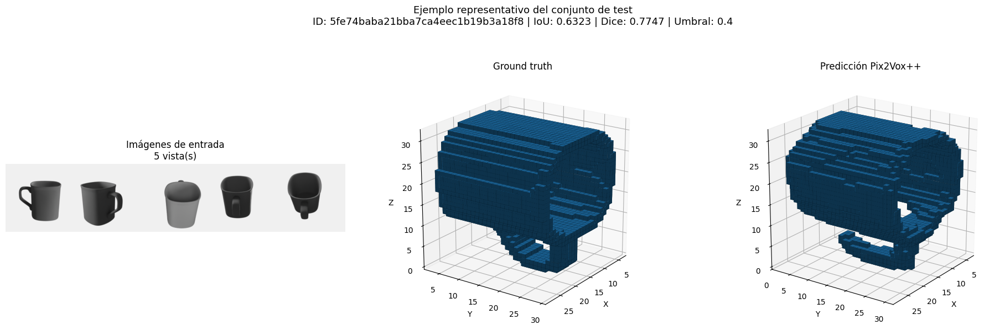


Ejemplo representativo guardado en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp14_6categorias_5v_finetuning_test_tazas/ejemplo_representativo.png

EXP. 14 — TEST B: GLOBAL 6 CATEGORÍAS
EVALUACIÓN DEFINITIVA DEL EXPERIMENTO
Experimento:       exp14_6categorias_5v_finetuning_test_global
Tipo:              con_finetuning
Número de vistas:  5
Dispositivo:       cuda
Carpeta:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp14_6categorias_5v_finetuning_test_global

1. Seleccionando el umbral con validación...


Validación 5 vistas:   0%|          | 0/51 [00:00<?, ?it/s]

Umbral seleccionado: 0.4
IoU de selección:    0.6959

2. Calculando las métricas completas de validación...


Validación completa 5 vistas:   0%|          | 0/51 [00:00<?, ?it/s]


3. Evaluando el conjunto de test con el umbral fijo...


Test completo 5 vistas:   0%|          | 0/51 [00:00<?, ?it/s]


4. Guardando las tablas de resultados...

EVALUACIÓN DEL EXPERIMENTO FINALIZADA
Umbral seleccionado:      0.4
IoU validación:           0.6959
IoU test:                 0.7012
Dice test:                0.8039
Chamfer test:             0.5745
F-score superficie test:  0.8677
Tiempo total:             0.25 minutos

Resultados guardados en:
/content/drive/MyDrive/Datos_E2_E3/E2/Pix2Vox++/metricas/exp14_6categorias_5v_finetuning_test_global


In [ ]:
# ============================================================
# 28. EXPERIMENTO 14
#
# 6 categorías
# 5 vistas
# ResNet-50
# Fine-tuning
#
# VERSIÓN OPTIMIZADA:
# todas las imágenes y BINVOX se leen desde SSD local.
# ============================================================

import gc
import random
import shutil

from pathlib import Path

import numpy as np
import pandas as pd
import torch

from torch.utils.data import DataLoader


# ============================================================
# 1. CONFIGURACIÓN
# ============================================================

NOMBRE_EXP14 = (
    "exp14_6categorias_5v_finetuning"
)


NUM_VISTAS_EXP14 = 5


BATCH_EXP14 = 5


PASOS_ACUM_EXP14 = 1


BATCH_EFECTIVO_EXP14 = (
    BATCH_EXP14
    *
    PASOS_ACUM_EXP14
)


CATEGORIA_TAZAS_EXP14 = (
    "03797390"
)


# ------------------------------------------------------------
# DATALOADER
#
# Train = 0 workers:
# mantenemos la generación aleatoria en el proceso principal,
# igual que en los experimentos anteriores.
#
# Validación/test = 2 workers:
# las vistas son fijas y no existe augmentation aleatoria.
# ------------------------------------------------------------

NUM_WORKERS_TRAIN_EXP14 = 0

NUM_WORKERS_EVAL_EXP14 = 2


# ------------------------------------------------------------
# El intento anterior se interrumpió tras unas pocas épocas.
#
# True:
# elimina únicamente un entrenamiento INCOMPLETO de Exp.13
# antes de comenzar de nuevo.
#
# Si el experimento ya está terminado, NO lo elimina.
# ------------------------------------------------------------

REINICIAR_EXP14_INCOMPLETO = True


# ============================================================
# 2. RUTAS
# ============================================================

RUTA_CHECKPOINT_EXP14 = (

    RUTA_CHECKPOINTS

    / f"{NOMBRE_EXP14}_mejor.pth"
)


RUTA_HISTORIAL_EXP14 = (

    RUTA_HISTORIALES

    / f"{NOMBRE_EXP14}_historial.csv"
)


RUTA_RESUMEN_EXP14 = (

    RUTA_HISTORIALES

    / f"{NOMBRE_EXP14}_resumen.json"
)


RUTA_METRICAS_TAZAS_EXP14 = (

    RUTA_METRICAS

    / (
        NOMBRE_EXP14
        + "_test_tazas"
    )
)


RUTA_METRICAS_GLOBAL_EXP14 = (

    RUTA_METRICAS

    / (
        NOMBRE_EXP14
        + "_test_global"
    )
)


RUTA_TABLA_EXP14 = (

    RUTA_TABLAS

    / (
        f"{NOMBRE_EXP14}"
        "_comparacion_tests.csv"
    )
)


RUTA_TABLA_CATEGORIAS_EXP14 = (

    RUTA_TABLAS

    / (
        f"{NOMBRE_EXP14}"
        "_metricas_por_categoria.csv"
    )
)


# ============================================================
# 3. SEMILLAS
# ============================================================

def reiniciar_semillas_exp14():

    random.seed(
        SEED
    )

    np.random.seed(
        SEED
    )

    torch.manual_seed(
        SEED
    )


    if torch.cuda.is_available():

        torch.cuda.manual_seed(
            SEED
        )

        torch.cuda.manual_seed_all(
            SEED
        )


# ============================================================
# 4. COMPROBAR QUE LOS DATAFRAMES LOCALES EXISTEN
# ============================================================

dataframes_locales_necesarios = [

    "df_train_exp14_local",

    "df_val_exp14_local",

    "df_test_exp14_local",
]


faltantes = [

    nombre

    for nombre
    in dataframes_locales_necesarios

    if nombre
    not in globals()
]


if faltantes:

    raise RuntimeError(
        "Faltan los DataFrames locales del Exp.14:\n"
        f"{faltantes}\n\n"
        "Ejecuta primero las celdas de caché local."
    )


# ============================================================
# 5. NORMALIZAR CATEGORÍAS
# ============================================================

for dataframe in [

    df_train_exp14_local,

    df_val_exp14_local,

    df_test_exp14_local,
]:

    dataframe[
        "categoria"
    ] = (

        dataframe[
            "categoria"
        ]
        .astype(str)
        .str.zfill(8)
    )


    dataframe[
        "identificador"
    ] = (

        dataframe[
            "identificador"
        ]
        .astype(str)
    )


# ============================================================
# 6. COMPROBAR RUTAS LOCALES
# ============================================================

columnas_vistas_exp14 = [

    f"vista_{indice:02d}"

    for indice
    in range(20)
]


def comprobar_rutas_locales_exp14(
    dataframe,
    nombre_dataframe,
):

    columnas_comprobar = (

        columnas_vistas_exp14

        + [
            "ruta_binvox"
        ]
    )


    for columna in columnas_comprobar:

        if columna not in dataframe.columns:

            raise RuntimeError(
                f"{nombre_dataframe}: "
                f"falta la columna {columna}."
            )


    # No hace falta inspeccionar 45.000 rutas.
    # Comprobamos primero que conceptualmente apuntan a /content.
    muestra = dataframe.iloc[
        0
    ]


    for columna in columnas_comprobar:

        ruta = str(
            muestra[
                columna
            ]
        )


        if not ruta.startswith(
            "/content/"
        ):

            raise RuntimeError(
                f"{nombre_dataframe}: "
                f"{columna} no apunta al SSD local:\n"
                f"{ruta}"
            )


    print(
        f"[OK] {nombre_dataframe}: "
        "rutas locales."
    )


comprobar_rutas_locales_exp14(

    df_train_exp14_local,

    "train",
)


comprobar_rutas_locales_exp14(

    df_val_exp14_local,

    "validación",
)


comprobar_rutas_locales_exp14(

    df_test_exp14_local,

    "test",
)


# ============================================================
# 7. COMPROBACIÓN DE SPLITS
# ============================================================

def claves_exp14(
    dataframe
):

    return set(
        zip(

            dataframe[
                "categoria"
            ].astype(str),

            dataframe[
                "identificador"
            ].astype(str),
        )
    )


train_keys_exp14 = (
    claves_exp14(
        df_train_exp14_local
    )
)


val_keys_exp14 = (
    claves_exp14(
        df_val_exp14_local
    )
)


test_keys_exp14 = (
    claves_exp14(
        df_test_exp14_local
    )
)


if (
    train_keys_exp14
    &
    val_keys_exp14
):

    raise RuntimeError(
        "Fuga train / validación en Exp.14."
    )


if (
    train_keys_exp14
    &
    test_keys_exp14
):

    raise RuntimeError(
        "Fuga train / test en Exp.14."
    )


if (
    val_keys_exp14
    &
    test_keys_exp14
):

    raise RuntimeError(
        "Fuga validación / test en Exp.14."
    )


print(
    "[OK] Exp.14 sin fugas "
    "train/validación/test."
)


# ============================================================
# 8. DATAFRAMES DE TAZAS
# ============================================================

df_val_tazas_exp14_local = (

    df_val_exp14_local.loc[

        df_val_exp14_local[
            "categoria"
        ]
        ==
        CATEGORIA_TAZAS_EXP14
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


df_test_tazas_exp14_local = (

    df_test_exp14_local.loc[

        df_test_exp14_local[
            "categoria"
        ]
        ==
        CATEGORIA_TAZAS_EXP14
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


if (
    len(
        df_val_tazas_exp14_local
    )
    != 26
):

    raise RuntimeError(
        "Se esperaban 26 tazas "
        "de validación."
    )


if (
    len(
        df_test_tazas_exp14_local
    )
    != 26
):

    raise RuntimeError(
        "Se esperaban 26 tazas "
        "de test."
    )


# ============================================================
# 9. FUNCIÓN DATALOADER OPTIMIZADA
# ============================================================

def crear_loader_exp14(
    dataframe,
    modo,
    shuffle=False,
):

    dataset = DatasetPix2Vox(

        dataframe=(

            dataframe

            .reset_index(
                drop=True
            )
        ),

        numero_vistas=(
            NUM_VISTAS_EXP14
        ),

        modo=modo,

        fondo_aleatorio_entrenamiento=(
            modo
            ==
            "train"
        ),

        cachear_voxeles=True,
    )


    # --------------------------------------------------------
    # TRAIN
    # --------------------------------------------------------

    if modo == "train":

        numero_workers = (
            NUM_WORKERS_TRAIN_EXP14
        )


    # --------------------------------------------------------
    # VALIDACIÓN / TEST
    # --------------------------------------------------------

    else:

        numero_workers = (
            NUM_WORKERS_EVAL_EXP14
        )


    generador = None


    if shuffle:

        generador = (
            torch.Generator()
        )

        generador.manual_seed(
            SEED
        )


    argumentos_loader = {

        "dataset":
            dataset,

        "batch_size":
            BATCH_EXP14,

        "shuffle":
            shuffle,

        "num_workers":
            numero_workers,

        "pin_memory":
            USAR_PIN_MEMORY,

        "drop_last":
            False,

        "worker_init_fn":
            inicializar_worker,

        "generator":
            generador,

        "persistent_workers":
            (
                numero_workers
                > 0
            ),
    }


    if (
        numero_workers
        > 0
    ):

        argumentos_loader[
            "prefetch_factor"
        ] = 2


    return DataLoader(
        **argumentos_loader
    )


# ============================================================
# 10. CREAR DATALOADERS DESDE /content
# ============================================================

reiniciar_semillas_exp14()


loader_train_exp14 = (
    crear_loader_exp14(

        dataframe=(
            df_train_exp14_local
        ),

        modo="train",

        shuffle=True,
    )
)


loader_val_global_exp14 = (
    crear_loader_exp14(

        dataframe=(
            df_val_exp14_local
        ),

        modo="validacion",

        shuffle=False,
    )
)


loader_test_global_exp14 = (
    crear_loader_exp14(

        dataframe=(
            df_test_exp14_local
        ),

        modo="test",

        shuffle=False,
    )
)


loader_val_tazas_exp14 = (
    crear_loader_exp14(

        dataframe=(
            df_val_tazas_exp14_local
        ),

        modo="validacion",

        shuffle=False,
    )
)


loader_test_tazas_exp14 = (
    crear_loader_exp14(

        dataframe=(
            df_test_tazas_exp14_local
        ),

        modo="test",

        shuffle=False,
    )
)


# ============================================================
# 11. INFORMACIÓN PREVIA
# ============================================================

print(
    "\n" + "=" * 75
)

print(
    "EXPERIMENTO 14"
)

print(
    "6 CATEGORÍAS + 5 VISTAS + FINE-TUNING"
)

print(
    "=" * 75
)


print(
    f"Dispositivo:       "
    f"{DEVICE}"
)


print(
    f"Categorías:        "
    f"{CATEGORIAS_EXP14}"
)


print(
    f"Vistas:            "
    f"{NUM_VISTAS_EXP14}"
)


print(
    f"Batch físico:      "
    f"{BATCH_EXP14}"
)


print(
    f"Acumulación:       "
    f"{PASOS_ACUM_EXP14}"
)


print(
    f"Batch efectivo:    "
    f"{BATCH_EFECTIVO_EXP14}"
)


print(
    f"Train:             "
    f"{len(df_train_exp14_local)}"
)


print(
    f"Validación:        "
    f"{len(df_val_exp14_local)}"
)


print(
    f"Test:              "
    f"{len(df_test_exp14_local)}"
)


print(
    f"Val tazas:         "
    f"{len(df_val_tazas_exp14_local)}"
)


print(
    f"Test tazas:        "
    f"{len(df_test_tazas_exp14_local)}"
)


print(
    f"Train workers:     "
    f"{NUM_WORKERS_TRAIN_EXP14}"
)


print(
    f"Eval workers:      "
    f"{NUM_WORKERS_EVAL_EXP14}"
)


print(
    "Origen de datos:   "
    "SSD local /content"
)


# ============================================================
# 12. COMPROBAR SI UN HISTORIAL ESTÁ TERMINADO
# ============================================================

def historial_exp14_finalizado():

    if not (
        RUTA_CHECKPOINT_EXP14.exists()
        and
        RUTA_HISTORIAL_EXP14.exists()
    ):

        return False


    try:

        historial = pd.read_csv(
            RUTA_HISTORIAL_EXP14
        )


    except Exception:

        return False


    if historial.empty:

        return False


    # --------------------------------------------------------
    # Finalizó por máximo de épocas.
    # --------------------------------------------------------

    if (
        len(
            historial
        )
        >= NUMERO_EPOCAS_MAXIMO
    ):

        return True


    # --------------------------------------------------------
    # Finalizó por early stopping.
    # --------------------------------------------------------

    if (
        "epocas_sin_mejora"
        in historial.columns
    ):

        epocas_sin_mejora = int(

            historial.iloc[
                -1
            ][
                "epocas_sin_mejora"
            ]
        )


        if (
            epocas_sin_mejora
            >=
            PACIENCIA_EARLY_STOPPING
        ):

            return True


    return False


# ============================================================
# 13. ELIMINAR SOLO EL INTENTO INCOMPLETO
# ============================================================

exp14_completo_existente = (
    historial_exp14_finalizado()
)


if (

    REINICIAR_EXP14_INCOMPLETO

    and

    not exp14_completo_existente
):

    habia_archivos = False


    archivos_eliminar = [

        RUTA_CHECKPOINT_EXP14,

        RUTA_HISTORIAL_EXP14,

        RUTA_RESUMEN_EXP14,

        RUTA_TABLA_EXP14,

        RUTA_TABLA_CATEGORIAS_EXP14,
    ]


    for ruta in archivos_eliminar:

        if ruta.exists():

            habia_archivos = True

            ruta.unlink()


    for ruta in [

        RUTA_METRICAS_TAZAS_EXP14,

        RUTA_METRICAS_GLOBAL_EXP14,
    ]:

        if ruta.exists():

            habia_archivos = True

            shutil.rmtree(
                ruta
            )


    if habia_archivos:

        print(
            "\n[OK] Intento incompleto "
            "anterior de Exp.14 eliminado."
        )


    else:

        print(
            "\n[OK] No había resultados "
            "incompletos de Exp.14."
        )


# Volvemos a comprobar después de la limpieza.
exp14_completo_existente = (
    historial_exp14_finalizado()
)


# ============================================================
# 14. REINICIAR SEMILLAS JUSTO ANTES DEL MODELO
# ============================================================

reiniciar_semillas_exp14()


# ============================================================
# 15. CREAR PIX2VOX++/A ORIGINAL
# ============================================================

modelo_exp14 = (
    Pix2VoxPlusPlusA(

        usar_refiner=True,

        usar_merger=True,

        usar_pesos_imagenet=False,
    )
)


# ============================================================
# 16. RECUPERAR O ENTRENAR
# ============================================================

if exp14_completo_existente:

    print(
        "\nExperimento 14 ya terminado."
    )

    print(
        "Recuperando mejor checkpoint..."
    )


    metadata_exp14 = (
        cargar_checkpoint_finetuning(

            modelo=(
                modelo_exp14
            ),

            ruta_checkpoint=(
                RUTA_CHECKPOINT_EXP14
            ),

            dispositivo_carga="cpu",

            estricto=True,
        )
    )


    historial_exp14 = (
        pd.read_csv(
            RUTA_HISTORIAL_EXP14
        )
    )


    modelo_exp14 = (
        modelo_exp14.to(
            DEVICE
        )
    )


    modelo_exp14.eval()


# ============================================================
# ENTRENAMIENTO DESDE EL CHECKPOINT OFICIAL
# ============================================================

else:

    print(
        "\nCargando checkpoint "
        "oficial Pix2Vox++..."
    )


    metadata_pretrain_exp14 = (
        cargar_pesos_preentrenados_pix2vox(

            modelo=(
                modelo_exp14
            ),

            ruta_checkpoint=(
                RUTA_CHECKPOINT_OFICIAL
            ),

            dispositivo_carga="cpu",

            estricto=True,
        )
    )


    modelo_exp14 = (
        modelo_exp14.to(
            DEVICE
        )
    )


    print(
        "\nComenzando fine-tuning..."
    )


    resultado_ft_exp14 = (
        entrenar_modelo_finetuning_pix2vox(

            modelo=(
                modelo_exp14
            ),

            loader_train=(
                loader_train_exp14
            ),

            loader_validacion=(
                loader_val_global_exp14
            ),

            nombre_experimento=(
                NOMBRE_EXP14
            ),

            configuracion_experimento={

                "categorias":
                    list(
                        CATEGORIAS_EXP14
                    ),

                "numero_categorias":
                    int(
                        len(
                            CATEGORIAS_EXP14
                        )
                    ),

                "numero_vistas":
                    int(
                        NUM_VISTAS_EXP14
                    ),

                "fine_tuning":
                    True,

                "modelo":
                    "Pix2Vox++/A",

                "backbone":
                    "ResNet-50",

                "checkpoint_inicial":
                    str(
                        RUTA_CHECKPOINT_OFICIAL
                    ),

                "tamano_lote_fisico":
                    int(
                        BATCH_EXP14
                    ),

                "pasos_acumulacion":
                    int(
                        PASOS_ACUM_EXP14
                    ),

                "tamano_lote_efectivo":
                    int(
                        BATCH_EFECTIVO_EXP14
                    ),

                "train_objetos":
                    int(
                        len(
                            df_train_exp14_local
                        )
                    ),

                "validacion_objetos":
                    int(
                        len(
                            df_val_exp14_local
                        )
                    ),

                "test_objetos":
                    int(
                        len(
                            df_test_exp14_local
                        )
                    ),

                "test_tazas":
                    int(
                        len(
                            df_test_tazas_exp14_local
                        )
                    ),

                "mismo_test_tazas_exp10":
                    True,

                "precision":
                    "float32",

                "almacenamiento_datos":
                    "SSD local /content",
            },

            numero_epocas=(
                NUMERO_EPOCAS_MAXIMO
            ),

            paciencia_early_stopping=(
                PACIENCIA_EARLY_STOPPING
            ),

            pasos_acumulacion=(
                PASOS_ACUM_EXP14
            ),

            max_lotes_train=None,

            max_lotes_validacion=None,
        )
    )


    modelo_exp14 = (
        resultado_ft_exp14[
            "modelo"
        ]
    )


    historial_exp14 = (
        resultado_ft_exp14[
            "historial"
        ]
    )


    metadata_exp14 = (
        resultado_ft_exp14[
            "metadata_checkpoint"
        ]
    )


# ============================================================
# 17. MODELO EN EVALUACIÓN
# ============================================================

modelo_exp14.eval()


# ============================================================
# 18. TEST A — SOLO TAZAS
# ============================================================

print(
    "\n" + "=" * 75
)

print(
    "EXP. 14 — TEST A: SOLO TAZAS"
)

print(
    "=" * 75
)


resultado_tazas_exp14 = (
    evaluar_y_guardar_experimento_pix2vox(

        modelo=(
            modelo_exp14
        ),

        loader_validacion=(
            loader_val_tazas_exp14
        ),

        loader_test=(
            loader_test_tazas_exp14
        ),

        nombre_experimento=(
            NOMBRE_EXP14
            + "_test_tazas"
        ),

        numero_vistas=(
            NUM_VISTAS_EXP14
        ),

        tipo_experimento=(
            "con_finetuning"
        ),

        configuracion_extra={

            "categorias_train":
                list(
                    CATEGORIAS_EXP14
                ),

            "numero_categorias":
                7,

            "tipo_test":
                "solo_tazas",

            "backbone":
                "ResNet-50",

            "ruta_checkpoint":
                str(
                    RUTA_CHECKPOINT_EXP14
                ),
        },

        sobrescribir=True,
    )
)


# ============================================================
# 19. VISUALIZACIÓN TAZAS
# ============================================================

visualizar_ejemplo_representativo_pix2vox(

    modelo=(
        modelo_exp14
    ),

    dataloader_test=(
        loader_test_tazas_exp14
    ),

    tabla_test_por_objeto=(
        resultado_tazas_exp14[
            "resultado_test_completo"
        ][
            "tabla_por_objeto"
        ]
    ),

    umbral=(
        resultado_tazas_exp14[
            "umbral_seleccionado"
        ]
    ),

    ruta_experimento=(
        resultado_tazas_exp14[
            "ruta_experimento"
        ]
    ),

    numero_vistas=(
        NUM_VISTAS_EXP14
    ),
)


# ============================================================
# 20. TEST B — GLOBAL 6 CATEGORÍAS
# ============================================================

print(
    "\n" + "=" * 75
)

print(
    "EXP. 14 — TEST B: GLOBAL 6 CATEGORÍAS"
)

print(
    "=" * 75
)


resultado_global_exp14 = (
    evaluar_y_guardar_experimento_pix2vox(

        modelo=(
            modelo_exp14
        ),

        loader_validacion=(
            loader_val_global_exp14
        ),

        loader_test=(
            loader_test_global_exp14
        ),

        nombre_experimento=(
            NOMBRE_EXP14
            + "_test_global"
        ),

        numero_vistas=(
            NUM_VISTAS_EXP14
        ),

        tipo_experimento=(
            "con_finetuning"
        ),

        configuracion_extra={

            "categorias_train":
                list(
                    CATEGORIAS_EXP14
                ),

            "numero_categorias":
                6,

            "tipo_test":
                "global",

            "backbone":
                "ResNet-50",

            "ruta_checkpoint":
                str(
                    RUTA_CHECKPOINT_EXP14
                ),
        },

        sobrescribir=True,
    )
)


# ============================================================
# 21. VISUALIZACIÓN GLOBAL
# ============================================================

visualizar_ejemplo_representativo_pix2vox(

    modelo=(
        modelo_exp14
    ),

    dataloader_test=(
        loader_test_global_exp14
    ),

    tabla_test_por_objeto=(
        resultado_global_exp14[
            "resultado_test_completo"
        ][
            "tabla_por_objeto"
        ]
    ),

    umbral=(
        resultado_global_exp14[
            "umbral_seleccionado"
        ]
    ),

    ruta_experimento=(
        resultado_global_exp14[
            "ruta_experimento"
        ]
    ),

    numero_vistas=(
        NUM_VISTAS_EXP14
    ),
)


# ============================================================
# 22. TABLA SOLO TAZAS VS GLOBAL
# ============================================================

fila_test_tazas_exp14 = (

    resultado_tazas_exp14[
        "tabla_resumen"
    ]

    .query(
        "conjunto == 'test'"
    )

    .iloc[
        0
    ]
)


fila_test_global_exp14 = (

    resultado_global_exp14[
        "tabla_resumen"
    ]

    .query(
        "conjunto == 'test'"
    )

    .iloc[
        0
    ]
)


metricas_exp14 = [

    "numero_objetos",

    "umbral",

    "bce_x10_media",

    "iou_media",

    "dice_media",

    "precision_voxel_media",

    "recall_voxel_media",

    "chamfer_superficie_media",

    "f_score_superficie_media",
]


tabla_tests_exp14 = pd.DataFrame(
    [
        {
            "test":
                "Solo tazas",

            **{
                metrica:
                    fila_test_tazas_exp14[
                        metrica
                    ]

                for metrica
                in metricas_exp14
            },
        },

        {
            "test":
                "Global 6 categorías",

            **{
                metrica:
                    fila_test_global_exp14[
                        metrica
                    ]

                for metrica
                in metricas_exp14
            },
        },
    ]
)


tabla_tests_exp14.to_csv(

    RUTA_TABLA_EXP14,

    index=False,
)


print(
    "\n" + "=" * 75
)

print(
    "RESULTADOS EXPERIMENTO 14"
)

print(
    "=" * 75
)


display(
    tabla_tests_exp14.round(
        4
    )
)


# ============================================================
# 23. MÉTRICAS GLOBALES POR CATEGORÍA
#
# IMPORTANTE:
# tabla_por_objeto contiene varios umbrales.
# Utilizamos únicamente el seleccionado.
# ============================================================

tabla_objetos_exp14 = (

    resultado_global_exp14[
        "resultado_test_completo"
    ][
        "tabla_por_objeto"
    ]

    .copy()
)


umbral_global_exp14 = float(

    resultado_global_exp14[
        "umbral_seleccionado"
    ]
)


tabla_objetos_exp14_umbral = (

    tabla_objetos_exp14.loc[

        np.isclose(

            tabla_objetos_exp14[
                "umbral"
            ]
            .astype(
                float
            ),

            umbral_global_exp14,
        )
    ]

    .copy()
)


tabla_categoria_exp14 = (

    tabla_objetos_exp14_umbral

    .groupby(
        "categoria"
    )[
        [
            "iou",

            "dice",

            "precision_voxel",

            "recall_voxel",
        ]
    ]

    .mean()

    .reset_index()
)


print(
    "\nResultados por categoría "
    f"@ umbral {umbral_global_exp14}:"
)


display(
    tabla_categoria_exp14.round(
        4
    )
)


tabla_categoria_exp14.to_csv(

    RUTA_TABLA_CATEGORIAS_EXP14,

    index=False,
)


# ============================================================
# 24. COMPARACIÓN DIRECTA EXP.10 VS EXP.14
# ============================================================

RUTA_EXP10 = (

    RUTA_TABLAS

    / (
        "exp10_4categorias_5v_finetuning"
        "_comparacion_tests.csv"
    )
)


if RUTA_EXP10.exists():

    tabla_exp10 = (
        pd.read_csv(
            RUTA_EXP10
        )
    )


    tabla_exp10[
        "test_comparable"
    ] = (

        tabla_exp10[
            "test"
        ]

        .replace(
            {
                "Global 4 categorías":
                    "Global",
            }
        )
    )


    tabla_exp14_comparacion = (
        tabla_tests_exp14
        .copy()
    )


    tabla_exp14_comparacion[
        "test_comparable"
    ] = (

        tabla_exp14_comparacion[
            "test"
        ]

        .replace(
            {
                "Global 6 categorías":
                    "Global",
            }
        )
    )


    columnas_comparacion = [

        "iou_media",

        "dice_media",

        "chamfer_superficie_media",

        "f_score_superficie_media",
    ]


    comparacion_exp10_exp14 = (

        tabla_exp10[
            [
                "test_comparable",

                *columnas_comparacion,
            ]
        ]

        .merge(

            tabla_exp14_comparacion[
                [
                    "test_comparable",

                    *columnas_comparacion,
                ]
            ],

            on="test_comparable",

            suffixes=(

                "_exp10_4cat",

                "_exp14_6cat",
            ),
        )
    )


    comparacion_exp10_exp14[
        "delta_iou_14_menos_10"
    ] = (

        comparacion_exp10_exp14[
            "iou_media_exp14_6cat"
        ]

        -

        comparacion_exp10_exp14[
            "iou_media_exp10_4cat"
        ]
    )


    comparacion_exp10_exp14[
        "delta_dice_14_menos_10"
    ] = (

        comparacion_exp10_exp14[
            "dice_media_exp14_6cat"
        ]

        -

        comparacion_exp10_exp14[
            "dice_media_exp10_4cat"
        ]
    )


    RUTA_COMPARACION_EXP10_EXP14 = (

        RUTA_TABLAS

        / "comparacion_exp10_vs_exp14.csv"
    )


    comparacion_exp10_exp14.to_csv(

        RUTA_COMPARACION_EXP10_EXP14,

        index=False,
    )


    print(
        "\n" + "=" * 75
    )

    print(
        "COMPARACIÓN EXP. 10 VS EXP. 14"
    )

    print(
        "=" * 75
    )


    display(
        comparacion_exp10_exp14.round(
            4
        )
    )


else:

    print(
        "\n[AVISO] No se encontró "
        "la tabla del Exp.10:"
    )

    print(
        RUTA_EXP10
    )


# ============================================================
# 25. LIMPIEZA FINAL
# ============================================================

modelo_exp14 = (
    modelo_exp14.to(
        "cpu"
    )
)


del modelo_exp14

del loader_train_exp14
del loader_val_global_exp14
del loader_test_global_exp14
del loader_val_tazas_exp14
del loader_test_tazas_exp14


gc.collect()


if torch.cuda.is_available():

    torch.cuda.empty_cache()


print(
    "\n" + "=" * 75
)

print(
    "[OK] EXPERIMENTO 14 COMPLETADO"
)

print(
    "=" * 75
)